# COS 711 Assignment 2 - 2024 - Almond Classification

### Damian Jordaan

## 1. Function Definitions

In [127]:
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from tensorflow.keras.callbacks import Callback
from tensorflow.keras import layers, models
from tqdm import tqdm, tqdm_notebook, notebook
import numpy as np
import threading
import sys
import optuna
import joblib
import optuna.visualization as vis
import matplotlib.pyplot as plt

### 1.1. Data Preprocessing and Exploration Functions

In [24]:
def print_missing_values(df):
    missing_per_array = []
    for column in df.columns:
        missing_percentage = df[column].isnull().mean() * 100
        # print(f'Column {column} has {missing_percentage:.2f}% missing values.')

        if missing_percentage > 0:
            # round to 2 decimal places
            missing_percentage = round(missing_percentage, 2)
            missing_per_array.append(missing_percentage)
        else:
            missing_per_array.append("N")

    # print Table
    missing_per_array = np.array(missing_per_array)
    missing_per_array = missing_per_array.reshape(1, -1)
    missing_per_df = pd.DataFrame(missing_per_array, columns=df.columns)
    return missing_per_df

In [25]:
def apply_normalization(df, column_name, normalization_func, **kwargs):
    """
    Applies a normalization function to a specified column in a DataFrame.

    Args:
        df (pd.DataFrame): The input DataFrame.
        column_name (str): The name of the column to normalize.
        normalization_func (function): The normalization function to apply.
        **kwargs: Additional keyword arguments to pass to the normalization function.

    Returns:
        pd.DataFrame: The DataFrame with the normalized column.
    """
    df_copy = df.copy()
    df_copy[column_name] = df_copy[column_name].apply(lambda x: normalization_func(x, **kwargs))
    return df_copy

In [26]:
def standardize_value(value, mean, std):
    """
    Standardizes a single value using Z-score normalization.

    Args:
        value (float): The value to be standardized.
        mean (float): The mean of the feature.
        std (float): The standard deviation of the feature.

    Returns:
        float: The standardized value.
    """
    return (value - mean) / std

In [27]:
def min_max_scale_value(value, min_val, max_val):
    """
    Scales a single value using Min-Max Scaling.

    Args:
        value (float): The value to be scaled.
        min_val (float): The minimum value of the feature.
        max_val (float): The maximum value of the feature.

    Returns:
        float: The scaled value.
    """
    return (value - min_val) / (max_val - min_val)

In [28]:
def apply_min_max_multiple_column_unified(df, columns):
    """
    Applies Min-Max Scaling to multiple columns in a DataFrame using the same minimum and maximum values.

    Args:
        df (pd.DataFrame): The input DataFrame.
        columns (list): The list of columns to scale.

    Returns:
        pd.DataFrame: The DataFrame with the scaled columns.
    """
    df_copy = df.copy()
    min_val = df_copy[columns].min().min()
    max_val = df_copy[columns].max().max()
    for column in columns:
        df_copy[column] = df_copy[column].apply(lambda x: min_max_scale_value(x, min_val, max_val))
    return df_copy

In [29]:
def apply_standardization_multiple_column_unified(df, columns):
    """
    Applies Z-score normalization to multiple columns in a DataFrame using the same mean and standard deviation values.

    Args:
        df (pd.DataFrame): The input DataFrame.
        columns (list): The list of columns to standardize.

    Returns:
        pd.DataFrame: The DataFrame with the standardized columns.
    """
    df_copy = df.copy()
    mean = df_copy[columns].mean().mean()
    std = df_copy[columns].std().std()
    for column in columns:
        df_copy[column] = df_copy[column].apply(lambda x: standardize_value(x, mean, std))
    return df_copy

In [30]:
def get_stats(df):
    """
    Returns the min, max, mean, median, and standard deviation of each column in a DataFrame.

    Args:
        df (pd.DataFrame): The input DataFrame.

    Returns:
        pd.DataFrame: A DataFrame containing the statistics for each column.
    """
    max_array = []
    min_array = []
    mean_array = []
    median_array = []
    std_array = []

    for column in df.columns:
        # if numeric column
        if pd.api.types.is_numeric_dtype(df[column]):
            max_val = df[column].max()
            min_val = df[column].min()
            mean_val = df[column].mean()
            median_val = df[column].median()
            std_val = df[column].std()

            # round to 2 decimal places
            # if max_val is numeric and not a boolean
            if pd.api.types.is_numeric_dtype(max_val) and not pd.api.types.is_bool_dtype(max_val):
                max_val = round(max_val, 2)
            # if min_val is numeric and not a boolean
            if pd.api.types.is_numeric_dtype(min_val) and not pd.api.types.is_bool_dtype(min_val):
                min_val = round(min_val, 2)
            # if mean_val is numeric and not a boolean
            if pd.api.types.is_numeric_dtype(mean_val) and not pd.api.types.is_bool_dtype(mean_val):
                mean_val = round(mean_val, 2)
            # if median_val is numeric and not a boolean
            if pd.api.types.is_numeric_dtype(median_val) and not pd.api.types.is_bool_dtype(median_val):
                median_val = round(median_val, 2)
            # if std_val is numeric and not a boolean
            if pd.api.types.is_numeric_dtype(std_val) and not pd.api.types.is_bool_dtype(std_val):
                std_val = round(std_val, 2)
        else:
            max_val = "N"
            min_val = "N"
            mean_val = "N"
            median_val = "N"
            std_val = "N"

        max_array.append(max_val)
        min_array.append(min_val)
        mean_array.append(mean_val)
        median_array.append(median_val)
        std_array.append(std_val)

    # print Table
    max_array = np.array(max_array)
    min_array = np.array(min_array)
    mean_array = np.array(mean_array)
    median_array = np.array(median_array)
    std_array = np.array(std_array)

    max_array = max_array.reshape(1, -1)
    min_array = min_array.reshape(1, -1)
    mean_array = mean_array.reshape(1, -1)
    median_array = median_array.reshape(1, -1)
    std_array = std_array.reshape(1, -1)

    array = np.concatenate((max_array, min_array, mean_array, median_array, std_array), axis=0)

    stats_df = pd.DataFrame(array, columns=df.columns)

    stats_df.index = ['Max', 'Min', 'Mean', 'Median', 'Std']
    
    return stats_df

In [109]:
# outlier detection
def is_outlier(value, p25, p75, iqr_factor=1.5):
    """
    Determines if a value is an outlier based on the IQR rule.

    Args:
        value (float): The value to check for being an outlier.
        p25 (float): The 25th percentile of the feature.
        p75 (float): The 75th percentile of the feature.

    Returns:
        bool: True if the value is an outlier, False otherwise.
    """
    iqr = p75 - p25
    lower_bound = p25 - 1.5 * iqr
    upper_bound = p75 + 1.5 * iqr
    return value < lower_bound or value > upper_bound

In [110]:
# remove outliers
def remove_outliers(df, columns=[], iqr_factor=1.5, column_percentage=0.5, inplace=False):
    """
    Removes outliers from the DataFrame if it is an outlier in more than the 'column_percentage' amount of columns.

    Args:
        df (pd.DataFrame): The input DataFrame.
        columns (list): The list of columns to check outliers from.
        iqr_factor (float): The IQR factor to use for outlier detection.
        column_percentage (float): The percentage of columns a row needs to be an outlier in to be removed.
        inplace (bool): Whether to modify the DataFrame in place.


    Returns:
        pd.DataFrame: The DataFrame with the outliers removed.
    """
    if not inplace:
        df = df.copy()

    if len(columns) == 0: # numerical columns
        columns = df.select_dtypes(include=['number']).columns.tolist()

    # calculate the 25th and 75th percentiles
    percentiles = df[columns].quantile([0.25, 0.75])

    for index, row in df.iterrows():
        outlier_count = 0
        for column in columns:
            if is_outlier(row[column], percentiles.loc[0.25, column], percentiles.loc[0.75, column], iqr_factor):
                outlier_count += 1

        if outlier_count >= len(columns) * column_percentage:
            df.drop(index, inplace=True)

    return df

### 1.2. Nural Network Functions

#### 1.2.1. Neural Network Model

In [31]:
def create_pyramid_model(starting_hidden_layer_size, number_hidden_layers, input_shape, output_shape, optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'], hidden_activation='relu', output_activation='softmax'):
    model = tf.keras.Sequential()
    
    # Add the input layer
    model.add(tf.keras.layers.InputLayer(shape=input_shape))
    
    # Calculate the decrement step for the number of neurons
    decrement_step = (starting_hidden_layer_size - output_shape) // number_hidden_layers
    
    # Add hidden layers with decreasing number of neurons
    for i in range(number_hidden_layers):
        num_neurons = starting_hidden_layer_size - i * decrement_step
        model.add(tf.keras.layers.Dense(num_neurons, activation=hidden_activation))
    
    # Add the output layer
    model.add(tf.keras.layers.Dense(output_shape, activation=output_activation))
    
    # Compile the model
    model.compile(optimizer=optimizer, loss=loss, metrics=metrics)
    
    return model

In [32]:
def create_pyramid_model_v2(starting_hidden_layer_size, number_hidden_layers, input_shape, output_shape, optimizer, loss='categorical_crossentropy', metrics=['accuracy'], hidden_activation='relu', output_activation='softmax'):
    model = tf.keras.Sequential()
    
    # Add the input layer
    model.add(tf.keras.layers.InputLayer(shape=input_shape))
    
    # Calculate the decrement step for the number of neurons
    decrement_step = (starting_hidden_layer_size - output_shape) // number_hidden_layers
    
    # Add hidden layers with decreasing number of neurons
    for i in range(number_hidden_layers):
        num_neurons = starting_hidden_layer_size - i * decrement_step
        model.add(tf.keras.layers.Dense(num_neurons, activation=hidden_activation))
    
    # Add the output layer
    model.add(tf.keras.layers.Dense(output_shape, activation=output_activation))

    # Build the optimizer
    input_shape_x = input_shape[0]
    model.build(input_shape=(None, input_shape_x))
    optimizer.build(model.trainable_variables)
    
    # Compile the model
    model.compile(optimizer=optimizer, loss=loss, metrics=metrics)
    
    return model

#### 1.2.2. Neural Network Callbacks

In [348]:
# Custom callback to stop training based on F-score and accuracy
class CustomCallback(Callback):
    def __init__(self, patience=10, min_delta=0.01):
        super(CustomCallback, self).__init__()
        self.patience = patience
        self.min_delta = min_delta
        self.wait = 0
        self.best_weights = None
        self.best_fscore = 0
        self.best_accuracy = 0

    def on_epoch_end(self, epoch, logs=None):
        current_fscore = logs.get('val_f1_score')
        current_accuracy = logs.get('val_accuracy')

        # average f1 score
        current_fscore = np.mean(current_fscore)

        if current_fscore is None or current_accuracy is None:
            return
        
        if current_fscore >= self.best_fscore and current_accuracy >= self.best_accuracy:
                self.best_fscore = current_fscore
                self.best_accuracy = current_accuracy
                self.best_weights = self.model.get_weights()

        if (abs(current_fscore - self.best_fscore) < self.min_delta and
                abs(current_accuracy - self.best_accuracy) < self.min_delta):
            self.wait += 1
            if self.wait >= self.patience:
                print(f"Epoch {epoch}: Early stopping")
                self.model.stop_training = True
        else:
            self.wait = 0

    def on_train_end(self, logs=None):
        if self.best_weights is not None:
            self.model.set_weights(self.best_weights)
            print("Restoring model weights from the end of the best epoch.")

In [34]:
class TQDMProgressBar(Callback):
    def set_custom_name(self, name):
        self.bar_name = name

    def on_train_begin(self, logs=None):
        self.epochs = self.params['epochs']
        self.steps = self.params['steps']

        # color_start = '\033[92m'  # Green text
        # color_end = '\033[0m'     # Reset to default color
        # bar_format = f'{color_start}{{l_bar}}{{bar:30}}{{r_bar}}{color_end}'

        if 'ipykernel' in sys.modules:
            self.progress_bar = notebook.tqdm(total=self.epochs * self.steps, desc=f'{self.bar_name} Training Progress', dynamic_ncols=True, leave=False)
        else:
            self.progress_bar = tqdm(total=self.epochs * self.steps, desc=f'{self.bar_name} Training Progress', dynamic_ncols=True, leave=False)

    def on_batch_end(self, batch, logs=None):
        self.progress_bar.update(1)
        self.progress_bar.set_postfix(logs, refresh=False)

    def on_train_end(self, logs=None):
        if self.model.stop_training:
            self.progress_bar.update(self.epochs * self.steps - self.progress_bar.n)
        self.progress_bar.close()

In [35]:
class tf_progress_bar_updater(Callback):
    def __init__(self, progress_bar, subcount=1):
        super(tf_progress_bar_updater, self).__init__()
        self.pbar = progress_bar
        self.epoch_done = 0
        self.subcount = subcount

    def on_epoch_end(self, epoch, logs=None):
        # logs = logs or {}
        self.pbar.update(1)
        self.epoch_done += 1
        # self.pbar.set_postfix(logs, refresh=False)
    
    def on_train_end(self, logs=None):
        if self.model.stop_training:
            self.pbar.update(self.subcount - self.epoch_done)

#### 1.2.3. Neural Network Optimizers

In [36]:
class CustomSDGOptimizer(tf.keras.optimizers.Optimizer): # Based on the SGD optimizer Implementation in TensorFlow
    """Gradient descent (with momentum) optimizer.

    Update rule for parameter `w` with gradient `g` when `momentum` is 0:

    ```python
    w = w - learning_rate * g
    ```

    Update rule when `momentum` is larger than 0:

    ```python
    velocity = momentum * velocity - learning_rate * g
    w = w + velocity
    ```

    When `nesterov=True`, this rule becomes:

    ```python
    velocity = momentum * velocity - learning_rate * g
    w = w + momentum * velocity - learning_rate * g
    ```

    Args:
        learning_rate: A float, a
            `keras.optimizers.schedules.LearningRateSchedule` instance, or
            a callable that takes no arguments and returns the actual value to
            use. The learning rate. Defaults to `0.01`.
        momentum: float hyperparameter >= 0 that accelerates gradient descent in
            the relevant direction and dampens oscillations. 0 is vanilla
            gradient descent. Defaults to `0.0`.
        nesterov: boolean. Whether to apply Nesterov momentum.
            Defaults to `False`.
        {{base_optimizer_keyword_args}}
    """

    def __init__(
        self,
        learning_rate=0.01,
        momentum=0.0,
        nesterov=False,
        weight_decay=None,
        clipnorm=None,
        clipvalue=None,
        global_clipnorm=None,
        use_ema=False,
        ema_momentum=0.99,
        ema_overwrite_frequency=None,
        loss_scale_factor=None,
        gradient_accumulation_steps=None,
        name="SGD",
        **kwargs,
    ):
        super().__init__(
            learning_rate=learning_rate,
            name=name,
            weight_decay=weight_decay,
            clipnorm=clipnorm,
            clipvalue=clipvalue,
            global_clipnorm=global_clipnorm,
            use_ema=use_ema,
            ema_momentum=ema_momentum,
            ema_overwrite_frequency=ema_overwrite_frequency,
            loss_scale_factor=loss_scale_factor,
            gradient_accumulation_steps=gradient_accumulation_steps,
            **kwargs,
        )
        if not isinstance(momentum, float) or momentum < 0 or momentum > 1:
            raise ValueError("`momentum` must be a float between [0, 1].")
        self.momentum = momentum
        self.nesterov = nesterov

    def build(self, variables):
        """Initialize optimizer variables.

        SGD optimizer has one variable `momentums`, only set if `self.momentum`
        is not 0.

        Args:
          var_list: list of model variables to build SGD variables on.
        """
        if self.built:
            return
        super().build(variables)
        self.momentums = []
        if self.momentum != 0:
            for variable in variables:
                self.momentums.append(
                    self.add_variable_from_reference(
                        reference_variable=variable, name="momentum"
                    )
                )

    def update_step(self, gradient, variable, learning_rate):
        """Update step given gradient and the associated model variable."""
        learning_rate = tf.cast(learning_rate, variable.dtype)
        gradient = tf.cast(gradient, variable.dtype)
        m = None
        if self.momentum != 0:
            m = self.momentums[self._get_variable_index(variable)]

        if m is not None:
            momentum = tf.cast(self.momentum, variable.dtype)
            self.assign(
                m,
                (momentum * m - learning_rate * gradient),
            )
            if self.nesterov:
                self.assign_add(
                    variable,
                    (momentum * m - learning_rate * gradient),
                )
            else:
                self.assign_add(variable, m)
        else:
            self.assign_sub(variable, (learning_rate * gradient))

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "momentum": self.momentum,
                "nesterov": self.nesterov,
            }
        )
        return config

In [376]:
class CustomRPropOptimizer(tf.keras.optimizers.Optimizer):
    """RProp optimizer.

    Update rule for parameter `w` with gradient `g`:

    ```python
    w = w - sign(g) * learning_rate
    ```

    Args:
        learning_rate: A float, a
            `keras.optimizers.schedules.LearningRateSchedule` instance, or
            a callable that takes no arguments and returns the actual value to
            use. The learning rate. Defaults to `0.01`. (Does not affect the weight update step)
        Initial Step Size: float hyperparameter >= 0 that accelerates gradient 
            descent in the relevant direction and dampens oscillations. 0 is 
            standard gradient descent. Defaults to `0.1`.
        Increment Factor: float hyperparameter >= 0 that accelerates gradient 
            descent in the relevant direction and dampens oscillations. 0 is 
            standard gradient descent. Defaults to `1.2`.
        Decrement Factor: float hyperparameter >= 0 that accelerates gradient 
            descent in the relevant direction and dampens oscillations. 0 is 
            standard gradient descent. Defaults to `0.5`.
        Min Step Size: float hyperparameter >= 0 that accelerates gradient 
            descent in the relevant direction and dampens oscillations. 0 is 
            standard gradient descent. Defaults to `1e-6`.
        Max Step Size: float hyperparameter >= 0 that accelerates gradient 
            descent in the relevant direction and dampens oscillations. 0 is 
            standard gradient descent. Defaults to `50.0`.
        {{base_optimizer_keyword_args}}
    """

    def __init__(
        self,
        learning_rate=0.01,
        weight_decay=None,
        clipnorm=None,
        clipvalue=None,
        global_clipnorm=None,
        use_ema=False,
        ema_momentum=0.99,
        ema_overwrite_frequency=None,
        loss_scale_factor=None,
        gradient_accumulation_steps=None,
        initial_step_size=0.1,
        increment_factor=1.2,
        decrement_factor=0.5,
        min_step_size=1e-6,
        max_step_size=50.0,
        name="RProp",
        **kwargs,
    ):
        super().__init__(
            learning_rate=learning_rate,
            name=name,
            weight_decay=weight_decay,
            clipnorm=clipnorm,
            clipvalue=clipvalue,
            global_clipnorm=global_clipnorm,
            use_ema=use_ema,
            ema_momentum=ema_momentum,
            ema_overwrite_frequency=ema_overwrite_frequency,
            loss_scale_factor=loss_scale_factor,
            gradient_accumulation_steps=gradient_accumulation_steps,
            **kwargs,
        )
        if not isinstance(initial_step_size, float) or initial_step_size < 0:
            raise ValueError("`initial_step_size` must be a float >= 0.")
        self.initial_step_size = initial_step_size
        self.increment_factor = increment_factor
        self.decrement_factor = decrement_factor
        self.min_step_size = min_step_size
        self.max_step_size = max_step_size

    def build(self, variables):
        """Initialize optimizer variables.

        RProp optimizer has 2 variables `step_sizes` and 'previous_gradients'.

        Args:
          var_list: list of model variables to build RProp variables on.
        """
        if self.built:
            return
        super().build(variables)
        self.step_sizes = []
        self.previous_gradients = []
        initializer = tf.keras.initializers.Constant(self.initial_step_size)
        if self.initial_step_size != 0:
            for variable in variables:
                self.step_sizes.append(
                    self.add_variable(
                        shape=variable.shape,
                        initializer=initializer,
                        dtype=variable.dtype,
                        name="step_size"
                    )
                )
                self.previous_gradients.append(
                    self.add_variable_from_reference(
                        reference_variable=variable, name="previous_gradient"
                    )
                )
            # print(self.step_sizes)
        else:
            print("No step sizes")

    def update_step(self, gradient, variable, learning_rate):
        """Update step given gradient and the associated model variable."""
        gradient = tf.cast(gradient, variable.dtype)
        step_size = self.step_sizes[self._get_variable_index(variable)]
        previous_gradient = self.previous_gradients[self._get_variable_index(variable)]
        increment_factor = tf.cast(self.increment_factor, variable.dtype)
        decrement_factor = tf.cast(self.decrement_factor, variable.dtype)
        min_step_size = tf.cast(self.min_step_size, variable.dtype)
        max_step_size = tf.cast(self.max_step_size, variable.dtype)
        sign = tf.sign(gradient * previous_gradient)

        # Update step size
        new_step_size = tf.where(
            sign > 0,
            tf.minimum(step_size * increment_factor, max_step_size),
            tf.where(sign < 0, tf.maximum(step_size * decrement_factor, min_step_size), step_size)
        )

        weight_update = tf.where(
            sign > 0,
            tf.where(gradient > 0, -new_step_size, new_step_size),
            0.0,
        )

        self.assign_add(variable, weight_update)

        # Update step size
        self.assign(
            step_size,
            new_step_size,
        )

        # Update previous gradient
        self.assign(
            previous_gradient,
            gradient,
        )

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "initial_step_size": self.initial_step_size,
                "increment_factor": self.increment_factor,
                "decrement_factor": self.decrement_factor,
                "min_step_size": self.min_step_size,
                "max_step_size": self.max_step_size,
            }
        )
        return config

In [142]:
class CustomNadamOptimizer(tf.keras.optimizers.Optimizer): # Based On the Nadam Optimizer Implementation in TensorFlow
    """Optimizer that implements the Nadam algorithm.

    Much like Adam is essentially RMSprop with momentum, Nadam is Adam with
    Nesterov momentum.

    Args:
        learning_rate: A float, a
            `keras.optimizers.schedules.LearningRateSchedule` instance, or
            a callable that takes no arguments and returns the actual value to
            use. The learning rate. Defaults to `0.001`.
        beta_1: A float value or a constant float tensor, or a callable
            that takes no arguments and returns the actual value to use. The
            exponential decay rate for the 1st moment estimates.
            Defaults to `0.9`.
        beta_2: A float value or a constant float tensor, or a callable
            that takes no arguments and returns the actual value to use. The
            exponential decay rate for the 2nd moment estimates. Defaults to
            `0.999`.
        epsilon: A small constant for numerical stability. This epsilon is
            "epsilon hat" in the Kingma and Ba paper (in the formula just before
            Section 2.1), not the epsilon in Algorithm 1 of the paper.
            Defaults to `1e-7`.
        {{base_optimizer_keyword_args}}

    """

    def __init__(
        self,
        learning_rate=0.001,
        beta_1=0.9,
        beta_2=0.999,
        epsilon=1e-7,
        weight_decay=None,
        clipnorm=None,
        clipvalue=None,
        global_clipnorm=None,
        use_ema=False,
        ema_momentum=0.99,
        ema_overwrite_frequency=None,
        loss_scale_factor=None,
        gradient_accumulation_steps=None,
        name="nadam",
        **kwargs,
    ):
        super().__init__(
            learning_rate=learning_rate,
            name=name,
            weight_decay=weight_decay,
            clipnorm=clipnorm,
            clipvalue=clipvalue,
            global_clipnorm=global_clipnorm,
            use_ema=use_ema,
            ema_momentum=ema_momentum,
            ema_overwrite_frequency=ema_overwrite_frequency,
            loss_scale_factor=loss_scale_factor,
            gradient_accumulation_steps=gradient_accumulation_steps,
            **kwargs,
        )
        self.beta_1 = beta_1
        self.beta_2 = beta_2
        self.epsilon = epsilon

    def build(self, var_list):
        """Initialize optimizer variables.

        Nadam optimizer has 2 types of variables: momentums and velocities.

        Args:
            var_list: list of model variables to build Nadam variables on.
        """
        if self.built:
            return
        if var_list:
            dtype = var_list[0].dtype
        else:
            dtype = tf.keras.backend.floatx()
        super().build(var_list)
        self._momentums = []
        self._velocities = []
        self._u_product = tf.Variable(1.0, dtype=dtype)

        for var in var_list:
            self._momentums.append(
                self.add_variable_from_reference(
                    reference_variable=var, name="momentum"
                )
            )
            self._velocities.append(
                self.add_variable_from_reference(
                    reference_variable=var, name="velocity"
                )
            )

    def _backend_update_step(self, grads, trainable_variables, learning_rate):
        dtype = self._u_product.dtype
        self.assign(
            self._u_product,
            self._u_product
            * self.beta_1
            * (
                1.0
                - 0.5 * tf.pow(0.96, tf.cast(self.iterations + 1, dtype))
            ),
        )
        super()._backend_update_step(grads, trainable_variables, learning_rate)

    def update_step(self, gradient, variable, learning_rate):
        """Update step given gradient and the associated model variable."""
        var_dtype = variable.dtype
        lr = tf.cast(learning_rate, var_dtype)
        gradient = tf.cast(gradient, var_dtype)

        local_step = tf.cast(self.iterations + 1, var_dtype)
        next_step = tf.cast(self.iterations + 2, var_dtype)
        decay = tf.cast(0.96, var_dtype)
        beta_1 = tf.cast(self.beta_1, var_dtype)
        beta_2 = tf.cast(self.beta_2, var_dtype)
        u_t = beta_1 * (1.0 - 0.5 * (tf.pow(decay, local_step)))
        u_t_1 = beta_1 * (1.0 - 0.5 * (tf.pow(decay, next_step)))
        u_product_t = tf.cast(self._u_product, var_dtype)

        u_product_t_1 = u_product_t * u_t_1
        beta_2_power = tf.pow(beta_2, local_step)

        m = self._momentums[self._get_variable_index(variable)]
        v = self._velocities[self._get_variable_index(variable)]

        self.assign_add(
            m, tf.multiply(tf.subtract(gradient, m), (1 - beta_1))
        )
        self.assign_add(
            v, tf.multiply(tf.subtract(tf.square(gradient), v), (1 - beta_2))
        )
        m_hat = tf.add(
            tf.divide(tf.multiply(u_t_1, m), 1 - u_product_t_1),
            tf.divide(tf.multiply(1 - u_t, gradient), 1 - u_product_t),
        )
        v_hat = tf.divide(v, (1 - beta_2_power))

        nadam_weight_update = tf.divide(
            tf.multiply(m_hat, lr), tf.add(tf.sqrt(v_hat), self.epsilon)
        )

        self.assign_sub(variable, nadam_weight_update)

    def get_config(self):
        config = super().get_config()

        config.update(
            {
                "beta_1": self.beta_1,
                "beta_2": self.beta_2,
                "epsilon": self.epsilon,
            }
        )
        return config

In [180]:
# Custom Hybrid Optimizer (Nadam + RProp)
class CustomHybridOptimizer(tf.keras.optimizers.Optimizer):
    """Optimizer that implements the Hybrid of the Nadam algorithm and the Resilient backpropagation (RProp) algorithm.

    Much like Adam is essentially RMSprop with momentum, Nadam is Adam with
    Nesterov momentum.

    RProp is a resilient backpropagation algorithm that uses only the sign of the gradient to update the weights.

    Args:
        optimizer_update_weight: A float hyperparameter >= 0 and <= 1
            value that determines the weight of the Nadam optimizer vs 
            the RProp optimizer. For example, a value of 0.6 will mean 
            that 60% of the weight will be given to the Nadam and 
            40% to the RProp optimizer. Defaults to `0.5`. 
        learning_rate: A float, a
            `keras.optimizers.schedules.LearningRateSchedule` instance, or
            a callable that takes no arguments and returns the actual value to
            use. The learning rate. Defaults to `0.001`.
        beta_1: A float value or a constant float tensor, or a callable
            that takes no arguments and returns the actual value to use. The
            exponential decay rate for the 1st moment estimates.
            Defaults to `0.9`.
        beta_2: A float value or a constant float tensor, or a callable
            that takes no arguments and returns the actual value to use. The
            exponential decay rate for the 2nd moment estimates. Defaults to
            `0.999`.
        epsilon: A small constant for numerical stability. This epsilon is
            "epsilon hat" in the Kingma and Ba paper (in the formula just before
            Section 2.1), not the epsilon in Algorithm 1 of the paper.
            Defaults to `1e-7`.
        Initial Step Size: float hyperparameter >= 0 that accelerates gradient 
            descent in the relevant direction and dampens oscillations. 0 is 
            standard gradient descent. Defaults to `0.1`.
        Increment Factor: float hyperparameter >= 0 that accelerates gradient 
            descent in the relevant direction and dampens oscillations. 0 is 
            standard gradient descent. Defaults to `1.2`.
        Decrement Factor: float hyperparameter >= 0 that accelerates gradient 
            descent in the relevant direction and dampens oscillations. 0 is 
            standard gradient descent. Defaults to `0.5`.
        Min Step Size: float hyperparameter >= 0 that accelerates gradient 
            descent in the relevant direction and dampens oscillations. 0 is 
            standard gradient descent. Defaults to `1e-6`.
        Max Step Size: float hyperparameter >= 0 that accelerates gradient 
            descent in the relevant direction and dampens oscillations. 0 is 
            standard gradient descent. Defaults to `50.0`.
        {{base_optimizer_keyword_args}}

    """

    def __init__(
        self,
        learning_rate=0.001,
        beta_1=0.9,
        beta_2=0.999,
        epsilon=1e-7,
        initial_step_size=0.1,
        increment_factor=1.2,
        decrement_factor=0.5,
        min_step_size=1e-6,
        max_step_size=50.0,
        weight_decay=None,
        clipnorm=None,
        clipvalue=None,
        global_clipnorm=None,
        use_ema=False,
        ema_momentum=0.99,
        ema_overwrite_frequency=None,
        loss_scale_factor=None,
        gradient_accumulation_steps=None,
        name="HybridNadamRProp",
        optimizer_update_weight=0.5,
        **kwargs,
    ):
        super().__init__(
            learning_rate=learning_rate,
            name=name,
            weight_decay=weight_decay,
            clipnorm=clipnorm,
            clipvalue=clipvalue,
            global_clipnorm=global_clipnorm,
            use_ema=use_ema,
            ema_momentum=ema_momentum,
            ema_overwrite_frequency=ema_overwrite_frequency,
            loss_scale_factor=loss_scale_factor,
            gradient_accumulation_steps=gradient_accumulation_steps,
            **kwargs,
        )
        if not (isinstance(max_step_size, float) or isinstance(max_step_size, int)) or initial_step_size < 0:
            raise ValueError("`initial_step_size` must be a float >= 0.")
        if not (isinstance(max_step_size, float) or isinstance(max_step_size, int)) or optimizer_update_weight < 0 or optimizer_update_weight > 1:
            raise ValueError("`optimizer_update_weight` must be a float between [0, 1].")
        if not (isinstance(max_step_size, float) or isinstance(max_step_size, int)) or increment_factor < 0:
            raise ValueError("`increment_factor` must be a float >= 0.")
        if not (isinstance(max_step_size, float) or isinstance(max_step_size, int)) or decrement_factor < 0:
            raise ValueError("`decrement_factor` must be a float >= 0.")
        if not (isinstance(max_step_size, float) or isinstance(max_step_size, int)) or min_step_size < 0:
            raise ValueError("`min_step_size` must be a float >= 0.")
        # number instance
        if not (isinstance(max_step_size, float) or isinstance(max_step_size, int)) or max_step_size < 0:
            raise ValueError("`max_step_size` must be a float >= 0.")
        self.initial_step_size = initial_step_size
        self.increment_factor = increment_factor
        self.decrement_factor = decrement_factor
        self.min_step_size = min_step_size
        self.max_step_size = max_step_size
        self.beta_1 = beta_1
        self.beta_2 = beta_2
        self.epsilon = epsilon
        
        self.nadam_update_weighting = optimizer_update_weight
        self.rprop_update_weighting = 1 - optimizer_update_weight

    def build(self, var_list):
        """Initialize optimizer variables.

        Nadam optimizer has 2 types of variables: momentums and velocities.
        RProp optimizer has 2 variables `step_sizes` and 'previous_gradients'.

        Args:
            var_list: list of model variables to build Nadam variables on.
        """
        if self.built:
            return
        if var_list:
            dtype = var_list[0].dtype
        else:
            dtype = tf.keras.backend.floatx()
        super().build(var_list)
        self._momentums = []
        self._velocities = []
        self.step_sizes = []
        self.previous_gradients = []
        self._u_product = tf.Variable(1.0, dtype=dtype)
        initializer = tf.keras.initializers.Constant(self.initial_step_size)

        for var in var_list:
            self._momentums.append(
                self.add_variable_from_reference(
                    reference_variable=var, name="momentum"
                )
            )
            self._velocities.append(
                self.add_variable_from_reference(
                    reference_variable=var, name="velocity"
                )
            )

            if self.initial_step_size != 0:
                self.step_sizes.append(
                    self.add_variable(
                        shape=var.shape,
                        initializer=initializer,
                        dtype=var.dtype,
                        name="step_size"
                    )
                )
                self.previous_gradients.append(
                    self.add_variable_from_reference(
                        reference_variable=var, name="previous_gradient"
                    )
                )

    def _backend_update_step(self, grads, trainable_variables, learning_rate):
        dtype = self._u_product.dtype
        self.assign(
            self._u_product,
            self._u_product
            * self.beta_1
            * (
                1.0
                - 0.5 * tf.pow(0.96, tf.cast(self.iterations + 1, dtype))
            ),
        )
        super()._backend_update_step(grads, trainable_variables, learning_rate)

    def update_step(self, gradient, variable, learning_rate):
        """Update step given gradient and the associated model variable."""
        var_dtype = variable.dtype
        lr = tf.cast(learning_rate, var_dtype)
        gradient = tf.cast(gradient, var_dtype)

        # Nadam Update Start
        local_step = tf.cast(self.iterations + 1, var_dtype)
        next_step = tf.cast(self.iterations + 2, var_dtype)
        decay = tf.cast(0.96, var_dtype)
        beta_1 = tf.cast(self.beta_1, var_dtype)
        beta_2 = tf.cast(self.beta_2, var_dtype)
        u_t = beta_1 * (1.0 - 0.5 * (tf.pow(decay, local_step)))
        u_t_1 = beta_1 * (1.0 - 0.5 * (tf.pow(decay, next_step)))
        u_product_t = tf.cast(self._u_product, var_dtype)

        u_product_t_1 = u_product_t * u_t_1
        beta_2_power = tf.pow(beta_2, local_step)

        m = self._momentums[self._get_variable_index(variable)]
        v = self._velocities[self._get_variable_index(variable)]

        self.assign_add(
            m, tf.multiply(tf.subtract(gradient, m), (1 - beta_1))
        )
        self.assign_add(
            v, tf.multiply(tf.subtract(tf.square(gradient), v), (1 - beta_2))
        )
        m_hat = tf.add(
            tf.divide(tf.multiply(u_t_1, m), 1 - u_product_t_1),
            tf.divide(tf.multiply(1 - u_t, gradient), 1 - u_product_t),
        )
        v_hat = tf.divide(v, (1 - beta_2_power))

        nadam_weight_update = tf.divide(
            tf.multiply(m_hat, lr), tf.add(tf.sqrt(v_hat), self.epsilon)
        )
        # Nadam Update End

        # RProp Update Start
        step_size = self.step_sizes[self._get_variable_index(variable)]
        previous_gradient = self.previous_gradients[self._get_variable_index(variable)]
        increment_factor = tf.cast(self.increment_factor, variable.dtype)
        decrement_factor = tf.cast(self.decrement_factor, variable.dtype)
        min_step_size = tf.cast(self.min_step_size, variable.dtype)
        max_step_size = tf.cast(self.max_step_size, variable.dtype)
        sign = tf.sign(gradient * previous_gradient)

        # Update step size
        new_step_size = tf.where(
            sign > 0,
            tf.minimum(step_size * increment_factor, max_step_size),
            tf.where(sign < 0, tf.maximum(step_size * decrement_factor, min_step_size), step_size)
        )

        rprop_weight_update = tf.where(
            sign > 0,
            tf.where(gradient > 0, new_step_size, -new_step_size), # inverted sign such that it is compatible with assign_sub
            0.0,
        )

        # Update step size
        self.assign(
            step_size,
            new_step_size,
        )

        # Update previous gradient
        self.assign(
            previous_gradient,
            gradient,
        )

        # RProp Update End

        # Hybrid Update
        hybrid_weight_update = (self.nadam_update_weighting * nadam_weight_update) + (self.rprop_update_weighting * rprop_weight_update)

        self.assign_sub(variable, hybrid_weight_update)

    def get_config(self):
        config = super().get_config()

        config.update(
            {
                "beta_1": self.beta_1,
                "beta_2": self.beta_2,
                "epsilon": self.epsilon,
                "initial_step_size": self.initial_step_size,
                "increment_factor": self.increment_factor,
                "decrement_factor": self.decrement_factor,
                "min_step_size": self.min_step_size,
                "max_step_size": self.max_step_size,
            }
        )
        return config

In [175]:
# load data
dataF = pd.read_csv('expr/final/data.csv')

dataF.drop(['Index'], axis=1, inplace=True)

y_columns = ['Type_MAMRA', 'Type_SANORA', 'Type_REGULAR']

yF = dataF[y_columns]
XF = dataF.drop(y_columns, axis=1)

In [181]:
# Test the custom optimizers

starting_hidden_layer_size = 64
number_hidden_layers = 4
batch_size = 8 #16
test_size = 0.2
epochs = 200 # 200
patience = 200
min_delta = 0.01 # 0.01
total_runs = 1

initial_step_size = 0.003
increment_factor = 1.45
decrement_factor = 0.15
min_step_size = 0.0003
max_step_size = 20

beta_1 = 0.9
beta_2 = 0.999
epsilon = 1e-7

optimizer_update_weight = 0.5

learning_rate = 0.0001

progress_bar = notebook.tqdm(total=total_runs*2+total_runs*epochs, desc='Overall Progress', dynamic_ncols=True, leave=True)

X = XF
y = yF

name=f'data1:run1'
seed = np.random.randint(0, 1000)
input_shape = (X.shape[1],)
output_shape = y.shape[1]

custom_optimizer = CustomHybridOptimizer(
    learning_rate=learning_rate,
    beta_1=beta_1,
    beta_2=beta_2,
    epsilon=epsilon,
    initial_step_size=initial_step_size,
    increment_factor=increment_factor,
    decrement_factor=decrement_factor,
    min_step_size=min_step_size,
    max_step_size=max_step_size,
    optimizer_update_weight=optimizer_update_weight
)

model = create_pyramid_model_v2(starting_hidden_layer_size, number_hidden_layers, input_shape, output_shape, custom_optimizer, metrics=['accuracy', 'f1_score'], loss='categorical_crossentropy', hidden_activation='tanh', output_activation='softmax')

# callbacks
custom_callback = CustomCallback(patience=patience, min_delta=min_delta)
tqdm_callback = TQDMProgressBar()
tqdm_callback.set_custom_name(name)
callbacks = [custom_callback, tqdm_callback, tf_progress_bar_updater(progress_bar, subcount=epochs)]

result = run_experiment(model, X, y, name, patience=patience, min_delta=min_delta, epochs=epochs, seed=seed, batch_size=batch_size, test_size=test_size, callbacks=callbacks)

# add num hidden layers and starting hidden layer size to the result
result['starting_hidden_layer_size'] = starting_hidden_layer_size
result['number_hidden_layers'] = number_hidden_layers

progress_bar.update(2)  # Update the progress bar
progress_bar.refresh()
progress_bar.close()

print(result)

Overall Progress:   0%|          | 0/202 [00:00<?, ?it/s]

data1:run1 Training Progress:   0%|          | 0/44600 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
{'name': 'data1:run1', 'accuracy': 0.7311827956989247, 'fscore': 0.7349381996263232, 'history': {'accuracy': [0.48653197288513184, 0.5864197611808777, 0.6290684342384338, 0.6273849606513977, 0.6436588168144226, 0.6526374816894531, 0.6498316526412964, 0.6571268439292908, 0.6745229959487915, 0.6762065291404724, 0.6700336933135986, 0.6795735359191895, 0.6868686676025391, 0.695286214351654, 0.691919207572937, 0.6941638588905334, 0.7025813460350037, 0.6924803853034973, 0.7126823663711548, 0.7087541818618774, 0.709876537322998, 0.7121211886405945, 0.7121211886405945, 0.709876537322998, 0.7109988927841187, 0.7053872346878052, 0.7182940244674683, 0.7194163799285889, 0.7244669198989868, 0.726150393486023, 0.7166105508804321, 0.7093153595924377, 0.732884407043457, 0.7216610312461853, 0.7267115712165833, 0.7182940244674683, 0.7306397557258606, 0.7373737096786499, 0.7340067625045776, 0.7244669198989868,

#### 1.2.2. Neural Network Training and Testing

In [38]:
# Function to calculate F1 score
def f1_score_metric(y_true, y_pred):
    y_true = np.argmax(y_true, axis=1)
    y_pred = np.argmax(y_pred, axis=1)
    return f1_score(y_true, y_pred, average='weighted')

In [39]:
# Function to run the training and evaluation
def run_experiment(model, X, y, name, patience=10, min_delta=0.01, seed=42, test_size=0.2, batch_size=32, epochs=100, callbacks=[CustomCallback()]):
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)

    history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0, validation_split=test_size, callbacks=callbacks)

    y_pred = model.predict(X_test)
    accuracy = np.mean(np.argmax(y_test, axis=1) == np.argmax(y_pred, axis=1))
    fscore = f1_score_metric(y_test, y_pred)

    result = {
        'name': name,
        'accuracy': accuracy,
        'fscore': fscore,
        'history': history.history,
        'seed': seed,
        'test_size': test_size,
        'batch_size': batch_size,
        'epochs': epochs,
        'patience': patience,
        'min_delta': min_delta
    }

    return result

## 2. Basic Data Exploration

In [40]:
# import data
almond_df = pd.read_csv('Almond.csv')

# handle index
almond_df.rename( columns={'Unnamed: 0':'Index'}, inplace=True )
almond_df.set_index('Index', inplace=True)

In [41]:
# add a col for the format of L,W,D as a string (Measure Format)
# if L is missing, then the format is WxD, if W is missing, then the format is LxD, if D is missing, then the format is LxW

def create_measure_format(row):
    L = row['Length (major axis)']
    W = row['Width (minor axis)']
    D = row['Thickness (depth)']
    
    if pd.isnull(L):
        return f"WxD"
    elif pd.isnull(W):
        return f"LxD"
    elif pd.isnull(D):
        return f"LxW"
    else:
        return f"LxWxD"

# Apply the function to each row
almond_df['Measure Format'] = almond_df.apply(create_measure_format, axis=1)

# Add boolean columns for L, W, D
almond_df['L'] = almond_df['Length (major axis)'].notnull().astype(bool)
almond_df['W'] = almond_df['Width (minor axis)'].notnull().astype(bool)
almond_df['D'] = almond_df['Thickness (depth)'].notnull().astype(bool)

In [42]:
almond_df.head()

,Length (major axis),Width (minor axis),Thickness (depth),Area,Perimeter,Roundness,Solidity,Compactness,Aspect Ratio,Eccentricity,Extent,Convex hull(convex area),Type,Measure Format,L,W,D
Index,,,,,,,,,,,,,,,,,
0,NaN,227.940628,127.759132,22619.0,643.813269,NaN,0.973384,1.458265,NaN,NaN,0.681193,23237.5,MAMRA,WxD,False,True,True
1,NaN,234.188126,128.199509,23038.0,680.984841,NaN,0.957304,1.601844,NaN,NaN,0.656353,24065.5,MAMRA,WxD,False,True,True
2,NaN,229.418610,125.796547,22386.5,646.943212,NaN,0.967270,1.487772,NaN,NaN,0.683620,23144.0,MAMRA,WxD,False,True,True
3,NaN,232.763153,125.918808,22578.5,661.227483,NaN,0.965512,1.540979,NaN,NaN,0.685360,23385.0,MAMRA,WxD,False,True,True
4,NaN,230.150742,107.253448,19068.0,624.842706,NaN,0.951450,1.629395,NaN,NaN,0.714800,20041.0,MAMRA,WxD,False,True,True


Persentage of missing values in the dataset for each column:

In [43]:
missing_per_array = []
for column in almond_df.columns:
        missing_percentage = almond_df[column].isnull().mean() * 100
        # print(f'Column {column} has {missing_percentage:.2f}% missing values.')

        if missing_percentage > 0:
                # round to 2 decimal places
                missing_percentage = round(missing_percentage, 2)
                missing_per_array.append(missing_percentage)
        else:
                missing_per_array.append("N")

# print Table
missing_per_array = np.array(missing_per_array)
missing_per_array = missing_per_array.reshape(1, -1)
missing_per_df = pd.DataFrame(missing_per_array, columns=almond_df.columns)
missing_per_df.head()

,Length (major axis),Width (minor axis),Thickness (depth),Area,Perimeter,Roundness,Solidity,Compactness,Aspect Ratio,Eccentricity,Extent,Convex hull(convex area),Type,Measure Format,L,W,D
0,30.57,33.61,35.82,N,N,30.57,N,N,64.18,64.18,N,N,N,N,N,N,N


max, min, mean, median, and standard deviation for each column

In [44]:
# Get the statistics of the DataFrame
stats_df = get_stats(almond_df)
stats_df.head()

,Length (major axis),Width (minor axis),Thickness (depth),Area,Perimeter,Roundness,Solidity,Compactness,Aspect Ratio,Eccentricity,Extent,Convex hull(convex area),Type,Measure Format,L,W,D
Max,515.35,258.57,181.85,89282.0,1864.95,0.7,0.99,9.66,2.73,0.93,0.85,90642.5,N,N,True,True,True
Min,151.34,88.05,59.49,6037.0,311.56,0.17,0.72,1.16,1.4,0.7,0.45,6355.0,N,N,False,False,False
Mean,290.61,171.03,109.71,26511.12,743.86,0.47,0.96,1.83,1.75,0.81,0.72,27696.22,N,N,0.69,0.66,0.64
Median,279.88,170.17,110.28,23440.5,707.49,0.47,0.97,1.58,1.71,0.81,0.73,24589.0,N,N,1.0,1.0,1.0
Std,62.72,29.92,18.94,13782.56,230.63,0.12,0.04,0.79,0.21,0.04,0.05,14237.35,N,N,0.46,0.47,0.48


Type Distrebution:

Unique classes:  ['MAMRA' 'SANORA' 'REGULAR']


<Axes: >

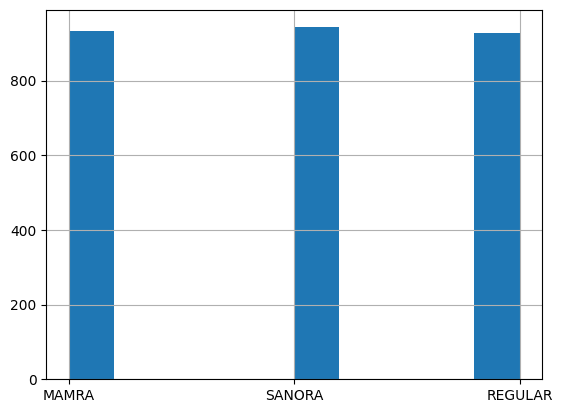

In [45]:
print("Unique classes: ", almond_df.Type.unique())
almond_df.Type.hist()

In [46]:
df_mamra = almond_df[almond_df['Type'] == 'MAMRA']
df_sanora = almond_df[almond_df['Type'] == 'SANORA']
df_regular = almond_df[almond_df['Type'] == 'REGULAR']

# shape of each type
print("MAMRA shape: ", df_mamra.shape)
print("SANORA shape: ", df_sanora.shape)
print("REGULAR shape: ", df_regular.shape)

print("\n")

# Create the crosstab
matrix = pd.crosstab(almond_df['Measure Format'], almond_df['Type'])
# add a total column
matrix['Total'] = matrix.sum(axis=1)
# add a total row
matrix.loc['Total'] = matrix.sum()

# Print the matrix
print(matrix)

MAMRA shape:  (933, 17)
SANORA shape:  (943, 17)
REGULAR shape:  (927, 17)


Type            MAMRA  REGULAR  SANORA  Total
Measure Format                               
LxD               306      316     320    942
LxW               359      325     320   1004
WxD               268      286     303    857
Total             933      927     943   2803


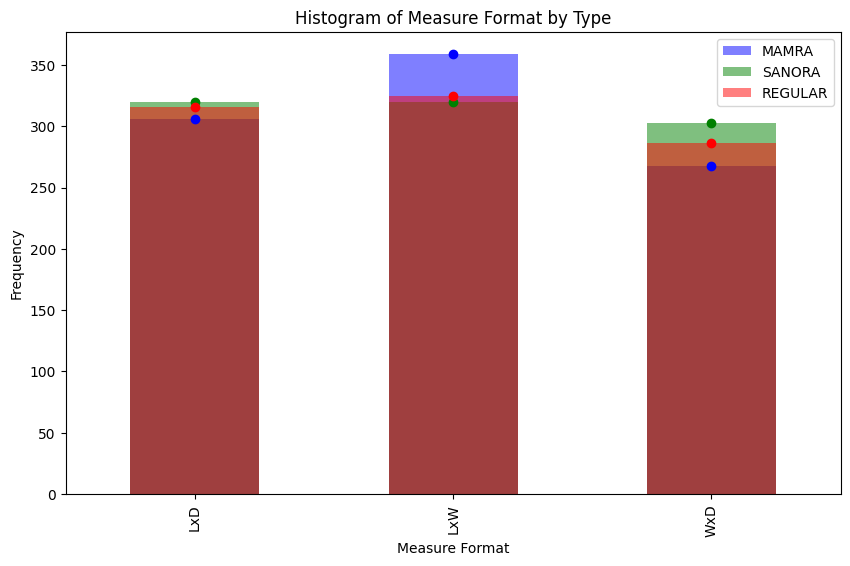

In [47]:
# Plot histograms on the same axes with transparency and markers
plt.figure(figsize=(10, 6))

# Plot MAMRA
mamra_hist = df_mamra['Measure Format'].value_counts().sort_index()
mamra_hist.plot(kind='bar', alpha=0.5, label='MAMRA', color='blue')
for i, value in enumerate(mamra_hist):
    plt.plot(i, value, 'bo')

# Plot SANORA
sanora_hist = df_sanora['Measure Format'].value_counts().sort_index()
sanora_hist.plot(kind='bar', alpha=0.5, label='SANORA', color='green')
for i, value in enumerate(sanora_hist):
    plt.plot(i, value, 'go')

# Plot REGULAR
regular_hist = df_regular['Measure Format'].value_counts().sort_index()
regular_hist.plot(kind='bar', alpha=0.5, label='REGULAR', color='red')
for i, value in enumerate(regular_hist):
    plt.plot(i, value, 'ro')

# Add labels and legend
plt.xlabel('Measure Format')
plt.ylabel('Frequency')
plt.title('Histogram of Measure Format by Type')
plt.legend()

# Show plot
plt.show()

## 3. Methodology Exploration And Optimisation Experimentation

### 3.1. Data Preprocessing Exploration

#### 3.1.1. Data Preprocessing

In [48]:
# import data
almond_df = pd.read_csv('Almond.csv')

# handle index
almond_df.rename( columns={'Unnamed: 0':'Index'}, inplace=True )
almond_df.set_index('Index', inplace=True)

In [49]:
# drop Roundness, Aspect Ratio, Eccentricity
drop_columns = ['Roundness', 'Aspect Ratio', 'Eccentricity']
if set(drop_columns).issubset(almond_df.columns):
    almond_df.drop(drop_columns, axis=1, inplace=True)
almond_df.head()

,Length (major axis),Width (minor axis),Thickness (depth),Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type
Index,,,,,,,,,,
0,NaN,227.940628,127.759132,22619.0,643.813269,0.973384,1.458265,0.681193,23237.5,MAMRA
1,NaN,234.188126,128.199509,23038.0,680.984841,0.957304,1.601844,0.656353,24065.5,MAMRA
2,NaN,229.418610,125.796547,22386.5,646.943212,0.967270,1.487772,0.683620,23144.0,MAMRA
3,NaN,232.763153,125.918808,22578.5,661.227483,0.965512,1.540979,0.685360,23385.0,MAMRA
4,NaN,230.150742,107.253448,19068.0,624.842706,0.951450,1.629395,0.714800,20041.0,MAMRA


In [50]:
print_missing_values(almond_df)

,Length (major axis),Width (minor axis),Thickness (depth),Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type
0,30.57,33.61,35.82,N,N,N,N,N,N,N


In [51]:
# type hot-one encoding
almond_df = pd.get_dummies(almond_df, columns=['Type'])
almond_df.head()

,Length (major axis),Width (minor axis),Thickness (depth),Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA
Index,,,,,,,,,,,,
0,NaN,227.940628,127.759132,22619.0,643.813269,0.973384,1.458265,0.681193,23237.5,True,False,False
1,NaN,234.188126,128.199509,23038.0,680.984841,0.957304,1.601844,0.656353,24065.5,True,False,False
2,NaN,229.418610,125.796547,22386.5,646.943212,0.967270,1.487772,0.683620,23144.0,True,False,False
3,NaN,232.763153,125.918808,22578.5,661.227483,0.965512,1.540979,0.685360,23385.0,True,False,False
4,NaN,230.150742,107.253448,19068.0,624.842706,0.951450,1.629395,0.714800,20041.0,True,False,False


In [52]:
# add a col for the format of L,W,D as a string (Measure Format)
# if L is missing, then the format is WxD, if W is missing, then the format is LxD, if D is missing, then the format is LxW

def create_measure_format(row):
    L = row['Length (major axis)']
    W = row['Width (minor axis)']
    D = row['Thickness (depth)']
    
    if pd.isnull(L):
        return f"WxD"
    elif pd.isnull(W):
        return f"LxD"
    elif pd.isnull(D):
        return f"LxW"
    else:
        return f"LxWxD"

# Apply the function to each row
almond_df['Measure Format'] = almond_df.apply(create_measure_format, axis=1)

# Add boolean columns for L, W, D
almond_df['L'] = almond_df['Length (major axis)'].notnull().astype(bool)
almond_df['W'] = almond_df['Width (minor axis)'].notnull().astype(bool)
almond_df['D'] = almond_df['Thickness (depth)'].notnull().astype(bool)

In [53]:
almond_df.head()

,Length (major axis),Width (minor axis),Thickness (depth),Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA,Measure Format,L,W,D
Index,,,,,,,,,,,,,,,,
0,NaN,227.940628,127.759132,22619.0,643.813269,0.973384,1.458265,0.681193,23237.5,True,False,False,WxD,False,True,True
1,NaN,234.188126,128.199509,23038.0,680.984841,0.957304,1.601844,0.656353,24065.5,True,False,False,WxD,False,True,True
2,NaN,229.418610,125.796547,22386.5,646.943212,0.967270,1.487772,0.683620,23144.0,True,False,False,WxD,False,True,True
3,NaN,232.763153,125.918808,22578.5,661.227483,0.965512,1.540979,0.685360,23385.0,True,False,False,WxD,False,True,True
4,NaN,230.150742,107.253448,19068.0,624.842706,0.951450,1.629395,0.714800,20041.0,True,False,False,WxD,False,True,True


In [54]:
# hot one encoding for Measure Format
almond_df = pd.get_dummies(almond_df, columns=['Measure Format'])
almond_df.head()

,Length (major axis),Width (minor axis),Thickness (depth),Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA,L,W,D,Measure Format_LxD,Measure Format_LxW,Measure Format_WxD
Index,,,,,,,,,,,,,,,,,,
0,NaN,227.940628,127.759132,22619.0,643.813269,0.973384,1.458265,0.681193,23237.5,True,False,False,False,True,True,False,False,True
1,NaN,234.188126,128.199509,23038.0,680.984841,0.957304,1.601844,0.656353,24065.5,True,False,False,False,True,True,False,False,True
2,NaN,229.418610,125.796547,22386.5,646.943212,0.967270,1.487772,0.683620,23144.0,True,False,False,False,True,True,False,False,True
3,NaN,232.763153,125.918808,22578.5,661.227483,0.965512,1.540979,0.685360,23385.0,True,False,False,False,True,True,False,False,True
4,NaN,230.150742,107.253448,19068.0,624.842706,0.951450,1.629395,0.714800,20041.0,True,False,False,False,True,True,False,False,True


In [55]:
# apply min-max scaling to the columns
columns_to_scale = ['Length (major axis)', 'Width (minor axis)', 'Thickness (depth)']
almond_df_scaled = apply_min_max_multiple_column_unified(almond_df, columns_to_scale)

# apply standardization to the columns individually
columns_to_standardize = ['Area', 'Perimeter', 'Solidity', 'Compactness', 'Extent', 'Convex hull(convex area)']
for column in columns_to_standardize:
    almond_df_scaled = apply_normalization(almond_df_scaled, column, standardize_value, mean=almond_df[column].mean(), std=almond_df[column].std())

almond_df_scaled.head()

,Length (major axis),Width (minor axis),Thickness (depth),Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA,L,W,D,Measure Format_LxD,Measure Format_LxW,Measure Format_WxD
Index,,,,,,,,,,,,,,,,,,
0,NaN,0.369515,0.149750,-0.282394,-0.433810,0.443368,-0.462142,-0.914065,-0.313171,True,False,False,False,True,True,False,False,True
1,NaN,0.383220,0.150716,-0.251994,-0.272637,0.037276,-0.281326,-1.437286,-0.255014,True,False,False,False,True,True,False,False,True
2,NaN,0.372757,0.145445,-0.299263,-0.420239,0.288972,-0.424984,-0.862936,-0.319738,True,False,False,False,True,True,False,False,True
3,NaN,0.380094,0.145713,-0.285333,-0.358304,0.244572,-0.357976,-0.826281,-0.302810,True,False,False,False,True,True,False,False,True
4,NaN,0.374363,0.104768,-0.540039,-0.516065,-0.110581,-0.246630,-0.206155,-0.537686,True,False,False,False,True,True,False,False,True


max, min, mean, median, and standard deviation for each column

In [56]:
stats_df_on_scaled = get_stats(almond_df_scaled)
stats_df_on_scaled.head()

,Length (major axis),Width (minor axis),Thickness (depth),Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA,L,W,D,Measure Format_LxD,Measure Format_LxW,Measure Format_WxD
Max,1.00,0.44,0.27,4.55,4.86,0.94,9.87,2.55,4.42,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
Min,0.20,0.06,0.00,-1.49,-1.87,-5.99,-0.83,-5.69,-1.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
Mean,0.51,0.24,0.11,0.00,-0.00,0.00,0.00,0.00,0.00,0.33,0.33,0.34,0.69,0.66,0.64,0.34,0.36,0.31
Median,0.48,0.24,0.11,-0.22,-0.16,0.37,-0.31,0.19,-0.22,0.00,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00
Std,0.14,0.07,0.04,1.00,1.00,1.00,1.00,1.00,1.00,0.47,0.47,0.47,0.46,0.47,0.48,0.47,0.48,0.46


3 Preprocessing Techniques: 2 with Length, Width, and Thikness merged into 2 colums Length A and B. For these 2 methods [1, 2] they would need an identifier for the measuments in Length A and B. This would be one hot of Mesure format or 3 colums "L, W, D" where there would be a 1 in the column of the measurements that are used and 0 in the other one. For example L:1, W:1, D:0 -> LxW.
The third Method [3] would keep all the mesurment columns and is a value was missing fill it with -1. Since the max of the mesure values is 1 and the min is 0 (after preprocessing) -1 would be a good value to use for missing values as it would offset the signal streangth in thoery.

In [57]:
almond_df_copy1 = almond_df_scaled.copy()
almond_df_copy3 = almond_df_scaled.copy()

Version 1:

conversion:
- drop: calculated features from L, W, D and has more than 60% missing values
    - Roundness
    - Aspect Ratio
    - Eccentricity
    - Measure Format: Text representation of (L, W, D)

convert (Length (major axis)	Width (minor axis)	Thickness (depth)) to:
- Length A
- Length B
- drop (Length (major axis)	Width (minor axis)	Thickness (depth))

Type: target has 3 classes: ('MAMRA' 'SANORA' 'REGULAR'), convert to hot-one encoding
- MAMRA: 1,0,0
- SANORA: 0,1,0
- REGULAR: 0,0,1

Final features (input to nn):
- Length A : if LxW, then Length A = L, if LxD, then Length A = L, if WxD, then Length A = W
- Length B : if LxW, then Length B = W, if LxD, then Length B = D, if WxD, then Length B = D
- Area
- Perimeter
- Solidity
- Compactness
- Extent
- Convex hull(convex area)
- L
- W
- D

output:
- Type_MAMRA
- Type_SANORA
- Type_REGULAR

In [58]:
# Add Length A : if LxW, then Length A = L, if LxD, then Length A = L, if WxD, then Length A = W
almond_df_copy1['Length A'] = almond_df_copy1['Length (major axis)']
# print num of missing values
print(almond_df_copy1['Length A'].isnull().sum())
almond_df_copy1['Length A'] = almond_df_copy1['Length A'].fillna(almond_df_copy1['Width (minor axis)'])
# print num of missing values
print(almond_df_copy1['Length A'].isnull().sum())

# Add Length B : if LxW, then Length B = W, if LxD, then Length B = D, if WxD, then Length B = D
almond_df_copy1['Length B'] = almond_df_copy1['Thickness (depth)']
# print num of missing values
print(almond_df_copy1['Length B'].isnull().sum())
almond_df_copy1['Length B'] = almond_df_copy1['Length B'].fillna(almond_df_copy1['Width (minor axis)'])
# print num of missing values
print(almond_df_copy1['Length B'].isnull().sum())

# drop (Length (major axis)	Width (minor axis)	Thickness (depth))
almond_df_copy1.drop(['Length (major axis)', 'Width (minor axis)', 'Thickness (depth)'], axis=1, inplace=True)

# create copy 2 from copy 1
almond_df_copy2 = almond_df_copy1.copy()

# drop measure format from copy 1
almond_df_copy1.drop(['Measure Format_LxD', 'Measure Format_LxW', 'Measure Format_WxD'], axis=1, inplace=True)

# print head
almond_df_copy1.head()

857
0
1004
0


,Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA,L,W,D,Length A,Length B
Index,,,,,,,,,,,,,,
0,-0.282394,-0.433810,0.443368,-0.462142,-0.914065,-0.313171,True,False,False,False,True,True,0.369515,0.149750
1,-0.251994,-0.272637,0.037276,-0.281326,-1.437286,-0.255014,True,False,False,False,True,True,0.383220,0.150716
2,-0.299263,-0.420239,0.288972,-0.424984,-0.862936,-0.319738,True,False,False,False,True,True,0.372757,0.145445
3,-0.285333,-0.358304,0.244572,-0.357976,-0.826281,-0.302810,True,False,False,False,True,True,0.380094,0.145713
4,-0.540039,-0.516065,-0.110581,-0.246630,-0.206155,-0.537686,True,False,False,False,True,True,0.374363,0.104768


version 2:
- same as 1 but drop L, W, D

In [59]:
almond_df_copy2.drop(['L', 'W', 'D'], axis=1, inplace=True)
almond_df_copy2.head()

,Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA,Measure Format_LxD,Measure Format_LxW,Measure Format_WxD,Length A,Length B
Index,,,,,,,,,,,,,,
0,-0.282394,-0.433810,0.443368,-0.462142,-0.914065,-0.313171,True,False,False,False,False,True,0.369515,0.149750
1,-0.251994,-0.272637,0.037276,-0.281326,-1.437286,-0.255014,True,False,False,False,False,True,0.383220,0.150716
2,-0.299263,-0.420239,0.288972,-0.424984,-0.862936,-0.319738,True,False,False,False,False,True,0.372757,0.145445
3,-0.285333,-0.358304,0.244572,-0.357976,-0.826281,-0.302810,True,False,False,False,False,True,0.380094,0.145713
4,-0.540039,-0.516065,-0.110581,-0.246630,-0.206155,-0.537686,True,False,False,False,False,True,0.374363,0.104768


version 3:
- drop L, W, D and Measure Format_LxD, Measure Format_LxW, Measure Format_WxD
- add -1 for missing values in length, width, depth

In [60]:
# drop L, W, D and Measure Format_LxD, Measure Format_LxW, Measure Format_WxD
almond_df_copy3.drop(['L', 'W', 'D', 'Measure Format_LxD', 'Measure Format_LxW', 'Measure Format_WxD'], axis=1, inplace=True)

# add -1 as missing value for Length (major axis)	Width (minor axis)	Thickness (depth)
almond_df_copy3['Length (major axis)'] = almond_df_copy3['Length (major axis)'].fillna(-1)
almond_df_copy3['Width (minor axis)'] = almond_df_copy3['Width (minor axis)'].fillna(-1)
almond_df_copy3['Thickness (depth)'] = almond_df_copy3['Thickness (depth)'].fillna(-1)

# print head
almond_df_copy3.head()

,Length (major axis),Width (minor axis),Thickness (depth),Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA
Index,,,,,,,,,,,,
0,-1.0,0.369515,0.149750,-0.282394,-0.433810,0.443368,-0.462142,-0.914065,-0.313171,True,False,False
1,-1.0,0.383220,0.150716,-0.251994,-0.272637,0.037276,-0.281326,-1.437286,-0.255014,True,False,False
2,-1.0,0.372757,0.145445,-0.299263,-0.420239,0.288972,-0.424984,-0.862936,-0.319738,True,False,False
3,-1.0,0.380094,0.145713,-0.285333,-0.358304,0.244572,-0.357976,-0.826281,-0.302810,True,False,False
4,-1.0,0.374363,0.104768,-0.540039,-0.516065,-0.110581,-0.246630,-0.206155,-0.537686,True,False,False


In [ ]:
# save the data to expr/lwd_diff_v1/data*.cvs
almond_df_copy1.to_csv('expr/lwd_diff_v1/data1.csv')
almond_df_copy2.to_csv('expr/lwd_diff_v1/data2.csv')
almond_df_copy3.to_csv('expr/lwd_diff_v2/data3.csv')

In [ ]:
# percentage of missing values
print_missing_values(almond_df_copy1)

,Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA,L,W,D,Length A,Length B
0,N,N,N,N,N,N,N,N,N,N,N,N,N,N


In [ ]:
print_missing_values(almond_df_copy2)

,Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA,Measure Format_LxD,Measure Format_LxW,Measure Format_WxD,Length A,Length B
0,N,N,N,N,N,N,N,N,N,N,N,N,N,N


In [ ]:
print_missing_values(almond_df_copy3)

,Length (major axis),Width (minor axis),Thickness (depth),Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA
0,N,N,N,N,N,N,N,N,N,N,N,N


#### 3.1.2. Testing Data Preprocessing

##### 3.1.2.1. Setup

In [ ]:
# run the experiment
# Run the experiment 10 times concurrently for each dataset
results = []
threads = []

starting_hidden_layer_size = 64
number_hidden_layers = 4
batch_size = 8 #16
test_size = 0.2

hidden_layer_activation = 'tanh'
output_layer_activation = 'softmax'
optimizer = 'adam'
loss = 'categorical_crossentropy'

def num_epochs(k, batch_size, num_data_points):
    return (k*num_data_points) / batch_size

epochs = 200 # 200

patience = 10
min_delta = 0.01 # 0.01

max_threads = 5

# # single run on data1
# name=f'data1:run1'
# seed = np.random.randint(0, 1000)
# input_shape = (X1.shape[1],)
# output_shape = y1.shape[1]
# model = create_pyramid_model(starting_hidden_layer_size, number_hidden_layers, input_shape, output_shape)
# results.append(run_experiment(model, X1, y1, name, patience=patience, min_delta=min_delta, epochs=epochs, seed=seed, batch_size=batch_size, test_size=test_size))

num_tests = 10
num_datasets = 3
total_runs = num_datasets * 30  # 3 datasets, 10 runs each at 2 pionts in code
progress_bar = notebook.tqdm(total=total_runs*2+total_runs*epochs, desc='Overall Progress', dynamic_ncols=True, leave=True)

count = 0
for i, (X, y) in enumerate([(X1, y1), (X2, y2), (X3, y3)]):
    for j in range(30):
        count += 1

        name=f'data{i+1}:run{j+1}'
        # print(name)
        # new random seed for each run
        seed = np.random.randint(0, 1000)
        # print(seed)
        input_shape = (X.shape[1],)
        output_shape = y.shape[1]
        model = create_pyramid_model(starting_hidden_layer_size, number_hidden_layers, input_shape, output_shape, metrics=['accuracy', 'f1_score'], optimizer=optimizer, loss=loss, hidden_activation=hidden_layer_activation, output_activation=output_layer_activation)

        # callbacks
        custom_callback = CustomCallback(patience=patience, min_delta=min_delta)
        tqdm_callback = TQDMProgressBar()
        tqdm_callback.set_custom_name(name)
        callbacks = [custom_callback, tqdm_callback, tf_progress_bar_updater(progress_bar, subcount=epochs)]


        def target_function():
            result = run_experiment(model, X, y, name, patience=patience, min_delta=min_delta, epochs=epochs, seed=seed, batch_size=batch_size, test_size=test_size, callbacks=callbacks)

            # add num hidden layers and starting hidden layer size to the result
            result['starting_hidden_layer_size'] = starting_hidden_layer_size
            result['number_hidden_layers'] = number_hidden_layers

            results.append(result)
            progress_bar.update(1)  # Update the progress bar

        thread = threading.Thread(target=target_function)
        thread.start()
        threads.append(thread)

        progress_bar.update(1)  # Update the progress bar

        if len(threads) >= max_threads or count == total_runs:
            for thread in threads:
                thread.join()
            threads = []

print (threads)

# while threads:
#     current_threads = threads[:max_threads]
#     print (f"Running {len(current_threads)} threads concurrently")
#     threads = threads[max_threads:]
#     for thread in current_threads:
#         thread.start()
#     for thread in current_threads:
#         thread.join()

# for thread in threads:
#     thread.join()

# save the results
save_name = "results8"
results_df = pd.DataFrame(results)
results_df.to_csv(f'expr/lwd_diff_v1/{save_name}.csv')

# save other data to txt file
with open(f'expr/lwd_diff_v1/{save_name}_info.txt', 'w') as f:
    f.write(f"starting_hidden_layer_size: {starting_hidden_layer_size}\n")
    f.write(f"number_hidden_layers: {number_hidden_layers}\n")
    f.write(f"batch_size: {batch_size}\n")
    f.write(f"test_size: {test_size}\n")
    f.write(f"epochs: {epochs}\n")
    f.write(f"patience: {patience}\n")
    f.write(f"min_delta: {min_delta}\n")
    f.write(f"hidden_layer_activation: {hidden_layer_activation}\n")
    f.write(f"output_layer_activation: {output_layer_activation}\n")
    f.write(f"optimizer: {optimizer}\n")
    f.write(f"loss: {loss}\n")

progress_bar.refresh()
progress_bar.close()

Overall Progress:   0%|          | 0/18180 [00:00<?, ?it/s]

data1:run1 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run2 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run3 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run4 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run5 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


data1:run6 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run7 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run8 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run9 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run10 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


data1:run11 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run12 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run13 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run14 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run15 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


data1:run16 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run17 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run18 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run19 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run20 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


data1:run21 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run22 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run23 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run24 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run25 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


data1:run26 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run27 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run28 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run29 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data1:run30 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


data2:run1 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run2 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run3 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run4 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run5 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


data2:run6 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run7 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run8 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run9 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run10 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


data2:run11 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run12 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run13 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run14 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run15 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


data2:run16 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run17 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run18 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run19 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run20 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Epoch 145: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


data2:run21 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run22 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run23 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run24 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run25 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


data2:run26 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run27 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run28 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run29 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data2:run30 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


data3:run1 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run2 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run3 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run4 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run5 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


data3:run6 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run7 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run8 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run9 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run10 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


data3:run11 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run12 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run13 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run14 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run15 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/stepRestoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


data3:run16 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run17 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run18 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run19 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run20 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


data3:run21 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run22 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run23 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run24 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run25 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


data3:run26 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run27 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run28 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run29 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

data3:run30 Training Progress:   0%|          | 0/45000 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
[]


##### 3.1.2.2. Results

In [85]:
save_name1 = "results6"
results_df1 = pd.read_csv(f'expr/lwd_diff_v1/{save_name1}.csv')
save_name2 = "results7"
results_df2 = pd.read_csv(f'expr/lwd_diff_v1/{save_name2}.csv')
save_name3 = "results8"
results_df3 = pd.read_csv(f'expr/lwd_diff_v1/{save_name3}.csv')

# add columns for :
"""
starting_hidden_layer_size: _
number_hidden_layers: _
batch_size: _
test_size: _
epochs: _
patience: _
min_delta: _
output_layer_activation: _
hidden_layer_activation: _
optimizer: _
loss: _
"""

# load the info 1
with open(f'expr/lwd_diff_v1/{save_name1}_info.txt', 'r') as f:
    lines = f.readlines()
    for line in lines:
        key, value = line.split(':')
        key = key.strip()
        value = value.strip()
        results_df1[key] = value

# load the info 2
with open(f'expr/lwd_diff_v1/{save_name2}_info.txt', 'r') as f:
    lines = f.readlines()
    for line in lines:
        key, value = line.split(':')
        key = key.strip()
        value = value.strip()
        results_df2[key] = value

# load the info 3
with open(f'expr/lwd_diff_v1/{save_name3}_info.txt', 'r') as f:
    lines = f.readlines()
    for line in lines:
        key, value = line.split(':')
        key = key.strip()
        value = value.strip()
        results_df3[key] = value

# Add columns for the test number: 6, 7, 8
results_df1['test_number'] = 6
results_df2['test_number'] = 7
results_df3['test_number'] = 8

# # update the name column for *2 and *3 by adding 10 to the run number 'data1:run1' -> 'data1:run11'
# results_df2['name'] = results_df2['name'].apply(lambda x: x[:-1] + str(int(x[-1]) + 10)) # +10
# results_df3['name'] = results_df3['name'].apply(lambda x: x[:-1] + str(int(x[-1]) + 40)) # +10 +30 (10 for r6 and 30 for r7)

# Update the index
results_df2.index = range(results_df1.shape[0], results_df1.shape[0] + results_df2.shape[0])
results_df3.index = range(results_df1.shape[0] + results_df2.shape[0], results_df1.shape[0] + results_df2.shape[0] + results_df3.shape[0])

# combine the results
results_df = pd.concat([results_df1, results_df2, results_df3])

# print the results
results_df.head()

,Unnamed: 0,name,accuracy,fscore,history,seed,test_size,batch_size,epochs,patience,min_delta,starting_hidden_layer_size,number_hidden_layers,output_layer_activation,hidden_layer_activation,optimizer,loss,test_number
0,0,data1:run3,0.770053,0.767857,"{'accuracy': [0.46514222025871277, 0.525376439...",799,0.2,8,200,10,0.01,64,4,softmax,relu,adam,categorical_crossentropy,6
1,1,data1:run1,0.761141,0.762323,"{'accuracy': [0.4601227045059204, 0.5231455564...",882,0.2,8,200,10,0.01,64,4,softmax,relu,adam,categorical_crossentropy,6
2,2,data1:run4,0.793226,0.793923,"{'accuracy': [0.4874511957168579, 0.5476854443...",822,0.2,8,200,10,0.01,64,4,softmax,relu,adam,categorical_crossentropy,6
3,3,data1:run2,0.807487,0.808700,"{'accuracy': [0.46625766158103943, 0.525934159...",753,0.2,8,200,10,0.01,64,4,softmax,relu,adam,categorical_crossentropy,6
4,4,data1:run5,0.766488,0.764781,"{'accuracy': [0.4679308533668518, 0.5197992324...",205,0.2,8,200,10,0.01,64,4,softmax,relu,adam,categorical_crossentropy,6


In [86]:
results_df.shape

(210, 18)

In [87]:
# get the results with the highest F1 score
best_result = results_df.loc[results_df['fscore'].idxmax()]
best_result

Unnamed: 0                                                                   19
name                                                                 data2:run8
accuracy                                                               0.819964
fscore                                                                 0.820332
history                       {'accuracy': [0.4634690582752228, 0.5209146738...
seed                                                                        787
test_size                                                                   0.2
batch_size                                                                    8
epochs                                                                      200
patience                                                                     10
min_delta                                                                  0.01
starting_hidden_layer_size                                                   64
number_hidden_layers                    

In [88]:
# get the results with the highest accuracy
best_result = results_df.loc[results_df['accuracy'].idxmax()]
best_result

Unnamed: 0                                                                   19
name                                                                 data2:run8
accuracy                                                               0.819964
fscore                                                                 0.820332
history                       {'accuracy': [0.4634690582752228, 0.5209146738...
seed                                                                        787
test_size                                                                   0.2
batch_size                                                                    8
epochs                                                                      200
patience                                                                     10
min_delta                                                                  0.01
starting_hidden_layer_size                                                   64
number_hidden_layers                    

In [89]:
# split the name to get the data number and run number
results_df['data_number'] = results_df['name'].str.split(':').str[0]
results_df['run_number'] = results_df['name'].str.split(':').str[1]

# drop the name column
results_df.drop('name', axis=1, inplace=True)

# for each data number, relabel the run number to start from 1
for data_number in results_df['data_number'].unique():
    results_df.loc[results_df['data_number'] == data_number, 'run_number'] = range(1, results_df[results_df['data_number'] == data_number].shape[0] + 1)

# add name column
results_df['name'] = results_df['data_number'] + ':' + results_df['run_number'].astype(str)

results_df.head()

,Unnamed: 0,accuracy,fscore,history,seed,test_size,batch_size,epochs,patience,min_delta,starting_hidden_layer_size,number_hidden_layers,output_layer_activation,hidden_layer_activation,optimizer,loss,test_number,data_number,run_number,name
0,0,0.770053,0.767857,"{'accuracy': [0.46514222025871277, 0.525376439...",799,0.2,8,200,10,0.01,64,4,softmax,relu,adam,categorical_crossentropy,6,data1,1,data1:1
1,1,0.761141,0.762323,"{'accuracy': [0.4601227045059204, 0.5231455564...",882,0.2,8,200,10,0.01,64,4,softmax,relu,adam,categorical_crossentropy,6,data1,2,data1:2
2,2,0.793226,0.793923,"{'accuracy': [0.4874511957168579, 0.5476854443...",822,0.2,8,200,10,0.01,64,4,softmax,relu,adam,categorical_crossentropy,6,data1,3,data1:3
3,3,0.807487,0.808700,"{'accuracy': [0.46625766158103943, 0.525934159...",753,0.2,8,200,10,0.01,64,4,softmax,relu,adam,categorical_crossentropy,6,data1,4,data1:4
4,4,0.766488,0.764781,"{'accuracy': [0.4679308533668518, 0.5197992324...",205,0.2,8,200,10,0.01,64,4,softmax,relu,adam,categorical_crossentropy,6,data1,5,data1:5


In [91]:
# get unique names
results_df['name'].unique()

array(['data1:1', 'data1:2', 'data1:3', 'data1:4', 'data1:5', 'data1:6',
       'data1:7', 'data1:8', 'data1:9', 'data1:10', 'data2:1', 'data2:2',
       'data2:3', 'data2:4', 'data2:5', 'data2:6', 'data2:7', 'data2:8',
       'data2:9', 'data2:10', 'data3:1', 'data3:2', 'data3:3', 'data3:4',
       'data3:5', 'data3:6', 'data3:7', 'data3:8', 'data3:9', 'data3:10',
       'data1:11', 'data1:12', 'data1:13', 'data1:14', 'data1:15',
       'data1:16', 'data1:17', 'data1:18', 'data1:19', 'data1:20',
       'data1:21', 'data1:22', 'data1:23', 'data1:24', 'data1:25',
       'data1:26', 'data1:27', 'data1:28', 'data1:29', 'data1:30',
       'data1:31', 'data1:32', 'data1:33', 'data1:34', 'data1:35',
       'data1:36', 'data1:37', 'data1:38', 'data1:39', 'data1:40',
       'data2:11', 'data2:12', 'data2:13', 'data2:14', 'data2:15',
       'data2:16', 'data2:17', 'data2:18', 'data2:19', 'data2:20',
       'data2:21', 'data2:22', 'data2:23', 'data2:24', 'data2:25',
       'data2:26', 'data2:27'

In [96]:
# split into data1, data2, data3
data1_results = results_df[results_df['data_number'] == 'data1']
data2_results = results_df[results_df['data_number'] == 'data2']
data3_results = results_df[results_df['data_number'] == 'data3']

# renumber the index of each dataset
data1_results.index = range(data1_results.shape[0])
data2_results.index = range(data1_results.shape[0], data1_results.shape[0] + data2_results.shape[0])
data3_results.index = range(data1_results.shape[0] + data2_results.shape[0], data1_results.shape[0] + data2_results.shape[0] + data3_results.shape[0])

# get the best result for each dataset
best_data1_result = data1_results.loc[data1_results['fscore'].idxmax()]
best_data2_result = data2_results.loc[data2_results['fscore'].idxmax()]
best_data3_result = data3_results.loc[data3_results['fscore'].idxmax()]

print(best_data1_result)
print("\n")
print(best_data2_result)
print("\n")
print(best_data3_result)

Unnamed: 0                                                                   25
accuracy                                                               0.818182
fscore                                                                 0.818791
history                       {'accuracy': [0.46904629468917847, 0.511991083...
seed                                                                        827
test_size                                                                   0.2
batch_size                                                                    8
epochs                                                                      200
patience                                                                     10
min_delta                                                                  0.01
starting_hidden_layer_size                                                   64
number_hidden_layers                                                          4
output_layer_activation                 

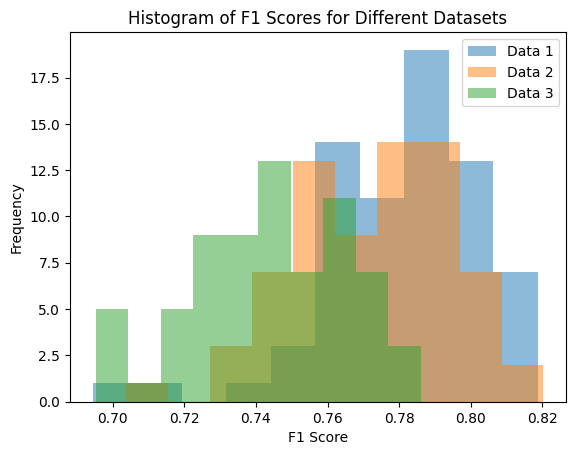

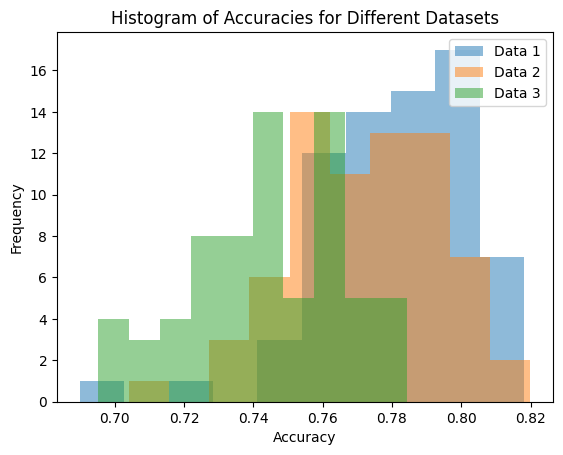

In [97]:
# histogram of F1 scores
import matplotlib.pyplot as plt

plt.hist(data1_results['fscore'], bins=10, alpha=0.5, label='Data 1')
plt.hist(data2_results['fscore'], bins=10, alpha=0.5, label='Data 2')
plt.hist(data3_results['fscore'], bins=10, alpha=0.5, label='Data 3')
plt.legend(loc='upper right')
plt.xlabel('F1 Score')
plt.ylabel('Frequency')
plt.title('Histogram of F1 Scores for Different Datasets')
plt.show()

# histogram of accuracies
plt.hist(data1_results['accuracy'], bins=10, alpha=0.5, label='Data 1')
plt.hist(data2_results['accuracy'], bins=10, alpha=0.5, label='Data 2')
plt.hist(data3_results['accuracy'], bins=10, alpha=0.5, label='Data 3')
plt.legend(loc='upper right')
plt.xlabel('Accuracy')
plt.ylabel('Frequency')
plt.title('Histogram of Accuracies for Different Datasets')
plt.show()

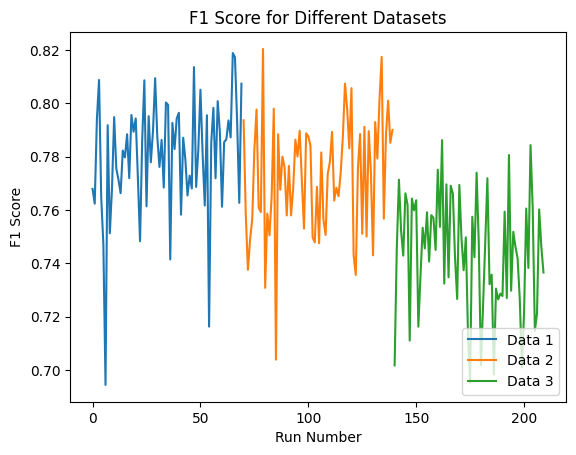

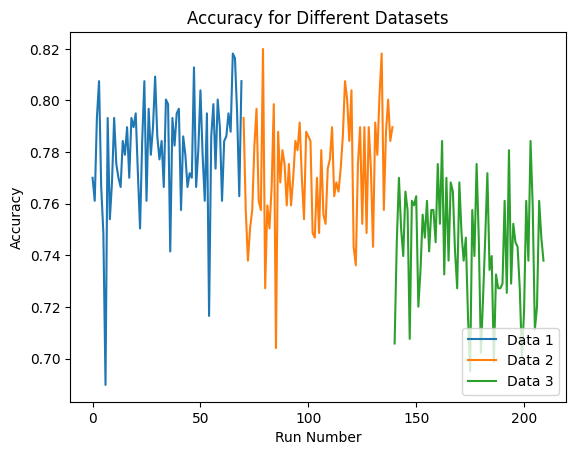

In [98]:
# line plot of F1 scores
plt.plot(data1_results['fscore'], label='Data 1')
plt.plot(data2_results['fscore'], label='Data 2')
plt.plot(data3_results['fscore'], label='Data 3')
plt.legend(loc='lower right')
plt.xlabel('Run Number')
plt.ylabel('F1 Score')
plt.title('F1 Score for Different Datasets')
plt.show()

# line plot of accuracies
plt.plot(data1_results['accuracy'], label='Data 1')
plt.plot(data2_results['accuracy'], label='Data 2')
plt.plot(data3_results['accuracy'], label='Data 3')
plt.legend(loc='lower right')
plt.xlabel('Run Number')
plt.ylabel('Accuracy')
plt.title('Accuracy for Different Datasets')
plt.show()

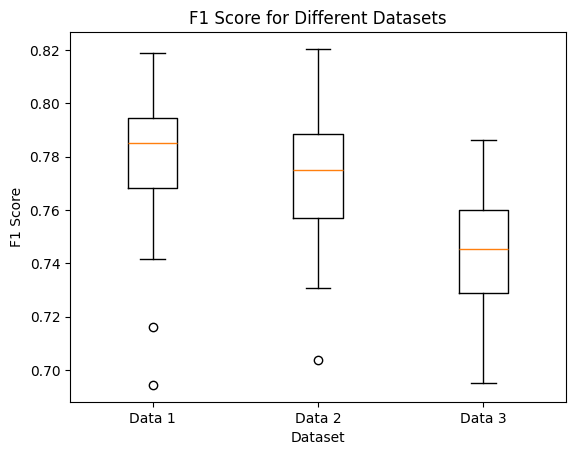

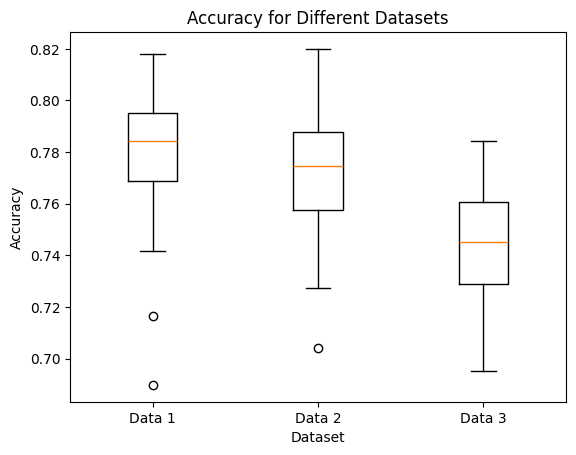

In [99]:
# parrelell box plot of F1 scores
plt.boxplot([data1_results['fscore'], data2_results['fscore'], data3_results['fscore']])
plt.xticks([1, 2, 3], ['Data 1', 'Data 2', 'Data 3'])
plt.xlabel('Dataset')
plt.ylabel('F1 Score')
plt.title('F1 Score for Different Datasets')
plt.show()

# parrelell box plot of accuracies
plt.boxplot([data1_results['accuracy'], data2_results['accuracy'], data3_results['accuracy']])
plt.xticks([1, 2, 3], ['Data 1', 'Data 2', 'Data 3'])
plt.xlabel('Dataset')
plt.ylabel('Accuracy')
plt.title('Accuracy for Different Datasets')
plt.show()

In [101]:
# get the mean F1 score for each dataset with standard deviation
data1_mean_f1 = data1_results['fscore'].mean()
data2_mean_f1 = data2_results['fscore'].mean()
data3_mean_f1 = data3_results['fscore'].mean()

data1_std_f1 = data1_results['fscore'].std()
data2_std_f1 = data2_results['fscore'].std()
data3_std_f1 = data3_results['fscore'].std()

print(f"Data 1: Mean F1 Score: {data1_mean_f1:.2f}+-{data1_std_f1:.2f}")
print(f"Data 2: Mean F1 Score: {data2_mean_f1:.2f}+-{data2_std_f1:.2f}")
print(f"Data 3: Mean F1 Score: {data3_mean_f1:.2f}+-{data3_std_f1:.2f}")

# get the mean accuracy for each dataset with standard deviation
data1_mean_accuracy = data1_results['accuracy'].mean()
data2_mean_accuracy = data2_results['accuracy'].mean()
data3_mean_accuracy = data3_results['accuracy'].mean()

data1_std_accuracy = data1_results['accuracy'].std()
data2_std_accuracy = data2_results['accuracy'].std()
data3_std_accuracy = data3_results['accuracy'].std()

print(f"Data 1: Mean Accuracy: {data1_mean_accuracy:.2f}+-{data1_std_accuracy:.2f}")
print(f"Data 2: Mean Accuracy: {data2_mean_accuracy:.2f}+-{data2_std_accuracy:.2f}")
print(f"Data 3: Mean Accuracy: {data3_mean_accuracy:.2f}+-{data3_std_accuracy:.2f}")

Data 1: Mean F1 Score: 0.78+-0.02
Data 2: Mean F1 Score: 0.77+-0.02
Data 3: Mean F1 Score: 0.74+-0.02
Data 1: Mean Accuracy: 0.78+-0.02
Data 2: Mean Accuracy: 0.77+-0.02
Data 3: Mean Accuracy: 0.74+-0.02


In [103]:
# # loss and accuracy for each dataset
# # calculate loss from the history
# def calculate_loss(history):
#     loss = history['loss']
#     val_loss = history['val_loss']
#     return loss, val_loss

# # add to the results
# data1_results['loss_calc'] = data1_results['history'].apply(lambda x: calculate_loss(eval(x)))
# data2_results['loss_calc'] = data2_results['history'].apply(lambda x: calculate_loss(eval(x)))
# data3_results['loss_calc'] = data3_results['history'].apply(lambda x: calculate_loss(eval(x)))

# # calculate mean loss for each dataset
# data1_results['loss_calc'] = data1_results['loss_calc'].apply(lambda x: np.mean(x[0]))

# data2_results['loss_calc'] = data2_results['loss_calc'].apply(lambda x: np.mean(x[0]))

# data3_results['loss_calc'] = data3_results['loss_calc'].apply(lambda x: np.mean(x[0]))

# data1_mean_loss = data1_results['loss_calc'].mean()

#### 3.1.3. Conclusion

Based on the results of the testing data preprocessing, the best method to use is method 1. This is because it has the highest accuracy and f-score (mean).

This is likely because the model is better able to distinguash data groupins with the one-hot based length identification than a single negative value for missing data.
Additionally method one most likly performs better than method 2 because it has 2 valuse for indicating the length format, which likly balances the signal strength better than a single value.

### 3.2. Model Hyperparameter Tuning Exploration

#### 3.2.1. General Hyperparameter Tuning

##### 3.2.1.1. Setup

In [ ]:
results = []
count = 0
num_trials = 500
epochs = 200
test_size = 0.2
progress_bar = notebook.tqdm(total=num_trials*2+num_trials*epochs+7, desc='Overall Progress', dynamic_ncols=True, leave=True)

# Define the objective function for Optuna
def objective(trial):
    global count
    count += 1
    global results
    global progress_bar
    global epochs
    global test_size

    # Suggest hyperparameters
    starting_hidden_layer_size = trial.suggest_int('starting_hidden_layer_size', 16, 128)
    number_hidden_layers = trial.suggest_categorical('number_hidden_layers', [1, 2, 3, 4, 5, 6])
    batch_size = trial.suggest_int('batch_size', 6, 32)
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
    hidden_activation = trial.suggest_categorical('hidden_activation', ['relu', 'tanh', 'sigmoid'])
    output_activation = trial.suggest_categorical('output_activation', ['softmax', 'sigmoid'])
    optimizer_name = trial.suggest_categorical('optimizer', ['adam', 'sgd', 'rmsprop'])
    loss = trial.suggest_categorical('loss', ['categorical_crossentropy', 'binary_crossentropy', 'mean_squared_error'])
    metrics = ['accuracy', 'f1_score']
    
    
    patience = 10
    min_delta = 0.01
    total_runs = 1

    X = X1
    y = y1

    name=f'data1:run{count}'
    seed = np.random.randint(0, 1000)
    input_shape = (X.shape[1],)
    output_shape = y.shape[1]

    if optimizer_name == 'adam':
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif optimizer_name == 'sgd':
        optimizer = CustomSDGOptimizer(learning_rate=learning_rate)
    elif optimizer_name == 'rmsprop':
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
    else:
        raise ValueError('Invalid optimizer name')
    
    model = create_pyramid_model_v2(starting_hidden_layer_size, number_hidden_layers, input_shape, output_shape, optimizer, loss=loss, metrics=metrics, hidden_activation=hidden_activation, output_activation=output_activation)

    # callbacks
    custom_callback = CustomCallback(patience=patience, min_delta=min_delta)

    # update the progress bar
    progress_bar.update(1)

    result = run_experiment(model, X, y, name, patience=patience, min_delta=min_delta, epochs=epochs, seed=seed, batch_size=batch_size, test_size=test_size, callbacks=[custom_callback, tf_progress_bar_updater(progress_bar, subcount=epochs)])

    # add num hidden layers and starting hidden layer size to the result
    result['starting_hidden_layer_size'] = starting_hidden_layer_size
    result['number_hidden_layers'] = number_hidden_layers
    result['learning_rate'] = learning_rate
    result['hidden_activation'] = hidden_activation
    result['output_activation'] = output_activation
    result['optimizer'] = optimizer_name
    result['loss'] = loss

    results.append(result)

    min_accuracy_f_score = min(result['accuracy'], result['fscore'])

    progress_bar.update(1)  # Update the progress bar

    # backup the results
    if count % 10 == 0:
        results_df = pd.DataFrame(results)
        results_df.to_csv(f'expr/lwd_diff_v1/optuna1/optuna_results_bak{count}.csv')

    return min_accuracy_f_score

# Create the Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=num_trials)

# Save the results
results_df = pd.DataFrame(results)
results_df.to_csv('expr/lwd_diff_v1/optuna1/optuna_results.csv')

# Print the best trial and its parameters
print("Best trial:")
print(study.best_trial)
print("Best parameters:")
print(study.best_params)

progress_bar.update(1)
progress_bar.refresh()

# Save the study
# optuna.visualization.plot_optimization_history(study).write_image('expr/lwd_diff_v1/optuna1/optuna_optimization_history.png')
# progress_bar.update(1)
# optuna.visualization.plot_param_importances(study).write_image('expr/lwd_diff_v1/optuna1/optuna_param_importances.png')
# progress_bar.update(1)
# optuna.visualization.plot_slice(study).write_image('expr/lwd_diff_v1/optuna1/optuna_slice.png')
# progress_bar.update(1)
# optuna.visualization.plot_parallel_coordinate(study).write_image('expr/lwd_diff_v1/optuna1/optuna_parallel_coordinate.png')
# progress_bar.update(1)
# optuna.visualization.plot_contour(study).write_image('expr/lwd_diff_v1/optuna1/optuna_contour.png')
# progress_bar.update(1)
# optuna.visualization.plot_edf(study).write_image('expr/lwd_diff_v1/optuna1/optuna_edf.png')
progress_bar.update(6)
progress_bar.close()

Overall Progress:   0%|          | 0/101007 [00:00<?, ?it/s]

[I 2024-09-28 08:36:46,406] A new study created in memory with name: no-name-95025270-6d17-4295-9333-2e17ea1a9d0b
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 146: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:37:01,720] Trial 0 finished with value: 0.6444876768559592 and parameters: {'starting_hidden_layer_size': 79, 'number_hidden_layers': 4, 'batch_size': 15, 'learning_rate': 4.9812340556425586e-05, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 0 with value: 0.6444876768559592.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:37:37,548] Trial 1 finished with value: 0.6857266131415705 and parameters: {'starting_hidden_layer_size': 30, 'number_hidden_layers': 1, 'batch_size': 6, 'learning_rate': 0.00372096705635138, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 1 with value: 0.6857266131415705.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 22: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:37:39,684] Trial 2 finished with value: 0.4503949880499413 and parameters: {'starting_hidden_layer_size': 99, 'number_hidden_layers': 3, 'batch_size': 27, 'learning_rate': 0.0026317229416444265, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'sgd', 'loss': 'mean_squared_error'}. Best is trial 1 with value: 0.6857266131415705.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:37:41,553] Trial 3 finished with value: 0.28520499108734404 and parameters: {'starting_hidden_layer_size': 38, 'number_hidden_layers': 1, 'batch_size': 9, 'learning_rate': 7.575193962446457e-05, 'hidden_activation': 'relu', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'binary_crossentropy'}. Best is trial 1 with value: 0.6857266131415705.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:37:57,118] Trial 4 finished with value: 0.7049537835366333 and parameters: {'starting_hidden_layer_size': 48, 'number_hidden_layers': 5, 'batch_size': 24, 'learning_rate': 0.006235899249589808, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 4 with value: 0.7049537835366333.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:37:59,082] Trial 5 finished with value: 0.19364246951538552 and parameters: {'starting_hidden_layer_size': 50, 'number_hidden_layers': 1, 'batch_size': 8, 'learning_rate': 1.4346460239024935e-05, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'sgd', 'loss': 'categorical_crossentropy'}. Best is trial 4 with value: 0.7049537835366333.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 35: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:38:02,623] Trial 6 finished with value: 0.45989304812834225 and parameters: {'starting_hidden_layer_size': 77, 'number_hidden_layers': 1, 'batch_size': 18, 'learning_rate': 5.208651154407514e-05, 'hidden_activation': 'sigmoid', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 4 with value: 0.7049537835366333.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 78: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:38:12,260] Trial 7 finished with value: 0.3941956706777344 and parameters: {'starting_hidden_layer_size': 112, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.0017122200920490225, 'hidden_activation': 'relu', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'mean_squared_error'}. Best is trial 4 with value: 0.7049537835366333.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:38:29,198] Trial 8 finished with value: 0.5779043937924848 and parameters: {'starting_hidden_layer_size': 46, 'number_hidden_layers': 6, 'batch_size': 24, 'learning_rate': 0.0007245818555573313, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 4 with value: 0.7049537835366333.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 45: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:38:36,426] Trial 9 finished with value: 0.39420323674499125 and parameters: {'starting_hidden_layer_size': 109, 'number_hidden_layers': 1, 'batch_size': 8, 'learning_rate': 0.00041114347617249167, 'hidden_activation': 'sigmoid', 'output_activation': 'softmax', 'optimizer': 'sgd', 'loss': 'mean_squared_error'}. Best is trial 4 with value: 0.7049537835366333.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:38:49,176] Trial 10 finished with value: 0.7575757575757576 and parameters: {'starting_hidden_layer_size': 61, 'number_hidden_layers': 2, 'batch_size': 32, 'learning_rate': 0.009962727877681609, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 10 with value: 0.7575757575757576.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:39:01,795] Trial 11 finished with value: 0.7166840183422388 and parameters: {'starting_hidden_layer_size': 66, 'number_hidden_layers': 2, 'batch_size': 32, 'learning_rate': 0.00876196624008387, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 10 with value: 0.7575757575757576.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:39:14,539] Trial 12 finished with value: 0.7647976680469313 and parameters: {'starting_hidden_layer_size': 65, 'number_hidden_layers': 2, 'batch_size': 32, 'learning_rate': 0.00964974095237833, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 12 with value: 0.7647976680469313.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:39:27,212] Trial 13 finished with value: 0.7201426024955436 and parameters: {'starting_hidden_layer_size': 63, 'number_hidden_layers': 2, 'batch_size': 31, 'learning_rate': 0.0011457162456305727, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 12 with value: 0.7647976680469313.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:39:40,687] Trial 14 finished with value: 0.752592492154457 and parameters: {'starting_hidden_layer_size': 91, 'number_hidden_layers': 2, 'batch_size': 28, 'learning_rate': 0.008182164709454426, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 12 with value: 0.7647976680469313.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 28: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:39:43,282] Trial 15 finished with value: 0.5166567766542601 and parameters: {'starting_hidden_layer_size': 24, 'number_hidden_layers': 2, 'batch_size': 23, 'learning_rate': 0.0002849655808957308, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 12 with value: 0.7647976680469313.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:39:56,108] Trial 16 finished with value: 0.7586791974414467 and parameters: {'starting_hidden_layer_size': 62, 'number_hidden_layers': 2, 'batch_size': 29, 'learning_rate': 0.003206252488297512, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 12 with value: 0.7647976680469313.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 138: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:40:06,432] Trial 17 finished with value: 0.7468805704099821 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 4, 'batch_size': 28, 'learning_rate': 0.00275804030886538, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 12 with value: 0.7647976680469313.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 77: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:40:12,983] Trial 18 finished with value: 0.48128342245989303 and parameters: {'starting_hidden_layer_size': 88, 'number_hidden_layers': 3, 'batch_size': 21, 'learning_rate': 0.00014687831770910186, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 12 with value: 0.7647976680469313.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:40:28,206] Trial 19 finished with value: 0.6862745098039216 and parameters: {'starting_hidden_layer_size': 17, 'number_hidden_layers': 6, 'batch_size': 28, 'learning_rate': 0.0008721912943247662, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'binary_crossentropy'}. Best is trial 12 with value: 0.7647976680469313.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:40:45,662] Trial 20 finished with value: 0.7435946889982464 and parameters: {'starting_hidden_layer_size': 56, 'number_hidden_layers': 2, 'batch_size': 17, 'learning_rate': 0.0038771832563463866, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 12 with value: 0.7647976680469313.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:40:58,221] Trial 21 finished with value: 0.7343753287822287 and parameters: {'starting_hidden_layer_size': 69, 'number_hidden_layers': 2, 'batch_size': 32, 'learning_rate': 0.009624274654580054, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 12 with value: 0.7647976680469313.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:41:11,057] Trial 22 finished with value: 0.7294744099314614 and parameters: {'starting_hidden_layer_size': 59, 'number_hidden_layers': 2, 'batch_size': 30, 'learning_rate': 0.004924494960957901, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 12 with value: 0.7647976680469313.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:41:24,788] Trial 23 finished with value: 0.7254901960784313 and parameters: {'starting_hidden_layer_size': 79, 'number_hidden_layers': 2, 'batch_size': 26, 'learning_rate': 0.0018907470085263102, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 12 with value: 0.7647976680469313.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:41:37,742] Trial 24 finished with value: 0.7290552584670231 and parameters: {'starting_hidden_layer_size': 43, 'number_hidden_layers': 2, 'batch_size': 29, 'learning_rate': 0.004705854321835499, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 12 with value: 0.7647976680469313.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:41:50,239] Trial 25 finished with value: 0.6934046345811051 and parameters: {'starting_hidden_layer_size': 57, 'number_hidden_layers': 2, 'batch_size': 32, 'learning_rate': 0.0015354703887210065, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 12 with value: 0.7647976680469313.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:42:04,031] Trial 26 finished with value: 0.7269930693041111 and parameters: {'starting_hidden_layer_size': 72, 'number_hidden_layers': 2, 'batch_size': 25, 'learning_rate': 0.009998100498954434, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 12 with value: 0.7647976680469313.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:42:20,120] Trial 27 finished with value: 0.7985739750445633 and parameters: {'starting_hidden_layer_size': 86, 'number_hidden_layers': 3, 'batch_size': 21, 'learning_rate': 0.002884155995391303, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 27 with value: 0.7985739750445633.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:42:37,223] Trial 28 finished with value: 0.7201426024955436 and parameters: {'starting_hidden_layer_size': 85, 'number_hidden_layers': 3, 'batch_size': 20, 'learning_rate': 0.0004899644240034066, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 27 with value: 0.7985739750445633.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 16: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:42:39,986] Trial 29 finished with value: 0.17136984317997866 and parameters: {'starting_hidden_layer_size': 97, 'number_hidden_layers': 3, 'batch_size': 16, 'learning_rate': 1.4937151120643208e-05, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 27 with value: 0.7985739750445633.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:43:01,240] Trial 30 finished with value: 0.7736185383244206 and parameters: {'starting_hidden_layer_size': 77, 'number_hidden_layers': 3, 'batch_size': 14, 'learning_rate': 0.002690248816384406, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 27 with value: 0.7985739750445633.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:43:23,355] Trial 31 finished with value: 0.800239932765947 and parameters: {'starting_hidden_layer_size': 79, 'number_hidden_layers': 3, 'batch_size': 13, 'learning_rate': 0.002658849153332067, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:43:45,411] Trial 32 finished with value: 0.7344028520499108 and parameters: {'starting_hidden_layer_size': 81, 'number_hidden_layers': 3, 'batch_size': 13, 'learning_rate': 0.0022745956675554986, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:44:05,701] Trial 33 finished with value: 0.7863948885339259 and parameters: {'starting_hidden_layer_size': 96, 'number_hidden_layers': 3, 'batch_size': 15, 'learning_rate': 0.005608002746777961, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:44:27,192] Trial 34 finished with value: 0.7928389421751282 and parameters: {'starting_hidden_layer_size': 98, 'number_hidden_layers': 3, 'batch_size': 14, 'learning_rate': 0.0012470608691916808, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:44:50,493] Trial 35 finished with value: 0.7967914438502673 and parameters: {'starting_hidden_layer_size': 101, 'number_hidden_layers': 3, 'batch_size': 12, 'learning_rate': 0.0013047244113021125, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:45:14,938] Trial 36 finished with value: 0.7673442093371446 and parameters: {'starting_hidden_layer_size': 105, 'number_hidden_layers': 3, 'batch_size': 11, 'learning_rate': 0.0009320419800822445, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:45:38,385] Trial 37 finished with value: 0.7562348730945935 and parameters: {'starting_hidden_layer_size': 103, 'number_hidden_layers': 3, 'batch_size': 12, 'learning_rate': 0.0006586013698339517, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:46:20,141] Trial 38 finished with value: 0.7789661319073083 and parameters: {'starting_hidden_layer_size': 117, 'number_hidden_layers': 4, 'batch_size': 6, 'learning_rate': 0.00023290953002932954, 'hidden_activation': 'relu', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:46:47,915] Trial 39 finished with value: 0.7965326204256795 and parameters: {'starting_hidden_layer_size': 91, 'number_hidden_layers': 3, 'batch_size': 10, 'learning_rate': 0.0015698342900254448, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:47:17,944] Trial 40 finished with value: 0.783523155045484 and parameters: {'starting_hidden_layer_size': 93, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0015222384613500556, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:47:40,783] Trial 41 finished with value: 0.750445632798574 and parameters: {'starting_hidden_layer_size': 87, 'number_hidden_layers': 3, 'batch_size': 13, 'learning_rate': 0.0013241238750734635, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:48:10,493] Trial 42 finished with value: 0.7736185383244206 and parameters: {'starting_hidden_layer_size': 101, 'number_hidden_layers': 3, 'batch_size': 9, 'learning_rate': 0.0005357016638344194, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:48:28,956] Trial 43 finished with value: 0.7807486631016043 and parameters: {'starting_hidden_layer_size': 112, 'number_hidden_layers': 3, 'batch_size': 18, 'learning_rate': 0.0010427855079653298, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 20: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:48:32,989] Trial 44 finished with value: 0.4600430471528184 and parameters: {'starting_hidden_layer_size': 84, 'number_hidden_layers': 3, 'batch_size': 7, 'learning_rate': 0.0020945378465892736, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'sgd', 'loss': 'binary_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:48:48,943] Trial 45 finished with value: 0.7575757575757576 and parameters: {'starting_hidden_layer_size': 106, 'number_hidden_layers': 3, 'batch_size': 22, 'learning_rate': 0.0036892498319211478, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:49:12,432] Trial 46 finished with value: 0.6568365228484269 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 6, 'batch_size': 15, 'learning_rate': 0.0007372386449909791, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:49:38,181] Trial 47 finished with value: 0.714795008912656 and parameters: {'starting_hidden_layer_size': 93, 'number_hidden_layers': 1, 'batch_size': 10, 'learning_rate': 0.0012147302397841277, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:49:39,727] Trial 48 finished with value: 0.16047093324133174 and parameters: {'starting_hidden_layer_size': 75, 'number_hidden_layers': 5, 'batch_size': 19, 'learning_rate': 0.00034585683833556857, 'hidden_activation': 'sigmoid', 'output_activation': 'softmax', 'optimizer': 'sgd', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:50:03,727] Trial 49 finished with value: 0.7579985341861913 and parameters: {'starting_hidden_layer_size': 97, 'number_hidden_layers': 3, 'batch_size': 12, 'learning_rate': 0.006272722977435313, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 104: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:50:14,415] Trial 50 finished with value: 0.7130124777183601 and parameters: {'starting_hidden_layer_size': 111, 'number_hidden_layers': 3, 'batch_size': 16, 'learning_rate': 0.00014378330754469672, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:50:35,699] Trial 51 finished with value: 0.7433155080213903 and parameters: {'starting_hidden_layer_size': 91, 'number_hidden_layers': 3, 'batch_size': 14, 'learning_rate': 0.006505376309285065, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:50:55,633] Trial 52 finished with value: 0.787449082955812 and parameters: {'starting_hidden_layer_size': 98, 'number_hidden_layers': 3, 'batch_size': 15, 'learning_rate': 0.004115568731903788, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:51:20,033] Trial 53 finished with value: 0.7700534759358288 and parameters: {'starting_hidden_layer_size': 82, 'number_hidden_layers': 3, 'batch_size': 11, 'learning_rate': 0.0031324068072704084, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:51:50,249] Trial 54 finished with value: 0.7825311942959001 and parameters: {'starting_hidden_layer_size': 101, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.002097924044497536, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 44: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:51:55,364] Trial 55 finished with value: 0.5112364965074552 and parameters: {'starting_hidden_layer_size': 89, 'number_hidden_layers': 3, 'batch_size': 13, 'learning_rate': 0.003980477086336943, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'sgd', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:52:12,598] Trial 56 finished with value: 0.6744159506416549 and parameters: {'starting_hidden_layer_size': 107, 'number_hidden_layers': 1, 'batch_size': 17, 'learning_rate': 0.0016784187449504653, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:52:39,008] Trial 57 finished with value: 0.7982621261384594 and parameters: {'starting_hidden_layer_size': 72, 'number_hidden_layers': 6, 'batch_size': 12, 'learning_rate': 0.0025965975009498627, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:53:09,662] Trial 58 finished with value: 0.7431121202849734 and parameters: {'starting_hidden_layer_size': 70, 'number_hidden_layers': 6, 'batch_size': 10, 'learning_rate': 0.002173214451457108, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:53:36,978] Trial 59 finished with value: 0.7450980392156863 and parameters: {'starting_hidden_layer_size': 74, 'number_hidden_layers': 6, 'batch_size': 12, 'learning_rate': 0.002612430599095251, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 29: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:53:42,486] Trial 60 finished with value: 0.4690817429582978 and parameters: {'starting_hidden_layer_size': 54, 'number_hidden_layers': 6, 'batch_size': 8, 'learning_rate': 0.0012468637517506615, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'binary_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:54:04,008] Trial 61 finished with value: 0.7825311942959001 and parameters: {'starting_hidden_layer_size': 94, 'number_hidden_layers': 3, 'batch_size': 14, 'learning_rate': 0.003199554952652629, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:54:22,576] Trial 62 finished with value: 0.7688599328692868 and parameters: {'starting_hidden_layer_size': 67, 'number_hidden_layers': 6, 'batch_size': 20, 'learning_rate': 0.004232470318909152, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


[I 2024-09-28 08:54:43,425] Trial 63 finished with value: 0.7967914438502673 and parameters: {'starting_hidden_layer_size': 99, 'number_hidden_layers': 3, 'batch_size': 16, 'learning_rate': 0.001699616702429218, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:55:04,687] Trial 64 finished with value: 0.7834839787633444 and parameters: {'starting_hidden_layer_size': 79, 'number_hidden_layers': 5, 'batch_size': 17, 'learning_rate': 0.0016491408099765428, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:55:24,950] Trial 65 finished with value: 0.7664884135472371 and parameters: {'starting_hidden_layer_size': 85, 'number_hidden_layers': 3, 'batch_size': 16, 'learning_rate': 0.0008903170699367295, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:55:48,180] Trial 66 finished with value: 0.7771836007130125 and parameters: {'starting_hidden_layer_size': 90, 'number_hidden_layers': 3, 'batch_size': 12, 'learning_rate': 0.002530058818072003, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:56:11,594] Trial 67 finished with value: 0.7483225667749713 and parameters: {'starting_hidden_layer_size': 101, 'number_hidden_layers': 4, 'batch_size': 14, 'learning_rate': 0.0006472312863464709, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:56:30,427] Trial 68 finished with value: 0.7593582887700535 and parameters: {'starting_hidden_layer_size': 82, 'number_hidden_layers': 3, 'batch_size': 18, 'learning_rate': 0.007334888636027098, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:56:58,318] Trial 69 finished with value: 0.7295081229554898 and parameters: {'starting_hidden_layer_size': 87, 'number_hidden_layers': 6, 'batch_size': 11, 'learning_rate': 0.001414788145097227, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 57: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:57:03,631] Trial 70 finished with value: 0.4768564059808373 and parameters: {'starting_hidden_layer_size': 77, 'number_hidden_layers': 3, 'batch_size': 22, 'learning_rate': 1.864812076922602e-05, 'hidden_activation': 'relu', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:57:23,684] Trial 71 finished with value: 0.7876674118000205 and parameters: {'starting_hidden_layer_size': 98, 'number_hidden_layers': 3, 'batch_size': 15, 'learning_rate': 0.005466554915004926, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:57:46,031] Trial 72 finished with value: 0.7717648857295728 and parameters: {'starting_hidden_layer_size': 110, 'number_hidden_layers': 3, 'batch_size': 13, 'learning_rate': 0.0018620055429908377, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:58:05,599] Trial 73 finished with value: 0.7493018217020677 and parameters: {'starting_hidden_layer_size': 95, 'number_hidden_layers': 3, 'batch_size': 16, 'learning_rate': 0.0054939833822707325, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 85: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:58:15,262] Trial 74 finished with value: 0.7945134163175676 and parameters: {'starting_hidden_layer_size': 104, 'number_hidden_layers': 3, 'batch_size': 14, 'learning_rate': 0.003184367963559551, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:58:42,695] Trial 75 finished with value: 0.7540106951871658 and parameters: {'starting_hidden_layer_size': 114, 'number_hidden_layers': 1, 'batch_size': 9, 'learning_rate': 0.0033591590105336564, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 31 with value: 0.800239932765947.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 08:59:07,237] Trial 76 finished with value: 0.8003565062388592 and parameters: {'starting_hidden_layer_size': 104, 'number_hidden_layers': 3, 'batch_size': 11, 'learning_rate': 0.0010210434097237956, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 76 with value: 0.8003565062388592.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:59:34,311] Trial 77 finished with value: 0.7825311942959001 and parameters: {'starting_hidden_layer_size': 127, 'number_hidden_layers': 3, 'batch_size': 10, 'learning_rate': 0.003012772437084423, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 76 with value: 0.8003565062388592.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 37: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 08:59:39,129] Trial 78 finished with value: 0.45230940848318035 and parameters: {'starting_hidden_layer_size': 107, 'number_hidden_layers': 3, 'batch_size': 12, 'learning_rate': 0.001049793507414353, 'hidden_activation': 'relu', 'output_activation': 'softmax', 'optimizer': 'sgd', 'loss': 'binary_crossentropy'}. Best is trial 76 with value: 0.8003565062388592.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:00:11,147] Trial 79 finished with value: 0.6417112299465241 and parameters: {'starting_hidden_layer_size': 103, 'number_hidden_layers': 3, 'batch_size': 8, 'learning_rate': 0.0007608887963425876, 'hidden_activation': 'sigmoid', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 76 with value: 0.8003565062388592.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:00:35,438] Trial 80 finished with value: 0.7308377896613191 and parameters: {'starting_hidden_layer_size': 116, 'number_hidden_layers': 5, 'batch_size': 13, 'learning_rate': 0.002312260669816332, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 76 with value: 0.8003565062388592.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 09:00:59,809] Trial 81 finished with value: 0.793027604059626 and parameters: {'starting_hidden_layer_size': 103, 'number_hidden_layers': 3, 'batch_size': 11, 'learning_rate': 0.001778112429755376, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 76 with value: 0.8003565062388592.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 09:01:24,310] Trial 82 finished with value: 0.7976695581950196 and parameters: {'starting_hidden_layer_size': 104, 'number_hidden_layers': 3, 'batch_size': 11, 'learning_rate': 0.002058655374691467, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 76 with value: 0.8003565062388592.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 09:01:48,271] Trial 83 finished with value: 0.754871698411756 and parameters: {'starting_hidden_layer_size': 30, 'number_hidden_layers': 3, 'batch_size': 11, 'learning_rate': 0.0027052718600484465, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 76 with value: 0.8003565062388592.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:02:11,846] Trial 84 finished with value: 0.803921568627451 and parameters: {'starting_hidden_layer_size': 109, 'number_hidden_layers': 3, 'batch_size': 12, 'learning_rate': 0.0019670977656573146, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 84 with value: 0.803921568627451.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:02:46,754] Trial 85 finished with value: 0.8008955704446842 and parameters: {'starting_hidden_layer_size': 108, 'number_hidden_layers': 3, 'batch_size': 7, 'learning_rate': 0.0014690816994750062, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 84 with value: 0.803921568627451.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 09:03:26,257] Trial 86 finished with value: 0.7771836007130125 and parameters: {'starting_hidden_layer_size': 108, 'number_hidden_layers': 3, 'batch_size': 6, 'learning_rate': 0.001034794454135773, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 84 with value: 0.803921568627451.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:04:01,606] Trial 87 finished with value: 0.8021390374331551 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.0019465473613989178, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 84 with value: 0.803921568627451.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:04:40,140] Trial 88 finished with value: 0.7825311942959001 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 6, 'batch_size': 7, 'learning_rate': 0.002243875017396454, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 84 with value: 0.803921568627451.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:05:12,787] Trial 89 finished with value: 0.8003565062388592 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.0014445847096467128, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 84 with value: 0.803921568627451.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:05:47,914] Trial 90 finished with value: 0.7023172905525846 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.004750318809200341, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 84 with value: 0.803921568627451.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:06:16,785] Trial 91 finished with value: 0.8163992869875223 and parameters: {'starting_hidden_layer_size': 115, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.0013323100721045653, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 91 with value: 0.8163992869875223.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:06:45,714] Trial 92 finished with value: 0.7631268979177127 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.0019203645840890956, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 91 with value: 0.8163992869875223.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:07:17,009] Trial 93 finished with value: 0.7878787878787878 and parameters: {'starting_hidden_layer_size': 114, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.0013610937010890703, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 91 with value: 0.8163992869875223.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:07:56,671] Trial 94 finished with value: 0.7608717462255747 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 4, 'batch_size': 6, 'learning_rate': 0.0024434394320951075, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 91 with value: 0.8163992869875223.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:08:28,281] Trial 95 finished with value: 0.8199643493761141 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.0005368958507547764, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:09:03,750] Trial 96 finished with value: 0.7813248177294326 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.0005363218096413165, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:09:35,506] Trial 97 finished with value: 0.7272269922818783 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.0003884219334880859, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:10:03,993] Trial 98 finished with value: 0.8199643493761141 and parameters: {'starting_hidden_layer_size': 114, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.0008310028543989852, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:10:39,813] Trial 99 finished with value: 0.7725897160075855 and parameters: {'starting_hidden_layer_size': 115, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.0008223207439984816, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:11:08,629] Trial 100 finished with value: 0.7754010695187166 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.000595608989080077, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:11:40,515] Trial 101 finished with value: 0.786096256684492 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.0009628556568365587, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:12:07,319] Trial 102 finished with value: 0.7857926387338152 and parameters: {'starting_hidden_layer_size': 111, 'number_hidden_layers': 4, 'batch_size': 10, 'learning_rate': 0.00043720789857254114, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:12:46,965] Trial 103 finished with value: 0.7858671859776427 and parameters: {'starting_hidden_layer_size': 117, 'number_hidden_layers': 4, 'batch_size': 6, 'learning_rate': 0.001082715760162257, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:13:02,254] Trial 104 finished with value: 0.7964049766606883 and parameters: {'starting_hidden_layer_size': 113, 'number_hidden_layers': 4, 'batch_size': 24, 'learning_rate': 0.0014607682359637666, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:13:29,111] Trial 105 finished with value: 0.7950089126559715 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 4, 'batch_size': 10, 'learning_rate': 0.0012136132833435729, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:13:57,741] Trial 106 finished with value: 0.7904718837094721 and parameters: {'starting_hidden_layer_size': 117, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.0008578476844453681, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:14:33,039] Trial 107 finished with value: 0.7466848042166547 and parameters: {'starting_hidden_layer_size': 109, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.00021062399849603534, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:14:49,637] Trial 108 finished with value: 0.637678787167017 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 4, 'batch_size': 21, 'learning_rate': 0.0006291181419405869, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 09:15:16,424] Trial 109 finished with value: 0.6934046345811051 and parameters: {'starting_hidden_layer_size': 72, 'number_hidden_layers': 1, 'batch_size': 9, 'learning_rate': 0.002843059947599282, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:15:47,279] Trial 110 finished with value: 0.7925273554414258 and parameters: {'starting_hidden_layer_size': 69, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.0035953601740809533, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:16:12,764] Trial 111 finished with value: 0.7448509401083407 and parameters: {'starting_hidden_layer_size': 65, 'number_hidden_layers': 6, 'batch_size': 11, 'learning_rate': 0.001958221683567868, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:16:39,262] Trial 112 finished with value: 0.7798920866524027 and parameters: {'starting_hidden_layer_size': 110, 'number_hidden_layers': 4, 'batch_size': 10, 'learning_rate': 0.0015781951589740586, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:17:14,819] Trial 113 finished with value: 0.7076648841354723 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.0011816261344183634, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'sgd', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:17:38,644] Trial 114 finished with value: 0.748836013397047 and parameters: {'starting_hidden_layer_size': 116, 'number_hidden_layers': 4, 'batch_size': 12, 'learning_rate': 0.002073731731484717, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:18:04,847] Trial 115 finished with value: 0.7789661319073083 and parameters: {'starting_hidden_layer_size': 106, 'number_hidden_layers': 6, 'batch_size': 11, 'learning_rate': 0.0013624209355268526, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 09:18:42,207] Trial 116 finished with value: 0.768270944741533 and parameters: {'starting_hidden_layer_size': 112, 'number_hidden_layers': 2, 'batch_size': 6, 'learning_rate': 0.0022798680217028145, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:19:11,785] Trial 117 finished with value: 0.8074866310160428 and parameters: {'starting_hidden_layer_size': 108, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.0007494924987276753, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:19:43,368] Trial 118 finished with value: 0.7647058823529411 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.0007448638732953215, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:20:14,115] Trial 119 finished with value: 0.7830726495953413 and parameters: {'starting_hidden_layer_size': 113, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.0008669447613056901, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:20:40,837] Trial 120 finished with value: 0.7611408199643493 and parameters: {'starting_hidden_layer_size': 62, 'number_hidden_layers': 4, 'batch_size': 10, 'learning_rate': 0.00047447069968723746, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:21:12,043] Trial 121 finished with value: 0.7511823673071185 and parameters: {'starting_hidden_layer_size': 109, 'number_hidden_layers': 3, 'batch_size': 8, 'learning_rate': 0.0017344839593244651, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:21:42,313] Trial 122 finished with value: 0.7966691759890668 and parameters: {'starting_hidden_layer_size': 107, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.000948648197972343, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 192: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:22:03,628] Trial 123 finished with value: 0.7641199385003506 and parameters: {'starting_hidden_layer_size': 76, 'number_hidden_layers': 3, 'batch_size': 13, 'learning_rate': 0.0015424365416351758, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:22:28,280] Trial 124 finished with value: 0.7982103300174462 and parameters: {'starting_hidden_layer_size': 104, 'number_hidden_layers': 4, 'batch_size': 11, 'learning_rate': 0.0007141983165774776, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:22:52,427] Trial 125 finished with value: 0.7557932263814616 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 4, 'batch_size': 12, 'learning_rate': 0.00029998933372294247, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:23:08,931] Trial 126 finished with value: 0.7586817501333338 and parameters: {'starting_hidden_layer_size': 114, 'number_hidden_layers': 4, 'batch_size': 22, 'learning_rate': 0.0007154437776299516, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:23:26,164] Trial 127 finished with value: 0.6185383244206774 and parameters: {'starting_hidden_layer_size': 105, 'number_hidden_layers': 4, 'batch_size': 20, 'learning_rate': 0.0005674060834909606, 'hidden_activation': 'sigmoid', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 09:23:56,688] Trial 128 finished with value: 0.6709995224736037 and parameters: {'starting_hidden_layer_size': 80, 'number_hidden_layers': 1, 'batch_size': 7, 'learning_rate': 0.0003641908083350118, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:24:00,384] Trial 129 finished with value: 0.3113133819066242 and parameters: {'starting_hidden_layer_size': 73, 'number_hidden_layers': 4, 'batch_size': 10, 'learning_rate': 3.156938501965234e-05, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'sgd', 'loss': 'binary_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:24:19,771] Trial 130 finished with value: 0.7878787878787878 and parameters: {'starting_hidden_layer_size': 111, 'number_hidden_layers': 6, 'batch_size': 19, 'learning_rate': 0.0010720608201895915, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:24:44,545] Trial 131 finished with value: 0.786096256684492 and parameters: {'starting_hidden_layer_size': 100, 'number_hidden_layers': 3, 'batch_size': 11, 'learning_rate': 0.002516371704771273, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 09:25:09,071] Trial 132 finished with value: 0.7771836007130125 and parameters: {'starting_hidden_layer_size': 103, 'number_hidden_layers': 3, 'batch_size': 11, 'learning_rate': 0.0018257826118586317, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:25:32,922] Trial 133 finished with value: 0.7839228043465486 and parameters: {'starting_hidden_layer_size': 115, 'number_hidden_layers': 4, 'batch_size': 12, 'learning_rate': 0.001230415139010128, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:26:04,623] Trial 134 finished with value: 0.7807486631016043 and parameters: {'starting_hidden_layer_size': 108, 'number_hidden_layers': 3, 'batch_size': 8, 'learning_rate': 0.0007039848984246226, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:26:31,518] Trial 135 finished with value: 0.7754010695187166 and parameters: {'starting_hidden_layer_size': 105, 'number_hidden_layers': 4, 'batch_size': 10, 'learning_rate': 0.0029303691375500472, 'hidden_activation': 'tanh', 'output_activation': 'softmax', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:27:03,045] Trial 136 finished with value: 0.8003565062388592 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0004964946760547765, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:27:19,613] Trial 137 finished with value: 0.7518940109062789 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 23, 'learning_rate': 0.0005133125710339532, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 141: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:27:42,119] Trial 138 finished with value: 0.800095381486145 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0004122349151421384, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:28:17,528] Trial 139 finished with value: 0.7736185383244206 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00046629571778823763, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:28:52,268] Trial 140 finished with value: 0.8092691622103387 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0005967277149978024, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 95 with value: 0.8199643493761141.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:29:26,646] Trial 141 finished with value: 0.82174688057041 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00037312343953254165, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 141 with value: 0.82174688057041.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:30:09,416] Trial 142 finished with value: 0.8089632601687925 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 6, 'learning_rate': 0.000266607768148203, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 141 with value: 0.82174688057041.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:30:52,057] Trial 143 finished with value: 0.7664884135472371 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 6, 'learning_rate': 0.00026483856041018233, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 141 with value: 0.82174688057041.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:31:30,484] Trial 144 finished with value: 0.8104062085710455 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.0003216461831610554, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 141 with value: 0.82174688057041.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:32:08,475] Trial 145 finished with value: 0.7925780847270344 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.0003492423287796315, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 141 with value: 0.82174688057041.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:32:42,990] Trial 146 finished with value: 0.7608154147781659 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0002167795303897195, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 141 with value: 0.82174688057041.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:33:26,067] Trial 147 finished with value: 0.7754010695187166 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 6, 'learning_rate': 0.00025819464590355796, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 141 with value: 0.82174688057041.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 190: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:34:02,148] Trial 148 finished with value: 0.768270944741533 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.0001553460540904423, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 141 with value: 0.82174688057041.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:34:47,171] Trial 149 finished with value: 0.7629233511586453 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 6, 'learning_rate': 0.00017579369061679248, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 141 with value: 0.82174688057041.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:35:21,526] Trial 150 finished with value: 0.6467933289575095 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0006053991426968149, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 141 with value: 0.82174688057041.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:35:52,865] Trial 151 finished with value: 0.8074866310160428 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00042409694873955675, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 141 with value: 0.82174688057041.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:36:31,015] Trial 152 finished with value: 0.8035097167478924 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.00032445425845465764, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 141 with value: 0.82174688057041.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:37:09,198] Trial 153 finished with value: 0.786096256684492 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.0003197961448996143, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 141 with value: 0.82174688057041.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:37:43,457] Trial 154 finished with value: 0.8377896613190731 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0004162774024430256, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:38:17,813] Trial 155 finished with value: 0.7736185383244206 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0004090034736480212, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:38:56,093] Trial 156 finished with value: 0.7771836007130125 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.0003214647685844948, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:39:30,621] Trial 157 finished with value: 0.8034534771067543 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0002691966312660905, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:40:09,043] Trial 158 finished with value: 0.7825311942959001 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.0002562785916463862, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:40:45,518] Trial 159 finished with value: 0.786096256684492 and parameters: {'starting_hidden_layer_size': 116, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0002905851709477258, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:41:29,361] Trial 160 finished with value: 0.7611408199643493 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 6, 'learning_rate': 0.00011234705080723243, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:42:03,574] Trial 161 finished with value: 0.7713415235696875 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0003420631560716924, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:42:37,771] Trial 162 finished with value: 0.7896613190730838 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0004183238061675611, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:43:15,091] Trial 163 finished with value: 0.768270944741533 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.00023337557762264096, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:43:46,272] Trial 164 finished with value: 0.8248640488103114 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0003697793243783263, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:44:17,403] Trial 165 finished with value: 0.786096256684492 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00038913530803873767, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:45:00,177] Trial 166 finished with value: 0.7736185383244206 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 6, 'learning_rate': 0.00020111751597969355, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:45:31,299] Trial 167 finished with value: 0.8151758487645766 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0005385232429674589, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:46:02,566] Trial 168 finished with value: 0.8175402315146396 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0004574560487294717, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:46:36,011] Trial 169 finished with value: 0.7896613190730838 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00047507051247497247, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:47:05,489] Trial 170 finished with value: 0.7687763502668243 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0005881715239804353, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:47:36,599] Trial 171 finished with value: 0.8288770053475936 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00030336093727619917, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:48:07,785] Trial 172 finished with value: 0.7878787878787878 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0003263437506386205, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:48:39,109] Trial 173 finished with value: 0.7684475979970591 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0002749559915813127, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:49:13,541] Trial 174 finished with value: 0.7807486631016043 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0003707730496397618, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:49:44,832] Trial 175 finished with value: 0.8092691622103387 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00044806004917845977, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:50:16,214] Trial 176 finished with value: 0.7946285598085545 and parameters: {'starting_hidden_layer_size': 117, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00044031245968534534, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:50:45,370] Trial 177 finished with value: 0.7827927905782353 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0005448998472667311, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:51:19,997] Trial 178 finished with value: 0.8102263262993485 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00039360099834920254, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:51:54,155] Trial 179 finished with value: 0.8057040998217468 and parameters: {'starting_hidden_layer_size': 127, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00038194477319938484, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:52:24,028] Trial 180 finished with value: 0.82174688057041 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0005211242246374139, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:52:53,539] Trial 181 finished with value: 0.7977080030536616 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0005130872243134399, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:53:25,408] Trial 182 finished with value: 0.7754010695187166 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00044370880660743657, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


[I 2024-09-28 09:53:58,000] Trial 183 finished with value: 0.8199643493761141 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00038288103271676117, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:54:27,476] Trial 184 finished with value: 0.7718360071301248 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0003553895780068168, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:54:58,891] Trial 185 finished with value: 0.803921568627451 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.000637582245864044, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:55:30,769] Trial 186 finished with value: 0.8074866310160428 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00039436757412472266, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:55:33,086] Trial 187 finished with value: 0.16355798961066267 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0005149461655677256, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:56:04,255] Trial 188 finished with value: 0.7540106951871658 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0004441371460276279, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:56:35,689] Trial 189 finished with value: 0.8048382989559459 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0005684930396742454, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:57:10,608] Trial 190 finished with value: 0.7873388164409836 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0003956992100411522, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:57:42,468] Trial 191 finished with value: 0.8110516934046346 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0003807546362056676, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 58: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:57:52,490] Trial 192 finished with value: 0.7532798781005381 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00029717868742470363, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:58:21,926] Trial 193 finished with value: 0.7789661319073083 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.00046583637015349007, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:58:57,082] Trial 194 finished with value: 0.7985739750445633 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00037032075187376864, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 09:59:28,647] Trial 195 finished with value: 0.82174688057041 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0006475142181364545, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:00:03,477] Trial 196 finished with value: 0.7764357476068469 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0007828461629228127, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:00:34,734] Trial 197 finished with value: 0.8160923949097623 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0006452893813508523, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:01:04,088] Trial 198 finished with value: 0.7669909965301722 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0006559086921868879, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:01:22,609] Trial 199 finished with value: 0.8003565062388592 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 5, 'batch_size': 27, 'learning_rate': 0.0005508466207350294, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:01:54,577] Trial 200 finished with value: 0.775842585838163 and parameters: {'starting_hidden_layer_size': 116, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0006547442084052884, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:02:29,305] Trial 201 finished with value: 0.7631323046094424 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00048596949623397074, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 115: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 10:02:45,494] Trial 202 finished with value: 0.7468805704099821 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 2, 'batch_size': 9, 'learning_rate': 0.0005513230507976064, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:03:17,253] Trial 203 finished with value: 0.7967914438502673 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.000448904113762565, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:03:51,907] Trial 204 finished with value: 0.8162694303426251 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0003090940246262861, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:04:26,649] Trial 205 finished with value: 0.7896613190730838 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00023678479573115325, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:04:56,073] Trial 206 finished with value: 0.7932263814616756 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.00030801657117346864, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:05:34,847] Trial 207 finished with value: 0.7914438502673797 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.0006960219640562063, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 24: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 10:05:38,693] Trial 208 finished with value: 0.4257317799245209 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 1, 'batch_size': 8, 'learning_rate': 0.0007886037953910049, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:06:15,740] Trial 209 finished with value: 0.770552030363393 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0003502355710625079, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:06:47,353] Trial 210 finished with value: 0.7397504456327986 and parameters: {'starting_hidden_layer_size': 47, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0003032755080524675, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:07:18,149] Trial 211 finished with value: 0.8043923346106157 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00042327634311011155, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:07:54,043] Trial 212 finished with value: 0.7714217583909433 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0006012215692010249, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:08:25,621] Trial 213 finished with value: 0.7308377896613191 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0004997339998366333, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:08:54,527] Trial 214 finished with value: 0.82174688057041 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.00034303053862857547, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:09:23,485] Trial 215 finished with value: 0.7896613190730838 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.00028238906560297403, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 154: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:09:45,986] Trial 216 finished with value: 0.7771134598908132 and parameters: {'starting_hidden_layer_size': 115, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0003731973566523242, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:10:23,805] Trial 217 finished with value: 0.7878787878787878 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.0003420615389215113, 'hidden_activation': 'relu', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:10:57,900] Trial 218 finished with value: 0.7344028520499108 and parameters: {'starting_hidden_layer_size': 42, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0001909973639518775, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:11:31,906] Trial 219 finished with value: 0.7664884135472371 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0002367268999887641, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:12:01,074] Trial 220 finished with value: 0.7917325883115736 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0008870224702891561, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:12:32,443] Trial 221 finished with value: 0.7968530629651183 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.000434648556114686, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:13:06,545] Trial 222 finished with value: 0.768270944741533 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00040076341961195857, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:13:38,024] Trial 223 finished with value: 0.7791822311061586 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0005090986672608669, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:14:07,284] Trial 224 finished with value: 0.8163992869875223 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0006007113598663568, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:14:36,173] Trial 225 finished with value: 0.750445632798574 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0006097961637571581, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:15:14,728] Trial 226 finished with value: 0.7700534759358288 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.000714954211073606, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 10:15:44,899] Trial 227 finished with value: 0.7344028520499108 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 2, 'batch_size': 8, 'learning_rate': 0.0003148675322585086, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:16:14,084] Trial 228 finished with value: 0.6650196581237439 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0005977795020720655, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:16:48,838] Trial 229 finished with value: 0.7950089126559715 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.000507264628407677, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:17:23,158] Trial 230 finished with value: 0.7825311942959001 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00033946366783369045, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:17:37,959] Trial 231 finished with value: 0.7730678831996415 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 31, 'learning_rate': 0.00041539559725195367, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:18:09,549] Trial 232 finished with value: 0.7780971314483762 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0004663016397169968, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:18:40,816] Trial 233 finished with value: 0.7914438502673797 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0002666475801324578, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:19:09,974] Trial 234 finished with value: 0.7914438502673797 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.000360059077468076, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:19:41,476] Trial 235 finished with value: 0.7967914438502673 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0005622433631963091, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:20:15,808] Trial 236 finished with value: 0.796679755247385 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00042378272812857457, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:20:47,288] Trial 237 finished with value: 0.7820903276235142 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0007784684938387792, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:21:21,582] Trial 238 finished with value: 0.799492498176583 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0006549390160955779, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 10:21:48,464] Trial 239 finished with value: 0.6755793226381461 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 1, 'batch_size': 10, 'learning_rate': 0.00048329157646180646, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 25: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:21:52,143] Trial 240 finished with value: 0.4675312499724475 and parameters: {'starting_hidden_layer_size': 116, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.00031550620687834465, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 180: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:22:20,854] Trial 241 finished with value: 0.7718360071301248 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0003909709607579389, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:22:52,664] Trial 242 finished with value: 0.8128342245989305 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0003657302229433359, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:23:24,704] Trial 243 finished with value: 0.7914438502673797 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0003525316974472135, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:24:00,737] Trial 244 finished with value: 0.8163992869875223 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0005416830776627116, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:24:39,632] Trial 245 finished with value: 0.7914438502673797 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.000293933090206769, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:25:14,533] Trial 246 finished with value: 0.8028825446288516 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.000515190623352547, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:25:49,296] Trial 247 finished with value: 0.7771816545843228 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0005820078539695746, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:26:27,858] Trial 248 finished with value: 0.7896613190730838 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.0006838008643674581, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 163: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:26:55,373] Trial 249 finished with value: 0.7878787878787878 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.00044856145460272004, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:27:30,057] Trial 250 finished with value: 0.8021390374331551 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00025110565150455506, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:28:00,758] Trial 251 finished with value: 0.7771836007130125 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.0005393070843048055, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:28:35,747] Trial 252 finished with value: 0.8003565062388592 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00038482382198140564, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:29:07,471] Trial 253 finished with value: 0.7447723835957262 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0008221436405560566, 'hidden_activation': 'relu', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:29:45,750] Trial 254 finished with value: 0.8021390374331551 and parameters: {'starting_hidden_layer_size': 113, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.00033577424065209146, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:30:17,092] Trial 255 finished with value: 0.8003565062388592 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0002828153124169128, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:30:44,137] Trial 256 finished with value: 0.769558391720055 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 4, 'batch_size': 10, 'learning_rate': 0.00046511779448189566, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:31:27,862] Trial 257 finished with value: 0.6825666789350667 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 6, 'learning_rate': 0.0006415736665827699, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:32:02,397] Trial 258 finished with value: 0.7995428574120367 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0005533286531067059, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 10:32:31,448] Trial 259 finished with value: 0.7272727272727273 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 2, 'batch_size': 10, 'learning_rate': 0.0003839456136590215, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:33:10,500] Trial 260 finished with value: 0.8040205970431056 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.0004744350382451954, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:33:38,809] Trial 261 finished with value: 0.7040998217468806 and parameters: {'starting_hidden_layer_size': 32, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.00033373257073932564, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:34:13,404] Trial 262 finished with value: 0.7775825759729363 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0007225950283264876, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:34:47,545] Trial 263 finished with value: 0.78179547358595 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00041463672956896017, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 26: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:34:51,733] Trial 264 finished with value: 0.4722833298505294 and parameters: {'starting_hidden_layer_size': 117, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0009479825743495875, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:35:22,303] Trial 265 finished with value: 0.7754010695187166 and parameters: {'starting_hidden_layer_size': 52, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0005991240634711553, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:35:53,648] Trial 266 finished with value: 0.7789661319073083 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00028580998937446196, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:36:18,447] Trial 267 finished with value: 0.7685270398258657 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 4, 'batch_size': 11, 'learning_rate': 0.0005054779191017355, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 197: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:36:56,499] Trial 268 finished with value: 0.6580222940348618 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 1.1306152782346497e-05, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step


[I 2024-09-28 10:37:28,305] Trial 269 finished with value: 0.6780185547851061 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 1, 'batch_size': 8, 'learning_rate': 0.0003590841566981231, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:37:57,486] Trial 270 finished with value: 0.8069549293665711 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.00044186180511626206, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:38:28,918] Trial 271 finished with value: 0.7723719409341749 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0006392924783468185, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:39:10,443] Trial 272 finished with value: 0.7731063827123908 and parameters: {'starting_hidden_layer_size': 114, 'number_hidden_layers': 5, 'batch_size': 6, 'learning_rate': 0.00031352001729514163, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:39:50,406] Trial 273 finished with value: 0.763983740227295 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 6, 'batch_size': 7, 'learning_rate': 0.0007685743197012599, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:40:20,453] Trial 274 finished with value: 0.6820203381086155 and parameters: {'starting_hidden_layer_size': 16, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.00023603027907995026, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:40:54,791] Trial 275 finished with value: 0.7130124777183601 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 6.309472861203507e-05, 'hidden_activation': 'relu', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:41:23,837] Trial 276 finished with value: 0.8140029171371571 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0005429496345030725, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:41:52,767] Trial 277 finished with value: 0.7983429608062876 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0005378281121763809, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:42:19,105] Trial 278 finished with value: 0.7914438502673797 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.0003842743864120904, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:42:51,491] Trial 279 finished with value: 0.7896613190730838 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.000473661356733263, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:43:18,505] Trial 280 finished with value: 0.6309713298429829 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.0004076909590580251, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:43:49,869] Trial 281 finished with value: 0.7789661319073083 and parameters: {'starting_hidden_layer_size': 116, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0005573044052807555, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 142: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:44:16,597] Trial 282 finished with value: 0.7522281639928698 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00034304272027996745, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:44:47,832] Trial 283 finished with value: 0.8092691622103387 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00027884329179137624, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:45:17,524] Trial 284 finished with value: 0.8092691622103387 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0004321206913980872, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:45:48,216] Trial 285 finished with value: 0.7932263814616756 and parameters: {'starting_hidden_layer_size': 117, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00029788791671784024, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:46:22,824] Trial 286 finished with value: 0.7664884135472371 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0004982934955363501, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:46:54,827] Trial 287 finished with value: 0.768270944741533 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0006384436077228231, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:47:23,762] Trial 288 finished with value: 0.7843137254901961 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.00040254709567118864, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 10:47:56,123] Trial 289 finished with value: 0.7415329768270945 and parameters: {'starting_hidden_layer_size': 115, 'number_hidden_layers': 2, 'batch_size': 9, 'learning_rate': 0.00036379658631063437, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 28: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:48:01,297] Trial 290 finished with value: 0.501528258142568 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0005691495932007677, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:48:30,380] Trial 291 finished with value: 0.8074866310160428 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.00048574117355211553, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:49:04,486] Trial 292 finished with value: 0.769506608618963 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00030435513200301217, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:49:30,888] Trial 293 finished with value: 0.8021390374331551 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.00044310945948793296, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:50:02,590] Trial 294 finished with value: 0.7950089126559715 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00036657712365365414, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:50:33,921] Trial 295 finished with value: 0.7985739750445633 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0006179991023189506, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:51:02,935] Trial 296 finished with value: 0.8020986102179143 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.00026537308586423663, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:51:37,727] Trial 297 finished with value: 0.8057040998217468 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0005312342396054803, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:52:09,049] Trial 298 finished with value: 0.7613193029610944 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0003295071178895215, 'hidden_activation': 'relu', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:52:51,400] Trial 299 finished with value: 0.792010860344655 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.00044044211037902047, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 119: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step


[I 2024-09-28 10:53:06,236] Trial 300 finished with value: 0.6493872572628041 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 1, 'batch_size': 10, 'learning_rate': 0.0008640911907760759, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:53:40,195] Trial 301 finished with value: 0.7473707732297382 and parameters: {'starting_hidden_layer_size': 116, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00038167174898481594, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:54:13,295] Trial 302 finished with value: 0.7700534759358288 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 6, 'batch_size': 9, 'learning_rate': 0.0007229131942177966, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 68: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:54:25,806] Trial 303 finished with value: 0.4590147541600516 and parameters: {'starting_hidden_layer_size': 58, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00020904242438554336, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 111: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:54:43,658] Trial 304 finished with value: 0.6839501280011763 and parameters: {'starting_hidden_layer_size': 113, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 3.245364002074454e-05, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:55:00,243] Trial 305 finished with value: 0.7825311942959001 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 25, 'learning_rate': 0.0005226233138870028, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:55:26,811] Trial 306 finished with value: 0.803894187562305 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.0003337006651730789, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:56:04,900] Trial 307 finished with value: 0.7663596390298217 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.0006227340041847106, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:56:34,038] Trial 308 finished with value: 0.7903831558174172 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.00026088876795667815, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 23: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:56:42,067] Trial 309 finished with value: 0.4440926381775264 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0004695620337846627, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:57:14,418] Trial 310 finished with value: 0.7748061356164938 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.0004263861176014332, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:57:42,945] Trial 311 finished with value: 0.7540106951871658 and parameters: {'starting_hidden_layer_size': 24, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0005714274086748712, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:58:16,032] Trial 312 finished with value: 0.7647058823529411 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00030562139966339044, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 136: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 10:58:36,864] Trial 313 finished with value: 0.7611408199643493 and parameters: {'starting_hidden_layer_size': 117, 'number_hidden_layers': 2, 'batch_size': 8, 'learning_rate': 0.0006829730463398051, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:59:08,090] Trial 314 finished with value: 0.7771836007130125 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0003883917778322011, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 10:59:36,664] Trial 315 finished with value: 0.7805874742742155 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0004970780574942366, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:00:10,147] Trial 316 finished with value: 0.7450980392156863 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00023241385226964155, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:00:46,968] Trial 317 finished with value: 0.8128342245989305 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.0003521764302101869, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:01:24,028] Trial 318 finished with value: 0.82174688057041 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.0003529264085037675, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:02:04,888] Trial 319 finished with value: 0.7825311942959001 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.0003481680871185536, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:02:42,646] Trial 320 finished with value: 0.7575757575757576 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.00038851948727030075, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:03:19,482] Trial 321 finished with value: 0.750445632798574 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.0003241120379427423, 'hidden_activation': 'relu', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:03:59,709] Trial 322 finished with value: 0.7985739750445633 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 4, 'batch_size': 6, 'learning_rate': 0.0004095844317546943, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:04:36,961] Trial 323 finished with value: 0.8074866310160428 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.000356331261190581, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:05:14,093] Trial 324 finished with value: 0.7570071831875387 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.0005585430528000185, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:05:47,637] Trial 325 finished with value: 0.679144385026738 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.0006783482136061167, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 190: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:06:25,198] Trial 326 finished with value: 0.8003565062388592 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.0004623389718957078, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:06:58,299] Trial 327 finished with value: 0.750445632798574 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.00028714140980865634, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:07:30,934] Trial 328 finished with value: 0.7647058823529411 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.0007802653080969481, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:07:53,631] Trial 329 finished with value: 0.750445632798574 and parameters: {'starting_hidden_layer_size': 115, 'number_hidden_layers': 4, 'batch_size': 18, 'learning_rate': 0.00033092311627214605, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:08:26,884] Trial 330 finished with value: 0.7932263814616756 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.00039804507395385, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:09:08,035] Trial 331 finished with value: 0.7532412912115587 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 4, 'batch_size': 6, 'learning_rate': 0.0005104109275375473, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 22: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:09:12,803] Trial 332 finished with value: 0.4376177936215974 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 6, 'batch_size': 7, 'learning_rate': 0.0006123196096005794, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:09:48,775] Trial 333 finished with value: 0.7353842876287998 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0009953792861978879, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:10:20,093] Trial 334 finished with value: 0.8074866310160428 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0004325310243608006, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:10:47,948] Trial 335 finished with value: 0.7522281639928698 and parameters: {'starting_hidden_layer_size': 112, 'number_hidden_layers': 4, 'batch_size': 10, 'learning_rate': 0.00036229522760122964, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 156: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 11:11:08,667] Trial 336 finished with value: 0.6702317290552585 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 1, 'batch_size': 9, 'learning_rate': 0.0005274732876724507, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:11:35,110] Trial 337 finished with value: 0.7676230577639777 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.00029771017774506, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:12:13,129] Trial 338 finished with value: 0.7408084787477198 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.00046439838023171415, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:12:52,182] Trial 339 finished with value: 0.7807486631016043 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0005872258891078719, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:13:21,463] Trial 340 finished with value: 0.7883176079769896 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0003792552341038861, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:13:59,648] Trial 341 finished with value: 0.8229242667755136 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.000667190122054554, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 143: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 11:14:27,146] Trial 342 finished with value: 0.7130124777183601 and parameters: {'starting_hidden_layer_size': 127, 'number_hidden_layers': 2, 'batch_size': 6, 'learning_rate': 0.0007092320073616304, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:15:02,321] Trial 343 finished with value: 0.7136421839403351 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.0008389742405421421, 'hidden_activation': 'relu', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:15:40,674] Trial 344 finished with value: 0.7468805704099821 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.0002519220671278482, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:16:24,270] Trial 345 finished with value: 0.803921568627451 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 6, 'learning_rate': 0.0002991203379888155, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:16:39,538] Trial 346 finished with value: 0.7254901960784313 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 29, 'learning_rate': 0.0003388309419000377, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:17:10,860] Trial 347 finished with value: 0.8021390374331551 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.000423645710115279, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:17:45,175] Trial 348 finished with value: 0.6538206226618354 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.0005045852902075588, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:18:17,624] Trial 349 finished with value: 0.7243513523541365 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0006638565353301694, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:18:56,153] Trial 350 finished with value: 0.7907327899258021 and parameters: {'starting_hidden_layer_size': 114, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.0003667529356534995, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:19:28,415] Trial 351 finished with value: 0.7771836007130125 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00045801367122624994, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 11:19:56,775] Trial 352 finished with value: 0.7058823529411765 and parameters: {'starting_hidden_layer_size': 116, 'number_hidden_layers': 1, 'batch_size': 8, 'learning_rate': 0.0009072959534916918, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:20:27,975] Trial 353 finished with value: 0.8074866310160428 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.000318982966491873, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:20:56,464] Trial 354 finished with value: 0.7540106951871658 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 4, 'batch_size': 10, 'learning_rate': 0.0005617126326704688, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 37: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:21:01,783] Trial 355 finished with value: 0.5128525513046838 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 6, 'batch_size': 11, 'learning_rate': 0.0004058445322682395, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:21:36,035] Trial 356 finished with value: 0.790884294543396 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0007350276581298121, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 156: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:22:06,559] Trial 357 finished with value: 0.7656155549022297 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.00025263497557365144, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:22:38,349] Trial 358 finished with value: 0.7627327546027123 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.001167850541283859, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:23:14,504] Trial 359 finished with value: 0.7700534759358288 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00047999944936940496, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:23:47,608] Trial 360 finished with value: 0.7932263814616756 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.00035331730093544564, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 177: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:24:13,776] Trial 361 finished with value: 0.786096256684492 and parameters: {'starting_hidden_layer_size': 117, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0006282990414121359, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:24:56,951] Trial 362 finished with value: 0.7789661319073083 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 6, 'learning_rate': 0.00040480081036222353, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:25:30,307] Trial 363 finished with value: 0.7896613190730838 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00028735947574079214, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:26:07,296] Trial 364 finished with value: 0.7789661319073083 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.0005195763168046292, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:26:38,560] Trial 365 finished with value: 0.7745830418472461 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00032679801412169036, 'hidden_activation': 'relu', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:27:05,253] Trial 366 finished with value: 0.7825311942959001 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.00043509128648605566, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:27:36,947] Trial 367 finished with value: 0.8197180610931336 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0007662820922126723, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:28:06,473] Trial 368 finished with value: 0.7736185383244206 and parameters: {'starting_hidden_layer_size': 116, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0008145989282466459, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:28:39,340] Trial 369 finished with value: 0.7183600713012478 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 2, 'batch_size': 9, 'learning_rate': 0.0007340806779539652, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:29:06,718] Trial 370 finished with value: 0.7896613190730838 and parameters: {'starting_hidden_layer_size': 112, 'number_hidden_layers': 4, 'batch_size': 10, 'learning_rate': 0.0010845176090639934, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:29:27,252] Trial 371 finished with value: 0.7843137254901961 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 5, 'batch_size': 17, 'learning_rate': 0.000936429034777729, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 94: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:29:42,901] Trial 372 finished with value: 0.456383829414596 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00010644894065436047, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:30:14,905] Trial 373 finished with value: 0.8104100788420319 and parameters: {'starting_hidden_layer_size': 116, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0006026845653004072, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:30:45,441] Trial 374 finished with value: 0.7912029235037843 and parameters: {'starting_hidden_layer_size': 115, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.0006518337706358859, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:31:14,845] Trial 375 finished with value: 0.7522664105477644 and parameters: {'starting_hidden_layer_size': 111, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.000589022946467073, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:31:45,639] Trial 376 finished with value: 0.7540106951871658 and parameters: {'starting_hidden_layer_size': 113, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0007715310743512782, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:32:16,761] Trial 377 finished with value: 0.8137818565179977 and parameters: {'starting_hidden_layer_size': 116, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0006776706159160602, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 39: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:32:22,642] Trial 378 finished with value: 0.436569514638426 and parameters: {'starting_hidden_layer_size': 117, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0006896649238593406, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:32:52,781] Trial 379 finished with value: 0.8235294117647058 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 4, 'batch_size': 11, 'learning_rate': 0.0008302667525140196, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:33:17,960] Trial 380 finished with value: 0.7754010695187166 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 4, 'batch_size': 11, 'learning_rate': 0.0008911248637244904, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:33:43,050] Trial 381 finished with value: 0.7911519902631855 and parameters: {'starting_hidden_layer_size': 114, 'number_hidden_layers': 4, 'batch_size': 11, 'learning_rate': 0.0010168264510381963, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:34:08,255] Trial 382 finished with value: 0.7791068665291525 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 4, 'batch_size': 12, 'learning_rate': 0.0008839309615155613, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:34:33,537] Trial 383 finished with value: 0.7914438502673797 and parameters: {'starting_hidden_layer_size': 115, 'number_hidden_layers': 4, 'batch_size': 11, 'learning_rate': 0.0008058291236869364, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:35:00,849] Trial 384 finished with value: 0.7896613190730838 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 4, 'batch_size': 10, 'learning_rate': 0.0007504935446506108, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:35:29,243] Trial 385 finished with value: 0.7700534759358288 and parameters: {'starting_hidden_layer_size': 117, 'number_hidden_layers': 4, 'batch_size': 10, 'learning_rate': 0.0006515053332356805, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:35:58,258] Trial 386 finished with value: 0.782003553345886 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 4, 'batch_size': 10, 'learning_rate': 0.0007616816527514079, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 11:36:19,861] Trial 387 finished with value: 0.7183600713012478 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 1, 'batch_size': 11, 'learning_rate': 0.0013141749954697136, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:36:50,597] Trial 388 finished with value: 0.806238580891568 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 6, 'batch_size': 10, 'learning_rate': 0.0005893152984751097, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:37:26,334] Trial 389 finished with value: 0.7717565470844284 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.0006786408820830986, 'hidden_activation': 'relu', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:37:53,638] Trial 390 finished with value: 0.786096256684492 and parameters: {'starting_hidden_layer_size': 114, 'number_hidden_layers': 4, 'batch_size': 10, 'learning_rate': 0.0010297931296351297, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:38:28,558] Trial 391 finished with value: 0.7700534759358288 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0005597851797640932, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:38:59,789] Trial 392 finished with value: 0.8092691622103387 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0008152065857186013, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:39:29,043] Trial 393 finished with value: 0.7629233511586453 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0004925466845472214, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:40:02,120] Trial 394 finished with value: 0.8014453630016392 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.0007073068985773198, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:40:36,713] Trial 395 finished with value: 0.6361198958143054 and parameters: {'starting_hidden_layer_size': 111, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0005450267371519736, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 11:41:04,510] Trial 396 finished with value: 0.7468805704099821 and parameters: {'starting_hidden_layer_size': 116, 'number_hidden_layers': 2, 'batch_size': 9, 'learning_rate': 0.0008797139878480354, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:41:29,887] Trial 397 finished with value: 0.7967050840844322 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.0006631206806360752, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 114: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:41:46,942] Trial 398 finished with value: 0.7985739750445633 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0005252974030010587, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 163: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:42:17,009] Trial 399 finished with value: 0.8057040998217468 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.0004731910713758966, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:42:46,587] Trial 400 finished with value: 0.8104434679865168 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0006319740717396571, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 39: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:42:53,402] Trial 401 finished with value: 0.4963862667273324 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0005551488249198493, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:43:13,201] Trial 402 finished with value: 0.7664884135472371 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 19, 'learning_rate': 0.0007714676205042068, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:43:43,740] Trial 403 finished with value: 0.7825311942959001 and parameters: {'starting_hidden_layer_size': 117, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.0009663149255531925, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:44:16,733] Trial 404 finished with value: 0.7872073831552779 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00044569635479638014, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:44:43,426] Trial 405 finished with value: 0.7605436120180616 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.001170588340798056, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 11:45:09,384] Trial 406 finished with value: 0.6862745098039216 and parameters: {'starting_hidden_layer_size': 84, 'number_hidden_layers': 1, 'batch_size': 9, 'learning_rate': 0.0005690783547584696, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:45:31,745] Trial 407 finished with value: 0.8038333156832186 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 15, 'learning_rate': 0.0006865554985782312, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:45:56,312] Trial 408 finished with value: 0.8061536553426902 and parameters: {'starting_hidden_layer_size': 114, 'number_hidden_layers': 4, 'batch_size': 12, 'learning_rate': 0.0004793799464617777, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:46:37,504] Trial 409 finished with value: 0.7383366124604929 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 6, 'batch_size': 8, 'learning_rate': 0.0008433865134164954, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 126: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:46:58,788] Trial 410 finished with value: 0.7718360071301248 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00041716980628149426, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:47:27,175] Trial 411 finished with value: 0.7605581820761494 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0006141775966720505, 'hidden_activation': 'relu', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:48:05,970] Trial 412 finished with value: 0.8021390374331551 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.0005159141282368319, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:48:36,483] Trial 413 finished with value: 0.7833645575204781 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.00037552427049539975, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 108: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:48:52,745] Trial 414 finished with value: 0.7629233511586453 and parameters: {'starting_hidden_layer_size': 116, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.00027937805529938003, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:49:27,425] Trial 415 finished with value: 0.7551647525986154 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00044645392995737226, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 20: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:49:31,574] Trial 416 finished with value: 0.3046451984386653 and parameters: {'starting_hidden_layer_size': 40, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.00018422391409819228, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:50:07,317] Trial 417 finished with value: 0.7825311942959001 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.0003391875323433553, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:50:41,900] Trial 418 finished with value: 0.7801146534127819 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0007406817720112928, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:51:16,753] Trial 419 finished with value: 0.7789661319073083 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.00021874525402784691, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 128: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:51:38,042] Trial 420 finished with value: 0.8181818181818182 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.000616311894412258, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:52:10,644] Trial 421 finished with value: 0.7985739750445633 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0006571963895929128, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:52:40,481] Trial 422 finished with value: 0.8207857994215109 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0006051500175439758, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 27: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:52:44,314] Trial 423 finished with value: 0.43293315653378056 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.0005852985310330982, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:53:13,561] Trial 424 finished with value: 0.7891383242368344 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0007142214794397401, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:53:39,184] Trial 425 finished with value: 0.8003565062388592 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.0008420277999692606, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:54:08,833] Trial 426 finished with value: 0.7789661319073083 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0006154131515411856, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:54:26,271] Trial 427 finished with value: 0.7825311942959001 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 23, 'learning_rate': 0.0005127079030982751, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:54:56,171] Trial 428 finished with value: 0.7789661319073083 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0005734456872316904, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:55:33,730] Trial 429 finished with value: 0.8082348708432923 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0007264343429620955, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 11:55:59,725] Trial 430 finished with value: 0.7777029553316712 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 2, 'batch_size': 10, 'learning_rate': 0.0009237768304303786, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:56:25,439] Trial 431 finished with value: 0.8163992869875223 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.0006546515188614243, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:56:49,372] Trial 432 finished with value: 0.7700534759358288 and parameters: {'starting_hidden_layer_size': 50, 'number_hidden_layers': 5, 'batch_size': 12, 'learning_rate': 0.0005480377868772745, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:57:15,481] Trial 433 finished with value: 0.7950089126559715 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.0006295340119223807, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:57:41,305] Trial 434 finished with value: 0.785521083904172 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.0008173827411571725, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:58:12,618] Trial 435 finished with value: 0.7352743132391493 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0004969178303418001, 'hidden_activation': 'relu', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:58:45,588] Trial 436 finished with value: 0.8003565062388592 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0005561523308079373, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 11:59:13,775] Trial 437 finished with value: 0.6221033868092691 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 12, 'learning_rate': 0.008310779812781527, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 11:59:40,785] Trial 438 finished with value: 0.6664539563871115 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 1, 'batch_size': 9, 'learning_rate': 0.0006321945610535456, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:00:05,064] Trial 439 finished with value: 0.6056179877634229 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 20, 'learning_rate': 0.001139586310505156, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:00:39,258] Trial 440 finished with value: 0.7718360071301248 and parameters: {'starting_hidden_layer_size': 89, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0007206386247371176, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:01:08,368] Trial 441 finished with value: 0.766467726090107 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 6, 'batch_size': 10, 'learning_rate': 0.0004972358722397271, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:01:35,288] Trial 442 finished with value: 0.8021390374331551 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.0009980721580609949, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:02:08,098] Trial 443 finished with value: 0.7557932263814616 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0004644556465133908, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:02:24,085] Trial 444 finished with value: 0.7397188226411593 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 27, 'learning_rate': 0.0008242538783663377, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 53: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:02:32,329] Trial 445 finished with value: 0.49019607843137253 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0006084961926922805, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:02:56,498] Trial 446 finished with value: 0.7468805704099821 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 13, 'learning_rate': 0.0005301477743408686, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:03:29,904] Trial 447 finished with value: 0.7771836007130125 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00044641494509694906, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:03:58,816] Trial 448 finished with value: 0.7824960615901985 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0006949901480280628, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:04:36,357] Trial 449 finished with value: 0.7931408764886854 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0015346187133215242, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 150: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:05:03,092] Trial 450 finished with value: 0.7950089126559715 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0005968030637837006, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 12:05:26,431] Trial 451 finished with value: 0.7189454899898161 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 2, 'batch_size': 11, 'learning_rate': 0.0005134702648986765, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:05:55,586] Trial 452 finished with value: 0.7825311942959001 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0006891792094376487, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:06:24,905] Trial 453 finished with value: 0.696969696969697 and parameters: {'starting_hidden_layer_size': 36, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0004131868510982409, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:06:59,107] Trial 454 finished with value: 0.7949653344986497 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0007904373596865152, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 102: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:07:14,480] Trial 455 finished with value: 0.6417112299465241 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 3, 'batch_size': 9, 'learning_rate': 4.35122009058611e-05, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:07:40,119] Trial 456 finished with value: 0.7930672546814559 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 12, 'learning_rate': 0.0005446940381899127, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:08:12,164] Trial 457 finished with value: 0.7575757575757576 and parameters: {'starting_hidden_layer_size': 68, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.00044544343984991356, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:08:40,443] Trial 458 finished with value: 0.7629233511586453 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0006406751442805047, 'hidden_activation': 'relu', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:09:17,932] Trial 459 finished with value: 0.7700534759358288 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0009679285546494102, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 101: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:09:32,106] Trial 460 finished with value: 0.7802820408958548 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.0007522379877780809, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 12:10:00,397] Trial 461 finished with value: 0.6470588235294118 and parameters: {'starting_hidden_layer_size': 117, 'number_hidden_layers': 1, 'batch_size': 8, 'learning_rate': 0.00039850708689706223, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:10:37,365] Trial 462 finished with value: 0.8021390374331551 and parameters: {'starting_hidden_layer_size': 94, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.0004884711792468843, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:11:08,729] Trial 463 finished with value: 0.722958059333269 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0006006914770987595, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:11:37,037] Trial 464 finished with value: 0.6453427557751733 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0013558098672997447, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:12:13,344] Trial 465 finished with value: 0.7807486631016043 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 6, 'batch_size': 8, 'learning_rate': 0.0008766404973735261, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:12:46,314] Trial 466 finished with value: 0.8003565062388592 and parameters: {'starting_hidden_layer_size': 119, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0005737093453726524, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:13:14,661] Trial 467 finished with value: 0.7181451445895009 and parameters: {'starting_hidden_layer_size': 20, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.00031069389780400065, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 25: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:13:18,121] Trial 468 finished with value: 0.4373297225824152 and parameters: {'starting_hidden_layer_size': 61, 'number_hidden_layers': 4, 'batch_size': 11, 'learning_rate': 0.00043793649285557915, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:13:55,583] Trial 469 finished with value: 0.7967914438502673 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0006812981357624073, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:14:29,600] Trial 470 finished with value: 0.7802202885108712 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.000260419741615345, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:15:01,105] Trial 471 finished with value: 0.7522281639928698 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0003811045056445859, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:15:37,438] Trial 472 finished with value: 0.7522281639928698 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.0005086583357015155, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:16:07,158] Trial 473 finished with value: 0.7647058823529411 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0007880067389155459, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 29: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:16:12,813] Trial 474 finished with value: 0.4947506365739673 and parameters: {'starting_hidden_layer_size': 115, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 2.1184655409321154e-05, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:16:41,186] Trial 475 finished with value: 0.7551737765038394 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0005446148726575289, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:17:14,467] Trial 476 finished with value: 0.7486631016042781 and parameters: {'starting_hidden_layer_size': 118, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.0006658258107051702, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:17:58,520] Trial 477 finished with value: 0.7557932263814616 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 6, 'learning_rate': 0.0010606740557824895, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:18:36,416] Trial 478 finished with value: 0.7825311942959001 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 7, 'learning_rate': 0.0004602535292527865, 'hidden_activation': 'relu', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 115: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2024-09-28 12:18:58,422] Trial 479 finished with value: 0.7206955377150023 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 2, 'batch_size': 10, 'learning_rate': 0.00038001705033821663, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:19:19,190] Trial 480 finished with value: 0.7807486631016043 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 17, 'learning_rate': 0.00031855834836434175, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:19:50,041] Trial 481 finished with value: 0.7754010695187166 and parameters: {'starting_hidden_layer_size': 113, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0005566893067089568, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:20:20,353] Trial 482 finished with value: 0.7644627520608367 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 4, 'batch_size': 9, 'learning_rate': 0.0007797621637217476, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:20:52,319] Trial 483 finished with value: 0.6916221033868093 and parameters: {'starting_hidden_layer_size': 117, 'number_hidden_layers': 3, 'batch_size': 8, 'learning_rate': 0.0006176437353366061, 'hidden_activation': 'sigmoid', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:21:18,670] Trial 484 finished with value: 0.8181818181818182 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.00043064938043350074, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 163: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:21:33,479] Trial 485 finished with value: 0.7584721291825105 and parameters: {'starting_hidden_layer_size': 125, 'number_hidden_layers': 5, 'batch_size': 22, 'learning_rate': 0.0004036868387971519, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:21:58,464] Trial 486 finished with value: 0.7221759755762932 and parameters: {'starting_hidden_layer_size': 121, 'number_hidden_layers': 5, 'batch_size': 12, 'learning_rate': 0.000342185037792491, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:22:25,014] Trial 487 finished with value: 0.7361853832442068 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.00027316193167444127, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:22:49,816] Trial 488 finished with value: 0.7985739750445633 and parameters: {'starting_hidden_layer_size': 123, 'number_hidden_layers': 4, 'batch_size': 12, 'learning_rate': 0.00042683981131441944, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:23:22,760] Trial 489 finished with value: 0.786096256684492 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.000352128605687763, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Epoch 36: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step


[I 2024-09-28 12:23:26,758] Trial 490 finished with value: 0.47593582887700536 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 1, 'batch_size': 13, 'learning_rate': 0.00047769262455310633, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'sgd', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:24:02,221] Trial 491 finished with value: 0.7700534759358288 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.00029188066523619654, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:24:27,864] Trial 492 finished with value: 0.7379679144385026 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 11, 'learning_rate': 0.00022428818984557972, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'binary_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:25:07,495] Trial 493 finished with value: 0.7736185383244206 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 6, 'batch_size': 7, 'learning_rate': 0.00040786280230295063, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:25:41,154] Trial 494 finished with value: 0.7825311942959001 and parameters: {'starting_hidden_layer_size': 120, 'number_hidden_layers': 4, 'batch_size': 8, 'learning_rate': 0.0004779760924442628, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:26:12,772] Trial 495 finished with value: 0.8074866310160428 and parameters: {'starting_hidden_layer_size': 124, 'number_hidden_layers': 5, 'batch_size': 9, 'learning_rate': 0.0008926999899427196, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:26:42,288] Trial 496 finished with value: 0.7967914438502673 and parameters: {'starting_hidden_layer_size': 122, 'number_hidden_layers': 5, 'batch_size': 10, 'learning_rate': 0.0006883589734732323, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:27:16,739] Trial 497 finished with value: 0.8160576668076025 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0003480215533785249, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:27:31,005] Trial 498 finished with value: 0.7573953474329984 and parameters: {'starting_hidden_layer_size': 128, 'number_hidden_layers': 5, 'batch_size': 31, 'learning_rate': 0.0002997295064658961, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'rmsprop', 'loss': 'categorical_crossentropy'}. Best is trial 154 with value: 0.8377896613190731.
C:\Users\djjor\AppData\Local\Temp\ipykernel_95136\3353222792.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-28 12:28:15,083] Trial 499 finished with value: 0.8206068814112903 and parameters: {'starting_hidden_layer_size': 126, 'number_hidden_layers': 4, 'batch_size': 7, 'learning_rate': 0.00036444546361947785, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'mean_squared_error'}. Best is trial 154 with value: 0.8377896613190731.


Best trial:
FrozenTrial(number=154, state=1, values=[0.8377896613190731], datetime_start=datetime.datetime(2024, 9, 28, 9, 37, 9, 198477), datetime_complete=datetime.datetime(2024, 9, 28, 9, 37, 43, 457218), params={'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0004162774024430256, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'starting_hidden_layer_size': IntDistribution(high=128, log=False, low=16, step=1), 'number_hidden_layers': CategoricalDistribution(choices=(1, 2, 3, 4, 5, 6)), 'batch_size': IntDistribution(high=32, log=False, low=6, step=1), 'learning_rate': FloatDistribution(high=0.01, log=True, low=1e-05, step=None), 'hidden_activation': CategoricalDistribution(choices=('relu', 'tanh', 'sigmoid')), 'output_activation': CategoricalDistribution(choices=('softmax', 'sigmoid')), 'optimiz

In [ ]:
# Save the study to a file
joblib.dump(study, 'expr/lwd_diff_v1/optuna1/study.pkl')


['expr/lwd_diff_v1/optuna1/study.pkl']

##### 3.2.1.2. Results

In [ ]:
# Load the study from the file
study = joblib.load('expr/lwd_diff_v1/optuna1/study.pkl')

In [ ]:
print("Best trial:")
print(study.best_trial)
print("Best parameters:")
print(study.best_params)

Best trial:
FrozenTrial(number=154, state=1, values=[0.8377896613190731], datetime_start=datetime.datetime(2024, 9, 28, 9, 37, 9, 198477), datetime_complete=datetime.datetime(2024, 9, 28, 9, 37, 43, 457218), params={'starting_hidden_layer_size': 123, 'number_hidden_layers': 5, 'batch_size': 8, 'learning_rate': 0.0004162774024430256, 'hidden_activation': 'tanh', 'output_activation': 'sigmoid', 'optimizer': 'adam', 'loss': 'categorical_crossentropy'}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'starting_hidden_layer_size': IntDistribution(high=128, log=False, low=16, step=1), 'number_hidden_layers': CategoricalDistribution(choices=(1, 2, 3, 4, 5, 6)), 'batch_size': IntDistribution(high=32, log=False, low=6, step=1), 'learning_rate': FloatDistribution(high=0.01, log=True, low=1e-05, step=None), 'hidden_activation': CategoricalDistribution(choices=('relu', 'tanh', 'sigmoid')), 'output_activation': CategoricalDistribution(choices=('softmax', 'sigmoid')), 'optimiz

In [ ]:
optimization_history_plot = vis.plot_optimization_history(study)
optimization_history_plot.show()

In [ ]:
param_importance_plot = vis.plot_param_importances(study)
param_importance_plot.show()

In [ ]:
contour_plot = vis.plot_contour(study, params=["starting_hidden_layer_size", "batch_size", "number_hidden_layers"])
contour_plot.show()

In [ ]:
contour_plot = vis.plot_contour(study, params=["loss", "optimizer"])
contour_plot.show()

In [ ]:
contour_plot = vis.plot_contour(study, params=["hidden_activation", "loss"])
contour_plot.show()

In [ ]:
contour_plot = vis.plot_contour(study, params=["batch_size", "learning_rate"])
contour_plot.show()

In [ ]:
contour_plot = vis.plot_contour(study, params=["number_hidden_layers", "starting_hidden_layer_size"])
contour_plot.show()

In [ ]:
contour_plot = vis.plot_contour(study, params=["hidden_activation", "output_activation"])
contour_plot.show()

In [ ]:
contour_plot = vis.plot_contour(study, params=["hidden_activation", "optimizer"])
contour_plot.show()

In [ ]:
contour_plot = vis.plot_contour(study, params=["output_activation", "optimizer"])
contour_plot.show()

##### 3.2.1.3. Conclusion

Based on the results of the general hyperparameter tuning, the most influencial hyperparameters are the optimizer, learning rate, loss function and the hidden layer activation function.
The starting hidden layer size also has some effect on the model performance, but it is not as significant as the other hyperparameters. Additionally increasing the starting hidden layer size requires a large increase for a small increase in performance. As such it is not worth increasing the starting size past 64.

#### 3.2.2. RProp Optimizer Hyperparameter Tuning

##### 3.2.2.1. Setup

In [ ]:
resultsRP = []
count = 0
num_trials = 100
epochs = 200
test_size = 0.2
progress_bar = notebook.tqdm(total=num_trials*2+num_trials*epochs+1, desc='Overall Progress', dynamic_ncols=True, leave=True)

# Define the objective function for Optuna
def objective(trial):
    global count
    count += 1
    global resultsRP
    global progress_bar
    global epochs
    global test_size

    # Suggest hyperparameters
    starting_hidden_layer_size = 64
    number_hidden_layers = 4
    batch_size = 8
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    hidden_activation = 'tanh'
    output_activation = 'softmax'
    loss = 'categorical_crossentropy'
    metrics = ['accuracy', 'f1_score']

    initial_step_size = trial.suggest_float('initial_step_size', 1e-5, 1e-1, log=True)
    increment_factor = trial.suggest_float('increment_factor', 1.0, 2.0)
    decrement_factor = trial.suggest_float('decrement_factor', 0.0, 1.0)
    min_step_size = trial.suggest_float('min_step_size', 1e-6, 1e-3, log=True)
    max_step_size = trial.suggest_float('max_step_size', 1.0, 100.0)
    
    
    patience = 10
    min_delta = 0.01
    total_runs = 1

    X = X1
    y = y1

    name=f'data1:run{count}'
    seed = np.random.randint(0, 1000)
    input_shape = (X.shape[1],)
    output_shape = y.shape[1]

    optimizer = CustomRPropOptimizer(initial_step_size=initial_step_size, increment_factor=increment_factor, decrement_factor=decrement_factor, min_step_size=min_step_size, max_step_size=max_step_size)
    
    model = create_pyramid_model_v2(starting_hidden_layer_size, number_hidden_layers, input_shape, output_shape, optimizer, loss=loss, metrics=metrics, hidden_activation=hidden_activation, output_activation=output_activation)

    # callbacks
    custom_callback = CustomCallback(patience=patience, min_delta=min_delta)

    # update the progress bar
    progress_bar.update(1)

    result = run_experiment(model, X, y, name, patience=patience, min_delta=min_delta, epochs=epochs, seed=seed, batch_size=batch_size, test_size=test_size, callbacks=[custom_callback, tf_progress_bar_updater(progress_bar, subcount=epochs)])

    # add num hidden layers and starting hidden layer size to the result
    result['starting_hidden_layer_size'] = starting_hidden_layer_size
    result['number_hidden_layers'] = number_hidden_layers
    result['learning_rate'] = learning_rate
    result['hidden_activation'] = hidden_activation
    result['output_activation'] = output_activation
    result['optimizer'] = 'CustomRPropOptimizer'
    result['loss'] = loss
    result['initial_step_size'] = initial_step_size
    result['increment_factor'] = increment_factor
    result['decrement_factor'] = decrement_factor
    result['min_step_size'] = min_step_size

    resultsRP.append(result)

    min_accuracy_f_score = min(result['accuracy'], result['fscore'])

    progress_bar.update(1)  # Update the progress bar

    # backup the results
    if count % 10 == 0:
        results_df_RP = pd.DataFrame(resultsRP)
        results_df_RP.to_csv(f'expr/lwd_diff_v1/optuna_RP/optuna_results_bak{count}.csv')

    return min_accuracy_f_score

# Create the Optuna study
studyRP = optuna.create_study(direction='maximize')
studyRP.optimize(objective, n_trials=num_trials)

# Save the results
results_df_RP = pd.DataFrame(resultsRP)
results_df_RP.to_csv('expr/lwd_diff_v1/optuna_RP/optuna_results.csv')

progress_bar.update(1)
progress_bar.refresh()
progress_bar.close()



Overall Progress:   0%|          | 0/20201 [00:00<?, ?it/s]

[I 2024-09-29 23:25:06,927] A new study created in memory with name: no-name-8f6bad63-854d-4cfc-810d-efb78bfc028b


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2024-09-29 23:25:43,465] Trial 0 finished with value: 0.33248613324571547 and parameters: {'learning_rate': 0.013198628353705246, 'initial_step_size': 0.001554549534666892, 'increment_factor': 1.7941195075903242, 'decrement_factor': 0.7239402015602989, 'min_step_size': 0.0003705514734881412, 'max_step_size': 61.54779659592231}. Best is trial 0 with value: 0.33248613324571547.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2024-09-29 23:26:19,929] Trial 1 finished with value: 0.4407961981416287 and parameters: {'learning_rate': 0.01560453348307357, 'initial_step_size': 0.005522532120837224, 'increment_factor': 1.797924026127364, 'decrement_factor': 0.3201024242747249, 'min_step_size': 2.155741412324377e-05, 'max_step_size': 32.99027778504097}. Best is trial 1 with value: 0.4407961981416287.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-09-29 23:26:56,198] Trial 2 finished with value: 0.7065556521186204 and parameters: {'learning_rate': 0.0004957401566722052, 'initial_step_size': 0.025642843673624113, 'increment_factor': 1.3961084820357184, 'decrement_factor': 0.4951066705915034, 'min_step_size': 3.223811256234071e-05, 'max_step_size': 4.961647756701486}. Best is trial 2 with value: 0.7065556521186204.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-09-29 23:27:32,375] Trial 3 finished with value: 0.3230831817756197 and parameters: {'learning_rate': 0.00015057035475060987, 'initial_step_size': 0.00016122067256880025, 'increment_factor': 1.7648668182301854, 'decrement_factor': 0.6223032750301744, 'min_step_size': 1.4394175181496186e-06, 'max_step_size': 85.85277874634883}. Best is trial 2 with value: 0.7065556521186204.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 39: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-09-29 23:27:40,401] Trial 4 finished with value: 0.5226977723395262 and parameters: {'learning_rate': 1.1262362593624386e-05, 'initial_step_size': 0.0019489518782258824, 'increment_factor': 1.1956333686446319, 'decrement_factor': 0.07302206432515046, 'min_step_size': 1.94474176240102e-05, 'max_step_size': 87.76138530390705}. Best is trial 2 with value: 0.7065556521186204.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 45: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-09-29 23:27:49,391] Trial 5 finished with value: 0.4705616399323671 and parameters: {'learning_rate': 6.953616527703105e-05, 'initial_step_size': 0.001760185025475289, 'increment_factor': 1.1957015263674244, 'decrement_factor': 0.3633503677145411, 'min_step_size': 6.972341489702905e-06, 'max_step_size': 40.11216164221541}. Best is trial 2 with value: 0.7065556521186204.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:28:25,554] Trial 6 finished with value: 0.403934575597795 and parameters: {'learning_rate': 0.011255297149083649, 'initial_step_size': 0.0018506866736517774, 'increment_factor': 1.885171551798491, 'decrement_factor': 0.3301074204792791, 'min_step_size': 1.9681682677486908e-05, 'max_step_size': 68.628975884722}. Best is trial 2 with value: 0.7065556521186204.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:29:01,627] Trial 7 finished with value: 0.25357922298333707 and parameters: {'learning_rate': 0.0016634401369253924, 'initial_step_size': 0.0013301339440443026, 'increment_factor': 1.8252156212382722, 'decrement_factor': 0.4083934566361117, 'min_step_size': 0.000525798958138309, 'max_step_size': 96.33535756882048}. Best is trial 2 with value: 0.7065556521186204.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:29:38,110] Trial 8 finished with value: 0.34556085009253346 and parameters: {'learning_rate': 0.0003569462347924133, 'initial_step_size': 0.0003120452095521389, 'increment_factor': 1.943828591133371, 'decrement_factor': 0.7600358507459409, 'min_step_size': 1.0214604122572042e-05, 'max_step_size': 48.89212444501138}. Best is trial 2 with value: 0.7065556521186204.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:30:14,642] Trial 9 finished with value: 0.37426829847489573 and parameters: {'learning_rate': 0.00020539575205940773, 'initial_step_size': 0.008067437670285029, 'increment_factor': 1.9509343369822876, 'decrement_factor': 0.3245361405856708, 'min_step_size': 0.00037267693524497647, 'max_step_size': 36.841981662497304}. Best is trial 2 with value: 0.7065556521186204.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:30:50,840] Trial 10 finished with value: 0.6880570409982175 and parameters: {'learning_rate': 0.001791637697333788, 'initial_step_size': 0.07604535933095265, 'increment_factor': 1.505130742248458, 'decrement_factor': 0.10141412939848826, 'min_step_size': 0.00011880690529113616, 'max_step_size': 1.150731266831639}. Best is trial 2 with value: 0.7065556521186204.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:31:26,844] Trial 11 finished with value: 0.1857632048034525 and parameters: {'learning_rate': 0.0023208740437429096, 'initial_step_size': 0.07461063486085735, 'increment_factor': 1.4611679365827457, 'decrement_factor': 0.9722691337572839, 'min_step_size': 9.627786757545963e-05, 'max_step_size': 3.600714416264078}. Best is trial 2 with value: 0.7065556521186204.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:32:02,772] Trial 12 finished with value: 0.661319073083779 and parameters: {'learning_rate': 0.06280557248782385, 'initial_step_size': 0.09445134993228674, 'increment_factor': 1.4907950735187903, 'decrement_factor': 0.10240016086020429, 'min_step_size': 0.00012121789221801818, 'max_step_size': 1.5615814015619267}. Best is trial 2 with value: 0.7065556521186204.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:32:38,755] Trial 13 finished with value: 0.7237076648841355 and parameters: {'learning_rate': 0.0007261517108123563, 'initial_step_size': 0.020483830021425967, 'increment_factor': 1.3513452246502566, 'decrement_factor': 0.15439136669130848, 'min_step_size': 9.195373825276069e-05, 'max_step_size': 17.711075678476124}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:33:15,084] Trial 14 finished with value: 0.7079561517671736 and parameters: {'learning_rate': 3.64486905615236e-05, 'initial_step_size': 0.01697151078843824, 'increment_factor': 1.3410168686220243, 'decrement_factor': 0.19995166521570273, 'min_step_size': 6.12192383068557e-05, 'max_step_size': 18.808714850479642}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 20: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:33:19,709] Trial 15 finished with value: 0.47771836007130125 and parameters: {'learning_rate': 1.5939940408739624e-05, 'initial_step_size': 0.01313160951750663, 'increment_factor': 1.0562596846737573, 'decrement_factor': 0.18127815001413308, 'min_step_size': 6.0276830402534276e-05, 'max_step_size': 20.4265400983092}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:33:55,680] Trial 16 finished with value: 0.6987522281639929 and parameters: {'learning_rate': 6.269842135334194e-05, 'initial_step_size': 2.040853620628934e-05, 'increment_factor': 1.324155431635347, 'decrement_factor': 0.006874859122699806, 'min_step_size': 0.0008934372310733082, 'max_step_size': 19.015715642592795}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 35: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:34:02,959] Trial 17 finished with value: 0.5285636824691791 and parameters: {'learning_rate': 3.7722866536736526e-05, 'initial_step_size': 0.023817246484995117, 'increment_factor': 1.5997030550448585, 'decrement_factor': 0.20617841943672022, 'min_step_size': 3.9126518526817345e-06, 'max_step_size': 21.632188430014377}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 193: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:34:37,807] Trial 18 finished with value: 0.7040998217468806 and parameters: {'learning_rate': 0.006724919184338005, 'initial_step_size': 0.026334956289353624, 'increment_factor': 1.2582429015925265, 'decrement_factor': 0.23705008625326826, 'min_step_size': 5.0994150959957866e-05, 'max_step_size': 25.938452869049772}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:35:14,174] Trial 19 finished with value: 0.679144385026738 and parameters: {'learning_rate': 0.08821136584196133, 'initial_step_size': 0.00041244664016549935, 'increment_factor': 1.0016882310305797, 'decrement_factor': 0.5021408965339427, 'min_step_size': 0.0001897161131775687, 'max_step_size': 12.26479354008603}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:35:50,045] Trial 20 finished with value: 0.5033760054030821 and parameters: {'learning_rate': 0.0007092483269312686, 'initial_step_size': 0.004557190294327075, 'increment_factor': 1.6406063984182513, 'decrement_factor': 0.20949424423601104, 'min_step_size': 0.00020199105370366396, 'max_step_size': 49.87699192215542}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:36:25,946] Trial 21 finished with value: 0.684462062002169 and parameters: {'learning_rate': 0.0005443645823416141, 'initial_step_size': 0.02469307888647225, 'increment_factor': 1.38252305086004, 'decrement_factor': 0.5048808059269968, 'min_step_size': 4.1922364431615855e-05, 'max_step_size': 12.551416026195508}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:37:02,158] Trial 22 finished with value: 0.4744482711040318 and parameters: {'learning_rate': 0.00017302712800443894, 'initial_step_size': 0.035326665354492574, 'increment_factor': 1.3711376873519516, 'decrement_factor': 0.6326425005430819, 'min_step_size': 3.2832976523790135e-05, 'max_step_size': 10.828259777914138}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:37:38,402] Trial 23 finished with value: 0.18738829900613932 and parameters: {'learning_rate': 0.0032373382510014832, 'initial_step_size': 0.012078412153849059, 'increment_factor': 1.164764102559083, 'decrement_factor': 0.963812152375141, 'min_step_size': 7.222152706552007e-05, 'max_step_size': 28.154234935705844}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 15: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:37:42,111] Trial 24 finished with value: 0.5103451218147209 and parameters: {'learning_rate': 2.5333660863927736e-05, 'initial_step_size': 0.003940453786268131, 'increment_factor': 1.2998445776092977, 'decrement_factor': 0.45323323003584637, 'min_step_size': 1.3848518093586245e-05, 'max_step_size': 9.9731221731589}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:38:17,763] Trial 25 finished with value: 0.6007130124777184 and parameters: {'learning_rate': 0.000331514260050087, 'initial_step_size': 0.048793846806591025, 'increment_factor': 1.5730072266165038, 'decrement_factor': 0.25523688465819666, 'min_step_size': 0.000192797899618776, 'max_step_size': 42.60490835565961}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:38:54,214] Trial 26 finished with value: 0.6784332094514749 and parameters: {'learning_rate': 8.234489572706513e-05, 'initial_step_size': 0.01295767964842091, 'increment_factor': 1.405546773282431, 'decrement_factor': 0.015981052454020234, 'min_step_size': 2.866486286257368e-05, 'max_step_size': 63.14247292821142}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 27: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-09-29 23:39:00,076] Trial 27 finished with value: 0.48290498867652604 and parameters: {'learning_rate': 0.001013630781292176, 'initial_step_size': 1.712467465619342e-05, 'increment_factor': 1.119696422532317, 'decrement_factor': 0.5861654745425623, 'min_step_size': 4.627692424779239e-06, 'max_step_size': 30.704990083085846}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:39:36,107] Trial 28 finished with value: 0.31305141040808987 and parameters: {'learning_rate': 0.0011191808791072401, 'initial_step_size': 0.0005920348854077445, 'increment_factor': 1.2473052611580944, 'decrement_factor': 0.8597396006303537, 'min_step_size': 5.9548343462669384e-05, 'max_step_size': 15.720419154504643}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:40:12,684] Trial 29 finished with value: 0.256381828286706 and parameters: {'learning_rate': 0.004660159688407049, 'initial_step_size': 7.481151613256469e-05, 'increment_factor': 1.7192145717052458, 'decrement_factor': 0.7235473492119912, 'min_step_size': 0.00014986461628624145, 'max_step_size': 7.416275055269955}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:40:48,712] Trial 30 finished with value: 0.7219251336898396 and parameters: {'learning_rate': 0.000451756857938609, 'initial_step_size': 0.003156454346442643, 'increment_factor': 1.4440908067332234, 'decrement_factor': 0.14674863013558773, 'min_step_size': 0.0003366761572562782, 'max_step_size': 21.554936772799763}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:41:25,155] Trial 31 finished with value: 0.7138454119549378 and parameters: {'learning_rate': 0.00038460156516243897, 'initial_step_size': 0.00335988454566233, 'increment_factor': 1.4534177917424833, 'decrement_factor': 0.12372511322585886, 'min_step_size': 0.0002931094627408713, 'max_step_size': 22.79013006239141}. Best is trial 13 with value: 0.7237076648841355.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:42:01,405] Trial 32 finished with value: 0.7661697870483279 and parameters: {'learning_rate': 0.00010832537678855308, 'initial_step_size': 0.0032761889440290136, 'increment_factor': 1.4493364432441773, 'decrement_factor': 0.15369744727830079, 'min_step_size': 0.00030153011586835115, 'max_step_size': 23.909298181344564}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:42:37,594] Trial 33 finished with value: 0.7112299465240641 and parameters: {'learning_rate': 0.00011890115563911578, 'initial_step_size': 0.0031281836790903747, 'increment_factor': 1.4457756672653455, 'decrement_factor': 0.14998976503382908, 'min_step_size': 0.00034694539287182446, 'max_step_size': 24.613386213291967}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:43:13,825] Trial 34 finished with value: 0.4602870319748152 and parameters: {'learning_rate': 0.00031155897384762784, 'initial_step_size': 0.006998702705961939, 'increment_factor': 1.5444204108618542, 'decrement_factor': 0.26761659562198326, 'min_step_size': 0.0007258248515810714, 'max_step_size': 33.62858454936874}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:43:49,777] Trial 35 finished with value: 0.4636392965362119 and parameters: {'learning_rate': 0.000707728717553189, 'initial_step_size': 0.0009093605362385452, 'increment_factor': 1.6621372777173298, 'decrement_factor': 0.13336387179442144, 'min_step_size': 0.0003422697202787595, 'max_step_size': 42.762235681900094}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:44:25,552] Trial 36 finished with value: 0.6773618538324421 and parameters: {'learning_rate': 0.00023125198135054358, 'initial_step_size': 0.0025160858621869017, 'increment_factor': 1.4335253503324101, 'decrement_factor': 0.06296656163057643, 'min_step_size': 0.0002685737053426328, 'max_step_size': 56.842808233857184}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:45:01,305] Trial 37 finished with value: 0.5436720142602496 and parameters: {'learning_rate': 0.00010631253416412092, 'initial_step_size': 0.000860455958553976, 'increment_factor': 1.5329386076098892, 'decrement_factor': 0.04626767923191506, 'min_step_size': 0.0006558965851667825, 'max_step_size': 31.684500109099393}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:45:36,919] Trial 38 finished with value: 0.7058823529411765 and parameters: {'learning_rate': 0.0005444957331691014, 'initial_step_size': 0.007413575588655267, 'increment_factor': 1.2730190353524713, 'decrement_factor': 0.28270037859859515, 'min_step_size': 0.0005050306212162962, 'max_step_size': 36.9017069951843}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:46:13,133] Trial 39 finished with value: 0.6524064171122995 and parameters: {'learning_rate': 0.0011474473694026485, 'initial_step_size': 0.00023427249178083038, 'increment_factor': 1.4757033837138525, 'decrement_factor': 0.3643979281444074, 'min_step_size': 0.00024886717746446706, 'max_step_size': 23.329209312472035}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:46:49,099] Trial 40 finished with value: 0.702009813849769 and parameters: {'learning_rate': 0.00035793451219073077, 'initial_step_size': 0.00132812275760197, 'increment_factor': 1.363130702488815, 'decrement_factor': 0.13945261377950227, 'min_step_size': 0.0004456650568337961, 'max_step_size': 76.22956877582712}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:47:25,048] Trial 41 finished with value: 0.7153072417503442 and parameters: {'learning_rate': 0.00014403098538865402, 'initial_step_size': 0.0033324981016261694, 'increment_factor': 1.4362505120382427, 'decrement_factor': 0.15295389843859106, 'min_step_size': 0.0003358844542092256, 'max_step_size': 24.47150764286168}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:48:00,661] Trial 42 finished with value: 0.5793226381461676 and parameters: {'learning_rate': 0.00019618784701972336, 'initial_step_size': 0.002550072701172771, 'increment_factor': 1.415806649067825, 'decrement_factor': 0.09027039387488323, 'min_step_size': 0.0009830659191683107, 'max_step_size': 17.200897422341143}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:48:36,393] Trial 43 finished with value: 0.7040998217468806 and parameters: {'learning_rate': 4.423063514310599e-05, 'initial_step_size': 0.005118655498040852, 'increment_factor': 1.5140140931965476, 'decrement_factor': 0.30276176563020113, 'min_step_size': 0.00027403572108068214, 'max_step_size': 27.663114489504277}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:49:12,125] Trial 44 finished with value: 0.6584646930667692 and parameters: {'learning_rate': 0.0001235639146884656, 'initial_step_size': 0.0015549448224666412, 'increment_factor': 1.623410535751334, 'decrement_factor': 0.15446182052248777, 'min_step_size': 9.044293085448895e-05, 'max_step_size': 15.082075026622915}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:49:47,922] Trial 45 finished with value: 0.5597147950089126 and parameters: {'learning_rate': 0.0002764815762176911, 'initial_step_size': 0.008697790686913547, 'increment_factor': 1.6936663507896328, 'decrement_factor': 0.3693740583749201, 'min_step_size': 1.0454332529706433e-06, 'max_step_size': 37.460188577644836}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:50:23,708] Trial 46 finished with value: 0.6844919786096256 and parameters: {'learning_rate': 0.0016800528688725696, 'initial_step_size': 0.0034105682690533717, 'increment_factor': 1.5721786019036263, 'decrement_factor': 0.11002168752496233, 'min_step_size': 0.0001540228803759949, 'max_step_size': 43.778733900446674}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:50:59,424] Trial 47 finished with value: 0.6737967914438503 and parameters: {'learning_rate': 6.99780510233303e-05, 'initial_step_size': 0.00012360616297479816, 'increment_factor': 1.3291526762549384, 'decrement_factor': 0.03885697066035605, 'min_step_size': 0.0005913175022215831, 'max_step_size': 7.178930559723103}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:51:35,173] Trial 48 finished with value: 0.6880570409982175 and parameters: {'learning_rate': 0.026083949694694707, 'initial_step_size': 0.005612023764218296, 'increment_factor': 1.4661360712756157, 'decrement_factor': 0.17780482757387564, 'min_step_size': 0.0004298840545355609, 'max_step_size': 34.006093305553925}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:52:17,324] Trial 49 finished with value: 0.6880570409982175 and parameters: {'learning_rate': 0.0005124934683527652, 'initial_step_size': 0.0005425064838848862, 'increment_factor': 1.2126811118368448, 'decrement_factor': 0.23651889582697366, 'min_step_size': 0.0003037438471125511, 'max_step_size': 23.305938556657573}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:52:52,988] Trial 50 finished with value: 0.6858501320960064 and parameters: {'learning_rate': 0.00016487391318821968, 'initial_step_size': 0.0011760581980804557, 'increment_factor': 1.4118913614444355, 'decrement_factor': 0.07518531176005919, 'min_step_size': 0.00012067286565066316, 'max_step_size': 29.023937409594776}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:53:28,754] Trial 51 finished with value: 0.6910323720892563 and parameters: {'learning_rate': 0.00011127463180581145, 'initial_step_size': 0.002728346666093581, 'increment_factor': 1.459770510291185, 'decrement_factor': 0.1374603601546013, 'min_step_size': 0.0003712851836237563, 'max_step_size': 24.64001203106797}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:54:04,649] Trial 52 finished with value: 0.7397504456327986 and parameters: {'learning_rate': 4.982228880189111e-05, 'initial_step_size': 0.0018470291210347526, 'increment_factor': 1.449170419260647, 'decrement_factor': 0.17539558542484157, 'min_step_size': 0.00021180156891531776, 'max_step_size': 19.469939726923293}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:54:40,476] Trial 53 finished with value: 0.7023172905525846 and parameters: {'learning_rate': 5.312016409746302e-05, 'initial_step_size': 0.002013828959611613, 'increment_factor': 1.4921190132564188, 'decrement_factor': 0.20562644104676817, 'min_step_size': 0.0001701036566911747, 'max_step_size': 19.787628159563113}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:55:16,819] Trial 54 finished with value: 0.714795008912656 and parameters: {'learning_rate': 1.9502857138172146e-05, 'initial_step_size': 0.010234705291113174, 'increment_factor': 1.341709544845677, 'decrement_factor': 0.3230721159457446, 'min_step_size': 0.00023037615466426993, 'max_step_size': 15.693450076659493}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:55:52,663] Trial 55 finished with value: 0.6666666666666666 and parameters: {'learning_rate': 1.079512433671338e-05, 'initial_step_size': 0.017317808561384318, 'increment_factor': 1.304306442367098, 'decrement_factor': 0.3327510042290366, 'min_step_size': 9.164082417792623e-05, 'max_step_size': 14.735801127215767}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:56:28,839] Trial 56 finished with value: 0.7608252517638433 and parameters: {'learning_rate': 1.831739253448397e-05, 'initial_step_size': 0.009386262871124682, 'increment_factor': 1.3640221871969591, 'decrement_factor': 0.23944856230671518, 'min_step_size': 0.00024573563671673627, 'max_step_size': 7.441148312144692}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:57:04,820] Trial 57 finished with value: 0.6899983113118465 and parameters: {'learning_rate': 2.909225476802565e-05, 'initial_step_size': 0.03897655594154913, 'increment_factor': 1.386923006769799, 'decrement_factor': 0.171836139440646, 'min_step_size': 0.00012859076637479914, 'max_step_size': 4.276743698926158}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:57:40,668] Trial 58 finished with value: 0.6985380032913537 and parameters: {'learning_rate': 1.3719745187234554e-05, 'initial_step_size': 0.01832484574946214, 'increment_factor': 1.2888246021762593, 'decrement_factor': 0.22851496295844742, 'min_step_size': 0.0002069568697273199, 'max_step_size': 7.738089632951457}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:58:17,599] Trial 59 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 7.985620370312556e-05, 'initial_step_size': 0.005629374512675246, 'increment_factor': 1.2371539577706625, 'decrement_factor': 0.08946634057826847, 'min_step_size': 0.0007073655604393907, 'max_step_size': 94.75672794316682}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:58:53,723] Trial 60 finished with value: 0.7058823529411765 and parameters: {'learning_rate': 2.193371886144362e-05, 'initial_step_size': 0.005909440525315637, 'increment_factor': 1.2231376305963213, 'decrement_factor': 0.004960748004809695, 'min_step_size': 0.0007449430568099914, 'max_step_size': 96.95093610526968}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-29 23:59:29,819] Trial 61 finished with value: 0.7005347593582888 and parameters: {'learning_rate': 8.149688248114146e-05, 'initial_step_size': 0.002036638471791333, 'increment_factor': 1.1803606994178917, 'decrement_factor': 0.09496348862260437, 'min_step_size': 0.0004827854557669883, 'max_step_size': 89.64766523076523}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:00:05,894] Trial 62 finished with value: 0.6982085655321811 and parameters: {'learning_rate': 3.803253503981679e-05, 'initial_step_size': 0.003954863442094712, 'increment_factor': 1.342619256488602, 'decrement_factor': 0.18992533463737088, 'min_step_size': 0.0006093544348192773, 'max_step_size': 78.76625307484395}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:00:41,906] Trial 63 finished with value: 0.7040998217468806 and parameters: {'learning_rate': 3.1051177967831123e-05, 'initial_step_size': 0.009551304490562755, 'increment_factor': 1.1432967748797338, 'decrement_factor': 0.04779121993324832, 'min_step_size': 0.0004076615426645179, 'max_step_size': 19.591359056751834}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:01:18,243] Trial 64 finished with value: 0.7130124777183601 and parameters: {'learning_rate': 5.218070404262782e-05, 'initial_step_size': 0.004861337932021893, 'increment_factor': 1.3674700835860798, 'decrement_factor': 0.2610959908970354, 'min_step_size': 0.0008026040500992134, 'max_step_size': 11.987064204061038}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:01:54,092] Trial 65 finished with value: 0.6898395721925134 and parameters: {'learning_rate': 0.0007656142953748313, 'initial_step_size': 0.0018283533254148346, 'increment_factor': 1.4237118760342082, 'decrement_factor': 0.17376772412187275, 'min_step_size': 0.0005528346717159462, 'max_step_size': 53.219186703138675}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:02:30,268] Trial 66 finished with value: 0.7397504456327986 and parameters: {'learning_rate': 8.565037434407896e-05, 'initial_step_size': 0.006790760103655452, 'increment_factor': 1.2344612708925975, 'decrement_factor': 0.22676218868501036, 'min_step_size': 0.00015010225017544104, 'max_step_size': 71.49612011514901}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 55: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:02:40,991] Trial 67 finished with value: 0.6336951571356391 and parameters: {'learning_rate': 7.691525609884418e-05, 'initial_step_size': 0.013413379245893763, 'increment_factor': 1.0785045981150416, 'decrement_factor': 0.4181452565665936, 'min_step_size': 0.00010649524009941945, 'max_step_size': 71.04258289192138}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:03:16,945] Trial 68 finished with value: 0.6518477936803135 and parameters: {'learning_rate': 1.5845171722541577e-05, 'initial_step_size': 0.02911181149666183, 'increment_factor': 1.2489688464748372, 'decrement_factor': 0.21789612335735759, 'min_step_size': 0.00015505742449962718, 'max_step_size': 93.00971629052944}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:03:54,053] Trial 69 finished with value: 0.6720142602495544 and parameters: {'learning_rate': 0.002546349733416525, 'initial_step_size': 0.00701818240162194, 'increment_factor': 1.3129065093196113, 'decrement_factor': 0.2986336802510619, 'min_step_size': 6.906861917294636e-05, 'max_step_size': 80.88174599311853}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:04:30,391] Trial 70 finished with value: 0.6811510177815083 and parameters: {'learning_rate': 5.296654019964562e-05, 'initial_step_size': 0.016653338973986583, 'increment_factor': 1.2342801271402115, 'decrement_factor': 0.10984046324708469, 'min_step_size': 0.00022453819383693493, 'max_step_size': 87.75942320767608}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:05:06,509] Trial 71 finished with value: 0.7179034352460797 and parameters: {'learning_rate': 0.00014585686819471255, 'initial_step_size': 0.003956589343905081, 'increment_factor': 1.5212434449610743, 'decrement_factor': 0.15431546764378215, 'min_step_size': 0.00031716869204696395, 'max_step_size': 63.82085853862515}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:05:42,411] Trial 72 finished with value: 0.7130124777183601 and parameters: {'learning_rate': 9.095959647155568e-05, 'initial_step_size': 0.05345917520473389, 'increment_factor': 1.5473368037856852, 'decrement_factor': 0.08138463076456763, 'min_step_size': 0.00019082204894001501, 'max_step_size': 61.995470809250094}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:06:18,398] Trial 73 finished with value: 0.7272727272727273 and parameters: {'learning_rate': 0.00015407991296668852, 'initial_step_size': 0.006111696309963989, 'increment_factor': 1.5105053878826973, 'decrement_factor': 0.2432942735061053, 'min_step_size': 0.0002615108924891278, 'max_step_size': 57.881782332752735}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:06:54,660] Trial 74 finished with value: 0.41953395698122875 and parameters: {'learning_rate': 6.154678221138357e-05, 'initial_step_size': 0.011243301005194118, 'increment_factor': 1.9822462892012664, 'decrement_factor': 0.25013500573746145, 'min_step_size': 0.00013238012795664894, 'max_step_size': 57.50393979830747}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:07:30,752] Trial 75 finished with value: 0.6684491978609626 and parameters: {'learning_rate': 0.00023188730122555148, 'initial_step_size': 1.0383433053116809e-05, 'increment_factor': 1.4970705799521198, 'decrement_factor': 0.2040171063657336, 'min_step_size': 4.509901755181231e-05, 'max_step_size': 66.41089605119473}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:08:06,940] Trial 76 finished with value: 0.6714137121395797 and parameters: {'learning_rate': 0.00010117438837547316, 'initial_step_size': 0.006185865835219182, 'increment_factor': 1.3877414758713906, 'decrement_factor': 0.2811646403921794, 'min_step_size': 0.00025464743655427644, 'max_step_size': 72.3591578700265}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:08:43,122] Trial 77 finished with value: 0.7005347593582888 and parameters: {'learning_rate': 0.0002553349965261582, 'initial_step_size': 0.00239844956581467, 'increment_factor': 1.567755291254202, 'decrement_factor': 0.12698419230175947, 'min_step_size': 7.385205955741224e-05, 'max_step_size': 8.996276432570562}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:09:19,201] Trial 78 finished with value: 0.6809269162210339 and parameters: {'learning_rate': 0.0013520870176719694, 'initial_step_size': 0.008513733515583263, 'increment_factor': 1.2011861109694335, 'decrement_factor': 0.34461531599001716, 'min_step_size': 0.00016980692983210361, 'max_step_size': 99.2941650106607}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:09:56,588] Trial 79 finished with value: 0.7237076648841355 and parameters: {'learning_rate': 0.00042783403152011094, 'initial_step_size': 0.020796047580016585, 'increment_factor': 1.2829190998256785, 'decrement_factor': 0.22762124481869478, 'min_step_size': 0.00037340992346651555, 'max_step_size': 46.766195268726996}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:10:32,826] Trial 80 finished with value: 0.7218730923019853 and parameters: {'learning_rate': 0.0007700170472065493, 'initial_step_size': 0.014982242307064127, 'increment_factor': 1.266432720773746, 'decrement_factor': 0.2373533241360534, 'min_step_size': 0.0004282341916773515, 'max_step_size': 45.71760442543446}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 21: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:10:37,570] Trial 81 finished with value: 0.4185524690001439 and parameters: {'learning_rate': 0.0004489077325075474, 'initial_step_size': 0.020404095038608034, 'increment_factor': 1.2836150810148177, 'decrement_factor': 0.18355858860231258, 'min_step_size': 2.57744916569971e-06, 'max_step_size': 57.903865091687344}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:11:13,537] Trial 82 finished with value: 0.7201426024955436 and parameters: {'learning_rate': 0.0004039717024098365, 'initial_step_size': 0.023200487746979206, 'increment_factor': 1.360151567011928, 'decrement_factor': 0.39674130534501506, 'min_step_size': 0.00026755189862556, 'max_step_size': 46.62532342465807}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:11:49,356] Trial 83 finished with value: 0.5393098668705335 and parameters: {'learning_rate': 0.00018337642720749755, 'initial_step_size': 0.005019989351777623, 'increment_factor': 1.3960075395394431, 'decrement_factor': 0.5457756984056025, 'min_step_size': 0.0003542472679031094, 'max_step_size': 52.509875827445654}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:12:25,043] Trial 84 finished with value: 0.3589136523373358 and parameters: {'learning_rate': 0.00014034054760939872, 'initial_step_size': 0.031023370611012676, 'increment_factor': 1.845697732962876, 'decrement_factor': 0.29499044385163464, 'min_step_size': 0.0005180442106460182, 'max_step_size': 82.2622524177313}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:13:01,250] Trial 85 finished with value: 0.6934046345811051 and parameters: {'learning_rate': 0.0006536950154258511, 'initial_step_size': 0.01126004265646763, 'increment_factor': 1.1395065659888117, 'decrement_factor': 0.1147761572046181, 'min_step_size': 0.00022104190568482352, 'max_step_size': 39.93772584432446}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:13:37,253] Trial 86 finished with value: 0.7361853832442068 and parameters: {'learning_rate': 0.00028392076665550455, 'initial_step_size': 0.004185744865722927, 'increment_factor': 1.4844529199725398, 'decrement_factor': 0.029495826631179806, 'min_step_size': 0.0002993104909279737, 'max_step_size': 2.8768709694342096}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:14:13,201] Trial 87 finished with value: 0.7183600713012478 and parameters: {'learning_rate': 4.41292956477545e-05, 'initial_step_size': 0.007999993944106828, 'increment_factor': 1.483345302085219, 'decrement_factor': 0.05520760557504828, 'min_step_size': 0.00018746207024720804, 'max_step_size': 2.3507958314091306}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:14:49,018] Trial 88 finished with value: 0.7216714384780857 and parameters: {'learning_rate': 0.00021527592969831385, 'initial_step_size': 0.046481888635759014, 'increment_factor': 1.5990490623708313, 'decrement_factor': 0.06825461872887281, 'min_step_size': 0.00010556125835030572, 'max_step_size': 1.4484672594928438}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:15:26,653] Trial 89 finished with value: 0.7529100275090602 and parameters: {'learning_rate': 0.0003403436322042357, 'initial_step_size': 0.001058174739596564, 'increment_factor': 1.3023839958954573, 'decrement_factor': 0.039097017595752986, 'min_step_size': 0.0006574239974125436, 'max_step_size': 12.630978429147877}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:16:02,974] Trial 90 finished with value: 0.7039192117712828 and parameters: {'learning_rate': 0.0002946394786543298, 'initial_step_size': 0.0007454679688318166, 'increment_factor': 1.320326028103996, 'decrement_factor': 0.025965941817209237, 'min_step_size': 0.0009079066250246442, 'max_step_size': 4.726692222150053}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-09-30 00:16:39,064] Trial 91 finished with value: 0.7254901960784313 and parameters: {'learning_rate': 0.00033694771679926896, 'initial_step_size': 0.0013502919135904721, 'increment_factor': 1.34814726554751, 'decrement_factor': 0.036260693225102815, 'min_step_size': 0.0006703492127978533, 'max_step_size': 13.7114260508338}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:17:15,352] Trial 92 finished with value: 0.6773618538324421 and parameters: {'learning_rate': 0.00033094904247095127, 'initial_step_size': 0.0006636180524013395, 'increment_factor': 1.408969799459171, 'decrement_factor': 0.015590670066265293, 'min_step_size': 0.0006479407436543767, 'max_step_size': 14.32781412250937}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:17:51,465] Trial 93 finished with value: 0.7379679144385026 and parameters: {'learning_rate': 0.0001666898708719447, 'initial_step_size': 0.0012673279241461985, 'increment_factor': 1.3466727677418544, 'decrement_factor': 0.00034589828126507793, 'min_step_size': 0.0008340458808641277, 'max_step_size': 6.541729867744989}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:18:27,429] Trial 94 finished with value: 0.64349376114082 and parameters: {'learning_rate': 0.00012557634691483677, 'initial_step_size': 0.00150078762557671, 'increment_factor': 1.4379587026403968, 'decrement_factor': 0.0007395127741478824, 'min_step_size': 0.0007920859546595908, 'max_step_size': 10.061060827851286}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:19:03,222] Trial 95 finished with value: 0.7005347593582888 and parameters: {'learning_rate': 0.00016945917176096754, 'initial_step_size': 0.0010387936611021588, 'increment_factor': 1.3305969353677292, 'decrement_factor': 0.03574911528234806, 'min_step_size': 0.0006680279394132935, 'max_step_size': 6.282949618583636}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:19:39,210] Trial 96 finished with value: 0.7433155080213903 and parameters: {'learning_rate': 9.755510400195971e-05, 'initial_step_size': 0.0011412999941098007, 'increment_factor': 1.2418493499217558, 'decrement_factor': 0.08747951422045146, 'min_step_size': 0.0009678338569214717, 'max_step_size': 12.345720459862344}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:20:15,183] Trial 97 finished with value: 0.7297223423613878 and parameters: {'learning_rate': 6.452205084672385e-05, 'initial_step_size': 0.00044787234105269437, 'increment_factor': 1.190662916614789, 'decrement_factor': 0.05970793604044157, 'min_step_size': 0.000807712467974221, 'max_step_size': 5.426241060012144}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:20:51,297] Trial 98 finished with value: 0.7201426024955436 and parameters: {'learning_rate': 6.0402112762707993e-05, 'initial_step_size': 0.00034910823857258323, 'increment_factor': 1.1698665255456344, 'decrement_factor': 0.08819732560192152, 'min_step_size': 0.0008360000020624191, 'max_step_size': 3.98014788190742}. Best is trial 32 with value: 0.7661697870483279.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 00:21:28,889] Trial 99 finished with value: 0.6827094474153298 and parameters: {'learning_rate': 8.435126666976363e-05, 'initial_step_size': 0.0005351779573789653, 'increment_factor': 1.101979898692339, 'decrement_factor': 0.06119545611439148, 'min_step_size': 0.0009994871754415897, 'max_step_size': 17.850382292645264}. Best is trial 32 with value: 0.7661697870483279.


Best trial:
FrozenTrial(number=32, state=1, values=[0.7661697870483279], datetime_start=datetime.datetime(2024, 9, 29, 23, 41, 25, 156109), datetime_complete=datetime.datetime(2024, 9, 29, 23, 42, 1, 405246), params={'learning_rate': 0.00010832537678855308, 'initial_step_size': 0.0032761889440290136, 'increment_factor': 1.4493364432441773, 'decrement_factor': 0.15369744727830079, 'min_step_size': 0.00030153011586835115, 'max_step_size': 23.909298181344564}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'learning_rate': FloatDistribution(high=0.1, log=True, low=1e-05, step=None), 'initial_step_size': FloatDistribution(high=0.1, log=True, low=1e-05, step=None), 'increment_factor': FloatDistribution(high=2.0, log=False, low=1.0, step=None), 'decrement_factor': FloatDistribution(high=1.0, log=False, low=0.0, step=None), 'min_step_size': FloatDistribution(high=0.001, log=True, low=1e-06, step=None), 'max_step_size': FloatDistribution(high=100.0, log=False, low=1.0, 

In [ ]:


# Save the study to a file
joblib.dump(studyRP, 'expr/lwd_diff_v1/optuna_RP/study.pkl')

['expr/lwd_diff_v1/optuna_RP/study.pkl']

##### 3.2.2.2. Results

In [ ]:
# Load the study from a file
studyRP = joblib.load('expr/lwd_diff_v1/optuna_RP/study.pkl')

In [ ]:
# Print the best trial and its parameters
print("Best trial:")
print(studyRP.best_trial)
print("Best parameters:")
print(studyRP.best_params)

Best trial:
FrozenTrial(number=32, state=1, values=[0.7661697870483279], datetime_start=datetime.datetime(2024, 9, 29, 23, 41, 25, 156109), datetime_complete=datetime.datetime(2024, 9, 29, 23, 42, 1, 405246), params={'learning_rate': 0.00010832537678855308, 'initial_step_size': 0.0032761889440290136, 'increment_factor': 1.4493364432441773, 'decrement_factor': 0.15369744727830079, 'min_step_size': 0.00030153011586835115, 'max_step_size': 23.909298181344564}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'learning_rate': FloatDistribution(high=0.1, log=True, low=1e-05, step=None), 'initial_step_size': FloatDistribution(high=0.1, log=True, low=1e-05, step=None), 'increment_factor': FloatDistribution(high=2.0, log=False, low=1.0, step=None), 'decrement_factor': FloatDistribution(high=1.0, log=False, low=0.0, step=None), 'min_step_size': FloatDistribution(high=0.001, log=True, low=1e-06, step=None), 'max_step_size': FloatDistribution(high=100.0, log=False, low=1.0, 

In [ ]:
optimization_history_plot = vis.plot_optimization_history(studyRP)
optimization_history_plot.show()

In [ ]:
param_importance_plot = vis.plot_param_importances(studyRP)
param_importance_plot.show()

In [ ]:
contour_plot = vis.plot_contour(studyRP, params=["increment_factor", "decrement_factor"])
contour_plot.show()

In [ ]:
contour_plot = vis.plot_contour(studyRP, params=["initial_step_size", "increment_factor", "decrement_factor"])
contour_plot.show()

##### 3.2.2.3. Conclusion

For RProp, decrement and increment factors have the largest influence on this model's performance. Changing these valuse can net an increses of 40% in accuracy and f-score. 
RProps other hyperparameters have little to no effect on the model's performance.
The learning rate  has no influence as it is not used in RProp.

#### 3.2.3. Other Optimizer Hyperparameter Tuning

Performs Hyperparameter tuning for multiple optimizers. ['adam', 'sgd', 'rmsprop', 'adamax', 'adagrad', 'adadelta', 'nadam', 'ftrl', 'adamw', 'adfactor'] and tunes each ones hyperparameters seperatly. Learning rate is hovever tuned for all optimizers.

##### 3.2.3.1. Setup

In [ ]:
import optuna

results_optimisers = []
count = 0
num_trials = 500
epochs = 200
test_size = 0.2
progress_bar = notebook.tqdm(total=num_trials*2+num_trials*epochs+1, desc='Overall Progress', dynamic_ncols=True, leave=True)

# Define the objective function for Optuna
def objective(trial):
    global count
    count += 1
    global results_optimisers
    global progress_bar
    global epochs
    global test_size

    # Suggest hyperparameters
    starting_hidden_layer_size = 64
    number_hidden_layers = 4
    batch_size = 8
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    hidden_activation = 'tanh'
    output_activation = 'softmax'
    optimizer_name = trial.suggest_categorical('optimizer', ['adam', 'sgd', 'rmsprop', 'adamax', 'adagrad', 'adadelta', 'nadam', 'ftrl', 'adamw', 'adfactor'])
    loss = 'categorical_crossentropy'
    metrics = ['accuracy', 'f1_score']
    
    
    patience = 10
    min_delta = 0.01
    total_runs = 1

    X = X1
    y = y1

    name=f'data1:run{count}'
    seed = np.random.randint(0, 1000)
    input_shape = (X.shape[1],)
    output_shape = y.shape[1]

    optimizer_hypers = {
        name: f'{optimizer_name}'
    }

    if optimizer_name == 'adam':
        # adam hyperparameters:
        beta_1: float = trial.suggest_float("adam_beta_1", 0.7, 0.99)
        beta_2: float = trial.suggest_float("adam_beta_2", 0.7, 0.99)
        epsilon: float = trial.suggest_float("adam_epsilon", 1e-9, 1e-6)

        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta_1, beta_2=beta_2, epsilon=epsilon)

        optimizer_hypers['beta_1'] = beta_1
        optimizer_hypers['beta_2'] = beta_2
        optimizer_hypers['epsilon'] = epsilon
    elif optimizer_name == 'sgd':
        # sgd hyperparameters:
        momentum: float = trial.suggest_float("sgd_momentum", 0.0, 1.0)

        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=momentum)

        optimizer_hypers['momentum'] = momentum
    elif optimizer_name == 'rmsprop':
        # rmsprop hyperparameters:
        rho: float = trial.suggest_float("rmsprop_rho", 0.7, 0.99)
        momentum: float = trial.suggest_float("rmsprop_momentum", 0.0, 1.0)
        epsilon: float = trial.suggest_float("rmsprop_epsilon", 1e-9, 1e-6)

        optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate, rho=rho, momentum=momentum, epsilon=epsilon)

        optimizer_hypers['rho'] = rho
        optimizer_hypers['momentum'] = momentum
        optimizer_hypers['epsilon'] = epsilon
    elif optimizer_name == 'adamax':
        # adamax hyperparameters:
        beta_1: float = trial.suggest_float("adamax_beta_1", 0.7, 0.99)
        beta_2: float = trial.suggest_float("adamax_beta_2", 0.7, 0.99)
        epsilon: float = trial.suggest_float("adamax_epsilon", 1e-9, 1e-6)

        optimizer = tf.keras.optimizers.Adamax(learning_rate=learning_rate, beta_1=beta_1, beta_2=beta_2, epsilon=epsilon)

        optimizer_hypers['beta_1'] = beta_1
        optimizer_hypers['beta_2'] = beta_2
        optimizer_hypers['epsilon'] = epsilon
    elif optimizer_name == 'adagrad':
        # adagrad hyperparameters:
        initial_accumulator_value: float = trial.suggest_float("adagrad_initial_accumulator_value", 0.0, 1.0)
        epsilon: float = trial.suggest_float("adagrad_epsilon", 1e-9, 1e-6)

        optimizer = tf.keras.optimizers.Adagrad(learning_rate=learning_rate, initial_accumulator_value=initial_accumulator_value, epsilon=epsilon)

        optimizer_hypers['initial_accumulator_value'] = initial_accumulator_value
        optimizer_hypers['epsilon'] = epsilon
    elif optimizer_name == 'adadelta':
        # adadelta hyperparameters:
        rho: float = trial.suggest_float("adadelta_rho", 0.7, 0.99)
        epsilon: float = trial.suggest_float("adadelta_epsilon", 1e-9, 1e-6)

        optimizer = tf.keras.optimizers.Adadelta(learning_rate=learning_rate, rho=rho, epsilon=epsilon)

        optimizer_hypers['rho'] = rho
        optimizer_hypers['epsilon'] = epsilon
    elif optimizer_name == 'nadam':
        # nadam hyperparameters:
        beta_1: float = trial.suggest_float("nadam_beta_1", 0.7, 0.99)
        beta_2: float = trial.suggest_float("nadam_beta_2", 0.7, 0.99)
        epsilon: float = trial.suggest_float("nadam_epsilon", 1e-9, 1e-6)

        optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate, beta_1=beta_1, beta_2=beta_2, epsilon=epsilon)

        optimizer_hypers['beta_1'] = beta_1
        optimizer_hypers['beta_2'] = beta_2
        optimizer_hypers['epsilon'] = epsilon
    elif optimizer_name == 'ftrl':
        # ftrl hyperparameters:
        learning_rate_power: float = trial.suggest_float("ftrl_learning_rate_power", -5, 0)
        initial_accumulator_value: float = trial.suggest_float("ftrl_initial_accumulator_value", 0.0, 1.0)
        l1_regularization_strength: float = trial.suggest_float("ftrl_l1_regularization_strength", 0.0, 1.0)
        l2_regularization_strength: float = trial.suggest_float("ftrl_l2_regularization_strength", 0.0, 1.0)

        optimizer = tf.keras.optimizers.Ftrl(learning_rate=learning_rate, learning_rate_power=learning_rate_power, initial_accumulator_value=initial_accumulator_value, l1_regularization_strength=l1_regularization_strength, l2_regularization_strength=l2_regularization_strength)

        optimizer_hypers['learning_rate_power'] = learning_rate_power
        optimizer_hypers['initial_accumulator_value'] = initial_accumulator_value
        optimizer_hypers['l1_regularization_strength'] = l1_regularization_strength
        optimizer_hypers['l2_regularization_strength'] = l2_regularization_strength
    elif optimizer_name == 'adamw':
        # adamw hyperparameters:
        beta_1: float = trial.suggest_float("adamw_beta_1", 0.7, 0.99)
        beta_2: float = trial.suggest_float("adamw_beta_2", 0.7, 0.99)
        epsilon: float = trial.suggest_float("adamw_epsilon", 1e-9, 1e-6)

        optimizer = tf.keras.optimizers.AdamW(learning_rate=learning_rate, beta_1=beta_1, beta_2=beta_2, epsilon=epsilon)

        optimizer_hypers['beta_1'] = beta_1
        optimizer_hypers['beta_2'] = beta_2
        optimizer_hypers['epsilon'] = epsilon
    elif optimizer_name == 'adfactor':
        # adfactor hyperparameters:
        beta_2_decay: float = trial.suggest_float("adfactor_beta_2_decay", -1, 1)
        epsilon_1: float = trial.suggest_float("adfactor_epsilon1", 1e-31, 1e-25)
        epsilon_2: float = trial.suggest_float("adfactor_epsilon2", 1e-4, 1e-1)
        clip_threshold: float = trial.suggest_float("adfactor_clip_threshold", 0.1, 10)
        relative_step: bool = trial.suggest_categorical("adfactor_relative_step", [True, False])

        optimizer = tf.keras.optimizers.Adafactor(learning_rate=learning_rate, beta_2_decay=beta_2_decay, epsilon_1=epsilon_1, epsilon_2=epsilon_2, clip_threshold=clip_threshold, relative_step=relative_step)
        
        optimizer_hypers['beta_2_decay'] = beta_2_decay
        optimizer_hypers['epsilon1'] = epsilon_1
        optimizer_hypers['epsilon2'] = epsilon_2
        optimizer_hypers['clip_threshold'] = clip_threshold
        optimizer_hypers['relative_step'] = relative_step
    else:
        raise ValueError('Invalid optimizer name')
    
    model = create_pyramid_model_v2(starting_hidden_layer_size, number_hidden_layers, input_shape, output_shape, optimizer, loss=loss, metrics=metrics, hidden_activation=hidden_activation, output_activation=output_activation)

    # callbacks
    custom_callback = CustomCallback(patience=patience, min_delta=min_delta)

    # update the progress bar
    progress_bar.update(1)

    result = run_experiment(model, X, y, name, patience=patience, min_delta=min_delta, epochs=epochs, seed=seed, batch_size=batch_size, test_size=test_size, callbacks=[custom_callback, tf_progress_bar_updater(progress_bar, subcount=epochs)])

    # add num hidden layers and starting hidden layer size to the result
    result['starting_hidden_layer_size'] = starting_hidden_layer_size
    result['number_hidden_layers'] = number_hidden_layers
    result['learning_rate'] = learning_rate
    result['hidden_activation'] = hidden_activation
    result['output_activation'] = output_activation
    result['optimizer'] = optimizer_name
    result['loss'] = loss
    result['optimizer_hyperparameters'] = optimizer_hypers

    results_optimisers.append(result)

    min_accuracy_f_score = min(result['accuracy'], result['fscore'])

    progress_bar.update(1)  # Update the progress bar

    # backup the results
    if count % 10 == 0:
        results_df = pd.DataFrame(results)
        results_df.to_csv(f'expr/lwd_diff_v1/optuna3_optimisers/bak/optuna_results_bak{count}.csv')

    return min_accuracy_f_score

# Create the Optuna study
study_optimisers = optuna.create_study(direction='maximize')
study_optimisers.optimize(objective, n_trials=num_trials)

# Save the results
results_df_optimisers = pd.DataFrame(results_optimisers)
results_df_optimisers.to_csv('expr/lwd_diff_v1/optuna3_optimisers/optuna_results.csv')

progress_bar.update(1)
progress_bar.refresh()
progress_bar.close()

Overall Progress:   0%|          | 0/101001 [00:00<?, ?it/s]

[I 2024-09-30 14:46:38,308] A new study created in memory with name: no-name-f1ba5474-cb3f-4e31-b65c-eeb24053a6ff


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:47:12,307] Trial 0 finished with value: 0.732620320855615 and parameters: {'learning_rate': 0.0002873482164029653, 'optimizer': 'nadam', 'nadam_beta_1': 0.7636545559192041, 'nadam_beta_2': 0.8011271370331924, 'nadam_epsilon': 2.2591951014749572e-07}. Best is trial 0 with value: 0.732620320855615.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:47:46,878] Trial 1 finished with value: 0.7076648841354723 and parameters: {'learning_rate': 0.00042439633208108833, 'optimizer': 'nadam', 'nadam_beta_1': 0.8956319452754463, 'nadam_beta_2': 0.9152789561895995, 'nadam_epsilon': 5.678652480639511e-07}. Best is trial 0 with value: 0.732620320855615.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:47:49,990] Trial 2 finished with value: 0.1543623837741485 and parameters: {'learning_rate': 0.006619534470582029, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': 0.986770698413437, 'adfactor_epsilon1': 2.3581036383856476e-26, 'adfactor_epsilon2': 0.07047676363993247, 'adfactor_clip_threshold': 2.3150936789709373, 'adfactor_relative_step': False}. Best is trial 0 with value: 0.732620320855615.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:48:23,377] Trial 3 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.0025661274333475454, 'optimizer': 'adam', 'adam_beta_1': 0.9237623334031849, 'adam_beta_2': 0.8818538568372494, 'adam_epsilon': 5.526310086187039e-07}. Best is trial 3 with value: 0.7611408199643493.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:48:57,340] Trial 4 finished with value: 0.714795008912656 and parameters: {'learning_rate': 7.30758477721625e-05, 'optimizer': 'nadam', 'nadam_beta_1': 0.8214214915022158, 'nadam_beta_2': 0.8540165964540845, 'nadam_epsilon': 5.39605889104823e-07}. Best is trial 3 with value: 0.7611408199643493.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:49:00,067] Trial 5 finished with value: 0.22749500379603002 and parameters: {'learning_rate': 0.0007463007959053773, 'optimizer': 'adadelta', 'adadelta_rho': 0.8167936843085595, 'adadelta_epsilon': 4.5657824852301037e-08}. Best is trial 3 with value: 0.7611408199643493.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:49:33,143] Trial 6 finished with value: 0.453733147565181 and parameters: {'learning_rate': 0.011531805439647463, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.8261913548686612, 'rmsprop_momentum': 0.7553337397865221, 'rmsprop_epsilon': 6.325488588162342e-07}. Best is trial 3 with value: 0.7611408199643493.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:50:06,934] Trial 7 finished with value: 0.8084258328539322 and parameters: {'learning_rate': 0.0020541875207048727, 'optimizer': 'nadam', 'nadam_beta_1': 0.7192532742266775, 'nadam_beta_2': 0.7890605676296792, 'nadam_epsilon': 9.153448696520588e-07}. Best is trial 7 with value: 0.8084258328539322.


Epoch 27: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:50:12,521] Trial 8 finished with value: 0.4128403973665052 and parameters: {'learning_rate': 0.001378127247186015, 'optimizer': 'adadelta', 'adadelta_rho': 0.9250688793888023, 'adadelta_epsilon': 5.323328649586209e-07}. Best is trial 7 with value: 0.8084258328539322.


Epoch 14: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:50:22,273] Trial 9 finished with value: 0.4578209231673278 and parameters: {'learning_rate': 0.000538059682725102, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.7178127308442759, 'adagrad_epsilon': 5.831354289937305e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:50:55,861] Trial 10 finished with value: 0.18533972701329784 and parameters: {'learning_rate': 0.09666576227805804, 'optimizer': 'adamax', 'adamax_beta_1': 0.9473518109849473, 'adamax_beta_2': 0.7147761584697204, 'adamax_epsilon': 3.0515215895369657e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:51:29,387] Trial 11 finished with value: 0.7369762205833083 and parameters: {'learning_rate': 0.004754758617338334, 'optimizer': 'adam', 'adam_beta_1': 0.9322390500052423, 'adam_beta_2': 0.8849011165237469, 'adam_epsilon': 5.645287091573041e-07}. Best is trial 7 with value: 0.8084258328539322.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:51:32,323] Trial 12 finished with value: 0.14536614744981471 and parameters: {'learning_rate': 1.0429116959004984e-05, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -3.5017447674446482, 'ftrl_initial_accumulator_value': 0.5919680698743356, 'ftrl_l1_regularization_strength': 0.9120521977837747, 'ftrl_l2_regularization_strength': 0.2879593735926136}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:52:05,645] Trial 13 finished with value: 0.3447790599493386 and parameters: {'learning_rate': 0.030572773301733195, 'optimizer': 'adam', 'adam_beta_1': 0.7895133878327338, 'adam_beta_2': 0.7502700347246664, 'adam_epsilon': 1.0742129010987781e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:52:37,930] Trial 14 finished with value: 0.7094474153297683 and parameters: {'learning_rate': 0.002129118841442291, 'optimizer': 'sgd', 'sgd_momentum': 0.48905790150156037}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:53:12,219] Trial 15 finished with value: 0.6809269162210339 and parameters: {'learning_rate': 0.00010406668422942854, 'optimizer': 'adamw', 'adamw_beta_1': 0.8265971316446515, 'adamw_beta_2': 0.7931374007664106, 'adamw_epsilon': 6.470693089397089e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:53:45,912] Trial 16 finished with value: 0.7945609091809026 and parameters: {'learning_rate': 0.0030377771239271222, 'optimizer': 'adam', 'adam_beta_1': 0.978881287581074, 'adam_beta_2': 0.9891106608759102, 'adam_epsilon': 9.841185262870642e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:54:18,279] Trial 17 finished with value: 0.7522281639928698 and parameters: {'learning_rate': 0.019949722189778054, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.14796912192731326, 'adagrad_epsilon': 9.03760788681002e-09}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:54:51,684] Trial 18 finished with value: 0.3722389753349506 and parameters: {'learning_rate': 0.05750159874707872, 'optimizer': 'adamax', 'adamax_beta_1': 0.7059684062080083, 'adamax_beta_2': 0.9600306506073166, 'adamax_epsilon': 9.74051763642519e-07}. Best is trial 7 with value: 0.8084258328539322.


Epoch 24: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:55:03,845] Trial 19 finished with value: 0.4741532976827095 and parameters: {'learning_rate': 0.0001715059785324249, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': -0.8953110746839106, 'adfactor_epsilon1': 9.76789741953242e-26, 'adfactor_epsilon2': 0.00824139165475192, 'adfactor_clip_threshold': 9.75374116484116, 'adfactor_relative_step': True}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:55:36,220] Trial 20 finished with value: 0.16510963640658893 and parameters: {'learning_rate': 0.004754339482150207, 'optimizer': 'sgd', 'sgd_momentum': 0.9973667813467678}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:56:09,752] Trial 21 finished with value: 0.7498069825800918 and parameters: {'learning_rate': 0.0022971404805390153, 'optimizer': 'adam', 'adam_beta_1': 0.9854666224941766, 'adam_beta_2': 0.9831345616345681, 'adam_epsilon': 9.623918854557067e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:56:43,350] Trial 22 finished with value: 0.7742829952676346 and parameters: {'learning_rate': 0.003223098544420574, 'optimizer': 'adam', 'adam_beta_1': 0.9220400008672045, 'adam_beta_2': 0.9815484406206908, 'adam_epsilon': 9.315246190608777e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:57:17,052] Trial 23 finished with value: 0.6611824123718736 and parameters: {'learning_rate': 0.007598305700366668, 'optimizer': 'adam', 'adam_beta_1': 0.8870466406030943, 'adam_beta_2': 0.9850422979835107, 'adam_epsilon': 9.92447855187942e-07}. Best is trial 7 with value: 0.8084258328539322.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:57:19,979] Trial 24 finished with value: 0.18414322250639387 and parameters: {'learning_rate': 0.0012062010956025962, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -0.3698734364892635, 'ftrl_initial_accumulator_value': 0.017054632472329523, 'ftrl_l1_regularization_strength': 0.03718212325036718, 'ftrl_l2_regularization_strength': 0.9942315386468542}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:57:53,266] Trial 25 finished with value: 0.46880570409982175 and parameters: {'learning_rate': 0.0160109617719602, 'optimizer': 'adamw', 'adamw_beta_1': 0.984342562976952, 'adamw_beta_2': 0.9863861033528105, 'adamw_epsilon': 1.2581324955274715e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-09-30 14:58:26,533] Trial 26 finished with value: 0.730121895577558 and parameters: {'learning_rate': 0.003535064709639132, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.989416799419584, 'rmsprop_momentum': 0.061909557991577824, 'rmsprop_epsilon': 1.2605751144748928e-08}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:59:00,128] Trial 27 finished with value: 0.7664884135472371 and parameters: {'learning_rate': 0.0011003066805718787, 'optimizer': 'nadam', 'nadam_beta_1': 0.715510291852531, 'nadam_beta_2': 0.7248935609737965, 'nadam_epsilon': 9.769982045390928e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:59:33,160] Trial 28 finished with value: 0.6278813869970937 and parameters: {'learning_rate': 0.009878910635073984, 'optimizer': 'adam', 'adam_beta_1': 0.9805111179087956, 'adam_beta_2': 0.987728858697856, 'adam_epsilon': 8.064064149263727e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:00:13,797] Trial 29 finished with value: 0.3505673711593863 and parameters: {'learning_rate': 0.028568212791091778, 'optimizer': 'nadam', 'nadam_beta_1': 0.9857515661896501, 'nadam_beta_2': 0.9896796314922682, 'nadam_epsilon': 9.392871295531234e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:00:47,838] Trial 30 finished with value: 0.7540106951871658 and parameters: {'learning_rate': 0.00027767550699246224, 'optimizer': 'adam', 'adam_beta_1': 0.8311015920669946, 'adam_beta_2': 0.9215409051302851, 'adam_epsilon': 7.505805993474956e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:01:22,007] Trial 31 finished with value: 0.7436466467325609 and parameters: {'learning_rate': 0.0012813766158117777, 'optimizer': 'nadam', 'nadam_beta_1': 0.7011527867753109, 'nadam_beta_2': 0.7086111075848488, 'nadam_epsilon': 9.731265221998463e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:01:56,265] Trial 32 finished with value: 0.7807486631016043 and parameters: {'learning_rate': 0.000732743347663293, 'optimizer': 'nadam', 'nadam_beta_1': 0.700769507259625, 'nadam_beta_2': 0.7121586679281268, 'nadam_epsilon': 7.801287944823616e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:02:30,191] Trial 33 finished with value: 0.732620320855615 and parameters: {'learning_rate': 0.0003621249636220684, 'optimizer': 'nadam', 'nadam_beta_1': 0.7715124455044212, 'nadam_beta_2': 0.7815146637019441, 'nadam_epsilon': 6.894958121018256e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:03:04,012] Trial 34 finished with value: 0.7542660440083873 and parameters: {'learning_rate': 0.00066967965354486, 'optimizer': 'nadam', 'nadam_beta_1': 0.7504541811563378, 'nadam_beta_2': 0.7642685010201521, 'nadam_epsilon': 7.744906155185157e-07}. Best is trial 7 with value: 0.8084258328539322.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:03:07,136] Trial 35 finished with value: 0.1543623837741485 and parameters: {'learning_rate': 3.745365814251803e-05, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': 0.16748891618075645, 'adfactor_epsilon1': 7.49486761459404e-26, 'adfactor_epsilon2': 0.0944971564581566, 'adfactor_clip_threshold': 7.5730857268223675, 'adfactor_relative_step': False}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:03:40,809] Trial 36 finished with value: 0.8128342245989305 and parameters: {'learning_rate': 0.002414216858134835, 'optimizer': 'nadam', 'nadam_beta_1': 0.8303455799189449, 'nadam_beta_2': 0.8456300241589984, 'nadam_epsilon': 2.8761020226477695e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:04:14,922] Trial 37 finished with value: 0.7877850715220959 and parameters: {'learning_rate': 0.0018470705612262212, 'optimizer': 'nadam', 'nadam_beta_1': 0.8558012878147933, 'nadam_beta_2': 0.8524658554387768, 'nadam_epsilon': 2.073367594451545e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:04:48,844] Trial 38 finished with value: 0.8021390374331551 and parameters: {'learning_rate': 0.0017577787956512944, 'optimizer': 'nadam', 'nadam_beta_1': 0.8748178593564149, 'nadam_beta_2': 0.8566308228795668, 'nadam_epsilon': 2.1696966130419066e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:05:29,435] Trial 39 finished with value: 0.732620320855615 and parameters: {'learning_rate': 0.00498581003880473, 'optimizer': 'nadam', 'nadam_beta_1': 0.9226155940268004, 'nadam_beta_2': 0.9021306746508055, 'nadam_epsilon': 1.3530174563243173e-09}. Best is trial 36 with value: 0.8128342245989305.


Epoch 25: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:05:34,774] Trial 40 finished with value: 0.5080213903743316 and parameters: {'learning_rate': 0.0073990432161460395, 'optimizer': 'adadelta', 'adadelta_rho': 0.703317500753296, 'adadelta_epsilon': 9.64235475549462e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:06:08,662] Trial 41 finished with value: 0.7691145184851791 and parameters: {'learning_rate': 0.0018351345012424126, 'optimizer': 'nadam', 'nadam_beta_1': 0.8538496838475249, 'nadam_beta_2': 0.8457663943828393, 'nadam_epsilon': 2.749572689863134e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:06:42,393] Trial 42 finished with value: 0.7786809964327118 and parameters: {'learning_rate': 0.0018403524522552079, 'optimizer': 'nadam', 'nadam_beta_1': 0.8475945975133455, 'nadam_beta_2': 0.8653147812328007, 'nadam_epsilon': 2.66627595353368e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:07:16,062] Trial 43 finished with value: 0.7789661319073083 and parameters: {'learning_rate': 0.003295146635947054, 'optimizer': 'nadam', 'nadam_beta_1': 0.8861778181817797, 'nadam_beta_2': 0.8080438591924236, 'nadam_epsilon': 1.299031516143511e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:07:50,126] Trial 44 finished with value: 0.7678806304739402 and parameters: {'learning_rate': 0.0007897932100294688, 'optimizer': 'nadam', 'nadam_beta_1': 0.8063124885380519, 'nadam_beta_2': 0.8891645451972731, 'nadam_epsilon': 3.9978865906052327e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:08:23,556] Trial 45 finished with value: 0.3412510000879902 and parameters: {'learning_rate': 0.0016628456742748042, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.7007064982867923, 'rmsprop_momentum': 0.966322953455809, 'rmsprop_epsilon': 9.884101462543385e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 20: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:08:27,560] Trial 46 finished with value: 0.46345811051693403 and parameters: {'learning_rate': 0.0004738301249199444, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.9336084276284213, 'adagrad_epsilon': 9.196645839545543e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:09:00,736] Trial 47 finished with value: 0.7575757575757576 and parameters: {'learning_rate': 0.004788565859629841, 'optimizer': 'adamax', 'adamax_beta_1': 0.7730469772765864, 'adamax_beta_2': 0.7993497167713146, 'adamax_epsilon': 7.349100059730686e-08}. Best is trial 36 with value: 0.8128342245989305.


Epoch 17: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:09:04,890] Trial 48 finished with value: 0.15740567238902423 and parameters: {'learning_rate': 0.002763543639152267, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -4.875135592676333, 'ftrl_initial_accumulator_value': 0.9812394720801813, 'ftrl_l1_regularization_strength': 0.4058119403277833, 'ftrl_l2_regularization_strength': 0.011604218695942525}. Best is trial 36 with value: 0.8128342245989305.


Epoch 26: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:09:16,361] Trial 49 finished with value: 0.5040483073118078 and parameters: {'learning_rate': 0.00025895533038222787, 'optimizer': 'sgd', 'sgd_momentum': 0.2561078968116461}. Best is trial 36 with value: 0.8128342245989305.


Epoch 55: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:09:26,553] Trial 50 finished with value: 0.39972758715926504 and parameters: {'learning_rate': 0.0010407919077562618, 'optimizer': 'adadelta', 'adadelta_rho': 0.9538579446245057, 'adadelta_epsilon': 4.584827266596995e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:10:00,110] Trial 51 finished with value: 0.778902307738148 and parameters: {'learning_rate': 0.0006993960859008289, 'optimizer': 'nadam', 'nadam_beta_1': 0.87809292219789, 'nadam_beta_2': 0.8325995826648196, 'nadam_epsilon': 3.6699750563384984e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:10:34,106] Trial 52 finished with value: 0.8021390374331551 and parameters: {'learning_rate': 0.0015119213032585676, 'optimizer': 'nadam', 'nadam_beta_1': 0.7321057384214712, 'nadam_beta_2': 0.7512065540049311, 'nadam_epsilon': 8.181720125391551e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:11:08,138] Trial 53 finished with value: 0.7468805704099821 and parameters: {'learning_rate': 0.0023960095064437087, 'optimizer': 'nadam', 'nadam_beta_1': 0.8134811210294095, 'nadam_beta_2': 0.7431554993942201, 'nadam_epsilon': 1.3937963238035378e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:11:59,137] Trial 54 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.0015469951787819164, 'optimizer': 'nadam', 'nadam_beta_1': 0.7370663338350234, 'nadam_beta_2': 0.820267580129876, 'nadam_epsilon': 1.4286262724027603e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:12:32,564] Trial 55 finished with value: 0.6300547069883422 and parameters: {'learning_rate': 0.01175087008773218, 'optimizer': 'adamw', 'adamw_beta_1': 0.7183265155158561, 'adamw_beta_2': 0.7242625895391781, 'adamw_epsilon': 9.516524557476128e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-09-30 15:13:06,810] Trial 56 finished with value: 0.7415329768270945 and parameters: {'learning_rate': 0.0057113657607423315, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': -0.984484200424725, 'adfactor_epsilon1': 5.731462793855491e-28, 'adfactor_epsilon2': 0.0015913701416947756, 'adfactor_clip_threshold': 0.15778377496022156, 'adfactor_relative_step': True}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:13:40,671] Trial 57 finished with value: 0.7308377896613191 and parameters: {'learning_rate': 0.003910257051207574, 'optimizer': 'nadam', 'nadam_beta_1': 0.9211274385620377, 'nadam_beta_2': 0.8802148697072041, 'nadam_epsilon': 8.578596679111004e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:14:14,001] Trial 58 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0025435937588930953, 'optimizer': 'adamax', 'adamax_beta_1': 0.989957666514776, 'adamax_beta_2': 0.9889839321273171, 'adamax_epsilon': 8.282559901494947e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:14:53,953] Trial 59 finished with value: 0.7546118150120575 and parameters: {'learning_rate': 0.002589209973101513, 'optimizer': 'adamax', 'adamax_beta_1': 0.9882410199560762, 'adamax_beta_2': 0.9828241615937262, 'adamax_epsilon': 8.605896620515342e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 158: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:15:20,845] Trial 60 finished with value: 0.7509633389074551 and parameters: {'learning_rate': 0.0008842781786592264, 'optimizer': 'adamax', 'adamax_beta_1': 0.8807965848917625, 'adamax_beta_2': 0.8795409632023399, 'adamax_epsilon': 6.640988299426268e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:15:53,997] Trial 61 finished with value: 0.7869819326314242 and parameters: {'learning_rate': 0.0014262047428689867, 'optimizer': 'adamax', 'adamax_beta_1': 0.883123746457802, 'adamax_beta_2': 0.8731170190378359, 'adamax_epsilon': 5.923154596016547e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 77: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:16:07,024] Trial 62 finished with value: 0.6042780748663101 and parameters: {'learning_rate': 0.0036523311243733, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.020633353779254793, 'adagrad_epsilon': 2.739289868136364e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:16:40,600] Trial 63 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.0020811538894872196, 'optimizer': 'nadam', 'nadam_beta_1': 0.8592147775985447, 'nadam_beta_2': 0.7616617437756735, 'nadam_epsilon': 3.929209694334401e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:17:13,878] Trial 64 finished with value: 0.6394354526697731 and parameters: {'learning_rate': 0.00787355804249743, 'optimizer': 'adam', 'adam_beta_1': 0.7210993575541684, 'adam_beta_2': 0.784311924103535, 'adam_epsilon': 2.507113448691965e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:17:46,730] Trial 65 finished with value: 0.7212327962178393 and parameters: {'learning_rate': 0.0005269639161172831, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.9827482466091928, 'rmsprop_momentum': 0.19945776131951642, 'rmsprop_epsilon': 1.569499825221044e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:18:18,544] Trial 66 finished with value: 0.7553940984952942 and parameters: {'learning_rate': 0.0010812398926042532, 'optimizer': 'sgd', 'sgd_momentum': 0.9668130834787491}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:18:21,456] Trial 67 finished with value: 0.16047093324133174 and parameters: {'learning_rate': 0.002798814901349727, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -0.911740392193205, 'ftrl_initial_accumulator_value': 0.03956199904449276, 'ftrl_l1_regularization_strength': 0.9843018307149192, 'ftrl_l2_regularization_strength': 0.9148712278085129}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:18:55,342] Trial 68 finished with value: 0.7305407157393912 and parameters: {'learning_rate': 0.004208576353779412, 'optimizer': 'nadam', 'nadam_beta_1': 0.801841413501214, 'nadam_beta_2': 0.9259323586808184, 'nadam_epsilon': 5.3908026692467696e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:19:35,730] Trial 69 finished with value: 0.7290552584670231 and parameters: {'learning_rate': 0.00605515620971112, 'optimizer': 'adamw', 'adamw_beta_1': 0.9802465909772304, 'adamw_beta_2': 0.9474590450886815, 'adamw_epsilon': 5.4194619682815716e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:20:09,069] Trial 70 finished with value: 0.7629233511586453 and parameters: {'learning_rate': 0.010281966938734089, 'optimizer': 'adamax', 'adamax_beta_1': 0.802033877185135, 'adamax_beta_2': 0.9249535826003376, 'adamax_epsilon': 7.628811590150523e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:20:42,275] Trial 71 finished with value: 0.7593582887700535 and parameters: {'learning_rate': 0.001849942539232261, 'optimizer': 'adamax', 'adamax_beta_1': 0.897319082312981, 'adamax_beta_2': 0.8238458152917707, 'adamax_epsilon': 4.976481391987738e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:21:15,710] Trial 72 finished with value: 0.7855402985142832 and parameters: {'learning_rate': 0.001427196414021094, 'optimizer': 'adamax', 'adamax_beta_1': 0.9242554914024153, 'adamax_beta_2': 0.8927773435808443, 'adamax_epsilon': 5.650838228460401e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:21:48,650] Trial 73 finished with value: 0.7522281639928698 and parameters: {'learning_rate': 0.0012165487987089551, 'optimizer': 'adamax', 'adamax_beta_1': 0.9867038976648, 'adamax_beta_2': 0.7687531986054531, 'adamax_epsilon': 4.087012164623996e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:22:22,305] Trial 74 finished with value: 0.7825281138181016 and parameters: {'learning_rate': 0.0023350835525886428, 'optimizer': 'adam', 'adam_beta_1': 0.8045594068196069, 'adam_beta_2': 0.8252951323226536, 'adam_epsilon': 3.9000588551097515e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:22:56,553] Trial 75 finished with value: 0.7914438502673797 and parameters: {'learning_rate': 0.0014019356408979812, 'optimizer': 'nadam', 'nadam_beta_1': 0.7308285296321452, 'nadam_beta_2': 0.7909764763731968, 'nadam_epsilon': 2.3086290069025295e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:23:30,711] Trial 76 finished with value: 0.7593582887700535 and parameters: {'learning_rate': 0.0009221443961376031, 'optimizer': 'nadam', 'nadam_beta_1': 0.7292826850849615, 'nadam_beta_2': 0.7959430340629565, 'nadam_epsilon': 2.164150778263193e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:24:04,936] Trial 77 finished with value: 0.7000369578572953 and parameters: {'learning_rate': 0.0003649793735059391, 'optimizer': 'nadam', 'nadam_beta_1': 0.7723122316235546, 'nadam_beta_2': 0.8319311612209696, 'nadam_epsilon': 3.231226080564752e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 19: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:24:09,533] Trial 78 finished with value: 0.4655825176304496 and parameters: {'learning_rate': 1.0593798992443932e-05, 'optimizer': 'nadam', 'nadam_beta_1': 0.7317031350878611, 'nadam_beta_2': 0.776459955091906, 'nadam_epsilon': 1.9268586098367774e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:24:50,900] Trial 79 finished with value: 0.786096256684492 and parameters: {'learning_rate': 0.0006044798837272149, 'optimizer': 'nadam', 'nadam_beta_1': 0.827782449718274, 'nadam_beta_2': 0.8654152171543054, 'nadam_epsilon': 4.740610349307016e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 40: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:24:58,769] Trial 80 finished with value: 0.4244364802598036 and parameters: {'learning_rate': 0.002013187616124993, 'optimizer': 'adadelta', 'adadelta_rho': 0.7017962215213347, 'adadelta_epsilon': 9.815246947455176e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:25:32,884] Trial 81 finished with value: 0.7755779030588333 and parameters: {'learning_rate': 0.0014366149910205262, 'optimizer': 'nadam', 'nadam_beta_1': 0.9122514696159028, 'nadam_beta_2': 0.7417934588995022, 'nadam_epsilon': 8.681054726813718e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:26:06,708] Trial 82 finished with value: 0.7449932358224598 and parameters: {'learning_rate': 0.0030132392038528517, 'optimizer': 'adamax', 'adamax_beta_1': 0.8308881598128669, 'adamax_beta_2': 0.8626821469313486, 'adamax_epsilon': 7.294714243203842e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:26:40,621] Trial 83 finished with value: 0.7718360071301248 and parameters: {'learning_rate': 0.0012634577386809733, 'optimizer': 'nadam', 'nadam_beta_1': 0.8675122174736598, 'nadam_beta_2': 0.8267742820913504, 'nadam_epsilon': 3.25288256040625e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:26:43,704] Trial 84 finished with value: 0.18738829900613932 and parameters: {'learning_rate': 0.0008996121281140606, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': 0.0053703161342498005, 'adfactor_epsilon1': 5.1425068333626493e-26, 'adfactor_epsilon2': 0.04181838990378009, 'adfactor_clip_threshold': 5.034704851483921, 'adfactor_relative_step': False}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:27:16,964] Trial 85 finished with value: 0.7440369103767215 and parameters: {'learning_rate': 0.0017063617641260578, 'optimizer': 'adam', 'adam_beta_1': 0.7434856678424088, 'adam_beta_2': 0.9214706562814758, 'adam_epsilon': 6.786119256469565e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 17: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:27:20,567] Trial 86 finished with value: 0.46838290100230273 and parameters: {'learning_rate': 0.003316097473575564, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.4085970413618835, 'adagrad_epsilon': 4.51183933313804e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:27:53,894] Trial 87 finished with value: 0.7878241198508985 and parameters: {'learning_rate': 0.0022658318579668883, 'optimizer': 'nadam', 'nadam_beta_1': 0.7558490889644905, 'nadam_beta_2': 0.808242869630684, 'nadam_epsilon': 2.0412641205019665e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:28:28,230] Trial 88 finished with value: 0.7762703848049209 and parameters: {'learning_rate': 0.0044742991274338085, 'optimizer': 'nadam', 'nadam_beta_1': 0.754670416070715, 'nadam_beta_2': 0.8028978271552853, 'nadam_epsilon': 2.0994535113547413e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:29:09,096] Trial 89 finished with value: 0.754892716226519 and parameters: {'learning_rate': 0.0021399685422692325, 'optimizer': 'nadam', 'nadam_beta_1': 0.7783762237660673, 'nadam_beta_2': 0.7863461677129364, 'nadam_epsilon': 2.582933314179927e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:29:43,306] Trial 90 finished with value: 0.749573778337555 and parameters: {'learning_rate': 0.002543837948733834, 'optimizer': 'nadam', 'nadam_beta_1': 0.7262539776135771, 'nadam_beta_2': 0.8158765448863291, 'nadam_epsilon': 1.1098124275423558e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:30:17,255] Trial 91 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.001616248822861676, 'optimizer': 'nadam', 'nadam_beta_1': 0.7408298620551043, 'nadam_beta_2': 0.8464058214537028, 'nadam_epsilon': 6.135469422505842e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:30:50,305] Trial 92 finished with value: 0.7522281639928698 and parameters: {'learning_rate': 0.0013044853656820545, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.7003936471910063, 'rmsprop_momentum': 0.3984668060183083, 'rmsprop_epsilon': 4.707070364699635e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:31:24,222] Trial 93 finished with value: 0.7902081598288941 and parameters: {'learning_rate': 0.0029334248962026833, 'optimizer': 'nadam', 'nadam_beta_1': 0.716785151215685, 'nadam_beta_2': 0.8703066612263933, 'nadam_epsilon': 1.7409287211507838e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:31:58,185] Trial 94 finished with value: 0.7664884135472371 and parameters: {'learning_rate': 0.0032076148797768474, 'optimizer': 'nadam', 'nadam_beta_1': 0.7179467599680854, 'nadam_beta_2': 0.8566765511284178, 'nadam_epsilon': 1.8535265634724801e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:32:32,320] Trial 95 finished with value: 0.7592039879487091 and parameters: {'learning_rate': 0.005313885221234301, 'optimizer': 'nadam', 'nadam_beta_1': 0.715694040656825, 'nadam_beta_2': 0.8728494649566506, 'nadam_epsilon': 2.899753403027419e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:33:06,312] Trial 96 finished with value: 0.7746216243641739 and parameters: {'learning_rate': 0.003894712197441462, 'optimizer': 'nadam', 'nadam_beta_1': 0.8323419144380536, 'nadam_beta_2': 0.8360424712896527, 'nadam_epsilon': 1.753690607404374e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:33:40,316] Trial 97 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0024430698895536018, 'optimizer': 'nadam', 'nadam_beta_1': 0.700656571582785, 'nadam_beta_2': 0.8494033398801701, 'nadam_epsilon': 6.662320748340981e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:34:12,309] Trial 98 finished with value: 0.7201426024955436 and parameters: {'learning_rate': 0.0063038491464471515, 'optimizer': 'sgd', 'sgd_momentum': 0.06401927700986632}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:34:22,121] Trial 99 finished with value: 0.17612070147567108 and parameters: {'learning_rate': 0.0027023815224102494, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -2.6860608025613333, 'ftrl_initial_accumulator_value': 0.4773162487604794, 'ftrl_l1_regularization_strength': 0.532329873066882, 'ftrl_l2_regularization_strength': 0.5545867985058578}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:34:56,340] Trial 100 finished with value: 0.6827855904893347 and parameters: {'learning_rate': 0.008433017379862486, 'optimizer': 'nadam', 'nadam_beta_1': 0.7005066630696362, 'nadam_beta_2': 0.7525374931016461, 'nadam_epsilon': 7.341677054592072e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:35:30,228] Trial 101 finished with value: 0.7500765472135079 and parameters: {'learning_rate': 0.0020480850552982775, 'optimizer': 'nadam', 'nadam_beta_1': 0.7109402644730558, 'nadam_beta_2': 0.8541263598985629, 'nadam_epsilon': 7.06133428076722e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:36:03,980] Trial 102 finished with value: 0.7813758957562025 and parameters: {'learning_rate': 0.0016899820644036166, 'optimizer': 'nadam', 'nadam_beta_1': 0.7504763521031406, 'nadam_beta_2': 0.8433066845235838, 'nadam_epsilon': 2.3126232722460295e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:36:37,819] Trial 103 finished with value: 0.7787140587617268 and parameters: {'learning_rate': 0.0036530669194915965, 'optimizer': 'nadam', 'nadam_beta_1': 0.7175654514659341, 'nadam_beta_2': 0.8890858473521547, 'nadam_epsilon': 1.6362414158350736e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:37:11,519] Trial 104 finished with value: 0.7593582887700535 and parameters: {'learning_rate': 0.0023978577940913163, 'optimizer': 'adamw', 'adamw_beta_1': 0.7212360024165314, 'adamw_beta_2': 0.869778120833274, 'adamw_epsilon': 4.4114868583900815e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 123: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:37:32,756] Trial 105 finished with value: 0.7522281639928698 and parameters: {'learning_rate': 0.0010480118058531873, 'optimizer': 'adam', 'adam_beta_1': 0.8989425672250895, 'adam_beta_2': 0.8312744353108599, 'adam_epsilon': 4.159957723365192e-09}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:38:07,029] Trial 106 finished with value: 0.7594098027127578 and parameters: {'learning_rate': 0.000763937346094724, 'optimizer': 'nadam', 'nadam_beta_1': 0.7393655795364296, 'nadam_beta_2': 0.7872931438714604, 'nadam_epsilon': 9.078503717042828e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 30: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:38:13,085] Trial 107 finished with value: 0.4670766094118041 and parameters: {'learning_rate': 0.0029419841965388108, 'optimizer': 'adadelta', 'adadelta_rho': 0.8315404653141963, 'adadelta_epsilon': 5.071680385547806e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:38:46,803] Trial 108 finished with value: 0.7869117402704379 and parameters: {'learning_rate': 0.004433703956405234, 'optimizer': 'nadam', 'nadam_beta_1': 0.8958469323363805, 'nadam_beta_2': 0.8543211749499864, 'nadam_epsilon': 7.89705530759288e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:39:27,603] Trial 109 finished with value: 0.7843137254901961 and parameters: {'learning_rate': 0.0020348010323308105, 'optimizer': 'nadam', 'nadam_beta_1': 0.7853658581845854, 'nadam_beta_2': 0.7704627972999224, 'nadam_epsilon': 2.7867649276826956e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:40:02,085] Trial 110 finished with value: 0.7824416288081293 and parameters: {'learning_rate': 0.0010787275878765819, 'optimizer': 'nadam', 'nadam_beta_1': 0.7060505891915232, 'nadam_beta_2': 0.8116664098469252, 'nadam_epsilon': 9.832094586421437e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:40:35,560] Trial 111 finished with value: 0.7789661319073083 and parameters: {'learning_rate': 0.0014961980786163257, 'optimizer': 'adamax', 'adamax_beta_1': 0.8616385117269451, 'adamax_beta_2': 0.9367312188779456, 'adamax_epsilon': 9.892553861640825e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:41:09,064] Trial 112 finished with value: 0.7591863275437247 and parameters: {'learning_rate': 0.0014174602500292282, 'optimizer': 'adamax', 'adamax_beta_1': 0.927684859582326, 'adamax_beta_2': 0.9851025387518568, 'adamax_epsilon': 2.266358225353754e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:41:43,011] Trial 113 finished with value: 0.7700534759358288 and parameters: {'learning_rate': 0.002381630806731909, 'optimizer': 'adam', 'adam_beta_1': 0.8624921973515394, 'adam_beta_2': 0.7155853810392288, 'adam_epsilon': 3.977429241154528e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:42:17,376] Trial 114 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.0018400636091873662, 'optimizer': 'nadam', 'nadam_beta_1': 0.9705869489477086, 'nadam_beta_2': 0.724295286452342, 'nadam_epsilon': 9.319758355767632e-08}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:42:20,467] Trial 115 finished with value: 0.15588127043235403 and parameters: {'learning_rate': 0.0030093392606279808, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': 0.9334797941295783, 'adfactor_epsilon1': 4.8282541235298293e-26, 'adfactor_epsilon2': 0.04457472826098711, 'adfactor_clip_threshold': 4.7615232846590185, 'adfactor_relative_step': True}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:42:53,990] Trial 116 finished with value: 0.7629233511586453 and parameters: {'learning_rate': 0.0011702637086796685, 'optimizer': 'adamax', 'adamax_beta_1': 0.7248302356405141, 'adamax_beta_2': 0.9128768307835102, 'adamax_epsilon': 6.279705653001089e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:43:28,600] Trial 117 finished with value: 0.8085157842105558 and parameters: {'learning_rate': 0.000928780231992766, 'optimizer': 'nadam', 'nadam_beta_1': 0.7599326933364756, 'nadam_beta_2': 0.8705809168219328, 'nadam_epsilon': 2.282089428203274e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:44:02,765] Trial 118 finished with value: 0.7949001457989958 and parameters: {'learning_rate': 0.0008863478512850177, 'optimizer': 'nadam', 'nadam_beta_1': 0.7592577407061304, 'nadam_beta_2': 0.8694660927780116, 'nadam_epsilon': 2.385593776414631e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:44:43,438] Trial 119 finished with value: 0.7059680839446694 and parameters: {'learning_rate': 0.0004176300594535896, 'optimizer': 'nadam', 'nadam_beta_1': 0.7596108780248353, 'nadam_beta_2': 0.8697409776113121, 'nadam_epsilon': 2.5564396451423424e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:45:17,972] Trial 120 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.0005968882246790851, 'optimizer': 'nadam', 'nadam_beta_1': 0.742113051090002, 'nadam_beta_2': 0.8863905935538221, 'nadam_epsilon': 2.9583168874317713e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:45:52,078] Trial 121 finished with value: 0.7404074078270241 and parameters: {'learning_rate': 0.0008576933604881049, 'optimizer': 'nadam', 'nadam_beta_1': 0.7639736221268257, 'nadam_beta_2': 0.8584549834971057, 'nadam_epsilon': 2.2424685605227458e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:46:26,082] Trial 122 finished with value: 0.7571823672756239 and parameters: {'learning_rate': 0.0018057503600412382, 'optimizer': 'nadam', 'nadam_beta_1': 0.7245344865994799, 'nadam_beta_2': 0.9040606683726469, 'nadam_epsilon': 2.3764821714974257e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:47:00,069] Trial 123 finished with value: 0.7318348456772924 and parameters: {'learning_rate': 0.0009364781145541172, 'optimizer': 'nadam', 'nadam_beta_1': 0.8695148034931454, 'nadam_beta_2': 0.8759462063626148, 'nadam_epsilon': 1.574284182774674e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 18: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:47:03,783] Trial 124 finished with value: 0.43006824427116486 and parameters: {'learning_rate': 0.0006589480893420252, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.4087654013545743, 'adagrad_epsilon': 9.815717990484663e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:47:37,691] Trial 125 finished with value: 0.7700534759358288 and parameters: {'learning_rate': 0.002354197095987405, 'optimizer': 'nadam', 'nadam_beta_1': 0.7907897482310605, 'nadam_beta_2': 0.8449081198558624, 'nadam_epsilon': 1.9297208174866335e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:48:10,916] Trial 126 finished with value: 0.7836677706461094 and parameters: {'learning_rate': 0.0012959765906577771, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.8632374883921051, 'rmsprop_momentum': 0.6032817975085352, 'rmsprop_epsilon': 9.85066555566868e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:48:44,508] Trial 127 finished with value: 0.800021258828438 and parameters: {'learning_rate': 0.0033349466723478346, 'optimizer': 'nadam', 'nadam_beta_1': 0.7490117413306555, 'nadam_beta_2': 0.8663783032558405, 'nadam_epsilon': 3.106316313628845e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:49:18,305] Trial 128 finished with value: 0.7807486631016043 and parameters: {'learning_rate': 0.005412508882151077, 'optimizer': 'nadam', 'nadam_beta_1': 0.7507296122107104, 'nadam_beta_2': 0.8644031604104495, 'nadam_epsilon': 3.507587369818785e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:49:56,858] Trial 129 finished with value: 0.6963140493247781 and parameters: {'learning_rate': 0.0036625915159460114, 'optimizer': 'sgd', 'sgd_momentum': 0.6143475479458086}. Best is trial 36 with value: 0.8128342245989305.


Epoch 12: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:50:00,189] Trial 130 finished with value: 0.17612070147567108 and parameters: {'learning_rate': 0.0027207371941505294, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -1.6348602437244633, 'ftrl_initial_accumulator_value': 0.9983654227883314, 'ftrl_l1_regularization_strength': 0.10888773794901296, 'ftrl_l2_regularization_strength': 0.606919601312119}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:50:33,469] Trial 131 finished with value: 0.7807486631016043 and parameters: {'learning_rate': 0.0016020561688953724, 'optimizer': 'nadam', 'nadam_beta_1': 0.7249391935393248, 'nadam_beta_2': 0.8800018161401799, 'nadam_epsilon': 2.8349906106328347e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:51:07,495] Trial 132 finished with value: 0.7469950815579602 and parameters: {'learning_rate': 0.0021714238863450373, 'optimizer': 'nadam', 'nadam_beta_1': 0.7636464560098992, 'nadam_beta_2': 0.841779451034251, 'nadam_epsilon': 2.2316023349276832e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:51:41,504] Trial 133 finished with value: 0.7329951504364364 and parameters: {'learning_rate': 0.003816840914441127, 'optimizer': 'nadam', 'nadam_beta_1': 0.8500177348001137, 'nadam_beta_2': 0.8998951915320237, 'nadam_epsilon': 3.1228408747029576e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:52:15,259] Trial 134 finished with value: 0.7936259064065254 and parameters: {'learning_rate': 0.0032381863232154745, 'optimizer': 'nadam', 'nadam_beta_1': 0.840019710402164, 'nadam_beta_2': 0.8233940317358016, 'nadam_epsilon': 4.6360896834332773e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:52:49,305] Trial 135 finished with value: 0.732620320855615 and parameters: {'learning_rate': 0.004495036214822029, 'optimizer': 'nadam', 'nadam_beta_1': 0.7393007185706003, 'nadam_beta_2': 0.7987495806213539, 'nadam_epsilon': 7.238595101707683e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:53:23,247] Trial 136 finished with value: 0.15134124603278118 and parameters: {'learning_rate': 0.07816988026005917, 'optimizer': 'nadam', 'nadam_beta_1': 0.7081885987598883, 'nadam_beta_2': 0.8214240577853467, 'nadam_epsilon': 4.157971419576476e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:53:56,543] Trial 137 finished with value: 0.7200822408279762 and parameters: {'learning_rate': 0.006947390484014292, 'optimizer': 'adam', 'adam_beta_1': 0.9560376336958366, 'adam_beta_2': 0.9338422992752891, 'adam_epsilon': 7.915731277220079e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:54:30,252] Trial 138 finished with value: 0.7522076090282533 and parameters: {'learning_rate': 0.003244798305757601, 'optimizer': 'adamw', 'adamw_beta_1': 0.8762830064456683, 'adamw_beta_2': 0.702719440856183, 'adamw_epsilon': 9.476019018874109e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:55:10,966] Trial 139 finished with value: 0.7875141784452245 and parameters: {'learning_rate': 0.0025474770965978628, 'optimizer': 'nadam', 'nadam_beta_1': 0.8370942325170242, 'nadam_beta_2': 0.8272518785702958, 'nadam_epsilon': 5.654171964934955e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:55:45,148] Trial 140 finished with value: 0.7704418381525838 and parameters: {'learning_rate': 0.001968332701226241, 'optimizer': 'nadam', 'nadam_beta_1': 0.7472214750215562, 'nadam_beta_2': 0.7920542190978165, 'nadam_epsilon': 9.381846376824076e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:56:18,838] Trial 141 finished with value: 0.7769636918364781 and parameters: {'learning_rate': 0.0016180558749999832, 'optimizer': 'nadam', 'nadam_beta_1': 0.843128527090693, 'nadam_beta_2': 0.8651235079317713, 'nadam_epsilon': 4.776750812367557e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:56:52,723] Trial 142 finished with value: 0.7498618882365725 and parameters: {'learning_rate': 0.003055115167890503, 'optimizer': 'nadam', 'nadam_beta_1': 0.8849074123134095, 'nadam_beta_2': 0.8527310833014222, 'nadam_epsilon': 1.2706454058879778e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:57:26,810] Trial 143 finished with value: 0.7468805704099821 and parameters: {'learning_rate': 0.0011655276411128752, 'optimizer': 'nadam', 'nadam_beta_1': 0.8603542783308086, 'nadam_beta_2': 0.8370297956496345, 'nadam_epsilon': 2.5911141014809585e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 19: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:57:31,036] Trial 144 finished with value: 0.49910873440285203 and parameters: {'learning_rate': 0.002147844193404743, 'optimizer': 'adadelta', 'adadelta_rho': 0.9898943182335972, 'adadelta_epsilon': 3.0332294547599475e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:58:04,747] Trial 145 finished with value: 0.8123654338422461 and parameters: {'learning_rate': 0.0026876923637702784, 'optimizer': 'nadam', 'nadam_beta_1': 0.8169818970650908, 'nadam_beta_2': 0.9586934563502714, 'nadam_epsilon': 3.521586184000007e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:58:38,378] Trial 146 finished with value: 0.7344594412510977 and parameters: {'learning_rate': 0.004367506275087986, 'optimizer': 'nadam', 'nadam_beta_1': 0.8188965272405119, 'nadam_beta_2': 0.9608565704970908, 'nadam_epsilon': 4.343623009050522e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:59:12,518] Trial 147 finished with value: 0.7450980392156863 and parameters: {'learning_rate': 0.002789321345872242, 'optimizer': 'nadam', 'nadam_beta_1': 0.7323167729055824, 'nadam_beta_2': 0.9278018056523427, 'nadam_epsilon': 3.6464517361513384e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:59:46,795] Trial 148 finished with value: 0.7699876035724668 and parameters: {'learning_rate': 0.003334718837717499, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': -0.4358578682380555, 'adfactor_epsilon1': 9.404014973138685e-26, 'adfactor_epsilon2': 0.09941329401279916, 'adfactor_clip_threshold': 9.744117876360813, 'adfactor_relative_step': True}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:00:27,147] Trial 149 finished with value: 0.7540106951871658 and parameters: {'learning_rate': 0.0049670683649410945, 'optimizer': 'nadam', 'nadam_beta_1': 0.8232421975030435, 'nadam_beta_2': 0.9816428205225445, 'nadam_epsilon': 5.150883856283628e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:01:01,109] Trial 150 finished with value: 0.7789661319073083 and parameters: {'learning_rate': 0.0014563638654824047, 'optimizer': 'nadam', 'nadam_beta_1': 0.7170608826531658, 'nadam_beta_2': 0.8088841748525801, 'nadam_epsilon': 6.181941074185767e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:01:34,938] Trial 151 finished with value: 0.7593582887700535 and parameters: {'learning_rate': 0.001897967438580818, 'optimizer': 'nadam', 'nadam_beta_1': 0.841183910935866, 'nadam_beta_2': 0.8610254050216396, 'nadam_epsilon': 2.0132235075729225e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:02:08,592] Trial 152 finished with value: 0.7593582887700535 and parameters: {'learning_rate': 0.0023925574438779045, 'optimizer': 'nadam', 'nadam_beta_1': 0.8546430326128085, 'nadam_beta_2': 0.7022588620800014, 'nadam_epsilon': 3.2956926962382494e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:02:41,972] Trial 153 finished with value: 0.7789661319073083 and parameters: {'learning_rate': 0.0017782918531883349, 'optimizer': 'nadam', 'nadam_beta_1': 0.8093968764101535, 'nadam_beta_2': 0.8712171609683533, 'nadam_epsilon': 2.5735274227428177e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 193: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:03:15,049] Trial 154 finished with value: 0.7700534759358288 and parameters: {'learning_rate': 0.001023946495646146, 'optimizer': 'nadam', 'nadam_beta_1': 0.7724186922204896, 'nadam_beta_2': 0.8495931146573311, 'nadam_epsilon': 2.902559670246322e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:03:48,109] Trial 155 finished with value: 0.8110516934046346 and parameters: {'learning_rate': 0.002755692060855751, 'optimizer': 'adam', 'adam_beta_1': 0.7685054784416856, 'adam_beta_2': 0.7834646696273871, 'adam_epsilon': 6.739165412193713e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:04:21,228] Trial 156 finished with value: 0.7557932263814616 and parameters: {'learning_rate': 0.0033816713137969547, 'optimizer': 'adam', 'adam_beta_1': 0.7609171287794313, 'adam_beta_2': 0.7713412385785698, 'adam_epsilon': 6.62249638168335e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:04:54,150] Trial 157 finished with value: 0.7610364193190283 and parameters: {'learning_rate': 0.0039370957514637, 'optimizer': 'adam', 'adam_beta_1': 0.8359478980782733, 'adam_beta_2': 0.8043067272888105, 'adam_epsilon': 8.697527515700093e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:05:27,260] Trial 158 finished with value: 0.7882720595600043 and parameters: {'learning_rate': 0.0026934689743040464, 'optimizer': 'adam', 'adam_beta_1': 0.7003273906848533, 'adam_beta_2': 0.7059271001806983, 'adam_epsilon': 6.539998977441456e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:06:07,118] Trial 159 finished with value: 0.7593582887700535 and parameters: {'learning_rate': 0.002710083227502825, 'optimizer': 'adam', 'adam_beta_1': 0.7190522210535173, 'adam_beta_2': 0.7164976535299076, 'adam_epsilon': 6.511138398010266e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:06:40,778] Trial 160 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.0013073035045885059, 'optimizer': 'adam', 'adam_beta_1': 0.7000636178165038, 'adam_beta_2': 0.7507571548190888, 'adam_epsilon': 4.421748835478743e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:07:14,164] Trial 161 finished with value: 0.7825311942959001 and parameters: {'learning_rate': 0.0021968552917027017, 'optimizer': 'adam', 'adam_beta_1': 0.7568669252528706, 'adam_beta_2': 0.8644342212664079, 'adam_epsilon': 8.678134766397857e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:07:47,375] Trial 162 finished with value: 0.7804515505620674 and parameters: {'learning_rate': 0.002514694333012975, 'optimizer': 'adam', 'adam_beta_1': 0.7793595188489886, 'adam_beta_2': 0.741278617438027, 'adam_epsilon': 2.8831445311215497e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:08:20,653] Trial 163 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.0028895732375359396, 'optimizer': 'adam', 'adam_beta_1': 0.8089172349827731, 'adam_beta_2': 0.7978097637032537, 'adam_epsilon': 5.648171096613985e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 11: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:08:23,435] Trial 164 finished with value: 0.18414322250639387 and parameters: {'learning_rate': 0.0036393017707543646, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.8242961719928515, 'rmsprop_momentum': 0.9879764419996149, 'rmsprop_epsilon': 4.364443558201297e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 43: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:08:30,964] Trial 165 finished with value: 0.5057299977901584 and parameters: {'learning_rate': 0.0016282925449196725, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.8960112576410643, 'adagrad_epsilon': 3.82896885314179e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:09:02,466] Trial 166 finished with value: 0.7787191899840482 and parameters: {'learning_rate': 0.0021855497350189534, 'optimizer': 'sgd', 'sgd_momentum': 0.667881203424975}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:09:05,387] Trial 167 finished with value: 0.17612070147567108 and parameters: {'learning_rate': 4.334874723484444e-05, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -4.324810452690997, 'ftrl_initial_accumulator_value': 0.36973515740440827, 'ftrl_l1_regularization_strength': 0.5592504661099744, 'ftrl_l2_regularization_strength': 0.06221321013858738}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:09:38,966] Trial 168 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.0008463548396592056, 'optimizer': 'nadam', 'nadam_beta_1': 0.7338035430649799, 'nadam_beta_2': 0.7798882015988683, 'nadam_epsilon': 1.7128165283619632e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:10:18,782] Trial 169 finished with value: 0.7607937870754523 and parameters: {'learning_rate': 0.0029436016643891692, 'optimizer': 'adam', 'adam_beta_1': 0.7303051647447775, 'adam_beta_2': 0.7059523668627716, 'adam_epsilon': 7.378917321055472e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:10:52,940] Trial 170 finished with value: 0.7575757575757576 and parameters: {'learning_rate': 0.0019006276669785856, 'optimizer': 'nadam', 'nadam_beta_1': 0.7563160408354198, 'nadam_beta_2': 0.7555808895308022, 'nadam_epsilon': 3.444851207066119e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:11:26,607] Trial 171 finished with value: 0.7415329768270945 and parameters: {'learning_rate': 0.0015166586182717699, 'optimizer': 'nadam', 'nadam_beta_1': 0.7221448269932221, 'nadam_beta_2': 0.803585361054133, 'nadam_epsilon': 2.4295575508705556e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:12:00,138] Trial 172 finished with value: 0.7718360071301248 and parameters: {'learning_rate': 0.0024811718363743625, 'optimizer': 'nadam', 'nadam_beta_1': 0.8712673987704163, 'nadam_beta_2': 0.82151136715213, 'nadam_epsilon': 8.115825932608945e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:12:33,797] Trial 173 finished with value: 0.7816354114899825 and parameters: {'learning_rate': 0.001961203573473064, 'optimizer': 'nadam', 'nadam_beta_1': 0.7098910623204651, 'nadam_beta_2': 0.8325109423697571, 'nadam_epsilon': 2.1048613378599636e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:13:07,081] Trial 174 finished with value: 0.7825311942959001 and parameters: {'learning_rate': 0.0011871521060719092, 'optimizer': 'adamw', 'adamw_beta_1': 0.8275512282003188, 'adamw_beta_2': 0.8847865707152721, 'adamw_epsilon': 3.688716197045359e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:13:40,423] Trial 175 finished with value: 0.7843137254901961 and parameters: {'learning_rate': 0.004178694177409207, 'optimizer': 'nadam', 'nadam_beta_1': 0.7448990506806263, 'nadam_beta_2': 0.7715134687324764, 'nadam_epsilon': 3.0808847507684423e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:14:14,149] Trial 176 finished with value: 0.7629233511586453 and parameters: {'learning_rate': 0.003389430428498213, 'optimizer': 'nadam', 'nadam_beta_1': 0.7004516858417419, 'nadam_beta_2': 0.8799393950908826, 'nadam_epsilon': 1.4524859151996354e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:14:47,997] Trial 177 finished with value: 0.7575757575757576 and parameters: {'learning_rate': 0.0052296149269039915, 'optimizer': 'nadam', 'nadam_beta_1': 0.8305937012531261, 'nadam_beta_2': 0.9414328531144884, 'nadam_epsilon': 2.66069633656269e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:15:21,125] Trial 178 finished with value: 0.790101855883007 and parameters: {'learning_rate': 0.0023049396584010904, 'optimizer': 'adam', 'adam_beta_1': 0.7045042929891812, 'adam_beta_2': 0.8576836138634907, 'adam_epsilon': 4.7482101986898344e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:16:00,872] Trial 179 finished with value: 0.7992429943992648 and parameters: {'learning_rate': 0.002572050248010864, 'optimizer': 'adam', 'adam_beta_1': 0.7060724123959188, 'adam_beta_2': 0.9477370018149422, 'adam_epsilon': 5.039096939206416e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:16:34,261] Trial 180 finished with value: 0.7575757575757576 and parameters: {'learning_rate': 0.0029618238873768757, 'optimizer': 'adam', 'adam_beta_1': 0.7145910757196448, 'adam_beta_2': 0.9559302584930033, 'adam_epsilon': 4.64167411153386e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:17:07,350] Trial 181 finished with value: 0.7596537755306181 and parameters: {'learning_rate': 0.0023259064287491425, 'optimizer': 'adam', 'adam_beta_1': 0.7088622351322421, 'adam_beta_2': 0.9507283345508089, 'adam_epsilon': 5.430884722039272e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:17:40,773] Trial 182 finished with value: 0.7477757186564441 and parameters: {'learning_rate': 0.0026442634352695405, 'optimizer': 'adam', 'adam_beta_1': 0.73784265848856, 'adam_beta_2': 0.8967346113749114, 'adam_epsilon': 3.3427472465590083e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:18:14,019] Trial 183 finished with value: 0.7335367045849385 and parameters: {'learning_rate': 0.0036089602659927075, 'optimizer': 'adam', 'adam_beta_1': 0.7006357984619788, 'adam_beta_2': 0.8529505300687069, 'adam_epsilon': 6.306779162812932e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:18:47,032] Trial 184 finished with value: 0.762164992862512 and parameters: {'learning_rate': 0.001753092792647371, 'optimizer': 'adam', 'adam_beta_1': 0.740678122474358, 'adam_beta_2': 0.9512208070479217, 'adam_epsilon': 5.393215466259772e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:19:20,224] Trial 185 finished with value: 0.7736185383244206 and parameters: {'learning_rate': 0.0021583103325385645, 'optimizer': 'adam', 'adam_beta_1': 0.7598521694431474, 'adam_beta_2': 0.9025831955875533, 'adam_epsilon': 4.909540342882191e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 47: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:19:28,889] Trial 186 finished with value: 0.4368840082809805 and parameters: {'learning_rate': 0.001385706115093305, 'optimizer': 'adadelta', 'adadelta_rho': 0.7722040538907424, 'adadelta_epsilon': 7.058233285177563e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:20:01,904] Trial 187 finished with value: 0.7664884135472371 and parameters: {'learning_rate': 0.0030238780019790764, 'optimizer': 'adam', 'adam_beta_1': 0.7792365867461736, 'adam_beta_2': 0.7687237290967852, 'adam_epsilon': 6.040273798209198e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:20:35,124] Trial 188 finished with value: 0.7379679144385026 and parameters: {'learning_rate': 0.0043780564498358075, 'optimizer': 'adamax', 'adamax_beta_1': 0.7655921483935375, 'adamax_beta_2': 0.7204683241659596, 'adamax_epsilon': 8.578173994603778e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:20:44,921] Trial 189 finished with value: 0.12799166506189483 and parameters: {'learning_rate': 0.0007347848708189358, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': 0.4634065309030303, 'adfactor_epsilon1': 6.747422560679224e-27, 'adfactor_epsilon2': 0.06818163742672598, 'adfactor_clip_threshold': 2.7686300118868137, 'adfactor_relative_step': False}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:21:18,315] Trial 190 finished with value: 0.7522281639928698 and parameters: {'learning_rate': 0.002482679228917031, 'optimizer': 'adam', 'adam_beta_1': 0.7231383399053192, 'adam_beta_2': 0.8655585582191877, 'adam_epsilon': 7.330164575551009e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:21:51,857] Trial 191 finished with value: 0.7771836007130125 and parameters: {'learning_rate': 0.001764412177521908, 'optimizer': 'nadam', 'nadam_beta_1': 0.7953316554722448, 'nadam_beta_2': 0.7325101914734019, 'nadam_epsilon': 1.8728687415100678e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:22:25,549] Trial 192 finished with value: 0.7591546368900833 and parameters: {'learning_rate': 0.0021359458181916223, 'optimizer': 'nadam', 'nadam_beta_1': 0.8603218408637644, 'nadam_beta_2': 0.8143032672441514, 'nadam_epsilon': 3.897358176349622e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:22:59,247] Trial 193 finished with value: 0.7439478933226039 and parameters: {'learning_rate': 0.0015594845398670778, 'optimizer': 'nadam', 'nadam_beta_1': 0.7298021622581969, 'nadam_beta_2': 0.8390171621155385, 'nadam_epsilon': 5.798377192107894e-09}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:23:33,088] Trial 194 finished with value: 0.7816266195867667 and parameters: {'learning_rate': 0.0010388139404222787, 'optimizer': 'nadam', 'nadam_beta_1': 0.780249331159882, 'nadam_beta_2': 0.8586626555799616, 'nadam_epsilon': 1.199332613509534e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:24:06,906] Trial 195 finished with value: 0.767252106671942 and parameters: {'learning_rate': 0.0032054604954716093, 'optimizer': 'nadam', 'nadam_beta_1': 0.7674954211212326, 'nadam_beta_2': 0.8472435810472073, 'nadam_epsilon': 2.341716448220283e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:24:40,805] Trial 196 finished with value: 0.7934354225508712 and parameters: {'learning_rate': 0.0019517254016032997, 'optimizer': 'nadam', 'nadam_beta_1': 0.7551286355540358, 'nadam_beta_2': 0.8707394464840913, 'nadam_epsilon': 2.776866311684959e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:25:13,986] Trial 197 finished with value: 0.7950089126559715 and parameters: {'learning_rate': 0.0027087423694881377, 'optimizer': 'adam', 'adam_beta_1': 0.8623349960018325, 'adam_beta_2': 0.9682408802917456, 'adam_epsilon': 2.23043756509863e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:25:47,209] Trial 198 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.0026694996465043627, 'optimizer': 'adam', 'adam_beta_1': 0.8507003784697325, 'adam_beta_2': 0.9654437662053867, 'adam_epsilon': 2.2252982627751036e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:26:27,128] Trial 199 finished with value: 0.7894762684046769 and parameters: {'learning_rate': 0.00207584029140439, 'optimizer': 'adam', 'adam_beta_1': 0.9336390640367218, 'adam_beta_2': 0.9686995865908633, 'adam_epsilon': 1.4176405255829498e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:27:00,622] Trial 200 finished with value: 0.7558129772321182 and parameters: {'learning_rate': 0.0018903046943884731, 'optimizer': 'adam', 'adam_beta_1': 0.9438036369742898, 'adam_beta_2': 0.9710943606113095, 'adam_epsilon': 1.4662144487670835e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:27:33,874] Trial 201 finished with value: 0.74289544601387 and parameters: {'learning_rate': 0.002642850246085646, 'optimizer': 'adam', 'adam_beta_1': 0.9712202453720385, 'adam_beta_2': 0.9339287379102249, 'adam_epsilon': 1.3830822852983113e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:28:07,101] Trial 202 finished with value: 0.750445632798574 and parameters: {'learning_rate': 0.0035104620751879225, 'optimizer': 'adam', 'adam_beta_1': 0.9162750707126552, 'adam_beta_2': 0.9709011661902988, 'adam_epsilon': 5.3753683706561765e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:28:40,338] Trial 203 finished with value: 0.7985739750445633 and parameters: {'learning_rate': 0.002237960323571712, 'optimizer': 'adam', 'adam_beta_1': 0.8801117486985756, 'adam_beta_2': 0.987590535030784, 'adam_epsilon': 1.9856509733082866e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:29:13,508] Trial 204 finished with value: 0.7807486631016043 and parameters: {'learning_rate': 0.0013377539339298626, 'optimizer': 'adam', 'adam_beta_1': 0.8686285928946499, 'adam_beta_2': 0.9895560376900405, 'adam_epsilon': 1.9039480199798904e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:29:46,625] Trial 205 finished with value: 0.7757711317814064 and parameters: {'learning_rate': 0.002067636920520384, 'optimizer': 'adam', 'adam_beta_1': 0.8961419809729642, 'adam_beta_2': 0.972267530056636, 'adam_epsilon': 3.032221921369438e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 14: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:29:49,682] Trial 206 finished with value: 0.5008912655971479 and parameters: {'learning_rate': 0.0017085545381299023, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.6183456152055191, 'adagrad_epsilon': 6.643619904190666e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:30:22,651] Trial 207 finished with value: 0.7537209467829903 and parameters: {'learning_rate': 0.0022212557338690845, 'optimizer': 'adam', 'adam_beta_1': 0.8767972725369829, 'adam_beta_2': 0.9374978776093392, 'adam_epsilon': 9.068053643489537e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:30:55,295] Trial 208 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.00304715182865907, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.8996413718903353, 'rmsprop_momentum': 0.3526696350158159, 'rmsprop_epsilon': 7.597894670661163e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:31:33,715] Trial 209 finished with value: 0.7076648841354723 and parameters: {'learning_rate': 0.003705892795503902, 'optimizer': 'sgd', 'sgd_momentum': 0.06747222709730227}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:32:07,166] Trial 210 finished with value: 0.7272727272727273 and parameters: {'learning_rate': 0.00015925000661173085, 'optimizer': 'adamax', 'adamax_beta_1': 0.8301156416836526, 'adamax_beta_2': 0.7612635708921058, 'adamax_epsilon': 4.7156814525340836e-09}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:32:40,225] Trial 211 finished with value: 0.7433155080213903 and parameters: {'learning_rate': 0.0025395458811250968, 'optimizer': 'adam', 'adam_beta_1': 0.9896192715607877, 'adam_beta_2': 0.9601578214095727, 'adam_epsilon': 1.779560099378392e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:33:13,489] Trial 212 finished with value: 0.7950089126559715 and parameters: {'learning_rate': 0.0020033752153425276, 'optimizer': 'adam', 'adam_beta_1': 0.9334837457649373, 'adam_beta_2': 0.9798853274725101, 'adam_epsilon': 2.3726655655497626e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:33:46,829] Trial 213 finished with value: 0.7950089126559715 and parameters: {'learning_rate': 0.0015943196132235072, 'optimizer': 'adam', 'adam_beta_1': 0.9662768703018666, 'adam_beta_2': 0.9775512503411904, 'adam_epsilon': 2.4660812896960824e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:34:19,978] Trial 214 finished with value: 0.7771836007130125 and parameters: {'learning_rate': 0.0011821807125029342, 'optimizer': 'adam', 'adam_beta_1': 0.9654133982462557, 'adam_beta_2': 0.9895919435893098, 'adam_epsilon': 2.5376439713045094e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:34:53,130] Trial 215 finished with value: 0.7786857323442193 and parameters: {'learning_rate': 0.001703233080249218, 'optimizer': 'adam', 'adam_beta_1': 0.9489716524426516, 'adam_beta_2': 0.9782424634672003, 'adam_epsilon': 3.45942683100772e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:35:26,769] Trial 216 finished with value: 0.7932263814616756 and parameters: {'learning_rate': 0.0013523163970859898, 'optimizer': 'nadam', 'nadam_beta_1': 0.9050144864162428, 'nadam_beta_2': 0.8922918147758887, 'nadam_epsilon': 8.798254260324075e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:35:29,685] Trial 217 finished with value: 0.13948184504187727 and parameters: {'learning_rate': 0.0014564020850472803, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -1.8935319299165876, 'ftrl_initial_accumulator_value': 0.7268034593203574, 'ftrl_l1_regularization_strength': 0.7659551866774857, 'ftrl_l2_regularization_strength': 0.7516622894836165}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:36:03,109] Trial 218 finished with value: 0.7875292035703473 and parameters: {'learning_rate': 0.0009839533500203348, 'optimizer': 'nadam', 'nadam_beta_1': 0.9033063141018589, 'nadam_beta_2': 0.8908818937850048, 'nadam_epsilon': 8.538188187985378e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:36:43,241] Trial 219 finished with value: 0.762137135576895 and parameters: {'learning_rate': 0.00139982547228316, 'optimizer': 'adam', 'adam_beta_1': 0.9120480782247437, 'adam_beta_2': 0.9479916615165404, 'adam_epsilon': 2.3263321652865254e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:37:17,027] Trial 220 finished with value: 0.7789739398093549 and parameters: {'learning_rate': 0.0011456536022872636, 'optimizer': 'adamw', 'adamw_beta_1': 0.9050238369532675, 'adamw_beta_2': 0.7950468499708202, 'adamw_epsilon': 6.736606351130149e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:37:50,603] Trial 221 finished with value: 0.7852076081062044 and parameters: {'learning_rate': 0.0018813215728581839, 'optimizer': 'nadam', 'nadam_beta_1': 0.9192738168985516, 'nadam_beta_2': 0.8687646616616758, 'nadam_epsilon': 9.319387862761812e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:38:24,217] Trial 222 finished with value: 0.7579298115448282 and parameters: {'learning_rate': 0.0023329954482066715, 'optimizer': 'nadam', 'nadam_beta_1': 0.7136862879280453, 'nadam_beta_2': 0.8754770244892287, 'nadam_epsilon': 9.018596732295322e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:38:58,004] Trial 223 finished with value: 0.7745122254006125 and parameters: {'learning_rate': 0.0016178079820865355, 'optimizer': 'nadam', 'nadam_beta_1': 0.73724953880284, 'nadam_beta_2': 0.898477293996466, 'nadam_epsilon': 8.895727199995426e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:39:31,250] Trial 224 finished with value: 0.7397504456327986 and parameters: {'learning_rate': 0.002932418881708172, 'optimizer': 'nadam', 'nadam_beta_1': 0.9337118540422614, 'nadam_beta_2': 0.8866383049551902, 'nadam_epsilon': 2.772149640616415e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:40:04,858] Trial 225 finished with value: 0.7821165633019855 and parameters: {'learning_rate': 0.0020365592896554466, 'optimizer': 'nadam', 'nadam_beta_1': 0.7200124779894207, 'nadam_beta_2': 0.9094610928141902, 'nadam_epsilon': 9.552553191284062e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 153: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:40:31,107] Trial 226 finished with value: 0.7825311942959001 and parameters: {'learning_rate': 0.0024348021291693864, 'optimizer': 'nadam', 'nadam_beta_1': 0.9367008029346809, 'nadam_beta_2': 0.8611066454783681, 'nadam_epsilon': 3.0020418615029164e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:41:04,378] Trial 227 finished with value: 0.7636078270422855 and parameters: {'learning_rate': 0.003155271091708624, 'optimizer': 'adam', 'adam_beta_1': 0.8514318559698727, 'adam_beta_2': 0.9792362051432625, 'adam_epsilon': 3.8276747845205157e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:41:37,791] Trial 228 finished with value: 0.75320738043379 and parameters: {'learning_rate': 0.001285583096378322, 'optimizer': 'nadam', 'nadam_beta_1': 0.7474877918058492, 'nadam_beta_2': 0.8805106499209413, 'nadam_epsilon': 8.288845355560976e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:42:18,365] Trial 229 finished with value: 0.7730324999042043 and parameters: {'learning_rate': 0.0008939987672178274, 'optimizer': 'nadam', 'nadam_beta_1': 0.7602115481722796, 'nadam_beta_2': 0.8939707254447152, 'nadam_epsilon': 3.370276968349255e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 29: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:42:24,298] Trial 230 finished with value: 0.45922831497757527 and parameters: {'learning_rate': 0.004095523459164149, 'optimizer': 'adadelta', 'adadelta_rho': 0.8896912998977853, 'adadelta_epsilon': 2.8439896328135716e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:42:57,550] Trial 231 finished with value: 0.7700534759358288 and parameters: {'learning_rate': 0.002101969233645882, 'optimizer': 'adam', 'adam_beta_1': 0.9320530646784962, 'adam_beta_2': 0.9605814555839395, 'adam_epsilon': 1.865086616478287e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:43:30,605] Trial 232 finished with value: 0.7914438502673797 and parameters: {'learning_rate': 0.0018129190688690765, 'optimizer': 'adam', 'adam_beta_1': 0.9703157153395273, 'adam_beta_2': 0.9803116121992074, 'adam_epsilon': 1.0173219445445148e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:44:03,783] Trial 233 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.0015707666473639822, 'optimizer': 'adam', 'adam_beta_1': 0.9694249335035799, 'adam_beta_2': 0.9782339696752428, 'adam_epsilon': 7.99048804556525e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:44:37,066] Trial 234 finished with value: 0.7789661319073083 and parameters: {'learning_rate': 0.0018489462937237666, 'optimizer': 'adam', 'adam_beta_1': 0.9785790892531039, 'adam_beta_2': 0.9852048534024238, 'adam_epsilon': 6.8995683864954265e-09}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:45:10,282] Trial 235 finished with value: 0.7468805704099821 and parameters: {'learning_rate': 0.002554612091304553, 'optimizer': 'adam', 'adam_beta_1': 0.9600422780285572, 'adam_beta_2': 0.8227524574944717, 'adam_epsilon': 2.8081439566641105e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:45:43,990] Trial 236 finished with value: 0.7466477051048495 and parameters: {'learning_rate': 0.001545851310468405, 'optimizer': 'nadam', 'nadam_beta_1': 0.7532404051687088, 'nadam_beta_2': 0.8527309143115328, 'nadam_epsilon': 3.7244276962744633e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:46:17,185] Trial 237 finished with value: 0.7324479483853352 and parameters: {'learning_rate': 0.0031579020677550682, 'optimizer': 'adamax', 'adamax_beta_1': 0.9683670895062567, 'adamax_beta_2': 0.8338989083802167, 'adamax_epsilon': 8.336880104829091e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:46:50,171] Trial 238 finished with value: 0.7608109770050635 and parameters: {'learning_rate': 0.0022000469925536506, 'optimizer': 'adam', 'adam_beta_1': 0.8113409021360468, 'adam_beta_2': 0.9417418097088985, 'adam_epsilon': 9.343104668471286e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:47:31,093] Trial 239 finished with value: 0.744737342012796 and parameters: {'learning_rate': 0.0018813074952833677, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': -0.405380630268084, 'adfactor_epsilon1': 4.2374381453195974e-26, 'adfactor_epsilon2': 0.02489482113116173, 'adfactor_clip_threshold': 7.212164259487459, 'adfactor_relative_step': False}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:48:04,861] Trial 240 finished with value: 0.34679789369771646 and parameters: {'learning_rate': 0.035987996213889685, 'optimizer': 'nadam', 'nadam_beta_1': 0.7060255495617578, 'nadam_beta_2': 0.8663583418721016, 'nadam_epsilon': 2.404057281906274e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:48:37,791] Trial 241 finished with value: 0.7944949692951124 and parameters: {'learning_rate': 0.0022471887060504605, 'optimizer': 'adam', 'adam_beta_1': 0.9488467499676967, 'adam_beta_2': 0.9690279318294528, 'adam_epsilon': 1.2719471837323006e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:49:11,138] Trial 242 finished with value: 0.7693443712269183 and parameters: {'learning_rate': 0.0024900918058492574, 'optimizer': 'adam', 'adam_beta_1': 0.9475895062084978, 'adam_beta_2': 0.9642402014492903, 'adam_epsilon': 2.1046701143977094e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:49:44,447] Trial 243 finished with value: 0.7450980392156863 and parameters: {'learning_rate': 0.002749714633860125, 'optimizer': 'adam', 'adam_beta_1': 0.9823605303413065, 'adam_beta_2': 0.9899714445841294, 'adam_epsilon': 1.1960198169992524e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:50:17,556] Trial 244 finished with value: 0.7537021300350601 and parameters: {'learning_rate': 0.0019001437504744007, 'optimizer': 'adam', 'adam_beta_1': 0.8302574410634296, 'adam_beta_2': 0.9776161098013958, 'adam_epsilon': 5.090864743874172e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:51:05,273] Trial 245 finished with value: 0.7557932263814616 and parameters: {'learning_rate': 0.003558856701793494, 'optimizer': 'adam', 'adam_beta_1': 0.9580645015319936, 'adam_beta_2': 0.9213208466568538, 'adam_epsilon': 8.513154165308542e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:51:39,108] Trial 246 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0012942849091471145, 'optimizer': 'nadam', 'nadam_beta_1': 0.8793371360645609, 'nadam_beta_2': 0.8759262701940901, 'nadam_epsilon': 7.35265470080517e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:52:12,223] Trial 247 finished with value: 0.750445632798574 and parameters: {'learning_rate': 0.002831274052297304, 'optimizer': 'adam', 'adam_beta_1': 0.9736389963372211, 'adam_beta_2': 0.9600195392485164, 'adam_epsilon': 9.99722644209698e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 140: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:52:36,361] Trial 248 finished with value: 0.7415329768270945 and parameters: {'learning_rate': 0.0022641321285600323, 'optimizer': 'nadam', 'nadam_beta_1': 0.8963579260095953, 'nadam_beta_2': 0.8279560638356277, 'nadam_epsilon': 2.7676907133755933e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:53:17,043] Trial 249 finished with value: 0.7754010695187166 and parameters: {'learning_rate': 0.001558637557933756, 'optimizer': 'nadam', 'nadam_beta_1': 0.8361403890436614, 'nadam_beta_2': 0.7625474674328042, 'nadam_epsilon': 4.278177075756338e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:53:50,981] Trial 250 finished with value: 0.7410032550569635 and parameters: {'learning_rate': 0.0022459799468499543, 'optimizer': 'adam', 'adam_beta_1': 0.9305551792698074, 'adam_beta_2': 0.9770939122398248, 'adam_epsilon': 4.287928113205513e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 181: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:54:21,718] Trial 251 finished with value: 0.7505577541929273 and parameters: {'learning_rate': 0.0007803438363370123, 'optimizer': 'nadam', 'nadam_beta_1': 0.8173714991617277, 'nadam_beta_2': 0.745082242685852, 'nadam_epsilon': 8.803955643133987e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 22: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:54:25,970] Trial 252 finished with value: 0.5057369384368959 and parameters: {'learning_rate': 0.0017819813499247556, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.22618609776803855, 'adagrad_epsilon': 2.1336644589565325e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:54:58,483] Trial 253 finished with value: 0.7706832039911309 and parameters: {'learning_rate': 0.0030689041776981434, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.7638346899532045, 'rmsprop_momentum': 0.000997881248726351, 'rmsprop_epsilon': 2.695611133065891e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:55:31,654] Trial 254 finished with value: 0.7515800519904192 and parameters: {'learning_rate': 0.0010842874410241863, 'optimizer': 'adam', 'adam_beta_1': 0.8752229402401056, 'adam_beta_2': 0.9680312508516193, 'adam_epsilon': 1.6638420175154658e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:56:05,720] Trial 255 finished with value: 0.7771836007130125 and parameters: {'learning_rate': 0.002533058986564131, 'optimizer': 'nadam', 'nadam_beta_1': 0.7245859907083761, 'nadam_beta_2': 0.9219837550985941, 'nadam_epsilon': 8.384291676075224e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:56:39,358] Trial 256 finished with value: 0.7767363513772544 and parameters: {'learning_rate': 0.004031856840538879, 'optimizer': 'nadam', 'nadam_beta_1': 0.8267831009588107, 'nadam_beta_2': 0.9557481743454423, 'nadam_epsilon': 9.950566396038938e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 18: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:56:43,390] Trial 257 finished with value: 0.46013424258493546 and parameters: {'learning_rate': 1.3785140681113683e-05, 'optimizer': 'adam', 'adam_beta_1': 0.9432294656587601, 'adam_beta_2': 0.946433625123652, 'adam_epsilon': 2.5459733866859555e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:57:15,069] Trial 258 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.0019398832033372946, 'optimizer': 'sgd', 'sgd_momentum': 0.38278111776060697}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:57:24,762] Trial 259 finished with value: 0.14241255369509953 and parameters: {'learning_rate': 0.0014282592758548592, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -3.345223738972702, 'ftrl_initial_accumulator_value': 0.2871801989585105, 'ftrl_l1_regularization_strength': 0.26541138316209617, 'ftrl_l2_regularization_strength': 0.3331462827942187}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:57:58,106] Trial 260 finished with value: 0.7875625331773178 and parameters: {'learning_rate': 0.0030599456564594603, 'optimizer': 'adamax', 'adamax_beta_1': 0.923714610218054, 'adamax_beta_2': 0.9575134143218275, 'adamax_epsilon': 4.740616905650227e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:58:31,814] Trial 261 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.002251989028907082, 'optimizer': 'nadam', 'nadam_beta_1': 0.733195162525752, 'nadam_beta_2': 0.8429622247176961, 'nadam_epsilon': 2.4865407455312903e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:59:05,127] Trial 262 finished with value: 0.778669907591132 and parameters: {'learning_rate': 0.0034881890332696306, 'optimizer': 'adam', 'adam_beta_1': 0.8887062933681633, 'adam_beta_2': 0.8377186516196216, 'adam_epsilon': 7.953411079639149e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:59:39,165] Trial 263 finished with value: 0.7718360071301248 and parameters: {'learning_rate': 0.0016657564716602818, 'optimizer': 'nadam', 'nadam_beta_1': 0.769650433603307, 'nadam_beta_2': 0.7179332463051681, 'nadam_epsilon': 4.649646222430249e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:00:12,947] Trial 264 finished with value: 0.7736185383244206 and parameters: {'learning_rate': 0.0025787959888175344, 'optimizer': 'nadam', 'nadam_beta_1': 0.8013855131880113, 'nadam_beta_2': 0.8574121986123756, 'nadam_epsilon': 9.020865384582709e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:00:46,260] Trial 265 finished with value: 0.8103310280739807 and parameters: {'learning_rate': 0.0010317917839988188, 'optimizer': 'adamw', 'adamw_beta_1': 0.7700027388070764, 'adamw_beta_2': 0.9269279971046079, 'adamw_epsilon': 2.0780281628288692e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:01:19,934] Trial 266 finished with value: 0.786096256684492 and parameters: {'learning_rate': 0.0010751976114901738, 'optimizer': 'adamw', 'adamw_beta_1': 0.75609645187203, 'adamw_beta_2': 0.9193125177873921, 'adamw_epsilon': 2.6449861740931277e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:01:53,279] Trial 267 finished with value: 0.7321685241937714 and parameters: {'learning_rate': 0.0005700639750522786, 'optimizer': 'adamw', 'adamw_beta_1': 0.7912516264006384, 'adamw_beta_2': 0.8192143605250254, 'adamw_epsilon': 2.060442983389754e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:02:26,752] Trial 268 finished with value: 0.7535851014242653 and parameters: {'learning_rate': 0.000886681063839357, 'optimizer': 'adamw', 'adamw_beta_1': 0.775279458637766, 'adamw_beta_2': 0.9870792013977858, 'adamw_epsilon': 6.057515699701426e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:03:06,655] Trial 269 finished with value: 0.7633114331846863 and parameters: {'learning_rate': 0.0009715481138639395, 'optimizer': 'adam', 'adam_beta_1': 0.8222605162194436, 'adam_beta_2': 0.8097167051663761, 'adam_epsilon': 6.944996073011781e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:03:40,208] Trial 270 finished with value: 0.7771836007130125 and parameters: {'learning_rate': 0.0007556157122358769, 'optimizer': 'adamw', 'adamw_beta_1': 0.9113069347401008, 'adamw_beta_2': 0.927599557910975, 'adamw_epsilon': 1.3641042465025803e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:04:13,630] Trial 271 finished with value: 0.7843137254901961 and parameters: {'learning_rate': 0.0012902847847239812, 'optimizer': 'adam', 'adam_beta_1': 0.8586716101654879, 'adam_beta_2': 0.927424859992462, 'adam_epsilon': 5.076651753488692e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:04:47,240] Trial 272 finished with value: 0.7664884135472371 and parameters: {'learning_rate': 0.0012965555194953296, 'optimizer': 'adamw', 'adamw_beta_1': 0.7035051619101638, 'adamw_beta_2': 0.8524009935156546, 'adamw_epsilon': 3.046889631327657e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 36: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:04:54,143] Trial 273 finished with value: 0.5124021298062358 and parameters: {'learning_rate': 0.0017190249794595354, 'optimizer': 'adadelta', 'adadelta_rho': 0.7655055067365798, 'adadelta_epsilon': 7.764826566046497e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:05:27,261] Trial 274 finished with value: 0.7823768785423638 and parameters: {'learning_rate': 0.0021021747455011474, 'optimizer': 'adam', 'adam_beta_1': 0.9550976790135438, 'adam_beta_2': 0.9089425259544597, 'adam_epsilon': 5.881178688001585e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:06:00,561] Trial 275 finished with value: 0.7427158072708562 and parameters: {'learning_rate': 0.004761042000203351, 'optimizer': 'adam', 'adam_beta_1': 0.7488625057025978, 'adam_beta_2': 0.9523893271583059, 'adam_epsilon': 3.2453139173388705e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:06:03,636] Trial 276 finished with value: 0.17453181924707586 and parameters: {'learning_rate': 0.0014748922881488687, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': 0.5142368797578194, 'adfactor_epsilon1': 6.480168832135986e-26, 'adfactor_epsilon2': 0.06939413332023646, 'adfactor_clip_threshold': 0.27401180354841603, 'adfactor_relative_step': True}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:06:37,265] Trial 277 finished with value: 0.7810984993949461 and parameters: {'learning_rate': 0.001150762972637075, 'optimizer': 'nadam', 'nadam_beta_1': 0.7423510004034188, 'nadam_beta_2': 0.8812028174045001, 'nadam_epsilon': 6.420655218267779e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:07:10,169] Trial 278 finished with value: 0.7522281639928698 and parameters: {'learning_rate': 0.001955802772918133, 'optimizer': 'adamax', 'adamax_beta_1': 0.799730745440311, 'adamax_beta_2': 0.8015575033554939, 'adamax_epsilon': 3.709628056872113e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:07:50,274] Trial 279 finished with value: 0.7471107315179067 and parameters: {'learning_rate': 0.0006888859059536012, 'optimizer': 'adam', 'adam_beta_1': 0.7286436572425707, 'adam_beta_2': 0.8736584252353179, 'adam_epsilon': 3.6009831684013607e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:08:24,272] Trial 280 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.002781066026107902, 'optimizer': 'nadam', 'nadam_beta_1': 0.7776341713298066, 'nadam_beta_2': 0.7921948376137156, 'nadam_epsilon': 1.5423236356995348e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:08:57,291] Trial 281 finished with value: 0.7436635140771168 and parameters: {'learning_rate': 0.003704855532958069, 'optimizer': 'adam', 'adam_beta_1': 0.7117050218067198, 'adam_beta_2': 0.982878034310263, 'adam_epsilon': 2.742180676778641e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:09:30,661] Trial 282 finished with value: 0.7931392055835002 and parameters: {'learning_rate': 0.0016493457046126763, 'optimizer': 'nadam', 'nadam_beta_1': 0.9050285998272019, 'nadam_beta_2': 0.8692839640827176, 'nadam_epsilon': 9.185387800845941e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:10:04,298] Trial 283 finished with value: 0.7415329768270945 and parameters: {'learning_rate': 0.0015212633725930325, 'optimizer': 'nadam', 'nadam_beta_1': 0.9055933687540496, 'nadam_beta_2': 0.8694869035587147, 'nadam_epsilon': 3.172907737122733e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:10:37,791] Trial 284 finished with value: 0.8040843735597857 and parameters: {'learning_rate': 0.0012714856655058236, 'optimizer': 'nadam', 'nadam_beta_1': 0.8888687369706639, 'nadam_beta_2': 0.9793604240673159, 'nadam_epsilon': 9.612291357129867e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 193: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:11:10,279] Trial 285 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.0010151332133741325, 'optimizer': 'nadam', 'nadam_beta_1': 0.8904497734641629, 'nadam_beta_2': 0.9886232908573921, 'nadam_epsilon': 9.635448726088055e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:11:44,317] Trial 286 finished with value: 0.7607833112477076 and parameters: {'learning_rate': 0.0011996327363815629, 'optimizer': 'nadam', 'nadam_beta_1': 0.9093080196773397, 'nadam_beta_2': 0.9690086775891303, 'nadam_epsilon': 8.67036709599671e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:12:17,894] Trial 287 finished with value: 0.8235294117647058 and parameters: {'learning_rate': 0.0013342460866170873, 'optimizer': 'nadam', 'nadam_beta_1': 0.9271438177054592, 'nadam_beta_2': 0.9689978670386746, 'nadam_epsilon': 9.293804735888164e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:12:51,751] Trial 288 finished with value: 0.7557932263814616 and parameters: {'learning_rate': 0.0013234972022167525, 'optimizer': 'nadam', 'nadam_beta_1': 0.926159195094391, 'nadam_beta_2': 0.970517537137054, 'nadam_epsilon': 9.590570205717218e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:13:32,535] Trial 289 finished with value: 0.7754010695187166 and parameters: {'learning_rate': 0.0009785549738866768, 'optimizer': 'nadam', 'nadam_beta_1': 0.9472107850241087, 'nadam_beta_2': 0.9743893495879979, 'nadam_epsilon': 9.146662662583e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:14:06,532] Trial 290 finished with value: 0.7944785968984142 and parameters: {'learning_rate': 0.0015138052065683508, 'optimizer': 'nadam', 'nadam_beta_1': 0.9169894612072794, 'nadam_beta_2': 0.9544894945661383, 'nadam_epsilon': 9.186781306943164e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:14:40,555] Trial 291 finished with value: 0.7680650894366224 and parameters: {'learning_rate': 0.0013052267193956533, 'optimizer': 'nadam', 'nadam_beta_1': 0.9145673283887329, 'nadam_beta_2': 0.950781296541159, 'nadam_epsilon': 9.445800295738576e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:15:14,270] Trial 292 finished with value: 0.7807082634584402 and parameters: {'learning_rate': 0.0009323430861480303, 'optimizer': 'nadam', 'nadam_beta_1': 0.9279026697995505, 'nadam_beta_2': 0.9421854572602149, 'nadam_epsilon': 9.127256026718378e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:15:48,208] Trial 293 finished with value: 0.7825311942959001 and parameters: {'learning_rate': 0.0011295999510738141, 'optimizer': 'nadam', 'nadam_beta_1': 0.9001512772163069, 'nadam_beta_2': 0.9752647009199261, 'nadam_epsilon': 9.812821115654428e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:16:22,039] Trial 294 finished with value: 0.789837045375817 and parameters: {'learning_rate': 0.001550933898858212, 'optimizer': 'nadam', 'nadam_beta_1': 0.9185071388602615, 'nadam_beta_2': 0.9824397275809964, 'nadam_epsilon': 9.181889278757654e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:16:55,696] Trial 295 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0008250144417088673, 'optimizer': 'nadam', 'nadam_beta_1': 0.8499266185378165, 'nadam_beta_2': 0.955911251939349, 'nadam_epsilon': 9.385854822360315e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:17:29,663] Trial 296 finished with value: 0.7367921816052869 and parameters: {'learning_rate': 0.0015613632052344363, 'optimizer': 'nadam', 'nadam_beta_1': 0.88760853323339, 'nadam_beta_2': 0.9632482031282941, 'nadam_epsilon': 8.979820652550558e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:18:03,129] Trial 297 finished with value: 0.799106760941724 and parameters: {'learning_rate': 0.0011494785735217436, 'optimizer': 'nadam', 'nadam_beta_1': 0.9119558373524591, 'nadam_beta_2': 0.9624162383353005, 'nadam_epsilon': 9.994253794130096e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:18:36,560] Trial 298 finished with value: 0.7750743654161999 and parameters: {'learning_rate': 0.001138158714627028, 'optimizer': 'nadam', 'nadam_beta_1': 0.9138460782095194, 'nadam_beta_2': 0.963447180205097, 'nadam_epsilon': 9.994810686385282e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:19:16,812] Trial 299 finished with value: 0.7967914438502673 and parameters: {'learning_rate': 0.0007815823362398013, 'optimizer': 'nadam', 'nadam_beta_1': 0.9440521820564243, 'nadam_beta_2': 0.9466747814798184, 'nadam_epsilon': 9.736147672009482e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 13: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:19:19,796] Trial 300 finished with value: 0.43779348182228955 and parameters: {'learning_rate': 0.0006382043555169062, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.722530931579314, 'adagrad_epsilon': 7.779161293569989e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:19:53,542] Trial 301 finished with value: 0.7824427353234836 and parameters: {'learning_rate': 0.0008302374343934339, 'optimizer': 'nadam', 'nadam_beta_1': 0.9424352565885248, 'nadam_beta_2': 0.9431433430748489, 'nadam_epsilon': 9.750703102119358e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:20:27,149] Trial 302 finished with value: 0.7557932263814616 and parameters: {'learning_rate': 0.0007631637178128714, 'optimizer': 'nadam', 'nadam_beta_1': 0.9684341691326295, 'nadam_beta_2': 0.948250874660578, 'nadam_epsilon': 9.734936843042483e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:21:00,738] Trial 303 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.0010194611141016157, 'optimizer': 'nadam', 'nadam_beta_1': 0.9508447594491919, 'nadam_beta_2': 0.935966928972239, 'nadam_epsilon': 9.340954874371951e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:21:33,590] Trial 304 finished with value: 0.7700534759358288 and parameters: {'learning_rate': 0.0009109201082487018, 'optimizer': 'adamw', 'adamw_beta_1': 0.7978494630174191, 'adamw_beta_2': 0.7564648110918202, 'adamw_epsilon': 7.859668204137099e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:22:06,282] Trial 305 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0006934600646676484, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.9110696111533708, 'rmsprop_momentum': 0.6969639572282907, 'rmsprop_epsilon': 7.536040854857912e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:22:09,179] Trial 306 finished with value: 0.15588127043235403 and parameters: {'learning_rate': 0.0011886292426604866, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -0.08936769290997582, 'ftrl_initial_accumulator_value': 0.7854092562815153, 'ftrl_l1_regularization_strength': 0.7417875524132211, 'ftrl_l2_regularization_strength': 0.28430654152038687}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:22:40,457] Trial 307 finished with value: 0.7789661319073083 and parameters: {'learning_rate': 0.001356431663310557, 'optimizer': 'sgd', 'sgd_momentum': 0.7151991984028816}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:23:14,106] Trial 308 finished with value: 0.7608884755483221 and parameters: {'learning_rate': 0.0019026852336093446, 'optimizer': 'nadam', 'nadam_beta_1': 0.956376529043075, 'nadam_beta_2': 0.9784268027830345, 'nadam_epsilon': 8.749266326920911e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:23:54,827] Trial 309 finished with value: 0.7743282268867262 and parameters: {'learning_rate': 0.0010733350146671819, 'optimizer': 'nadam', 'nadam_beta_1': 0.9258003308886988, 'nadam_beta_2': 0.9639619148852037, 'nadam_epsilon': 9.5714146364386e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:24:28,917] Trial 310 finished with value: 0.786096256684492 and parameters: {'learning_rate': 0.0005021480208653546, 'optimizer': 'nadam', 'nadam_beta_1': 0.9342219971743332, 'nadam_beta_2': 0.9587312937576774, 'nadam_epsilon': 5.277239919751687e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:25:02,174] Trial 311 finished with value: 0.7736185383244206 and parameters: {'learning_rate': 0.0005641683755517215, 'optimizer': 'nadam', 'nadam_beta_1': 0.8786929743621306, 'nadam_beta_2': 0.9702377150514916, 'nadam_epsilon': 9.96952722559084e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:25:36,024] Trial 312 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.001341111666855572, 'optimizer': 'nadam', 'nadam_beta_1': 0.8970870214276151, 'nadam_beta_2': 0.9522014109530125, 'nadam_epsilon': 8.50594737401395e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 66: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:25:47,716] Trial 313 finished with value: 0.4862594764083071 and parameters: {'learning_rate': 0.0020753158812954206, 'optimizer': 'adadelta', 'adadelta_rho': 0.8793632460337414, 'adadelta_epsilon': 2.7545644578607085e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:26:21,263] Trial 314 finished with value: 0.7837646866511766 and parameters: {'learning_rate': 0.00165957360605238, 'optimizer': 'nadam', 'nadam_beta_1': 0.9081030173320604, 'nadam_beta_2': 0.9361475705960817, 'nadam_epsilon': 3.601798520974607e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:26:55,097] Trial 315 finished with value: 0.7566347154135342 and parameters: {'learning_rate': 0.0022598911587003666, 'optimizer': 'nadam', 'nadam_beta_1': 0.8438015266101796, 'nadam_beta_2': 0.96780618973128, 'nadam_epsilon': 2.1730181958515794e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:27:28,774] Trial 316 finished with value: 0.7589202882566735 and parameters: {'learning_rate': 0.0008781229895153691, 'optimizer': 'nadam', 'nadam_beta_1': 0.9206210319758225, 'nadam_beta_2': 0.9828760117706034, 'nadam_epsilon': 9.300980851586772e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:28:02,658] Trial 317 finished with value: 0.696969696969697 and parameters: {'learning_rate': 0.0014719473512862606, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': -0.45752199886803246, 'adfactor_epsilon1': 1.7259594881967895e-26, 'adfactor_epsilon2': 0.024133743601631896, 'adfactor_clip_threshold': 7.205377129487268, 'adfactor_relative_step': False}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:28:36,448] Trial 318 finished with value: 0.7450980392156863 and parameters: {'learning_rate': 0.0031845160147889818, 'optimizer': 'nadam', 'nadam_beta_1': 0.8908233862902373, 'nadam_beta_2': 0.9092846021191953, 'nadam_epsilon': 8.884511138019901e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:29:16,352] Trial 319 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.001793442894605087, 'optimizer': 'adamw', 'adamw_beta_1': 0.8608095634241015, 'adamw_beta_2': 0.9003634378356101, 'adamw_epsilon': 4.667426175193469e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:29:49,945] Trial 320 finished with value: 0.7593582887700535 and parameters: {'learning_rate': 0.002680799071733926, 'optimizer': 'nadam', 'nadam_beta_1': 0.7573166469853521, 'nadam_beta_2': 0.8637509096411256, 'nadam_epsilon': 5.720855902583927e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:30:23,487] Trial 321 finished with value: 0.4307123291324264 and parameters: {'learning_rate': 0.015418693762738434, 'optimizer': 'nadam', 'nadam_beta_1': 0.8136875180701304, 'nadam_beta_2': 0.9867166998570992, 'nadam_epsilon': 9.502803963127986e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:30:57,151] Trial 322 finished with value: 0.7900627503234484 and parameters: {'learning_rate': 0.0011851600796007147, 'optimizer': 'nadam', 'nadam_beta_1': 0.9129292180491985, 'nadam_beta_2': 0.9466013304845752, 'nadam_epsilon': 2.931647742733344e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:31:30,090] Trial 323 finished with value: 0.7646796609500751 and parameters: {'learning_rate': 0.0019939290678605576, 'optimizer': 'adam', 'adam_beta_1': 0.7944641660917381, 'adam_beta_2': 0.7430448334985869, 'adam_epsilon': 4.1684145060002457e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:32:03,922] Trial 324 finished with value: 0.7950089126559715 and parameters: {'learning_rate': 0.003855683910532872, 'optimizer': 'nadam', 'nadam_beta_1': 0.8361206101152746, 'nadam_beta_2': 0.8489162471006049, 'nadam_epsilon': 7.92402637612769e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 148: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:32:27,893] Trial 325 finished with value: 0.6666666666666666 and parameters: {'learning_rate': 0.0042242505974260875, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.2886020731174222, 'adagrad_epsilon': 2.660405831473027e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:33:00,646] Trial 326 finished with value: 0.34815563275764483 and parameters: {'learning_rate': 0.006245321311949267, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.7667506246204795, 'rmsprop_momentum': 0.8219333221721361, 'rmsprop_epsilon': 2.9906076619494167e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:33:34,173] Trial 327 finished with value: 0.7700534759358288 and parameters: {'learning_rate': 0.0037581860172556563, 'optimizer': 'nadam', 'nadam_beta_1': 0.833788014253409, 'nadam_beta_2': 0.8495102176814933, 'nadam_epsilon': 3.835510581367104e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:34:07,285] Trial 328 finished with value: 0.7754010695187166 and parameters: {'learning_rate': 0.00040783710546867105, 'optimizer': 'adam', 'adam_beta_1': 0.9203541224381855, 'adam_beta_2': 0.9579692314683997, 'adam_epsilon': 2.278123737462192e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:34:47,459] Trial 329 finished with value: 0.7290552584670231 and parameters: {'learning_rate': 0.0035373476162640577, 'optimizer': 'nadam', 'nadam_beta_1': 0.8279047467343499, 'nadam_beta_2': 0.8391134479364821, 'nadam_epsilon': 4.5440290544237465e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:35:19,366] Trial 330 finished with value: 0.7522281639928698 and parameters: {'learning_rate': 0.005164274068251136, 'optimizer': 'sgd', 'sgd_momentum': 0.8109472366575289}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:35:22,301] Trial 331 finished with value: 0.1890184849888416 and parameters: {'learning_rate': 0.002890699930186837, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -1.4428631430496062, 'ftrl_initial_accumulator_value': 0.17738586605901496, 'ftrl_l1_regularization_strength': 0.2686275416311267, 'ftrl_l2_regularization_strength': 0.7716426224487021}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:35:55,515] Trial 332 finished with value: 0.7636089233802489 and parameters: {'learning_rate': 0.0024665869982593634, 'optimizer': 'nadam', 'nadam_beta_1': 0.8641210543531634, 'nadam_beta_2': 0.7728292074316278, 'nadam_epsilon': 3.1931479842504257e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:36:28,492] Trial 333 finished with value: 0.7830817657389925 and parameters: {'learning_rate': 0.0032619147637584843, 'optimizer': 'adam', 'adam_beta_1': 0.7716661525016665, 'adam_beta_2': 0.7703754555801935, 'adam_epsilon': 8.379555025793845e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:37:01,875] Trial 334 finished with value: 0.7754010695187166 and parameters: {'learning_rate': 0.000654316375328932, 'optimizer': 'adamw', 'adamw_beta_1': 0.7504574384352314, 'adamw_beta_2': 0.9544054395479227, 'adamw_epsilon': 1.7432562330517094e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:37:35,601] Trial 335 finished with value: 0.7754010695187166 and parameters: {'learning_rate': 0.00235550463553913, 'optimizer': 'nadam', 'nadam_beta_1': 0.8402906293496349, 'nadam_beta_2': 0.8570096324233545, 'nadam_epsilon': 2.5708691325919034e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:38:09,110] Trial 336 finished with value: 0.7789661319073083 and parameters: {'learning_rate': 0.0040325399733768, 'optimizer': 'adam', 'adam_beta_1': 0.8380383467662558, 'adam_beta_2': 0.9436172251573427, 'adam_epsilon': 7.105008809910989e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:38:43,158] Trial 337 finished with value: 0.7323143453521483 and parameters: {'learning_rate': 0.004592362970045813, 'optimizer': 'nadam', 'nadam_beta_1': 0.8529462407487061, 'nadam_beta_2': 0.975144041534455, 'nadam_epsilon': 7.933450442329243e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:39:17,139] Trial 338 finished with value: 0.785544572060183 and parameters: {'learning_rate': 0.0029612107212852496, 'optimizer': 'nadam', 'nadam_beta_1': 0.8226166666295589, 'nadam_beta_2': 0.7825994745513443, 'nadam_epsilon': 6.870092733958631e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:39:57,262] Trial 339 finished with value: 0.7985739750445633 and parameters: {'learning_rate': 0.0008489970480977286, 'optimizer': 'adam', 'adam_beta_1': 0.9078088622043078, 'adam_beta_2': 0.9684088292940388, 'adam_epsilon': 7.725511781054062e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:40:30,772] Trial 340 finished with value: 0.7657430077789216 and parameters: {'learning_rate': 0.0008649242392874248, 'optimizer': 'adam', 'adam_beta_1': 0.9058081187887762, 'adam_beta_2': 0.9693461071771344, 'adam_epsilon': 7.752318105863602e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:41:04,227] Trial 341 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0007797656597674218, 'optimizer': 'adam', 'adam_beta_1': 0.8859377016445794, 'adam_beta_2': 0.9720462324790881, 'adam_epsilon': 9.579008880019484e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:41:37,473] Trial 342 finished with value: 0.7811416193570471 and parameters: {'learning_rate': 0.0010430231648760153, 'optimizer': 'adam', 'adam_beta_1': 0.9363678871317557, 'adam_beta_2': 0.7888880667434568, 'adam_epsilon': 6.349758128064259e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:42:10,920] Trial 343 finished with value: 0.7511767628759992 and parameters: {'learning_rate': 0.0007788530732745098, 'optimizer': 'adam', 'adam_beta_1': 0.9040582954344704, 'adam_beta_2': 0.9528141109182302, 'adam_epsilon': 8.802490674035812e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:42:44,346] Trial 344 finished with value: 0.7752688587937607 and parameters: {'learning_rate': 0.0006183660218409419, 'optimizer': 'adam', 'adam_beta_1': 0.8925547294447583, 'adam_beta_2': 0.7247193112836899, 'adam_epsilon': 9.104533527017028e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:43:17,443] Trial 345 finished with value: 0.7754010695187166 and parameters: {'learning_rate': 0.0009537140418052244, 'optimizer': 'adam', 'adam_beta_1': 0.9229538286240566, 'adam_beta_2': 0.9633663062538844, 'adam_epsilon': 8.266473566431114e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 50: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:43:26,621] Trial 346 finished with value: 0.4250628276322988 and parameters: {'learning_rate': 0.0011715974505709474, 'optimizer': 'adadelta', 'adadelta_rho': 0.7632188881424211, 'adadelta_epsilon': 7.094755540290004e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:43:59,383] Trial 347 finished with value: 0.7625916772479132 and parameters: {'learning_rate': 0.0005045914712121579, 'optimizer': 'adam', 'adam_beta_1': 0.8819313908744858, 'adam_beta_2': 0.9869789891414172, 'adam_epsilon': 3.0107458161537757e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:44:02,427] Trial 348 finished with value: 0.18414322250639387 and parameters: {'learning_rate': 0.0027036104621139785, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': 0.42356465671687205, 'adfactor_epsilon1': 3.0290073331227516e-26, 'adfactor_epsilon2': 0.08405641584933757, 'adfactor_clip_threshold': 2.505326500056895, 'adfactor_relative_step': True}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:44:42,045] Trial 349 finished with value: 0.803921568627451 and parameters: {'learning_rate': 0.0015496338791502239, 'optimizer': 'adam', 'adam_beta_1': 0.9109788142694365, 'adam_beta_2': 0.9271863972599601, 'adam_epsilon': 1.5615059800263203e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:45:16,190] Trial 350 finished with value: 0.7771836007130125 and parameters: {'learning_rate': 0.0015006099908218041, 'optimizer': 'adam', 'adam_beta_1': 0.8669820030637099, 'adam_beta_2': 0.9292523196250316, 'adam_epsilon': 2.013824671028746e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:45:49,412] Trial 351 finished with value: 0.7660900613016826 and parameters: {'learning_rate': 0.0017193857167345282, 'optimizer': 'adam', 'adam_beta_1': 0.9106199017101434, 'adam_beta_2': 0.9170454898574697, 'adam_epsilon': 1.1989967940503065e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:46:22,742] Trial 352 finished with value: 0.7629233511586453 and parameters: {'learning_rate': 0.0009792715217213643, 'optimizer': 'adam', 'adam_beta_1': 0.9382931401830715, 'adam_beta_2': 0.9399821773517899, 'adam_epsilon': 1.4530013534620126e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:46:55,914] Trial 353 finished with value: 0.7843137254901961 and parameters: {'learning_rate': 0.001482156802812154, 'optimizer': 'adam', 'adam_beta_1': 0.8992234734299432, 'adam_beta_2': 0.8898260449391515, 'adam_epsilon': 1.6001041508778002e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:47:29,144] Trial 354 finished with value: 0.7842929880530316 and parameters: {'learning_rate': 0.001215469449865642, 'optimizer': 'adam', 'adam_beta_1': 0.9261041717166604, 'adam_beta_2': 0.9771610501918806, 'adam_epsilon': 7.660127753991444e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:48:02,555] Trial 355 finished with value: 0.7661217970364429 and parameters: {'learning_rate': 0.0020340917437898618, 'optimizer': 'adam', 'adam_beta_1': 0.9891377372000169, 'adam_beta_2': 0.9556100765446096, 'adam_epsilon': 6.133020070263457e-08}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:48:36,010] Trial 356 finished with value: 0.7786705871485554 and parameters: {'learning_rate': 0.0007509923783783438, 'optimizer': 'adamw', 'adamw_beta_1': 0.9248388559097486, 'adamw_beta_2': 0.8329075693667533, 'adamw_epsilon': 5.503068381983485e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:49:09,048] Trial 357 finished with value: 0.7291845060775837 and parameters: {'learning_rate': 0.0013383079308522453, 'optimizer': 'adam', 'adam_beta_1': 0.9638158203280214, 'adam_beta_2': 0.761808207626831, 'adam_epsilon': 5.194657329516166e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:49:42,158] Trial 358 finished with value: 0.7932263814616756 and parameters: {'learning_rate': 0.0016387549390939379, 'optimizer': 'adam', 'adam_beta_1': 0.858275159158396, 'adam_beta_2': 0.9652661532376742, 'adam_epsilon': 4.594884177419362e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 11: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:49:51,442] Trial 359 finished with value: 0.47237076648841353 and parameters: {'learning_rate': 0.0010028764864672371, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.003995459190892503, 'adagrad_epsilon': 7.89426144642721e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:50:24,575] Trial 360 finished with value: 0.7839033899737808 and parameters: {'learning_rate': 0.0021085451858310123, 'optimizer': 'adam', 'adam_beta_1': 0.9525887001177229, 'adam_beta_2': 0.9828009891005464, 'adam_epsilon': 2.5581678853378573e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:50:57,762] Trial 361 finished with value: 0.714795008912656 and parameters: {'learning_rate': 9.617808688676777e-05, 'optimizer': 'adam', 'adam_beta_1': 0.9787698569483522, 'adam_beta_2': 0.9742783324848735, 'adam_epsilon': 5.845547149536769e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:51:30,689] Trial 362 finished with value: 0.7540106951871658 and parameters: {'learning_rate': 0.002390211283871838, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.9388893158374698, 'rmsprop_momentum': 0.5202829284247841, 'rmsprop_epsilon': 3.501050333895677e-08}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:52:04,670] Trial 363 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0017037576593073233, 'optimizer': 'nadam', 'nadam_beta_1': 0.8706511380750255, 'nadam_beta_2': 0.9268355252450188, 'nadam_epsilon': 8.214614454820254e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:52:36,548] Trial 364 finished with value: 0.7112299465240641 and parameters: {'learning_rate': 0.001106691344327152, 'optimizer': 'sgd', 'sgd_momentum': 0.23655359424120515}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:52:39,471] Trial 365 finished with value: 0.16979679144385026 and parameters: {'learning_rate': 0.0008812228511694675, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -2.6820167245212314, 'ftrl_initial_accumulator_value': 0.8102732242101011, 'ftrl_l1_regularization_strength': 0.7025028777073059, 'ftrl_l2_regularization_strength': 0.4348902808558479}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:53:13,945] Trial 366 finished with value: 0.7700534759358288 and parameters: {'learning_rate': 0.0013803900643394639, 'optimizer': 'nadam', 'nadam_beta_1': 0.9301028449943809, 'nadam_beta_2': 0.9529482942901386, 'nadam_epsilon': 9.872522108157661e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:53:48,006] Trial 367 finished with value: 0.7914438502673797 and parameters: {'learning_rate': 0.0018930956272881663, 'optimizer': 'adam', 'adam_beta_1': 0.917327774174621, 'adam_beta_2': 0.9840551739605794, 'adam_epsilon': 2.1765658584126386e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:54:22,132] Trial 368 finished with value: 0.7557932263814616 and parameters: {'learning_rate': 0.0006340997648451705, 'optimizer': 'nadam', 'nadam_beta_1': 0.9531738011109383, 'nadam_beta_2': 0.9351020526776975, 'nadam_epsilon': 7.296367039120184e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:55:02,300] Trial 369 finished with value: 0.7805098817611501 and parameters: {'learning_rate': 0.0024943872515901283, 'optimizer': 'adam', 'adam_beta_1': 0.9426996113061625, 'adam_beta_2': 0.9588426268654217, 'adam_epsilon': 1.8538661153179334e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:55:36,613] Trial 370 finished with value: 0.7645000852223637 and parameters: {'learning_rate': 0.0011972779752681796, 'optimizer': 'nadam', 'nadam_beta_1': 0.8019175969000661, 'nadam_beta_2': 0.9587713607888522, 'nadam_epsilon': 7.475374847027628e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:56:10,995] Trial 371 finished with value: 0.7557932263814616 and parameters: {'learning_rate': 0.0032914028258129975, 'optimizer': 'adamw', 'adamw_beta_1': 0.9508195403609268, 'adamw_beta_2': 0.9021346197908299, 'adamw_epsilon': 3.7169263658670774e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 194: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:56:44,062] Trial 372 finished with value: 0.7464327248636703 and parameters: {'learning_rate': 0.0016467147811416731, 'optimizer': 'nadam', 'nadam_beta_1': 0.9591931429644979, 'nadam_beta_2': 0.8356244005442097, 'nadam_epsilon': 8.043425572338741e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:57:17,985] Trial 373 finished with value: 0.7871849526242618 and parameters: {'learning_rate': 0.0020927595583076597, 'optimizer': 'adam', 'adam_beta_1': 0.8769018202227279, 'adam_beta_2': 0.9366650792846001, 'adam_epsilon': 2.388807127528639e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:57:52,469] Trial 374 finished with value: 0.7718360071301248 and parameters: {'learning_rate': 0.0007435449269339495, 'optimizer': 'nadam', 'nadam_beta_1': 0.9403408803701188, 'nadam_beta_2': 0.7517026466846073, 'nadam_epsilon': 9.719655335597293e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 36: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:57:59,622] Trial 375 finished with value: 0.4713351059560675 and parameters: {'learning_rate': 0.002771526880847889, 'optimizer': 'adadelta', 'adadelta_rho': 0.8682946063253455, 'adadelta_epsilon': 3.924651580099952e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:58:33,455] Trial 376 finished with value: 0.7807486631016043 and parameters: {'learning_rate': 0.0013671785842440697, 'optimizer': 'adam', 'adam_beta_1': 0.9631241915903834, 'adam_beta_2': 0.9720557289040924, 'adam_epsilon': 1.2089294746559476e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:59:07,840] Trial 377 finished with value: 0.786096256684492 and parameters: {'learning_rate': 0.0009249006344734396, 'optimizer': 'nadam', 'nadam_beta_1': 0.7905929496006954, 'nadam_beta_2': 0.9177298918358456, 'nadam_epsilon': 7.674887329899691e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:59:42,033] Trial 378 finished with value: 0.7718360071301248 and parameters: {'learning_rate': 0.002279912948431158, 'optimizer': 'nadam', 'nadam_beta_1': 0.8822995055098946, 'nadam_beta_2': 0.9682211183447473, 'nadam_epsilon': 2.0479692083161814e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:00:22,120] Trial 379 finished with value: 0.7950089126559715 and parameters: {'learning_rate': 0.0018347181630098245, 'optimizer': 'adam', 'adam_beta_1': 0.8468737083842371, 'adam_beta_2': 0.9491882431752655, 'adam_epsilon': 6.770024717133597e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:00:55,989] Trial 380 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.0019300490666099301, 'optimizer': 'adam', 'adam_beta_1': 0.8476738001188144, 'adam_beta_2': 0.948778625178027, 'adam_epsilon': 6.579219815906671e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:01:29,585] Trial 381 finished with value: 0.7361853832442068 and parameters: {'learning_rate': 0.00372392757443133, 'optimizer': 'adam', 'adam_beta_1': 0.8648997359132014, 'adam_beta_2': 0.9648223626163621, 'adam_epsilon': 6.240338363043961e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:02:02,930] Trial 382 finished with value: 0.8092691622103387 and parameters: {'learning_rate': 0.002616438235580828, 'optimizer': 'adam', 'adam_beta_1': 0.8258636960120057, 'adam_beta_2': 0.9896565168130131, 'adam_epsilon': 1.6956995415184595e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:02:36,635] Trial 383 finished with value: 0.7486631016042781 and parameters: {'learning_rate': 0.005129516435075776, 'optimizer': 'adam', 'adam_beta_1': 0.8223676445616117, 'adam_beta_2': 0.9849784988000773, 'adam_epsilon': 1.5856088536473283e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:03:10,127] Trial 384 finished with value: 0.7567677813777457 and parameters: {'learning_rate': 0.002928652599493854, 'optimizer': 'adam', 'adam_beta_1': 0.7710523205898963, 'adam_beta_2': 0.988537477492131, 'adam_epsilon': 6.888325662832761e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:03:43,404] Trial 385 finished with value: 0.7664884135472371 and parameters: {'learning_rate': 0.0032769612750459614, 'optimizer': 'adam', 'adam_beta_1': 0.8585870933938413, 'adam_beta_2': 0.9806703858809824, 'adam_epsilon': 2.0044446760468326e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:04:17,386] Trial 386 finished with value: 0.7575757575757576 and parameters: {'learning_rate': 0.00258981092257006, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': -0.2275577777185676, 'adfactor_epsilon1': 7.716117407288218e-26, 'adfactor_epsilon2': 0.05775882731062083, 'adfactor_clip_threshold': 3.894011612602084, 'adfactor_relative_step': False}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:04:50,393] Trial 387 finished with value: 0.7806200668446016 and parameters: {'learning_rate': 0.004019709550121312, 'optimizer': 'adam', 'adam_beta_1': 0.8387795985717093, 'adam_beta_2': 0.9449687320401478, 'adam_epsilon': 7.204604738747197e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:05:23,796] Trial 388 finished with value: 0.7570623987466181 and parameters: {'learning_rate': 0.0017938565593223561, 'optimizer': 'adam', 'adam_beta_1': 0.7490553607225543, 'adam_beta_2': 0.975201786417482, 'adam_epsilon': 2.7526685188083106e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:06:03,939] Trial 389 finished with value: 0.7771836007130125 and parameters: {'learning_rate': 0.001139407377405234, 'optimizer': 'adamw', 'adamw_beta_1': 0.8222057691641016, 'adamw_beta_2': 0.95502262935989, 'adamw_epsilon': 8.020428368568232e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:06:37,377] Trial 390 finished with value: 0.7736185383244206 and parameters: {'learning_rate': 0.002341034410912366, 'optimizer': 'adam', 'adam_beta_1': 0.8432828225864064, 'adam_beta_2': 0.9550282813080693, 'adam_epsilon': 3.630091787279885e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:07:10,652] Trial 391 finished with value: 0.7950089126559715 and parameters: {'learning_rate': 0.0008276050020052291, 'optimizer': 'adam', 'adam_beta_1': 0.9010490908832978, 'adam_beta_2': 0.9297520177277463, 'adam_epsilon': 1.7157549462491626e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:07:43,742] Trial 392 finished with value: 0.7753425050839161 and parameters: {'learning_rate': 0.0006201031935609075, 'optimizer': 'adam', 'adam_beta_1': 0.8727237529490238, 'adam_beta_2': 0.930436484418781, 'adam_epsilon': 3.178626561770546e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:08:17,148] Trial 393 finished with value: 0.7575757575757576 and parameters: {'learning_rate': 0.0008355681363635702, 'optimizer': 'adam', 'adam_beta_1': 0.801421732887355, 'adam_beta_2': 0.9084226503224305, 'adam_epsilon': 9.320209486062951e-08}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:08:50,453] Trial 394 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.0009721177032218155, 'optimizer': 'adam', 'adam_beta_1': 0.9007612629594832, 'adam_beta_2': 0.9214276039547242, 'adam_epsilon': 1.713186671541822e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:09:23,313] Trial 395 finished with value: 0.7534962273423615 and parameters: {'learning_rate': 0.00048425691358681673, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.7639948039933335, 'rmsprop_momentum': 0.2145246186808557, 'rmsprop_epsilon': 6.361618265483927e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:09:56,745] Trial 396 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.0006622981393981881, 'optimizer': 'nadam', 'nadam_beta_1': 0.8752772878257428, 'nadam_beta_2': 0.7257774716194749, 'nadam_epsilon': 3.335119852855902e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:09:59,650] Trial 397 finished with value: 0.17294819281677853 and parameters: {'learning_rate': 0.0008437562022542515, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -3.7794602355503737, 'ftrl_initial_accumulator_value': 0.6098980331054786, 'ftrl_l1_regularization_strength': 0.36320499548171703, 'ftrl_l2_regularization_strength': 0.1792050957553759}. Best is trial 287 with value: 0.8235294117647058.


Epoch 13: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:10:02,498] Trial 398 finished with value: 0.45811051693404636 and parameters: {'learning_rate': 0.0011853904246692166, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.5692971137553731, 'adagrad_epsilon': 1.851194068179648e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:10:42,621] Trial 399 finished with value: 0.7649699168472008 and parameters: {'learning_rate': 0.001013565638685395, 'optimizer': 'nadam', 'nadam_beta_1': 0.7472129699214254, 'nadam_beta_2': 0.8168297776182288, 'nadam_epsilon': 1.779162945700241e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 40: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:10:49,919] Trial 400 finished with value: 0.527601594837504 and parameters: {'learning_rate': 0.0007263669935203833, 'optimizer': 'sgd', 'sgd_momentum': 0.4530446935555468}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:11:23,059] Trial 401 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.001390619567092093, 'optimizer': 'adam', 'adam_beta_1': 0.8819075086101761, 'adam_beta_2': 0.9376293611358919, 'adam_epsilon': 5.56717871212599e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:11:57,031] Trial 402 finished with value: 0.7272727272727273 and parameters: {'learning_rate': 0.0016737593988096911, 'optimizer': 'nadam', 'nadam_beta_1': 0.9801814961739598, 'nadam_beta_2': 0.830505762112174, 'nadam_epsilon': 8.489811328802564e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:12:30,313] Trial 403 finished with value: 0.7937393005727563 and parameters: {'learning_rate': 0.001042529253005905, 'optimizer': 'adam', 'adam_beta_1': 0.911395014722398, 'adam_beta_2': 0.8211231896663539, 'adam_epsilon': 7.531477947897281e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:13:03,785] Trial 404 finished with value: 0.7967914438502673 and parameters: {'learning_rate': 0.0019176180597116992, 'optimizer': 'adamw', 'adamw_beta_1': 0.7446283940179828, 'adamw_beta_2': 0.7637635694175173, 'adamw_epsilon': 2.8358933260035003e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:13:36,993] Trial 405 finished with value: 0.7664884135472371 and parameters: {'learning_rate': 0.0019230137559856514, 'optimizer': 'adamw', 'adamw_beta_1': 0.7479832678501463, 'adamw_beta_2': 0.7785210264189166, 'adamw_epsilon': 1.322521670722991e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:14:10,325] Trial 406 finished with value: 0.7308377896613191 and parameters: {'learning_rate': 0.002121761770293784, 'optimizer': 'adamw', 'adamw_beta_1': 0.7867375203005301, 'adamw_beta_2': 0.7347573881335054, 'adamw_epsilon': 2.757107012574019e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:14:43,548] Trial 407 finished with value: 0.742903817163223 and parameters: {'learning_rate': 0.0002545015635047483, 'optimizer': 'adamw', 'adamw_beta_1': 0.7302766051088789, 'adamw_beta_2': 0.8536088954566021, 'adamw_epsilon': 3.751803614402427e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:15:17,122] Trial 408 finished with value: 0.7808856594967829 and parameters: {'learning_rate': 0.001523258066490536, 'optimizer': 'adamw', 'adamw_beta_1': 0.764508231746897, 'adamw_beta_2': 0.8150741764467863, 'adamw_epsilon': 6.561335346293162e-08}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:15:57,037] Trial 409 finished with value: 0.7503718466566764 and parameters: {'learning_rate': 0.0018430192906888224, 'optimizer': 'adamw', 'adamw_beta_1': 0.8153955708567798, 'adamw_beta_2': 0.7607111904826459, 'adamw_epsilon': 1.9844155029095074e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:16:30,505] Trial 410 finished with value: 0.7903768490498552 and parameters: {'learning_rate': 0.0026348646175680637, 'optimizer': 'adam', 'adam_beta_1': 0.8543798301778691, 'adam_beta_2': 0.9161301393824163, 'adam_epsilon': 2.3526984856571255e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:17:03,891] Trial 411 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.0014418647211194354, 'optimizer': 'adamw', 'adamw_beta_1': 0.8564044006645081, 'adamw_beta_2': 0.874619025482333, 'adamw_epsilon': 4.2591283568269743e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 62: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:17:14,936] Trial 412 finished with value: 0.1498390400936494 and parameters: {'learning_rate': 0.09835224373538252, 'optimizer': 'adam', 'adam_beta_1': 0.8907364451791775, 'adam_beta_2': 0.8433033697190236, 'adam_epsilon': 2.045049907985013e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:17:48,291] Trial 413 finished with value: 0.7541001500286545 and parameters: {'learning_rate': 0.0022911062346717206, 'optimizer': 'adamw', 'adamw_beta_1': 0.7348715309806058, 'adamw_beta_2': 0.7467724336566147, 'adamw_epsilon': 5.160602507987436e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:18:21,759] Trial 414 finished with value: 0.7664884135472371 and parameters: {'learning_rate': 0.0012884769825580727, 'optimizer': 'adam', 'adam_beta_1': 0.830525566376455, 'adam_beta_2': 0.9643515569196776, 'adam_epsilon': 2.9944996397264494e-08}. Best is trial 287 with value: 0.8235294117647058.


Epoch 42: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:18:29,628] Trial 415 finished with value: 0.46263184418827336 and parameters: {'learning_rate': 0.0017266830090425934, 'optimizer': 'adadelta', 'adadelta_rho': 0.8009105746093044, 'adadelta_epsilon': 8.575816370814789e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:19:02,143] Trial 416 finished with value: 0.7853478401807985 and parameters: {'learning_rate': 0.002769415515493913, 'optimizer': 'adamax', 'adamax_beta_1': 0.7357621950951356, 'adamax_beta_2': 0.7434263511763847, 'adamax_epsilon': 1.7826605007917867e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:19:35,271] Trial 417 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.002059523057369317, 'optimizer': 'adam', 'adam_beta_1': 0.9284068087157513, 'adam_beta_2': 0.9478340554119041, 'adam_epsilon': 6.71509548196866e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:19:38,318] Trial 418 finished with value: 0.14536614744981471 and parameters: {'learning_rate': 0.003221908812896328, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': 0.7106865003475578, 'adfactor_epsilon1': 8.364268750394263e-26, 'adfactor_epsilon2': 0.022516576313852177, 'adfactor_clip_threshold': 6.138586936123106, 'adfactor_relative_step': True}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:20:17,842] Trial 419 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.001723551105631692, 'optimizer': 'adam', 'adam_beta_1': 0.8953611666561326, 'adam_beta_2': 0.8809376695864505, 'adam_epsilon': 8.049008128278119e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:20:52,069] Trial 420 finished with value: 0.7696231508001962 and parameters: {'learning_rate': 0.002384968177198592, 'optimizer': 'nadam', 'nadam_beta_1': 0.738145721764271, 'nadam_beta_2': 0.9897057510334519, 'nadam_epsilon': 6.730706540715804e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:21:25,306] Trial 421 finished with value: 0.7629233511586453 and parameters: {'learning_rate': 0.0013152096709605275, 'optimizer': 'adam', 'adam_beta_1': 0.8843806549208951, 'adam_beta_2': 0.9565650627960377, 'adam_epsilon': 2.6665391924885203e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:21:58,970] Trial 422 finished with value: 0.7379679144385026 and parameters: {'learning_rate': 0.0020194842561786115, 'optimizer': 'adamw', 'adamw_beta_1': 0.7033784839216419, 'adamw_beta_2': 0.7891228464005382, 'adamw_epsilon': 3.021142781489954e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:22:32,847] Trial 423 finished with value: 0.7569303630414221 and parameters: {'learning_rate': 0.004248545255560147, 'optimizer': 'nadam', 'nadam_beta_1': 0.7264423591934421, 'nadam_beta_2': 0.7348015856049587, 'nadam_epsilon': 8.975224807629767e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:23:06,145] Trial 424 finished with value: 0.7356438858134818 and parameters: {'learning_rate': 0.0015860757863087741, 'optimizer': 'adam', 'adam_beta_1': 0.9069943007028587, 'adam_beta_2': 0.7847292853627355, 'adam_epsilon': 1.8015515224011368e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:23:39,735] Trial 425 finished with value: 0.7496525757004939 and parameters: {'learning_rate': 0.002869147343122835, 'optimizer': 'nadam', 'nadam_beta_1': 0.8160820385118484, 'nadam_beta_2': 0.7099430052315514, 'nadam_epsilon': 9.474824514712944e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 16: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:23:43,086] Trial 426 finished with value: 0.48128342245989303 and parameters: {'learning_rate': 0.003448069381705027, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.7413394043074264, 'adagrad_epsilon': 3.568763964335437e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:24:15,882] Trial 427 finished with value: 0.7765654175846061 and parameters: {'learning_rate': 0.0024091851729440414, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.8656863281147487, 'rmsprop_momentum': 0.40761327807500036, 'rmsprop_epsilon': 3.185866545075133e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:24:49,410] Trial 428 finished with value: 0.786096256684492 and parameters: {'learning_rate': 0.0011296416478444738, 'optimizer': 'adam', 'adam_beta_1': 0.7813298719457012, 'adam_beta_2': 0.9276131963412317, 'adam_epsilon': 2.9688104984600395e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:25:29,233] Trial 429 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.0015136581035014149, 'optimizer': 'nadam', 'nadam_beta_1': 0.9649103710852177, 'nadam_beta_2': 0.803811881637185, 'nadam_epsilon': 9.661683198900359e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:26:02,665] Trial 430 finished with value: 0.7932263814616756 and parameters: {'learning_rate': 0.001905231908757379, 'optimizer': 'adam', 'adam_beta_1': 0.8148900661836422, 'adam_beta_2': 0.9604048127706509, 'adam_epsilon': 7.580247025328837e-08}. Best is trial 287 with value: 0.8235294117647058.


Epoch 37: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:26:09,244] Trial 431 finished with value: 0.48513655635787 and parameters: {'learning_rate': 5.180883296140198e-05, 'optimizer': 'sgd', 'sgd_momentum': 0.8408935732395165}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:26:42,744] Trial 432 finished with value: 0.7593582887700535 and parameters: {'learning_rate': 0.0012218123948459871, 'optimizer': 'nadam', 'nadam_beta_1': 0.7843132531794661, 'nadam_beta_2': 0.8469232681798251, 'nadam_epsilon': 4.073670064430848e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:26:45,648] Trial 433 finished with value: 0.14834243974269548 and parameters: {'learning_rate': 0.006034919646040612, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -0.9406761713528222, 'ftrl_initial_accumulator_value': 0.20596993678990783, 'ftrl_l1_regularization_strength': 0.15299116772563903, 'ftrl_l2_regularization_strength': 0.7578148507079104}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:27:18,807] Trial 434 finished with value: 0.7795023197219677 and parameters: {'learning_rate': 0.002647743982950524, 'optimizer': 'adam', 'adam_beta_1': 0.873299461097171, 'adam_beta_2': 0.9430075026526008, 'adam_epsilon': 1.4532526323989287e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:27:52,418] Trial 435 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.0008890498047947845, 'optimizer': 'nadam', 'nadam_beta_1': 0.8588270005511949, 'nadam_beta_2': 0.9791696953720803, 'nadam_epsilon': 8.627987442519945e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:28:25,693] Trial 436 finished with value: 0.7450980392156863 and parameters: {'learning_rate': 0.0021257187756060403, 'optimizer': 'adamw', 'adamw_beta_1': 0.8400428451340649, 'adamw_beta_2': 0.807568108558033, 'adamw_epsilon': 6.653857996552742e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:28:59,275] Trial 437 finished with value: 0.7254901960784313 and parameters: {'learning_rate': 0.0016979029245078451, 'optimizer': 'nadam', 'nadam_beta_1': 0.9409818497975388, 'nadam_beta_2': 0.7680810773174402, 'nadam_epsilon': 7.5570289781765e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:29:32,542] Trial 438 finished with value: 0.7361853832442068 and parameters: {'learning_rate': 0.003191212738747662, 'optimizer': 'adam', 'adam_beta_1': 0.9163408805075115, 'adam_beta_2': 0.896368048142982, 'adam_epsilon': 6.161484726525952e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:30:12,496] Trial 439 finished with value: 0.7450980392156863 and parameters: {'learning_rate': 0.0007537690173819754, 'optimizer': 'nadam', 'nadam_beta_1': 0.8074399694145965, 'nadam_beta_2': 0.8427431472884839, 'nadam_epsilon': 5.630795431468558e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:30:46,276] Trial 440 finished with value: 0.8139240085377591 and parameters: {'learning_rate': 0.0013073714990657825, 'optimizer': 'adam', 'adam_beta_1': 0.7211079824967364, 'adam_beta_2': 0.9697010975669174, 'adam_epsilon': 7.382459261734984e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:31:19,919] Trial 441 finished with value: 0.7557932263814616 and parameters: {'learning_rate': 0.0014730793654812828, 'optimizer': 'nadam', 'nadam_beta_1': 0.7136698740739804, 'nadam_beta_2': 0.702124891192406, 'nadam_epsilon': 9.824055474213934e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:31:53,152] Trial 442 finished with value: 0.7985739750445633 and parameters: {'learning_rate': 0.0013344856983384557, 'optimizer': 'adam', 'adam_beta_1': 0.7168006802016095, 'adam_beta_2': 0.9692302558343272, 'adam_epsilon': 7.515694941742767e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:32:26,437] Trial 443 finished with value: 0.7985739750445633 and parameters: {'learning_rate': 0.0011907569068666548, 'optimizer': 'nadam', 'nadam_beta_1': 0.8470540118909319, 'nadam_beta_2': 0.7570396860255205, 'nadam_epsilon': 4.941604239675281e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:32:29,131] Trial 444 finished with value: 0.44895565948475974 and parameters: {'learning_rate': 0.001168647425355114, 'optimizer': 'adadelta', 'adadelta_rho': 0.9316472396875467, 'adadelta_epsilon': 1.6621487956336703e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:33:02,133] Trial 445 finished with value: 0.7629233511586453 and parameters: {'learning_rate': 0.0010566168817467555, 'optimizer': 'adam', 'adam_beta_1': 0.7167092229926939, 'adam_beta_2': 0.9728133862081788, 'adam_epsilon': 7.367465988957511e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 38: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:33:09,599] Trial 446 finished with value: 0.5147183241419655 and parameters: {'learning_rate': 1.528225280972623e-05, 'optimizer': 'nadam', 'nadam_beta_1': 0.8751336259886469, 'nadam_beta_2': 0.7381660718427474, 'nadam_epsilon': 5.85706101434181e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:33:42,630] Trial 447 finished with value: 0.7891514858266776 and parameters: {'learning_rate': 0.0012521912268687802, 'optimizer': 'adamw', 'adamw_beta_1': 0.8053604900807777, 'adamw_beta_2': 0.7023048873620823, 'adamw_epsilon': 1.0630106798613786e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:34:15,685] Trial 448 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0014853067355428292, 'optimizer': 'adamax', 'adamax_beta_1': 0.700153778865048, 'adamax_beta_2': 0.7988533129928552, 'adamax_epsilon': 1.6881802243330693e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:34:55,383] Trial 449 finished with value: 0.7944285482531521 and parameters: {'learning_rate': 0.0013720805098823325, 'optimizer': 'adam', 'adam_beta_1': 0.7243874067703354, 'adam_beta_2': 0.9895691557661999, 'adam_epsilon': 7.840484703297718e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:35:29,455] Trial 450 finished with value: 0.7825311942959001 and parameters: {'learning_rate': 0.0010528910822242869, 'optimizer': 'nadam', 'nadam_beta_1': 0.8688570738624835, 'nadam_beta_2': 0.758174144415726, 'nadam_epsilon': 4.825523699211853e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:36:03,483] Trial 451 finished with value: 0.7361853832442068 and parameters: {'learning_rate': 0.0013113384654961137, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': -0.699518422393236, 'adfactor_epsilon1': 6.124227487514708e-26, 'adfactor_epsilon2': 0.036082840147414856, 'adfactor_clip_threshold': 1.2895666249930584, 'adfactor_relative_step': True}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:36:36,680] Trial 452 finished with value: 0.7658859346483007 and parameters: {'learning_rate': 0.0010365262086784015, 'optimizer': 'adam', 'adam_beta_1': 0.7078369644304243, 'adam_beta_2': 0.9689834735217764, 'adam_epsilon': 4.0187843459429e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:37:10,103] Trial 453 finished with value: 0.7667982087768184 and parameters: {'learning_rate': 0.0015235479088857025, 'optimizer': 'nadam', 'nadam_beta_1': 0.8930721809468231, 'nadam_beta_2': 0.7482640378403445, 'nadam_epsilon': 3.4748584713537706e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:37:43,285] Trial 454 finished with value: 0.7771836007130125 and parameters: {'learning_rate': 0.0012401300563187586, 'optimizer': 'adam', 'adam_beta_1': 0.7340978613995977, 'adam_beta_2': 0.9795460648963048, 'adam_epsilon': 7.105873878946993e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:38:17,208] Trial 455 finished with value: 0.7629233511586453 and parameters: {'learning_rate': 0.0009172405241519142, 'optimizer': 'nadam', 'nadam_beta_1': 0.8505648794513727, 'nadam_beta_2': 0.7215286799251769, 'nadam_epsilon': 4.445475622783579e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:38:50,343] Trial 456 finished with value: 0.8177673098929535 and parameters: {'learning_rate': 0.0017581782391350473, 'optimizer': 'adam', 'adam_beta_1': 0.7445943341067511, 'adam_beta_2': 0.9767543334389637, 'adam_epsilon': 7.457764560548833e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:39:24,011] Trial 457 finished with value: 0.7086679000740559 and parameters: {'learning_rate': 0.0018973921265759673, 'optimizer': 'nadam', 'nadam_beta_1': 0.8858111788178042, 'nadam_beta_2': 0.7427540778945959, 'nadam_epsilon': 4.952995744618766e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:39:57,122] Trial 458 finished with value: 0.8034635522951397 and parameters: {'learning_rate': 0.0022461003820062175, 'optimizer': 'adam', 'adam_beta_1': 0.7422674558985287, 'adam_beta_2': 0.9674789284038634, 'adam_epsilon': 7.517182171254399e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 33: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:40:09,605] Trial 459 finished with value: 0.5098039215686274 and parameters: {'learning_rate': 0.0023178925438218645, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.9796370567982133, 'adagrad_epsilon': 6.031690044129597e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:40:43,488] Trial 460 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.0017023396642443008, 'optimizer': 'adamw', 'adamw_beta_1': 0.7749925912819201, 'adamw_beta_2': 0.9685675225735759, 'adamw_epsilon': 2.2151288459797374e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:41:16,855] Trial 461 finished with value: 0.8092691622103387 and parameters: {'learning_rate': 0.0011538780159470006, 'optimizer': 'adam', 'adam_beta_1': 0.7547112551183962, 'adam_beta_2': 0.9663980767062175, 'adam_epsilon': 8.160853894611232e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:41:50,321] Trial 462 finished with value: 0.7339765351340521 and parameters: {'learning_rate': 0.0012497550549864763, 'optimizer': 'nadam', 'nadam_beta_1': 0.8630898508673567, 'nadam_beta_2': 0.7776673384517946, 'nadam_epsilon': 4.2171401366839686e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:42:23,662] Trial 463 finished with value: 0.7662281718923103 and parameters: {'learning_rate': 0.0010997506268242716, 'optimizer': 'adam', 'adam_beta_1': 0.7437089581807044, 'adam_beta_2': 0.9531691729403182, 'adam_epsilon': 8.15207609721988e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:42:57,694] Trial 464 finished with value: 0.7805240141269374 and parameters: {'learning_rate': 0.0010242540005356501, 'optimizer': 'nadam', 'nadam_beta_1': 0.7202058024666573, 'nadam_beta_2': 0.9633175237568473, 'nadam_epsilon': 3.0819927537780934e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:43:31,113] Trial 465 finished with value: 0.7803070918248586 and parameters: {'learning_rate': 0.0008992163862423827, 'optimizer': 'adam', 'adam_beta_1': 0.7597441403754616, 'adam_beta_2': 0.8132495299514032, 'adam_epsilon': 7.595830068488552e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:44:04,134] Trial 466 finished with value: 0.6806128076118401 and parameters: {'learning_rate': 0.0013890331494516538, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.9477215374103567, 'rmsprop_momentum': 0.8590037204185775, 'rmsprop_epsilon': 8.57366030557347e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:44:49,479] Trial 467 finished with value: 0.786096256684492 and parameters: {'learning_rate': 0.0011736631547991047, 'optimizer': 'nadam', 'nadam_beta_1': 0.7340502271760362, 'nadam_beta_2': 0.755812137764014, 'nadam_epsilon': 9.294101016675329e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:45:21,426] Trial 468 finished with value: 0.6898395721925134 and parameters: {'learning_rate': 0.0014353589304825652, 'optimizer': 'sgd', 'sgd_momentum': 0.25016071253119376}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:46:01,602] Trial 469 finished with value: 0.7882716736940307 and parameters: {'learning_rate': 0.0007558036435472532, 'optimizer': 'adam', 'adam_beta_1': 0.7525356454886807, 'adam_beta_2': 0.963761237034681, 'adam_epsilon': 8.439769908785721e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:46:04,572] Trial 470 finished with value: 0.15740567238902423 and parameters: {'learning_rate': 0.0016984043754047192, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -4.837071692145841, 'ftrl_initial_accumulator_value': 0.431220948111099, 'ftrl_l1_regularization_strength': 0.6067923982193268, 'ftrl_l2_regularization_strength': 0.4515588510362008}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:46:38,204] Trial 471 finished with value: 0.777147192554532 and parameters: {'learning_rate': 0.0009432273433432073, 'optimizer': 'nadam', 'nadam_beta_1': 0.9454655663318916, 'nadam_beta_2': 0.9837296718741297, 'nadam_epsilon': 9.994987833155736e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:47:11,593] Trial 472 finished with value: 0.7914438502673797 and parameters: {'learning_rate': 0.0012150994440172, 'optimizer': 'adam', 'adam_beta_1': 0.7330757884932831, 'adam_beta_2': 0.9741751655695747, 'adam_epsilon': 8.936138193498973e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:47:45,503] Trial 473 finished with value: 0.7468805704099821 and parameters: {'learning_rate': 0.002069947723361819, 'optimizer': 'nadam', 'nadam_beta_1': 0.7743993265408349, 'nadam_beta_2': 0.977545549193889, 'nadam_epsilon': 6.461357218614697e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:48:18,890] Trial 474 finished with value: 0.7397504456327986 and parameters: {'learning_rate': 0.0005606575424307845, 'optimizer': 'adam', 'adam_beta_1': 0.7405869355906237, 'adam_beta_2': 0.9838132193512522, 'adam_epsilon': 7.778781950627046e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:48:52,507] Trial 475 finished with value: 0.32962699793485345 and parameters: {'learning_rate': 0.03362066498789091, 'optimizer': 'adamw', 'adamw_beta_1': 0.7448607131586785, 'adamw_beta_2': 0.8392061715407476, 'adamw_epsilon': 5.771703115098321e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:49:26,713] Trial 476 finished with value: 0.7700386072437432 and parameters: {'learning_rate': 0.0015282574864971868, 'optimizer': 'nadam', 'nadam_beta_1': 0.9004397420883088, 'nadam_beta_2': 0.7680959213105587, 'nadam_epsilon': 2.2089492971191092e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:49:59,668] Trial 477 finished with value: 0.7761369733385611 and parameters: {'learning_rate': 0.0009584079416444094, 'optimizer': 'adam', 'adam_beta_1': 0.7676079978534375, 'adam_beta_2': 0.8603259361488071, 'adam_epsilon': 6.969927276769849e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 55: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:50:09,609] Trial 478 finished with value: 0.47058823529411764 and parameters: {'learning_rate': 0.0017728901278992986, 'optimizer': 'adadelta', 'adadelta_rho': 0.7328934266975273, 'adadelta_epsilon': 5.96296950386446e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:50:49,705] Trial 479 finished with value: 0.742693681607456 and parameters: {'learning_rate': 0.0013436967789892526, 'optimizer': 'nadam', 'nadam_beta_1': 0.7428858409749942, 'nadam_beta_2': 0.7312717706019862, 'nadam_epsilon': 2.6973934604878003e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:51:23,372] Trial 480 finished with value: 0.1682290588282892 and parameters: {'learning_rate': 0.05595144718262404, 'optimizer': 'adam', 'adam_beta_1': 0.7226030424434251, 'adam_beta_2': 0.8010705054733491, 'adam_epsilon': 8.606467450530094e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:51:57,374] Trial 481 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0011365474374771746, 'optimizer': 'nadam', 'nadam_beta_1': 0.9315968767175291, 'nadam_beta_2': 0.7609696425944963, 'nadam_epsilon': 5.460473024206967e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:52:30,911] Trial 482 finished with value: 0.7579364447876551 and parameters: {'learning_rate': 0.0007101303161184876, 'optimizer': 'adam', 'adam_beta_1': 0.7272910908282344, 'adam_beta_2': 0.9686481543214207, 'adam_epsilon': 8.160869233594786e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:53:05,056] Trial 483 finished with value: 0.750445632798574 and parameters: {'learning_rate': 0.0021511702485667306, 'optimizer': 'nadam', 'nadam_beta_1': 0.9229673571438484, 'nadam_beta_2': 0.9461686387873212, 'nadam_epsilon': 1.3687980483842166e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:53:38,314] Trial 484 finished with value: 0.8128342245989305 and parameters: {'learning_rate': 0.0015856247057597533, 'optimizer': 'adamax', 'adamax_beta_1': 0.7750873785406658, 'adamax_beta_2': 0.8451348185535488, 'adamax_epsilon': 3.813317477503701e-09}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:54:11,493] Trial 485 finished with value: 0.8003565062388592 and parameters: {'learning_rate': 0.0014592986413221164, 'optimizer': 'adamax', 'adamax_beta_1': 0.7526260735808888, 'adamax_beta_2': 0.840140175428805, 'adamax_epsilon': 8.20036186820973e-08}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:54:44,681] Trial 486 finished with value: 0.7732777459955605 and parameters: {'learning_rate': 0.0015301402408082125, 'optimizer': 'adamax', 'adamax_beta_1': 0.757335042296564, 'adamax_beta_2': 0.8466232738392894, 'adamax_epsilon': 7.072409965799873e-08}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:55:17,667] Trial 487 finished with value: 0.7754010695187166 and parameters: {'learning_rate': 0.0013529740817517333, 'optimizer': 'adamax', 'adamax_beta_1': 0.7914748499582028, 'adamax_beta_2': 0.8999575990457497, 'adamax_epsilon': 2.6874468547712785e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:55:51,025] Trial 488 finished with value: 0.7692773614527573 and parameters: {'learning_rate': 0.0016286183568158192, 'optimizer': 'adamax', 'adamax_beta_1': 0.7530123221585138, 'adamax_beta_2': 0.8129935202174735, 'adamax_epsilon': 1.0955367573346188e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:56:31,214] Trial 489 finished with value: 0.7932263814616756 and parameters: {'learning_rate': 0.0012272272096300356, 'optimizer': 'adamax', 'adamax_beta_1': 0.8171177671495361, 'adamax_beta_2': 0.8478942373013715, 'adamax_epsilon': 3.2903042817980603e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:57:04,831] Trial 490 finished with value: 0.7662204650573567 and parameters: {'learning_rate': 0.0016129965267057303, 'optimizer': 'adamax', 'adamax_beta_1': 0.7832744953168733, 'adamax_beta_2': 0.7797312480474242, 'adamax_epsilon': 1.3987498582158574e-08}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:57:38,331] Trial 491 finished with value: 0.7718360071301248 and parameters: {'learning_rate': 0.002391848506339155, 'optimizer': 'adamax', 'adamax_beta_1': 0.7366863852789546, 'adamax_beta_2': 0.7033753974282622, 'adamax_epsilon': 1.7480604307090916e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:58:11,931] Trial 492 finished with value: 0.7920723003979099 and parameters: {'learning_rate': 0.0013131485375306009, 'optimizer': 'adamax', 'adamax_beta_1': 0.7238466283574027, 'adamax_beta_2': 0.7382616004059245, 'adamax_epsilon': 2.745193352631807e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:58:45,350] Trial 493 finished with value: 0.7818561224346341 and parameters: {'learning_rate': 0.0010603970671388924, 'optimizer': 'adamax', 'adamax_beta_1': 0.8556283770368294, 'adamax_beta_2': 0.8674536444614551, 'adamax_epsilon': 1.027188701122118e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:59:19,010] Trial 494 finished with value: 0.749956964189506 and parameters: {'learning_rate': 0.0018138712052187353, 'optimizer': 'adamax', 'adamax_beta_1': 0.7772553100181191, 'adamax_beta_2': 0.7868665479760428, 'adamax_epsilon': 4.15457886027184e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:59:52,213] Trial 495 finished with value: 0.7736185383244206 and parameters: {'learning_rate': 0.001510042858659449, 'optimizer': 'adamax', 'adamax_beta_1': 0.7475005752635817, 'adamax_beta_2': 0.8295439717846459, 'adamax_epsilon': 3.8367379211235995e-08}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 19:00:25,590] Trial 496 finished with value: 0.7643358218171733 and parameters: {'learning_rate': 0.0020924510360516894, 'optimizer': 'adamax', 'adamax_beta_1': 0.7168283831396891, 'adamax_beta_2': 0.8913388829212333, 'adamax_epsilon': 1.3271625683353837e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 19:00:58,962] Trial 497 finished with value: 0.8021390374331551 and parameters: {'learning_rate': 0.0027626033251559124, 'optimizer': 'adam', 'adam_beta_1': 0.7020719758044737, 'adam_beta_2': 0.9603938544215656, 'adam_epsilon': 7.364248471258129e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 19:01:32,330] Trial 498 finished with value: 0.7871202478644582 and parameters: {'learning_rate': 0.0026008439785467187, 'optimizer': 'adam', 'adam_beta_1': 0.7012994339297679, 'adam_beta_2': 0.9597823064639713, 'adam_epsilon': 7.255548521763204e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 19:02:12,144] Trial 499 finished with value: 0.7415329768270945 and parameters: {'learning_rate': 0.002889048716745612, 'optimizer': 'adamax', 'adamax_beta_1': 0.8133993300702606, 'adamax_beta_2': 0.9525473853407798, 'adamax_epsilon': 2.321681823787836e-07}. Best is trial 287 with value: 0.8235294117647058.


In [ ]:
# Save the study to a file
joblib.dump(study_optimisers, 'expr/lwd_diff_v1/optuna3_optimisers/study.pkl')

['expr/lwd_diff_v1/optuna3_optimisers/study.pkl']

In [ ]:
# Define the objective function for Optuna
def objective(trial):
    global count
    count += 1
    global results_optimisers
    global progress_bar
    global epochs
    global test_size

    # Suggest hyperparameters
    starting_hidden_layer_size = 64
    number_hidden_layers = 4
    batch_size = 8
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    hidden_activation = 'tanh'
    output_activation = 'softmax'
    optimizer_name = trial.suggest_categorical('optimizer', ['adam', 'sgd', 'rmsprop', 'adamax', 'adagrad', 'adadelta', 'nadam', 'ftrl', 'adamw', 'adfactor'])
    loss = 'categorical_crossentropy'
    metrics = ['accuracy', 'f1_score']
    
    
    patience = 10
    min_delta = 0.01

    X = X1
    y = y1

    name=f'data1:run{count}'
    seed = np.random.randint(0, 1000)
    input_shape = (X.shape[1],)
    output_shape = y.shape[1]

    optimizer_hypers = {
        name: f'{optimizer_name}'
    }

    if optimizer_name == 'adam':
        # adam hyperparameters:
        beta_1: float = trial.suggest_float("adam_beta_1", 0.7, 0.99)
        beta_2: float = trial.suggest_float("adam_beta_2", 0.7, 0.99)
        epsilon: float = trial.suggest_float("adam_epsilon", 1e-9, 1e-6)

        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta_1, beta_2=beta_2, epsilon=epsilon)

        optimizer_hypers['beta_1'] = beta_1
        optimizer_hypers['beta_2'] = beta_2
        optimizer_hypers['epsilon'] = epsilon
    elif optimizer_name == 'sgd':
        # sgd hyperparameters:
        momentum: float = trial.suggest_float("sgd_momentum", 0.0, 1.0)

        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=momentum)

        optimizer_hypers['momentum'] = momentum
    elif optimizer_name == 'rmsprop':
        # rmsprop hyperparameters:
        rho: float = trial.suggest_float("rmsprop_rho", 0.7, 0.99)
        momentum: float = trial.suggest_float("rmsprop_momentum", 0.0, 1.0)
        epsilon: float = trial.suggest_float("rmsprop_epsilon", 1e-9, 1e-6)

        optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate, rho=rho, momentum=momentum, epsilon=epsilon)

        optimizer_hypers['rho'] = rho
        optimizer_hypers['momentum'] = momentum
        optimizer_hypers['epsilon'] = epsilon
    elif optimizer_name == 'adamax':
        # adamax hyperparameters:
        beta_1: float = trial.suggest_float("adamax_beta_1", 0.7, 0.99)
        beta_2: float = trial.suggest_float("adamax_beta_2", 0.7, 0.99)
        epsilon: float = trial.suggest_float("adamax_epsilon", 1e-9, 1e-6)

        optimizer = tf.keras.optimizers.Adamax(learning_rate=learning_rate, beta_1=beta_1, beta_2=beta_2, epsilon=epsilon)

        optimizer_hypers['beta_1'] = beta_1
        optimizer_hypers['beta_2'] = beta_2
        optimizer_hypers['epsilon'] = epsilon
    elif optimizer_name == 'adagrad':
        # adagrad hyperparameters:
        initial_accumulator_value: float = trial.suggest_float("adagrad_initial_accumulator_value", 0.0, 1.0)
        epsilon: float = trial.suggest_float("adagrad_epsilon", 1e-9, 1e-6)

        optimizer = tf.keras.optimizers.Adagrad(learning_rate=learning_rate, initial_accumulator_value=initial_accumulator_value, epsilon=epsilon)

        optimizer_hypers['initial_accumulator_value'] = initial_accumulator_value
        optimizer_hypers['epsilon'] = epsilon
    elif optimizer_name == 'adadelta':
        # adadelta hyperparameters:
        rho: float = trial.suggest_float("adadelta_rho", 0.7, 0.99)
        epsilon: float = trial.suggest_float("adadelta_epsilon", 1e-9, 1e-6)

        optimizer = tf.keras.optimizers.Adadelta(learning_rate=learning_rate, rho=rho, epsilon=epsilon)

        optimizer_hypers['rho'] = rho
        optimizer_hypers['epsilon'] = epsilon
    elif optimizer_name == 'nadam':
        # nadam hyperparameters:
        beta_1: float = trial.suggest_float("nadam_beta_1", 0.7, 0.99)
        beta_2: float = trial.suggest_float("nadam_beta_2", 0.7, 0.99)
        epsilon: float = trial.suggest_float("nadam_epsilon", 1e-9, 1e-6)

        optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate, beta_1=beta_1, beta_2=beta_2, epsilon=epsilon)

        optimizer_hypers['beta_1'] = beta_1
        optimizer_hypers['beta_2'] = beta_2
        optimizer_hypers['epsilon'] = epsilon
    elif optimizer_name == 'ftrl':
        # ftrl hyperparameters:
        learning_rate_power: float = trial.suggest_float("ftrl_learning_rate_power", -5, 0)
        initial_accumulator_value: float = trial.suggest_float("ftrl_initial_accumulator_value", 0.0, 1.0)
        l1_regularization_strength: float = trial.suggest_float("ftrl_l1_regularization_strength", 0.0, 1.0)
        l2_regularization_strength: float = trial.suggest_float("ftrl_l2_regularization_strength", 0.0, 1.0)

        optimizer = tf.keras.optimizers.Ftrl(learning_rate=learning_rate, learning_rate_power=learning_rate_power, initial_accumulator_value=initial_accumulator_value, l1_regularization_strength=l1_regularization_strength, l2_regularization_strength=l2_regularization_strength)

        optimizer_hypers['learning_rate_power'] = learning_rate_power
        optimizer_hypers['initial_accumulator_value'] = initial_accumulator_value
        optimizer_hypers['l1_regularization_strength'] = l1_regularization_strength
        optimizer_hypers['l2_regularization_strength'] = l2_regularization_strength
    elif optimizer_name == 'adamw':
        # adamw hyperparameters:
        beta_1: float = trial.suggest_float("adamw_beta_1", 0.7, 0.99)
        beta_2: float = trial.suggest_float("adamw_beta_2", 0.7, 0.99)
        epsilon: float = trial.suggest_float("adamw_epsilon", 1e-9, 1e-6)

        optimizer = tf.keras.optimizers.AdamW(learning_rate=learning_rate, beta_1=beta_1, beta_2=beta_2, epsilon=epsilon)

        optimizer_hypers['beta_1'] = beta_1
        optimizer_hypers['beta_2'] = beta_2
        optimizer_hypers['epsilon'] = epsilon
    elif optimizer_name == 'adfactor':
        # adfactor hyperparameters:
        beta_2_decay: float = trial.suggest_float("adfactor_beta_2_decay", -1, 1)
        epsilon_1: float = trial.suggest_float("adfactor_epsilon1", 1e-31, 1e-25)
        epsilon_2: float = trial.suggest_float("adfactor_epsilon2", 1e-4, 1e-1)
        clip_threshold: float = trial.suggest_float("adfactor_clip_threshold", 0.1, 10)
        relative_step: bool = trial.suggest_categorical("adfactor_relative_step", [True, False])

        optimizer = tf.keras.optimizers.Adafactor(learning_rate=learning_rate, beta_2_decay=beta_2_decay, epsilon_1=epsilon_1, epsilon_2=epsilon_2, clip_threshold=clip_threshold, relative_step=relative_step)
        
        optimizer_hypers['beta_2_decay'] = beta_2_decay
        optimizer_hypers['epsilon1'] = epsilon_1
        optimizer_hypers['epsilon2'] = epsilon_2
        optimizer_hypers['clip_threshold'] = clip_threshold
        optimizer_hypers['relative_step'] = relative_step
    else:
        raise ValueError('Invalid optimizer name')
    
    model = create_pyramid_model_v2(starting_hidden_layer_size, number_hidden_layers, input_shape, output_shape, optimizer, loss=loss, metrics=metrics, hidden_activation=hidden_activation, output_activation=output_activation)

    # callbacks
    custom_callback = CustomCallback(patience=patience, min_delta=min_delta)

    # update the progress bar
    progress_bar.update(1)

    result = run_experiment(model, X, y, name, patience=patience, min_delta=min_delta, epochs=epochs, seed=seed, batch_size=batch_size, test_size=test_size, callbacks=[custom_callback, tf_progress_bar_updater(progress_bar, subcount=epochs)])

    # add num hidden layers and starting hidden layer size to the result
    result['starting_hidden_layer_size'] = starting_hidden_layer_size
    result['number_hidden_layers'] = number_hidden_layers
    result['learning_rate'] = learning_rate
    result['hidden_activation'] = hidden_activation
    result['output_activation'] = output_activation
    result['optimizer'] = optimizer_name
    result['loss'] = loss
    result['optimizer_hyperparameters'] = optimizer_hypers

    results_optimisers.append(result)

    min_accuracy_f_score = min(result['accuracy'], result['fscore'])

    progress_bar.update(1)  # Update the progress bar

    # backup the results
    if count % 10 == 0:
        results_df = pd.DataFrame(results_optimisers)
        # results_df.to_csv(f'expr/lwd_diff_v1/optuna3_optimisers/bak/optuna_results_bak{count}.csv')

    return min_accuracy_f_score

In [ ]:
import optuna

results_optimisers = []
count = 0
num_trials = 5
epochs = 200
test_size = 0.2
progress_bar = notebook.tqdm(total=num_trials*2+num_trials*epochs+1, desc='Overall Progress', dynamic_ncols=True, leave=True)

# Create the Optuna study
study_optimisers = optuna.create_study(direction='maximize')
study_optimisers.optimize(objective, n_trials=num_trials)

# Save the results
results_df_optimisers = pd.DataFrame(results_optimisers)
# results_df_optimisers.to_csv('expr/lwd_diff_v1/optuna3_optimisers/optuna_results.csv')

progress_bar.update(1)
progress_bar.refresh()
progress_bar.close()

Overall Progress:   0%|          | 0/1011 [00:00<?, ?it/s]

[I 2024-10-02 17:32:57,407] A new study created in memory with name: no-name-714e15de-dac9-49a9-bef3-637ca3b3e148


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-02 17:33:30,309] Trial 0 finished with value: 0.48841354723707664 and parameters: {'learning_rate': 0.01712238755971648, 'optimizer': 'adam', 'adam_beta_1': 0.825534027159091, 'adam_beta_2': 0.8368457885582865, 'adam_epsilon': 8.139008707547043e-07}. Best is trial 0 with value: 0.48841354723707664.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-02 17:34:03,355] Trial 1 finished with value: 0.5375199858901845 and parameters: {'learning_rate': 0.00954555460941755, 'optimizer': 'adamw', 'adamw_beta_1': 0.8469686848988176, 'adamw_beta_2': 0.8382913818033213, 'adamw_epsilon': 7.25112913673908e-08}. Best is trial 1 with value: 0.5375199858901845.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-02 17:34:36,284] Trial 2 finished with value: 0.6924479603203758 and parameters: {'learning_rate': 5.30601729117863e-05, 'optimizer': 'nadam', 'nadam_beta_1': 0.9782707938808406, 'nadam_beta_2': 0.7906065798870552, 'nadam_epsilon': 3.465251842306982e-07}. Best is trial 2 with value: 0.6924479603203758.


Epoch 90: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-02 17:34:51,269] Trial 3 finished with value: 0.6773618538324421 and parameters: {'learning_rate': 0.004748307339008198, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.7238610427706355, 'adagrad_epsilon': 6.222756572942787e-07}. Best is trial 2 with value: 0.6924479603203758.


Epoch 23: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-02 17:34:55,933] Trial 4 finished with value: 0.15588127043235403 and parameters: {'learning_rate': 0.08612164421309902, 'optimizer': 'adam', 'adam_beta_1': 0.8554854796393964, 'adam_beta_2': 0.8035904709515549, 'adam_epsilon': 1.3198009215185354e-07}. Best is trial 2 with value: 0.6924479603203758.


In [ ]:
import optuna

results_optimisers = []
count = 0
num_trials = 500
epochs = 200
test_size = 0.2
progress_bar = notebook.tqdm(total=num_trials*2+num_trials*epochs+1, desc='Overall Progress', dynamic_ncols=True, leave=True)

# Create the Optuna study
study_optimisers = optuna.create_study(direction='maximize')
study_optimisers.optimize(objective, n_trials=num_trials)

# Save the results
results_df_optimisers = pd.DataFrame(results_optimisers)
# results_df_optimisers.to_csv('expr/lwd_diff_v1/optuna3_optimisers/optuna_results.csv')

progress_bar.update(1)
progress_bar.refresh()
progress_bar.close()

Overall Progress:   0%|          | 0/101001 [00:00<?, ?it/s]

[I 2024-09-30 14:46:38,308] A new study created in memory with name: no-name-f1ba5474-cb3f-4e31-b65c-eeb24053a6ff


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:47:12,307] Trial 0 finished with value: 0.732620320855615 and parameters: {'learning_rate': 0.0002873482164029653, 'optimizer': 'nadam', 'nadam_beta_1': 0.7636545559192041, 'nadam_beta_2': 0.8011271370331924, 'nadam_epsilon': 2.2591951014749572e-07}. Best is trial 0 with value: 0.732620320855615.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:47:46,878] Trial 1 finished with value: 0.7076648841354723 and parameters: {'learning_rate': 0.00042439633208108833, 'optimizer': 'nadam', 'nadam_beta_1': 0.8956319452754463, 'nadam_beta_2': 0.9152789561895995, 'nadam_epsilon': 5.678652480639511e-07}. Best is trial 0 with value: 0.732620320855615.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:47:49,990] Trial 2 finished with value: 0.1543623837741485 and parameters: {'learning_rate': 0.006619534470582029, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': 0.986770698413437, 'adfactor_epsilon1': 2.3581036383856476e-26, 'adfactor_epsilon2': 0.07047676363993247, 'adfactor_clip_threshold': 2.3150936789709373, 'adfactor_relative_step': False}. Best is trial 0 with value: 0.732620320855615.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:48:23,377] Trial 3 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.0025661274333475454, 'optimizer': 'adam', 'adam_beta_1': 0.9237623334031849, 'adam_beta_2': 0.8818538568372494, 'adam_epsilon': 5.526310086187039e-07}. Best is trial 3 with value: 0.7611408199643493.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:48:57,340] Trial 4 finished with value: 0.714795008912656 and parameters: {'learning_rate': 7.30758477721625e-05, 'optimizer': 'nadam', 'nadam_beta_1': 0.8214214915022158, 'nadam_beta_2': 0.8540165964540845, 'nadam_epsilon': 5.39605889104823e-07}. Best is trial 3 with value: 0.7611408199643493.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:49:00,067] Trial 5 finished with value: 0.22749500379603002 and parameters: {'learning_rate': 0.0007463007959053773, 'optimizer': 'adadelta', 'adadelta_rho': 0.8167936843085595, 'adadelta_epsilon': 4.5657824852301037e-08}. Best is trial 3 with value: 0.7611408199643493.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:49:33,143] Trial 6 finished with value: 0.453733147565181 and parameters: {'learning_rate': 0.011531805439647463, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.8261913548686612, 'rmsprop_momentum': 0.7553337397865221, 'rmsprop_epsilon': 6.325488588162342e-07}. Best is trial 3 with value: 0.7611408199643493.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:50:06,934] Trial 7 finished with value: 0.8084258328539322 and parameters: {'learning_rate': 0.0020541875207048727, 'optimizer': 'nadam', 'nadam_beta_1': 0.7192532742266775, 'nadam_beta_2': 0.7890605676296792, 'nadam_epsilon': 9.153448696520588e-07}. Best is trial 7 with value: 0.8084258328539322.


Epoch 27: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:50:12,521] Trial 8 finished with value: 0.4128403973665052 and parameters: {'learning_rate': 0.001378127247186015, 'optimizer': 'adadelta', 'adadelta_rho': 0.9250688793888023, 'adadelta_epsilon': 5.323328649586209e-07}. Best is trial 7 with value: 0.8084258328539322.


Epoch 14: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:50:22,273] Trial 9 finished with value: 0.4578209231673278 and parameters: {'learning_rate': 0.000538059682725102, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.7178127308442759, 'adagrad_epsilon': 5.831354289937305e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:50:55,861] Trial 10 finished with value: 0.18533972701329784 and parameters: {'learning_rate': 0.09666576227805804, 'optimizer': 'adamax', 'adamax_beta_1': 0.9473518109849473, 'adamax_beta_2': 0.7147761584697204, 'adamax_epsilon': 3.0515215895369657e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:51:29,387] Trial 11 finished with value: 0.7369762205833083 and parameters: {'learning_rate': 0.004754758617338334, 'optimizer': 'adam', 'adam_beta_1': 0.9322390500052423, 'adam_beta_2': 0.8849011165237469, 'adam_epsilon': 5.645287091573041e-07}. Best is trial 7 with value: 0.8084258328539322.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:51:32,323] Trial 12 finished with value: 0.14536614744981471 and parameters: {'learning_rate': 1.0429116959004984e-05, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -3.5017447674446482, 'ftrl_initial_accumulator_value': 0.5919680698743356, 'ftrl_l1_regularization_strength': 0.9120521977837747, 'ftrl_l2_regularization_strength': 0.2879593735926136}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:52:05,645] Trial 13 finished with value: 0.3447790599493386 and parameters: {'learning_rate': 0.030572773301733195, 'optimizer': 'adam', 'adam_beta_1': 0.7895133878327338, 'adam_beta_2': 0.7502700347246664, 'adam_epsilon': 1.0742129010987781e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:52:37,930] Trial 14 finished with value: 0.7094474153297683 and parameters: {'learning_rate': 0.002129118841442291, 'optimizer': 'sgd', 'sgd_momentum': 0.48905790150156037}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:53:12,219] Trial 15 finished with value: 0.6809269162210339 and parameters: {'learning_rate': 0.00010406668422942854, 'optimizer': 'adamw', 'adamw_beta_1': 0.8265971316446515, 'adamw_beta_2': 0.7931374007664106, 'adamw_epsilon': 6.470693089397089e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:53:45,912] Trial 16 finished with value: 0.7945609091809026 and parameters: {'learning_rate': 0.0030377771239271222, 'optimizer': 'adam', 'adam_beta_1': 0.978881287581074, 'adam_beta_2': 0.9891106608759102, 'adam_epsilon': 9.841185262870642e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:54:18,279] Trial 17 finished with value: 0.7522281639928698 and parameters: {'learning_rate': 0.019949722189778054, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.14796912192731326, 'adagrad_epsilon': 9.03760788681002e-09}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:54:51,684] Trial 18 finished with value: 0.3722389753349506 and parameters: {'learning_rate': 0.05750159874707872, 'optimizer': 'adamax', 'adamax_beta_1': 0.7059684062080083, 'adamax_beta_2': 0.9600306506073166, 'adamax_epsilon': 9.74051763642519e-07}. Best is trial 7 with value: 0.8084258328539322.


Epoch 24: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:55:03,845] Trial 19 finished with value: 0.4741532976827095 and parameters: {'learning_rate': 0.0001715059785324249, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': -0.8953110746839106, 'adfactor_epsilon1': 9.76789741953242e-26, 'adfactor_epsilon2': 0.00824139165475192, 'adfactor_clip_threshold': 9.75374116484116, 'adfactor_relative_step': True}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:55:36,220] Trial 20 finished with value: 0.16510963640658893 and parameters: {'learning_rate': 0.004754339482150207, 'optimizer': 'sgd', 'sgd_momentum': 0.9973667813467678}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:56:09,752] Trial 21 finished with value: 0.7498069825800918 and parameters: {'learning_rate': 0.0022971404805390153, 'optimizer': 'adam', 'adam_beta_1': 0.9854666224941766, 'adam_beta_2': 0.9831345616345681, 'adam_epsilon': 9.623918854557067e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:56:43,350] Trial 22 finished with value: 0.7742829952676346 and parameters: {'learning_rate': 0.003223098544420574, 'optimizer': 'adam', 'adam_beta_1': 0.9220400008672045, 'adam_beta_2': 0.9815484406206908, 'adam_epsilon': 9.315246190608777e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:57:17,052] Trial 23 finished with value: 0.6611824123718736 and parameters: {'learning_rate': 0.007598305700366668, 'optimizer': 'adam', 'adam_beta_1': 0.8870466406030943, 'adam_beta_2': 0.9850422979835107, 'adam_epsilon': 9.92447855187942e-07}. Best is trial 7 with value: 0.8084258328539322.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:57:19,979] Trial 24 finished with value: 0.18414322250639387 and parameters: {'learning_rate': 0.0012062010956025962, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -0.3698734364892635, 'ftrl_initial_accumulator_value': 0.017054632472329523, 'ftrl_l1_regularization_strength': 0.03718212325036718, 'ftrl_l2_regularization_strength': 0.9942315386468542}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:57:53,266] Trial 25 finished with value: 0.46880570409982175 and parameters: {'learning_rate': 0.0160109617719602, 'optimizer': 'adamw', 'adamw_beta_1': 0.984342562976952, 'adamw_beta_2': 0.9863861033528105, 'adamw_epsilon': 1.2581324955274715e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-09-30 14:58:26,533] Trial 26 finished with value: 0.730121895577558 and parameters: {'learning_rate': 0.003535064709639132, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.989416799419584, 'rmsprop_momentum': 0.061909557991577824, 'rmsprop_epsilon': 1.2605751144748928e-08}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:59:00,128] Trial 27 finished with value: 0.7664884135472371 and parameters: {'learning_rate': 0.0011003066805718787, 'optimizer': 'nadam', 'nadam_beta_1': 0.715510291852531, 'nadam_beta_2': 0.7248935609737965, 'nadam_epsilon': 9.769982045390928e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 14:59:33,160] Trial 28 finished with value: 0.6278813869970937 and parameters: {'learning_rate': 0.009878910635073984, 'optimizer': 'adam', 'adam_beta_1': 0.9805111179087956, 'adam_beta_2': 0.987728858697856, 'adam_epsilon': 8.064064149263727e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:00:13,797] Trial 29 finished with value: 0.3505673711593863 and parameters: {'learning_rate': 0.028568212791091778, 'optimizer': 'nadam', 'nadam_beta_1': 0.9857515661896501, 'nadam_beta_2': 0.9896796314922682, 'nadam_epsilon': 9.392871295531234e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:00:47,838] Trial 30 finished with value: 0.7540106951871658 and parameters: {'learning_rate': 0.00027767550699246224, 'optimizer': 'adam', 'adam_beta_1': 0.8311015920669946, 'adam_beta_2': 0.9215409051302851, 'adam_epsilon': 7.505805993474956e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:01:22,007] Trial 31 finished with value: 0.7436466467325609 and parameters: {'learning_rate': 0.0012813766158117777, 'optimizer': 'nadam', 'nadam_beta_1': 0.7011527867753109, 'nadam_beta_2': 0.7086111075848488, 'nadam_epsilon': 9.731265221998463e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:01:56,265] Trial 32 finished with value: 0.7807486631016043 and parameters: {'learning_rate': 0.000732743347663293, 'optimizer': 'nadam', 'nadam_beta_1': 0.700769507259625, 'nadam_beta_2': 0.7121586679281268, 'nadam_epsilon': 7.801287944823616e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:02:30,191] Trial 33 finished with value: 0.732620320855615 and parameters: {'learning_rate': 0.0003621249636220684, 'optimizer': 'nadam', 'nadam_beta_1': 0.7715124455044212, 'nadam_beta_2': 0.7815146637019441, 'nadam_epsilon': 6.894958121018256e-07}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:03:04,012] Trial 34 finished with value: 0.7542660440083873 and parameters: {'learning_rate': 0.00066967965354486, 'optimizer': 'nadam', 'nadam_beta_1': 0.7504541811563378, 'nadam_beta_2': 0.7642685010201521, 'nadam_epsilon': 7.744906155185157e-07}. Best is trial 7 with value: 0.8084258328539322.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:03:07,136] Trial 35 finished with value: 0.1543623837741485 and parameters: {'learning_rate': 3.745365814251803e-05, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': 0.16748891618075645, 'adfactor_epsilon1': 7.49486761459404e-26, 'adfactor_epsilon2': 0.0944971564581566, 'adfactor_clip_threshold': 7.5730857268223675, 'adfactor_relative_step': False}. Best is trial 7 with value: 0.8084258328539322.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:03:40,809] Trial 36 finished with value: 0.8128342245989305 and parameters: {'learning_rate': 0.002414216858134835, 'optimizer': 'nadam', 'nadam_beta_1': 0.8303455799189449, 'nadam_beta_2': 0.8456300241589984, 'nadam_epsilon': 2.8761020226477695e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:04:14,922] Trial 37 finished with value: 0.7877850715220959 and parameters: {'learning_rate': 0.0018470705612262212, 'optimizer': 'nadam', 'nadam_beta_1': 0.8558012878147933, 'nadam_beta_2': 0.8524658554387768, 'nadam_epsilon': 2.073367594451545e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:04:48,844] Trial 38 finished with value: 0.8021390374331551 and parameters: {'learning_rate': 0.0017577787956512944, 'optimizer': 'nadam', 'nadam_beta_1': 0.8748178593564149, 'nadam_beta_2': 0.8566308228795668, 'nadam_epsilon': 2.1696966130419066e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:05:29,435] Trial 39 finished with value: 0.732620320855615 and parameters: {'learning_rate': 0.00498581003880473, 'optimizer': 'nadam', 'nadam_beta_1': 0.9226155940268004, 'nadam_beta_2': 0.9021306746508055, 'nadam_epsilon': 1.3530174563243173e-09}. Best is trial 36 with value: 0.8128342245989305.


Epoch 25: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:05:34,774] Trial 40 finished with value: 0.5080213903743316 and parameters: {'learning_rate': 0.0073990432161460395, 'optimizer': 'adadelta', 'adadelta_rho': 0.703317500753296, 'adadelta_epsilon': 9.64235475549462e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:06:08,662] Trial 41 finished with value: 0.7691145184851791 and parameters: {'learning_rate': 0.0018351345012424126, 'optimizer': 'nadam', 'nadam_beta_1': 0.8538496838475249, 'nadam_beta_2': 0.8457663943828393, 'nadam_epsilon': 2.749572689863134e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:06:42,393] Trial 42 finished with value: 0.7786809964327118 and parameters: {'learning_rate': 0.0018403524522552079, 'optimizer': 'nadam', 'nadam_beta_1': 0.8475945975133455, 'nadam_beta_2': 0.8653147812328007, 'nadam_epsilon': 2.66627595353368e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:07:16,062] Trial 43 finished with value: 0.7789661319073083 and parameters: {'learning_rate': 0.003295146635947054, 'optimizer': 'nadam', 'nadam_beta_1': 0.8861778181817797, 'nadam_beta_2': 0.8080438591924236, 'nadam_epsilon': 1.299031516143511e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:07:50,126] Trial 44 finished with value: 0.7678806304739402 and parameters: {'learning_rate': 0.0007897932100294688, 'optimizer': 'nadam', 'nadam_beta_1': 0.8063124885380519, 'nadam_beta_2': 0.8891645451972731, 'nadam_epsilon': 3.9978865906052327e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:08:23,556] Trial 45 finished with value: 0.3412510000879902 and parameters: {'learning_rate': 0.0016628456742748042, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.7007064982867923, 'rmsprop_momentum': 0.966322953455809, 'rmsprop_epsilon': 9.884101462543385e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 20: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:08:27,560] Trial 46 finished with value: 0.46345811051693403 and parameters: {'learning_rate': 0.0004738301249199444, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.9336084276284213, 'adagrad_epsilon': 9.196645839545543e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:09:00,736] Trial 47 finished with value: 0.7575757575757576 and parameters: {'learning_rate': 0.004788565859629841, 'optimizer': 'adamax', 'adamax_beta_1': 0.7730469772765864, 'adamax_beta_2': 0.7993497167713146, 'adamax_epsilon': 7.349100059730686e-08}. Best is trial 36 with value: 0.8128342245989305.


Epoch 17: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:09:04,890] Trial 48 finished with value: 0.15740567238902423 and parameters: {'learning_rate': 0.002763543639152267, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -4.875135592676333, 'ftrl_initial_accumulator_value': 0.9812394720801813, 'ftrl_l1_regularization_strength': 0.4058119403277833, 'ftrl_l2_regularization_strength': 0.011604218695942525}. Best is trial 36 with value: 0.8128342245989305.


Epoch 26: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:09:16,361] Trial 49 finished with value: 0.5040483073118078 and parameters: {'learning_rate': 0.00025895533038222787, 'optimizer': 'sgd', 'sgd_momentum': 0.2561078968116461}. Best is trial 36 with value: 0.8128342245989305.


Epoch 55: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:09:26,553] Trial 50 finished with value: 0.39972758715926504 and parameters: {'learning_rate': 0.0010407919077562618, 'optimizer': 'adadelta', 'adadelta_rho': 0.9538579446245057, 'adadelta_epsilon': 4.584827266596995e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:10:00,110] Trial 51 finished with value: 0.778902307738148 and parameters: {'learning_rate': 0.0006993960859008289, 'optimizer': 'nadam', 'nadam_beta_1': 0.87809292219789, 'nadam_beta_2': 0.8325995826648196, 'nadam_epsilon': 3.6699750563384984e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:10:34,106] Trial 52 finished with value: 0.8021390374331551 and parameters: {'learning_rate': 0.0015119213032585676, 'optimizer': 'nadam', 'nadam_beta_1': 0.7321057384214712, 'nadam_beta_2': 0.7512065540049311, 'nadam_epsilon': 8.181720125391551e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:11:08,138] Trial 53 finished with value: 0.7468805704099821 and parameters: {'learning_rate': 0.0023960095064437087, 'optimizer': 'nadam', 'nadam_beta_1': 0.8134811210294095, 'nadam_beta_2': 0.7431554993942201, 'nadam_epsilon': 1.3937963238035378e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:11:59,137] Trial 54 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.0015469951787819164, 'optimizer': 'nadam', 'nadam_beta_1': 0.7370663338350234, 'nadam_beta_2': 0.820267580129876, 'nadam_epsilon': 1.4286262724027603e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:12:32,564] Trial 55 finished with value: 0.6300547069883422 and parameters: {'learning_rate': 0.01175087008773218, 'optimizer': 'adamw', 'adamw_beta_1': 0.7183265155158561, 'adamw_beta_2': 0.7242625895391781, 'adamw_epsilon': 9.516524557476128e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-09-30 15:13:06,810] Trial 56 finished with value: 0.7415329768270945 and parameters: {'learning_rate': 0.0057113657607423315, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': -0.984484200424725, 'adfactor_epsilon1': 5.731462793855491e-28, 'adfactor_epsilon2': 0.0015913701416947756, 'adfactor_clip_threshold': 0.15778377496022156, 'adfactor_relative_step': True}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:13:40,671] Trial 57 finished with value: 0.7308377896613191 and parameters: {'learning_rate': 0.003910257051207574, 'optimizer': 'nadam', 'nadam_beta_1': 0.9211274385620377, 'nadam_beta_2': 0.8802148697072041, 'nadam_epsilon': 8.578596679111004e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:14:14,001] Trial 58 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0025435937588930953, 'optimizer': 'adamax', 'adamax_beta_1': 0.989957666514776, 'adamax_beta_2': 0.9889839321273171, 'adamax_epsilon': 8.282559901494947e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:14:53,953] Trial 59 finished with value: 0.7546118150120575 and parameters: {'learning_rate': 0.002589209973101513, 'optimizer': 'adamax', 'adamax_beta_1': 0.9882410199560762, 'adamax_beta_2': 0.9828241615937262, 'adamax_epsilon': 8.605896620515342e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 158: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:15:20,845] Trial 60 finished with value: 0.7509633389074551 and parameters: {'learning_rate': 0.0008842781786592264, 'optimizer': 'adamax', 'adamax_beta_1': 0.8807965848917625, 'adamax_beta_2': 0.8795409632023399, 'adamax_epsilon': 6.640988299426268e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:15:53,997] Trial 61 finished with value: 0.7869819326314242 and parameters: {'learning_rate': 0.0014262047428689867, 'optimizer': 'adamax', 'adamax_beta_1': 0.883123746457802, 'adamax_beta_2': 0.8731170190378359, 'adamax_epsilon': 5.923154596016547e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 77: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:16:07,024] Trial 62 finished with value: 0.6042780748663101 and parameters: {'learning_rate': 0.0036523311243733, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.020633353779254793, 'adagrad_epsilon': 2.739289868136364e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:16:40,600] Trial 63 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.0020811538894872196, 'optimizer': 'nadam', 'nadam_beta_1': 0.8592147775985447, 'nadam_beta_2': 0.7616617437756735, 'nadam_epsilon': 3.929209694334401e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:17:13,878] Trial 64 finished with value: 0.6394354526697731 and parameters: {'learning_rate': 0.00787355804249743, 'optimizer': 'adam', 'adam_beta_1': 0.7210993575541684, 'adam_beta_2': 0.784311924103535, 'adam_epsilon': 2.507113448691965e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:17:46,730] Trial 65 finished with value: 0.7212327962178393 and parameters: {'learning_rate': 0.0005269639161172831, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.9827482466091928, 'rmsprop_momentum': 0.19945776131951642, 'rmsprop_epsilon': 1.569499825221044e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:18:18,544] Trial 66 finished with value: 0.7553940984952942 and parameters: {'learning_rate': 0.0010812398926042532, 'optimizer': 'sgd', 'sgd_momentum': 0.9668130834787491}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:18:21,456] Trial 67 finished with value: 0.16047093324133174 and parameters: {'learning_rate': 0.002798814901349727, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -0.911740392193205, 'ftrl_initial_accumulator_value': 0.03956199904449276, 'ftrl_l1_regularization_strength': 0.9843018307149192, 'ftrl_l2_regularization_strength': 0.9148712278085129}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:18:55,342] Trial 68 finished with value: 0.7305407157393912 and parameters: {'learning_rate': 0.004208576353779412, 'optimizer': 'nadam', 'nadam_beta_1': 0.801841413501214, 'nadam_beta_2': 0.9259323586808184, 'nadam_epsilon': 5.3908026692467696e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:19:35,730] Trial 69 finished with value: 0.7290552584670231 and parameters: {'learning_rate': 0.00605515620971112, 'optimizer': 'adamw', 'adamw_beta_1': 0.9802465909772304, 'adamw_beta_2': 0.9474590450886815, 'adamw_epsilon': 5.4194619682815716e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:20:09,069] Trial 70 finished with value: 0.7629233511586453 and parameters: {'learning_rate': 0.010281966938734089, 'optimizer': 'adamax', 'adamax_beta_1': 0.802033877185135, 'adamax_beta_2': 0.9249535826003376, 'adamax_epsilon': 7.628811590150523e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:20:42,275] Trial 71 finished with value: 0.7593582887700535 and parameters: {'learning_rate': 0.001849942539232261, 'optimizer': 'adamax', 'adamax_beta_1': 0.897319082312981, 'adamax_beta_2': 0.8238458152917707, 'adamax_epsilon': 4.976481391987738e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:21:15,710] Trial 72 finished with value: 0.7855402985142832 and parameters: {'learning_rate': 0.001427196414021094, 'optimizer': 'adamax', 'adamax_beta_1': 0.9242554914024153, 'adamax_beta_2': 0.8927773435808443, 'adamax_epsilon': 5.650838228460401e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:21:48,650] Trial 73 finished with value: 0.7522281639928698 and parameters: {'learning_rate': 0.0012165487987089551, 'optimizer': 'adamax', 'adamax_beta_1': 0.9867038976648, 'adamax_beta_2': 0.7687531986054531, 'adamax_epsilon': 4.087012164623996e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:22:22,305] Trial 74 finished with value: 0.7825281138181016 and parameters: {'learning_rate': 0.0023350835525886428, 'optimizer': 'adam', 'adam_beta_1': 0.8045594068196069, 'adam_beta_2': 0.8252951323226536, 'adam_epsilon': 3.9000588551097515e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:22:56,553] Trial 75 finished with value: 0.7914438502673797 and parameters: {'learning_rate': 0.0014019356408979812, 'optimizer': 'nadam', 'nadam_beta_1': 0.7308285296321452, 'nadam_beta_2': 0.7909764763731968, 'nadam_epsilon': 2.3086290069025295e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:23:30,711] Trial 76 finished with value: 0.7593582887700535 and parameters: {'learning_rate': 0.0009221443961376031, 'optimizer': 'nadam', 'nadam_beta_1': 0.7292826850849615, 'nadam_beta_2': 0.7959430340629565, 'nadam_epsilon': 2.164150778263193e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:24:04,936] Trial 77 finished with value: 0.7000369578572953 and parameters: {'learning_rate': 0.0003649793735059391, 'optimizer': 'nadam', 'nadam_beta_1': 0.7723122316235546, 'nadam_beta_2': 0.8319311612209696, 'nadam_epsilon': 3.231226080564752e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 19: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:24:09,533] Trial 78 finished with value: 0.4655825176304496 and parameters: {'learning_rate': 1.0593798992443932e-05, 'optimizer': 'nadam', 'nadam_beta_1': 0.7317031350878611, 'nadam_beta_2': 0.776459955091906, 'nadam_epsilon': 1.9268586098367774e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:24:50,900] Trial 79 finished with value: 0.786096256684492 and parameters: {'learning_rate': 0.0006044798837272149, 'optimizer': 'nadam', 'nadam_beta_1': 0.827782449718274, 'nadam_beta_2': 0.8654152171543054, 'nadam_epsilon': 4.740610349307016e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 40: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:24:58,769] Trial 80 finished with value: 0.4244364802598036 and parameters: {'learning_rate': 0.002013187616124993, 'optimizer': 'adadelta', 'adadelta_rho': 0.7017962215213347, 'adadelta_epsilon': 9.815246947455176e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:25:32,884] Trial 81 finished with value: 0.7755779030588333 and parameters: {'learning_rate': 0.0014366149910205262, 'optimizer': 'nadam', 'nadam_beta_1': 0.9122514696159028, 'nadam_beta_2': 0.7417934588995022, 'nadam_epsilon': 8.681054726813718e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:26:06,708] Trial 82 finished with value: 0.7449932358224598 and parameters: {'learning_rate': 0.0030132392038528517, 'optimizer': 'adamax', 'adamax_beta_1': 0.8308881598128669, 'adamax_beta_2': 0.8626821469313486, 'adamax_epsilon': 7.294714243203842e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:26:40,621] Trial 83 finished with value: 0.7718360071301248 and parameters: {'learning_rate': 0.0012634577386809733, 'optimizer': 'nadam', 'nadam_beta_1': 0.8675122174736598, 'nadam_beta_2': 0.8267742820913504, 'nadam_epsilon': 3.25288256040625e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:26:43,704] Trial 84 finished with value: 0.18738829900613932 and parameters: {'learning_rate': 0.0008996121281140606, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': 0.0053703161342498005, 'adfactor_epsilon1': 5.1425068333626493e-26, 'adfactor_epsilon2': 0.04181838990378009, 'adfactor_clip_threshold': 5.034704851483921, 'adfactor_relative_step': False}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:27:16,964] Trial 85 finished with value: 0.7440369103767215 and parameters: {'learning_rate': 0.0017063617641260578, 'optimizer': 'adam', 'adam_beta_1': 0.7434856678424088, 'adam_beta_2': 0.9214706562814758, 'adam_epsilon': 6.786119256469565e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 17: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:27:20,567] Trial 86 finished with value: 0.46838290100230273 and parameters: {'learning_rate': 0.003316097473575564, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.4085970413618835, 'adagrad_epsilon': 4.51183933313804e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:27:53,894] Trial 87 finished with value: 0.7878241198508985 and parameters: {'learning_rate': 0.0022658318579668883, 'optimizer': 'nadam', 'nadam_beta_1': 0.7558490889644905, 'nadam_beta_2': 0.808242869630684, 'nadam_epsilon': 2.0412641205019665e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:28:28,230] Trial 88 finished with value: 0.7762703848049209 and parameters: {'learning_rate': 0.0044742991274338085, 'optimizer': 'nadam', 'nadam_beta_1': 0.754670416070715, 'nadam_beta_2': 0.8028978271552853, 'nadam_epsilon': 2.0994535113547413e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:29:09,096] Trial 89 finished with value: 0.754892716226519 and parameters: {'learning_rate': 0.0021399685422692325, 'optimizer': 'nadam', 'nadam_beta_1': 0.7783762237660673, 'nadam_beta_2': 0.7863461677129364, 'nadam_epsilon': 2.582933314179927e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:29:43,306] Trial 90 finished with value: 0.749573778337555 and parameters: {'learning_rate': 0.002543837948733834, 'optimizer': 'nadam', 'nadam_beta_1': 0.7262539776135771, 'nadam_beta_2': 0.8158765448863291, 'nadam_epsilon': 1.1098124275423558e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:30:17,255] Trial 91 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.001616248822861676, 'optimizer': 'nadam', 'nadam_beta_1': 0.7408298620551043, 'nadam_beta_2': 0.8464058214537028, 'nadam_epsilon': 6.135469422505842e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:30:50,305] Trial 92 finished with value: 0.7522281639928698 and parameters: {'learning_rate': 0.0013044853656820545, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.7003936471910063, 'rmsprop_momentum': 0.3984668060183083, 'rmsprop_epsilon': 4.707070364699635e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:31:24,222] Trial 93 finished with value: 0.7902081598288941 and parameters: {'learning_rate': 0.0029334248962026833, 'optimizer': 'nadam', 'nadam_beta_1': 0.716785151215685, 'nadam_beta_2': 0.8703066612263933, 'nadam_epsilon': 1.7409287211507838e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:31:58,185] Trial 94 finished with value: 0.7664884135472371 and parameters: {'learning_rate': 0.0032076148797768474, 'optimizer': 'nadam', 'nadam_beta_1': 0.7179467599680854, 'nadam_beta_2': 0.8566765511284178, 'nadam_epsilon': 1.8535265634724801e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:32:32,320] Trial 95 finished with value: 0.7592039879487091 and parameters: {'learning_rate': 0.005313885221234301, 'optimizer': 'nadam', 'nadam_beta_1': 0.715694040656825, 'nadam_beta_2': 0.8728494649566506, 'nadam_epsilon': 2.899753403027419e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:33:06,312] Trial 96 finished with value: 0.7746216243641739 and parameters: {'learning_rate': 0.003894712197441462, 'optimizer': 'nadam', 'nadam_beta_1': 0.8323419144380536, 'nadam_beta_2': 0.8360424712896527, 'nadam_epsilon': 1.753690607404374e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:33:40,316] Trial 97 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0024430698895536018, 'optimizer': 'nadam', 'nadam_beta_1': 0.700656571582785, 'nadam_beta_2': 0.8494033398801701, 'nadam_epsilon': 6.662320748340981e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:34:12,309] Trial 98 finished with value: 0.7201426024955436 and parameters: {'learning_rate': 0.0063038491464471515, 'optimizer': 'sgd', 'sgd_momentum': 0.06401927700986632}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:34:22,121] Trial 99 finished with value: 0.17612070147567108 and parameters: {'learning_rate': 0.0027023815224102494, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -2.6860608025613333, 'ftrl_initial_accumulator_value': 0.4773162487604794, 'ftrl_l1_regularization_strength': 0.532329873066882, 'ftrl_l2_regularization_strength': 0.5545867985058578}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:34:56,340] Trial 100 finished with value: 0.6827855904893347 and parameters: {'learning_rate': 0.008433017379862486, 'optimizer': 'nadam', 'nadam_beta_1': 0.7005066630696362, 'nadam_beta_2': 0.7525374931016461, 'nadam_epsilon': 7.341677054592072e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:35:30,228] Trial 101 finished with value: 0.7500765472135079 and parameters: {'learning_rate': 0.0020480850552982775, 'optimizer': 'nadam', 'nadam_beta_1': 0.7109402644730558, 'nadam_beta_2': 0.8541263598985629, 'nadam_epsilon': 7.06133428076722e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:36:03,980] Trial 102 finished with value: 0.7813758957562025 and parameters: {'learning_rate': 0.0016899820644036166, 'optimizer': 'nadam', 'nadam_beta_1': 0.7504763521031406, 'nadam_beta_2': 0.8433066845235838, 'nadam_epsilon': 2.3126232722460295e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:36:37,819] Trial 103 finished with value: 0.7787140587617268 and parameters: {'learning_rate': 0.0036530669194915965, 'optimizer': 'nadam', 'nadam_beta_1': 0.7175654514659341, 'nadam_beta_2': 0.8890858473521547, 'nadam_epsilon': 1.6362414158350736e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:37:11,519] Trial 104 finished with value: 0.7593582887700535 and parameters: {'learning_rate': 0.0023978577940913163, 'optimizer': 'adamw', 'adamw_beta_1': 0.7212360024165314, 'adamw_beta_2': 0.869778120833274, 'adamw_epsilon': 4.4114868583900815e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 123: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:37:32,756] Trial 105 finished with value: 0.7522281639928698 and parameters: {'learning_rate': 0.0010480118058531873, 'optimizer': 'adam', 'adam_beta_1': 0.8989425672250895, 'adam_beta_2': 0.8312744353108599, 'adam_epsilon': 4.159957723365192e-09}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:38:07,029] Trial 106 finished with value: 0.7594098027127578 and parameters: {'learning_rate': 0.000763937346094724, 'optimizer': 'nadam', 'nadam_beta_1': 0.7393655795364296, 'nadam_beta_2': 0.7872931438714604, 'nadam_epsilon': 9.078503717042828e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 30: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:38:13,085] Trial 107 finished with value: 0.4670766094118041 and parameters: {'learning_rate': 0.0029419841965388108, 'optimizer': 'adadelta', 'adadelta_rho': 0.8315404653141963, 'adadelta_epsilon': 5.071680385547806e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:38:46,803] Trial 108 finished with value: 0.7869117402704379 and parameters: {'learning_rate': 0.004433703956405234, 'optimizer': 'nadam', 'nadam_beta_1': 0.8958469323363805, 'nadam_beta_2': 0.8543211749499864, 'nadam_epsilon': 7.89705530759288e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:39:27,603] Trial 109 finished with value: 0.7843137254901961 and parameters: {'learning_rate': 0.0020348010323308105, 'optimizer': 'nadam', 'nadam_beta_1': 0.7853658581845854, 'nadam_beta_2': 0.7704627972999224, 'nadam_epsilon': 2.7867649276826956e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:40:02,085] Trial 110 finished with value: 0.7824416288081293 and parameters: {'learning_rate': 0.0010787275878765819, 'optimizer': 'nadam', 'nadam_beta_1': 0.7060505891915232, 'nadam_beta_2': 0.8116664098469252, 'nadam_epsilon': 9.832094586421437e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:40:35,560] Trial 111 finished with value: 0.7789661319073083 and parameters: {'learning_rate': 0.0014961980786163257, 'optimizer': 'adamax', 'adamax_beta_1': 0.8616385117269451, 'adamax_beta_2': 0.9367312188779456, 'adamax_epsilon': 9.892553861640825e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:41:09,064] Trial 112 finished with value: 0.7591863275437247 and parameters: {'learning_rate': 0.0014174602500292282, 'optimizer': 'adamax', 'adamax_beta_1': 0.927684859582326, 'adamax_beta_2': 0.9851025387518568, 'adamax_epsilon': 2.266358225353754e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:41:43,011] Trial 113 finished with value: 0.7700534759358288 and parameters: {'learning_rate': 0.002381630806731909, 'optimizer': 'adam', 'adam_beta_1': 0.8624921973515394, 'adam_beta_2': 0.7155853810392288, 'adam_epsilon': 3.977429241154528e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:42:17,376] Trial 114 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.0018400636091873662, 'optimizer': 'nadam', 'nadam_beta_1': 0.9705869489477086, 'nadam_beta_2': 0.724295286452342, 'nadam_epsilon': 9.319758355767632e-08}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:42:20,467] Trial 115 finished with value: 0.15588127043235403 and parameters: {'learning_rate': 0.0030093392606279808, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': 0.9334797941295783, 'adfactor_epsilon1': 4.8282541235298293e-26, 'adfactor_epsilon2': 0.04457472826098711, 'adfactor_clip_threshold': 4.7615232846590185, 'adfactor_relative_step': True}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:42:53,990] Trial 116 finished with value: 0.7629233511586453 and parameters: {'learning_rate': 0.0011702637086796685, 'optimizer': 'adamax', 'adamax_beta_1': 0.7248302356405141, 'adamax_beta_2': 0.9128768307835102, 'adamax_epsilon': 6.279705653001089e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:43:28,600] Trial 117 finished with value: 0.8085157842105558 and parameters: {'learning_rate': 0.000928780231992766, 'optimizer': 'nadam', 'nadam_beta_1': 0.7599326933364756, 'nadam_beta_2': 0.8705809168219328, 'nadam_epsilon': 2.282089428203274e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:44:02,765] Trial 118 finished with value: 0.7949001457989958 and parameters: {'learning_rate': 0.0008863478512850177, 'optimizer': 'nadam', 'nadam_beta_1': 0.7592577407061304, 'nadam_beta_2': 0.8694660927780116, 'nadam_epsilon': 2.385593776414631e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:44:43,438] Trial 119 finished with value: 0.7059680839446694 and parameters: {'learning_rate': 0.0004176300594535896, 'optimizer': 'nadam', 'nadam_beta_1': 0.7596108780248353, 'nadam_beta_2': 0.8697409776113121, 'nadam_epsilon': 2.5564396451423424e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:45:17,972] Trial 120 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.0005968882246790851, 'optimizer': 'nadam', 'nadam_beta_1': 0.742113051090002, 'nadam_beta_2': 0.8863905935538221, 'nadam_epsilon': 2.9583168874317713e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:45:52,078] Trial 121 finished with value: 0.7404074078270241 and parameters: {'learning_rate': 0.0008576933604881049, 'optimizer': 'nadam', 'nadam_beta_1': 0.7639736221268257, 'nadam_beta_2': 0.8584549834971057, 'nadam_epsilon': 2.2424685605227458e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:46:26,082] Trial 122 finished with value: 0.7571823672756239 and parameters: {'learning_rate': 0.0018057503600412382, 'optimizer': 'nadam', 'nadam_beta_1': 0.7245344865994799, 'nadam_beta_2': 0.9040606683726469, 'nadam_epsilon': 2.3764821714974257e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:47:00,069] Trial 123 finished with value: 0.7318348456772924 and parameters: {'learning_rate': 0.0009364781145541172, 'optimizer': 'nadam', 'nadam_beta_1': 0.8695148034931454, 'nadam_beta_2': 0.8759462063626148, 'nadam_epsilon': 1.574284182774674e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 18: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:47:03,783] Trial 124 finished with value: 0.43006824427116486 and parameters: {'learning_rate': 0.0006589480893420252, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.4087654013545743, 'adagrad_epsilon': 9.815717990484663e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:47:37,691] Trial 125 finished with value: 0.7700534759358288 and parameters: {'learning_rate': 0.002354197095987405, 'optimizer': 'nadam', 'nadam_beta_1': 0.7907897482310605, 'nadam_beta_2': 0.8449081198558624, 'nadam_epsilon': 1.9297208174866335e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:48:10,916] Trial 126 finished with value: 0.7836677706461094 and parameters: {'learning_rate': 0.0012959765906577771, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.8632374883921051, 'rmsprop_momentum': 0.6032817975085352, 'rmsprop_epsilon': 9.85066555566868e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:48:44,508] Trial 127 finished with value: 0.800021258828438 and parameters: {'learning_rate': 0.0033349466723478346, 'optimizer': 'nadam', 'nadam_beta_1': 0.7490117413306555, 'nadam_beta_2': 0.8663783032558405, 'nadam_epsilon': 3.106316313628845e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:49:18,305] Trial 128 finished with value: 0.7807486631016043 and parameters: {'learning_rate': 0.005412508882151077, 'optimizer': 'nadam', 'nadam_beta_1': 0.7507296122107104, 'nadam_beta_2': 0.8644031604104495, 'nadam_epsilon': 3.507587369818785e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:49:56,858] Trial 129 finished with value: 0.6963140493247781 and parameters: {'learning_rate': 0.0036625915159460114, 'optimizer': 'sgd', 'sgd_momentum': 0.6143475479458086}. Best is trial 36 with value: 0.8128342245989305.


Epoch 12: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:50:00,189] Trial 130 finished with value: 0.17612070147567108 and parameters: {'learning_rate': 0.0027207371941505294, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -1.6348602437244633, 'ftrl_initial_accumulator_value': 0.9983654227883314, 'ftrl_l1_regularization_strength': 0.10888773794901296, 'ftrl_l2_regularization_strength': 0.606919601312119}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:50:33,469] Trial 131 finished with value: 0.7807486631016043 and parameters: {'learning_rate': 0.0016020561688953724, 'optimizer': 'nadam', 'nadam_beta_1': 0.7249391935393248, 'nadam_beta_2': 0.8800018161401799, 'nadam_epsilon': 2.8349906106328347e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:51:07,495] Trial 132 finished with value: 0.7469950815579602 and parameters: {'learning_rate': 0.0021714238863450373, 'optimizer': 'nadam', 'nadam_beta_1': 0.7636464560098992, 'nadam_beta_2': 0.841779451034251, 'nadam_epsilon': 2.2316023349276832e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:51:41,504] Trial 133 finished with value: 0.7329951504364364 and parameters: {'learning_rate': 0.003816840914441127, 'optimizer': 'nadam', 'nadam_beta_1': 0.8500177348001137, 'nadam_beta_2': 0.8998951915320237, 'nadam_epsilon': 3.1228408747029576e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:52:15,259] Trial 134 finished with value: 0.7936259064065254 and parameters: {'learning_rate': 0.0032381863232154745, 'optimizer': 'nadam', 'nadam_beta_1': 0.840019710402164, 'nadam_beta_2': 0.8233940317358016, 'nadam_epsilon': 4.6360896834332773e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:52:49,305] Trial 135 finished with value: 0.732620320855615 and parameters: {'learning_rate': 0.004495036214822029, 'optimizer': 'nadam', 'nadam_beta_1': 0.7393007185706003, 'nadam_beta_2': 0.7987495806213539, 'nadam_epsilon': 7.238595101707683e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:53:23,247] Trial 136 finished with value: 0.15134124603278118 and parameters: {'learning_rate': 0.07816988026005917, 'optimizer': 'nadam', 'nadam_beta_1': 0.7081885987598883, 'nadam_beta_2': 0.8214240577853467, 'nadam_epsilon': 4.157971419576476e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:53:56,543] Trial 137 finished with value: 0.7200822408279762 and parameters: {'learning_rate': 0.006947390484014292, 'optimizer': 'adam', 'adam_beta_1': 0.9560376336958366, 'adam_beta_2': 0.9338422992752891, 'adam_epsilon': 7.915731277220079e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:54:30,252] Trial 138 finished with value: 0.7522076090282533 and parameters: {'learning_rate': 0.003244798305757601, 'optimizer': 'adamw', 'adamw_beta_1': 0.8762830064456683, 'adamw_beta_2': 0.702719440856183, 'adamw_epsilon': 9.476019018874109e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:55:10,966] Trial 139 finished with value: 0.7875141784452245 and parameters: {'learning_rate': 0.0025474770965978628, 'optimizer': 'nadam', 'nadam_beta_1': 0.8370942325170242, 'nadam_beta_2': 0.8272518785702958, 'nadam_epsilon': 5.654171964934955e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:55:45,148] Trial 140 finished with value: 0.7704418381525838 and parameters: {'learning_rate': 0.001968332701226241, 'optimizer': 'nadam', 'nadam_beta_1': 0.7472214750215562, 'nadam_beta_2': 0.7920542190978165, 'nadam_epsilon': 9.381846376824076e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:56:18,838] Trial 141 finished with value: 0.7769636918364781 and parameters: {'learning_rate': 0.0016180558749999832, 'optimizer': 'nadam', 'nadam_beta_1': 0.843128527090693, 'nadam_beta_2': 0.8651235079317713, 'nadam_epsilon': 4.776750812367557e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:56:52,723] Trial 142 finished with value: 0.7498618882365725 and parameters: {'learning_rate': 0.003055115167890503, 'optimizer': 'nadam', 'nadam_beta_1': 0.8849074123134095, 'nadam_beta_2': 0.8527310833014222, 'nadam_epsilon': 1.2706454058879778e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:57:26,810] Trial 143 finished with value: 0.7468805704099821 and parameters: {'learning_rate': 0.0011655276411128752, 'optimizer': 'nadam', 'nadam_beta_1': 0.8603542783308086, 'nadam_beta_2': 0.8370297956496345, 'nadam_epsilon': 2.5911141014809585e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 19: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:57:31,036] Trial 144 finished with value: 0.49910873440285203 and parameters: {'learning_rate': 0.002147844193404743, 'optimizer': 'adadelta', 'adadelta_rho': 0.9898943182335972, 'adadelta_epsilon': 3.0332294547599475e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:58:04,747] Trial 145 finished with value: 0.8123654338422461 and parameters: {'learning_rate': 0.0026876923637702784, 'optimizer': 'nadam', 'nadam_beta_1': 0.8169818970650908, 'nadam_beta_2': 0.9586934563502714, 'nadam_epsilon': 3.521586184000007e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:58:38,378] Trial 146 finished with value: 0.7344594412510977 and parameters: {'learning_rate': 0.004367506275087986, 'optimizer': 'nadam', 'nadam_beta_1': 0.8188965272405119, 'nadam_beta_2': 0.9608565704970908, 'nadam_epsilon': 4.343623009050522e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:59:12,518] Trial 147 finished with value: 0.7450980392156863 and parameters: {'learning_rate': 0.002789321345872242, 'optimizer': 'nadam', 'nadam_beta_1': 0.7323167729055824, 'nadam_beta_2': 0.9278018056523427, 'nadam_epsilon': 3.6464517361513384e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 15:59:46,795] Trial 148 finished with value: 0.7699876035724668 and parameters: {'learning_rate': 0.003334718837717499, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': -0.4358578682380555, 'adfactor_epsilon1': 9.404014973138685e-26, 'adfactor_epsilon2': 0.09941329401279916, 'adfactor_clip_threshold': 9.744117876360813, 'adfactor_relative_step': True}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:00:27,147] Trial 149 finished with value: 0.7540106951871658 and parameters: {'learning_rate': 0.0049670683649410945, 'optimizer': 'nadam', 'nadam_beta_1': 0.8232421975030435, 'nadam_beta_2': 0.9816428205225445, 'nadam_epsilon': 5.150883856283628e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:01:01,109] Trial 150 finished with value: 0.7789661319073083 and parameters: {'learning_rate': 0.0014563638654824047, 'optimizer': 'nadam', 'nadam_beta_1': 0.7170608826531658, 'nadam_beta_2': 0.8088841748525801, 'nadam_epsilon': 6.181941074185767e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:01:34,938] Trial 151 finished with value: 0.7593582887700535 and parameters: {'learning_rate': 0.001897967438580818, 'optimizer': 'nadam', 'nadam_beta_1': 0.841183910935866, 'nadam_beta_2': 0.8610254050216396, 'nadam_epsilon': 2.0132235075729225e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:02:08,592] Trial 152 finished with value: 0.7593582887700535 and parameters: {'learning_rate': 0.0023925574438779045, 'optimizer': 'nadam', 'nadam_beta_1': 0.8546430326128085, 'nadam_beta_2': 0.7022588620800014, 'nadam_epsilon': 3.2956926962382494e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:02:41,972] Trial 153 finished with value: 0.7789661319073083 and parameters: {'learning_rate': 0.0017782918531883349, 'optimizer': 'nadam', 'nadam_beta_1': 0.8093968764101535, 'nadam_beta_2': 0.8712171609683533, 'nadam_epsilon': 2.5735274227428177e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 193: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:03:15,049] Trial 154 finished with value: 0.7700534759358288 and parameters: {'learning_rate': 0.001023946495646146, 'optimizer': 'nadam', 'nadam_beta_1': 0.7724186922204896, 'nadam_beta_2': 0.8495931146573311, 'nadam_epsilon': 2.902559670246322e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:03:48,109] Trial 155 finished with value: 0.8110516934046346 and parameters: {'learning_rate': 0.002755692060855751, 'optimizer': 'adam', 'adam_beta_1': 0.7685054784416856, 'adam_beta_2': 0.7834646696273871, 'adam_epsilon': 6.739165412193713e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:04:21,228] Trial 156 finished with value: 0.7557932263814616 and parameters: {'learning_rate': 0.0033816713137969547, 'optimizer': 'adam', 'adam_beta_1': 0.7609171287794313, 'adam_beta_2': 0.7713412385785698, 'adam_epsilon': 6.62249638168335e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:04:54,150] Trial 157 finished with value: 0.7610364193190283 and parameters: {'learning_rate': 0.0039370957514637, 'optimizer': 'adam', 'adam_beta_1': 0.8359478980782733, 'adam_beta_2': 0.8043067272888105, 'adam_epsilon': 8.697527515700093e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:05:27,260] Trial 158 finished with value: 0.7882720595600043 and parameters: {'learning_rate': 0.0026934689743040464, 'optimizer': 'adam', 'adam_beta_1': 0.7003273906848533, 'adam_beta_2': 0.7059271001806983, 'adam_epsilon': 6.539998977441456e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:06:07,118] Trial 159 finished with value: 0.7593582887700535 and parameters: {'learning_rate': 0.002710083227502825, 'optimizer': 'adam', 'adam_beta_1': 0.7190522210535173, 'adam_beta_2': 0.7164976535299076, 'adam_epsilon': 6.511138398010266e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:06:40,778] Trial 160 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.0013073035045885059, 'optimizer': 'adam', 'adam_beta_1': 0.7000636178165038, 'adam_beta_2': 0.7507571548190888, 'adam_epsilon': 4.421748835478743e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:07:14,164] Trial 161 finished with value: 0.7825311942959001 and parameters: {'learning_rate': 0.0021968552917027017, 'optimizer': 'adam', 'adam_beta_1': 0.7568669252528706, 'adam_beta_2': 0.8644342212664079, 'adam_epsilon': 8.678134766397857e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:07:47,375] Trial 162 finished with value: 0.7804515505620674 and parameters: {'learning_rate': 0.002514694333012975, 'optimizer': 'adam', 'adam_beta_1': 0.7793595188489886, 'adam_beta_2': 0.741278617438027, 'adam_epsilon': 2.8831445311215497e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:08:20,653] Trial 163 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.0028895732375359396, 'optimizer': 'adam', 'adam_beta_1': 0.8089172349827731, 'adam_beta_2': 0.7978097637032537, 'adam_epsilon': 5.648171096613985e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 11: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:08:23,435] Trial 164 finished with value: 0.18414322250639387 and parameters: {'learning_rate': 0.0036393017707543646, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.8242961719928515, 'rmsprop_momentum': 0.9879764419996149, 'rmsprop_epsilon': 4.364443558201297e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 43: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:08:30,964] Trial 165 finished with value: 0.5057299977901584 and parameters: {'learning_rate': 0.0016282925449196725, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.8960112576410643, 'adagrad_epsilon': 3.82896885314179e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:09:02,466] Trial 166 finished with value: 0.7787191899840482 and parameters: {'learning_rate': 0.0021855497350189534, 'optimizer': 'sgd', 'sgd_momentum': 0.667881203424975}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:09:05,387] Trial 167 finished with value: 0.17612070147567108 and parameters: {'learning_rate': 4.334874723484444e-05, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -4.324810452690997, 'ftrl_initial_accumulator_value': 0.36973515740440827, 'ftrl_l1_regularization_strength': 0.5592504661099744, 'ftrl_l2_regularization_strength': 0.06221321013858738}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:09:38,966] Trial 168 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.0008463548396592056, 'optimizer': 'nadam', 'nadam_beta_1': 0.7338035430649799, 'nadam_beta_2': 0.7798882015988683, 'nadam_epsilon': 1.7128165283619632e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:10:18,782] Trial 169 finished with value: 0.7607937870754523 and parameters: {'learning_rate': 0.0029436016643891692, 'optimizer': 'adam', 'adam_beta_1': 0.7303051647447775, 'adam_beta_2': 0.7059523668627716, 'adam_epsilon': 7.378917321055472e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:10:52,940] Trial 170 finished with value: 0.7575757575757576 and parameters: {'learning_rate': 0.0019006276669785856, 'optimizer': 'nadam', 'nadam_beta_1': 0.7563160408354198, 'nadam_beta_2': 0.7555808895308022, 'nadam_epsilon': 3.444851207066119e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:11:26,607] Trial 171 finished with value: 0.7415329768270945 and parameters: {'learning_rate': 0.0015166586182717699, 'optimizer': 'nadam', 'nadam_beta_1': 0.7221448269932221, 'nadam_beta_2': 0.803585361054133, 'nadam_epsilon': 2.4295575508705556e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:12:00,138] Trial 172 finished with value: 0.7718360071301248 and parameters: {'learning_rate': 0.0024811718363743625, 'optimizer': 'nadam', 'nadam_beta_1': 0.8712673987704163, 'nadam_beta_2': 0.82151136715213, 'nadam_epsilon': 8.115825932608945e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:12:33,797] Trial 173 finished with value: 0.7816354114899825 and parameters: {'learning_rate': 0.001961203573473064, 'optimizer': 'nadam', 'nadam_beta_1': 0.7098910623204651, 'nadam_beta_2': 0.8325109423697571, 'nadam_epsilon': 2.1048613378599636e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:13:07,081] Trial 174 finished with value: 0.7825311942959001 and parameters: {'learning_rate': 0.0011871521060719092, 'optimizer': 'adamw', 'adamw_beta_1': 0.8275512282003188, 'adamw_beta_2': 0.8847865707152721, 'adamw_epsilon': 3.688716197045359e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:13:40,423] Trial 175 finished with value: 0.7843137254901961 and parameters: {'learning_rate': 0.004178694177409207, 'optimizer': 'nadam', 'nadam_beta_1': 0.7448990506806263, 'nadam_beta_2': 0.7715134687324764, 'nadam_epsilon': 3.0808847507684423e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:14:14,149] Trial 176 finished with value: 0.7629233511586453 and parameters: {'learning_rate': 0.003389430428498213, 'optimizer': 'nadam', 'nadam_beta_1': 0.7004516858417419, 'nadam_beta_2': 0.8799393950908826, 'nadam_epsilon': 1.4524859151996354e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:14:47,997] Trial 177 finished with value: 0.7575757575757576 and parameters: {'learning_rate': 0.0052296149269039915, 'optimizer': 'nadam', 'nadam_beta_1': 0.8305937012531261, 'nadam_beta_2': 0.9414328531144884, 'nadam_epsilon': 2.66069633656269e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:15:21,125] Trial 178 finished with value: 0.790101855883007 and parameters: {'learning_rate': 0.0023049396584010904, 'optimizer': 'adam', 'adam_beta_1': 0.7045042929891812, 'adam_beta_2': 0.8576836138634907, 'adam_epsilon': 4.7482101986898344e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:16:00,872] Trial 179 finished with value: 0.7992429943992648 and parameters: {'learning_rate': 0.002572050248010864, 'optimizer': 'adam', 'adam_beta_1': 0.7060724123959188, 'adam_beta_2': 0.9477370018149422, 'adam_epsilon': 5.039096939206416e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:16:34,261] Trial 180 finished with value: 0.7575757575757576 and parameters: {'learning_rate': 0.0029618238873768757, 'optimizer': 'adam', 'adam_beta_1': 0.7145910757196448, 'adam_beta_2': 0.9559302584930033, 'adam_epsilon': 4.64167411153386e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:17:07,350] Trial 181 finished with value: 0.7596537755306181 and parameters: {'learning_rate': 0.0023259064287491425, 'optimizer': 'adam', 'adam_beta_1': 0.7088622351322421, 'adam_beta_2': 0.9507283345508089, 'adam_epsilon': 5.430884722039272e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:17:40,773] Trial 182 finished with value: 0.7477757186564441 and parameters: {'learning_rate': 0.0026442634352695405, 'optimizer': 'adam', 'adam_beta_1': 0.73784265848856, 'adam_beta_2': 0.8967346113749114, 'adam_epsilon': 3.3427472465590083e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:18:14,019] Trial 183 finished with value: 0.7335367045849385 and parameters: {'learning_rate': 0.0036089602659927075, 'optimizer': 'adam', 'adam_beta_1': 0.7006357984619788, 'adam_beta_2': 0.8529505300687069, 'adam_epsilon': 6.306779162812932e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:18:47,032] Trial 184 finished with value: 0.762164992862512 and parameters: {'learning_rate': 0.001753092792647371, 'optimizer': 'adam', 'adam_beta_1': 0.740678122474358, 'adam_beta_2': 0.9512208070479217, 'adam_epsilon': 5.393215466259772e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:19:20,224] Trial 185 finished with value: 0.7736185383244206 and parameters: {'learning_rate': 0.0021583103325385645, 'optimizer': 'adam', 'adam_beta_1': 0.7598521694431474, 'adam_beta_2': 0.9025831955875533, 'adam_epsilon': 4.909540342882191e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 47: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:19:28,889] Trial 186 finished with value: 0.4368840082809805 and parameters: {'learning_rate': 0.001385706115093305, 'optimizer': 'adadelta', 'adadelta_rho': 0.7722040538907424, 'adadelta_epsilon': 7.058233285177563e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:20:01,904] Trial 187 finished with value: 0.7664884135472371 and parameters: {'learning_rate': 0.0030238780019790764, 'optimizer': 'adam', 'adam_beta_1': 0.7792365867461736, 'adam_beta_2': 0.7687237290967852, 'adam_epsilon': 6.040273798209198e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:20:35,124] Trial 188 finished with value: 0.7379679144385026 and parameters: {'learning_rate': 0.0043780564498358075, 'optimizer': 'adamax', 'adamax_beta_1': 0.7655921483935375, 'adamax_beta_2': 0.7204683241659596, 'adamax_epsilon': 8.578173994603778e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:20:44,921] Trial 189 finished with value: 0.12799166506189483 and parameters: {'learning_rate': 0.0007347848708189358, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': 0.4634065309030303, 'adfactor_epsilon1': 6.747422560679224e-27, 'adfactor_epsilon2': 0.06818163742672598, 'adfactor_clip_threshold': 2.7686300118868137, 'adfactor_relative_step': False}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:21:18,315] Trial 190 finished with value: 0.7522281639928698 and parameters: {'learning_rate': 0.002482679228917031, 'optimizer': 'adam', 'adam_beta_1': 0.7231383399053192, 'adam_beta_2': 0.8655585582191877, 'adam_epsilon': 7.330164575551009e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:21:51,857] Trial 191 finished with value: 0.7771836007130125 and parameters: {'learning_rate': 0.001764412177521908, 'optimizer': 'nadam', 'nadam_beta_1': 0.7953316554722448, 'nadam_beta_2': 0.7325101914734019, 'nadam_epsilon': 1.8728687415100678e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:22:25,549] Trial 192 finished with value: 0.7591546368900833 and parameters: {'learning_rate': 0.0021359458181916223, 'optimizer': 'nadam', 'nadam_beta_1': 0.8603218408637644, 'nadam_beta_2': 0.8143032672441514, 'nadam_epsilon': 3.897358176349622e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:22:59,247] Trial 193 finished with value: 0.7439478933226039 and parameters: {'learning_rate': 0.0015594845398670778, 'optimizer': 'nadam', 'nadam_beta_1': 0.7298021622581969, 'nadam_beta_2': 0.8390171621155385, 'nadam_epsilon': 5.798377192107894e-09}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:23:33,088] Trial 194 finished with value: 0.7816266195867667 and parameters: {'learning_rate': 0.0010388139404222787, 'optimizer': 'nadam', 'nadam_beta_1': 0.780249331159882, 'nadam_beta_2': 0.8586626555799616, 'nadam_epsilon': 1.199332613509534e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:24:06,906] Trial 195 finished with value: 0.767252106671942 and parameters: {'learning_rate': 0.0032054604954716093, 'optimizer': 'nadam', 'nadam_beta_1': 0.7674954211212326, 'nadam_beta_2': 0.8472435810472073, 'nadam_epsilon': 2.341716448220283e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:24:40,805] Trial 196 finished with value: 0.7934354225508712 and parameters: {'learning_rate': 0.0019517254016032997, 'optimizer': 'nadam', 'nadam_beta_1': 0.7551286355540358, 'nadam_beta_2': 0.8707394464840913, 'nadam_epsilon': 2.776866311684959e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:25:13,986] Trial 197 finished with value: 0.7950089126559715 and parameters: {'learning_rate': 0.0027087423694881377, 'optimizer': 'adam', 'adam_beta_1': 0.8623349960018325, 'adam_beta_2': 0.9682408802917456, 'adam_epsilon': 2.23043756509863e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:25:47,209] Trial 198 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.0026694996465043627, 'optimizer': 'adam', 'adam_beta_1': 0.8507003784697325, 'adam_beta_2': 0.9654437662053867, 'adam_epsilon': 2.2252982627751036e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:26:27,128] Trial 199 finished with value: 0.7894762684046769 and parameters: {'learning_rate': 0.00207584029140439, 'optimizer': 'adam', 'adam_beta_1': 0.9336390640367218, 'adam_beta_2': 0.9686995865908633, 'adam_epsilon': 1.4176405255829498e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:27:00,622] Trial 200 finished with value: 0.7558129772321182 and parameters: {'learning_rate': 0.0018903046943884731, 'optimizer': 'adam', 'adam_beta_1': 0.9438036369742898, 'adam_beta_2': 0.9710943606113095, 'adam_epsilon': 1.4662144487670835e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:27:33,874] Trial 201 finished with value: 0.74289544601387 and parameters: {'learning_rate': 0.002642850246085646, 'optimizer': 'adam', 'adam_beta_1': 0.9712202453720385, 'adam_beta_2': 0.9339287379102249, 'adam_epsilon': 1.3830822852983113e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:28:07,101] Trial 202 finished with value: 0.750445632798574 and parameters: {'learning_rate': 0.0035104620751879225, 'optimizer': 'adam', 'adam_beta_1': 0.9162750707126552, 'adam_beta_2': 0.9709011661902988, 'adam_epsilon': 5.3753683706561765e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:28:40,338] Trial 203 finished with value: 0.7985739750445633 and parameters: {'learning_rate': 0.002237960323571712, 'optimizer': 'adam', 'adam_beta_1': 0.8801117486985756, 'adam_beta_2': 0.987590535030784, 'adam_epsilon': 1.9856509733082866e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:29:13,508] Trial 204 finished with value: 0.7807486631016043 and parameters: {'learning_rate': 0.0013377539339298626, 'optimizer': 'adam', 'adam_beta_1': 0.8686285928946499, 'adam_beta_2': 0.9895560376900405, 'adam_epsilon': 1.9039480199798904e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:29:46,625] Trial 205 finished with value: 0.7757711317814064 and parameters: {'learning_rate': 0.002067636920520384, 'optimizer': 'adam', 'adam_beta_1': 0.8961419809729642, 'adam_beta_2': 0.972267530056636, 'adam_epsilon': 3.032221921369438e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 14: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:29:49,682] Trial 206 finished with value: 0.5008912655971479 and parameters: {'learning_rate': 0.0017085545381299023, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.6183456152055191, 'adagrad_epsilon': 6.643619904190666e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:30:22,651] Trial 207 finished with value: 0.7537209467829903 and parameters: {'learning_rate': 0.0022212557338690845, 'optimizer': 'adam', 'adam_beta_1': 0.8767972725369829, 'adam_beta_2': 0.9374978776093392, 'adam_epsilon': 9.068053643489537e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:30:55,295] Trial 208 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.00304715182865907, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.8996413718903353, 'rmsprop_momentum': 0.3526696350158159, 'rmsprop_epsilon': 7.597894670661163e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:31:33,715] Trial 209 finished with value: 0.7076648841354723 and parameters: {'learning_rate': 0.003705892795503902, 'optimizer': 'sgd', 'sgd_momentum': 0.06747222709730227}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:32:07,166] Trial 210 finished with value: 0.7272727272727273 and parameters: {'learning_rate': 0.00015925000661173085, 'optimizer': 'adamax', 'adamax_beta_1': 0.8301156416836526, 'adamax_beta_2': 0.7612635708921058, 'adamax_epsilon': 4.7156814525340836e-09}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:32:40,225] Trial 211 finished with value: 0.7433155080213903 and parameters: {'learning_rate': 0.0025395458811250968, 'optimizer': 'adam', 'adam_beta_1': 0.9896192715607877, 'adam_beta_2': 0.9601578214095727, 'adam_epsilon': 1.779560099378392e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:33:13,489] Trial 212 finished with value: 0.7950089126559715 and parameters: {'learning_rate': 0.0020033752153425276, 'optimizer': 'adam', 'adam_beta_1': 0.9334837457649373, 'adam_beta_2': 0.9798853274725101, 'adam_epsilon': 2.3726655655497626e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:33:46,829] Trial 213 finished with value: 0.7950089126559715 and parameters: {'learning_rate': 0.0015943196132235072, 'optimizer': 'adam', 'adam_beta_1': 0.9662768703018666, 'adam_beta_2': 0.9775512503411904, 'adam_epsilon': 2.4660812896960824e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:34:19,978] Trial 214 finished with value: 0.7771836007130125 and parameters: {'learning_rate': 0.0011821807125029342, 'optimizer': 'adam', 'adam_beta_1': 0.9654133982462557, 'adam_beta_2': 0.9895919435893098, 'adam_epsilon': 2.5376439713045094e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:34:53,130] Trial 215 finished with value: 0.7786857323442193 and parameters: {'learning_rate': 0.001703233080249218, 'optimizer': 'adam', 'adam_beta_1': 0.9489716524426516, 'adam_beta_2': 0.9782424634672003, 'adam_epsilon': 3.45942683100772e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:35:26,769] Trial 216 finished with value: 0.7932263814616756 and parameters: {'learning_rate': 0.0013523163970859898, 'optimizer': 'nadam', 'nadam_beta_1': 0.9050144864162428, 'nadam_beta_2': 0.8922918147758887, 'nadam_epsilon': 8.798254260324075e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:35:29,685] Trial 217 finished with value: 0.13948184504187727 and parameters: {'learning_rate': 0.0014564020850472803, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -1.8935319299165876, 'ftrl_initial_accumulator_value': 0.7268034593203574, 'ftrl_l1_regularization_strength': 0.7659551866774857, 'ftrl_l2_regularization_strength': 0.7516622894836165}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:36:03,109] Trial 218 finished with value: 0.7875292035703473 and parameters: {'learning_rate': 0.0009839533500203348, 'optimizer': 'nadam', 'nadam_beta_1': 0.9033063141018589, 'nadam_beta_2': 0.8908818937850048, 'nadam_epsilon': 8.538188187985378e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:36:43,241] Trial 219 finished with value: 0.762137135576895 and parameters: {'learning_rate': 0.00139982547228316, 'optimizer': 'adam', 'adam_beta_1': 0.9120480782247437, 'adam_beta_2': 0.9479916615165404, 'adam_epsilon': 2.3263321652865254e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:37:17,027] Trial 220 finished with value: 0.7789739398093549 and parameters: {'learning_rate': 0.0011456536022872636, 'optimizer': 'adamw', 'adamw_beta_1': 0.9050238369532675, 'adamw_beta_2': 0.7950468499708202, 'adamw_epsilon': 6.736606351130149e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:37:50,603] Trial 221 finished with value: 0.7852076081062044 and parameters: {'learning_rate': 0.0018813215728581839, 'optimizer': 'nadam', 'nadam_beta_1': 0.9192738168985516, 'nadam_beta_2': 0.8687646616616758, 'nadam_epsilon': 9.319387862761812e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:38:24,217] Trial 222 finished with value: 0.7579298115448282 and parameters: {'learning_rate': 0.0023329954482066715, 'optimizer': 'nadam', 'nadam_beta_1': 0.7136862879280453, 'nadam_beta_2': 0.8754770244892287, 'nadam_epsilon': 9.018596732295322e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:38:58,004] Trial 223 finished with value: 0.7745122254006125 and parameters: {'learning_rate': 0.0016178079820865355, 'optimizer': 'nadam', 'nadam_beta_1': 0.73724953880284, 'nadam_beta_2': 0.898477293996466, 'nadam_epsilon': 8.895727199995426e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:39:31,250] Trial 224 finished with value: 0.7397504456327986 and parameters: {'learning_rate': 0.002932418881708172, 'optimizer': 'nadam', 'nadam_beta_1': 0.9337118540422614, 'nadam_beta_2': 0.8866383049551902, 'nadam_epsilon': 2.772149640616415e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:40:04,858] Trial 225 finished with value: 0.7821165633019855 and parameters: {'learning_rate': 0.0020365592896554466, 'optimizer': 'nadam', 'nadam_beta_1': 0.7200124779894207, 'nadam_beta_2': 0.9094610928141902, 'nadam_epsilon': 9.552553191284062e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 153: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:40:31,107] Trial 226 finished with value: 0.7825311942959001 and parameters: {'learning_rate': 0.0024348021291693864, 'optimizer': 'nadam', 'nadam_beta_1': 0.9367008029346809, 'nadam_beta_2': 0.8611066454783681, 'nadam_epsilon': 3.0020418615029164e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:41:04,378] Trial 227 finished with value: 0.7636078270422855 and parameters: {'learning_rate': 0.003155271091708624, 'optimizer': 'adam', 'adam_beta_1': 0.8514318559698727, 'adam_beta_2': 0.9792362051432625, 'adam_epsilon': 3.8276747845205157e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:41:37,791] Trial 228 finished with value: 0.75320738043379 and parameters: {'learning_rate': 0.001285583096378322, 'optimizer': 'nadam', 'nadam_beta_1': 0.7474877918058492, 'nadam_beta_2': 0.8805106499209413, 'nadam_epsilon': 8.288845355560976e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:42:18,365] Trial 229 finished with value: 0.7730324999042043 and parameters: {'learning_rate': 0.0008939987672178274, 'optimizer': 'nadam', 'nadam_beta_1': 0.7602115481722796, 'nadam_beta_2': 0.8939707254447152, 'nadam_epsilon': 3.370276968349255e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 29: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:42:24,298] Trial 230 finished with value: 0.45922831497757527 and parameters: {'learning_rate': 0.004095523459164149, 'optimizer': 'adadelta', 'adadelta_rho': 0.8896912998977853, 'adadelta_epsilon': 2.8439896328135716e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:42:57,550] Trial 231 finished with value: 0.7700534759358288 and parameters: {'learning_rate': 0.002101969233645882, 'optimizer': 'adam', 'adam_beta_1': 0.9320530646784962, 'adam_beta_2': 0.9605814555839395, 'adam_epsilon': 1.865086616478287e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:43:30,605] Trial 232 finished with value: 0.7914438502673797 and parameters: {'learning_rate': 0.0018129190688690765, 'optimizer': 'adam', 'adam_beta_1': 0.9703157153395273, 'adam_beta_2': 0.9803116121992074, 'adam_epsilon': 1.0173219445445148e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:44:03,783] Trial 233 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.0015707666473639822, 'optimizer': 'adam', 'adam_beta_1': 0.9694249335035799, 'adam_beta_2': 0.9782339696752428, 'adam_epsilon': 7.99048804556525e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:44:37,066] Trial 234 finished with value: 0.7789661319073083 and parameters: {'learning_rate': 0.0018489462937237666, 'optimizer': 'adam', 'adam_beta_1': 0.9785790892531039, 'adam_beta_2': 0.9852048534024238, 'adam_epsilon': 6.8995683864954265e-09}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:45:10,282] Trial 235 finished with value: 0.7468805704099821 and parameters: {'learning_rate': 0.002554612091304553, 'optimizer': 'adam', 'adam_beta_1': 0.9600422780285572, 'adam_beta_2': 0.8227524574944717, 'adam_epsilon': 2.8081439566641105e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:45:43,990] Trial 236 finished with value: 0.7466477051048495 and parameters: {'learning_rate': 0.001545851310468405, 'optimizer': 'nadam', 'nadam_beta_1': 0.7532404051687088, 'nadam_beta_2': 0.8527309143115328, 'nadam_epsilon': 3.7244276962744633e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:46:17,185] Trial 237 finished with value: 0.7324479483853352 and parameters: {'learning_rate': 0.0031579020677550682, 'optimizer': 'adamax', 'adamax_beta_1': 0.9683670895062567, 'adamax_beta_2': 0.8338989083802167, 'adamax_epsilon': 8.336880104829091e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:46:50,171] Trial 238 finished with value: 0.7608109770050635 and parameters: {'learning_rate': 0.0022000469925536506, 'optimizer': 'adam', 'adam_beta_1': 0.8113409021360468, 'adam_beta_2': 0.9417418097088985, 'adam_epsilon': 9.343104668471286e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:47:31,093] Trial 239 finished with value: 0.744737342012796 and parameters: {'learning_rate': 0.0018813074952833677, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': -0.405380630268084, 'adfactor_epsilon1': 4.2374381453195974e-26, 'adfactor_epsilon2': 0.02489482113116173, 'adfactor_clip_threshold': 7.212164259487459, 'adfactor_relative_step': False}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:48:04,861] Trial 240 finished with value: 0.34679789369771646 and parameters: {'learning_rate': 0.035987996213889685, 'optimizer': 'nadam', 'nadam_beta_1': 0.7060255495617578, 'nadam_beta_2': 0.8663583418721016, 'nadam_epsilon': 2.404057281906274e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:48:37,791] Trial 241 finished with value: 0.7944949692951124 and parameters: {'learning_rate': 0.0022471887060504605, 'optimizer': 'adam', 'adam_beta_1': 0.9488467499676967, 'adam_beta_2': 0.9690279318294528, 'adam_epsilon': 1.2719471837323006e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:49:11,138] Trial 242 finished with value: 0.7693443712269183 and parameters: {'learning_rate': 0.0024900918058492574, 'optimizer': 'adam', 'adam_beta_1': 0.9475895062084978, 'adam_beta_2': 0.9642402014492903, 'adam_epsilon': 2.1046701143977094e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:49:44,447] Trial 243 finished with value: 0.7450980392156863 and parameters: {'learning_rate': 0.002749714633860125, 'optimizer': 'adam', 'adam_beta_1': 0.9823605303413065, 'adam_beta_2': 0.9899714445841294, 'adam_epsilon': 1.1960198169992524e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:50:17,556] Trial 244 finished with value: 0.7537021300350601 and parameters: {'learning_rate': 0.0019001437504744007, 'optimizer': 'adam', 'adam_beta_1': 0.8302574410634296, 'adam_beta_2': 0.9776161098013958, 'adam_epsilon': 5.090864743874172e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:51:05,273] Trial 245 finished with value: 0.7557932263814616 and parameters: {'learning_rate': 0.003558856701793494, 'optimizer': 'adam', 'adam_beta_1': 0.9580645015319936, 'adam_beta_2': 0.9213208466568538, 'adam_epsilon': 8.513154165308542e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:51:39,108] Trial 246 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0012942849091471145, 'optimizer': 'nadam', 'nadam_beta_1': 0.8793371360645609, 'nadam_beta_2': 0.8759262701940901, 'nadam_epsilon': 7.35265470080517e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:52:12,223] Trial 247 finished with value: 0.750445632798574 and parameters: {'learning_rate': 0.002831274052297304, 'optimizer': 'adam', 'adam_beta_1': 0.9736389963372211, 'adam_beta_2': 0.9600195392485164, 'adam_epsilon': 9.99722644209698e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 140: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:52:36,361] Trial 248 finished with value: 0.7415329768270945 and parameters: {'learning_rate': 0.0022641321285600323, 'optimizer': 'nadam', 'nadam_beta_1': 0.8963579260095953, 'nadam_beta_2': 0.8279560638356277, 'nadam_epsilon': 2.7676907133755933e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:53:17,043] Trial 249 finished with value: 0.7754010695187166 and parameters: {'learning_rate': 0.001558637557933756, 'optimizer': 'nadam', 'nadam_beta_1': 0.8361403890436614, 'nadam_beta_2': 0.7625474674328042, 'nadam_epsilon': 4.278177075756338e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:53:50,981] Trial 250 finished with value: 0.7410032550569635 and parameters: {'learning_rate': 0.0022459799468499543, 'optimizer': 'adam', 'adam_beta_1': 0.9305551792698074, 'adam_beta_2': 0.9770939122398248, 'adam_epsilon': 4.287928113205513e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 181: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:54:21,718] Trial 251 finished with value: 0.7505577541929273 and parameters: {'learning_rate': 0.0007803438363370123, 'optimizer': 'nadam', 'nadam_beta_1': 0.8173714991617277, 'nadam_beta_2': 0.745082242685852, 'nadam_epsilon': 8.803955643133987e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 22: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:54:25,970] Trial 252 finished with value: 0.5057369384368959 and parameters: {'learning_rate': 0.0017819813499247556, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.22618609776803855, 'adagrad_epsilon': 2.1336644589565325e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:54:58,483] Trial 253 finished with value: 0.7706832039911309 and parameters: {'learning_rate': 0.0030689041776981434, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.7638346899532045, 'rmsprop_momentum': 0.000997881248726351, 'rmsprop_epsilon': 2.695611133065891e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:55:31,654] Trial 254 finished with value: 0.7515800519904192 and parameters: {'learning_rate': 0.0010842874410241863, 'optimizer': 'adam', 'adam_beta_1': 0.8752229402401056, 'adam_beta_2': 0.9680312508516193, 'adam_epsilon': 1.6638420175154658e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:56:05,720] Trial 255 finished with value: 0.7771836007130125 and parameters: {'learning_rate': 0.002533058986564131, 'optimizer': 'nadam', 'nadam_beta_1': 0.7245859907083761, 'nadam_beta_2': 0.9219837550985941, 'nadam_epsilon': 8.384291676075224e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:56:39,358] Trial 256 finished with value: 0.7767363513772544 and parameters: {'learning_rate': 0.004031856840538879, 'optimizer': 'nadam', 'nadam_beta_1': 0.8267831009588107, 'nadam_beta_2': 0.9557481743454423, 'nadam_epsilon': 9.950566396038938e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 18: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:56:43,390] Trial 257 finished with value: 0.46013424258493546 and parameters: {'learning_rate': 1.3785140681113683e-05, 'optimizer': 'adam', 'adam_beta_1': 0.9432294656587601, 'adam_beta_2': 0.946433625123652, 'adam_epsilon': 2.5459733866859555e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:57:15,069] Trial 258 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.0019398832033372946, 'optimizer': 'sgd', 'sgd_momentum': 0.38278111776060697}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:57:24,762] Trial 259 finished with value: 0.14241255369509953 and parameters: {'learning_rate': 0.0014282592758548592, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -3.345223738972702, 'ftrl_initial_accumulator_value': 0.2871801989585105, 'ftrl_l1_regularization_strength': 0.26541138316209617, 'ftrl_l2_regularization_strength': 0.3331462827942187}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:57:58,106] Trial 260 finished with value: 0.7875625331773178 and parameters: {'learning_rate': 0.0030599456564594603, 'optimizer': 'adamax', 'adamax_beta_1': 0.923714610218054, 'adamax_beta_2': 0.9575134143218275, 'adamax_epsilon': 4.740616905650227e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:58:31,814] Trial 261 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.002251989028907082, 'optimizer': 'nadam', 'nadam_beta_1': 0.733195162525752, 'nadam_beta_2': 0.8429622247176961, 'nadam_epsilon': 2.4865407455312903e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:59:05,127] Trial 262 finished with value: 0.778669907591132 and parameters: {'learning_rate': 0.0034881890332696306, 'optimizer': 'adam', 'adam_beta_1': 0.8887062933681633, 'adam_beta_2': 0.8377186516196216, 'adam_epsilon': 7.953411079639149e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 16:59:39,165] Trial 263 finished with value: 0.7718360071301248 and parameters: {'learning_rate': 0.0016657564716602818, 'optimizer': 'nadam', 'nadam_beta_1': 0.769650433603307, 'nadam_beta_2': 0.7179332463051681, 'nadam_epsilon': 4.649646222430249e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:00:12,947] Trial 264 finished with value: 0.7736185383244206 and parameters: {'learning_rate': 0.0025787959888175344, 'optimizer': 'nadam', 'nadam_beta_1': 0.8013855131880113, 'nadam_beta_2': 0.8574121986123756, 'nadam_epsilon': 9.020865384582709e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:00:46,260] Trial 265 finished with value: 0.8103310280739807 and parameters: {'learning_rate': 0.0010317917839988188, 'optimizer': 'adamw', 'adamw_beta_1': 0.7700027388070764, 'adamw_beta_2': 0.9269279971046079, 'adamw_epsilon': 2.0780281628288692e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:01:19,934] Trial 266 finished with value: 0.786096256684492 and parameters: {'learning_rate': 0.0010751976114901738, 'optimizer': 'adamw', 'adamw_beta_1': 0.75609645187203, 'adamw_beta_2': 0.9193125177873921, 'adamw_epsilon': 2.6449861740931277e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:01:53,279] Trial 267 finished with value: 0.7321685241937714 and parameters: {'learning_rate': 0.0005700639750522786, 'optimizer': 'adamw', 'adamw_beta_1': 0.7912516264006384, 'adamw_beta_2': 0.8192143605250254, 'adamw_epsilon': 2.060442983389754e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:02:26,752] Trial 268 finished with value: 0.7535851014242653 and parameters: {'learning_rate': 0.000886681063839357, 'optimizer': 'adamw', 'adamw_beta_1': 0.775279458637766, 'adamw_beta_2': 0.9870792013977858, 'adamw_epsilon': 6.057515699701426e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:03:06,655] Trial 269 finished with value: 0.7633114331846863 and parameters: {'learning_rate': 0.0009715481138639395, 'optimizer': 'adam', 'adam_beta_1': 0.8222605162194436, 'adam_beta_2': 0.8097167051663761, 'adam_epsilon': 6.944996073011781e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:03:40,208] Trial 270 finished with value: 0.7771836007130125 and parameters: {'learning_rate': 0.0007556157122358769, 'optimizer': 'adamw', 'adamw_beta_1': 0.9113069347401008, 'adamw_beta_2': 0.927599557910975, 'adamw_epsilon': 1.3641042465025803e-08}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:04:13,630] Trial 271 finished with value: 0.7843137254901961 and parameters: {'learning_rate': 0.0012902847847239812, 'optimizer': 'adam', 'adam_beta_1': 0.8586716101654879, 'adam_beta_2': 0.927424859992462, 'adam_epsilon': 5.076651753488692e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:04:47,240] Trial 272 finished with value: 0.7664884135472371 and parameters: {'learning_rate': 0.0012965555194953296, 'optimizer': 'adamw', 'adamw_beta_1': 0.7035051619101638, 'adamw_beta_2': 0.8524009935156546, 'adamw_epsilon': 3.046889631327657e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 36: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:04:54,143] Trial 273 finished with value: 0.5124021298062358 and parameters: {'learning_rate': 0.0017190249794595354, 'optimizer': 'adadelta', 'adadelta_rho': 0.7655055067365798, 'adadelta_epsilon': 7.764826566046497e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:05:27,261] Trial 274 finished with value: 0.7823768785423638 and parameters: {'learning_rate': 0.0021021747455011474, 'optimizer': 'adam', 'adam_beta_1': 0.9550976790135438, 'adam_beta_2': 0.9089425259544597, 'adam_epsilon': 5.881178688001585e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:06:00,561] Trial 275 finished with value: 0.7427158072708562 and parameters: {'learning_rate': 0.004761042000203351, 'optimizer': 'adam', 'adam_beta_1': 0.7488625057025978, 'adam_beta_2': 0.9523893271583059, 'adam_epsilon': 3.2453139173388705e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:06:03,636] Trial 276 finished with value: 0.17453181924707586 and parameters: {'learning_rate': 0.0014748922881488687, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': 0.5142368797578194, 'adfactor_epsilon1': 6.480168832135986e-26, 'adfactor_epsilon2': 0.06939413332023646, 'adfactor_clip_threshold': 0.27401180354841603, 'adfactor_relative_step': True}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:06:37,265] Trial 277 finished with value: 0.7810984993949461 and parameters: {'learning_rate': 0.001150762972637075, 'optimizer': 'nadam', 'nadam_beta_1': 0.7423510004034188, 'nadam_beta_2': 0.8812028174045001, 'nadam_epsilon': 6.420655218267779e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:07:10,169] Trial 278 finished with value: 0.7522281639928698 and parameters: {'learning_rate': 0.001955802772918133, 'optimizer': 'adamax', 'adamax_beta_1': 0.799730745440311, 'adamax_beta_2': 0.8015575033554939, 'adamax_epsilon': 3.709628056872113e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:07:50,274] Trial 279 finished with value: 0.7471107315179067 and parameters: {'learning_rate': 0.0006888859059536012, 'optimizer': 'adam', 'adam_beta_1': 0.7286436572425707, 'adam_beta_2': 0.8736584252353179, 'adam_epsilon': 3.6009831684013607e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:08:24,272] Trial 280 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.002781066026107902, 'optimizer': 'nadam', 'nadam_beta_1': 0.7776341713298066, 'nadam_beta_2': 0.7921948376137156, 'nadam_epsilon': 1.5423236356995348e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:08:57,291] Trial 281 finished with value: 0.7436635140771168 and parameters: {'learning_rate': 0.003704855532958069, 'optimizer': 'adam', 'adam_beta_1': 0.7117050218067198, 'adam_beta_2': 0.982878034310263, 'adam_epsilon': 2.742180676778641e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:09:30,661] Trial 282 finished with value: 0.7931392055835002 and parameters: {'learning_rate': 0.0016493457046126763, 'optimizer': 'nadam', 'nadam_beta_1': 0.9050285998272019, 'nadam_beta_2': 0.8692839640827176, 'nadam_epsilon': 9.185387800845941e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:10:04,298] Trial 283 finished with value: 0.7415329768270945 and parameters: {'learning_rate': 0.0015212633725930325, 'optimizer': 'nadam', 'nadam_beta_1': 0.9055933687540496, 'nadam_beta_2': 0.8694869035587147, 'nadam_epsilon': 3.172907737122733e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:10:37,791] Trial 284 finished with value: 0.8040843735597857 and parameters: {'learning_rate': 0.0012714856655058236, 'optimizer': 'nadam', 'nadam_beta_1': 0.8888687369706639, 'nadam_beta_2': 0.9793604240673159, 'nadam_epsilon': 9.612291357129867e-07}. Best is trial 36 with value: 0.8128342245989305.


Epoch 193: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:11:10,279] Trial 285 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.0010151332133741325, 'optimizer': 'nadam', 'nadam_beta_1': 0.8904497734641629, 'nadam_beta_2': 0.9886232908573921, 'nadam_epsilon': 9.635448726088055e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:11:44,317] Trial 286 finished with value: 0.7607833112477076 and parameters: {'learning_rate': 0.0011996327363815629, 'optimizer': 'nadam', 'nadam_beta_1': 0.9093080196773397, 'nadam_beta_2': 0.9690086775891303, 'nadam_epsilon': 8.67036709599671e-07}. Best is trial 36 with value: 0.8128342245989305.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:12:17,894] Trial 287 finished with value: 0.8235294117647058 and parameters: {'learning_rate': 0.0013342460866170873, 'optimizer': 'nadam', 'nadam_beta_1': 0.9271438177054592, 'nadam_beta_2': 0.9689978670386746, 'nadam_epsilon': 9.293804735888164e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:12:51,751] Trial 288 finished with value: 0.7557932263814616 and parameters: {'learning_rate': 0.0013234972022167525, 'optimizer': 'nadam', 'nadam_beta_1': 0.926159195094391, 'nadam_beta_2': 0.970517537137054, 'nadam_epsilon': 9.590570205717218e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:13:32,535] Trial 289 finished with value: 0.7754010695187166 and parameters: {'learning_rate': 0.0009785549738866768, 'optimizer': 'nadam', 'nadam_beta_1': 0.9472107850241087, 'nadam_beta_2': 0.9743893495879979, 'nadam_epsilon': 9.146662662583e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:14:06,532] Trial 290 finished with value: 0.7944785968984142 and parameters: {'learning_rate': 0.0015138052065683508, 'optimizer': 'nadam', 'nadam_beta_1': 0.9169894612072794, 'nadam_beta_2': 0.9544894945661383, 'nadam_epsilon': 9.186781306943164e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:14:40,555] Trial 291 finished with value: 0.7680650894366224 and parameters: {'learning_rate': 0.0013052267193956533, 'optimizer': 'nadam', 'nadam_beta_1': 0.9145673283887329, 'nadam_beta_2': 0.950781296541159, 'nadam_epsilon': 9.445800295738576e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:15:14,270] Trial 292 finished with value: 0.7807082634584402 and parameters: {'learning_rate': 0.0009323430861480303, 'optimizer': 'nadam', 'nadam_beta_1': 0.9279026697995505, 'nadam_beta_2': 0.9421854572602149, 'nadam_epsilon': 9.127256026718378e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:15:48,208] Trial 293 finished with value: 0.7825311942959001 and parameters: {'learning_rate': 0.0011295999510738141, 'optimizer': 'nadam', 'nadam_beta_1': 0.9001512772163069, 'nadam_beta_2': 0.9752647009199261, 'nadam_epsilon': 9.812821115654428e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:16:22,039] Trial 294 finished with value: 0.789837045375817 and parameters: {'learning_rate': 0.001550933898858212, 'optimizer': 'nadam', 'nadam_beta_1': 0.9185071388602615, 'nadam_beta_2': 0.9824397275809964, 'nadam_epsilon': 9.181889278757654e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:16:55,696] Trial 295 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0008250144417088673, 'optimizer': 'nadam', 'nadam_beta_1': 0.8499266185378165, 'nadam_beta_2': 0.955911251939349, 'nadam_epsilon': 9.385854822360315e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:17:29,663] Trial 296 finished with value: 0.7367921816052869 and parameters: {'learning_rate': 0.0015613632052344363, 'optimizer': 'nadam', 'nadam_beta_1': 0.88760853323339, 'nadam_beta_2': 0.9632482031282941, 'nadam_epsilon': 8.979820652550558e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:18:03,129] Trial 297 finished with value: 0.799106760941724 and parameters: {'learning_rate': 0.0011494785735217436, 'optimizer': 'nadam', 'nadam_beta_1': 0.9119558373524591, 'nadam_beta_2': 0.9624162383353005, 'nadam_epsilon': 9.994253794130096e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:18:36,560] Trial 298 finished with value: 0.7750743654161999 and parameters: {'learning_rate': 0.001138158714627028, 'optimizer': 'nadam', 'nadam_beta_1': 0.9138460782095194, 'nadam_beta_2': 0.963447180205097, 'nadam_epsilon': 9.994810686385282e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:19:16,812] Trial 299 finished with value: 0.7967914438502673 and parameters: {'learning_rate': 0.0007815823362398013, 'optimizer': 'nadam', 'nadam_beta_1': 0.9440521820564243, 'nadam_beta_2': 0.9466747814798184, 'nadam_epsilon': 9.736147672009482e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 13: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:19:19,796] Trial 300 finished with value: 0.43779348182228955 and parameters: {'learning_rate': 0.0006382043555169062, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.722530931579314, 'adagrad_epsilon': 7.779161293569989e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:19:53,542] Trial 301 finished with value: 0.7824427353234836 and parameters: {'learning_rate': 0.0008302374343934339, 'optimizer': 'nadam', 'nadam_beta_1': 0.9424352565885248, 'nadam_beta_2': 0.9431433430748489, 'nadam_epsilon': 9.750703102119358e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:20:27,149] Trial 302 finished with value: 0.7557932263814616 and parameters: {'learning_rate': 0.0007631637178128714, 'optimizer': 'nadam', 'nadam_beta_1': 0.9684341691326295, 'nadam_beta_2': 0.948250874660578, 'nadam_epsilon': 9.734936843042483e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:21:00,738] Trial 303 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.0010194611141016157, 'optimizer': 'nadam', 'nadam_beta_1': 0.9508447594491919, 'nadam_beta_2': 0.935966928972239, 'nadam_epsilon': 9.340954874371951e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:21:33,590] Trial 304 finished with value: 0.7700534759358288 and parameters: {'learning_rate': 0.0009109201082487018, 'optimizer': 'adamw', 'adamw_beta_1': 0.7978494630174191, 'adamw_beta_2': 0.7564648110918202, 'adamw_epsilon': 7.859668204137099e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:22:06,282] Trial 305 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0006934600646676484, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.9110696111533708, 'rmsprop_momentum': 0.6969639572282907, 'rmsprop_epsilon': 7.536040854857912e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:22:09,179] Trial 306 finished with value: 0.15588127043235403 and parameters: {'learning_rate': 0.0011886292426604866, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -0.08936769290997582, 'ftrl_initial_accumulator_value': 0.7854092562815153, 'ftrl_l1_regularization_strength': 0.7417875524132211, 'ftrl_l2_regularization_strength': 0.28430654152038687}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:22:40,457] Trial 307 finished with value: 0.7789661319073083 and parameters: {'learning_rate': 0.001356431663310557, 'optimizer': 'sgd', 'sgd_momentum': 0.7151991984028816}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:23:14,106] Trial 308 finished with value: 0.7608884755483221 and parameters: {'learning_rate': 0.0019026852336093446, 'optimizer': 'nadam', 'nadam_beta_1': 0.956376529043075, 'nadam_beta_2': 0.9784268027830345, 'nadam_epsilon': 8.749266326920911e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:23:54,827] Trial 309 finished with value: 0.7743282268867262 and parameters: {'learning_rate': 0.0010733350146671819, 'optimizer': 'nadam', 'nadam_beta_1': 0.9258003308886988, 'nadam_beta_2': 0.9639619148852037, 'nadam_epsilon': 9.5714146364386e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:24:28,917] Trial 310 finished with value: 0.786096256684492 and parameters: {'learning_rate': 0.0005021480208653546, 'optimizer': 'nadam', 'nadam_beta_1': 0.9342219971743332, 'nadam_beta_2': 0.9587312937576774, 'nadam_epsilon': 5.277239919751687e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:25:02,174] Trial 311 finished with value: 0.7736185383244206 and parameters: {'learning_rate': 0.0005641683755517215, 'optimizer': 'nadam', 'nadam_beta_1': 0.8786929743621306, 'nadam_beta_2': 0.9702377150514916, 'nadam_epsilon': 9.96952722559084e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:25:36,024] Trial 312 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.001341111666855572, 'optimizer': 'nadam', 'nadam_beta_1': 0.8970870214276151, 'nadam_beta_2': 0.9522014109530125, 'nadam_epsilon': 8.50594737401395e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 66: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:25:47,716] Trial 313 finished with value: 0.4862594764083071 and parameters: {'learning_rate': 0.0020753158812954206, 'optimizer': 'adadelta', 'adadelta_rho': 0.8793632460337414, 'adadelta_epsilon': 2.7545644578607085e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:26:21,263] Trial 314 finished with value: 0.7837646866511766 and parameters: {'learning_rate': 0.00165957360605238, 'optimizer': 'nadam', 'nadam_beta_1': 0.9081030173320604, 'nadam_beta_2': 0.9361475705960817, 'nadam_epsilon': 3.601798520974607e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:26:55,097] Trial 315 finished with value: 0.7566347154135342 and parameters: {'learning_rate': 0.0022598911587003666, 'optimizer': 'nadam', 'nadam_beta_1': 0.8438015266101796, 'nadam_beta_2': 0.96780618973128, 'nadam_epsilon': 2.1730181958515794e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:27:28,774] Trial 316 finished with value: 0.7589202882566735 and parameters: {'learning_rate': 0.0008781229895153691, 'optimizer': 'nadam', 'nadam_beta_1': 0.9206210319758225, 'nadam_beta_2': 0.9828760117706034, 'nadam_epsilon': 9.300980851586772e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:28:02,658] Trial 317 finished with value: 0.696969696969697 and parameters: {'learning_rate': 0.0014719473512862606, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': -0.45752199886803246, 'adfactor_epsilon1': 1.7259594881967895e-26, 'adfactor_epsilon2': 0.024133743601631896, 'adfactor_clip_threshold': 7.205377129487268, 'adfactor_relative_step': False}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:28:36,448] Trial 318 finished with value: 0.7450980392156863 and parameters: {'learning_rate': 0.0031845160147889818, 'optimizer': 'nadam', 'nadam_beta_1': 0.8908233862902373, 'nadam_beta_2': 0.9092846021191953, 'nadam_epsilon': 8.884511138019901e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:29:16,352] Trial 319 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.001793442894605087, 'optimizer': 'adamw', 'adamw_beta_1': 0.8608095634241015, 'adamw_beta_2': 0.9003634378356101, 'adamw_epsilon': 4.667426175193469e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:29:49,945] Trial 320 finished with value: 0.7593582887700535 and parameters: {'learning_rate': 0.002680799071733926, 'optimizer': 'nadam', 'nadam_beta_1': 0.7573166469853521, 'nadam_beta_2': 0.8637509096411256, 'nadam_epsilon': 5.720855902583927e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:30:23,487] Trial 321 finished with value: 0.4307123291324264 and parameters: {'learning_rate': 0.015418693762738434, 'optimizer': 'nadam', 'nadam_beta_1': 0.8136875180701304, 'nadam_beta_2': 0.9867166998570992, 'nadam_epsilon': 9.502803963127986e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:30:57,151] Trial 322 finished with value: 0.7900627503234484 and parameters: {'learning_rate': 0.0011851600796007147, 'optimizer': 'nadam', 'nadam_beta_1': 0.9129292180491985, 'nadam_beta_2': 0.9466013304845752, 'nadam_epsilon': 2.931647742733344e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:31:30,090] Trial 323 finished with value: 0.7646796609500751 and parameters: {'learning_rate': 0.0019939290678605576, 'optimizer': 'adam', 'adam_beta_1': 0.7944641660917381, 'adam_beta_2': 0.7430448334985869, 'adam_epsilon': 4.1684145060002457e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:32:03,922] Trial 324 finished with value: 0.7950089126559715 and parameters: {'learning_rate': 0.003855683910532872, 'optimizer': 'nadam', 'nadam_beta_1': 0.8361206101152746, 'nadam_beta_2': 0.8489162471006049, 'nadam_epsilon': 7.92402637612769e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 148: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:32:27,893] Trial 325 finished with value: 0.6666666666666666 and parameters: {'learning_rate': 0.0042242505974260875, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.2886020731174222, 'adagrad_epsilon': 2.660405831473027e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:33:00,646] Trial 326 finished with value: 0.34815563275764483 and parameters: {'learning_rate': 0.006245321311949267, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.7667506246204795, 'rmsprop_momentum': 0.8219333221721361, 'rmsprop_epsilon': 2.9906076619494167e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:33:34,173] Trial 327 finished with value: 0.7700534759358288 and parameters: {'learning_rate': 0.0037581860172556563, 'optimizer': 'nadam', 'nadam_beta_1': 0.833788014253409, 'nadam_beta_2': 0.8495102176814933, 'nadam_epsilon': 3.835510581367104e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:34:07,285] Trial 328 finished with value: 0.7754010695187166 and parameters: {'learning_rate': 0.00040783710546867105, 'optimizer': 'adam', 'adam_beta_1': 0.9203541224381855, 'adam_beta_2': 0.9579692314683997, 'adam_epsilon': 2.278123737462192e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:34:47,459] Trial 329 finished with value: 0.7290552584670231 and parameters: {'learning_rate': 0.0035373476162640577, 'optimizer': 'nadam', 'nadam_beta_1': 0.8279047467343499, 'nadam_beta_2': 0.8391134479364821, 'nadam_epsilon': 4.5440290544237465e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:35:19,366] Trial 330 finished with value: 0.7522281639928698 and parameters: {'learning_rate': 0.005164274068251136, 'optimizer': 'sgd', 'sgd_momentum': 0.8109472366575289}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:35:22,301] Trial 331 finished with value: 0.1890184849888416 and parameters: {'learning_rate': 0.002890699930186837, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -1.4428631430496062, 'ftrl_initial_accumulator_value': 0.17738586605901496, 'ftrl_l1_regularization_strength': 0.2686275416311267, 'ftrl_l2_regularization_strength': 0.7716426224487021}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:35:55,515] Trial 332 finished with value: 0.7636089233802489 and parameters: {'learning_rate': 0.0024665869982593634, 'optimizer': 'nadam', 'nadam_beta_1': 0.8641210543531634, 'nadam_beta_2': 0.7728292074316278, 'nadam_epsilon': 3.1931479842504257e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:36:28,492] Trial 333 finished with value: 0.7830817657389925 and parameters: {'learning_rate': 0.0032619147637584843, 'optimizer': 'adam', 'adam_beta_1': 0.7716661525016665, 'adam_beta_2': 0.7703754555801935, 'adam_epsilon': 8.379555025793845e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:37:01,875] Trial 334 finished with value: 0.7754010695187166 and parameters: {'learning_rate': 0.000654316375328932, 'optimizer': 'adamw', 'adamw_beta_1': 0.7504574384352314, 'adamw_beta_2': 0.9544054395479227, 'adamw_epsilon': 1.7432562330517094e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:37:35,601] Trial 335 finished with value: 0.7754010695187166 and parameters: {'learning_rate': 0.00235550463553913, 'optimizer': 'nadam', 'nadam_beta_1': 0.8402906293496349, 'nadam_beta_2': 0.8570096324233545, 'nadam_epsilon': 2.5708691325919034e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:38:09,110] Trial 336 finished with value: 0.7789661319073083 and parameters: {'learning_rate': 0.0040325399733768, 'optimizer': 'adam', 'adam_beta_1': 0.8380383467662558, 'adam_beta_2': 0.9436172251573427, 'adam_epsilon': 7.105008809910989e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:38:43,158] Trial 337 finished with value: 0.7323143453521483 and parameters: {'learning_rate': 0.004592362970045813, 'optimizer': 'nadam', 'nadam_beta_1': 0.8529462407487061, 'nadam_beta_2': 0.975144041534455, 'nadam_epsilon': 7.933450442329243e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:39:17,139] Trial 338 finished with value: 0.785544572060183 and parameters: {'learning_rate': 0.0029612107212852496, 'optimizer': 'nadam', 'nadam_beta_1': 0.8226166666295589, 'nadam_beta_2': 0.7825994745513443, 'nadam_epsilon': 6.870092733958631e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:39:57,262] Trial 339 finished with value: 0.7985739750445633 and parameters: {'learning_rate': 0.0008489970480977286, 'optimizer': 'adam', 'adam_beta_1': 0.9078088622043078, 'adam_beta_2': 0.9684088292940388, 'adam_epsilon': 7.725511781054062e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:40:30,772] Trial 340 finished with value: 0.7657430077789216 and parameters: {'learning_rate': 0.0008649242392874248, 'optimizer': 'adam', 'adam_beta_1': 0.9058081187887762, 'adam_beta_2': 0.9693461071771344, 'adam_epsilon': 7.752318105863602e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:41:04,227] Trial 341 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0007797656597674218, 'optimizer': 'adam', 'adam_beta_1': 0.8859377016445794, 'adam_beta_2': 0.9720462324790881, 'adam_epsilon': 9.579008880019484e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:41:37,473] Trial 342 finished with value: 0.7811416193570471 and parameters: {'learning_rate': 0.0010430231648760153, 'optimizer': 'adam', 'adam_beta_1': 0.9363678871317557, 'adam_beta_2': 0.7888880667434568, 'adam_epsilon': 6.349758128064259e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:42:10,920] Trial 343 finished with value: 0.7511767628759992 and parameters: {'learning_rate': 0.0007788530732745098, 'optimizer': 'adam', 'adam_beta_1': 0.9040582954344704, 'adam_beta_2': 0.9528141109182302, 'adam_epsilon': 8.802490674035812e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:42:44,346] Trial 344 finished with value: 0.7752688587937607 and parameters: {'learning_rate': 0.0006183660218409419, 'optimizer': 'adam', 'adam_beta_1': 0.8925547294447583, 'adam_beta_2': 0.7247193112836899, 'adam_epsilon': 9.104533527017028e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:43:17,443] Trial 345 finished with value: 0.7754010695187166 and parameters: {'learning_rate': 0.0009537140418052244, 'optimizer': 'adam', 'adam_beta_1': 0.9229538286240566, 'adam_beta_2': 0.9633663062538844, 'adam_epsilon': 8.266473566431114e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 50: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:43:26,621] Trial 346 finished with value: 0.4250628276322988 and parameters: {'learning_rate': 0.0011715974505709474, 'optimizer': 'adadelta', 'adadelta_rho': 0.7632188881424211, 'adadelta_epsilon': 7.094755540290004e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:43:59,383] Trial 347 finished with value: 0.7625916772479132 and parameters: {'learning_rate': 0.0005045914712121579, 'optimizer': 'adam', 'adam_beta_1': 0.8819313908744858, 'adam_beta_2': 0.9869789891414172, 'adam_epsilon': 3.0107458161537757e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:44:02,427] Trial 348 finished with value: 0.18414322250639387 and parameters: {'learning_rate': 0.0027036104621139785, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': 0.42356465671687205, 'adfactor_epsilon1': 3.0290073331227516e-26, 'adfactor_epsilon2': 0.08405641584933757, 'adfactor_clip_threshold': 2.505326500056895, 'adfactor_relative_step': True}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:44:42,045] Trial 349 finished with value: 0.803921568627451 and parameters: {'learning_rate': 0.0015496338791502239, 'optimizer': 'adam', 'adam_beta_1': 0.9109788142694365, 'adam_beta_2': 0.9271863972599601, 'adam_epsilon': 1.5615059800263203e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:45:16,190] Trial 350 finished with value: 0.7771836007130125 and parameters: {'learning_rate': 0.0015006099908218041, 'optimizer': 'adam', 'adam_beta_1': 0.8669820030637099, 'adam_beta_2': 0.9292523196250316, 'adam_epsilon': 2.013824671028746e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:45:49,412] Trial 351 finished with value: 0.7660900613016826 and parameters: {'learning_rate': 0.0017193857167345282, 'optimizer': 'adam', 'adam_beta_1': 0.9106199017101434, 'adam_beta_2': 0.9170454898574697, 'adam_epsilon': 1.1989967940503065e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:46:22,742] Trial 352 finished with value: 0.7629233511586453 and parameters: {'learning_rate': 0.0009792715217213643, 'optimizer': 'adam', 'adam_beta_1': 0.9382931401830715, 'adam_beta_2': 0.9399821773517899, 'adam_epsilon': 1.4530013534620126e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:46:55,914] Trial 353 finished with value: 0.7843137254901961 and parameters: {'learning_rate': 0.001482156802812154, 'optimizer': 'adam', 'adam_beta_1': 0.8992234734299432, 'adam_beta_2': 0.8898260449391515, 'adam_epsilon': 1.6001041508778002e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:47:29,144] Trial 354 finished with value: 0.7842929880530316 and parameters: {'learning_rate': 0.001215469449865642, 'optimizer': 'adam', 'adam_beta_1': 0.9261041717166604, 'adam_beta_2': 0.9771610501918806, 'adam_epsilon': 7.660127753991444e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:48:02,555] Trial 355 finished with value: 0.7661217970364429 and parameters: {'learning_rate': 0.0020340917437898618, 'optimizer': 'adam', 'adam_beta_1': 0.9891377372000169, 'adam_beta_2': 0.9556100765446096, 'adam_epsilon': 6.133020070263457e-08}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:48:36,010] Trial 356 finished with value: 0.7786705871485554 and parameters: {'learning_rate': 0.0007509923783783438, 'optimizer': 'adamw', 'adamw_beta_1': 0.9248388559097486, 'adamw_beta_2': 0.8329075693667533, 'adamw_epsilon': 5.503068381983485e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:49:09,048] Trial 357 finished with value: 0.7291845060775837 and parameters: {'learning_rate': 0.0013383079308522453, 'optimizer': 'adam', 'adam_beta_1': 0.9638158203280214, 'adam_beta_2': 0.761808207626831, 'adam_epsilon': 5.194657329516166e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:49:42,158] Trial 358 finished with value: 0.7932263814616756 and parameters: {'learning_rate': 0.0016387549390939379, 'optimizer': 'adam', 'adam_beta_1': 0.858275159158396, 'adam_beta_2': 0.9652661532376742, 'adam_epsilon': 4.594884177419362e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 11: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:49:51,442] Trial 359 finished with value: 0.47237076648841353 and parameters: {'learning_rate': 0.0010028764864672371, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.003995459190892503, 'adagrad_epsilon': 7.89426144642721e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:50:24,575] Trial 360 finished with value: 0.7839033899737808 and parameters: {'learning_rate': 0.0021085451858310123, 'optimizer': 'adam', 'adam_beta_1': 0.9525887001177229, 'adam_beta_2': 0.9828009891005464, 'adam_epsilon': 2.5581678853378573e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:50:57,762] Trial 361 finished with value: 0.714795008912656 and parameters: {'learning_rate': 9.617808688676777e-05, 'optimizer': 'adam', 'adam_beta_1': 0.9787698569483522, 'adam_beta_2': 0.9742783324848735, 'adam_epsilon': 5.845547149536769e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:51:30,689] Trial 362 finished with value: 0.7540106951871658 and parameters: {'learning_rate': 0.002390211283871838, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.9388893158374698, 'rmsprop_momentum': 0.5202829284247841, 'rmsprop_epsilon': 3.501050333895677e-08}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:52:04,670] Trial 363 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0017037576593073233, 'optimizer': 'nadam', 'nadam_beta_1': 0.8706511380750255, 'nadam_beta_2': 0.9268355252450188, 'nadam_epsilon': 8.214614454820254e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:52:36,548] Trial 364 finished with value: 0.7112299465240641 and parameters: {'learning_rate': 0.001106691344327152, 'optimizer': 'sgd', 'sgd_momentum': 0.23655359424120515}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:52:39,471] Trial 365 finished with value: 0.16979679144385026 and parameters: {'learning_rate': 0.0008812228511694675, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -2.6820167245212314, 'ftrl_initial_accumulator_value': 0.8102732242101011, 'ftrl_l1_regularization_strength': 0.7025028777073059, 'ftrl_l2_regularization_strength': 0.4348902808558479}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:53:13,945] Trial 366 finished with value: 0.7700534759358288 and parameters: {'learning_rate': 0.0013803900643394639, 'optimizer': 'nadam', 'nadam_beta_1': 0.9301028449943809, 'nadam_beta_2': 0.9529482942901386, 'nadam_epsilon': 9.872522108157661e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:53:48,006] Trial 367 finished with value: 0.7914438502673797 and parameters: {'learning_rate': 0.0018930956272881663, 'optimizer': 'adam', 'adam_beta_1': 0.917327774174621, 'adam_beta_2': 0.9840551739605794, 'adam_epsilon': 2.1765658584126386e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:54:22,132] Trial 368 finished with value: 0.7557932263814616 and parameters: {'learning_rate': 0.0006340997648451705, 'optimizer': 'nadam', 'nadam_beta_1': 0.9531738011109383, 'nadam_beta_2': 0.9351020526776975, 'nadam_epsilon': 7.296367039120184e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:55:02,300] Trial 369 finished with value: 0.7805098817611501 and parameters: {'learning_rate': 0.0024943872515901283, 'optimizer': 'adam', 'adam_beta_1': 0.9426996113061625, 'adam_beta_2': 0.9588426268654217, 'adam_epsilon': 1.8538661153179334e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:55:36,613] Trial 370 finished with value: 0.7645000852223637 and parameters: {'learning_rate': 0.0011972779752681796, 'optimizer': 'nadam', 'nadam_beta_1': 0.8019175969000661, 'nadam_beta_2': 0.9587713607888522, 'nadam_epsilon': 7.475374847027628e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:56:10,995] Trial 371 finished with value: 0.7557932263814616 and parameters: {'learning_rate': 0.0032914028258129975, 'optimizer': 'adamw', 'adamw_beta_1': 0.9508195403609268, 'adamw_beta_2': 0.9021346197908299, 'adamw_epsilon': 3.7169263658670774e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 194: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:56:44,062] Trial 372 finished with value: 0.7464327248636703 and parameters: {'learning_rate': 0.0016467147811416731, 'optimizer': 'nadam', 'nadam_beta_1': 0.9591931429644979, 'nadam_beta_2': 0.8356244005442097, 'nadam_epsilon': 8.043425572338741e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:57:17,985] Trial 373 finished with value: 0.7871849526242618 and parameters: {'learning_rate': 0.0020927595583076597, 'optimizer': 'adam', 'adam_beta_1': 0.8769018202227279, 'adam_beta_2': 0.9366650792846001, 'adam_epsilon': 2.388807127528639e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:57:52,469] Trial 374 finished with value: 0.7718360071301248 and parameters: {'learning_rate': 0.0007435449269339495, 'optimizer': 'nadam', 'nadam_beta_1': 0.9403408803701188, 'nadam_beta_2': 0.7517026466846073, 'nadam_epsilon': 9.719655335597293e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 36: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:57:59,622] Trial 375 finished with value: 0.4713351059560675 and parameters: {'learning_rate': 0.002771526880847889, 'optimizer': 'adadelta', 'adadelta_rho': 0.8682946063253455, 'adadelta_epsilon': 3.924651580099952e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:58:33,455] Trial 376 finished with value: 0.7807486631016043 and parameters: {'learning_rate': 0.0013671785842440697, 'optimizer': 'adam', 'adam_beta_1': 0.9631241915903834, 'adam_beta_2': 0.9720557289040924, 'adam_epsilon': 1.2089294746559476e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:59:07,840] Trial 377 finished with value: 0.786096256684492 and parameters: {'learning_rate': 0.0009249006344734396, 'optimizer': 'nadam', 'nadam_beta_1': 0.7905929496006954, 'nadam_beta_2': 0.9177298918358456, 'nadam_epsilon': 7.674887329899691e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 17:59:42,033] Trial 378 finished with value: 0.7718360071301248 and parameters: {'learning_rate': 0.002279912948431158, 'optimizer': 'nadam', 'nadam_beta_1': 0.8822995055098946, 'nadam_beta_2': 0.9682211183447473, 'nadam_epsilon': 2.0479692083161814e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:00:22,120] Trial 379 finished with value: 0.7950089126559715 and parameters: {'learning_rate': 0.0018347181630098245, 'optimizer': 'adam', 'adam_beta_1': 0.8468737083842371, 'adam_beta_2': 0.9491882431752655, 'adam_epsilon': 6.770024717133597e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:00:55,989] Trial 380 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.0019300490666099301, 'optimizer': 'adam', 'adam_beta_1': 0.8476738001188144, 'adam_beta_2': 0.948778625178027, 'adam_epsilon': 6.579219815906671e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:01:29,585] Trial 381 finished with value: 0.7361853832442068 and parameters: {'learning_rate': 0.00372392757443133, 'optimizer': 'adam', 'adam_beta_1': 0.8648997359132014, 'adam_beta_2': 0.9648223626163621, 'adam_epsilon': 6.240338363043961e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:02:02,930] Trial 382 finished with value: 0.8092691622103387 and parameters: {'learning_rate': 0.002616438235580828, 'optimizer': 'adam', 'adam_beta_1': 0.8258636960120057, 'adam_beta_2': 0.9896565168130131, 'adam_epsilon': 1.6956995415184595e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:02:36,635] Trial 383 finished with value: 0.7486631016042781 and parameters: {'learning_rate': 0.005129516435075776, 'optimizer': 'adam', 'adam_beta_1': 0.8223676445616117, 'adam_beta_2': 0.9849784988000773, 'adam_epsilon': 1.5856088536473283e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:03:10,127] Trial 384 finished with value: 0.7567677813777457 and parameters: {'learning_rate': 0.002928652599493854, 'optimizer': 'adam', 'adam_beta_1': 0.7710523205898963, 'adam_beta_2': 0.988537477492131, 'adam_epsilon': 6.888325662832761e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:03:43,404] Trial 385 finished with value: 0.7664884135472371 and parameters: {'learning_rate': 0.0032769612750459614, 'optimizer': 'adam', 'adam_beta_1': 0.8585870933938413, 'adam_beta_2': 0.9806703858809824, 'adam_epsilon': 2.0044446760468326e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:04:17,386] Trial 386 finished with value: 0.7575757575757576 and parameters: {'learning_rate': 0.00258981092257006, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': -0.2275577777185676, 'adfactor_epsilon1': 7.716117407288218e-26, 'adfactor_epsilon2': 0.05775882731062083, 'adfactor_clip_threshold': 3.894011612602084, 'adfactor_relative_step': False}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:04:50,393] Trial 387 finished with value: 0.7806200668446016 and parameters: {'learning_rate': 0.004019709550121312, 'optimizer': 'adam', 'adam_beta_1': 0.8387795985717093, 'adam_beta_2': 0.9449687320401478, 'adam_epsilon': 7.204604738747197e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:05:23,796] Trial 388 finished with value: 0.7570623987466181 and parameters: {'learning_rate': 0.0017938565593223561, 'optimizer': 'adam', 'adam_beta_1': 0.7490553607225543, 'adam_beta_2': 0.975201786417482, 'adam_epsilon': 2.7526685188083106e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:06:03,939] Trial 389 finished with value: 0.7771836007130125 and parameters: {'learning_rate': 0.001139407377405234, 'optimizer': 'adamw', 'adamw_beta_1': 0.8222057691641016, 'adamw_beta_2': 0.95502262935989, 'adamw_epsilon': 8.020428368568232e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:06:37,377] Trial 390 finished with value: 0.7736185383244206 and parameters: {'learning_rate': 0.002341034410912366, 'optimizer': 'adam', 'adam_beta_1': 0.8432828225864064, 'adam_beta_2': 0.9550282813080693, 'adam_epsilon': 3.630091787279885e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:07:10,652] Trial 391 finished with value: 0.7950089126559715 and parameters: {'learning_rate': 0.0008276050020052291, 'optimizer': 'adam', 'adam_beta_1': 0.9010490908832978, 'adam_beta_2': 0.9297520177277463, 'adam_epsilon': 1.7157549462491626e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:07:43,742] Trial 392 finished with value: 0.7753425050839161 and parameters: {'learning_rate': 0.0006201031935609075, 'optimizer': 'adam', 'adam_beta_1': 0.8727237529490238, 'adam_beta_2': 0.930436484418781, 'adam_epsilon': 3.178626561770546e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:08:17,148] Trial 393 finished with value: 0.7575757575757576 and parameters: {'learning_rate': 0.0008355681363635702, 'optimizer': 'adam', 'adam_beta_1': 0.801421732887355, 'adam_beta_2': 0.9084226503224305, 'adam_epsilon': 9.320209486062951e-08}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:08:50,453] Trial 394 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.0009721177032218155, 'optimizer': 'adam', 'adam_beta_1': 0.9007612629594832, 'adam_beta_2': 0.9214276039547242, 'adam_epsilon': 1.713186671541822e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:09:23,313] Trial 395 finished with value: 0.7534962273423615 and parameters: {'learning_rate': 0.00048425691358681673, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.7639948039933335, 'rmsprop_momentum': 0.2145246186808557, 'rmsprop_epsilon': 6.361618265483927e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:09:56,745] Trial 396 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.0006622981393981881, 'optimizer': 'nadam', 'nadam_beta_1': 0.8752772878257428, 'nadam_beta_2': 0.7257774716194749, 'nadam_epsilon': 3.335119852855902e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:09:59,650] Trial 397 finished with value: 0.17294819281677853 and parameters: {'learning_rate': 0.0008437562022542515, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -3.7794602355503737, 'ftrl_initial_accumulator_value': 0.6098980331054786, 'ftrl_l1_regularization_strength': 0.36320499548171703, 'ftrl_l2_regularization_strength': 0.1792050957553759}. Best is trial 287 with value: 0.8235294117647058.


Epoch 13: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:10:02,498] Trial 398 finished with value: 0.45811051693404636 and parameters: {'learning_rate': 0.0011853904246692166, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.5692971137553731, 'adagrad_epsilon': 1.851194068179648e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:10:42,621] Trial 399 finished with value: 0.7649699168472008 and parameters: {'learning_rate': 0.001013565638685395, 'optimizer': 'nadam', 'nadam_beta_1': 0.7472129699214254, 'nadam_beta_2': 0.8168297776182288, 'nadam_epsilon': 1.779162945700241e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 40: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:10:49,919] Trial 400 finished with value: 0.527601594837504 and parameters: {'learning_rate': 0.0007263669935203833, 'optimizer': 'sgd', 'sgd_momentum': 0.4530446935555468}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:11:23,059] Trial 401 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.001390619567092093, 'optimizer': 'adam', 'adam_beta_1': 0.8819075086101761, 'adam_beta_2': 0.9376293611358919, 'adam_epsilon': 5.56717871212599e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:11:57,031] Trial 402 finished with value: 0.7272727272727273 and parameters: {'learning_rate': 0.0016737593988096911, 'optimizer': 'nadam', 'nadam_beta_1': 0.9801814961739598, 'nadam_beta_2': 0.830505762112174, 'nadam_epsilon': 8.489811328802564e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:12:30,313] Trial 403 finished with value: 0.7937393005727563 and parameters: {'learning_rate': 0.001042529253005905, 'optimizer': 'adam', 'adam_beta_1': 0.911395014722398, 'adam_beta_2': 0.8211231896663539, 'adam_epsilon': 7.531477947897281e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:13:03,785] Trial 404 finished with value: 0.7967914438502673 and parameters: {'learning_rate': 0.0019176180597116992, 'optimizer': 'adamw', 'adamw_beta_1': 0.7446283940179828, 'adamw_beta_2': 0.7637635694175173, 'adamw_epsilon': 2.8358933260035003e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:13:36,993] Trial 405 finished with value: 0.7664884135472371 and parameters: {'learning_rate': 0.0019230137559856514, 'optimizer': 'adamw', 'adamw_beta_1': 0.7479832678501463, 'adamw_beta_2': 0.7785210264189166, 'adamw_epsilon': 1.322521670722991e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:14:10,325] Trial 406 finished with value: 0.7308377896613191 and parameters: {'learning_rate': 0.002121761770293784, 'optimizer': 'adamw', 'adamw_beta_1': 0.7867375203005301, 'adamw_beta_2': 0.7347573881335054, 'adamw_epsilon': 2.757107012574019e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:14:43,548] Trial 407 finished with value: 0.742903817163223 and parameters: {'learning_rate': 0.0002545015635047483, 'optimizer': 'adamw', 'adamw_beta_1': 0.7302766051088789, 'adamw_beta_2': 0.8536088954566021, 'adamw_epsilon': 3.751803614402427e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:15:17,122] Trial 408 finished with value: 0.7808856594967829 and parameters: {'learning_rate': 0.001523258066490536, 'optimizer': 'adamw', 'adamw_beta_1': 0.764508231746897, 'adamw_beta_2': 0.8150741764467863, 'adamw_epsilon': 6.561335346293162e-08}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:15:57,037] Trial 409 finished with value: 0.7503718466566764 and parameters: {'learning_rate': 0.0018430192906888224, 'optimizer': 'adamw', 'adamw_beta_1': 0.8153955708567798, 'adamw_beta_2': 0.7607111904826459, 'adamw_epsilon': 1.9844155029095074e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:16:30,505] Trial 410 finished with value: 0.7903768490498552 and parameters: {'learning_rate': 0.0026348646175680637, 'optimizer': 'adam', 'adam_beta_1': 0.8543798301778691, 'adam_beta_2': 0.9161301393824163, 'adam_epsilon': 2.3526984856571255e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:17:03,891] Trial 411 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.0014418647211194354, 'optimizer': 'adamw', 'adamw_beta_1': 0.8564044006645081, 'adamw_beta_2': 0.874619025482333, 'adamw_epsilon': 4.2591283568269743e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 62: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:17:14,936] Trial 412 finished with value: 0.1498390400936494 and parameters: {'learning_rate': 0.09835224373538252, 'optimizer': 'adam', 'adam_beta_1': 0.8907364451791775, 'adam_beta_2': 0.8433033697190236, 'adam_epsilon': 2.045049907985013e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:17:48,291] Trial 413 finished with value: 0.7541001500286545 and parameters: {'learning_rate': 0.0022911062346717206, 'optimizer': 'adamw', 'adamw_beta_1': 0.7348715309806058, 'adamw_beta_2': 0.7467724336566147, 'adamw_epsilon': 5.160602507987436e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:18:21,759] Trial 414 finished with value: 0.7664884135472371 and parameters: {'learning_rate': 0.0012884769825580727, 'optimizer': 'adam', 'adam_beta_1': 0.830525566376455, 'adam_beta_2': 0.9643515569196776, 'adam_epsilon': 2.9944996397264494e-08}. Best is trial 287 with value: 0.8235294117647058.


Epoch 42: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:18:29,628] Trial 415 finished with value: 0.46263184418827336 and parameters: {'learning_rate': 0.0017266830090425934, 'optimizer': 'adadelta', 'adadelta_rho': 0.8009105746093044, 'adadelta_epsilon': 8.575816370814789e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:19:02,143] Trial 416 finished with value: 0.7853478401807985 and parameters: {'learning_rate': 0.002769415515493913, 'optimizer': 'adamax', 'adamax_beta_1': 0.7357621950951356, 'adamax_beta_2': 0.7434263511763847, 'adamax_epsilon': 1.7826605007917867e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:19:35,271] Trial 417 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.002059523057369317, 'optimizer': 'adam', 'adam_beta_1': 0.9284068087157513, 'adam_beta_2': 0.9478340554119041, 'adam_epsilon': 6.71509548196866e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:19:38,318] Trial 418 finished with value: 0.14536614744981471 and parameters: {'learning_rate': 0.003221908812896328, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': 0.7106865003475578, 'adfactor_epsilon1': 8.364268750394263e-26, 'adfactor_epsilon2': 0.022516576313852177, 'adfactor_clip_threshold': 6.138586936123106, 'adfactor_relative_step': True}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:20:17,842] Trial 419 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.001723551105631692, 'optimizer': 'adam', 'adam_beta_1': 0.8953611666561326, 'adam_beta_2': 0.8809376695864505, 'adam_epsilon': 8.049008128278119e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:20:52,069] Trial 420 finished with value: 0.7696231508001962 and parameters: {'learning_rate': 0.002384968177198592, 'optimizer': 'nadam', 'nadam_beta_1': 0.738145721764271, 'nadam_beta_2': 0.9897057510334519, 'nadam_epsilon': 6.730706540715804e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:21:25,306] Trial 421 finished with value: 0.7629233511586453 and parameters: {'learning_rate': 0.0013152096709605275, 'optimizer': 'adam', 'adam_beta_1': 0.8843806549208951, 'adam_beta_2': 0.9565650627960377, 'adam_epsilon': 2.6665391924885203e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:21:58,970] Trial 422 finished with value: 0.7379679144385026 and parameters: {'learning_rate': 0.0020194842561786115, 'optimizer': 'adamw', 'adamw_beta_1': 0.7033784839216419, 'adamw_beta_2': 0.7891228464005382, 'adamw_epsilon': 3.021142781489954e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:22:32,847] Trial 423 finished with value: 0.7569303630414221 and parameters: {'learning_rate': 0.004248545255560147, 'optimizer': 'nadam', 'nadam_beta_1': 0.7264423591934421, 'nadam_beta_2': 0.7348015856049587, 'nadam_epsilon': 8.975224807629767e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:23:06,145] Trial 424 finished with value: 0.7356438858134818 and parameters: {'learning_rate': 0.0015860757863087741, 'optimizer': 'adam', 'adam_beta_1': 0.9069943007028587, 'adam_beta_2': 0.7847292853627355, 'adam_epsilon': 1.8015515224011368e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:23:39,735] Trial 425 finished with value: 0.7496525757004939 and parameters: {'learning_rate': 0.002869147343122835, 'optimizer': 'nadam', 'nadam_beta_1': 0.8160820385118484, 'nadam_beta_2': 0.7099430052315514, 'nadam_epsilon': 9.474824514712944e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 16: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:23:43,086] Trial 426 finished with value: 0.48128342245989303 and parameters: {'learning_rate': 0.003448069381705027, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.7413394043074264, 'adagrad_epsilon': 3.568763964335437e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:24:15,882] Trial 427 finished with value: 0.7765654175846061 and parameters: {'learning_rate': 0.0024091851729440414, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.8656863281147487, 'rmsprop_momentum': 0.40761327807500036, 'rmsprop_epsilon': 3.185866545075133e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:24:49,410] Trial 428 finished with value: 0.786096256684492 and parameters: {'learning_rate': 0.0011296416478444738, 'optimizer': 'adam', 'adam_beta_1': 0.7813298719457012, 'adam_beta_2': 0.9276131963412317, 'adam_epsilon': 2.9688104984600395e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:25:29,233] Trial 429 finished with value: 0.7647058823529411 and parameters: {'learning_rate': 0.0015136581035014149, 'optimizer': 'nadam', 'nadam_beta_1': 0.9649103710852177, 'nadam_beta_2': 0.803811881637185, 'nadam_epsilon': 9.661683198900359e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:26:02,665] Trial 430 finished with value: 0.7932263814616756 and parameters: {'learning_rate': 0.001905231908757379, 'optimizer': 'adam', 'adam_beta_1': 0.8148900661836422, 'adam_beta_2': 0.9604048127706509, 'adam_epsilon': 7.580247025328837e-08}. Best is trial 287 with value: 0.8235294117647058.


Epoch 37: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:26:09,244] Trial 431 finished with value: 0.48513655635787 and parameters: {'learning_rate': 5.180883296140198e-05, 'optimizer': 'sgd', 'sgd_momentum': 0.8408935732395165}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:26:42,744] Trial 432 finished with value: 0.7593582887700535 and parameters: {'learning_rate': 0.0012218123948459871, 'optimizer': 'nadam', 'nadam_beta_1': 0.7843132531794661, 'nadam_beta_2': 0.8469232681798251, 'nadam_epsilon': 4.073670064430848e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:26:45,648] Trial 433 finished with value: 0.14834243974269548 and parameters: {'learning_rate': 0.006034919646040612, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -0.9406761713528222, 'ftrl_initial_accumulator_value': 0.20596993678990783, 'ftrl_l1_regularization_strength': 0.15299116772563903, 'ftrl_l2_regularization_strength': 0.7578148507079104}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:27:18,807] Trial 434 finished with value: 0.7795023197219677 and parameters: {'learning_rate': 0.002647743982950524, 'optimizer': 'adam', 'adam_beta_1': 0.873299461097171, 'adam_beta_2': 0.9430075026526008, 'adam_epsilon': 1.4532526323989287e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:27:52,418] Trial 435 finished with value: 0.768270944741533 and parameters: {'learning_rate': 0.0008890498047947845, 'optimizer': 'nadam', 'nadam_beta_1': 0.8588270005511949, 'nadam_beta_2': 0.9791696953720803, 'nadam_epsilon': 8.627987442519945e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:28:25,693] Trial 436 finished with value: 0.7450980392156863 and parameters: {'learning_rate': 0.0021257187756060403, 'optimizer': 'adamw', 'adamw_beta_1': 0.8400428451340649, 'adamw_beta_2': 0.807568108558033, 'adamw_epsilon': 6.653857996552742e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:28:59,275] Trial 437 finished with value: 0.7254901960784313 and parameters: {'learning_rate': 0.0016979029245078451, 'optimizer': 'nadam', 'nadam_beta_1': 0.9409818497975388, 'nadam_beta_2': 0.7680810773174402, 'nadam_epsilon': 7.5570289781765e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:29:32,542] Trial 438 finished with value: 0.7361853832442068 and parameters: {'learning_rate': 0.003191212738747662, 'optimizer': 'adam', 'adam_beta_1': 0.9163408805075115, 'adam_beta_2': 0.896368048142982, 'adam_epsilon': 6.161484726525952e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:30:12,496] Trial 439 finished with value: 0.7450980392156863 and parameters: {'learning_rate': 0.0007537690173819754, 'optimizer': 'nadam', 'nadam_beta_1': 0.8074399694145965, 'nadam_beta_2': 0.8427431472884839, 'nadam_epsilon': 5.630795431468558e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:30:46,276] Trial 440 finished with value: 0.8139240085377591 and parameters: {'learning_rate': 0.0013073714990657825, 'optimizer': 'adam', 'adam_beta_1': 0.7211079824967364, 'adam_beta_2': 0.9697010975669174, 'adam_epsilon': 7.382459261734984e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:31:19,919] Trial 441 finished with value: 0.7557932263814616 and parameters: {'learning_rate': 0.0014730793654812828, 'optimizer': 'nadam', 'nadam_beta_1': 0.7136698740739804, 'nadam_beta_2': 0.702124891192406, 'nadam_epsilon': 9.824055474213934e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:31:53,152] Trial 442 finished with value: 0.7985739750445633 and parameters: {'learning_rate': 0.0013344856983384557, 'optimizer': 'adam', 'adam_beta_1': 0.7168006802016095, 'adam_beta_2': 0.9692302558343272, 'adam_epsilon': 7.515694941742767e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:32:26,437] Trial 443 finished with value: 0.7985739750445633 and parameters: {'learning_rate': 0.0011907569068666548, 'optimizer': 'nadam', 'nadam_beta_1': 0.8470540118909319, 'nadam_beta_2': 0.7570396860255205, 'nadam_epsilon': 4.941604239675281e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:32:29,131] Trial 444 finished with value: 0.44895565948475974 and parameters: {'learning_rate': 0.001168647425355114, 'optimizer': 'adadelta', 'adadelta_rho': 0.9316472396875467, 'adadelta_epsilon': 1.6621487956336703e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:33:02,133] Trial 445 finished with value: 0.7629233511586453 and parameters: {'learning_rate': 0.0010566168817467555, 'optimizer': 'adam', 'adam_beta_1': 0.7167092229926939, 'adam_beta_2': 0.9728133862081788, 'adam_epsilon': 7.367465988957511e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 38: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:33:09,599] Trial 446 finished with value: 0.5147183241419655 and parameters: {'learning_rate': 1.528225280972623e-05, 'optimizer': 'nadam', 'nadam_beta_1': 0.8751336259886469, 'nadam_beta_2': 0.7381660718427474, 'nadam_epsilon': 5.85706101434181e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:33:42,630] Trial 447 finished with value: 0.7891514858266776 and parameters: {'learning_rate': 0.0012521912268687802, 'optimizer': 'adamw', 'adamw_beta_1': 0.8053604900807777, 'adamw_beta_2': 0.7023048873620823, 'adamw_epsilon': 1.0630106798613786e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:34:15,685] Trial 448 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0014853067355428292, 'optimizer': 'adamax', 'adamax_beta_1': 0.700153778865048, 'adamax_beta_2': 0.7988533129928552, 'adamax_epsilon': 1.6881802243330693e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:34:55,383] Trial 449 finished with value: 0.7944285482531521 and parameters: {'learning_rate': 0.0013720805098823325, 'optimizer': 'adam', 'adam_beta_1': 0.7243874067703354, 'adam_beta_2': 0.9895691557661999, 'adam_epsilon': 7.840484703297718e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:35:29,455] Trial 450 finished with value: 0.7825311942959001 and parameters: {'learning_rate': 0.0010528910822242869, 'optimizer': 'nadam', 'nadam_beta_1': 0.8688570738624835, 'nadam_beta_2': 0.758174144415726, 'nadam_epsilon': 4.825523699211853e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:36:03,483] Trial 451 finished with value: 0.7361853832442068 and parameters: {'learning_rate': 0.0013113384654961137, 'optimizer': 'adfactor', 'adfactor_beta_2_decay': -0.699518422393236, 'adfactor_epsilon1': 6.124227487514708e-26, 'adfactor_epsilon2': 0.036082840147414856, 'adfactor_clip_threshold': 1.2895666249930584, 'adfactor_relative_step': True}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:36:36,680] Trial 452 finished with value: 0.7658859346483007 and parameters: {'learning_rate': 0.0010365262086784015, 'optimizer': 'adam', 'adam_beta_1': 0.7078369644304243, 'adam_beta_2': 0.9689834735217764, 'adam_epsilon': 4.0187843459429e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:37:10,103] Trial 453 finished with value: 0.7667982087768184 and parameters: {'learning_rate': 0.0015235479088857025, 'optimizer': 'nadam', 'nadam_beta_1': 0.8930721809468231, 'nadam_beta_2': 0.7482640378403445, 'nadam_epsilon': 3.4748584713537706e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:37:43,285] Trial 454 finished with value: 0.7771836007130125 and parameters: {'learning_rate': 0.0012401300563187586, 'optimizer': 'adam', 'adam_beta_1': 0.7340978613995977, 'adam_beta_2': 0.9795460648963048, 'adam_epsilon': 7.105873878946993e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:38:17,208] Trial 455 finished with value: 0.7629233511586453 and parameters: {'learning_rate': 0.0009172405241519142, 'optimizer': 'nadam', 'nadam_beta_1': 0.8505648794513727, 'nadam_beta_2': 0.7215286799251769, 'nadam_epsilon': 4.445475622783579e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:38:50,343] Trial 456 finished with value: 0.8177673098929535 and parameters: {'learning_rate': 0.0017581782391350473, 'optimizer': 'adam', 'adam_beta_1': 0.7445943341067511, 'adam_beta_2': 0.9767543334389637, 'adam_epsilon': 7.457764560548833e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:39:24,011] Trial 457 finished with value: 0.7086679000740559 and parameters: {'learning_rate': 0.0018973921265759673, 'optimizer': 'nadam', 'nadam_beta_1': 0.8858111788178042, 'nadam_beta_2': 0.7427540778945959, 'nadam_epsilon': 4.952995744618766e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:39:57,122] Trial 458 finished with value: 0.8034635522951397 and parameters: {'learning_rate': 0.0022461003820062175, 'optimizer': 'adam', 'adam_beta_1': 0.7422674558985287, 'adam_beta_2': 0.9674789284038634, 'adam_epsilon': 7.517182171254399e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 33: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:40:09,605] Trial 459 finished with value: 0.5098039215686274 and parameters: {'learning_rate': 0.0023178925438218645, 'optimizer': 'adagrad', 'adagrad_initial_accumulator_value': 0.9796370567982133, 'adagrad_epsilon': 6.031690044129597e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:40:43,488] Trial 460 finished with value: 0.7611408199643493 and parameters: {'learning_rate': 0.0017023396642443008, 'optimizer': 'adamw', 'adamw_beta_1': 0.7749925912819201, 'adamw_beta_2': 0.9685675225735759, 'adamw_epsilon': 2.2151288459797374e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:41:16,855] Trial 461 finished with value: 0.8092691622103387 and parameters: {'learning_rate': 0.0011538780159470006, 'optimizer': 'adam', 'adam_beta_1': 0.7547112551183962, 'adam_beta_2': 0.9663980767062175, 'adam_epsilon': 8.160853894611232e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:41:50,321] Trial 462 finished with value: 0.7339765351340521 and parameters: {'learning_rate': 0.0012497550549864763, 'optimizer': 'nadam', 'nadam_beta_1': 0.8630898508673567, 'nadam_beta_2': 0.7776673384517946, 'nadam_epsilon': 4.2171401366839686e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:42:23,662] Trial 463 finished with value: 0.7662281718923103 and parameters: {'learning_rate': 0.0010997506268242716, 'optimizer': 'adam', 'adam_beta_1': 0.7437089581807044, 'adam_beta_2': 0.9531691729403182, 'adam_epsilon': 8.15207609721988e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:42:57,694] Trial 464 finished with value: 0.7805240141269374 and parameters: {'learning_rate': 0.0010242540005356501, 'optimizer': 'nadam', 'nadam_beta_1': 0.7202058024666573, 'nadam_beta_2': 0.9633175237568473, 'nadam_epsilon': 3.0819927537780934e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:43:31,113] Trial 465 finished with value: 0.7803070918248586 and parameters: {'learning_rate': 0.0008992163862423827, 'optimizer': 'adam', 'adam_beta_1': 0.7597441403754616, 'adam_beta_2': 0.8132495299514032, 'adam_epsilon': 7.595830068488552e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:44:04,134] Trial 466 finished with value: 0.6806128076118401 and parameters: {'learning_rate': 0.0013890331494516538, 'optimizer': 'rmsprop', 'rmsprop_rho': 0.9477215374103567, 'rmsprop_momentum': 0.8590037204185775, 'rmsprop_epsilon': 8.57366030557347e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:44:49,479] Trial 467 finished with value: 0.786096256684492 and parameters: {'learning_rate': 0.0011736631547991047, 'optimizer': 'nadam', 'nadam_beta_1': 0.7340502271760362, 'nadam_beta_2': 0.755812137764014, 'nadam_epsilon': 9.294101016675329e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:45:21,426] Trial 468 finished with value: 0.6898395721925134 and parameters: {'learning_rate': 0.0014353589304825652, 'optimizer': 'sgd', 'sgd_momentum': 0.25016071253119376}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:46:01,602] Trial 469 finished with value: 0.7882716736940307 and parameters: {'learning_rate': 0.0007558036435472532, 'optimizer': 'adam', 'adam_beta_1': 0.7525356454886807, 'adam_beta_2': 0.963761237034681, 'adam_epsilon': 8.439769908785721e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:46:04,572] Trial 470 finished with value: 0.15740567238902423 and parameters: {'learning_rate': 0.0016984043754047192, 'optimizer': 'ftrl', 'ftrl_learning_rate_power': -4.837071692145841, 'ftrl_initial_accumulator_value': 0.431220948111099, 'ftrl_l1_regularization_strength': 0.6067923982193268, 'ftrl_l2_regularization_strength': 0.4515588510362008}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:46:38,204] Trial 471 finished with value: 0.777147192554532 and parameters: {'learning_rate': 0.0009432273433432073, 'optimizer': 'nadam', 'nadam_beta_1': 0.9454655663318916, 'nadam_beta_2': 0.9837296718741297, 'nadam_epsilon': 9.994987833155736e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:47:11,593] Trial 472 finished with value: 0.7914438502673797 and parameters: {'learning_rate': 0.0012150994440172, 'optimizer': 'adam', 'adam_beta_1': 0.7330757884932831, 'adam_beta_2': 0.9741751655695747, 'adam_epsilon': 8.936138193498973e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:47:45,503] Trial 473 finished with value: 0.7468805704099821 and parameters: {'learning_rate': 0.002069947723361819, 'optimizer': 'nadam', 'nadam_beta_1': 0.7743993265408349, 'nadam_beta_2': 0.977545549193889, 'nadam_epsilon': 6.461357218614697e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:48:18,890] Trial 474 finished with value: 0.7397504456327986 and parameters: {'learning_rate': 0.0005606575424307845, 'optimizer': 'adam', 'adam_beta_1': 0.7405869355906237, 'adam_beta_2': 0.9838132193512522, 'adam_epsilon': 7.778781950627046e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:48:52,507] Trial 475 finished with value: 0.32962699793485345 and parameters: {'learning_rate': 0.03362066498789091, 'optimizer': 'adamw', 'adamw_beta_1': 0.7448607131586785, 'adamw_beta_2': 0.8392061715407476, 'adamw_epsilon': 5.771703115098321e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:49:26,713] Trial 476 finished with value: 0.7700386072437432 and parameters: {'learning_rate': 0.0015282574864971868, 'optimizer': 'nadam', 'nadam_beta_1': 0.9004397420883088, 'nadam_beta_2': 0.7680959213105587, 'nadam_epsilon': 2.2089492971191092e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:49:59,668] Trial 477 finished with value: 0.7761369733385611 and parameters: {'learning_rate': 0.0009584079416444094, 'optimizer': 'adam', 'adam_beta_1': 0.7676079978534375, 'adam_beta_2': 0.8603259361488071, 'adam_epsilon': 6.969927276769849e-07}. Best is trial 287 with value: 0.8235294117647058.


Epoch 55: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:50:09,609] Trial 478 finished with value: 0.47058823529411764 and parameters: {'learning_rate': 0.0017728901278992986, 'optimizer': 'adadelta', 'adadelta_rho': 0.7328934266975273, 'adadelta_epsilon': 5.96296950386446e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:50:49,705] Trial 479 finished with value: 0.742693681607456 and parameters: {'learning_rate': 0.0013436967789892526, 'optimizer': 'nadam', 'nadam_beta_1': 0.7428858409749942, 'nadam_beta_2': 0.7312717706019862, 'nadam_epsilon': 2.6973934604878003e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:51:23,372] Trial 480 finished with value: 0.1682290588282892 and parameters: {'learning_rate': 0.05595144718262404, 'optimizer': 'adam', 'adam_beta_1': 0.7226030424434251, 'adam_beta_2': 0.8010705054733491, 'adam_epsilon': 8.606467450530094e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:51:57,374] Trial 481 finished with value: 0.7896613190730838 and parameters: {'learning_rate': 0.0011365474374771746, 'optimizer': 'nadam', 'nadam_beta_1': 0.9315968767175291, 'nadam_beta_2': 0.7609696425944963, 'nadam_epsilon': 5.460473024206967e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:52:30,911] Trial 482 finished with value: 0.7579364447876551 and parameters: {'learning_rate': 0.0007101303161184876, 'optimizer': 'adam', 'adam_beta_1': 0.7272910908282344, 'adam_beta_2': 0.9686481543214207, 'adam_epsilon': 8.160869233594786e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:53:05,056] Trial 483 finished with value: 0.750445632798574 and parameters: {'learning_rate': 0.0021511702485667306, 'optimizer': 'nadam', 'nadam_beta_1': 0.9229673571438484, 'nadam_beta_2': 0.9461686387873212, 'nadam_epsilon': 1.3687980483842166e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:53:38,314] Trial 484 finished with value: 0.8128342245989305 and parameters: {'learning_rate': 0.0015856247057597533, 'optimizer': 'adamax', 'adamax_beta_1': 0.7750873785406658, 'adamax_beta_2': 0.8451348185535488, 'adamax_epsilon': 3.813317477503701e-09}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:54:11,493] Trial 485 finished with value: 0.8003565062388592 and parameters: {'learning_rate': 0.0014592986413221164, 'optimizer': 'adamax', 'adamax_beta_1': 0.7526260735808888, 'adamax_beta_2': 0.840140175428805, 'adamax_epsilon': 8.20036186820973e-08}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:54:44,681] Trial 486 finished with value: 0.7732777459955605 and parameters: {'learning_rate': 0.0015301402408082125, 'optimizer': 'adamax', 'adamax_beta_1': 0.757335042296564, 'adamax_beta_2': 0.8466232738392894, 'adamax_epsilon': 7.072409965799873e-08}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:55:17,667] Trial 487 finished with value: 0.7754010695187166 and parameters: {'learning_rate': 0.0013529740817517333, 'optimizer': 'adamax', 'adamax_beta_1': 0.7914748499582028, 'adamax_beta_2': 0.8999575990457497, 'adamax_epsilon': 2.6874468547712785e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:55:51,025] Trial 488 finished with value: 0.7692773614527573 and parameters: {'learning_rate': 0.0016286183568158192, 'optimizer': 'adamax', 'adamax_beta_1': 0.7530123221585138, 'adamax_beta_2': 0.8129935202174735, 'adamax_epsilon': 1.0955367573346188e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:56:31,214] Trial 489 finished with value: 0.7932263814616756 and parameters: {'learning_rate': 0.0012272272096300356, 'optimizer': 'adamax', 'adamax_beta_1': 0.8171177671495361, 'adamax_beta_2': 0.8478942373013715, 'adamax_epsilon': 3.2903042817980603e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:57:04,831] Trial 490 finished with value: 0.7662204650573567 and parameters: {'learning_rate': 0.0016129965267057303, 'optimizer': 'adamax', 'adamax_beta_1': 0.7832744953168733, 'adamax_beta_2': 0.7797312480474242, 'adamax_epsilon': 1.3987498582158574e-08}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:57:38,331] Trial 491 finished with value: 0.7718360071301248 and parameters: {'learning_rate': 0.002391848506339155, 'optimizer': 'adamax', 'adamax_beta_1': 0.7366863852789546, 'adamax_beta_2': 0.7033753974282622, 'adamax_epsilon': 1.7480604307090916e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:58:11,931] Trial 492 finished with value: 0.7920723003979099 and parameters: {'learning_rate': 0.0013131485375306009, 'optimizer': 'adamax', 'adamax_beta_1': 0.7238466283574027, 'adamax_beta_2': 0.7382616004059245, 'adamax_epsilon': 2.745193352631807e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:58:45,350] Trial 493 finished with value: 0.7818561224346341 and parameters: {'learning_rate': 0.0010603970671388924, 'optimizer': 'adamax', 'adamax_beta_1': 0.8556283770368294, 'adamax_beta_2': 0.8674536444614551, 'adamax_epsilon': 1.027188701122118e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:59:19,010] Trial 494 finished with value: 0.749956964189506 and parameters: {'learning_rate': 0.0018138712052187353, 'optimizer': 'adamax', 'adamax_beta_1': 0.7772553100181191, 'adamax_beta_2': 0.7868665479760428, 'adamax_epsilon': 4.15457886027184e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 18:59:52,213] Trial 495 finished with value: 0.7736185383244206 and parameters: {'learning_rate': 0.001510042858659449, 'optimizer': 'adamax', 'adamax_beta_1': 0.7475005752635817, 'adamax_beta_2': 0.8295439717846459, 'adamax_epsilon': 3.8367379211235995e-08}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 19:00:25,590] Trial 496 finished with value: 0.7643358218171733 and parameters: {'learning_rate': 0.0020924510360516894, 'optimizer': 'adamax', 'adamax_beta_1': 0.7168283831396891, 'adamax_beta_2': 0.8913388829212333, 'adamax_epsilon': 1.3271625683353837e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 19:00:58,962] Trial 497 finished with value: 0.8021390374331551 and parameters: {'learning_rate': 0.0027626033251559124, 'optimizer': 'adam', 'adam_beta_1': 0.7020719758044737, 'adam_beta_2': 0.9603938544215656, 'adam_epsilon': 7.364248471258129e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 19:01:32,330] Trial 498 finished with value: 0.7871202478644582 and parameters: {'learning_rate': 0.0026008439785467187, 'optimizer': 'adam', 'adam_beta_1': 0.7012994339297679, 'adam_beta_2': 0.9597823064639713, 'adam_epsilon': 7.255548521763204e-07}. Best is trial 287 with value: 0.8235294117647058.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-09-30 19:02:12,144] Trial 499 finished with value: 0.7415329768270945 and parameters: {'learning_rate': 0.002889048716745612, 'optimizer': 'adamax', 'adamax_beta_1': 0.8133993300702606, 'adamax_beta_2': 0.9525473853407798, 'adamax_epsilon': 2.321681823787836e-07}. Best is trial 287 with value: 0.8235294117647058.


In [ ]:
# results to dataframe
results_df_optimisers = pd.DataFrame(results_optimisers)

results_df_optimisers

,name,accuracy,fscore,history,seed,test_size,batch_size,epochs,patience,min_delta,starting_hidden_layer_size,number_hidden_layers,learning_rate,hidden_activation,output_activation,optimizer,loss,optimizer_hyperparameters
0,data1:run1,0.488414,0.488458,"{'accuracy': [0.4127161204814911, 0.4316787421...",612,0.2,8,200,10,0.01,64,4,0.017122,tanh,softmax,adam,categorical_crossentropy,"{'data1:run1': 'adam', 'beta_1': 0.82553402715..."
1,data1:run2,0.559715,0.537520,"{'accuracy': [0.4244283437728882, 0.4071388840...",963,0.2,8,200,10,0.01,64,4,0.009546,tanh,softmax,adamw,categorical_crossentropy,"{'data1:run2': 'adamw', 'beta_1': 0.8469686848..."
2,data1:run3,0.695187,0.692448,"{'accuracy': [0.36865589022636414, 0.476854443...",676,0.2,8,200,10,0.01,64,4,0.000053,tanh,softmax,nadam,categorical_crossentropy,"{'data1:run3': 'nadam', 'beta_1': 0.9782707938..."
3,data1:run4,0.677362,0.679383,"{'accuracy': [0.4617958664894104, 0.4829894006...",986,0.2,8,200,10,0.01,64,4,0.004748,tanh,softmax,adagrad,categorical_crossentropy,"{'data1:run4': 'adagrad', 'initial_accumulator..."
4,data1:run5,0.320856,0.155881,"{'accuracy': [0.3402119278907776, 0.3430005609...",924,0.2,8,200,10,0.01,64,4,0.086122,tanh,softmax,adam,categorical_crossentropy,"{'data1:run5': 'adam', 'beta_1': 0.85548547963..."


In [ ]:
from collections import defaultdict

# Step 1: Extract the best trial for each optimizer
def get_best_trial_per_optimizer(study):
    best_trials_per_optimizer = {}
    trials_by_optimizer = defaultdict(list)
    
    # Group trials by optimizer
    for trial in study.trials:
        optimizer = trial.params['optimizer']
        trials_by_optimizer[optimizer].append(trial)
    
    # Get the best trial for each optimizer
    for optimizer, trials in trials_by_optimizer.items():
        best_trial = max(trials, key=lambda x: x.value)
        best_trials_per_optimizer[optimizer] = best_trial
    
    return best_trials_per_optimizer

# Step 2: Run the objective function 10 times for each optimizer
def run_optimizer_trials(best_trials_per_optimizer, num_runs=10):
    for optimizer, best_trial in best_trials_per_optimizer.items():
        print(f"Running {num_runs} trials for optimizer: {optimizer}")
        for i in range(num_runs):
            trial = optuna.trial.FixedTrial(best_trial.params)
            print(f"Run {i + 1} with params: {best_trial.params}")
            score = objective(trial)
            print(f"Result of run {i + 1} for optimizer {optimizer}: {score}")

In [ ]:
results_optimisers = []
count = 0
epochs = 200
test_size = 0.2
num_runs = 10

# num trials = number of optimizers * number of runs
num_trials = 10*num_runs

progress_bar = notebook.tqdm(total=num_trials*2+num_trials*epochs+1, desc='Overall Progress', dynamic_ncols=True, leave=True)

best_trials_per_optimizer = get_best_trial_per_optimizer(study_optimisers)
run_optimizer_trials(best_trials_per_optimizer, num_runs=num_runs)

Overall Progress:   0%|          | 0/20201 [00:00<?, ?it/s]

Running 10 trials for optimizer: nadam
Run 1 with params: {'learning_rate': 0.001334246086617, 'optimizer': 'nadam', 'nadam_beta_1': 0.9271438177054592, 'nadam_beta_2': 0.9689978670386746, 'nadam_epsilon': 9.293804735888164e-07}
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Result of run 1 for optimizer nadam: 0.7838093014086032
Run 2 with params: {'learning_rate': 0.001334246086617, 'optimizer': 'nadam', 'nadam_beta_1': 0.9271438177054592, 'nadam_beta_2': 0.9689978670386746, 'nadam_epsilon': 9.293804735888164e-07}
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Result of run 2 for optimizer nadam: 0.7878787878787878
Run 3 with params: {'learning_rate': 0.001334246086617, 'optimizer': 'nadam', 'nadam_beta_1': 0.9271438177054592, 'nadam_beta_2': 0.9689978670386746, 'nadam_epsilon': 9.293804735888164e-07}
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2

In [ ]:
results_df_optimisers = pd.DataFrame(results_optimisers)
results_df_optimisers.to_csv('expr/lwd_diff_v1/optuna3_optimisers/optuna_results_extra.csv')

##### 3.2.3.2. Results

In [ ]:
# Load the study from the file
study_optimisers = joblib.load('expr/lwd_diff_v1/optuna3_optimisers/study.pkl')

In [ ]:
# Print the best trial and its parameters
print("Best trial:")
print(study_optimisers.best_trial)
print("Best parameters:")
print(study_optimisers.best_params)

Best trial:
FrozenTrial(number=287, state=1, values=[0.8235294117647058], datetime_start=datetime.datetime(2024, 10, 2, 14, 19, 25, 481303), datetime_complete=datetime.datetime(2024, 10, 2, 14, 19, 25, 481303), params={'learning_rate': 0.001334246086617, 'optimizer': 'nadam', 'nadam_beta_1': 0.9271438177054592, 'nadam_beta_2': 0.9689978670386746, 'nadam_epsilon': 9.293804735888164e-07}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'learning_rate': FloatDistribution(high=0.1, log=True, low=1e-05, step=None), 'optimizer': CategoricalDistribution(choices=('adam', 'sgd', 'rmsprop', 'adamax', 'adagrad', 'adadelta', 'nadam', 'ftrl', 'adamw', 'adfactor')), 'nadam_beta_1': FloatDistribution(high=0.99, log=False, low=0.7, step=None), 'nadam_beta_2': FloatDistribution(high=0.99, log=False, low=0.7, step=None), 'nadam_epsilon': FloatDistribution(high=1e-06, log=False, low=1e-09, step=None)}, trial_id=287, value=None)
Best parameters:
{'learning_rate': 0.001334246086617, 

In [ ]:
optimization_history_plot = vis.plot_optimization_history(study_optimisers)
optimization_history_plot.show()

In [ ]:
param_importance_plot = vis.plot_param_importances(study_optimisers)
param_importance_plot.show()

In [ ]:
contour_plot = vis.plot_contour(study_optimisers, params=["optimizer", "learning_rate"])
contour_plot.show()

Plot of optimizer accuracy and f-score using best hyperparameters over 10 runs each.

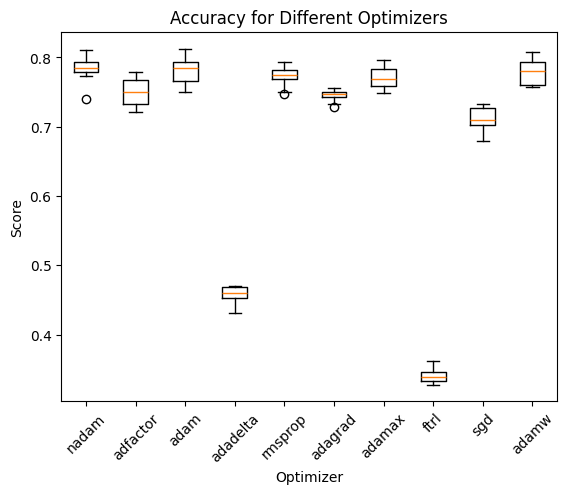

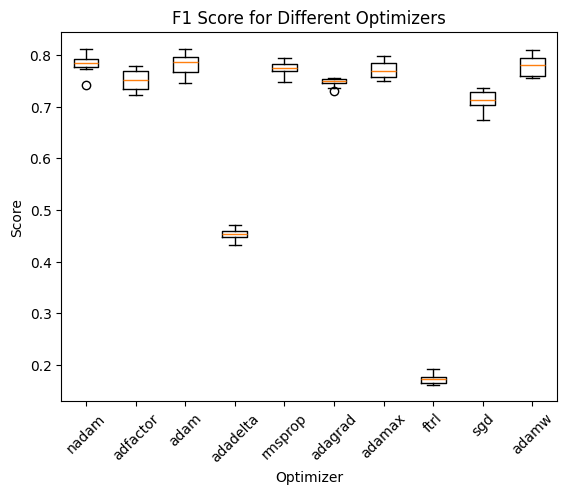

In [ ]:
import matplotlib.pyplot as plt

# Load the results from the CSV
results_df_optimisers = pd.read_csv('expr/lwd_diff_v1/optuna3_optimisers/optuna_results_extra.csv')

# seperate the results by optimizer
results_by_optimizer = {}
for optimizer in results_df_optimisers['optimizer'].unique():
    results_by_optimizer[optimizer] = results_df_optimisers[results_df_optimisers['optimizer'] == optimizer]

# boxplot of the accuracy and f1 score for the optimizers
optimizers_names = results_df_optimisers['optimizer'].unique()
plots_accuracy = []
plots_fscore = []
for optimizer in optimizers_names:
    results = results_by_optimizer[optimizer]
    plots_accuracy.append(results['accuracy'])
    plots_fscore.append(results['fscore'])

plt.boxplot(plots_accuracy)
plt.xticks(ticks=range(1, len(optimizers_names)+1), labels=optimizers_names, rotation=45)
plt.xlabel('Optimizer')
plt.ylabel('Score')
plt.title('Accuracy for Different Optimizers')
plt.show()

plt.boxplot(plots_fscore)
plt.xticks(ticks=range(1, len(optimizers_names)+1), labels=optimizers_names, rotation=45)
plt.xlabel('Optimizer')
plt.ylabel('Score')
plt.title('F1 Score for Different Optimizers')
plt.show()


Best Optimizer based on the min of the mean of the accuracy and f-score: (where a particular optimizer has the best performance over 10 runs)

In [ ]:
# best optimizer based on the mean over the 10 runs and the minimum of the mean accuracy and mean f1 score
mean_accuracy = [np.mean(x) for x in plots_accuracy]
mean_fscore = [np.mean(x) for x in plots_fscore]
min_mean = [min(mean_accuracy[i], mean_fscore[i]) for i in range(len(mean_accuracy))]

best_optimizer = optimizers_names[np.argmax(min_mean)]
best_optimizer


'nadam'

##### 3.2.3.3. Conclusion

Nadam, Adam and Adamw seem to perform the best after tuning. Adadelta and ftrl perform the worst. The other optimizers are close in berformance to the best 3.
Nadam has the best overall performance, but only by a small margin.

#### 3.2.4. Conclusion

## 4. Final Model

### 4.1. Final Data Preprocessing

In [104]:
# import data
almond_df = pd.read_csv('Almond.csv')

# handle index
almond_df.rename( columns={'Unnamed: 0':'Index'}, inplace=True )
almond_df.set_index('Index', inplace=True)

In [105]:
# drop Roundness, Aspect Ratio, Eccentricity
drop_columns = ['Roundness', 'Aspect Ratio', 'Eccentricity']
if set(drop_columns).issubset(almond_df.columns):
    almond_df.drop(drop_columns, axis=1, inplace=True)
almond_df.head()

,Length (major axis),Width (minor axis),Thickness (depth),Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type
Index,,,,,,,,,,
0,NaN,227.940628,127.759132,22619.0,643.813269,0.973384,1.458265,0.681193,23237.5,MAMRA
1,NaN,234.188126,128.199509,23038.0,680.984841,0.957304,1.601844,0.656353,24065.5,MAMRA
2,NaN,229.418610,125.796547,22386.5,646.943212,0.967270,1.487772,0.683620,23144.0,MAMRA
3,NaN,232.763153,125.918808,22578.5,661.227483,0.965512,1.540979,0.685360,23385.0,MAMRA
4,NaN,230.150742,107.253448,19068.0,624.842706,0.951450,1.629395,0.714800,20041.0,MAMRA


In [106]:
almond_df = pd.get_dummies(almond_df, columns=['Type'])
almond_df.head()

,Length (major axis),Width (minor axis),Thickness (depth),Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA
Index,,,,,,,,,,,,
0,NaN,227.940628,127.759132,22619.0,643.813269,0.973384,1.458265,0.681193,23237.5,True,False,False
1,NaN,234.188126,128.199509,23038.0,680.984841,0.957304,1.601844,0.656353,24065.5,True,False,False
2,NaN,229.418610,125.796547,22386.5,646.943212,0.967270,1.487772,0.683620,23144.0,True,False,False
3,NaN,232.763153,125.918808,22578.5,661.227483,0.965512,1.540979,0.685360,23385.0,True,False,False
4,NaN,230.150742,107.253448,19068.0,624.842706,0.951450,1.629395,0.714800,20041.0,True,False,False


In [107]:
# Add boolean columns for L, W, D
almond_df['L'] = almond_df['Length (major axis)'].notnull().astype(bool)
almond_df['W'] = almond_df['Width (minor axis)'].notnull().astype(bool)
almond_df['D'] = almond_df['Thickness (depth)'].notnull().astype(bool)

almond_df.head()

,Length (major axis),Width (minor axis),Thickness (depth),Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA,L,W,D
Index,,,,,,,,,,,,,,,
0,NaN,227.940628,127.759132,22619.0,643.813269,0.973384,1.458265,0.681193,23237.5,True,False,False,False,True,True
1,NaN,234.188126,128.199509,23038.0,680.984841,0.957304,1.601844,0.656353,24065.5,True,False,False,False,True,True
2,NaN,229.418610,125.796547,22386.5,646.943212,0.967270,1.487772,0.683620,23144.0,True,False,False,False,True,True
3,NaN,232.763153,125.918808,22578.5,661.227483,0.965512,1.540979,0.685360,23385.0,True,False,False,False,True,True
4,NaN,230.150742,107.253448,19068.0,624.842706,0.951450,1.629395,0.714800,20041.0,True,False,False,False,True,True


In [108]:
# apply standardization to the columns
columns_to_scale = ['Length (major axis)', 'Width (minor axis)', 'Thickness (depth)']
almond_df_scaled = apply_standardization_multiple_column_unified(almond_df, columns_to_scale)

# apply standardization to the columns individually
columns_to_standardize = ['Area', 'Perimeter', 'Solidity', 'Compactness', 'Extent', 'Convex hull(convex area)']
for column in columns_to_standardize:
    almond_df_scaled = apply_normalization(almond_df_scaled, column, standardize_value, mean=almond_df[column].mean(), std=almond_df[column].std())

almond_df_scaled.head()

,Length (major axis),Width (minor axis),Thickness (depth),Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA,L,W,D
Index,,,,,,,,,,,,,,,
0,NaN,1.646035,-2.752089,-0.282394,-0.433810,0.443368,-0.462142,-0.914065,-0.313171,True,False,False,False,True,True
1,NaN,1.920310,-2.732755,-0.251994,-0.272637,0.037276,-0.281326,-1.437286,-0.255014,True,False,False,False,True,True
2,NaN,1.710921,-2.838249,-0.299263,-0.420239,0.288972,-0.424984,-0.862936,-0.319738,True,False,False,False,True,True
3,NaN,1.857751,-2.832882,-0.285333,-0.358304,0.244572,-0.357976,-0.826281,-0.302810,True,False,False,False,True,True
4,NaN,1.743062,-3.652320,-0.540039,-0.516065,-0.110581,-0.246630,-0.206155,-0.537686,True,False,False,False,True,True


In [115]:
# shape of the data
almond_df_scaled.shape

(2803, 15)

In [112]:
almond_df_copy1 = almond_df_scaled.copy()

"""
conversion:
- drop: calculated features from L, W, D and has more than 60% missing values
- Roundness
- Aspect Ratio
- Eccentricity
- Measure Format: Text representation of (L, W, D)

convert (Length (major axis)	Width (minor axis)	Thickness (depth)) to:
- Length A
- Length B
- drop (Length (major axis)	Width (minor axis)	Thickness (depth))

Type: target has 3 classes: ('MAMRA' 'SANORA' 'REGULAR'), convert to hot-one encoding
- MAMRA: 1,0,0
- SANORA: 0,1,0
- REGULAR: 0,0,1

Final features (input to nn):
- Length A : if LxW, then Length A = L, if LxD, then Length A = L, if WxD, then Length A = W
- Length B : if LxW, then Length B = W, if LxD, then Length B = D, if WxD, then Length B = D
- Area
- Perimeter
- Solidity
- Compactness
- Extent
- Convex hull(convex area)
- L
- W
- D

output:
- Type_MAMRA
- Type_SANORA
- Type_REGULAR
"""

# Add Length A : if LxW, then Length A = L, if LxD, then Length A = L, if WxD, then Length A = W
almond_df_copy1['Length A'] = almond_df_copy1['Length (major axis)']
# print num of missing values
print(almond_df_copy1['Length A'].isnull().sum())
almond_df_copy1['Length A'] = almond_df_copy1['Length A'].fillna(almond_df_copy1['Width (minor axis)'])
# print num of missing values
print(almond_df_copy1['Length A'].isnull().sum())

# Add Length B : if LxW, then Length B = W, if LxD, then Length B = D, if WxD, then Length B = D
almond_df_copy1['Length B'] = almond_df_copy1['Thickness (depth)']
# print num of missing values
print(almond_df_copy1['Length B'].isnull().sum())
almond_df_copy1['Length B'] = almond_df_copy1['Length B'].fillna(almond_df_copy1['Width (minor axis)'])
# print num of missing values
print(almond_df_copy1['Length B'].isnull().sum())

# drop (Length (major axis)	Width (minor axis)	Thickness (depth))
almond_df_copy1.drop(['Length (major axis)', 'Width (minor axis)', 'Thickness (depth)'], axis=1, inplace=True)

# print head
almond_df_copy1.head()

857
0
1004
0


,Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA,L,W,D,Length A,Length B
Index,,,,,,,,,,,,,,
0,-0.282394,-0.433810,0.443368,-0.462142,-0.914065,-0.313171,True,False,False,False,True,True,1.646035,-2.752089
1,-0.251994,-0.272637,0.037276,-0.281326,-1.437286,-0.255014,True,False,False,False,True,True,1.920310,-2.732755
2,-0.299263,-0.420239,0.288972,-0.424984,-0.862936,-0.319738,True,False,False,False,True,True,1.710921,-2.838249
3,-0.285333,-0.358304,0.244572,-0.357976,-0.826281,-0.302810,True,False,False,False,True,True,1.857751,-2.832882
4,-0.540039,-0.516065,-0.110581,-0.246630,-0.206155,-0.537686,True,False,False,False,True,True,1.743062,-3.652320


In [113]:
# missing values
print_missing_values(almond_df_copy1)

,Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA,L,W,D,Length A,Length B
0,N,N,N,N,N,N,N,N,N,N,N,N,N,N


Remove oitliers (if outliers in 50% of the features)

In [116]:
# shape of the data
almond_df_copy1.shape

(2803, 14)

In [119]:
# remove outliers
columns = ['Area', 'Perimeter', 'Solidity', 'Compactness', 'Extent', 'Convex hull(convex area)', 'Length A', 'Length B']
outlier_threshold = 0.6
almond_df_copy1 = remove_outliers(almond_df_copy1, columns,  column_percentage=outlier_threshold)

In [120]:
# shape of the data
almond_df_copy1.shape

(2786, 14)

In [121]:
almond_df_copy1.head()

,Area,Perimeter,Solidity,Compactness,Extent,Convex hull(convex area),Type_MAMRA,Type_REGULAR,Type_SANORA,L,W,D,Length A,Length B
Index,,,,,,,,,,,,,,
0,-0.282394,-0.433810,0.443368,-0.462142,-0.914065,-0.313171,True,False,False,False,True,True,1.646035,-2.752089
1,-0.251994,-0.272637,0.037276,-0.281326,-1.437286,-0.255014,True,False,False,False,True,True,1.920310,-2.732755
2,-0.299263,-0.420239,0.288972,-0.424984,-0.862936,-0.319738,True,False,False,False,True,True,1.710921,-2.838249
3,-0.285333,-0.358304,0.244572,-0.357976,-0.826281,-0.302810,True,False,False,False,True,True,1.857751,-2.832882
4,-0.540039,-0.516065,-0.110581,-0.246630,-0.206155,-0.537686,True,False,False,False,True,True,1.743062,-3.652320


Save the preprocessed data to a new file

In [122]:
# save the data to expr/final/data.csv

almond_df_copy1.to_csv('expr/final/data.csv')

### 4.2. Final Model Hyperparameters and Training

#### 4.2.1. Limited Tuning and Grid Search

##### 4.2.1.1. RPprop Optimizer

###### 4.2.1.1.1. Setup

In [128]:
def full_test_rprop(
    name,
    progress_bar,
    y,
    X,
    epochs=200, 
    test_size=0.2, 
    patience=10, 
    min_delta=0.01, 
    starting_hidden_layer_size=64, 
    number_hidden_layers=4, 
    hidden_layer_activation='relu', 
    output_activation='softmax', 
    learning_rate=1e-3, 
    initial_step_size=1e-3, 
    increment_factor=1.2, 
    decrement_factor=0.5, 
    min_step_size=1e-6, 
    max_step_size=50.0, 
    loss='categorical_crossentropy', 
    batch_size=8,
    seed=0
): 
    
    input_shape = (X.shape[1],)
    output_shape = y.shape[1]

    optimizer = CustomRPropOptimizer(
        initial_step_size=initial_step_size,
        increment_factor=increment_factor,
        decrement_factor=decrement_factor,
        min_step_size=min_step_size,
        max_step_size=max_step_size,
    )

    model = create_pyramid_model_v2(
        starting_hidden_layer_size, 
        number_hidden_layers, 
        input_shape, 
        output_shape, 
        optimizer,
        metrics=['accuracy', 'f1_score'], 
        loss=loss,
        hidden_activation=hidden_layer_activation,
        output_activation=output_activation
    )

    # callbacks
    custom_callback = CustomCallback(patience=patience, min_delta=min_delta)
    progress_bar_updater = tf_progress_bar_updater(progress_bar, subcount=epochs)

    # update the progress bar
    progress_bar.update(1)

    result = run_experiment(
        model, 
        X, 
        y, 
        name, 
        patience=patience, 
        min_delta=min_delta, 
        epochs=epochs, 
        seed=seed, 
        batch_size=batch_size, 
        test_size=test_size, 
        callbacks=[custom_callback, progress_bar_updater]
    )

    # add details to the result
    result['starting_hidden_layer_size'] = starting_hidden_layer_size
    result['number_hidden_layers'] = number_hidden_layers
    result['hidden_layer_activation'] = hidden_layer_activation
    result['output_activation'] = output_activation

    result['learning_rate'] = learning_rate
    result['initial_step_size'] = initial_step_size
    result['increment_factor'] = increment_factor
    result['decrement_factor'] = decrement_factor
    result['min_step_size'] = min_step_size
    result['max_step_size'] = max_step_size
    
    result['loss'] = loss
    result['optimizer'] = 'RProp'
    result['batch_size'] = batch_size
    result['epochs'] = epochs
    result['patience'] = patience
    result['min_delta'] = min_delta
    result['seed'] = seed

    return result

In [129]:
# Optuna objective function
def objective(trial):
    global count
    count += 1
    global results
    global progress_bar
    global epochs
    global test_size

    patience = 10
    min_delta = 0.01

    starting_hidden_layer_size = 64
    number_hidden_layers = 4
    batch_size = 8
    output_activation = 'softmax'
    optimizer = 'RProp'

    # suggested hyperparameters
    hidden_layer_activation = trial.suggest_categorical('hidden_layer_activation', ['relu', 'tanh', 'sigmoid'])
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    initial_step_size = trial.suggest_float('initial_step_size', 1e-5, 1e-1, log=True)
    increment_factor = trial.suggest_float('increment_factor', 1.0, 2.0)
    decrement_factor = trial.suggest_float('decrement_factor', 0.0, 1.0)
    min_step_size = trial.suggest_float('min_step_size', 1e-6, 1e-3, log=True)
    max_step_size = trial.suggest_float('max_step_size', 1.0, 100.0)
    loss = trial.suggest_categorical('loss', ['categorical_crossentropy', 'mean_squared_error', 'mean_absolute_error'])

    # load the data
    almond_df = pd.read_csv('expr/final/data.csv')
    # handle index
    almond_df.set_index('Index', inplace=True)
    # split the data
    y = almond_df[['Type_MAMRA', 'Type_SANORA', 'Type_REGULAR']].values
    X = almond_df.drop(['Type_MAMRA', 'Type_SANORA', 'Type_REGULAR'], axis=1).values

    seed = np.random.randint(0, 1000)

    name = f'final:run{count}'

    result = full_test_rprop(
        name,
        progress_bar,
        y,
        X,
        epochs=epochs,
        test_size=test_size,
        patience=patience,
        min_delta=min_delta,
        starting_hidden_layer_size=starting_hidden_layer_size,
        number_hidden_layers=number_hidden_layers,
        hidden_layer_activation=hidden_layer_activation,
        output_activation=output_activation,
        learning_rate=learning_rate,
        initial_step_size=initial_step_size,
        increment_factor=increment_factor,
        decrement_factor=decrement_factor,
        min_step_size=min_step_size,
        max_step_size=max_step_size,
        loss=loss,
        batch_size=batch_size,
        seed=seed
    )

    results.append(result)

    f1_score = result['fscore']
    accuracy = result['accuracy']

    val = min(f1_score, accuracy)

    return val

In [131]:
# Optuna study
results = []
count = 0
num_trials = 500
epochs = 200
test_size = 0.2
progress_bar = notebook.tqdm(total=num_trials*2+num_trials*epochs+1, desc='Overall Progress', dynamic_ncols=True, leave=True)

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=num_trials)

# save the results
results_df = pd.DataFrame(results)
results_df.to_csv('expr/final/results_rprop.csv')

# save the study
joblib.dump(study, 'expr/final/study_rprop.pkl')

Overall Progress:   0%|          | 0/101001 [00:00<?, ?it/s]

[I 2024-10-03 01:27:26,751] A new study created in memory with name: no-name-08d8b1e2-62c2-487e-9859-413447c2e8bf
[W 2024-10-03 01:27:26,799] Trial 0 failed with parameters: {'hidden_layer_activation': 'sigmoid', 'learning_rate': 8.556238899736059e-05, 'initial_step_size': 0.007824895201359735, 'increment_factor': 1.074810037678139, 'decrement_factor': 0.21532901040188823, 'min_step_size': 1.711383136393402e-06, 'max_step_size': 29.702917445653277, 'loss': 'mean_absolute_error'} because of the following error: ValueError('Failed to convert a NumPy array to a Tensor (Unsupported object type float).').
Traceback (most recent call last):
  File "C:\Users\djjor\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\optuna\study\_optimize.py", line 197, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "C:\Users\djjor\AppData\Local\Temp\ipykernel_167724\3348308188.py", line 41, in obj

[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]


ValueError: Failed to convert a NumPy array to a Tensor (Unsupported object type float).

In [215]:
# load the data
data1 = pd.read_csv('expr/lwd_diff_v1/data1.csv')
data2 = pd.read_csv('expr/lwd_diff_v1/data2.csv')
data3 = pd.read_csv('expr/lwd_diff_v1/data3.csv')
dataF = pd.read_csv('expr/final/data.csv')

# drop index
data1.drop(['Index'], axis=1, inplace=True)
data2.drop(['Index'], axis=1, inplace=True)
data3.drop(['Index'], axis=1, inplace=True)
dataF.drop(['Index'], axis=1, inplace=True)

# split the data to X and y
y_columns = ['Type_MAMRA', 'Type_SANORA', 'Type_REGULAR']
y1 = data1[y_columns]
X1 = data1.drop(y_columns, axis=1)

y2 = data2[y_columns]
X2 = data2.drop(y_columns, axis=1)

y3 = data3[y_columns]
X3 = data3.drop(y_columns, axis=1)

yF = dataF[y_columns]
XF = dataF.drop(y_columns, axis=1)

In [135]:
resultsRP = []
count = 0
num_trials = 500
epochs = 200
test_size = 0.2
progress_bar = notebook.tqdm(total=num_trials*2+num_trials*epochs+1, desc='Overall Progress', dynamic_ncols=True, leave=True)

# Define the objective function for Optuna
def objective(trial):
    global count
    count += 1
    global resultsRP
    global progress_bar
    global epochs
    global test_size

    # Suggest hyperparameters
    starting_hidden_layer_size = 64
    number_hidden_layers = 4
    batch_size = 8
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    hidden_activation = trial.suggest_categorical('hidden_activation', ['relu', 'tanh', 'sigmoid'])
    output_activation = 'softmax'
    loss = trial.suggest_categorical('loss', ['categorical_crossentropy', 'mean_squared_error', 'mean_absolute_error'])
    metrics = ['accuracy', 'f1_score']

    initial_step_size = trial.suggest_float('initial_step_size', 1e-5, 1e-1, log=True)
    increment_factor = trial.suggest_float('increment_factor', 1.0, 2.0)
    decrement_factor = trial.suggest_float('decrement_factor', 0.0, 1.0)
    min_step_size = trial.suggest_float('min_step_size', 1e-6, 1e-3, log=True)
    max_step_size = trial.suggest_float('max_step_size', 1.0, 100.0)
    
    
    patience = 10
    min_delta = 0.01
    total_runs = 1

    X = XF
    y = yF

    name=f'data1:run{count}'
    seed = np.random.randint(0, 1000)
    input_shape = (X.shape[1],)
    output_shape = y.shape[1]

    optimizer = CustomRPropOptimizer(initial_step_size=initial_step_size, increment_factor=increment_factor, decrement_factor=decrement_factor, min_step_size=min_step_size, max_step_size=max_step_size)
    
    model = create_pyramid_model_v2(starting_hidden_layer_size, number_hidden_layers, input_shape, output_shape, optimizer, loss=loss, metrics=metrics, hidden_activation=hidden_activation, output_activation=output_activation)

    # callbacks
    custom_callback = CustomCallback(patience=patience, min_delta=min_delta)

    # update the progress bar
    progress_bar.update(1)

    result = run_experiment(model, X, y, name, patience=patience, min_delta=min_delta, epochs=epochs, seed=seed, batch_size=batch_size, test_size=test_size, callbacks=[custom_callback, tf_progress_bar_updater(progress_bar, subcount=epochs)])

    # add num hidden layers and starting hidden layer size to the result
    result['starting_hidden_layer_size'] = starting_hidden_layer_size
    result['number_hidden_layers'] = number_hidden_layers
    result['learning_rate'] = learning_rate
    result['hidden_activation'] = hidden_activation
    result['output_activation'] = output_activation
    result['optimizer'] = 'CustomRPropOptimizer'
    result['loss'] = loss
    result['initial_step_size'] = initial_step_size
    result['increment_factor'] = increment_factor
    result['decrement_factor'] = decrement_factor
    result['min_step_size'] = min_step_size
    result['max_step_size'] = max_step_size
    result['batch_size'] = batch_size
    result['epochs'] = epochs
    result['patience'] = patience
    result['min_delta'] = min_delta
    result['seed'] = seed
    result['name'] = name

    resultsRP.append(result)

    min_accuracy_f_score = min(result['accuracy'], result['fscore'])

    progress_bar.update(1)  # Update the progress bar

    return min_accuracy_f_score

# Create the Optuna study
studyRP = optuna.create_study(direction='maximize')
studyRP.optimize(objective, n_trials=num_trials)

# Save the results
results_df_RP = pd.DataFrame(resultsRP)
results_df_RP.to_csv('expr/final/results_rprop.csv')

# Save the study
joblib.dump(studyRP, 'expr/final/study_rprop.pkl')

progress_bar.update(1)
progress_bar.refresh()
progress_bar.close()

Overall Progress:   0%|          | 0/101001 [00:00<?, ?it/s]

[I 2024-10-03 01:39:09,162] A new study created in memory with name: no-name-12bb4229-f53d-45b1-a2b6-844fda44f549


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 21: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:39:13,744] Trial 0 finished with value: 0.14824607791292085 and parameters: {'learning_rate': 0.00012424158049065135, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 1.9337891532310736e-05, 'increment_factor': 1.7546853691800721, 'decrement_factor': 0.2334843835999869, 'min_step_size': 0.00024157696625604224, 'max_step_size': 20.7627726575655}. Best is trial 0 with value: 0.14824607791292085.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 15: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:39:17,259] Trial 1 finished with value: 0.14228602938280357 and parameters: {'learning_rate': 1.979476990773386e-05, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'initial_step_size': 0.0022429750277933877, 'increment_factor': 1.4383380166224162, 'decrement_factor': 0.6882090140782661, 'min_step_size': 0.0004710757055188906, 'max_step_size': 54.8018149836607}. Best is trial 0 with value: 0.14824607791292085.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:39:19,933] Trial 2 finished with value: 0.18914139264807409 and parameters: {'learning_rate': 0.04337606281224426, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.07105947331109407, 'increment_factor': 1.5782284491554721, 'decrement_factor': 0.9918594782843185, 'min_step_size': 0.00021803689520493046, 'max_step_size': 46.30007244366198}. Best is trial 2 with value: 0.18914139264807409.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:39:53,344] Trial 3 finished with value: 0.18914139264807409 and parameters: {'learning_rate': 0.004187711212179021, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'initial_step_size': 1.9419432708629163e-05, 'increment_factor': 1.1140464046136165, 'decrement_factor': 0.9370406009335697, 'min_step_size': 1.814759952464792e-06, 'max_step_size': 20.380525960214964}. Best is trial 2 with value: 0.18914139264807409.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 124: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:40:16,169] Trial 4 finished with value: 0.15363909004461998 and parameters: {'learning_rate': 4.4771742168552406e-05, 'hidden_activation': 'relu', 'loss': 'mean_squared_error', 'initial_step_size': 0.00043851938735489784, 'increment_factor': 1.5501424612998271, 'decrement_factor': 0.4829814368481836, 'min_step_size': 1.547035563610305e-06, 'max_step_size': 13.288786390377266}. Best is trial 2 with value: 0.18914139264807409.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:40:49,831] Trial 5 finished with value: 0.6774720947221148 and parameters: {'learning_rate': 0.018559371911498004, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'initial_step_size': 1.0058170202721787e-05, 'increment_factor': 1.2103190815029268, 'decrement_factor': 0.16019478154711897, 'min_step_size': 4.4984768492290666e-05, 'max_step_size': 63.35853402617162}. Best is trial 5 with value: 0.6774720947221148.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 12: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:40:53,037] Trial 6 finished with value: 0.16354133456994077 and parameters: {'learning_rate': 3.0471865332533212e-05, 'hidden_activation': 'relu', 'loss': 'mean_absolute_error', 'initial_step_size': 0.006312760182714652, 'increment_factor': 1.6601087111098125, 'decrement_factor': 0.12714846059636853, 'min_step_size': 0.0002885196325544028, 'max_step_size': 38.29132951063052}. Best is trial 5 with value: 0.6774720947221148.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 43: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:41:01,301] Trial 7 finished with value: 0.517276146416569 and parameters: {'learning_rate': 0.00023390633552320328, 'hidden_activation': 'relu', 'loss': 'mean_absolute_error', 'initial_step_size': 0.006220518701888667, 'increment_factor': 1.7017714783111746, 'decrement_factor': 0.1281253707113117, 'min_step_size': 1.60768903713384e-06, 'max_step_size': 66.20015728189104}. Best is trial 5 with value: 0.6774720947221148.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:41:34,702] Trial 8 finished with value: 0.5940993505612403 and parameters: {'learning_rate': 0.00605646429382066, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'initial_step_size': 5.081463373210749e-05, 'increment_factor': 1.0907756788472716, 'decrement_factor': 0.4764508403111859, 'min_step_size': 0.0003982146308511772, 'max_step_size': 94.16212656182503}. Best is trial 5 with value: 0.6774720947221148.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:42:09,807] Trial 9 finished with value: 0.7222222222222222 and parameters: {'learning_rate': 2.9774208411121944e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 3.099764241762889e-05, 'increment_factor': 1.23400023708218, 'decrement_factor': 0.7245024043355358, 'min_step_size': 6.49251429363794e-05, 'max_step_size': 19.423132267926132}. Best is trial 9 with value: 0.7222222222222222.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:42:12,801] Trial 10 finished with value: 0.16510127980626832 and parameters: {'learning_rate': 0.000720085509412301, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00024050947804503056, 'increment_factor': 1.9381816871417432, 'decrement_factor': 0.7128188853048514, 'min_step_size': 1.3697186130189332e-05, 'max_step_size': 1.0826129453597702}. Best is trial 9 with value: 0.7222222222222222.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:42:46,052] Trial 11 finished with value: 0.6487455197132617 and parameters: {'learning_rate': 0.0706399355885114, 'hidden_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'initial_step_size': 6.509241192657943e-05, 'increment_factor': 1.29793078710167, 'decrement_factor': 0.3536631241273714, 'min_step_size': 3.928121381214924e-05, 'max_step_size': 77.41092151706034}. Best is trial 9 with value: 0.7222222222222222.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 180: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:43:16,566] Trial 12 finished with value: 0.7025089605734767 and parameters: {'learning_rate': 0.008268719185685752, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00010195435648839693, 'increment_factor': 1.283779148264561, 'decrement_factor': 0.0035545254617359023, 'min_step_size': 3.504362065610234e-05, 'max_step_size': 34.15935477143162}. Best is trial 9 with value: 0.7222222222222222.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 149: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:43:42,999] Trial 13 finished with value: 0.1437674233373158 and parameters: {'learning_rate': 0.0017823497589614424, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001284152904621104, 'increment_factor': 1.30492728491721, 'decrement_factor': 0.7210310802547739, 'min_step_size': 1.1654788505307941e-05, 'max_step_size': 33.17812915511896}. Best is trial 9 with value: 0.7222222222222222.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:44:16,627] Trial 14 finished with value: 0.3297809767049781 and parameters: {'learning_rate': 0.00041994783283192977, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0007950610992701348, 'increment_factor': 1.422986106173111, 'decrement_factor': 0.8206988332423053, 'min_step_size': 8.781444841724227e-05, 'max_step_size': 31.49611973121237}. Best is trial 9 with value: 0.7222222222222222.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 38: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:44:23,736] Trial 15 finished with value: 0.5408685649539988 and parameters: {'learning_rate': 1.114383258711462e-05, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 6.047143318757801e-05, 'increment_factor': 1.0308308118351563, 'decrement_factor': 0.03878629167316883, 'min_step_size': 1.5228088533928771e-05, 'max_step_size': 3.4046270188534997}. Best is trial 9 with value: 0.7222222222222222.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 85: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:44:39,388] Trial 16 finished with value: 0.6469534050179212 and parameters: {'learning_rate': 0.010481247226545599, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00016781243879576802, 'increment_factor': 1.2554884205912986, 'decrement_factor': 0.5991723575324113, 'min_step_size': 8.256836091089992e-05, 'max_step_size': 23.931352149663994}. Best is trial 9 with value: 0.7222222222222222.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 25: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:44:44,432] Trial 17 finished with value: 0.35806817804177415 and parameters: {'learning_rate': 0.002654271956337428, 'hidden_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'initial_step_size': 2.7973446866698533e-05, 'increment_factor': 1.3632429937929647, 'decrement_factor': 0.3671563940793981, 'min_step_size': 3.7004121117703762e-06, 'max_step_size': 47.19816574715299}. Best is trial 9 with value: 0.7222222222222222.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:45:19,479] Trial 18 finished with value: 0.7240143369175627 and parameters: {'learning_rate': 5.9065067975228864e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0011093175466298918, 'increment_factor': 1.159852616387294, 'decrement_factor': 0.5595451267348346, 'min_step_size': 0.0008913794793884077, 'max_step_size': 12.766725191179967}. Best is trial 18 with value: 0.7240143369175627.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:45:54,568] Trial 19 finished with value: 0.7489145581330875 and parameters: {'learning_rate': 7.901873594233094e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.002428684886762526, 'increment_factor': 1.017118924254239, 'decrement_factor': 0.5761062250685155, 'min_step_size': 0.0009676500707246256, 'max_step_size': 10.645204510943223}. Best is trial 19 with value: 0.7489145581330875.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:46:29,989] Trial 20 finished with value: 0.6881720430107527 and parameters: {'learning_rate': 7.454846104059446e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.03585475978068495, 'increment_factor': 1.003621852773881, 'decrement_factor': 0.5787027456083359, 'min_step_size': 0.0007404133518283827, 'max_step_size': 5.436623133326827}. Best is trial 19 with value: 0.7489145581330875.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:47:06,195] Trial 21 finished with value: 0.6192611444298022 and parameters: {'learning_rate': 0.00013223938059750054, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.002423074676312936, 'increment_factor': 1.1587431426091135, 'decrement_factor': 0.8294959614215482, 'min_step_size': 0.000994881009279519, 'max_step_size': 12.499257014820223}. Best is trial 19 with value: 0.7489145581330875.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:47:41,307] Trial 22 finished with value: 0.7007168458781362 and parameters: {'learning_rate': 1.1912731981945909e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00175086583714387, 'increment_factor': 1.168892154565556, 'decrement_factor': 0.5682617633585372, 'min_step_size': 0.00014722942159345605, 'max_step_size': 15.005424188097702}. Best is trial 19 with value: 0.7489145581330875.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:48:16,794] Trial 23 finished with value: 0.7512189480919857 and parameters: {'learning_rate': 5.0763602837333067e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.008548135332017806, 'increment_factor': 1.0893089370088764, 'decrement_factor': 0.422592472388171, 'min_step_size': 0.0005962455115356838, 'max_step_size': 26.224208118439044}. Best is trial 23 with value: 0.7512189480919857.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:48:51,930] Trial 24 finished with value: 0.7741935483870968 and parameters: {'learning_rate': 8.033063845300982e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.018458844949347037, 'increment_factor': 1.071365916447161, 'decrement_factor': 0.3655189121793858, 'min_step_size': 0.0005795673311793119, 'max_step_size': 27.158708969500484}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:49:27,125] Trial 25 finished with value: 0.681533431377957 and parameters: {'learning_rate': 0.00035612866885244743, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.014285917039086379, 'increment_factor': 1.0587097968613741, 'decrement_factor': 0.3341378438048834, 'min_step_size': 0.0005166677784477801, 'max_step_size': 40.77714763436754}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:50:02,211] Trial 26 finished with value: 0.7311612679507392 and parameters: {'learning_rate': 0.00013185066955631358, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.015825526968244512, 'increment_factor': 1.0000087344736872, 'decrement_factor': 0.42863261064485286, 'min_step_size': 0.00016088652141167252, 'max_step_size': 25.752791182183593}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:50:37,404] Trial 27 finished with value: 0.613799196175152 and parameters: {'learning_rate': 0.0008191978411412844, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'initial_step_size': 0.005016196954245422, 'increment_factor': 1.0905172680381576, 'decrement_factor': 0.2615943611808049, 'min_step_size': 0.0004964536152356307, 'max_step_size': 29.562882705579575}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:50:40,085] Trial 28 finished with value: 0.30645285178733805 and parameters: {'learning_rate': 0.00021073502141796132, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.01977163254848703, 'increment_factor': 1.9906574303304354, 'decrement_factor': 0.4317824710802237, 'min_step_size': 0.00013373671287316802, 'max_step_size': 56.21131273110455}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 29: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:50:46,013] Trial 29 finished with value: 0.16510127980626832 and parameters: {'learning_rate': 7.757030389821691e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.09850894595907679, 'increment_factor': 1.8573413416056153, 'decrement_factor': 0.27250894488521504, 'min_step_size': 0.0002745054129527501, 'max_step_size': 7.667246023165546}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:51:21,085] Trial 30 finished with value: 0.6881720430107527 and parameters: {'learning_rate': 2.6368720995917895e-05, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.0323583957154069, 'increment_factor': 1.3547572574228053, 'decrement_factor': 0.20271745835469585, 'min_step_size': 0.000631784765131452, 'max_step_size': 39.66762022338919}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 108: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:51:40,703] Trial 31 finished with value: 0.7132616487455197 and parameters: {'learning_rate': 0.00011780009165586511, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.011449652768191827, 'increment_factor': 1.0359369252575819, 'decrement_factor': 0.40714697103415565, 'min_step_size': 0.00020019091762878675, 'max_step_size': 25.326011664233256}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:52:15,810] Trial 32 finished with value: 0.7580645161290323 and parameters: {'learning_rate': 0.00013183373757188037, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.003651074316504829, 'increment_factor': 1.007951650741795, 'decrement_factor': 0.5211313518235702, 'min_step_size': 0.0003566890122485202, 'max_step_size': 23.95923211643565}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:52:50,834] Trial 33 finished with value: 0.7662753604142051 and parameters: {'learning_rate': 4.733759403813603e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00341953722494595, 'increment_factor': 1.1257995535882275, 'decrement_factor': 0.5202902966787002, 'min_step_size': 0.00036908336277372076, 'max_step_size': 18.429981673743512}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:53:26,220] Trial 34 finished with value: 0.7401433691756273 and parameters: {'learning_rate': 4.7861567720010266e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.003855171602491712, 'increment_factor': 1.13569430088658, 'decrement_factor': 0.6530411604750672, 'min_step_size': 0.0003624837038948267, 'max_step_size': 17.94067315147192}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:54:01,675] Trial 35 finished with value: 0.6277840001423368 and parameters: {'learning_rate': 1.5660454962484752e-05, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'initial_step_size': 0.008487367337155138, 'increment_factor': 1.0999815526793764, 'decrement_factor': 0.5104450893676087, 'min_step_size': 0.0003511753538146859, 'max_step_size': 26.89356225683451}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 177: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:54:33,127] Trial 36 finished with value: 0.7473118279569892 and parameters: {'learning_rate': 0.00019365940937864952, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.026317615012727526, 'increment_factor': 1.1742508278643762, 'decrement_factor': 0.3109337258500385, 'min_step_size': 0.00022830041886632392, 'max_step_size': 54.1303247550801}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:55:08,681] Trial 37 finished with value: 0.4605882331865026 and parameters: {'learning_rate': 2.2490508783540567e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.04205069739421281, 'increment_factor': 1.4681127554903262, 'decrement_factor': 0.5027658614144443, 'min_step_size': 0.0005610689441246303, 'max_step_size': 20.46522588238534}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:55:44,223] Trial 38 finished with value: 0.6603848136625311 and parameters: {'learning_rate': 3.935468229966153e-05, 'hidden_activation': 'relu', 'loss': 'mean_absolute_error', 'initial_step_size': 0.0036886508447494383, 'increment_factor': 1.2075614653681352, 'decrement_factor': 0.40077356649878776, 'min_step_size': 0.00012662968345005134, 'max_step_size': 42.80435959459203}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:55:46,926] Trial 39 finished with value: 0.15735641227380015 and parameters: {'learning_rate': 0.00041305988622488044, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.0008813486387457297, 'increment_factor': 1.5807199926955058, 'decrement_factor': 0.6535000765470873, 'min_step_size': 0.000300028553368647, 'max_step_size': 34.8109078559796}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:56:21,710] Trial 40 finished with value: 0.7258064516129032 and parameters: {'learning_rate': 1.8381530930227224e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.009483902737517933, 'increment_factor': 1.1015179219839262, 'decrement_factor': 0.4686753265602914, 'min_step_size': 0.0004344903944095149, 'max_step_size': 17.112336311812797}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:56:56,764] Trial 41 finished with value: 0.7473118279569892 and parameters: {'learning_rate': 9.026479466383112e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.002085478868145505, 'increment_factor': 1.0602672580546675, 'decrement_factor': 0.5092595137177774, 'min_step_size': 0.0007099751046359435, 'max_step_size': 10.495396441295156}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:57:31,870] Trial 42 finished with value: 0.7491039426523297 and parameters: {'learning_rate': 4.52669676736658e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00041327487438021487, 'increment_factor': 1.0615359701793539, 'decrement_factor': 0.6299908596274467, 'min_step_size': 0.0009447700325670573, 'max_step_size': 22.20544844868389}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 109: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:57:51,644] Trial 43 finished with value: 0.1378766530713138 and parameters: {'learning_rate': 4.472586473434864e-05, 'hidden_activation': 'relu', 'loss': 'mean_squared_error', 'initial_step_size': 0.000338328358289749, 'increment_factor': 1.2145171733189932, 'decrement_factor': 0.6485835373329282, 'min_step_size': 0.0005918639261263287, 'max_step_size': 23.21521293094432}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:58:26,796] Trial 44 finished with value: 0.7419354838709677 and parameters: {'learning_rate': 3.7585889279783106e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005755628923521411, 'increment_factor': 1.0674217611916734, 'decrement_factor': 0.8015409381981065, 'min_step_size': 0.00043889149044561, 'max_step_size': 99.0796846072501}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 92: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:58:43,596] Trial 45 finished with value: 0.7329749103942652 and parameters: {'learning_rate': 0.0002798979036655644, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.006918802124931625, 'increment_factor': 1.125106360158517, 'decrement_factor': 0.775599350739591, 'min_step_size': 0.0002109522307650927, 'max_step_size': 29.49043900336329}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:58:46,271] Trial 46 finished with value: 0.14975037529277727 and parameters: {'learning_rate': 0.00017272651811890206, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'initial_step_size': 0.001457699969002297, 'increment_factor': 1.1939972170905648, 'decrement_factor': 0.9023147386391657, 'min_step_size': 0.0007418783003302844, 'max_step_size': 35.91606335692237}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 84: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:59:01,566] Trial 47 finished with value: 0.6877119067219281 and parameters: {'learning_rate': 5.7779002742340714e-05, 'hidden_activation': 'relu', 'loss': 'mean_squared_error', 'initial_step_size': 0.04837851975824225, 'increment_factor': 1.1187173975113254, 'decrement_factor': 0.6191461676584151, 'min_step_size': 0.0002956753746219292, 'max_step_size': 80.9892181319705}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 21: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:59:06,150] Trial 48 finished with value: 0.48544111603103274 and parameters: {'learning_rate': 0.0011964844955818954, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0032893277314239586, 'increment_factor': 1.0662628921990411, 'decrement_factor': 0.46076784297430723, 'min_step_size': 3.3950783710419733e-06, 'max_step_size': 19.79551766862349}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 23: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:59:11,039] Trial 49 finished with value: 0.6336492147248426 and parameters: {'learning_rate': 2.8702432446612374e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005811430379120631, 'increment_factor': 1.2546212284919847, 'decrement_factor': 0.536791458266207, 'min_step_size': 4.988688537260046e-05, 'max_step_size': 44.602427759564634}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 01:59:44,504] Trial 50 finished with value: 0.6577060931899642 and parameters: {'learning_rate': 0.00011102647078373992, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.005712968321551376, 'increment_factor': 1.3392443589202754, 'decrement_factor': 0.39143039795564705, 'min_step_size': 2.42537043035695e-05, 'max_step_size': 30.080597219308586}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:00:19,802] Trial 51 finished with value: 0.7347670250896058 and parameters: {'learning_rate': 8.403698972089558e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0032395556849771725, 'increment_factor': 1.023137748914039, 'decrement_factor': 0.540088099194076, 'min_step_size': 0.000942144937326019, 'max_step_size': 8.252539945806939}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:00:22,475] Trial 52 finished with value: 0.290745685064414 and parameters: {'learning_rate': 5.8753381152533294e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0011682050835658262, 'increment_factor': 1.0374413888017917, 'decrement_factor': 0.6130403483775506, 'min_step_size': 1.0060124958159942e-06, 'max_step_size': 16.393753290233427}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:00:57,377] Trial 53 finished with value: 0.7204288414513403 and parameters: {'learning_rate': 1.936453671936242e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0022714045991100943, 'increment_factor': 1.004240577195815, 'decrement_factor': 0.6989760242631425, 'min_step_size': 0.0008005340251599353, 'max_step_size': 1.1653484811486283}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:01:33,042] Trial 54 finished with value: 0.7526881720430108 and parameters: {'learning_rate': 3.289370559848476e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0043774310832363815, 'increment_factor': 1.1407593504635458, 'decrement_factor': 0.45730780720483233, 'min_step_size': 0.0009926796535946456, 'max_step_size': 21.239527079269088}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:02:08,104] Trial 55 finished with value: 0.7616487455197133 and parameters: {'learning_rate': 3.37786179815389e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00025998224096003813, 'increment_factor': 1.1458229432439986, 'decrement_factor': 0.32023139582687277, 'min_step_size': 0.00037363937962987316, 'max_step_size': 21.72885181831179}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:02:43,452] Trial 56 finished with value: 0.6106309436886889 and parameters: {'learning_rate': 1.570481810304528e-05, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.022549926874529624, 'increment_factor': 1.1321765480858736, 'decrement_factor': 0.30927315475541184, 'min_step_size': 0.0004570777462983345, 'max_step_size': 37.37457934826545}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:03:19,003] Trial 57 finished with value: 0.6953405017921147 and parameters: {'learning_rate': 1.0209154088476482e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.011721811388338913, 'increment_factor': 1.2444465414739452, 'decrement_factor': 0.20252419434011948, 'min_step_size': 9.510688384840201e-05, 'max_step_size': 26.78502282957383}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:03:52,122] Trial 58 finished with value: 0.15889436951028466 and parameters: {'learning_rate': 2.7329452291399017e-05, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0048419587559458774, 'increment_factor': 1.7429099790675822, 'decrement_factor': 0.44143748989218984, 'min_step_size': 0.0003440410045191182, 'max_step_size': 15.85080361090192}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 146: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:04:18,007] Trial 59 finished with value: 0.7580645161290323 and parameters: {'learning_rate': 0.000560868232777923, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.007120720978021321, 'increment_factor': 1.285999768982994, 'decrement_factor': 0.3544788847528881, 'min_step_size': 0.00017399918357163886, 'max_step_size': 32.95458365109676}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:04:53,138] Trial 60 finished with value: 0.6396943434126957 and parameters: {'learning_rate': 0.0005022724039323749, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'initial_step_size': 0.00020060219106813123, 'increment_factor': 1.3897901683383076, 'decrement_factor': 0.3667153825109385, 'min_step_size': 0.00017287506501398631, 'max_step_size': 31.41874093104677}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:05:28,436] Trial 61 finished with value: 0.7437275985663082 and parameters: {'learning_rate': 0.0021378673616037577, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00820449014511366, 'increment_factor': 1.1534193194807798, 'decrement_factor': 0.34777543838758473, 'min_step_size': 0.0006190382250607005, 'max_step_size': 20.235821939442957}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:06:03,777] Trial 62 finished with value: 0.7377828824935767 and parameters: {'learning_rate': 0.0001577020428234914, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0066130235823593396, 'increment_factor': 1.1888526567448352, 'decrement_factor': 0.3110936998398057, 'min_step_size': 0.0002601204823193592, 'max_step_size': 22.855560473124946}. Best is trial 24 with value: 0.7741935483870968.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:06:39,175] Trial 63 finished with value: 0.7831541218637993 and parameters: {'learning_rate': 0.0006042634889848933, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.016490479683776434, 'increment_factor': 1.2713857702611004, 'decrement_factor': 0.270596625933693, 'min_step_size': 0.0003993325993313258, 'max_step_size': 13.562949915568467}. Best is trial 63 with value: 0.7831541218637993.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:07:14,312] Trial 64 finished with value: 0.7502088348634031 and parameters: {'learning_rate': 0.0005709197715406065, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.01342001400000899, 'increment_factor': 1.2700867990029188, 'decrement_factor': 0.12881164298732573, 'min_step_size': 0.00039022931219905813, 'max_step_size': 11.838005559880719}. Best is trial 63 with value: 0.7831541218637993.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:07:49,454] Trial 65 finished with value: 0.7580645161290323 and parameters: {'learning_rate': 0.0010930374305480272, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.01755317023335499, 'increment_factor': 1.2934556727486064, 'decrement_factor': 0.25996881582727976, 'min_step_size': 0.00018296327582282177, 'max_step_size': 14.021582974052128}. Best is trial 63 with value: 0.7831541218637993.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:08:24,443] Trial 66 finished with value: 0.7150537634408602 and parameters: {'learning_rate': 0.0012616708334697365, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.05792816968642775, 'increment_factor': 1.3037790662647615, 'decrement_factor': 0.2305508938963342, 'min_step_size': 0.000108919257572342, 'max_step_size': 4.818596169066179}. Best is trial 63 with value: 0.7831541218637993.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:08:59,610] Trial 67 finished with value: 0.7401433691756273 and parameters: {'learning_rate': 0.003436269377202933, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.019131498853541165, 'increment_factor': 1.4081660835937013, 'decrement_factor': 0.2596866205265628, 'min_step_size': 7.297658972588617e-05, 'max_step_size': 8.783788283888684}. Best is trial 63 with value: 0.7831541218637993.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 110: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:09:19,652] Trial 68 finished with value: 0.6630824372759857 and parameters: {'learning_rate': 0.00030429655112509154, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.01674489731107354, 'increment_factor': 1.3299474254969517, 'decrement_factor': 0.07513731097772947, 'min_step_size': 0.0001929920640289095, 'max_step_size': 14.448997579913874}. Best is trial 63 with value: 0.7831541218637993.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:09:52,846] Trial 69 finished with value: 0.7204301075268817 and parameters: {'learning_rate': 0.000679724281781722, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.029913854605959554, 'increment_factor': 1.2288518917139146, 'decrement_factor': 0.2006538518837409, 'min_step_size': 0.0002652377232893141, 'max_step_size': 14.068400535953263}. Best is trial 63 with value: 0.7831541218637993.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:10:27,965] Trial 70 finished with value: 0.4659498207885305 and parameters: {'learning_rate': 0.0015423940120380731, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.08461123672728045, 'increment_factor': 1.6248296956659, 'decrement_factor': 0.2706097154993859, 'min_step_size': 0.00032065764256908005, 'max_step_size': 28.920424310761277}. Best is trial 63 with value: 0.7831541218637993.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:11:03,212] Trial 71 finished with value: 0.7150537634408602 and parameters: {'learning_rate': 0.0009649779494515274, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0048856867102810555, 'increment_factor': 1.454735352625678, 'decrement_factor': 0.3275703639483383, 'min_step_size': 0.0004922401691011001, 'max_step_size': 18.21087286705763}. Best is trial 63 with value: 0.7831541218637993.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:11:38,545] Trial 72 finished with value: 0.7311827956989247 and parameters: {'learning_rate': 0.0002617525267991492, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.010760016468589281, 'increment_factor': 1.2809925050045476, 'decrement_factor': 0.3684079983854663, 'min_step_size': 0.00023614519659693087, 'max_step_size': 23.729077460669103}. Best is trial 63 with value: 0.7831541218637993.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:12:14,320] Trial 73 finished with value: 0.7220804869862926 and parameters: {'learning_rate': 3.6354958978136394e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 1.1854709112852483e-05, 'increment_factor': 1.1624391309700175, 'decrement_factor': 0.16369609616186687, 'min_step_size': 0.00039910813532214917, 'max_step_size': 33.124295482036786}. Best is trial 63 with value: 0.7831541218637993.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:12:49,555] Trial 74 finished with value: 0.74134134350927 and parameters: {'learning_rate': 0.048718587554600894, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 7.466947223647181e-05, 'increment_factor': 1.3799376829826988, 'decrement_factor': 0.23483071815887202, 'min_step_size': 0.00016504815877545103, 'max_step_size': 6.593311385736438}. Best is trial 63 with value: 0.7831541218637993.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 188: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:13:22,663] Trial 75 finished with value: 0.5262204293560933 and parameters: {'learning_rate': 6.479313184484905e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.024502862867811726, 'increment_factor': 1.515179470249094, 'decrement_factor': 0.29180010725369454, 'min_step_size': 0.0007157334180028338, 'max_step_size': 21.44663969437575}. Best is trial 63 with value: 0.7831541218637993.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:13:57,695] Trial 76 finished with value: 0.7759856630824373 and parameters: {'learning_rate': 0.00638663645162144, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0016031254818648282, 'increment_factor': 1.323795655397412, 'decrement_factor': 0.39136796265742685, 'min_step_size': 0.0005385520239126869, 'max_step_size': 10.596232812082306}. Best is trial 63 with value: 0.7831541218637993.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:14:32,861] Trial 77 finished with value: 0.7885304659498208 and parameters: {'learning_rate': 0.014630950356322723, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.002918283807318225, 'increment_factor': 1.3173939584215817, 'decrement_factor': 0.3967719365952294, 'min_step_size': 0.0005038659479419405, 'max_step_size': 10.445732457630664}. Best is trial 77 with value: 0.7885304659498208.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 28: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:14:38,698] Trial 78 finished with value: 0.48634709875543436 and parameters: {'learning_rate': 0.004596105703071685, 'hidden_activation': 'relu', 'loss': 'mean_absolute_error', 'initial_step_size': 0.0028792448536234063, 'increment_factor': 1.3293056389680542, 'decrement_factor': 0.3772121463134762, 'min_step_size': 8.955273719073015e-06, 'max_step_size': 10.894669918165718}. Best is trial 77 with value: 0.7885304659498208.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:15:13,859] Trial 79 finished with value: 0.5501792114695341 and parameters: {'learning_rate': 0.016093495020333345, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0006994994788222359, 'increment_factor': 1.4285082785313472, 'decrement_factor': 0.48877353090989106, 'min_step_size': 0.00053607241242821, 'max_step_size': 3.2749772128891745}. Best is trial 77 with value: 0.7885304659498208.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:15:49,379] Trial 80 finished with value: 0.6523515236750744 and parameters: {'learning_rate': 0.014422871527607474, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.0014919563151821618, 'increment_factor': 1.0988685671402842, 'decrement_factor': 0.4029527073645357, 'min_step_size': 0.00035641801674979535, 'max_step_size': 68.54361400685389}. Best is trial 77 with value: 0.7885304659498208.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:16:24,904] Trial 81 finished with value: 0.6835374090621742 and parameters: {'learning_rate': 0.027449295174758866, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.002613617930635348, 'increment_factor': 1.3074046050779513, 'decrement_factor': 0.3508204021836253, 'min_step_size': 0.00044045733656598586, 'max_step_size': 14.290471232496047}. Best is trial 77 with value: 0.7885304659498208.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:17:00,289] Trial 82 finished with value: 0.7554600722838423 and parameters: {'learning_rate': 0.007985087776567947, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.002049067781696885, 'increment_factor': 1.2285117408846198, 'decrement_factor': 0.32951513342720834, 'min_step_size': 0.00029846485026932936, 'max_step_size': 9.412587614093702}. Best is trial 77 with value: 0.7885304659498208.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:17:35,414] Trial 83 finished with value: 0.745972645465437 and parameters: {'learning_rate': 0.0231723819361017, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.007460474817674859, 'increment_factor': 1.367147949399053, 'decrement_factor': 0.431193578317277, 'min_step_size': 0.00013317791674645647, 'max_step_size': 18.28777484057286}. Best is trial 77 with value: 0.7885304659498208.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:18:10,462] Trial 84 finished with value: 0.7706093189964157 and parameters: {'learning_rate': 0.009883816666057896, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0016692054559669799, 'increment_factor': 1.1914354838883572, 'decrement_factor': 0.23879476023512483, 'min_step_size': 0.00022680018008046664, 'max_step_size': 50.14340990031484}. Best is trial 77 with value: 0.7885304659498208.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:18:45,732] Trial 85 finished with value: 0.7341089457085205 and parameters: {'learning_rate': 0.011654793593922465, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0012016162019122746, 'increment_factor': 1.1856342665739332, 'decrement_factor': 0.2295035841674815, 'min_step_size': 0.0005564385707484123, 'max_step_size': 57.867576334078294}. Best is trial 77 with value: 0.7885304659498208.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:19:21,188] Trial 86 finished with value: 0.7903225806451613 and parameters: {'learning_rate': 0.09972328563247557, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.000912676401789918, 'increment_factor': 1.2672987524768193, 'decrement_factor': 0.2874170192762254, 'min_step_size': 0.0002200107075654231, 'max_step_size': 52.339328941534326}. Best is trial 86 with value: 0.7903225806451613.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:19:56,702] Trial 87 finished with value: 0.7688172043010753 and parameters: {'learning_rate': 0.09503662012999793, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.000289816017091902, 'increment_factor': 1.2176966447408952, 'decrement_factor': 0.16900943877374813, 'min_step_size': 0.00023326390426645828, 'max_step_size': 50.290038754910334}. Best is trial 86 with value: 0.7903225806451613.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:20:30,223] Trial 88 finished with value: 0.7724014336917563 and parameters: {'learning_rate': 0.05782219190013837, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0001335421889410253, 'increment_factor': 1.2079271147226174, 'decrement_factor': 0.18288301491581324, 'min_step_size': 0.00024085104698540386, 'max_step_size': 49.02149021180275}. Best is trial 86 with value: 0.7903225806451613.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:21:03,492] Trial 89 finished with value: 0.7473118279569892 and parameters: {'learning_rate': 0.09634998578698023, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00014630087163337881, 'increment_factor': 1.2108728800269366, 'decrement_factor': 0.12677003555226085, 'min_step_size': 0.00021205908677957431, 'max_step_size': 46.76542425878593}. Best is trial 86 with value: 0.7903225806451613.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:21:37,114] Trial 90 finished with value: 0.7428416893490415 and parameters: {'learning_rate': 0.04904356665436507, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00012014491966050895, 'increment_factor': 1.2653874885830962, 'decrement_factor': 0.08363067967847859, 'min_step_size': 0.0002321729732376455, 'max_step_size': 52.23797764977492}. Best is trial 86 with value: 0.7903225806451613.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:22:10,471] Trial 91 finished with value: 0.7258064516129032 and parameters: {'learning_rate': 0.07453306884907204, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0003248093269182868, 'increment_factor': 1.2433128497373542, 'decrement_factor': 0.16744131499752274, 'min_step_size': 0.00027792075890386143, 'max_step_size': 49.44230482353104}. Best is trial 86 with value: 0.7903225806451613.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:22:43,765] Trial 92 finished with value: 0.7419354838709677 and parameters: {'learning_rate': 0.03525090151743347, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00030519011583980476, 'increment_factor': 1.2068849865452118, 'decrement_factor': 0.2807665366699066, 'min_step_size': 0.0006586334472740657, 'max_step_size': 62.08484490892522}. Best is trial 86 with value: 0.7903225806451613.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:23:17,111] Trial 93 finished with value: 0.7365591397849462 and parameters: {'learning_rate': 0.06892003295479861, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0009350218724287862, 'increment_factor': 1.181243927908706, 'decrement_factor': 0.14114092428466332, 'min_step_size': 0.00039999581739043604, 'max_step_size': 49.18815623291796}. Best is trial 86 with value: 0.7903225806451613.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:23:53,175] Trial 94 finished with value: 0.7939068100358423 and parameters: {'learning_rate': 0.09341193923965412, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00024439208991966515, 'increment_factor': 1.1436611032252098, 'decrement_factor': 0.17848546878836588, 'min_step_size': 0.0004918849946189556, 'max_step_size': 60.26392081604989}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:24:28,276] Trial 95 finished with value: 0.7528712404627841 and parameters: {'learning_rate': 0.08618833792616731, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 9.356968245493085e-05, 'increment_factor': 1.1169623616741375, 'decrement_factor': 0.10737173601234506, 'min_step_size': 0.0007777762111602991, 'max_step_size': 57.99444474271246}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:25:03,381] Trial 96 finished with value: 0.7455197132616488 and parameters: {'learning_rate': 0.054459679827023016, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0004621160066099018, 'increment_factor': 1.082517085524612, 'decrement_factor': 0.21426291118096422, 'min_step_size': 0.0004743778887049127, 'max_step_size': 63.17456623314964}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 181: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:25:35,370] Trial 97 finished with value: 0.17412541444151755 and parameters: {'learning_rate': 0.032396759710445304, 'hidden_activation': 'relu', 'loss': 'mean_absolute_error', 'initial_step_size': 4.69018256595121e-05, 'increment_factor': 1.24235859037761, 'decrement_factor': 0.16780327023356995, 'min_step_size': 0.0003108182255852802, 'max_step_size': 53.62761094020403}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:26:10,405] Trial 98 finished with value: 0.7616487455197133 and parameters: {'learning_rate': 0.06321669317018266, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.001756491428568604, 'increment_factor': 1.3488139955941154, 'decrement_factor': 0.17812677849618913, 'min_step_size': 0.00011834143936904452, 'max_step_size': 67.18743264076389}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:26:45,453] Trial 99 finished with value: 0.7347670250896058 and parameters: {'learning_rate': 0.037862708718793464, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00019672192377612427, 'increment_factor': 1.319636075236484, 'decrement_factor': 0.0004044959292880401, 'min_step_size': 0.0008168166026812852, 'max_step_size': 70.45497723620949}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:27:18,748] Trial 100 finished with value: 0.7437275985663082 and parameters: {'learning_rate': 0.021472421899875332, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.000498156444786238, 'increment_factor': 1.1706797080929423, 'decrement_factor': 0.24637645141718972, 'min_step_size': 0.0006145737830604653, 'max_step_size': 59.30476667862276}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:27:53,888] Trial 101 finished with value: 0.7544798308256645 and parameters: {'learning_rate': 0.006669899771281248, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002835915863954369, 'increment_factor': 1.1462452932972451, 'decrement_factor': 0.29735115566614917, 'min_step_size': 0.0001453947149285693, 'max_step_size': 43.25334666702803}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:28:28,799] Trial 102 finished with value: 0.7295183878274095 and parameters: {'learning_rate': 0.004995171521799557, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00021991230357071666, 'increment_factor': 1.2038037214954709, 'decrement_factor': 0.2117949889994498, 'min_step_size': 0.0005035313001917888, 'max_step_size': 55.390190531855154}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:29:04,162] Trial 103 finished with value: 0.7849462365591398 and parameters: {'learning_rate': 0.011226189636467997, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00016248577898418692, 'increment_factor': 1.0451744474779023, 'decrement_factor': 0.19581081824624152, 'min_step_size': 0.00024779615174670103, 'max_step_size': 75.25296993592784}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:29:39,617] Trial 104 finished with value: 0.7007168458781362 and parameters: {'learning_rate': 0.010642179509634671, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.000716440406078029, 'increment_factor': 1.039842206250041, 'decrement_factor': 0.19381521979129213, 'min_step_size': 0.00025162699287195514, 'max_step_size': 84.16896884611177}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:30:14,874] Trial 105 finished with value: 0.7816108450731619 and parameters: {'learning_rate': 0.079484930960219, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00017788930989055826, 'increment_factor': 1.22655245538442, 'decrement_factor': 0.1841941703543195, 'min_step_size': 0.00032812782105023653, 'max_step_size': 89.26249961393005}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 88: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:30:30,996] Trial 106 finished with value: 0.6379113395914765 and parameters: {'learning_rate': 0.08527612347051373, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.00014496524901603448, 'increment_factor': 1.26745146882057, 'decrement_factor': 0.054748892877731575, 'min_step_size': 0.0002033530090068721, 'max_step_size': 72.75444387135497}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:31:05,970] Trial 107 finished with value: 0.7258064516129032 and parameters: {'learning_rate': 0.05848181758239201, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 9.384517945193907e-05, 'increment_factor': 1.2254570567249485, 'decrement_factor': 0.19007872993480188, 'min_step_size': 0.00014937310759246302, 'max_step_size': 87.62889993205226}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:31:41,038] Trial 108 finished with value: 0.7401433691756273 and parameters: {'learning_rate': 0.041365130126232504, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00038984890085503574, 'increment_factor': 1.2515831526132681, 'decrement_factor': 0.14207742700928447, 'min_step_size': 0.000325163361517917, 'max_step_size': 75.47792570758617}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:32:16,358] Trial 109 finished with value: 0.37550331753710187 and parameters: {'learning_rate': 0.003131525304970272, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 4.956228198909992e-05, 'increment_factor': 1.870125535648985, 'decrement_factor': 0.1010950660498942, 'min_step_size': 0.0004190836755431987, 'max_step_size': 44.93336467556893}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:32:51,549] Trial 110 finished with value: 0.7258064516129032 and parameters: {'learning_rate': 0.0978610839419371, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001848964670893299, 'increment_factor': 1.3118230709060459, 'decrement_factor': 0.15239193402191917, 'min_step_size': 0.0002273557111774406, 'max_step_size': 52.34831726817908}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:33:26,480] Trial 111 finished with value: 0.7386886339205618 and parameters: {'learning_rate': 0.012883928556801358, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00011470133659882646, 'increment_factor': 1.1236377832630864, 'decrement_factor': 0.24852055517364513, 'min_step_size': 0.00027049131707563645, 'max_step_size': 40.21225841930798}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:34:01,762] Trial 112 finished with value: 0.7432789474460927 and parameters: {'learning_rate': 0.008170371278932028, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00023892108492415412, 'increment_factor': 1.076575819936436, 'decrement_factor': 0.18114702730045923, 'min_step_size': 0.0003579902805206866, 'max_step_size': 94.47640944297126}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:34:36,947] Trial 113 finished with value: 0.7094071771511308 and parameters: {'learning_rate': 0.0772004724634115, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001640583991530103, 'increment_factor': 1.1083679325228784, 'decrement_factor': 0.22462142933862095, 'min_step_size': 0.000554217426147887, 'max_step_size': 79.90568812691606}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:35:12,289] Trial 114 finished with value: 0.7561327070999959 and parameters: {'learning_rate': 0.005545721471762267, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0016715116599618782, 'increment_factor': 1.0471637572812684, 'decrement_factor': 0.28948667244424264, 'min_step_size': 0.00044859662260955685, 'max_step_size': 88.28685415300359}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 61: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:35:23,706] Trial 115 finished with value: 0.6326164874551972 and parameters: {'learning_rate': 0.01836634529818628, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.001276822672200614, 'increment_factor': 1.190734367511517, 'decrement_factor': 0.2477703644686659, 'min_step_size': 2.1946999808660836e-05, 'max_step_size': 99.76187573905918}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:35:58,483] Trial 116 finished with value: 0.7383512544802867 and parameters: {'learning_rate': 0.009374194976385175, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005617253989090341, 'increment_factor': 1.2245655791374006, 'decrement_factor': 0.3842969395264918, 'min_step_size': 0.0006493174833155546, 'max_step_size': 60.74498886553186}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 133: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:36:22,161] Trial 117 finished with value: 0.18914139264807409 and parameters: {'learning_rate': 0.027402180565486097, 'hidden_activation': 'relu', 'loss': 'mean_absolute_error', 'initial_step_size': 7.259397427487398e-05, 'increment_factor': 1.158537647364873, 'decrement_factor': 0.11350223267564293, 'min_step_size': 0.00030763669044043304, 'max_step_size': 48.88319126057716}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:36:57,310] Trial 118 finished with value: 0.749772098418645 and parameters: {'learning_rate': 0.047852257548075636, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00036807009250958736, 'increment_factor': 1.2917289098995572, 'decrement_factor': 0.2734553885592281, 'min_step_size': 0.00019433864118370214, 'max_step_size': 65.48781532207406}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:37:33,382] Trial 119 finished with value: 0.7652329749103942 and parameters: {'learning_rate': 0.057973789952247626, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.000828549618838435, 'increment_factor': 1.272796556898746, 'decrement_factor': 0.48439282677163364, 'min_step_size': 0.00024678413540271145, 'max_step_size': 50.548253296779784}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:38:08,773] Trial 120 finished with value: 0.7424249574114212 and parameters: {'learning_rate': 0.09989816403820763, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0030743034931693634, 'increment_factor': 1.1722422877864809, 'decrement_factor': 0.41135650506239047, 'min_step_size': 0.0003637949776133344, 'max_step_size': 42.11149608123973}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:38:43,850] Trial 121 finished with value: 0.7645949243313545 and parameters: {'learning_rate': 0.06407315380923721, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0007223818549892651, 'increment_factor': 1.2633172555083836, 'decrement_factor': 0.5509495753362701, 'min_step_size': 0.00025016396701923115, 'max_step_size': 51.328903540925154}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:39:19,312] Trial 122 finished with value: 0.7706093189964157 and parameters: {'learning_rate': 0.006828532372016459, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0008746958401650407, 'increment_factor': 1.2786327276915739, 'decrement_factor': 0.46048929963166185, 'min_step_size': 0.0005212076726600575, 'max_step_size': 56.01490163096417}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:39:54,309] Trial 123 finished with value: 0.7565792622747302 and parameters: {'learning_rate': 0.003871466343776058, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0010523668283490219, 'increment_factor': 1.2032299337221721, 'decrement_factor': 0.4447639002925806, 'min_step_size': 0.000866764456187385, 'max_step_size': 54.96537626441156}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:40:29,479] Trial 124 finished with value: 0.7020370307616581 and parameters: {'learning_rate': 0.007299629083375748, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0019295537990693474, 'increment_factor': 1.1381516973780066, 'decrement_factor': 0.5254144329823887, 'min_step_size': 0.0004864825810557344, 'max_step_size': 12.011835882619652}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:41:04,677] Trial 125 finished with value: 0.7419354838709677 and parameters: {'learning_rate': 0.006165854006283078, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.004088265373095696, 'increment_factor': 1.2379163843026884, 'decrement_factor': 0.34215725923452167, 'min_step_size': 0.0005473280726126406, 'max_step_size': 48.03625046143683}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:41:37,919] Trial 126 finished with value: 0.7457133591654327 and parameters: {'learning_rate': 0.002348918990306306, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0013247474041426705, 'increment_factor': 1.0909451488054542, 'decrement_factor': 0.5940412952211631, 'min_step_size': 0.0006923362216125888, 'max_step_size': 57.30809972907367}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:42:12,978] Trial 127 finished with value: 0.7383498663887981 and parameters: {'learning_rate': 0.016124188432324698, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.00013947201166960525, 'increment_factor': 1.2883026888524565, 'decrement_factor': 0.20625947425724472, 'min_step_size': 0.0004155182631100413, 'max_step_size': 45.537391356534954}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:42:48,189] Trial 128 finished with value: 0.6612903225806451 and parameters: {'learning_rate': 0.00952161474443345, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0010200073653598891, 'increment_factor': 1.4024555282240354, 'decrement_factor': 0.4113874711611287, 'min_step_size': 0.0003305608629997593, 'max_step_size': 92.65611154781375}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:43:23,327] Trial 129 finished with value: 0.7475802166989785 and parameters: {'learning_rate': 0.030220465057641022, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0024331079056597415, 'increment_factor': 1.3394268257304986, 'decrement_factor': 0.31348376767711716, 'min_step_size': 0.0002876082119798895, 'max_step_size': 60.11729275893837}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 71: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:43:36,616] Trial 130 finished with value: 0.6390742369805337 and parameters: {'learning_rate': 0.0778517174893517, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00025740218881578365, 'increment_factor': 1.2187906079325463, 'decrement_factor': 0.47189104038498353, 'min_step_size': 7.380528412615175e-06, 'max_step_size': 7.169338731371232}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:44:11,486] Trial 131 finished with value: 0.6770415090210019 and parameters: {'learning_rate': 0.05781572686624076, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0015958942541580202, 'increment_factor': 1.2749764887079478, 'decrement_factor': 0.4932933543616519, 'min_step_size': 0.0002210075868191939, 'max_step_size': 50.440451659307556}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:44:46,947] Trial 132 finished with value: 0.7204301075268817 and parameters: {'learning_rate': 0.07837012661976732, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0006488712720053817, 'increment_factor': 1.3634473578557484, 'decrement_factor': 0.45193997527545965, 'min_step_size': 0.00040080475009820495, 'max_step_size': 52.282583332427734}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:45:22,316] Trial 133 finished with value: 0.7159020626479367 and parameters: {'learning_rate': 0.04514773022340373, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0008736605163312616, 'increment_factor': 1.307004680506687, 'decrement_factor': 0.47888261022406686, 'min_step_size': 5.438846200228056e-05, 'max_step_size': 53.565859060848446}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:45:57,663] Trial 134 finished with value: 0.7616487455197133 and parameters: {'learning_rate': 0.012040812710684627, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.000511487507779573, 'increment_factor': 1.240255241890244, 'decrement_factor': 0.17516424354165464, 'min_step_size': 0.0001782060588844768, 'max_step_size': 56.28626139279777}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:46:32,933] Trial 135 finished with value: 0.7598566308243727 and parameters: {'learning_rate': 0.021855890555854816, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0008502646328144502, 'increment_factor': 1.260208353455328, 'decrement_factor': 0.41913653860851374, 'min_step_size': 0.00027236273588301284, 'max_step_size': 16.46701576183037}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:47:06,228] Trial 136 finished with value: 0.7759856630824373 and parameters: {'learning_rate': 0.06553833896924702, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00018198518549829371, 'increment_factor': 1.187947811364349, 'decrement_factor': 0.38243454929018456, 'min_step_size': 0.0004681596719614962, 'max_step_size': 47.30020982935326}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:47:39,881] Trial 137 finished with value: 0.7714040160647279 and parameters: {'learning_rate': 0.06782377977607568, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00017628443520750133, 'increment_factor': 1.1859767024532186, 'decrement_factor': 0.3728707153925099, 'min_step_size': 0.000483533549698447, 'max_step_size': 9.930513132126302}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:48:13,526] Trial 138 finished with value: 0.7186379928315412 and parameters: {'learning_rate': 0.07470277957605939, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00016781904168600904, 'increment_factor': 1.1746935138135923, 'decrement_factor': 0.3826471472776789, 'min_step_size': 0.0005957043775074488, 'max_step_size': 4.251025216995966}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:48:47,015] Trial 139 finished with value: 0.7595760846337147 and parameters: {'learning_rate': 0.038285673819616985, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 9.462386246217155e-05, 'increment_factor': 1.19491777358882, 'decrement_factor': 0.36285877336191624, 'min_step_size': 0.0004902598191513925, 'max_step_size': 46.656704219990715}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:49:20,483] Trial 140 finished with value: 0.7724014336917563 and parameters: {'learning_rate': 0.09967018831887559, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0001145013048032315, 'increment_factor': 1.1487803941892538, 'decrement_factor': 0.3978708550483044, 'min_step_size': 0.0007039070470488751, 'max_step_size': 10.282366640395772}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:49:53,903] Trial 141 finished with value: 0.7060931899641577 and parameters: {'learning_rate': 0.08952773447511936, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00011244225185982438, 'increment_factor': 1.1560780405228137, 'decrement_factor': 0.39142956784837474, 'min_step_size': 0.0007453975615314757, 'max_step_size': 10.227570934085243}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:50:27,326] Trial 142 finished with value: 0.7202176693538997 and parameters: {'learning_rate': 0.06749415084444216, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00023174989018470682, 'increment_factor': 1.2173025825399075, 'decrement_factor': 0.3473084879815298, 'min_step_size': 0.0006142693675064016, 'max_step_size': 37.64206144563404}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:51:00,790] Trial 143 finished with value: 0.7293906810035843 and parameters: {'learning_rate': 0.05264955298708696, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00013431489217678033, 'increment_factor': 1.1822760399055796, 'decrement_factor': 0.4265334035082934, 'min_step_size': 0.000526650360936573, 'max_step_size': 6.76179880739449}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:51:34,378] Trial 144 finished with value: 0.7437275985663082 and parameters: {'learning_rate': 0.09656421358790179, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00016026511101345715, 'increment_factor': 1.1447189111083513, 'decrement_factor': 0.33154529541746425, 'min_step_size': 0.0004504262003291958, 'max_step_size': 12.775861061982424}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:52:07,796] Trial 145 finished with value: 0.4671219923597438 and parameters: {'learning_rate': 0.07103859166264406, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'initial_step_size': 8.031991290056475e-05, 'increment_factor': 1.2043182207240717, 'decrement_factor': 0.3692447559232531, 'min_step_size': 0.0008595753060393309, 'max_step_size': 74.32839227041089}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:52:41,386] Trial 146 finished with value: 0.6899641577060932 and parameters: {'learning_rate': 0.04312260576591969, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 6.053831782730846e-05, 'increment_factor': 1.2466701722178255, 'decrement_factor': 0.15596554441527527, 'min_step_size': 0.0006871549544332268, 'max_step_size': 8.692007662968345}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:53:15,547] Trial 147 finished with value: 0.7488913180390966 and parameters: {'learning_rate': 0.08119873327290932, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00021647579347588747, 'increment_factor': 1.0221227779268178, 'decrement_factor': 0.23738173265789608, 'min_step_size': 0.00039316917310808284, 'max_step_size': 80.30067994962864}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:53:49,160] Trial 148 finished with value: 0.7508960573476703 and parameters: {'learning_rate': 0.0637959070273457, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00018786298251251802, 'increment_factor': 1.1041884494842327, 'decrement_factor': 0.2999148822403058, 'min_step_size': 0.0005504228508738856, 'max_step_size': 2.466256115726546}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:54:22,547] Trial 149 finished with value: 0.7240143369175627 and parameters: {'learning_rate': 0.09989924485208637, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0001072982854126846, 'increment_factor': 1.1253163515276727, 'decrement_factor': 0.3937029345730309, 'min_step_size': 0.00033824534537585214, 'max_step_size': 47.66868466056632}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:54:56,139] Trial 150 finished with value: 0.6326164874551972 and parameters: {'learning_rate': 0.05365873758604835, 'hidden_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00029420539195382494, 'increment_factor': 1.0617882565269816, 'decrement_factor': 0.2165667852699671, 'min_step_size': 0.0004593764956038834, 'max_step_size': 6.1561641398341385}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:55:29,417] Trial 151 finished with value: 0.696083512241342 and parameters: {'learning_rate': 0.08293348223350692, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00012281604242185502, 'increment_factor': 1.1640891712110468, 'decrement_factor': 0.13648783882404844, 'min_step_size': 0.000359179457321479, 'max_step_size': 11.786816027681297}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:56:04,873] Trial 152 finished with value: 0.6536390127485132 and parameters: {'learning_rate': 0.00010424178991498644, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'initial_step_size': 0.00019086526130292442, 'increment_factor': 1.0839877725072895, 'decrement_factor': 0.19051696587862482, 'min_step_size': 0.00042646936959783976, 'max_step_size': 15.828809686656903}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:56:38,586] Trial 153 finished with value: 0.7275985663082437 and parameters: {'learning_rate': 0.001597393059811392, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.037792291446048516, 'increment_factor': 1.180162299193754, 'decrement_factor': 0.2762409831378963, 'min_step_size': 0.00031349029563829123, 'max_step_size': 10.643030702909833}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:57:13,765] Trial 154 finished with value: 0.7741935483870968 and parameters: {'learning_rate': 0.014016739991946716, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00014347746280139382, 'increment_factor': 1.1396655518294312, 'decrement_factor': 0.4544791057203862, 'min_step_size': 0.0006040125466920011, 'max_step_size': 83.7505390042761}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:57:48,983] Trial 155 finished with value: 0.7311827956989247 and parameters: {'learning_rate': 0.014464846793179158, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 3.7337206213126326e-05, 'increment_factor': 1.2258035876414173, 'decrement_factor': 0.44494322252466445, 'min_step_size': 0.0007776585829605687, 'max_step_size': 87.8358895964953}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:58:22,162] Trial 156 finished with value: 0.7447888429534067 and parameters: {'learning_rate': 0.018404095330218743, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 8.235188613307928e-05, 'increment_factor': 1.1337939110487376, 'decrement_factor': 0.40602228337166424, 'min_step_size': 0.0005885219397105769, 'max_step_size': 65.11213290970309}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:58:57,266] Trial 157 finished with value: 0.7021712112586933 and parameters: {'learning_rate': 0.009358582316490909, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00014255660987107097, 'increment_factor': 1.2907512623522386, 'decrement_factor': 0.45758050566072916, 'min_step_size': 0.0005090135527938013, 'max_step_size': 83.43107115182558}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 02:59:32,674] Trial 158 finished with value: 0.7206345334545922 and parameters: {'learning_rate': 0.007230822603222942, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0004008898207644509, 'increment_factor': 1.1993693997349193, 'decrement_factor': 0.42253438824670536, 'min_step_size': 0.0006308631694375816, 'max_step_size': 92.64084673764938}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:00:08,025] Trial 159 finished with value: 0.7688172043010753 and parameters: {'learning_rate': 0.004796729528388623, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00016979600570644335, 'increment_factor': 1.15866881660043, 'decrement_factor': 0.25943829542979685, 'min_step_size': 0.0009845122145801322, 'max_step_size': 84.82219276377293}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:00:43,479] Trial 160 finished with value: 0.7499634645757502 and parameters: {'learning_rate': 0.025083982417691192, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00024092973868599862, 'increment_factor': 1.2486506670756068, 'decrement_factor': 0.37494273960289093, 'min_step_size': 0.000716579012276511, 'max_step_size': 89.40500481189622}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:01:18,827] Trial 161 finished with value: 0.7526881720430108 and parameters: {'learning_rate': 0.011330962628879235, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00017025004596014218, 'increment_factor': 1.1540719886651096, 'decrement_factor': 0.22545434019761235, 'min_step_size': 0.0009569667047469606, 'max_step_size': 84.83145121518352}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:01:53,894] Trial 162 finished with value: 0.7215305425991089 and parameters: {'learning_rate': 0.005577550007881301, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.013573458668616372, 'increment_factor': 1.2127586128706325, 'decrement_factor': 0.26447731970748833, 'min_step_size': 0.0007920186745365761, 'max_step_size': 89.8933826703197}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:02:29,251] Trial 163 finished with value: 0.777720510800154 and parameters: {'learning_rate': 0.0032646734373604153, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00033406832958827884, 'increment_factor': 1.111561848730218, 'decrement_factor': 0.32657468016331803, 'min_step_size': 0.0008602220958888045, 'max_step_size': 85.901903066501}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:03:04,458] Trial 164 finished with value: 0.7741935483870968 and parameters: {'learning_rate': 0.009347232316375397, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00030894216974812125, 'increment_factor': 1.3217326314767235, 'decrement_factor': 0.2933914808223689, 'min_step_size': 0.0006126104917983712, 'max_step_size': 79.19451049942646}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:03:39,568] Trial 165 finished with value: 0.705100513406038 and parameters: {'learning_rate': 0.0028447222422511836, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00020817357047297924, 'increment_factor': 1.3282827348204154, 'decrement_factor': 0.3320093077880821, 'min_step_size': 0.0006501779667636443, 'max_step_size': 82.55343611600661}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:04:14,843] Trial 166 finished with value: 0.7401433691756273 and parameters: {'learning_rate': 0.003860680662536755, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00026557835646192756, 'increment_factor': 1.0667999437458089, 'decrement_factor': 0.31025750684573367, 'min_step_size': 0.0005187519133500287, 'max_step_size': 76.13193868086022}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:04:50,044] Trial 167 finished with value: 0.7636587722590379 and parameters: {'learning_rate': 0.008573580730769094, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.000341521424585481, 'increment_factor': 1.1069008255431771, 'decrement_factor': 0.29154667182687477, 'min_step_size': 0.0005831142023741098, 'max_step_size': 77.70033505519834}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:05:23,396] Trial 168 finished with value: 0.7472473218109129 and parameters: {'learning_rate': 0.006777533259002509, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00012702245922558257, 'increment_factor': 1.3133686048508362, 'decrement_factor': 0.34666251348906313, 'min_step_size': 0.0006839188127509011, 'max_step_size': 70.69454775891893}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:05:58,532] Trial 169 finished with value: 0.7467720551995902 and parameters: {'learning_rate': 0.01580872832961574, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00010172397365748951, 'increment_factor': 1.050145857421277, 'decrement_factor': 0.3936834785291901, 'min_step_size': 0.0004493177534141226, 'max_step_size': 80.46887721982053}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 136: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:06:23,067] Trial 170 finished with value: 0.162205754141238 and parameters: {'learning_rate': 0.013138034320110062, 'hidden_activation': 'relu', 'loss': 'mean_absolute_error', 'initial_step_size': 0.022750591917255907, 'increment_factor': 1.1175443464429633, 'decrement_factor': 0.3585983426548185, 'min_step_size': 0.0008494393332469946, 'max_step_size': 86.65244370988057}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:06:58,081] Trial 171 finished with value: 0.7473118279569892 and parameters: {'learning_rate': 0.009260355113354326, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00031742546973049607, 'increment_factor': 1.274723408065335, 'decrement_factor': 0.32584184418421747, 'min_step_size': 0.00039951224806205536, 'max_step_size': 78.86769703806871}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:07:33,206] Trial 172 finished with value: 0.7598566308243727 and parameters: {'learning_rate': 0.011364770186036837, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002735422842067868, 'increment_factor': 1.1865681560595003, 'decrement_factor': 0.18125692685540418, 'min_step_size': 0.00048523427506147704, 'max_step_size': 50.89330997142693}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:08:08,355] Trial 173 finished with value: 0.7634408602150538 and parameters: {'learning_rate': 0.005769193704983757, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.000479326729768889, 'increment_factor': 1.3487633918863144, 'decrement_factor': 0.3747128255437377, 'min_step_size': 0.0002038390049032455, 'max_step_size': 82.46784803962595}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:08:43,622] Trial 174 finished with value: 0.7555977233456221 and parameters: {'learning_rate': 0.06662704694642545, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002084636287953296, 'increment_factor': 1.2281029698292996, 'decrement_factor': 0.16002655900721902, 'min_step_size': 0.0005715442287207868, 'max_step_size': 96.9422649424441}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:09:18,816] Trial 175 finished with value: 0.7544802867383512 and parameters: {'learning_rate': 0.09973400443717335, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00040037216268020765, 'increment_factor': 1.1379086939166472, 'decrement_factor': 0.4359163158460978, 'min_step_size': 0.00028831985375329917, 'max_step_size': 54.100509174663614}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:09:53,980] Trial 176 finished with value: 0.7311827956989247 and parameters: {'learning_rate': 0.008054456951669063, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001506346436539648, 'increment_factor': 1.253916554305897, 'decrement_factor': 0.24376538637479445, 'min_step_size': 0.0007007838163455423, 'max_step_size': 90.50334857224563}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 182: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:10:26,162] Trial 177 finished with value: 0.7258064516129032 and parameters: {'learning_rate': 0.0008431541191918151, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0014036110216299033, 'increment_factor': 1.3034430372546506, 'decrement_factor': 0.20695735770653767, 'min_step_size': 3.6110636174144124e-05, 'max_step_size': 56.387725362463094}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:11:01,511] Trial 178 finished with value: 0.5926194550661988 and parameters: {'learning_rate': 0.0832689648945617, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001269504969957268, 'increment_factor': 1.5121895394717593, 'decrement_factor': 0.31815813458778597, 'min_step_size': 0.00039475739360830277, 'max_step_size': 43.44378596075691}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:11:35,977] Trial 179 finished with value: 0.15582400801466761 and parameters: {'learning_rate': 0.002144235994831293, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00022952825616441843, 'increment_factor': 1.0910908686518759, 'decrement_factor': 0.9638485033629306, 'min_step_size': 0.0005230763557023237, 'max_step_size': 8.778123775004788}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:12:11,015] Trial 180 finished with value: 0.7311827956989247 and parameters: {'learning_rate': 0.06183489940491741, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.001114010147298877, 'increment_factor': 1.1804957753175478, 'decrement_factor': 0.2837300345750081, 'min_step_size': 0.00023637762260692697, 'max_step_size': 85.86134972403852}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:12:46,098] Trial 181 finished with value: 0.7186379928315412 and parameters: {'learning_rate': 0.004773268014043945, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00017027768102846752, 'increment_factor': 1.1670084076353575, 'decrement_factor': 0.22322910439306343, 'min_step_size': 0.0009311867388709605, 'max_step_size': 84.0859665354894}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:13:21,391] Trial 182 finished with value: 0.7688172043010753 and parameters: {'learning_rate': 0.003737119315066681, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00018598779192204276, 'increment_factor': 1.1557276383496773, 'decrement_factor': 0.24611010358806096, 'min_step_size': 0.0009876609167202095, 'max_step_size': 81.46138506422761}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:13:56,564] Trial 183 finished with value: 0.7150537634408602 and parameters: {'learning_rate': 0.0062587932388055816, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00014461677538693912, 'increment_factor': 1.1991041083635272, 'decrement_factor': 0.26626262803621087, 'min_step_size': 0.0008161998794914249, 'max_step_size': 48.632176094712754}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:14:32,037] Trial 184 finished with value: 0.7526881720430108 and parameters: {'learning_rate': 0.005068561903735898, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0003324865027123069, 'increment_factor': 1.1225273763977681, 'decrement_factor': 0.29596549192101623, 'min_step_size': 0.0006360743866242406, 'max_step_size': 52.91667578165816}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:15:07,510] Trial 185 finished with value: 0.45230709115885975 and parameters: {'learning_rate': 0.007321453586689026, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002767420003451306, 'increment_factor': 1.5664378135569998, 'decrement_factor': 0.3571195575195239, 'min_step_size': 0.0007976251945493897, 'max_step_size': 86.22643340233051}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:15:42,803] Trial 186 finished with value: 0.7634408602150538 and parameters: {'learning_rate': 0.004637448072623334, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00010543485067784001, 'increment_factor': 1.1468342144769297, 'decrement_factor': 0.19473521731121143, 'min_step_size': 0.0004595592272845917, 'max_step_size': 12.769409324444826}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:16:18,006] Trial 187 finished with value: 0.6825738935730712 and parameters: {'learning_rate': 0.010164794825560694, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.00017744609884235582, 'increment_factor': 1.2349981935158318, 'decrement_factor': 0.4079243034789203, 'min_step_size': 0.0003303928106495745, 'max_step_size': 91.57641669685499}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 22: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:16:22,557] Trial 188 finished with value: 0.4897841921320187 and parameters: {'learning_rate': 0.05167795536086477, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.001955519045365046, 'increment_factor': 1.2840555524581885, 'decrement_factor': 0.3862088984790206, 'min_step_size': 3.7867121616367024e-06, 'max_step_size': 78.77523775492357}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:16:57,646] Trial 189 finished with value: 0.7526881720430108 and parameters: {'learning_rate': 0.07248166436554856, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0006443262392432439, 'increment_factor': 1.214413700981144, 'decrement_factor': 0.26152514208490907, 'min_step_size': 0.0006890035224860922, 'max_step_size': 85.50423496906893}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:17:32,884] Trial 190 finished with value: 0.7437275985663082 and parameters: {'learning_rate': 0.019941601806772763, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002206049864787075, 'increment_factor': 1.1727429301140424, 'decrement_factor': 0.3364519157693486, 'min_step_size': 0.00016264593238364487, 'max_step_size': 50.75476687646466}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:18:08,108] Trial 191 finished with value: 0.7544802867383512 and parameters: {'learning_rate': 0.0033658674844060984, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001883472815207463, 'increment_factor': 1.1577996526564973, 'decrement_factor': 0.24733877244663166, 'min_step_size': 0.0008974314703171699, 'max_step_size': 82.2982188091774}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:18:43,405] Trial 192 finished with value: 0.7451829858081988 and parameters: {'learning_rate': 0.0040797546389780455, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0284352382765244, 'increment_factor': 1.135106539158312, 'decrement_factor': 0.22923363256287643, 'min_step_size': 0.0008798602630471738, 'max_step_size': 82.18805963437947}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:19:18,763] Trial 193 finished with value: 0.7473118279569892 and parameters: {'learning_rate': 0.0827612526558265, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001377374669035749, 'increment_factor': 1.1900341425576415, 'decrement_factor': 0.25395781581077803, 'min_step_size': 0.0009608869089221099, 'max_step_size': 58.322565826450685}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:19:54,124] Trial 194 finished with value: 0.7777777777777778 and parameters: {'learning_rate': 0.0024766324760468277, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00016951928515142827, 'increment_factor': 1.0779599615270505, 'decrement_factor': 0.2061947453155343, 'min_step_size': 0.0007625492606235311, 'max_step_size': 77.5404683324807}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:20:29,325] Trial 195 finished with value: 0.7417519809221443 and parameters: {'learning_rate': 0.01344642298230922, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00016781554260923964, 'increment_factor': 1.0328449359826501, 'decrement_factor': 0.17981533731359745, 'min_step_size': 0.0005975329495070315, 'max_step_size': 73.92209167457308}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:21:02,791] Trial 196 finished with value: 0.7258064516129032 and parameters: {'learning_rate': 0.006460560398175551, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00024123908485060495, 'increment_factor': 1.1081883072915095, 'decrement_factor': 0.20470728317738723, 'min_step_size': 0.0007351366720762307, 'max_step_size': 55.04363882884798}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:21:38,079] Trial 197 finished with value: 0.7329665690706909 and parameters: {'learning_rate': 0.0025917175817608044, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.02013958585881609, 'increment_factor': 1.0852246018446372, 'decrement_factor': 0.1622246007646749, 'min_step_size': 0.0005399510461731872, 'max_step_size': 77.59031028481013}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:22:13,242] Trial 198 finished with value: 0.7329749103942652 and parameters: {'learning_rate': 0.09919094003402798, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00012253885582446067, 'increment_factor': 1.060496535980403, 'decrement_factor': 0.14717196432659913, 'min_step_size': 0.0004929796345860963, 'max_step_size': 46.73123563767412}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:22:48,643] Trial 199 finished with value: 0.7508960573476703 and parameters: {'learning_rate': 0.0655440800972235, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.009981829070836595, 'increment_factor': 1.2605759181976988, 'decrement_factor': 0.301410528381678, 'min_step_size': 0.0006286006302017821, 'max_step_size': 5.220806293206055}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:23:22,154] Trial 200 finished with value: 0.7162429181740321 and parameters: {'learning_rate': 0.002800460291757723, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 8.371345432997229e-05, 'increment_factor': 1.0760373855482974, 'decrement_factor': 0.42176134422986294, 'min_step_size': 0.000750622723440646, 'max_step_size': 10.680116112486816}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:23:57,495] Trial 201 finished with value: 0.7072175335323341 and parameters: {'learning_rate': 0.003399212626705448, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00018697805344073705, 'increment_factor': 1.149899272624806, 'decrement_factor': 0.27587457679917154, 'min_step_size': 0.000971593323197219, 'max_step_size': 76.66504050466669}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:24:32,648] Trial 202 finished with value: 0.7311827956989247 and parameters: {'learning_rate': 0.00040630497245086866, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00014932038263958575, 'increment_factor': 1.1125347507536691, 'decrement_factor': 0.2363944350333975, 'min_step_size': 0.0008130281129094364, 'max_step_size': 80.68841231132782}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:25:07,787] Trial 203 finished with value: 0.7634408602150538 and parameters: {'learning_rate': 0.004016565974551347, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00021125692673753754, 'increment_factor': 1.1643024766456362, 'decrement_factor': 0.21596936992439555, 'min_step_size': 0.00025955823395386486, 'max_step_size': 84.58080018689203}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:25:42,890] Trial 204 finished with value: 0.7161735122585222 and parameters: {'learning_rate': 0.004292666327659356, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002914915716048121, 'increment_factor': 1.3237130984576864, 'decrement_factor': 0.1764066451016107, 'min_step_size': 0.0006772283242273806, 'max_step_size': 87.53935084131672}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:26:18,249] Trial 205 finished with value: 0.7043010752688172 and parameters: {'learning_rate': 0.0017898036498778572, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00017087516304675765, 'increment_factor': 1.2061030807474247, 'decrement_factor': 0.1931429886660323, 'min_step_size': 0.0009875165591378627, 'max_step_size': 72.08316481254926}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:26:53,645] Trial 206 finished with value: 0.7813620071684588 and parameters: {'learning_rate': 0.008476541391627759, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00011085628833764475, 'increment_factor': 1.126834088525646, 'decrement_factor': 0.37334589988131045, 'min_step_size': 0.0004283607973382923, 'max_step_size': 82.24693959324448}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:27:28,944] Trial 207 finished with value: 0.7652329749103942 and parameters: {'learning_rate': 0.007050965914547069, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 9.836994233267861e-05, 'increment_factor': 1.1012390923963091, 'decrement_factor': 0.3702194730885835, 'min_step_size': 0.00037072026908895387, 'max_step_size': 89.01652625215624}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 75: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:27:42,880] Trial 208 finished with value: 0.17298219385505914 and parameters: {'learning_rate': 0.010490021678769362, 'hidden_activation': 'relu', 'loss': 'mean_absolute_error', 'initial_step_size': 0.00011570205504085391, 'increment_factor': 1.231863381658824, 'decrement_factor': 0.39599391567117237, 'min_step_size': 0.0004363489483144354, 'max_step_size': 8.59699158968675}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:28:19,702] Trial 209 finished with value: 0.7365591397849462 and parameters: {'learning_rate': 0.008541889981802877, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 6.547869214999585e-05, 'increment_factor': 1.136062984717404, 'decrement_factor': 0.3475633387936515, 'min_step_size': 0.0005582507333076821, 'max_step_size': 79.25198079812711}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:28:54,972] Trial 210 finished with value: 0.7419354838709677 and parameters: {'learning_rate': 0.07588795289521125, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.015972377580131626, 'increment_factor': 1.0198242495263863, 'decrement_factor': 0.3160804765284362, 'min_step_size': 0.00046914102929183584, 'max_step_size': 14.203002135531564}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:29:30,403] Trial 211 finished with value: 0.7508960573476703 and parameters: {'learning_rate': 0.005145138638015372, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001486436109291359, 'increment_factor': 1.1269419413077855, 'decrement_factor': 0.3757903423304601, 'min_step_size': 0.000217260734295548, 'max_step_size': 81.31130757197676}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:30:05,582] Trial 212 finished with value: 0.7580645161290323 and parameters: {'learning_rate': 0.012019168999466581, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002052182658450843, 'increment_factor': 1.1882115939240636, 'decrement_factor': 0.46416874906680716, 'min_step_size': 0.000567348265744328, 'max_step_size': 75.6132012137604}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:30:40,753] Trial 213 finished with value: 0.761542407593961 and parameters: {'learning_rate': 0.005594074609573902, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00012627280848057258, 'increment_factor': 1.1531678503396443, 'decrement_factor': 0.28487815678687495, 'min_step_size': 0.0004124352065511996, 'max_step_size': 82.93634030851749}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:31:16,141] Trial 214 finished with value: 0.7580645161290323 and parameters: {'learning_rate': 0.0082917164586851, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00026892802803312913, 'increment_factor': 1.0451839665077036, 'decrement_factor': 0.25267001484256696, 'min_step_size': 0.000290684681873499, 'max_step_size': 48.80781376476489}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:31:51,355] Trial 215 finished with value: 0.4988946066926088 and parameters: {'learning_rate': 0.08846762312014056, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00016179839950766637, 'increment_factor': 1.6537671564522447, 'decrement_factor': 0.12577681183031061, 'min_step_size': 0.00032984305943461144, 'max_step_size': 84.31413496170462}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:32:26,379] Trial 216 finished with value: 0.7720170905127729 and parameters: {'learning_rate': 0.05963322254804009, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.06347401806810844, 'increment_factor': 1.1696316103794133, 'decrement_factor': 0.21587272946106573, 'min_step_size': 0.000760552732335771, 'max_step_size': 61.79197219766102}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:32:59,764] Trial 217 finished with value: 0.7531298564510002 and parameters: {'learning_rate': 0.048564590479789144, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.07053873065071221, 'increment_factor': 1.2960609371084888, 'decrement_factor': 0.20897703859008945, 'min_step_size': 0.0006285884271538943, 'max_step_size': 68.85364996468992}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:33:33,220] Trial 218 finished with value: 0.7669045837350082 and parameters: {'learning_rate': 0.058555179635396006, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.04723965575484302, 'increment_factor': 1.175228212371866, 'decrement_factor': 0.3914342468059691, 'min_step_size': 0.0007346604280863965, 'max_step_size': 64.94861257797814}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:34:06,808] Trial 219 finished with value: 0.6294958884498733 and parameters: {'learning_rate': 0.016830208949008378, 'hidden_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.08850040393567574, 'increment_factor': 1.2149782840702166, 'decrement_factor': 0.43218960071263374, 'min_step_size': 0.0005311770588688738, 'max_step_size': 61.34400560360227}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:34:40,497] Trial 220 finished with value: 0.7383512544802867 and parameters: {'learning_rate': 0.08134661484272873, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0022130056339813332, 'increment_factor': 1.0994956079781322, 'decrement_factor': 0.33874536010155504, 'min_step_size': 0.000377758508494963, 'max_step_size': 59.57121735719194}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:35:14,215] Trial 221 finished with value: 0.7258064516129032 and parameters: {'learning_rate': 0.010127011856368584, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0003683814923050488, 'increment_factor': 1.1623328167968558, 'decrement_factor': 0.19523638061426105, 'min_step_size': 0.0007613079720273573, 'max_step_size': 78.57203644733012}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:35:49,709] Trial 222 finished with value: 0.7616487455197133 and parameters: {'learning_rate': 0.06760024033852761, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00024300849229212548, 'increment_factor': 1.1341104344247916, 'decrement_factor': 0.35997133001154713, 'min_step_size': 0.000827999625522573, 'max_step_size': 85.94998480539725}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:36:25,053] Trial 223 finished with value: 0.7616487455197133 and parameters: {'learning_rate': 0.0883283205165464, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00010990080479407471, 'increment_factor': 1.194707201651744, 'decrement_factor': 0.23085716612963614, 'min_step_size': 0.0006473044457773421, 'max_step_size': 62.715370544631604}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:36:58,719] Trial 224 finished with value: 0.7078853046594982 and parameters: {'learning_rate': 0.0033466416114749154, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.054399275867327714, 'increment_factor': 1.0738419664776433, 'decrement_factor': 0.16522882694578908, 'min_step_size': 0.00048815550133523504, 'max_step_size': 51.90513418953023}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:37:33,944] Trial 225 finished with value: 0.7526881720430108 and parameters: {'learning_rate': 0.014081539938627811, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0012317711032770943, 'increment_factor': 1.1760362510370501, 'decrement_factor': 0.2601115974943127, 'min_step_size': 0.0008812546583146796, 'max_step_size': 81.25859979912299}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:38:09,228] Trial 226 finished with value: 0.7311827956989247 and parameters: {'learning_rate': 0.03792842942672565, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00018122848996497492, 'increment_factor': 1.3791517114258511, 'decrement_factor': 0.4040378356994437, 'min_step_size': 0.000556333899890221, 'max_step_size': 53.47543941057091}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:38:44,410] Trial 227 finished with value: 0.7202737964172055 and parameters: {'learning_rate': 0.006424685281715083, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.03249281101311684, 'increment_factor': 1.1502070662914878, 'decrement_factor': 0.21676331210213698, 'min_step_size': 0.00019157593524273708, 'max_step_size': 10.208157289499184}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:39:17,654] Trial 228 finished with value: 0.6947869005829523 and parameters: {'learning_rate': 0.0002202871559140093, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.07053961593391044, 'increment_factor': 1.1180442875234808, 'decrement_factor': 0.24137212291194265, 'min_step_size': 0.00023892038157346398, 'max_step_size': 7.3120651194708355}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:39:20,339] Trial 229 finished with value: 0.15582400801466761 and parameters: {'learning_rate': 0.07005903832629165, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00596484809662082, 'increment_factor': 1.2727180055600396, 'decrement_factor': 0.890214940863028, 'min_step_size': 0.0007054343011639411, 'max_step_size': 49.68243724152797}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:39:55,499] Trial 230 finished with value: 0.7437275985663082 and parameters: {'learning_rate': 0.0013374329281157875, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.001641697269461419, 'increment_factor': 1.245870679737203, 'decrement_factor': 0.3064459439251983, 'min_step_size': 0.0009913638597327278, 'max_step_size': 87.86597738060043}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:40:29,043] Trial 231 finished with value: 0.7329749103942652 and parameters: {'learning_rate': 0.05796113062502833, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0730551793903934, 'increment_factor': 1.1697261424730943, 'decrement_factor': 0.387678270432409, 'min_step_size': 0.000753534045510076, 'max_step_size': 66.08871144845305}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:41:02,907] Trial 232 finished with value: 0.7455197132616488 and parameters: {'learning_rate': 0.05887630032811623, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.05067705424694447, 'increment_factor': 1.1848179922585445, 'decrement_factor': 0.4047238604957897, 'min_step_size': 0.0006145529233548562, 'max_step_size': 62.33144004488756}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:41:36,217] Trial 233 finished with value: 0.7204301075268817 and parameters: {'learning_rate': 0.09883158840087175, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.040308360369286055, 'increment_factor': 1.2045751281261874, 'decrement_factor': 0.37360864392339005, 'min_step_size': 0.0007542494523707115, 'max_step_size': 56.31061140195417}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:42:09,820] Trial 234 finished with value: 0.7222222222222222 and parameters: {'learning_rate': 0.048246084702199515, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0010012458210214002, 'increment_factor': 1.1451017203474334, 'decrement_factor': 0.19048384018015924, 'min_step_size': 0.0004479385173223991, 'max_step_size': 64.27779204009748}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:42:43,343] Trial 235 finished with value: 0.7365591397849462 and parameters: {'learning_rate': 0.07761232026790554, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00014520039403450037, 'increment_factor': 1.1711842399786703, 'decrement_factor': 0.35477558540591386, 'min_step_size': 0.0008420554537779434, 'max_step_size': 83.58559098577855}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:43:17,019] Trial 236 finished with value: 0.7365591397849462 and parameters: {'learning_rate': 0.008019672696497946, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00019824751611860085, 'increment_factor': 1.1244119431433386, 'decrement_factor': 0.42002434601212685, 'min_step_size': 0.0006701843991968124, 'max_step_size': 58.267915568600785}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:43:52,371] Trial 237 finished with value: 0.7230594015927876 and parameters: {'learning_rate': 0.05995790729776402, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.06235136964729974, 'increment_factor': 1.335732538865959, 'decrement_factor': 0.2818215332112851, 'min_step_size': 0.0005265274880507048, 'max_step_size': 60.66651733281083}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:44:27,681] Trial 238 finished with value: 0.7419354838709677 and parameters: {'learning_rate': 0.010341078530487876, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00013576529385632603, 'increment_factor': 1.2155147238868815, 'decrement_factor': 0.5061902056181043, 'min_step_size': 0.0005866744162301352, 'max_step_size': 11.874935733251704}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:45:03,082] Trial 239 finished with value: 0.6935483870967742 and parameters: {'learning_rate': 0.04308979167470044, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0025857633214920743, 'increment_factor': 1.1905377184772392, 'decrement_factor': 0.39205023793448435, 'min_step_size': 0.0004468330379682254, 'max_step_size': 67.340501857443}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:45:36,598] Trial 240 finished with value: 0.7724014336917563 and parameters: {'learning_rate': 0.004706032975686605, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00022772155893623517, 'increment_factor': 1.1469912976214678, 'decrement_factor': 0.43810887314850877, 'min_step_size': 0.0007955787312655659, 'max_step_size': 79.30427688586248}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:46:10,207] Trial 241 finished with value: 0.7347670250896058 and parameters: {'learning_rate': 0.004714355731264487, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00030851160033463923, 'increment_factor': 1.1463444240184872, 'decrement_factor': 0.45432479455996116, 'min_step_size': 0.0008429511963377334, 'max_step_size': 78.10078302014671}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:46:43,829] Trial 242 finished with value: 0.7258064516129032 and parameters: {'learning_rate': 0.005717773434607942, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.04528438475657032, 'increment_factor': 1.1648985323520409, 'decrement_factor': 0.42578728778123137, 'min_step_size': 0.0007087661742812233, 'max_step_size': 80.29908362086502}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 79: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:46:57,727] Trial 243 finished with value: 0.6487418206822282 and parameters: {'learning_rate': 0.003750662128198466, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0002337847924680333, 'increment_factor': 1.1162569278099017, 'decrement_factor': 0.4106541237614666, 'min_step_size': 2.3870775038408065e-05, 'max_step_size': 74.15637465805649}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:47:30,973] Trial 244 finished with value: 0.7332794766032882 and parameters: {'learning_rate': 0.0024613444680914405, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00017452955602940065, 'increment_factor': 1.0837386849975952, 'decrement_factor': 0.4716944951258955, 'min_step_size': 0.0009873250163405026, 'max_step_size': 81.46018558314185}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:48:04,521] Trial 245 finished with value: 0.747037058808035 and parameters: {'learning_rate': 0.004460069834539243, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00020401221704763366, 'increment_factor': 1.176810266267293, 'decrement_factor': 0.4513382386420804, 'min_step_size': 0.000801168444817342, 'max_step_size': 45.25373698727422}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 12: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:48:07,549] Trial 246 finished with value: 0.26624263527106723 and parameters: {'learning_rate': 0.07230627421731997, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0004413131688009181, 'increment_factor': 1.8095358489116704, 'decrement_factor': 0.44252310875059037, 'min_step_size': 0.0006548773452987796, 'max_step_size': 79.5804086855879}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:48:42,605] Trial 247 finished with value: 0.7401433691756273 and parameters: {'learning_rate': 0.0071374577071128585, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002485198288650025, 'increment_factor': 1.1399778856230207, 'decrement_factor': 0.3846267066273278, 'min_step_size': 0.0004813403352336257, 'max_step_size': 76.3605153511946}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 55: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:48:53,009] Trial 248 finished with value: 0.12496746160469353 and parameters: {'learning_rate': 0.0831469200507252, 'hidden_activation': 'relu', 'loss': 'mean_absolute_error', 'initial_step_size': 9.278491313718827e-05, 'increment_factor': 1.2294283644942479, 'decrement_factor': 0.1757680484038799, 'min_step_size': 0.0005853699100278312, 'max_step_size': 85.04440830904933}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:49:28,078] Trial 249 finished with value: 0.7329749103942652 and parameters: {'learning_rate': 0.0018952978781019885, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001558621063321862, 'increment_factor': 1.1592307454256752, 'decrement_factor': 0.21562283610339428, 'min_step_size': 0.00026754616936826856, 'max_step_size': 82.95749392147546}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:50:01,706] Trial 250 finished with value: 0.44837822026636504 and parameters: {'learning_rate': 0.009140059488555919, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00011796535538043993, 'increment_factor': 1.986253569424939, 'decrement_factor': 0.15070851989693107, 'min_step_size': 0.0003817851374911824, 'max_step_size': 51.16323541036351}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:50:37,077] Trial 251 finished with value: 0.737523082042001 and parameters: {'learning_rate': 0.0038610493181582225, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0008245441962006415, 'increment_factor': 1.3058264355347167, 'decrement_factor': 0.26934581002164265, 'min_step_size': 0.0008563971387989618, 'max_step_size': 34.84487907879015}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:51:12,323] Trial 252 finished with value: 0.7652329749103942 and parameters: {'learning_rate': 0.0031255108565171543, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00030481090541803615, 'increment_factor': 1.2606632094085015, 'decrement_factor': 0.23697493085171162, 'min_step_size': 0.0005076846440416153, 'max_step_size': 26.990812578047013}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:51:47,701] Trial 253 finished with value: 0.6254480286738351 and parameters: {'learning_rate': 0.09962280896777509, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00020351229197529245, 'increment_factor': 1.4676472615732408, 'decrement_factor': 0.3329896257635363, 'min_step_size': 0.0007291444184525354, 'max_step_size': 8.711171744186819}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:52:21,021] Trial 254 finished with value: 0.7233873755793254 and parameters: {'learning_rate': 0.012684656826640004, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.000158420695367542, 'increment_factor': 1.1910810780615442, 'decrement_factor': 0.1986018074632955, 'min_step_size': 0.0003278811598388764, 'max_step_size': 47.44421792010308}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:52:56,237] Trial 255 finished with value: 0.7932484469075213 and parameters: {'learning_rate': 0.006097434218815223, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00013659244691406052, 'increment_factor': 1.0983355369735381, 'decrement_factor': 0.37466732997858454, 'min_step_size': 0.0006306010969362132, 'max_step_size': 77.95346837538115}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:53:31,507] Trial 256 finished with value: 0.6845878136200717 and parameters: {'learning_rate': 0.0051678657859484025, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.00013149107597328332, 'increment_factor': 1.0547750452396352, 'decrement_factor': 0.3601115319469443, 'min_step_size': 0.000603492072964619, 'max_step_size': 76.77273428058224}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:54:06,710] Trial 257 finished with value: 0.7401433691756273 and parameters: {'learning_rate': 1.2907289344684189e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00010439428750497654, 'increment_factor': 1.0954711669029475, 'decrement_factor': 0.3728808101622857, 'min_step_size': 0.00043030871548738, 'max_step_size': 78.36463365342854}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:54:43,690] Trial 258 finished with value: 0.7827997118037009 and parameters: {'learning_rate': 0.006921856995044231, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00016939105737629454, 'increment_factor': 1.125245052445515, 'decrement_factor': 0.3089377499265541, 'min_step_size': 0.0002222480832950823, 'max_step_size': 80.82741670893951}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:55:18,820] Trial 259 finished with value: 0.707345665839482 and parameters: {'learning_rate': 0.005572744110483915, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00015048782526512917, 'increment_factor': 1.0974957927004494, 'decrement_factor': 0.3218417062772113, 'min_step_size': 0.0002150051736082636, 'max_step_size': 75.32426386283088}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:55:54,003] Trial 260 finished with value: 0.7329749103942652 and parameters: {'learning_rate': 0.006841154492271704, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00012599352842257214, 'increment_factor': 1.114199418938473, 'decrement_factor': 0.2979856272859249, 'min_step_size': 0.00018176977891159673, 'max_step_size': 79.66095649731307}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:56:29,344] Trial 261 finished with value: 0.7462358900898164 and parameters: {'learning_rate': 0.00856607571262866, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00024013083387007894, 'increment_factor': 1.0871334346173862, 'decrement_factor': 0.33546183984336986, 'min_step_size': 0.00022931659106055933, 'max_step_size': 54.14313960268008}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:57:04,584] Trial 262 finished with value: 0.7562724014336918 and parameters: {'learning_rate': 0.006511849783243495, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 8.136811020899873e-05, 'increment_factor': 1.068258121900744, 'decrement_factor': 0.48287083223510874, 'min_step_size': 0.00028823830019713247, 'max_step_size': 85.94696238426522}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 198: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:57:39,520] Trial 263 finished with value: 0.7419354838709677 and parameters: {'learning_rate': 0.0073817556940028286, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00017786146854356134, 'increment_factor': 1.1275158603717128, 'decrement_factor': 0.35218537203091965, 'min_step_size': 0.0002556217970790608, 'max_step_size': 72.2316320430089}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:58:15,059] Trial 264 finished with value: 0.7154216214802039 and parameters: {'learning_rate': 0.007969672200953999, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00036149315834402084, 'increment_factor': 1.0373490925248436, 'decrement_factor': 0.3093866899695059, 'min_step_size': 0.00019908160184215937, 'max_step_size': 14.859975847756315}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:58:50,075] Trial 265 finished with value: 0.7293906810035843 and parameters: {'learning_rate': 0.00017198567894924607, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.001420090873390874, 'increment_factor': 1.2836567302088866, 'decrement_factor': 0.40844348684491133, 'min_step_size': 0.0005291582630959691, 'max_step_size': 95.16352777892695}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 03:59:25,202] Trial 266 finished with value: 0.7383512544802867 and parameters: {'learning_rate': 0.010730351524160789, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005809628043685613, 'increment_factor': 1.1099891135186861, 'decrement_factor': 0.184774202457234, 'min_step_size': 0.00036072391752205266, 'max_step_size': 12.635124034636204}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:00:00,552] Trial 267 finished with value: 0.7849462365591398 and parameters: {'learning_rate': 0.005725541822724137, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.004070057742185826, 'increment_factor': 1.1327420821611762, 'decrement_factor': 0.4350585421921322, 'min_step_size': 0.0004798298174087151, 'max_step_size': 10.153969016774141}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:00:36,018] Trial 268 finished with value: 0.7381245185831128 and parameters: {'learning_rate': 0.009262220791261017, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.003068207358557478, 'increment_factor': 1.1332406976041214, 'decrement_factor': 0.4188828229558947, 'min_step_size': 0.00041717119617359916, 'max_step_size': 9.202846891500563}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 90: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:00:52,506] Trial 269 finished with value: 0.15889436951028466 and parameters: {'learning_rate': 0.005751579660211267, 'hidden_activation': 'relu', 'loss': 'mean_squared_error', 'initial_step_size': 0.008688017825492162, 'increment_factor': 1.354624373451536, 'decrement_factor': 0.4427569818839913, 'min_step_size': 0.00048607056768885064, 'max_step_size': 6.854833462689832}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 24: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:00:57,581] Trial 270 finished with value: 0.4775937785582626 and parameters: {'learning_rate': 0.012981953242440085, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.004638316566421089, 'increment_factor': 1.0048977493130884, 'decrement_factor': 0.44067414760312223, 'min_step_size': 1.4654295041948559e-05, 'max_step_size': 9.858242743125736}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:01:32,839] Trial 271 finished with value: 0.7293906810035843 and parameters: {'learning_rate': 2.3158824296156927e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.002072499862691244, 'increment_factor': 1.3150688081943773, 'decrement_factor': 0.38540392800250506, 'min_step_size': 0.0005222835712149242, 'max_step_size': 10.639527528272305}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:02:08,146] Trial 272 finished with value: 0.6219295695298842 and parameters: {'learning_rate': 0.08105515691913413, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'initial_step_size': 0.0056374196817094305, 'increment_factor': 1.0654308528647187, 'decrement_factor': 0.368853023477367, 'min_step_size': 0.0003052895781465812, 'max_step_size': 13.190038882768235}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:02:43,458] Trial 273 finished with value: 0.7204301075268817 and parameters: {'learning_rate': 0.006114619964827172, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.002909910991865037, 'increment_factor': 1.1000075508090943, 'decrement_factor': 0.16204174604436627, 'min_step_size': 0.00015664347539318528, 'max_step_size': 49.46296807953553}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:03:18,943] Trial 274 finished with value: 0.7455197132616488 and parameters: {'learning_rate': 0.09964322050383281, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.004264852969758694, 'increment_factor': 1.2495503722651697, 'decrement_factor': 0.4195002847609013, 'min_step_size': 0.00041089794272998665, 'max_step_size': 4.80772501893404}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:03:54,397] Trial 275 finished with value: 0.7419354838709677 and parameters: {'learning_rate': 0.007891399523112515, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0010284197754538455, 'increment_factor': 1.1216656079493006, 'decrement_factor': 0.40081770929687915, 'min_step_size': 0.0006071519223041893, 'max_step_size': 17.26392106553115}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:04:29,656] Trial 276 finished with value: 0.7677734845311498 and parameters: {'learning_rate': 0.015756269822243412, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.012170017090603124, 'increment_factor': 1.228285654598395, 'decrement_factor': 0.13472013085881962, 'min_step_size': 0.0004772862743712971, 'max_step_size': 52.87159968039118}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:05:05,145] Trial 277 finished with value: 0.7455197132616488 and parameters: {'learning_rate': 0.0003016828749118703, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00010583369491431532, 'increment_factor': 1.0802496307354879, 'decrement_factor': 0.46051567637436036, 'min_step_size': 0.000561348247443781, 'max_step_size': 77.51495026270653}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:05:40,221] Trial 278 finished with value: 0.7595473498940709 and parameters: {'learning_rate': 0.0692414303165262, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002632659147154197, 'increment_factor': 1.1397151865886541, 'decrement_factor': 0.34421679215006035, 'min_step_size': 0.0003551058987043801, 'max_step_size': 39.35554017900894}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:06:13,676] Trial 279 finished with value: 0.6577060931899642 and parameters: {'learning_rate': 0.0005775161741831713, 'hidden_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0036173556581784606, 'increment_factor': 1.2689727248720717, 'decrement_factor': 0.43326519523403034, 'min_step_size': 0.00025067667015928025, 'max_step_size': 31.225982012855727}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:06:49,065] Trial 280 finished with value: 0.7562724014336918 and parameters: {'learning_rate': 0.0009656201949036153, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 1.5855711183310068e-05, 'increment_factor': 1.2024439452280031, 'decrement_factor': 0.32198415429853033, 'min_step_size': 0.0006453578279741758, 'max_step_size': 11.368018947685918}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:07:24,444] Trial 281 finished with value: 0.7652329749103942 and parameters: {'learning_rate': 0.011126928879585567, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00013470887009066728, 'increment_factor': 1.2945727964765288, 'decrement_factor': 0.2058372844841485, 'min_step_size': 0.0004398995091743071, 'max_step_size': 56.05436404206374}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:07:58,079] Trial 282 finished with value: 0.7131285825227603 and parameters: {'learning_rate': 0.009336535899331705, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0007481402580980045, 'increment_factor': 1.329117754500292, 'decrement_factor': 0.17949926847255207, 'min_step_size': 0.00020576520196515075, 'max_step_size': 7.468117455088624}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:08:33,309] Trial 283 finished with value: 0.7491039426523297 and parameters: {'learning_rate': 0.08551104817996234, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00020540290667300627, 'increment_factor': 1.1072828492442193, 'decrement_factor': 0.3658033325538873, 'min_step_size': 0.0005468791140453479, 'max_step_size': 80.6090309780429}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:09:08,763] Trial 284 finished with value: 0.7361627888619153 and parameters: {'learning_rate': 0.030572890709149148, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 9.427903147099626e-05, 'increment_factor': 1.1395292619667792, 'decrement_factor': 0.39615458120368635, 'min_step_size': 0.0006681100081513555, 'max_step_size': 52.06548308978579}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:09:44,132] Trial 285 finished with value: 0.7741935483870968 and parameters: {'learning_rate': 0.007286224939098333, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00015539919787388706, 'increment_factor': 1.2162236743633263, 'decrement_factor': 0.48868555309505907, 'min_step_size': 0.00037059221856574264, 'max_step_size': 91.5076593323405}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:10:19,499] Trial 286 finished with value: 0.6971326164874552 and parameters: {'learning_rate': 0.005666959144938771, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00015553992306127038, 'increment_factor': 1.0495051009748213, 'decrement_factor': 0.5027866440912774, 'min_step_size': 7.933875851148784e-05, 'max_step_size': 1.9706230612225824}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:10:52,886] Trial 287 finished with value: 0.7473118279569892 and parameters: {'learning_rate': 0.006769374590562348, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0018043177893722786, 'increment_factor': 1.2088359518202207, 'decrement_factor': 0.48640357581489085, 'min_step_size': 0.00037141549719677365, 'max_step_size': 92.5154581466184}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:11:28,168] Trial 288 finished with value: 0.7580645161290323 and parameters: {'learning_rate': 0.007371890235182938, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001371738165550831, 'increment_factor': 1.154655520539431, 'decrement_factor': 0.46467027164593333, 'min_step_size': 0.00042517561073648804, 'max_step_size': 91.78968639014545}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:12:03,480] Trial 289 finished with value: 0.7562724014336918 and parameters: {'learning_rate': 0.010095872676172579, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00018712179654378148, 'increment_factor': 1.128217674346822, 'decrement_factor': 0.47704436800986433, 'min_step_size': 0.00031537693329173016, 'max_step_size': 88.05052950040543}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:12:36,902] Trial 290 finished with value: 0.7204301075268817 and parameters: {'learning_rate': 0.005068368649604162, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00011743272492159672, 'increment_factor': 1.1836057826669124, 'decrement_factor': 0.28795726240977804, 'min_step_size': 0.00046995436642817173, 'max_step_size': 94.09545435047465}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 126: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:12:59,557] Trial 291 finished with value: 0.6738351254480287 and parameters: {'learning_rate': 0.008248777580361737, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00016608992522573765, 'increment_factor': 1.0819241495048946, 'decrement_factor': 0.5173083118471906, 'min_step_size': 2.918249222301908e-05, 'max_step_size': 82.79221111167318}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:13:34,738] Trial 292 finished with value: 0.7228530734799749 and parameters: {'learning_rate': 0.0043844881970241225, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0011788431779222695, 'increment_factor': 1.240752997521411, 'decrement_factor': 0.42739480124294915, 'min_step_size': 0.0005167356400044997, 'max_step_size': 89.35145431018442}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:14:09,813] Trial 293 finished with value: 0.7311827956989247 and parameters: {'learning_rate': 0.012263721308957982, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00011777932098156033, 'increment_factor': 1.1110855648939741, 'decrement_factor': 0.37893872982011156, 'min_step_size': 0.00010010963299936919, 'max_step_size': 75.17021852543695}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 44: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:14:18,289] Trial 294 finished with value: 0.3888355706197575 and parameters: {'learning_rate': 0.006477127179599435, 'hidden_activation': 'relu', 'loss': 'mean_absolute_error', 'initial_step_size': 0.024370831349472606, 'increment_factor': 1.1687072565551353, 'decrement_factor': 0.4459493200228733, 'min_step_size': 2.666174879384315e-06, 'max_step_size': 78.6749532785507}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:14:51,692] Trial 295 finished with value: 0.7329749103942652 and parameters: {'learning_rate': 0.05370242339177628, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.002564533713391016, 'increment_factor': 1.2755079068555273, 'decrement_factor': 0.5354462915088953, 'min_step_size': 0.000597133879548587, 'max_step_size': 13.33729454968255}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:15:27,093] Trial 296 finished with value: 0.7526881720430108 and parameters: {'learning_rate': 0.007907470832925303, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001511089307684171, 'increment_factor': 1.146747051448402, 'decrement_factor': 0.34660848226800606, 'min_step_size': 0.0003826650249332958, 'max_step_size': 90.7262741541047}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:16:02,401] Trial 297 finished with value: 0.7562724014336918 and parameters: {'learning_rate': 0.018672399818336332, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00021877670555761372, 'increment_factor': 1.1992744410611593, 'decrement_factor': 0.4092225802196886, 'min_step_size': 0.00033862468221983254, 'max_step_size': 77.17085557590468}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:16:35,821] Trial 298 finished with value: 0.7419354838709677 and parameters: {'learning_rate': 0.014720692916667976, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 8.859236484892833e-05, 'increment_factor': 1.2290188672923104, 'decrement_factor': 0.3764851600452229, 'min_step_size': 0.0006727581128247158, 'max_step_size': 82.5169711895061}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:17:11,153] Trial 299 finished with value: 0.7309888247282563 and parameters: {'learning_rate': 0.010003599235489428, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00017700591996949437, 'increment_factor': 1.257003486274208, 'decrement_factor': 0.2247962400423572, 'min_step_size': 0.0004787474258801861, 'max_step_size': 57.940160038126365}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:17:46,455] Trial 300 finished with value: 0.7401433691756273 and parameters: {'learning_rate': 0.005702806120688129, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0015103462879817874, 'increment_factor': 1.0950986764375281, 'decrement_factor': 0.4950393379497558, 'min_step_size': 0.0005687995753785129, 'max_step_size': 11.05103420310585}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 23: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:17:51,399] Trial 301 finished with value: 0.15277594908931313 and parameters: {'learning_rate': 0.004612624401040272, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 6.747812950669791e-05, 'increment_factor': 1.2965040201014395, 'decrement_factor': 0.7369589877368774, 'min_step_size': 5.635035384811656e-05, 'max_step_size': 80.13020038130855}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:18:24,681] Trial 302 finished with value: 0.699931272937226 and parameters: {'learning_rate': 0.06760607397708983, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0009011572070352685, 'increment_factor': 1.0655996953345623, 'decrement_factor': 0.31866772275636385, 'min_step_size': 0.0004001931341136865, 'max_step_size': 73.21132378585747}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:18:59,814] Trial 303 finished with value: 0.7508960573476703 and parameters: {'learning_rate': 0.00014539774500736775, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001226607500650705, 'increment_factor': 1.029499663059317, 'decrement_factor': 0.4693955240967305, 'min_step_size': 0.0002862245214675823, 'max_step_size': 42.01791694420603}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:19:34,962] Trial 304 finished with value: 0.46622769197456815 and parameters: {'learning_rate': 0.0067433031704291916, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.01879546792756432, 'increment_factor': 1.5401160674725736, 'decrement_factor': 0.29148353526578863, 'min_step_size': 0.0007587250747868606, 'max_step_size': 19.505550051242032}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:20:10,198] Trial 305 finished with value: 0.7437275985663082 and parameters: {'learning_rate': 0.009111179278785058, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00023263366289447577, 'increment_factor': 1.1246476220037878, 'decrement_factor': 0.35715706480836784, 'min_step_size': 0.0004940994803382065, 'max_step_size': 15.512871270405713}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:20:43,795] Trial 306 finished with value: 0.7222222222222222 and parameters: {'learning_rate': 0.011955264878220958, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0001385522629440255, 'increment_factor': 1.1751098982892667, 'decrement_factor': 0.26846274247469637, 'min_step_size': 0.000631375764587232, 'max_step_size': 87.30228742276309}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 67: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:20:58,290] Trial 307 finished with value: 0.18351432606300874 and parameters: {'learning_rate': 0.0478445458295267, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.003529957165107364, 'increment_factor': 1.7057205846969556, 'decrement_factor': 0.404251597554832, 'min_step_size': 0.00040782482915289027, 'max_step_size': 96.50655201177624}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:21:33,550] Trial 308 finished with value: 0.7043010752688172 and parameters: {'learning_rate': 0.07010466388072872, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00020182640823248121, 'increment_factor': 1.2150365655388744, 'decrement_factor': 0.45331195186239936, 'min_step_size': 0.0007038435028898528, 'max_step_size': 7.6731026822777455}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:22:08,788] Trial 309 finished with value: 0.6881720430107527 and parameters: {'learning_rate': 0.0007682812795274533, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00027299467952111216, 'increment_factor': 1.3186355942227155, 'decrement_factor': 0.4252438017218195, 'min_step_size': 0.0005559687955116892, 'max_step_size': 90.03957941981979}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:22:42,589] Trial 310 finished with value: 0.7329749103942652 and parameters: {'learning_rate': 0.007238117675117318, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00016114205965058118, 'increment_factor': 1.1545496312251406, 'decrement_factor': 0.20513961037180498, 'min_step_size': 0.00034261955021046373, 'max_step_size': 81.69541913850169}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 54: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:22:52,799] Trial 311 finished with value: 0.6291382573942519 and parameters: {'learning_rate': 0.002824603930642093, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00010710170310467338, 'increment_factor': 1.344519743496425, 'decrement_factor': 0.33523634448584916, 'min_step_size': 1.7737958293253825e-05, 'max_step_size': 70.81668211885172}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:23:27,792] Trial 312 finished with value: 0.7311827956989247 and parameters: {'learning_rate': 0.024694890152724747, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.007039905323652345, 'increment_factor': 1.1910263868313786, 'decrement_factor': 0.38214359728617353, 'min_step_size': 0.0004340288393338639, 'max_step_size': 9.212799865088405}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:24:03,202] Trial 313 finished with value: 0.7440580487197325 and parameters: {'learning_rate': 0.005344435704392556, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001930320880425481, 'increment_factor': 1.096127025418064, 'decrement_factor': 0.22438492952960556, 'min_step_size': 0.0005352017673154289, 'max_step_size': 24.958971689591927}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:24:36,476] Trial 314 finished with value: 0.7240143369175627 and parameters: {'learning_rate': 0.08395907201408456, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.002372555373450853, 'increment_factor': 1.12991225835041, 'decrement_factor': 0.3043141313300892, 'min_step_size': 0.0002710528836893403, 'max_step_size': 77.09233486214396}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:25:11,719] Trial 315 finished with value: 0.7258064516129032 and parameters: {'learning_rate': 0.00887350094795234, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.03531588966290104, 'increment_factor': 1.165110114976811, 'decrement_factor': 0.39068634922072365, 'min_step_size': 0.0007849345992029078, 'max_step_size': 84.09265361280893}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 76: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:25:25,793] Trial 316 finished with value: 0.1762182735486406 and parameters: {'learning_rate': 0.0022657431739386683, 'hidden_activation': 'relu', 'loss': 'mean_absolute_error', 'initial_step_size': 0.0013530585096656407, 'increment_factor': 1.2407045394560605, 'decrement_factor': 0.3596920067953214, 'min_step_size': 0.0006136290533138009, 'max_step_size': 5.162203259373094}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:26:00,943] Trial 317 finished with value: 0.73432162856208 and parameters: {'learning_rate': 0.006193573362015489, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001388441238477692, 'increment_factor': 1.1181680574569326, 'decrement_factor': 0.4330470036156417, 'min_step_size': 0.0004714081112627232, 'max_step_size': 13.073356601205713}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:26:34,438] Trial 318 finished with value: 0.7473118279569892 and parameters: {'learning_rate': 0.061160552247756086, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00045537201886276053, 'increment_factor': 1.278554652751753, 'decrement_factor': 0.2532545936491618, 'min_step_size': 0.0007089182279862432, 'max_step_size': 46.267229821766136}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:27:09,652] Trial 319 finished with value: 0.44623655913978494 and parameters: {'learning_rate': 0.003952660533725927, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0017488888955116905, 'increment_factor': 1.6026211690900027, 'decrement_factor': 0.405175534246046, 'min_step_size': 0.0001808574000059798, 'max_step_size': 60.15173606107786}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 45: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:27:18,335] Trial 320 finished with value: 0.5117920950894579 and parameters: {'learning_rate': 0.011127802034439607, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00033048020582010165, 'increment_factor': 1.1493108046352354, 'decrement_factor': 0.18495499015407815, 'min_step_size': 5.403470732564261e-06, 'max_step_size': 27.89186652111757}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 119: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:27:39,793] Trial 321 finished with value: 0.7526881720430108 and parameters: {'learning_rate': 0.0015582094684202473, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.09307257646620117, 'increment_factor': 1.0730781006447436, 'decrement_factor': 0.2701018331320898, 'min_step_size': 0.00030560621152989623, 'max_step_size': 54.49658480676033}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:28:13,432] Trial 322 finished with value: 0.7096774193548387 and parameters: {'learning_rate': 0.014812174406509658, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.015230902400105759, 'increment_factor': 1.205733665080671, 'decrement_factor': 0.34347992589805315, 'min_step_size': 0.00038536482723270694, 'max_step_size': 78.50422338023868}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:28:48,617] Trial 323 finished with value: 0.7186864016975782 and parameters: {'learning_rate': 0.03649822064095462, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00016600288615454804, 'increment_factor': 1.0481414567702734, 'decrement_factor': 0.20765990226628475, 'min_step_size': 0.0005435337991648656, 'max_step_size': 85.29733684497573}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:29:23,945] Trial 324 finished with value: 0.7437275985663082 and parameters: {'learning_rate': 0.004777623009207987, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001058479049871755, 'increment_factor': 1.408169855908754, 'decrement_factor': 0.31927539974109953, 'min_step_size': 0.00024125717897758062, 'max_step_size': 10.098666897435121}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:29:59,241] Trial 325 finished with value: 0.6935483870967742 and parameters: {'learning_rate': 0.0032006105121567554, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.010261188689223304, 'increment_factor': 1.1812127252410454, 'decrement_factor': 0.4654813465743683, 'min_step_size': 0.0006348501974257508, 'max_step_size': 80.25581120847517}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:30:32,786] Trial 326 finished with value: 0.7222222222222222 and parameters: {'learning_rate': 8.353824591032833e-05, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.0006792481857768576, 'increment_factor': 1.3733320609759558, 'decrement_factor': 0.36477312229799225, 'min_step_size': 0.0004515661319399398, 'max_step_size': 6.313085720255257}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:31:07,938] Trial 327 finished with value: 0.7526881720430108 and parameters: {'learning_rate': 0.008292809420490724, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00023345712689130244, 'increment_factor': 1.1073036594730934, 'decrement_factor': 0.16017245486196058, 'min_step_size': 0.0008347920089047074, 'max_step_size': 75.0992661517005}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:31:43,531] Trial 328 finished with value: 0.7724014336917563 and parameters: {'learning_rate': 0.07909948422704653, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00014114099362403182, 'increment_factor': 1.221727555056889, 'decrement_factor': 0.23279979359161473, 'min_step_size': 0.00035096502342861865, 'max_step_size': 82.63184479934615}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:32:18,791] Trial 329 finished with value: 0.7562724014336918 and parameters: {'learning_rate': 0.07485284770254926, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00012743818983526454, 'increment_factor': 1.221047135756917, 'decrement_factor': 0.2361293612134587, 'min_step_size': 0.00033044031842509173, 'max_step_size': 83.40256685822087}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:32:52,443] Trial 330 finished with value: 0.7526881720430108 and parameters: {'learning_rate': 0.0824453362952298, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 9.095035360146915e-05, 'increment_factor': 1.201188005433211, 'decrement_factor': 0.23542031091701396, 'min_step_size': 0.00034864059063265194, 'max_step_size': 82.38736218228755}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:33:27,730] Trial 331 finished with value: 0.7329373778735314 and parameters: {'learning_rate': 0.05643684240617606, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001612893353825733, 'increment_factor': 1.1386772392308309, 'decrement_factor': 0.2900600023429599, 'min_step_size': 0.0002882166607977127, 'max_step_size': 44.50469753977634}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:34:03,121] Trial 332 finished with value: 0.7688071047302638 and parameters: {'learning_rate': 6.710663342239749e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00019472157354733888, 'increment_factor': 1.2247787055196393, 'decrement_factor': 0.21388038627248232, 'min_step_size': 0.000231144914693827, 'max_step_size': 68.4026822287564}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:34:38,595] Trial 333 finished with value: 0.7544802867383512 and parameters: {'learning_rate': 0.06691973868485085, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00012603243990679823, 'increment_factor': 1.1856958201891896, 'decrement_factor': 0.2499641790238347, 'min_step_size': 0.00039421433090695314, 'max_step_size': 86.44574033538417}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 37: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:34:45,581] Trial 334 finished with value: 0.3779280435900647 and parameters: {'learning_rate': 0.042723642658774534, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00014542129617830293, 'increment_factor': 1.159189917217639, 'decrement_factor': 0.27559555110857853, 'min_step_size': 1.0986765609510182e-06, 'max_step_size': 81.14135328127533}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:35:20,789] Trial 335 finished with value: 0.7150537634408602 and parameters: {'learning_rate': 0.09866981413414315, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 7.644478509179911e-05, 'increment_factor': 1.086927196149095, 'decrement_factor': 0.1864249263124983, 'min_step_size': 0.0002666510830512227, 'max_step_size': 36.02463364470111}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:35:56,169] Trial 336 finished with value: 0.7240143369175627 and parameters: {'learning_rate': 0.08489950465244851, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002648818321034465, 'increment_factor': 1.242706075106851, 'decrement_factor': 0.30514551028026027, 'min_step_size': 0.0004549829921743659, 'max_step_size': 88.38369474895934}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:36:31,460] Trial 337 finished with value: 0.7473118279569892 and parameters: {'learning_rate': 0.09949488809361737, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00010871694009706281, 'increment_factor': 1.1714436604085292, 'decrement_factor': 0.38619929548131143, 'min_step_size': 0.0003626934959583533, 'max_step_size': 79.2082323566064}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:37:05,045] Trial 338 finished with value: 0.5721468664771312 and parameters: {'learning_rate': 0.0722891368976957, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00021785952012744693, 'increment_factor': 1.124529866540387, 'decrement_factor': 0.2010731024568551, 'min_step_size': 0.0007011937875725984, 'max_step_size': 83.8478662878726}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:37:40,409] Trial 339 finished with value: 0.5931899641577061 and parameters: {'learning_rate': 0.05362487845222116, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'initial_step_size': 0.00018183704891433297, 'increment_factor': 1.2011863066349016, 'decrement_factor': 0.22237957016189025, 'min_step_size': 0.0008440885062510913, 'max_step_size': 76.37449186572418}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:38:15,597] Trial 340 finished with value: 0.7536698337570206 and parameters: {'learning_rate': 0.001176120940445489, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.005439351685754155, 'increment_factor': 1.1454336080144132, 'decrement_factor': 0.3349845486685064, 'min_step_size': 0.0005933692915420792, 'max_step_size': 8.687921033828403}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:38:50,924] Trial 341 finished with value: 0.7141674596189358 and parameters: {'learning_rate': 0.01792660263787948, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0001457075467132596, 'increment_factor': 1.4411736257247165, 'decrement_factor': 0.14463163511222796, 'min_step_size': 0.0004933388719191638, 'max_step_size': 86.49998129517208}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:39:26,152] Trial 342 finished with value: 0.7329749103942652 and parameters: {'learning_rate': 0.0003559934113542782, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00012606337287841517, 'increment_factor': 1.1112441121015453, 'decrement_factor': 0.16912197417379432, 'min_step_size': 0.00041681617550348965, 'max_step_size': 48.27842516036894}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:39:59,668] Trial 343 finished with value: 0.7659272405777616 and parameters: {'learning_rate': 0.0673470761199891, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00016824316117864096, 'increment_factor': 1.0610278045004151, 'decrement_factor': 0.4090045914706215, 'min_step_size': 0.00031011016996658263, 'max_step_size': 93.86602145138414}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:40:35,011] Trial 344 finished with value: 0.7240143369175627 and parameters: {'learning_rate': 0.00011038594163194842, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002119144334003001, 'increment_factor': 1.2178795433441074, 'decrement_factor': 0.37158732725773763, 'min_step_size': 0.00021404478108438143, 'max_step_size': 12.480597045650978}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:41:10,365] Trial 345 finished with value: 0.7311827956989247 and parameters: {'learning_rate': 0.08099189503616361, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0020391303881299, 'increment_factor': 1.2557568716536311, 'decrement_factor': 0.25080600596862745, 'min_step_size': 0.0007473540064703, 'max_step_size': 81.66546864006314}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 68: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:41:23,085] Trial 346 finished with value: 0.6207801202160307 and parameters: {'learning_rate': 0.013194064771109773, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002994562704258125, 'increment_factor': 1.1765663195781784, 'decrement_factor': 0.2793922987869126, 'min_step_size': 0.00016819654831614933, 'max_step_size': 15.356097146272603}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:41:56,106] Trial 347 finished with value: 0.755020365031949 and parameters: {'learning_rate': 0.05076523393035524, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.00010900772827490342, 'increment_factor': 1.0246698845513142, 'decrement_factor': 0.3943385322814794, 'min_step_size': 0.0005900818478215533, 'max_step_size': 79.59575010922363}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:42:31,350] Trial 348 finished with value: 0.7616487455197133 and parameters: {'learning_rate': 0.009659295730667308, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00014828914132899177, 'increment_factor': 1.136990035681761, 'decrement_factor': 0.3521367521783223, 'min_step_size': 0.000368217714712883, 'max_step_size': 10.9219054541647}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 89: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:42:47,654] Trial 349 finished with value: 0.6000390290537132 and parameters: {'learning_rate': 0.062291514655503706, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 5.3989461151318155e-05, 'increment_factor': 1.0988055809124833, 'decrement_factor': 0.19407068514515602, 'min_step_size': 1.0565465524770855e-05, 'max_step_size': 91.44477720965642}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:43:20,747] Trial 350 finished with value: 0.7078853046594982 and parameters: {'learning_rate': 0.09981088441117708, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'initial_step_size': 0.03010961569013696, 'increment_factor': 1.19604329661205, 'decrement_factor': 0.3236199028287925, 'min_step_size': 0.0001371916315347096, 'max_step_size': 41.16136143955602}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:43:55,936] Trial 351 finished with value: 0.7724014336917563 and parameters: {'learning_rate': 0.006241485971357918, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00024977274057401964, 'increment_factor': 1.0823284432953624, 'decrement_factor': 0.2319182815616629, 'min_step_size': 0.0005193347244422359, 'max_step_size': 84.41572822983741}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:44:31,212] Trial 352 finished with value: 0.7544802867383512 and parameters: {'learning_rate': 0.004348173419216538, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00024681386771275475, 'increment_factor': 1.0766419207200815, 'decrement_factor': 0.428430731997327, 'min_step_size': 0.0005110716516236975, 'max_step_size': 85.68609134865196}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:45:06,544] Trial 353 finished with value: 0.7759856630824373 and parameters: {'learning_rate': 0.005736768125096458, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00036854105553258516, 'increment_factor': 1.0849624324843086, 'decrement_factor': 0.22613210380442197, 'min_step_size': 0.0006502837632076422, 'max_step_size': 83.52113965729318}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:45:41,687] Trial 354 finished with value: 0.7401433691756273 and parameters: {'learning_rate': 0.005780341508635093, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00042589879422335507, 'increment_factor': 1.0792450049495932, 'decrement_factor': 0.22386645485625342, 'min_step_size': 0.0006863882430796504, 'max_step_size': 84.36253424580035}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:46:16,880] Trial 355 finished with value: 0.7706557689727395 and parameters: {'learning_rate': 0.006219883253306487, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0003402353374217892, 'increment_factor': 1.0869647848760002, 'decrement_factor': 0.25640830279280963, 'min_step_size': 0.0008322642561453986, 'max_step_size': 88.84078658579102}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:46:52,079] Trial 356 finished with value: 0.7688172043010753 and parameters: {'learning_rate': 0.004834790740002267, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0004030739815897539, 'increment_factor': 1.1091820949947557, 'decrement_factor': 0.20669373431639104, 'min_step_size': 0.0006377854453983828, 'max_step_size': 84.42056900203954}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:47:27,503] Trial 357 finished with value: 0.7168458781362007 and parameters: {'learning_rate': 0.0073341109342381665, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002715577340943368, 'increment_factor': 1.0916459775417329, 'decrement_factor': 0.2412962084543695, 'min_step_size': 0.0005531120584618914, 'max_step_size': 82.1091607429911}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:48:02,721] Trial 358 finished with value: 0.7150537634408602 and parameters: {'learning_rate': 0.0036905371397903592, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0003409116470523015, 'increment_factor': 1.0438047048179242, 'decrement_factor': 0.1723169203558922, 'min_step_size': 0.0007234374045368034, 'max_step_size': 80.59049102804443}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:48:37,969] Trial 359 finished with value: 0.7883855112096808 and parameters: {'learning_rate': 0.005294595551846915, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.000515293123986858, 'increment_factor': 1.0489141598760205, 'decrement_factor': 0.22300620471889102, 'min_step_size': 0.0006318603609722093, 'max_step_size': 78.06584443210409}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:49:13,211] Trial 360 finished with value: 0.7347670250896058 and parameters: {'learning_rate': 0.005228343211628042, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0003654319027992816, 'increment_factor': 1.0162665402947455, 'decrement_factor': 0.18840173539703925, 'min_step_size': 0.0006044525468311753, 'max_step_size': 78.04149332828909}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:49:48,552] Trial 361 finished with value: 0.7480724433116016 and parameters: {'learning_rate': 0.004118085517231255, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0004240127281867321, 'increment_factor': 1.053565171127661, 'decrement_factor': 0.22608786936848715, 'min_step_size': 0.0004513339115196923, 'max_step_size': 73.85284965414819}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 171: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:50:21,182] Trial 362 finished with value: 0.15126034006230893 and parameters: {'learning_rate': 0.0060458747348060265, 'hidden_activation': 'relu', 'loss': 'mean_squared_error', 'initial_step_size': 0.0004965231459368968, 'increment_factor': 1.0605562705514757, 'decrement_factor': 0.2675035280010946, 'min_step_size': 0.0005758914621727709, 'max_step_size': 87.02563495351808}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:50:56,547] Trial 363 finished with value: 0.7831541218637993 and parameters: {'learning_rate': 0.004992682832046941, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005561374795346355, 'increment_factor': 1.0424575026377725, 'decrement_factor': 0.23623219740109225, 'min_step_size': 0.0005035330701083076, 'max_step_size': 83.48341314898039}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:51:31,721] Trial 364 finished with value: 0.7670219064976933 and parameters: {'learning_rate': 0.002964493163708361, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005271971286338476, 'increment_factor': 1.003625457276548, 'decrement_factor': 0.11053270899882164, 'min_step_size': 0.00044802043813262424, 'max_step_size': 78.9604432889372}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:52:06,915] Trial 365 finished with value: 0.7508960573476703 and parameters: {'learning_rate': 0.004335221469913418, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005725855194175275, 'increment_factor': 1.0374332409366145, 'decrement_factor': 0.2954582401220841, 'min_step_size': 0.0006657078749495869, 'max_step_size': 77.5451589057486}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:52:42,177] Trial 366 finished with value: 0.7326590987533811 and parameters: {'learning_rate': 0.003490595131929227, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0006101666594463533, 'increment_factor': 1.043995469955228, 'decrement_factor': 0.26509184875765973, 'min_step_size': 0.0003984121553204317, 'max_step_size': 82.47262649978038}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:53:17,299] Trial 367 finished with value: 0.7491039426523297 and parameters: {'learning_rate': 0.004976825027021352, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.02150245857712429, 'increment_factor': 1.0303098453242716, 'decrement_factor': 0.44105949783841686, 'min_step_size': 0.0005179345143217329, 'max_step_size': 80.20966123096632}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:53:52,694] Trial 368 finished with value: 0.7473118279569892 and parameters: {'learning_rate': 0.005233490870848119, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0004597447155838975, 'increment_factor': 1.065246371751792, 'decrement_factor': 0.21037527603972714, 'min_step_size': 0.0006403650696310732, 'max_step_size': 83.97796283865141}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:54:28,070] Trial 369 finished with value: 0.7365591397849462 and parameters: {'learning_rate': 0.0072295734922701305, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0003716772538571336, 'increment_factor': 1.0615524198039896, 'decrement_factor': 0.3068653347912514, 'min_step_size': 0.0008756646211238406, 'max_step_size': 76.09142875433851}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 55: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:54:38,489] Trial 370 finished with value: 0.6362007168458781 and parameters: {'learning_rate': 0.007202903168709551, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005336264034782498, 'increment_factor': 1.0387859269716315, 'decrement_factor': 0.25204805287013654, 'min_step_size': 0.00032758272888802896, 'max_step_size': 82.37030809874008}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:55:13,576] Trial 371 finished with value: 0.7544802867383512 and parameters: {'learning_rate': 0.0025229524232461996, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002932932709707588, 'increment_factor': 1.0186096595992051, 'decrement_factor': 0.15326403724225116, 'min_step_size': 0.0004421152248420125, 'max_step_size': 79.01727079510945}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:55:48,928] Trial 372 finished with value: 0.7831541218637993 and parameters: {'learning_rate': 4.964025068344482e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0006668078347500034, 'increment_factor': 1.0979896920172458, 'decrement_factor': 0.28235167859325366, 'min_step_size': 0.0005314060944981256, 'max_step_size': 80.74648049416292}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:56:24,229] Trial 373 finished with value: 0.7508960573476703 and parameters: {'learning_rate': 0.004293797872518376, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0007258270074594244, 'increment_factor': 1.1070219409355686, 'decrement_factor': 0.2849759429281675, 'min_step_size': 0.0005784365014219077, 'max_step_size': 73.97967330446723}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:56:59,471] Trial 374 finished with value: 0.7491039426523297 and parameters: {'learning_rate': 4.5460223271336195e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0006938006681089611, 'increment_factor': 1.0699622061845884, 'decrement_factor': 0.2972181763394702, 'min_step_size': 0.0005321727284781115, 'max_step_size': 76.73143651198698}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 178: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:57:30,986] Trial 375 finished with value: 0.7759856630824373 and parameters: {'learning_rate': 6.090866030481788e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0004875335067252767, 'increment_factor': 1.0959221762698446, 'decrement_factor': 0.3238536595633909, 'min_step_size': 0.0007132300838142919, 'max_step_size': 80.73956073922996}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:58:06,351] Trial 376 finished with value: 0.7741935483870968 and parameters: {'learning_rate': 0.021537853046404053, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005913809289379744, 'increment_factor': 1.0889338669123432, 'decrement_factor': 0.32272314447706074, 'min_step_size': 0.0006480885551244361, 'max_step_size': 81.0554044939588}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:58:41,749] Trial 377 finished with value: 0.7293906810035843 and parameters: {'learning_rate': 6.168599984428602e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005991756786548411, 'increment_factor': 1.0894137715303258, 'decrement_factor': 0.327325509951616, 'min_step_size': 0.00048630124342028834, 'max_step_size': 80.65785734352508}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:59:17,080] Trial 378 finished with value: 0.7275985663082437 and parameters: {'learning_rate': 0.024326111355807818, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0008076141156753016, 'increment_factor': 1.0747711497845065, 'decrement_factor': 0.32401698455261563, 'min_step_size': 0.0005807508875443153, 'max_step_size': 80.99774146774108}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 04:59:52,337] Trial 379 finished with value: 0.7921146953405018 and parameters: {'learning_rate': 0.019173422273012275, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005649277653791048, 'increment_factor': 1.0555540921710718, 'decrement_factor': 0.306982972556498, 'min_step_size': 0.0004983450871299572, 'max_step_size': 86.39389967349915}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:00:27,280] Trial 380 finished with value: 0.7562724014336918 and parameters: {'learning_rate': 6.767887741637224e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005442774255015427, 'increment_factor': 1.0537415592458912, 'decrement_factor': 0.29959233258393536, 'min_step_size': 0.0004940709227488232, 'max_step_size': 86.44203403372298}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:01:02,432] Trial 381 finished with value: 0.7347670250896058 and parameters: {'learning_rate': 4.7981197943617945e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0006514356557912316, 'increment_factor': 1.058660785174618, 'decrement_factor': 0.3380602184392081, 'min_step_size': 0.0006470393372837241, 'max_step_size': 89.83135649018145}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:01:37,364] Trial 382 finished with value: 0.7437275985663082 and parameters: {'learning_rate': 4.3507325841422687e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0004712963374021627, 'increment_factor': 1.0946099527682709, 'decrement_factor': 0.30953905675835597, 'min_step_size': 0.0005304845964231659, 'max_step_size': 85.35118090219845}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:02:12,802] Trial 383 finished with value: 0.7652329749103942 and parameters: {'learning_rate': 3.462271825757867e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00044283152196853933, 'increment_factor': 1.039670156632636, 'decrement_factor': 0.2881807383001604, 'min_step_size': 0.0004128591718909269, 'max_step_size': 88.4045842797637}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:02:48,110] Trial 384 finished with value: 0.7544802867383512 and parameters: {'learning_rate': 0.018436296414267243, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0007794666664146243, 'increment_factor': 1.0719586931434344, 'decrement_factor': 0.31511873331490453, 'min_step_size': 0.0006445748633234226, 'max_step_size': 82.86841460710559}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 197: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:03:23,236] Trial 385 finished with value: 0.16198685298855078 and parameters: {'learning_rate': 5.272079236266706e-05, 'hidden_activation': 'relu', 'loss': 'mean_squared_error', 'initial_step_size': 0.0006854817358152703, 'increment_factor': 1.098922779175793, 'decrement_factor': 0.3450205170951175, 'min_step_size': 0.00046641260098644554, 'max_step_size': 86.4999395339496}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:03:58,511] Trial 386 finished with value: 0.7310836603716226 and parameters: {'learning_rate': 0.019509093610577163, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005450929914251296, 'increment_factor': 1.0272601073802465, 'decrement_factor': 0.2751368103328108, 'min_step_size': 0.0005712968085131301, 'max_step_size': 78.34475301825495}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:04:33,743] Trial 387 finished with value: 0.7736281504256004 and parameters: {'learning_rate': 5.6285360570128294e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.000501666844904474, 'increment_factor': 1.1132144385559057, 'decrement_factor': 0.29788658272392876, 'min_step_size': 0.0007639193974638852, 'max_step_size': 81.1165240844174}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:05:09,304] Trial 388 finished with value: 0.7688172043010753 and parameters: {'learning_rate': 0.022010913851485302, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00038504952711867856, 'increment_factor': 1.0810107256722796, 'decrement_factor': 0.3390728254547012, 'min_step_size': 0.0005025245491001036, 'max_step_size': 83.9513390654007}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:05:44,738] Trial 389 finished with value: 0.7759856630824373 and parameters: {'learning_rate': 9.711274376282263e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0009968812590927375, 'increment_factor': 1.0618946116160801, 'decrement_factor': 0.32087412704775425, 'min_step_size': 0.00045227942830647626, 'max_step_size': 90.39023055343702}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:06:19,848] Trial 390 finished with value: 0.7210518078545864 and parameters: {'learning_rate': 9.466161172063412e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0009632841880996331, 'increment_factor': 1.0460595172378753, 'decrement_factor': 0.30883198528591516, 'min_step_size': 0.00042352719668373027, 'max_step_size': 88.84947407273259}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:06:55,159] Trial 391 finished with value: 0.7401433691756273 and parameters: {'learning_rate': 5.8211767387027386e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0009261013689414407, 'increment_factor': 1.0590708762372294, 'decrement_factor': 0.3609900060675435, 'min_step_size': 0.00039834796347407695, 'max_step_size': 88.32846155851716}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:07:30,460] Trial 392 finished with value: 0.7325487593293455 and parameters: {'learning_rate': 8.03750198266875e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0010007993884457007, 'increment_factor': 1.0059914259529361, 'decrement_factor': 0.2839361544147752, 'min_step_size': 0.0004560146682703331, 'max_step_size': 90.62808215536069}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:08:05,684] Trial 393 finished with value: 0.7706093189964157 and parameters: {'learning_rate': 0.00012536278675055626, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0006265577037435985, 'increment_factor': 1.0269408556333424, 'decrement_factor': 0.2792599873755029, 'min_step_size': 0.0005181562668741783, 'max_step_size': 92.35662604603753}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 101: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:08:24,048] Trial 394 finished with value: 0.6213439622507834 and parameters: {'learning_rate': 9.734761913962526e-05, 'hidden_activation': 'sigmoid', 'loss': 'mean_absolute_error', 'initial_step_size': 0.0011176421003335148, 'increment_factor': 1.0741696387037438, 'decrement_factor': 0.3243252942544281, 'min_step_size': 0.0004512497865494356, 'max_step_size': 22.066208238427485}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:08:59,206] Trial 395 finished with value: 0.7455197132616488 and parameters: {'learning_rate': 0.011810255597797033, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.000810192194286316, 'increment_factor': 1.0527956557356124, 'decrement_factor': 0.3470795752587684, 'min_step_size': 0.00039794018165818394, 'max_step_size': 91.09951463529475}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:09:34,301] Trial 396 finished with value: 0.7401433691756273 and parameters: {'learning_rate': 4.0737736628250984e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00045773468311365685, 'increment_factor': 1.3492298796843911, 'decrement_factor': 0.30812449118341706, 'min_step_size': 0.0005712710756187571, 'max_step_size': 93.29226547093562}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:10:09,630] Trial 397 finished with value: 0.7688172043010753 and parameters: {'learning_rate': 8.177611804778464e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.01781418937380864, 'increment_factor': 1.112035586672575, 'decrement_factor': 0.26669244418318894, 'min_step_size': 0.0004935409475575664, 'max_step_size': 86.4103869625439}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 55: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:10:20,132] Trial 398 finished with value: 0.6702508960573477 and parameters: {'learning_rate': 6.863134321426193e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.01365537856700959, 'increment_factor': 1.0974218276114467, 'decrement_factor': 0.3653303051535707, 'min_step_size': 4.6726443961151384e-05, 'max_step_size': 85.15138150406646}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:10:55,404] Trial 399 finished with value: 0.7347670250896058 and parameters: {'learning_rate': 0.015785936863206528, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0011932207051160394, 'increment_factor': 1.3140019525145832, 'decrement_factor': 0.2605578617543528, 'min_step_size': 0.0005783889767974179, 'max_step_size': 95.47184047740842}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:11:30,873] Trial 400 finished with value: 0.7616487455197133 and parameters: {'learning_rate': 3.0234939119452212e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00037153820967393775, 'increment_factor': 1.0707917020847566, 'decrement_factor': 0.3366750912107932, 'min_step_size': 0.000367089559110193, 'max_step_size': 76.82292376218601}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:12:06,106] Trial 401 finished with value: 0.7509922491353592 and parameters: {'learning_rate': 5.282403416030109e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0008506092834393999, 'increment_factor': 1.0423342190551652, 'decrement_factor': 0.27934010288523836, 'min_step_size': 0.0007026645233751207, 'max_step_size': 71.88056305683418}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:12:41,687] Trial 402 finished with value: 0.7195712058928484 and parameters: {'learning_rate': 0.008749423226924227, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005428239414062583, 'increment_factor': 1.1233563463578424, 'decrement_factor': 0.32195557413642917, 'min_step_size': 0.00043854723834437626, 'max_step_size': 87.70009250417789}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:13:16,696] Trial 403 finished with value: 0.7186379928315412 and parameters: {'learning_rate': 0.011437136441539889, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00033838733366128745, 'increment_factor': 1.096745895661289, 'decrement_factor': 0.3513343363746456, 'min_step_size': 0.0005541980270588347, 'max_step_size': 90.59723740473588}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:13:51,907] Trial 404 finished with value: 0.7315346467700933 and parameters: {'learning_rate': 0.0019319173395237475, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0004233220509836003, 'increment_factor': 1.0747170084484385, 'decrement_factor': 0.2516960340745523, 'min_step_size': 0.0006494877618154776, 'max_step_size': 33.61314391293383}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 77: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:14:06,197] Trial 405 finished with value: 0.7043010752688172 and parameters: {'learning_rate': 0.00024157770400630207, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0006374953111945009, 'increment_factor': 1.0180085920836632, 'decrement_factor': 0.30132396052982235, 'min_step_size': 0.00038567969596780166, 'max_step_size': 97.97002383144263}. Best is trial 94 with value: 0.7939068100358423.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:14:41,374] Trial 406 finished with value: 0.7956989247311828 and parameters: {'learning_rate': 0.008016063266109987, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0003011358174543555, 'increment_factor': 1.117019706411303, 'decrement_factor': 0.49240430704446747, 'min_step_size': 0.00048991285993875, 'max_step_size': 83.9438521284705}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:15:17,709] Trial 407 finished with value: 0.7609584928356165 and parameters: {'learning_rate': 0.013720643543643345, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002878228650679875, 'increment_factor': 1.1057841144606522, 'decrement_factor': 0.3765321990090227, 'min_step_size': 0.0005100924896269485, 'max_step_size': 83.18839429664159}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 93: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:15:35,659] Trial 408 finished with value: 0.16354133456994077 and parameters: {'learning_rate': 0.0004913791692239481, 'hidden_activation': 'relu', 'loss': 'mean_squared_error', 'initial_step_size': 0.00037304852469886184, 'increment_factor': 1.1244381730188477, 'decrement_factor': 0.31237717842357415, 'min_step_size': 0.0006922662425419645, 'max_step_size': 84.95378765568476}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:16:12,370] Trial 409 finished with value: 0.7652329749103942 and parameters: {'learning_rate': 7.008360287276863e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0007243576549081181, 'increment_factor': 1.1248093408555329, 'decrement_factor': 0.28543782095608194, 'min_step_size': 0.0005859309189385225, 'max_step_size': 79.92726008733884}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:16:49,051] Trial 410 finished with value: 0.7419354838709677 and parameters: {'learning_rate': 0.008976800182569808, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00030654007916599765, 'increment_factor': 1.0555947060642212, 'decrement_factor': 0.2413591340704428, 'min_step_size': 0.00047882210440014657, 'max_step_size': 82.71964296760339}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:17:25,497] Trial 411 finished with value: 0.7491039426523297 and parameters: {'learning_rate': 3.848091475621561e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00040349221936226076, 'increment_factor': 1.087580217389133, 'decrement_factor': 0.52551958571727, 'min_step_size': 0.0007614309592441837, 'max_step_size': 78.99043840426668}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:18:02,298] Trial 412 finished with value: 0.7831541218637993 and parameters: {'learning_rate': 0.009893594470782922, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.000530371096463381, 'increment_factor': 1.1068938785260143, 'decrement_factor': 0.35676666428516923, 'min_step_size': 0.000593200449271348, 'max_step_size': 84.68207305443423}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2024-10-03 05:18:38,849] Trial 413 finished with value: 0.7598566308243727 and parameters: {'learning_rate': 0.01034783423899465, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005405607094248876, 'increment_factor': 1.1155895222880337, 'decrement_factor': 0.3726411845412734, 'min_step_size': 0.00045658165186520484, 'max_step_size': 85.5673909839288}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:19:15,407] Trial 414 finished with value: 0.7491039426523297 and parameters: {'learning_rate': 0.015463999334151103, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0004963212501961978, 'increment_factor': 1.0953164662030648, 'decrement_factor': 0.3493841397314446, 'min_step_size': 0.0005533373405591331, 'max_step_size': 87.20502287994633}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:19:51,964] Trial 415 finished with value: 0.7580645161290323 and parameters: {'learning_rate': 0.006073198860686837, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0006736625083670593, 'increment_factor': 1.07410746800512, 'decrement_factor': 0.38594649644872886, 'min_step_size': 0.0008713974057980589, 'max_step_size': 83.92757872709068}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:20:28,478] Trial 416 finished with value: 0.7490778202557495 and parameters: {'learning_rate': 0.001346741631079213, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0009457095822640491, 'increment_factor': 1.1274019389235654, 'decrement_factor': 0.3527994276461688, 'min_step_size': 0.0005064542358455647, 'max_step_size': 83.9401113994438}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:21:05,104] Trial 417 finished with value: 0.5394265232974911 and parameters: {'learning_rate': 0.007367082960487963, 'hidden_activation': 'sigmoid', 'loss': 'mean_absolute_error', 'initial_step_size': 0.0007271428519444856, 'increment_factor': 1.1082304431925913, 'decrement_factor': 0.33654831334954805, 'min_step_size': 0.0006145331182773051, 'max_step_size': 81.74511062219477}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:21:41,724] Trial 418 finished with value: 0.7401433691756273 and parameters: {'learning_rate': 0.012725257030198141, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0004671024151110234, 'increment_factor': 1.0576734191802595, 'decrement_factor': 0.5628971863712269, 'min_step_size': 0.00043020273393739835, 'max_step_size': 86.85574852321777}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:22:18,184] Trial 419 finished with value: 0.7383512544802867 and parameters: {'learning_rate': 0.008217356803209157, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.000613336040481352, 'increment_factor': 1.0880126513104882, 'decrement_factor': 0.3968642846599883, 'min_step_size': 0.0007370794557431495, 'max_step_size': 84.5581369167763}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:22:54,931] Trial 420 finished with value: 0.7491039426523297 and parameters: {'learning_rate': 0.0001866035669856518, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0008308773153750691, 'increment_factor': 1.1331636207579097, 'decrement_factor': 0.35975385216102107, 'min_step_size': 0.0005219641360198202, 'max_step_size': 82.46242577770559}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2024-10-03 05:23:31,587] Trial 421 finished with value: 0.7867383512544803 and parameters: {'learning_rate': 0.010751918397453385, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.001256563618869142, 'increment_factor': 1.0362429697022784, 'decrement_factor': 0.19566888466647922, 'min_step_size': 0.0006111168341927328, 'max_step_size': 88.79439691011464}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:24:08,353] Trial 422 finished with value: 0.7526881720430108 and parameters: {'learning_rate': 0.010501797456966394, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0013215055672565197, 'increment_factor': 1.0350145792921575, 'decrement_factor': 0.5929925385008623, 'min_step_size': 0.0006659864212507264, 'max_step_size': 89.31073261923073}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:24:45,228] Trial 423 finished with value: 0.7544802867383512 and parameters: {'learning_rate': 0.0006334976422734259, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0007912004732396156, 'increment_factor': 1.009884910137409, 'decrement_factor': 0.18989742738517962, 'min_step_size': 0.00041841259908969236, 'max_step_size': 87.49515648737257}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:25:21,913] Trial 424 finished with value: 0.7688172043010753 and parameters: {'learning_rate': 7.621399244156195e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0014539344171462338, 'increment_factor': 1.0416113522479518, 'decrement_factor': 0.19822009428137152, 'min_step_size': 0.0005523509513919955, 'max_step_size': 86.68575541409139}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:26:01,108] Trial 425 finished with value: 0.7580645161290323 and parameters: {'learning_rate': 0.005981494509499251, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0011271107692097165, 'increment_factor': 1.028228329370714, 'decrement_factor': 0.2042843714566594, 'min_step_size': 0.00048355638967934896, 'max_step_size': 89.30741463473186}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:26:37,078] Trial 426 finished with value: 0.7724014336917563 and parameters: {'learning_rate': 1.7611781983804524e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.001178030004147363, 'increment_factor': 1.4909303170669976, 'decrement_factor': 0.18051941695736368, 'min_step_size': 6.91507224246274e-05, 'max_step_size': 85.91077734876599}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:27:13,192] Trial 427 finished with value: 0.7473118279569892 and parameters: {'learning_rate': 0.008256234323231682, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.026629679409690805, 'increment_factor': 1.0654085282584504, 'decrement_factor': 0.22093425322625077, 'min_step_size': 0.0008120948720957128, 'max_step_size': 74.78028959468463}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


[I 2024-10-03 05:27:49,514] Trial 428 finished with value: 0.7142316947558787 and parameters: {'learning_rate': 0.005448288637890629, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0009158792605535213, 'increment_factor': 1.0505584109896209, 'decrement_factor': 0.32968968974257723, 'min_step_size': 0.0006338769077731879, 'max_step_size': 19.245543788539017}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:28:29,906] Trial 429 finished with value: 0.7114695340501792 and parameters: {'learning_rate': 5.7849557668359816e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0017715421881307493, 'increment_factor': 1.0012204262940656, 'decrement_factor': 0.37817865145122587, 'min_step_size': 0.0003307665448848328, 'max_step_size': 2.889836374605899}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:29:06,132] Trial 430 finished with value: 0.6656345028916776 and parameters: {'learning_rate': 0.010158728205863207, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005281999035583906, 'increment_factor': 1.0792139438692157, 'decrement_factor': 0.23232384160460973, 'min_step_size': 0.0004710456385329218, 'max_step_size': 37.69496153934609}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:29:42,308] Trial 431 finished with value: 0.5555730524158592 and parameters: {'learning_rate': 0.006588718621318122, 'hidden_activation': 'relu', 'loss': 'mean_squared_error', 'initial_step_size': 0.0010445919153249461, 'increment_factor': 1.0250087775785337, 'decrement_factor': 0.16940304054521005, 'min_step_size': 0.0005751466847113449, 'max_step_size': 77.16090101097308}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:30:18,361] Trial 432 finished with value: 0.7706093189964157 and parameters: {'learning_rate': 0.003239394424468775, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0039569538914396496, 'increment_factor': 1.101579503684192, 'decrement_factor': 0.13180897916997777, 'min_step_size': 0.0007151325257158681, 'max_step_size': 81.30616182691782}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:30:54,997] Trial 433 finished with value: 0.7319062569974846 and parameters: {'learning_rate': 0.00837044830427114, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0003951221179177301, 'increment_factor': 1.0622011807881944, 'decrement_factor': 0.2127939383980122, 'min_step_size': 0.00039848211051054117, 'max_step_size': 88.70296253932476}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:31:31,358] Trial 434 finished with value: 0.7365591397849462 and parameters: {'learning_rate': 0.0037401204933756147, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0013635006778813176, 'increment_factor': 1.0752623663309269, 'decrement_factor': 0.3649215080348976, 'min_step_size': 0.0008869510012599358, 'max_step_size': 24.3904443711193}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:32:08,063] Trial 435 finished with value: 0.7401433691756273 and parameters: {'learning_rate': 0.00501552131449556, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.01651030020722793, 'increment_factor': 1.0422030851848854, 'decrement_factor': 0.2483057754574977, 'min_step_size': 0.0005215207303431531, 'max_step_size': 16.9283996827259}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:32:45,035] Trial 436 finished with value: 0.7455197132616488 and parameters: {'learning_rate': 0.006806462066603793, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00047546817012478464, 'increment_factor': 1.0914111594882423, 'decrement_factor': 0.15832350234827858, 'min_step_size': 0.0006338269736027934, 'max_step_size': 85.10023276484706}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:33:21,171] Trial 437 finished with value: 0.6018289803949406 and parameters: {'learning_rate': 9.404844923206652e-05, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'initial_step_size': 0.00796667793970447, 'increment_factor': 1.1136712942695568, 'decrement_factor': 0.34144450106851926, 'min_step_size': 0.0004354617905599239, 'max_step_size': 79.82973173627323}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 38: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:33:29,327] Trial 438 finished with value: 0.6469534050179212 and parameters: {'learning_rate': 0.011249154948400283, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005784875223358711, 'increment_factor': 1.059069634318607, 'decrement_factor': 0.3250941780876733, 'min_step_size': 3.0159313290414445e-05, 'max_step_size': 75.31661756133278}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:34:06,073] Trial 439 finished with value: 0.6487455197132617 and parameters: {'learning_rate': 0.009367435197425134, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.01182960582986329, 'increment_factor': 1.0798476351728812, 'decrement_factor': 0.38763700966738557, 'min_step_size': 0.0003468622584248708, 'max_step_size': 69.58167096753432}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:34:42,714] Trial 440 finished with value: 0.7616487455197133 and parameters: {'learning_rate': 0.005341371283981732, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0003516448878536905, 'increment_factor': 1.1087830869726474, 'decrement_factor': 0.19923017573265608, 'min_step_size': 0.0007248083067867337, 'max_step_size': 29.229632926116462}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 11: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:34:46,476] Trial 441 finished with value: 0.22752168843170745 and parameters: {'learning_rate': 4.837997246640358e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0006520083194338826, 'increment_factor': 1.8798864988518211, 'decrement_factor': 0.36140047747872506, 'min_step_size': 0.0005717472486822391, 'max_step_size': 90.18477556832985}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:35:22,710] Trial 442 finished with value: 0.7383512544802867 and parameters: {'learning_rate': 0.007843926082180935, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.001546047946328756, 'increment_factor': 1.0205368194352948, 'decrement_factor': 0.26926128104486124, 'min_step_size': 0.0004634954533707316, 'max_step_size': 82.93367446528735}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:35:59,261] Trial 443 finished with value: 0.7311827956989247 and parameters: {'learning_rate': 0.0021639259708124236, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00043957979834119404, 'increment_factor': 1.0490821867019395, 'decrement_factor': 0.3061836841283928, 'min_step_size': 0.0002965858183487907, 'max_step_size': 31.067509693449164}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:36:35,919] Trial 444 finished with value: 0.7562724014336918 and parameters: {'learning_rate': 0.01281488330072125, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0007605814851271108, 'increment_factor': 1.091670569097451, 'decrement_factor': 0.23412605659388158, 'min_step_size': 0.0005250394015174527, 'max_step_size': 78.21119216631102}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:37:12,301] Trial 445 finished with value: 0.759320542198877 and parameters: {'learning_rate': 0.02976393828378794, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0010158522759461483, 'increment_factor': 1.1288586659369997, 'decrement_factor': 0.40825914753239145, 'min_step_size': 0.0006537885597442104, 'max_step_size': 81.45338950811264}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:37:48,898] Trial 446 finished with value: 0.7634408602150538 and parameters: {'learning_rate': 0.0008598808379763457, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0003248197435465668, 'increment_factor': 1.0691722464979199, 'decrement_factor': 0.18174847578292763, 'min_step_size': 0.0003907026095316347, 'max_step_size': 86.63061676967281}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:38:25,199] Trial 447 finished with value: 0.7526881720430108 and parameters: {'learning_rate': 0.00643460120165061, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0029702173713246245, 'increment_factor': 1.031732078845342, 'decrement_factor': 0.32281552007882863, 'min_step_size': 0.0007801604207394566, 'max_step_size': 13.741971226073693}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:39:01,514] Trial 448 finished with value: 0.7383512544802867 and parameters: {'learning_rate': 0.00417105587795918, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.02215788706773729, 'increment_factor': 1.1044989348232759, 'decrement_factor': 0.255093314118658, 'min_step_size': 0.0005972533106463961, 'max_step_size': 88.0545733070985}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:39:38,117] Trial 449 finished with value: 0.7311827956989247 and parameters: {'learning_rate': 2.5316271680137493e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00026878590405427465, 'increment_factor': 1.0800895123825507, 'decrement_factor': 0.22026047255724543, 'min_step_size': 0.0009427676528820726, 'max_step_size': 92.30364319917433}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:40:14,384] Trial 450 finished with value: 0.7124353997731205 and parameters: {'learning_rate': 6.900561439367329e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005374851335796929, 'increment_factor': 1.1250018332888647, 'decrement_factor': 0.8677015537788302, 'min_step_size': 0.0004782130099963073, 'max_step_size': 84.27645964287285}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:40:51,550] Trial 451 finished with value: 0.7759856630824373 and parameters: {'learning_rate': 0.009215045372342514, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0022353878574725146, 'increment_factor': 1.0437467330702628, 'decrement_factor': 0.29177664219595184, 'min_step_size': 0.0004187485044485677, 'max_step_size': 81.52749766292433}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:41:27,410] Trial 452 finished with value: 0.7598566308243727 and parameters: {'learning_rate': 0.009703707103928984, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.002163126860617903, 'increment_factor': 1.0538219804912126, 'decrement_factor': 0.29198453791914813, 'min_step_size': 0.00012075376800876044, 'max_step_size': 80.46369706347444}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:42:02,508] Trial 453 finished with value: 0.7437275985663082 and parameters: {'learning_rate': 0.008385383084026421, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.002349613300082491, 'increment_factor': 1.0004979161747007, 'decrement_factor': 0.2703095166381184, 'min_step_size': 0.00035565308351476996, 'max_step_size': 78.1411766251118}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 78: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:42:16,932] Trial 454 finished with value: 0.6612903225806451 and parameters: {'learning_rate': 0.012625309431137816, 'hidden_activation': 'relu', 'loss': 'mean_squared_error', 'initial_step_size': 0.001787774193283884, 'increment_factor': 1.030853533571785, 'decrement_factor': 0.2899035953848243, 'min_step_size': 4.142644538583427e-05, 'max_step_size': 83.23360913856456}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:42:51,854] Trial 455 finished with value: 0.7133660377615649 and parameters: {'learning_rate': 0.010661802695446972, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0012747808047759038, 'increment_factor': 1.39260049180454, 'decrement_factor': 0.30401594551410543, 'min_step_size': 0.00040686814577077843, 'max_step_size': 72.7504681264665}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:43:27,156] Trial 456 finished with value: 0.7323041924203975 and parameters: {'learning_rate': 0.007087290613465696, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0026562716676567645, 'increment_factor': 1.0391211608613675, 'decrement_factor': 0.26322869395224874, 'min_step_size': 0.0002876773324563199, 'max_step_size': 80.78093290099436}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:44:02,456] Trial 457 finished with value: 0.5394265232974911 and parameters: {'learning_rate': 0.007922104706124011, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'initial_step_size': 0.001605403044769747, 'increment_factor': 1.2933128594288406, 'decrement_factor': 0.31386040641045526, 'min_step_size': 0.000359820980784075, 'max_step_size': 85.62239745271447}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:44:37,774] Trial 458 finished with value: 0.7610601376696983 and parameters: {'learning_rate': 0.016441831459799834, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0030743954009298086, 'increment_factor': 1.1388355980573772, 'decrement_factor': 0.2391774992351821, 'min_step_size': 0.00042936956930267984, 'max_step_size': 82.25989924185957}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:45:13,157] Trial 459 finished with value: 0.7149728173458265 and parameters: {'learning_rate': 0.004875957833662744, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0020090658758985273, 'increment_factor': 1.0572040709548003, 'decrement_factor': 0.2834131383867175, 'min_step_size': 0.00032997472732033034, 'max_step_size': 79.35815623246923}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:45:48,524] Trial 460 finished with value: 0.7598566308243727 and parameters: {'learning_rate': 0.00611621365979112, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0026240139821403067, 'increment_factor': 1.09290236931935, 'decrement_factor': 0.16683246005577335, 'min_step_size': 0.0004726927791236952, 'max_step_size': 75.68733033737635}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:46:23,815] Trial 461 finished with value: 0.7580645161290323 and parameters: {'learning_rate': 0.00912585236989346, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.003404909297771919, 'increment_factor': 1.1144560133148809, 'decrement_factor': 0.1970532220688707, 'min_step_size': 0.0003920526304099408, 'max_step_size': 85.09443545112352}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:46:59,146] Trial 462 finished with value: 0.6917562724014337 and parameters: {'learning_rate': 0.002823298858642679, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.0021820456078430893, 'increment_factor': 1.0170673794010485, 'decrement_factor': 0.22196290151229583, 'min_step_size': 0.0005143148916242578, 'max_step_size': 77.49781988724875}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 136: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:47:23,580] Trial 463 finished with value: 0.7598566308243727 and parameters: {'learning_rate': 3.3675798426285345e-05, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0004254953215341677, 'increment_factor': 1.0710371605980702, 'decrement_factor': 0.33542798490464104, 'min_step_size': 0.0004361223382181534, 'max_step_size': 83.15089752780933}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 70: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:47:36,593] Trial 464 finished with value: 0.6487455197132617 and parameters: {'learning_rate': 0.014550213523162976, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 2.6973482134491494e-05, 'increment_factor': 1.0415177637750772, 'decrement_factor': 0.1474818900129172, 'min_step_size': 1.831002910209819e-05, 'max_step_size': 93.89631889481892}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:48:11,856] Trial 465 finished with value: 0.7436674643606004 and parameters: {'learning_rate': 0.011081285767031782, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00031439321803215244, 'increment_factor': 1.0867977471858947, 'decrement_factor': 0.26214514358076596, 'min_step_size': 0.0005435226408020129, 'max_step_size': 89.6516283793932}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:48:47,063] Trial 466 finished with value: 0.6397849462365591 and parameters: {'learning_rate': 0.005604044613808545, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002074259150969917, 'increment_factor': 1.267543487291022, 'decrement_factor': 0.6897241905454615, 'min_step_size': 0.0006862925301041213, 'max_step_size': 87.3854137863001}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:49:22,336] Trial 467 finished with value: 0.7114695340501792 and parameters: {'learning_rate': 0.007248168264050215, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0006463632735911289, 'increment_factor': 1.1372464100285804, 'decrement_factor': 0.30786166486748207, 'min_step_size': 0.00031753152279781894, 'max_step_size': 81.49214849140229}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:49:57,418] Trial 468 finished with value: 0.6607064288214035 and parameters: {'learning_rate': 0.0037022460641327093, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0008653049800827761, 'increment_factor': 1.1065932718584683, 'decrement_factor': 0.2824200922017551, 'min_step_size': 0.0006175523492020761, 'max_step_size': 80.0761001082739}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:50:32,881] Trial 469 finished with value: 0.7473118279569892 and parameters: {'learning_rate': 0.009225355692339626, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002440748400426685, 'increment_factor': 1.0611442065060113, 'decrement_factor': 0.20225912402385612, 'min_step_size': 0.0002642291162665742, 'max_step_size': 83.91309499641645}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:51:08,296] Trial 470 finished with value: 0.793804090155527 and parameters: {'learning_rate': 0.004568770645550762, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0014698767081792485, 'increment_factor': 1.0220580095591725, 'decrement_factor': 0.24900940816273492, 'min_step_size': 0.0008277393767197068, 'max_step_size': 76.29763103245078}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:51:43,403] Trial 471 finished with value: 0.7078853046594982 and parameters: {'learning_rate': 0.004272550725029633, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0011554665740965133, 'increment_factor': 1.0236869548792804, 'decrement_factor': 0.24186548063793697, 'min_step_size': 0.0008755720621480941, 'max_step_size': 75.33013478024341}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:52:18,656] Trial 472 finished with value: 0.7584807769640546 and parameters: {'learning_rate': 0.0032873938022073856, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0012493521606745472, 'increment_factor': 1.1488864119261137, 'decrement_factor': 0.22822521702446857, 'min_step_size': 0.0009817330952102354, 'max_step_size': 72.69679319835502}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:52:54,114] Trial 473 finished with value: 0.7352673393954599 and parameters: {'learning_rate': 0.004723448197147177, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0010175842624708747, 'increment_factor': 1.1164316274882469, 'decrement_factor': 0.2120338930145324, 'min_step_size': 0.0007942703954616353, 'max_step_size': 76.36635680824072}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:53:29,126] Trial 474 finished with value: 0.7795698924731183 and parameters: {'learning_rate': 0.004022942141603498, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0007737264242834707, 'increment_factor': 1.0120560481813528, 'decrement_factor': 0.1762539536995996, 'min_step_size': 0.0008441580062242863, 'max_step_size': 77.80208226157035}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:54:04,070] Trial 475 finished with value: 0.7311827956989247 and parameters: {'learning_rate': 0.004288938672104029, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0007490354430407594, 'increment_factor': 1.001958524503127, 'decrement_factor': 0.12074375614737619, 'min_step_size': 0.0008525193642813537, 'max_step_size': 77.02431890368747}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:54:39,312] Trial 476 finished with value: 0.7766610637949939 and parameters: {'learning_rate': 0.004135270556776685, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005148147356278558, 'increment_factor': 1.0025380004404296, 'decrement_factor': 0.17632713301256456, 'min_step_size': 0.0009126179512379374, 'max_step_size': 74.03561811143516}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 146: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:55:05,276] Trial 477 finished with value: 0.1745744624852252 and parameters: {'learning_rate': 0.00340731912603386, 'hidden_activation': 'relu', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005482598692479649, 'increment_factor': 1.008821702880555, 'decrement_factor': 0.14442667963619388, 'min_step_size': 0.0007382774748872315, 'max_step_size': 70.86482667377143}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:55:40,567] Trial 478 finished with value: 0.7590574734750098 and parameters: {'learning_rate': 0.0025728309949881686, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0007623234169452463, 'increment_factor': 1.0047966710924323, 'decrement_factor': 0.1720376028262154, 'min_step_size': 0.0009017102816211708, 'max_step_size': 74.59578724526276}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:56:15,854] Trial 479 finished with value: 0.6344086021505376 and parameters: {'learning_rate': 0.004318027278500245, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'initial_step_size': 0.005069514444495283, 'increment_factor': 1.015309100100825, 'decrement_factor': 0.18985398382834995, 'min_step_size': 0.0009765787544142746, 'max_step_size': 73.68600673004231}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:56:51,117] Trial 480 finished with value: 0.7383512544802867 and parameters: {'learning_rate': 0.00358543198932073, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0005837165602964084, 'increment_factor': 1.001821765138342, 'decrement_factor': 0.16917413270199233, 'min_step_size': 0.0008189853560511302, 'max_step_size': 71.4903362440195}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:57:26,603] Trial 481 finished with value: 0.7186379928315412 and parameters: {'learning_rate': 0.0031413447815600553, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0006537077802166822, 'increment_factor': 1.0235654024488474, 'decrement_factor': 0.1611549860169248, 'min_step_size': 0.000881827085040896, 'max_step_size': 74.1710152487026}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:58:01,997] Trial 482 finished with value: 0.7365591397849462 and parameters: {'learning_rate': 0.0052104608447406725, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00037226871606940915, 'increment_factor': 1.033464491325073, 'decrement_factor': 0.1484161497903352, 'min_step_size': 0.000790350256485027, 'max_step_size': 66.33753635028071}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:58:37,255] Trial 483 finished with value: 0.7663313338199863 and parameters: {'learning_rate': 0.003889058057448239, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0004427920580284919, 'increment_factor': 1.0243419447348996, 'decrement_factor': 0.18289461116340505, 'min_step_size': 0.0009303297743791747, 'max_step_size': 77.38300869519558}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:59:12,440] Trial 484 finished with value: 0.4605738950299355 and parameters: {'learning_rate': 0.002680521858409882, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0002275884327875661, 'increment_factor': 1.763400914510195, 'decrement_factor': 0.08022972566986177, 'min_step_size': 0.0007548827900305122, 'max_step_size': 75.45521411348898}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 05:59:47,828] Trial 485 finished with value: 0.7885304659498208 and parameters: {'learning_rate': 0.005073708000814136, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00029103436842209385, 'increment_factor': 1.0220916294352362, 'decrement_factor': 0.6350674643756062, 'min_step_size': 0.000971370839529179, 'max_step_size': 78.23885490184786}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 06:00:23,129] Trial 486 finished with value: 0.6505376344086021 and parameters: {'learning_rate': 0.004409261761998519, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'initial_step_size': 0.00019035464880819025, 'increment_factor': 1.0161079857001116, 'decrement_factor': 0.6568485734041989, 'min_step_size': 0.0009448728694050344, 'max_step_size': 77.89325868794427}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 06:00:58,243] Trial 487 finished with value: 0.7275985663082437 and parameters: {'learning_rate': 0.0034652921441395168, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.001558536513100465, 'increment_factor': 1.005290306991521, 'decrement_factor': 0.6262278007763298, 'min_step_size': 0.000972645262702694, 'max_step_size': 72.19872758648305}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 06:01:33,615] Trial 488 finished with value: 0.7544802867383512 and parameters: {'learning_rate': 0.005223053608641447, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.00027443685724028107, 'increment_factor': 1.0267745075001826, 'decrement_factor': 0.7966852519479645, 'min_step_size': 0.0009897208624797375, 'max_step_size': 76.7661292413982}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 06:02:08,808] Trial 489 finished with value: 0.7580645161290323 and parameters: {'learning_rate': 0.003964916798882623, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0008712085719006085, 'increment_factor': 1.0361041877938457, 'decrement_factor': 0.7317464025742642, 'min_step_size': 0.0008045934519936407, 'max_step_size': 75.4701617304294}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Epoch 39: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 06:02:16,477] Trial 490 finished with value: 0.5198826345142582 and parameters: {'learning_rate': 0.004787281639587171, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.000190081617614618, 'increment_factor': 1.0153771646988161, 'decrement_factor': 0.7688433194931874, 'min_step_size': 7.2963417963276784e-06, 'max_step_size': 78.58163603051926}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 06:02:51,559] Trial 491 finished with value: 0.7867383512544803 and parameters: {'learning_rate': 0.006246208097565472, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.006418960422311804, 'increment_factor': 1.0201608240410194, 'decrement_factor': 0.556485387396931, 'min_step_size': 0.0008324470037863453, 'max_step_size': 73.45711620907483}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 06:03:26,780] Trial 492 finished with value: 0.7580645161290323 and parameters: {'learning_rate': 0.006039452638526017, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.009301967814330578, 'increment_factor': 1.0222104154908793, 'decrement_factor': 0.5488708064233623, 'min_step_size': 0.0008066458150960712, 'max_step_size': 72.61694911171128}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 06:04:02,080] Trial 493 finished with value: 0.7562724014336918 and parameters: {'learning_rate': 0.006114097688292022, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.006322978245872664, 'increment_factor': 1.0056374812555324, 'decrement_factor': 0.6094645133197443, 'min_step_size': 0.0008674706821238343, 'max_step_size': 69.42218078222548}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 06:04:37,444] Trial 494 finished with value: 0.7365591397849462 and parameters: {'learning_rate': 0.005536773021417937, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.004944214089351761, 'increment_factor': 1.044580871864576, 'decrement_factor': 0.6614586532894668, 'min_step_size': 0.000883012005257729, 'max_step_size': 74.21287578219209}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 06:05:12,557] Trial 495 finished with value: 0.7491039426523297 and parameters: {'learning_rate': 0.006798669492519296, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0006779146863364494, 'increment_factor': 1.0347919898482, 'decrement_factor': 0.1853008780996672, 'min_step_size': 0.0007452444925102061, 'max_step_size': 76.88049983622065}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 06:05:48,014] Trial 496 finished with value: 0.7616487455197133 and parameters: {'learning_rate': 0.004647480788351215, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.006231608874640157, 'increment_factor': 1.0240689316988185, 'decrement_factor': 0.6374880228299246, 'min_step_size': 0.0008500133926714154, 'max_step_size': 74.57761464579166}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 06:06:27,109] Trial 497 finished with value: 0.7473118279569892 and parameters: {'learning_rate': 0.0030440752824050766, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0008908281819794534, 'increment_factor': 1.0010203405681852, 'decrement_factor': 0.588011240135142, 'min_step_size': 0.0009855669965755719, 'max_step_size': 73.30166502493645}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 06:07:02,384] Trial 498 finished with value: 0.7867383512544803 and parameters: {'learning_rate': 0.003955429464094929, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.003432511524439391, 'increment_factor': 1.0489118453106887, 'decrement_factor': 0.5503271146254156, 'min_step_size': 0.0007317020379071726, 'max_step_size': 78.54252108218456}. Best is trial 406 with value: 0.7956989247311828.


[<KerasVariable shape=(11, 64), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(64, 49), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(49, 34), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(34, 19), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19,), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(19, 3), dtype=float32, path=RProp/step_size>, <KerasVariable shape=(3,), dtype=float32, path=RProp/step_size>]
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 06:07:37,599] Trial 499 finished with value: 0.7724014336917563 and parameters: {'learning_rate': 0.0038980437432039505, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0037200976238675712, 'increment_factor': 1.0442575065302557, 'decrement_factor': 0.5760479096790443, 'min_step_size': 0.0007473176029968893, 'max_step_size': 78.27352007569272}. Best is trial 406 with value: 0.7956989247311828.


###### 4.2.1.1.2. Results

In [146]:
# load the study

study_RProp_Final = joblib.load('expr/final/study_rprop.pkl')

In [149]:
# get the best trial
best_trial = study_RProp_Final.best_trial
print(best_trial)
# get the best parameters
best_params = best_trial.params
best_params

FrozenTrial(number=406, state=1, values=[0.7956989247311828], datetime_start=datetime.datetime(2024, 10, 3, 5, 14, 6, 198632), datetime_complete=datetime.datetime(2024, 10, 3, 5, 14, 41, 374624), params={'learning_rate': 0.008016063266109987, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'initial_step_size': 0.0003011358174543555, 'increment_factor': 1.117019706411303, 'decrement_factor': 0.49240430704446747, 'min_step_size': 0.00048991285993875, 'max_step_size': 83.9438521284705}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'learning_rate': FloatDistribution(high=0.1, log=True, low=1e-05, step=None), 'hidden_activation': CategoricalDistribution(choices=('relu', 'tanh', 'sigmoid')), 'loss': CategoricalDistribution(choices=('categorical_crossentropy', 'mean_squared_error', 'mean_absolute_error')), 'initial_step_size': FloatDistribution(high=0.1, log=True, low=1e-05, step=None), 'increment_factor': FloatDistribution(high=2.0, log=False, low=1.0, st

{'learning_rate': 0.008016063266109987,
 'hidden_activation': 'tanh',
 'loss': 'mean_squared_error',
 'initial_step_size': 0.0003011358174543555,
 'increment_factor': 1.117019706411303,
 'decrement_factor': 0.49240430704446747,
 'min_step_size': 0.00048991285993875,
 'max_step_size': 83.9438521284705}

In [151]:
optimization_history_plot = vis.plot_optimization_history(study_RProp_Final)
optimization_history_plot.show()

In [152]:
param_importance_plot = vis.plot_param_importances(study_RProp_Final)
param_importance_plot.show()

In [212]:
contour_plot = vis.plot_contour(study_RProp_Final, params=["hidden_activation", "increment_factor"])
contour_plot.show()

In [398]:
# contour plot for increment factor and decrement factor
contour_plot = vis.plot_contour(study_RProp_Final, params=["increment_factor", "decrement_factor"])
contour_plot.show()

In [374]:
# contour plot for loss and hidden_activation
contour_plot = vis.plot_contour(study_RProp_Final, params=["loss", "hidden_activation"])
contour_plot.show()

In [170]:
# load the results
results_df_RProp_Final = pd.read_csv('expr/final/results_rprop.csv')

# rename the columns
results_df_RProp_Final.rename(columns={'Unnamed: 0': 'Index'}, inplace=True)

# handle index
results_df_RProp_Final.set_index('Index', inplace=True)

# order the results by accuracy
results_df_RProp_Final = results_df_RProp_Final.sort_values(by='accuracy', ascending=False)
results_df_RProp_Final.head()

,name,accuracy,fscore,history,seed,test_size,batch_size,epochs,patience,min_delta,...,learning_rate,hidden_activation,output_activation,optimizer,loss,initial_step_size,increment_factor,decrement_factor,min_step_size,max_step_size
Index,,,,,,,,,,,,,,,,,,,,,
406,data1:run407,0.795699,0.796458,"{'accuracy': [0.4691357910633087, 0.5690235495...",636,0.2,8,200,10,0.01,...,0.008016,tanh,softmax,CustomRPropOptimizer,mean_squared_error,0.000301,1.117020,0.492404,0.000490,83.943852
470,data1:run471,0.793907,0.793804,"{'accuracy': [0.4904601573944092, 0.5763187408...",712,0.2,8,200,10,0.01,...,0.004569,tanh,softmax,CustomRPropOptimizer,mean_squared_error,0.001470,1.022058,0.249009,0.000828,76.297631
255,data1:run256,0.793907,0.793248,"{'accuracy': [0.4781144857406616, 0.5516273975...",542,0.2,8,200,10,0.01,...,0.006097,tanh,softmax,CustomRPropOptimizer,mean_squared_error,0.000137,1.098336,0.374667,0.000631,77.953468
94,data1:run95,0.793907,0.794908,"{'accuracy': [0.4753086566925049, 0.5679012537...",375,0.2,8,200,10,0.01,...,0.093412,tanh,softmax,CustomRPropOptimizer,mean_squared_error,0.000244,1.143661,0.178485,0.000492,60.263921
379,data1:run380,0.792115,0.792678,"{'accuracy': [0.4753086566925049, 0.5544332265...",851,0.2,8,200,10,0.01,...,0.019173,tanh,softmax,CustomRPropOptimizer,mean_squared_error,0.000565,1.055554,0.306983,0.000498,86.393900


Final Model Hyperparameters:

In [202]:
# Num Results above acc and fscore within 1% of best
best_accuracy = results_df_RProp_Final['accuracy'].max()

minus_one = best_accuracy - 0.01

results_df_RProp_Final[results_df_RProp_Final['accuracy'] > minus_one].shape[0]

12

In [203]:
# Get top 10 results
top_10_results_RProp = results_df_RProp_Final.head(10)

# get the average value of numerical columns and the mode of categorical columns (create new dataframe)
numerical_columns = ['accuracy', 'fscore', 'starting_hidden_layer_size', 'number_hidden_layers', 'learning_rate', 'batch_size', 'epochs', 'patience', 'min_delta', 'initial_step_size', 'increment_factor', 'decrement_factor', 'min_step_size', 'max_step_size']
categorical_columns = ['hidden_activation', 'output_activation', 'loss', 'optimizer']

# get the average value of numerical columns
numerical_values = top_10_results_RProp[numerical_columns].mean().to_dict()

# get the mode of categorical columns
categorical_values = top_10_results_RProp[categorical_columns].mode().iloc[0].to_dict()

# combine the values
top_10_results_RProp_avg = {**numerical_values, **categorical_values}

top_10_results_RProp_avg

{'accuracy': 0.7912186379928315,
 'fscore': 0.7919421719709687,
 'starting_hidden_layer_size': 64.0,
 'number_hidden_layers': 4.0,
 'learning_rate': 0.025994559864869614,
 'batch_size': 8.0,
 'epochs': 200.0,
 'patience': 10.0,
 'min_delta': 0.009999999999999998,
 'initial_step_size': 0.0010786724053802401,
 'increment_factor': 1.1141238793860642,
 'decrement_factor': 0.36941392261220185,
 'min_step_size': 0.00059972933092591,
 'max_step_size': 68.24850538411529,
 'hidden_activation': 'tanh',
 'output_activation': 'softmax',
 'loss': 'mean_squared_error',
 'optimizer': 'CustomRPropOptimizer'}

In [204]:
# save to csv file (top_10_results_RProp_avg)
top_10_results_RProp_avg_df = pd.DataFrame(top_10_results_RProp_avg, index=[0])
top_10_results_RProp_avg_df.to_csv('expr/final/top_10_results_RProp_avg.csv')

###### 4.2.1.1.3. Conclusion

###### 4.2.1.1.4. Grid Search on most Important Hyperparameters

##### 4.2.1.2. Nadam Optimizer

###### 4.2.1.2.1. Setup

In [145]:
resultsRP = []
count = 0
num_trials = 250
epochs = 200
test_size = 0.2
progress_bar = notebook.tqdm(total=num_trials*2+num_trials*epochs+1, desc='Overall Progress', dynamic_ncols=True, leave=True)

# Define the objective function for Optuna for Nadam
def objective(trial):
    global count
    count += 1
    global resultsRP
    global progress_bar
    global epochs
    global test_size

    # Suggest hyperparameters
    starting_hidden_layer_size = 64
    number_hidden_layers = 4
    batch_size = 8
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-1, log=True)
    hidden_activation = trial.suggest_categorical('hidden_activation', ['relu', 'tanh', 'sigmoid'])
    output_activation = 'softmax'
    loss = trial.suggest_categorical('loss', ['categorical_crossentropy', 'mean_squared_error', 'mean_absolute_error'])
    metrics = ['accuracy', 'f1_score']

    beta_1 = trial.suggest_float('beta_1', 0.87, 0.95)
    beta_2 = trial.suggest_float('beta_2', 0.9, 0.99)
    epsilon = trial.suggest_float('epsilon', 1e-8, 1e-6, log=True)
    
    
    patience = 10
    min_delta = 0.01
    total_runs = 1

    X = XF
    y = yF

    name=f'data1:run{count}'
    seed = np.random.randint(0, 1000)
    input_shape = (X.shape[1],)
    output_shape = y.shape[1]

    optimizer = CustomNadamOptimizer(learning_rate=learning_rate, beta_1=beta_1, beta_2=beta_2, epsilon=epsilon)
    
    model = create_pyramid_model_v2(starting_hidden_layer_size, number_hidden_layers, input_shape, output_shape, optimizer, loss=loss, metrics=metrics, hidden_activation=hidden_activation, output_activation=output_activation)

    # callbacks
    custom_callback = CustomCallback(patience=patience, min_delta=min_delta)

    # update the progress bar
    progress_bar.update(1)

    result = run_experiment(model, X, y, name, patience=patience, min_delta=min_delta, epochs=epochs, seed=seed, batch_size=batch_size, test_size=test_size, callbacks=[custom_callback, tf_progress_bar_updater(progress_bar, subcount=epochs)])

    # add num hidden layers and starting hidden layer size to the result
    result['starting_hidden_layer_size'] = starting_hidden_layer_size
    result['number_hidden_layers'] = number_hidden_layers
    result['learning_rate'] = learning_rate
    result['hidden_activation'] = hidden_activation
    result['output_activation'] = output_activation
    result['optimizer'] = 'CustomNadamOptimizer'
    result['loss'] = loss
    result['batch_size'] = batch_size
    result['epochs'] = epochs
    result['patience'] = patience
    result['min_delta'] = min_delta
    result['seed'] = seed
    result['name'] = name
    result['beta_1'] = beta_1
    result['beta_2'] = beta_2
    result['epsilon'] = epsilon

    resultsRP.append(result)

    min_accuracy_f_score = min(result['accuracy'], result['fscore'])

    progress_bar.update(1)  # Update the progress bar

    return min_accuracy_f_score

# Create the Optuna study
studyRP = optuna.create_study(direction='maximize')
studyRP.optimize(objective, n_trials=num_trials)

# Save the results
results_df_RP = pd.DataFrame(resultsRP)
results_df_RP.to_csv('expr/final/results_nadam.csv')

# Save the study
joblib.dump(studyRP, 'expr/final/study_nadam.pkl')

progress_bar.update(1)
progress_bar.refresh()
progress_bar.close()

Overall Progress:   0%|          | 0/50501 [00:00<?, ?it/s]

[I 2024-10-03 11:06:48,433] A new study created in memory with name: no-name-eef0ff5f-57dc-458e-8c43-584be418f49b


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:07:23,045] Trial 0 finished with value: 0.5473512179145786 and parameters: {'learning_rate': 0.01371365279919337, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9103369400058163, 'beta_2': 0.9754098199707787, 'epsilon': 1.222185645267843e-07}. Best is trial 0 with value: 0.5473512179145786.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:07:57,786] Trial 1 finished with value: 0.4602060381735692 and parameters: {'learning_rate': 0.06380324930767842, 'hidden_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'beta_1': 0.9354649449084621, 'beta_2': 0.9318752676052205, 'epsilon': 1.586600820261022e-08}. Best is trial 0 with value: 0.5473512179145786.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:08:35,355] Trial 2 finished with value: 0.7178838070912351 and parameters: {'learning_rate': 0.0013341041578191237, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'beta_1': 0.9401198136863789, 'beta_2': 0.9726349022513928, 'epsilon': 2.911117841304569e-07}. Best is trial 2 with value: 0.7178838070912351.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-10-03 11:09:11,212] Trial 3 finished with value: 0.6782643789992533 and parameters: {'learning_rate': 0.0003452396861877061, 'hidden_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'beta_1': 0.9275397549642912, 'beta_2': 0.9085305778721124, 'epsilon': 1.4771217568807506e-07}. Best is trial 2 with value: 0.7178838070912351.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-10-03 11:09:48,803] Trial 4 finished with value: 0.6202953140647397 and parameters: {'learning_rate': 0.0018343670680923993, 'hidden_activation': 'relu', 'loss': 'mean_absolute_error', 'beta_1': 0.9360273297521299, 'beta_2': 0.905403757587534, 'epsilon': 1.1899982285292332e-08}. Best is trial 2 with value: 0.7178838070912351.


Epoch 90: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:10:06,839] Trial 5 finished with value: 0.678474691270404 and parameters: {'learning_rate': 0.00010835071609330387, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'beta_1': 0.9359187948295927, 'beta_2': 0.9899943546791605, 'epsilon': 1.2965656105297278e-08}. Best is trial 2 with value: 0.7178838070912351.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:10:42,263] Trial 6 finished with value: 0.7956989247311828 and parameters: {'learning_rate': 0.0009763379868732998, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.8961200308591696, 'beta_2': 0.9570363464654976, 'epsilon': 4.418647915978314e-08}. Best is trial 6 with value: 0.7956989247311828.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:11:17,809] Trial 7 finished with value: 0.20075901328273243 and parameters: {'learning_rate': 0.0781198080203517, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.8766171350315419, 'beta_2': 0.9547111428963759, 'epsilon': 4.968967153784727e-07}. Best is trial 6 with value: 0.7956989247311828.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:11:55,386] Trial 8 finished with value: 0.7423895745420321 and parameters: {'learning_rate': 0.0016623638157662012, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'beta_1': 0.8847895767262577, 'beta_2': 0.9366012119157143, 'epsilon': 7.346249513975607e-07}. Best is trial 6 with value: 0.7956989247311828.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:12:33,350] Trial 9 finished with value: 0.7724014336917563 and parameters: {'learning_rate': 0.006089517040781308, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'beta_1': 0.9162390078492226, 'beta_2': 0.902611032403825, 'epsilon': 1.1874016164596132e-08}. Best is trial 6 with value: 0.7956989247311828.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:13:08,971] Trial 10 finished with value: 0.745594339254826 and parameters: {'learning_rate': 0.00035297427306119506, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.8936497523821957, 'beta_2': 0.9539685577841691, 'epsilon': 4.199912641605594e-08}. Best is trial 6 with value: 0.7956989247311828.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:13:46,118] Trial 11 finished with value: 0.7102800063588638 and parameters: {'learning_rate': 0.008694169857877406, 'hidden_activation': 'relu', 'loss': 'mean_squared_error', 'beta_1': 0.9078069225352005, 'beta_2': 0.9173891594333357, 'epsilon': 3.948842820532169e-08}. Best is trial 6 with value: 0.7956989247311828.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:14:23,520] Trial 12 finished with value: 0.7899725858314893 and parameters: {'learning_rate': 0.0075051609174561695, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'beta_1': 0.9073146928116684, 'beta_2': 0.9484952136545669, 'epsilon': 4.060931498280099e-08}. Best is trial 6 with value: 0.7956989247311828.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:15:00,529] Trial 13 finished with value: 0.7813620071684588 and parameters: {'learning_rate': 0.021252247329630818, 'hidden_activation': 'sigmoid', 'loss': 'mean_squared_error', 'beta_1': 0.897698938404318, 'beta_2': 0.9495975751315968, 'epsilon': 3.7397913272132135e-08}. Best is trial 6 with value: 0.7956989247311828.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:15:37,549] Trial 14 finished with value: 0.7849462365591398 and parameters: {'learning_rate': 0.0006165420016989007, 'hidden_activation': 'relu', 'loss': 'mean_squared_error', 'beta_1': 0.8980532043147754, 'beta_2': 0.9691979963322639, 'epsilon': 6.576302617230968e-08}. Best is trial 6 with value: 0.7956989247311828.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:16:12,319] Trial 15 finished with value: 0.7365591397849462 and parameters: {'learning_rate': 0.003988923280267669, 'hidden_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'beta_1': 0.9216297993500764, 'beta_2': 0.9361420266953798, 'epsilon': 2.6221818066712338e-08}. Best is trial 6 with value: 0.7956989247311828.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:16:48,838] Trial 16 finished with value: 0.6935483870967742 and parameters: {'learning_rate': 0.024407711580264262, 'hidden_activation': 'relu', 'loss': 'mean_squared_error', 'beta_1': 0.8707959562664256, 'beta_2': 0.9637490243442288, 'epsilon': 7.017362125505497e-08}. Best is trial 6 with value: 0.7956989247311828.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:17:23,751] Trial 17 finished with value: 0.7992831541218638 and parameters: {'learning_rate': 0.003099355896187863, 'hidden_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'beta_1': 0.9494920459766049, 'beta_2': 0.9282335665554833, 'epsilon': 2.410433235034525e-08}. Best is trial 17 with value: 0.7992831541218638.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:17:57,981] Trial 18 finished with value: 0.8296731722134622 and parameters: {'learning_rate': 0.000682726035050183, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9486242948989927, 'beta_2': 0.9269719446969639, 'epsilon': 1.9953806842513622e-08}. Best is trial 18 with value: 0.8296731722134622.


Epoch 174: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:18:28,155] Trial 19 finished with value: 0.7096774193548387 and parameters: {'learning_rate': 0.00010213551720004601, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9486575086619172, 'beta_2': 0.9200952944179075, 'epsilon': 2.309045846436637e-08}. Best is trial 18 with value: 0.8296731722134622.


Epoch 190: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:19:00,999] Trial 20 finished with value: 0.784581185168836 and parameters: {'learning_rate': 0.00347462287197036, 'hidden_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'beta_1': 0.9467066130437376, 'beta_2': 0.9250398317406009, 'epsilon': 2.1382468012599687e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:19:35,201] Trial 21 finished with value: 0.8153957213583231 and parameters: {'learning_rate': 0.0008900785131515418, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9280159365711366, 'beta_2': 0.9415028982308357, 'epsilon': 6.451745168742703e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:20:09,628] Trial 22 finished with value: 0.7986864853363113 and parameters: {'learning_rate': 0.0004244877423157219, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9265514851323293, 'beta_2': 0.941652338990507, 'epsilon': 2.08273046211668e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:20:44,036] Trial 23 finished with value: 0.8026107569300036 and parameters: {'learning_rate': 0.0007810012192483632, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9439012843384792, 'beta_2': 0.9273164772180575, 'epsilon': 8.184268472076835e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:21:18,130] Trial 24 finished with value: 0.7520831960979851 and parameters: {'learning_rate': 0.00021698300923257664, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9414762448413636, 'beta_2': 0.9157597056345085, 'epsilon': 7.459012597698719e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:21:52,545] Trial 25 finished with value: 0.7652329749103942 and parameters: {'learning_rate': 0.0007230756791201142, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9299998533378925, 'beta_2': 0.9220024540742439, 'epsilon': 9.743386943544282e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:22:28,753] Trial 26 finished with value: 0.7383512544802867 and parameters: {'learning_rate': 0.00022109098146385345, 'hidden_activation': 'relu', 'loss': 'mean_absolute_error', 'beta_1': 0.9420675220925612, 'beta_2': 0.9408403105537602, 'epsilon': 2.083847861634542e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:23:02,956] Trial 27 finished with value: 0.8073892816471927 and parameters: {'learning_rate': 0.0009364846911528146, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9322901318059128, 'beta_2': 0.9121434217228518, 'epsilon': 6.046302744106735e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:23:37,341] Trial 28 finished with value: 0.7508960573476703 and parameters: {'learning_rate': 0.0021530795687275334, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9193583274000612, 'beta_2': 0.9113238674167291, 'epsilon': 5.5177226626584785e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:24:11,976] Trial 29 finished with value: 0.7616487455197133 and parameters: {'learning_rate': 0.0010211427760864356, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9144940539912856, 'beta_2': 0.9122741026362157, 'epsilon': 1.2098789542544174e-07}. Best is trial 18 with value: 0.8296731722134622.


Epoch 117: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:24:32,835] Trial 30 finished with value: 0.7741935483870968 and parameters: {'learning_rate': 0.00020731915773478443, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9311615049228549, 'beta_2': 0.9331613168610045, 'epsilon': 2.8192177385770676e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:25:07,020] Trial 31 finished with value: 0.8172043010752689 and parameters: {'learning_rate': 0.0005937708442527366, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9441087344520557, 'beta_2': 0.9256487364902379, 'epsilon': 1.0734860975801692e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:25:41,882] Trial 32 finished with value: 0.7849462365591398 and parameters: {'learning_rate': 0.00047857155668384074, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9354221581941318, 'beta_2': 0.9285365614356683, 'epsilon': 1.4771687717704596e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:26:16,766] Trial 33 finished with value: 0.7807888031361572 and parameters: {'learning_rate': 0.0011418836537606914, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.938643558175925, 'beta_2': 0.9216508343913653, 'epsilon': 1.6982420350342982e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:26:52,118] Trial 34 finished with value: 0.8064516129032258 and parameters: {'learning_rate': 0.000550994568748606, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9238086018456009, 'beta_2': 0.9413462931497426, 'epsilon': 1.0337635953531919e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:27:27,380] Trial 35 finished with value: 0.7724014336917563 and parameters: {'learning_rate': 0.0014357053382840518, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.931377315165021, 'beta_2': 0.9319059800676006, 'epsilon': 5.479951589994325e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:28:04,277] Trial 36 finished with value: 0.5635451221677125 and parameters: {'learning_rate': 0.002273728526398251, 'hidden_activation': 'relu', 'loss': 'mean_absolute_error', 'beta_1': 0.9339971465655246, 'beta_2': 0.9003279612338305, 'epsilon': 3.4966418537895556e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:28:38,914] Trial 37 finished with value: 0.7505592808450349 and parameters: {'learning_rate': 0.000244906803227163, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9402609983851404, 'beta_2': 0.9066464659465949, 'epsilon': 1.609117052485357e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:29:13,859] Trial 38 finished with value: 0.7903225806451613 and parameters: {'learning_rate': 0.0003269253784274766, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9456270606785598, 'beta_2': 0.9143887811579869, 'epsilon': 1.6495417483376666e-08}. Best is trial 18 with value: 0.8296731722134622.


Epoch 42: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:29:22,786] Trial 39 finished with value: 0.6780100350838794 and parameters: {'learning_rate': 0.0001547331872894756, 'hidden_activation': 'relu', 'loss': 'mean_absolute_error', 'beta_1': 0.9259535746668183, 'beta_2': 0.9823787774110572, 'epsilon': 1.9581050759240308e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:29:57,754] Trial 40 finished with value: 0.7866058266838348 and parameters: {'learning_rate': 0.0008304132893801246, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9373030970074487, 'beta_2': 0.909531975741485, 'epsilon': 2.7250205480547806e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:30:32,968] Trial 41 finished with value: 0.7956989247311828 and parameters: {'learning_rate': 0.0005610114224608155, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9240499598160016, 'beta_2': 0.9439331295327518, 'epsilon': 1.048725124580881e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:31:08,394] Trial 42 finished with value: 0.8118279569892473 and parameters: {'learning_rate': 0.0013295353616365779, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9162511790287491, 'beta_2': 0.9381147530307288, 'epsilon': 1.2629354347944165e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:31:43,112] Trial 43 finished with value: 0.7831541218637993 and parameters: {'learning_rate': 0.0015795727531842227, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9124685687845587, 'beta_2': 0.9367165894619012, 'epsilon': 3.1377571132906534e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:32:18,350] Trial 44 finished with value: 0.8165792718428665 and parameters: {'learning_rate': 0.001210325574715864, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9179628804068866, 'beta_2': 0.948803021275984, 'epsilon': 5.333271316616163e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:32:53,617] Trial 45 finished with value: 0.8024543777982 and parameters: {'learning_rate': 0.002166332517168417, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.903394355215501, 'beta_2': 0.958859038912522, 'epsilon': 8.733596364602333e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:33:36,863] Trial 46 finished with value: 0.8243727598566308 and parameters: {'learning_rate': 0.0011396480538530818, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9175347444680938, 'beta_2': 0.9484747347896687, 'epsilon': 4.799923169231875e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:34:14,094] Trial 47 finished with value: 0.7333395598319137 and parameters: {'learning_rate': 0.00036521351674945695, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'beta_1': 0.9180796163717495, 'beta_2': 0.9482463792338585, 'epsilon': 5.1472124664537e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:34:49,499] Trial 48 finished with value: 0.7813620071684588 and parameters: {'learning_rate': 0.0050697634809620746, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9109148924101078, 'beta_2': 0.9606098130938837, 'epsilon': 3.523492008686052e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:35:26,596] Trial 49 finished with value: 0.8164879704777683 and parameters: {'learning_rate': 0.0025646646786483636, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9289776644994119, 'beta_2': 0.9520688465715251, 'epsilon': 1.0594414405368558e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:36:03,582] Trial 50 finished with value: 0.6534230212238151 and parameters: {'learning_rate': 0.011100725390965214, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9068296312251277, 'beta_2': 0.9539470610322854, 'epsilon': 1.3588037454289676e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:36:40,904] Trial 51 finished with value: 0.8046594982078853 and parameters: {'learning_rate': 0.002438859154439391, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9195313950329498, 'beta_2': 0.9500633481240135, 'epsilon': 1.0881144207664784e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:37:18,318] Trial 52 finished with value: 0.8028673835125448 and parameters: {'learning_rate': 0.0006814641772521971, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9284698259800236, 'beta_2': 0.964206140934525, 'epsilon': 1.9990123054461133e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:37:55,461] Trial 53 finished with value: 0.7992831541218638 and parameters: {'learning_rate': 0.0012086122197410571, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9220681088606836, 'beta_2': 0.9461052143322658, 'epsilon': 5.06351940978124e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:38:33,050] Trial 54 finished with value: 0.7903225806451613 and parameters: {'learning_rate': 0.0017571415536566865, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9491238744469089, 'beta_2': 0.9529229162215158, 'epsilon': 1.3502547372179504e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:39:08,215] Trial 55 finished with value: 0.8064516129032258 and parameters: {'learning_rate': 0.0029330313904448613, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9460017436748814, 'beta_2': 0.9447234710509159, 'epsilon': 1.0448435170937477e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:39:45,072] Trial 56 finished with value: 0.771792119302993 and parameters: {'learning_rate': 0.004355620394059746, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9027872601410089, 'beta_2': 0.9687023900373171, 'epsilon': 4.663669280626827e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:40:20,423] Trial 57 finished with value: 0.7258064516129032 and parameters: {'learning_rate': 0.0009774256820878028, 'hidden_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'beta_1': 0.8898045693411032, 'beta_2': 0.9576727295985816, 'epsilon': 1.9117591591149007e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:40:55,839] Trial 58 finished with value: 0.7849462365591398 and parameters: {'learning_rate': 0.00041351190627542475, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9434843067135323, 'beta_2': 0.9515684361759513, 'epsilon': 7.509002087626399e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:41:33,229] Trial 59 finished with value: 0.6717558016942715 and parameters: {'learning_rate': 0.0007335945485880783, 'hidden_activation': 'sigmoid', 'loss': 'mean_absolute_error', 'beta_1': 0.9141400500685427, 'beta_2': 0.9337015207792936, 'epsilon': 3.225686765261402e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:42:08,619] Trial 60 finished with value: 0.7867387984777301 and parameters: {'learning_rate': 0.0002866422271339199, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9279921389094388, 'beta_2': 0.9470461970217281, 'epsilon': 4.091453167329845e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:42:43,580] Trial 61 finished with value: 0.8243727598566308 and parameters: {'learning_rate': 0.0013901666311853648, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.921529666105461, 'beta_2': 0.9383315760319613, 'epsilon': 1.2816413491854798e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:43:18,724] Trial 62 finished with value: 0.7794353796741935 and parameters: {'learning_rate': 0.0014940761823818293, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9211362394020929, 'beta_2': 0.9395582929527749, 'epsilon': 6.539663987543623e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:43:53,128] Trial 63 finished with value: 0.7508960573476703 and parameters: {'learning_rate': 0.0027852667457249768, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9245799872067572, 'beta_2': 0.9261733011725987, 'epsilon': 1.1609629334212448e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:44:27,708] Trial 64 finished with value: 0.7658309861180148 and parameters: {'learning_rate': 0.0018758968583013512, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9339988490239779, 'beta_2': 0.9294080946364075, 'epsilon': 8.413078545578091e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:45:02,547] Trial 65 finished with value: 0.16043785721205076 and parameters: {'learning_rate': 0.05777371844617455, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9172986621045912, 'beta_2': 0.9428843539711133, 'epsilon': 1.7774805111110146e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:45:37,298] Trial 66 finished with value: 0.7939068100358423 and parameters: {'learning_rate': 0.0005285071456076573, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9385453703054674, 'beta_2': 0.9244553937733713, 'epsilon': 9.223649515004603e-07}. Best is trial 18 with value: 0.8296731722134622.


Epoch 172: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:46:09,639] Trial 67 finished with value: 0.8064516129032258 and parameters: {'learning_rate': 0.0011040292570689341, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9090589551614592, 'beta_2': 0.9552999682560241, 'epsilon': 1.2854254609989518e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:46:44,320] Trial 68 finished with value: 0.7553402513112026 and parameters: {'learning_rate': 0.0009049797644425602, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9289748605436741, 'beta_2': 0.9343956163807159, 'epsilon': 2.710219407182403e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:47:18,801] Trial 69 finished with value: 0.7797610900874014 and parameters: {'learning_rate': 0.0034849122522155533, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9207632406718705, 'beta_2': 0.9391389607050912, 'epsilon': 6.101117696497921e-08}. Best is trial 18 with value: 0.8296731722134622.


Epoch 79: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:47:33,672] Trial 70 finished with value: 0.6422643794902957 and parameters: {'learning_rate': 0.000631074561198148, 'hidden_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'beta_1': 0.9131661011676455, 'beta_2': 0.9511724083324975, 'epsilon': 9.646730621400937e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:48:09,074] Trial 71 finished with value: 0.7678076568094327 and parameters: {'learning_rate': 0.0013256315301028393, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9149685195827043, 'beta_2': 0.9375358968017207, 'epsilon': 1.33422179311357e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:48:44,371] Trial 72 finished with value: 0.8082437275985663 and parameters: {'learning_rate': 0.0012444256289690376, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.917270337999893, 'beta_2': 0.930773189253397, 'epsilon': 2.47089686146659e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:49:20,401] Trial 73 finished with value: 0.7813620071684588 and parameters: {'learning_rate': 0.000817496894142372, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9260504524558958, 'beta_2': 0.9186355012837881, 'epsilon': 1.5460290767067138e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:49:55,782] Trial 74 finished with value: 0.7921146953405018 and parameters: {'learning_rate': 0.0020522394230066197, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9229202672190012, 'beta_2': 0.9448204458756032, 'epsilon': 7.578847345903177e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:50:30,778] Trial 75 finished with value: 0.7692635538711956 and parameters: {'learning_rate': 0.0004654646245976088, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9111579890303417, 'beta_2': 0.9386514813013226, 'epsilon': 1.1093508598652285e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:51:06,723] Trial 76 finished with value: 0.7794446256575799 and parameters: {'learning_rate': 0.0016272767906698312, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9164867939264193, 'beta_2': 0.9417280956602279, 'epsilon': 9.042027925296901e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:51:42,321] Trial 77 finished with value: 0.8010752688172043 and parameters: {'learning_rate': 0.0009620705538528069, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9195489834338455, 'beta_2': 0.9489721179394403, 'epsilon': 3.899774953383374e-07}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:52:19,923] Trial 78 finished with value: 0.6935555204652173 and parameters: {'learning_rate': 0.0013630284531021865, 'hidden_activation': 'relu', 'loss': 'mean_absolute_error', 'beta_1': 0.9055253281406964, 'beta_2': 0.934378419031069, 'epsilon': 1.4871565151304952e-08}. Best is trial 18 with value: 0.8296731722134622.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:52:57,350] Trial 79 finished with value: 0.8387096774193549 and parameters: {'learning_rate': 0.0006627486829472725, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9329818090715679, 'beta_2': 0.9240710469635214, 'epsilon': 4.548177558742303e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:53:34,781] Trial 80 finished with value: 0.7921146953405018 and parameters: {'learning_rate': 0.0007725615370963814, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9329977408037984, 'beta_2': 0.9198364085446934, 'epsilon': 4.56963677914819e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:54:11,643] Trial 81 finished with value: 0.8082118286485217 and parameters: {'learning_rate': 0.0006354920213434291, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9300311230823659, 'beta_2': 0.9227459337549764, 'epsilon': 3.520305658914114e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:54:48,700] Trial 82 finished with value: 0.8064516129032258 and parameters: {'learning_rate': 0.0025982130387022418, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9356647958226902, 'beta_2': 0.9269535193317658, 'epsilon': 5.980173612518954e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:55:25,963] Trial 83 finished with value: 0.7706093189964157 and parameters: {'learning_rate': 0.0010965348307139145, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9471618230300132, 'beta_2': 0.930521868165548, 'epsilon': 6.753945575741918e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:56:03,532] Trial 84 finished with value: 0.8028673835125448 and parameters: {'learning_rate': 0.0003992233109441686, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9429437505929175, 'beta_2': 0.9363177565452695, 'epsilon': 2.2864088433483547e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:56:38,771] Trial 85 finished with value: 0.7425294864539455 and parameters: {'learning_rate': 0.0017934696829728744, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9401733185669068, 'beta_2': 0.9166592226356626, 'epsilon': 1.3608275725231413e-07}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:57:14,391] Trial 86 finished with value: 0.8010752688172043 and parameters: {'learning_rate': 0.000523632648407848, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9260156907350023, 'beta_2': 0.9237795031291038, 'epsilon': 2.99905634640751e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:57:52,176] Trial 87 finished with value: 0.7721678667632667 and parameters: {'learning_rate': 0.0008071458899787456, 'hidden_activation': 'relu', 'loss': 'mean_squared_error', 'beta_1': 0.9243999736420598, 'beta_2': 0.9468973236010026, 'epsilon': 1.1946616999824206e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-10-03 11:58:27,968] Trial 88 finished with value: 0.7408526181144298 and parameters: {'learning_rate': 0.0006321171336974243, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9378403080150179, 'beta_2': 0.942579550578954, 'epsilon': 3.833356375961171e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:59:03,822] Trial 89 finished with value: 0.8062733712430249 and parameters: {'learning_rate': 0.0011642643461246861, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9186429567953085, 'beta_2': 0.9557549694690639, 'epsilon': 1.7898849149426272e-08}. Best is trial 79 with value: 0.8387096774193549.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:59:07,176] Trial 90 finished with value: 0.14674747118152087 and parameters: {'learning_rate': 0.00028292383496424355, 'hidden_activation': 'sigmoid', 'loss': 'mean_absolute_error', 'beta_1': 0.8813163176866227, 'beta_2': 0.931506730857745, 'epsilon': 5.106521998240014e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 11:59:42,112] Trial 91 finished with value: 0.7706093189964157 and parameters: {'learning_rate': 0.0013203943721833689, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9174332055842243, 'beta_2': 0.9300380064528154, 'epsilon': 5.820479809593133e-07}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:00:17,192] Trial 92 finished with value: 0.8082437275985663 and parameters: {'learning_rate': 0.0008812713150145395, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9148774434629124, 'beta_2': 0.9279505631120636, 'epsilon': 2.682932218190003e-07}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:00:52,299] Trial 93 finished with value: 0.7795698924731183 and parameters: {'learning_rate': 0.0014995963190529303, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9219122812463979, 'beta_2': 0.9331273596020588, 'epsilon': 2.4865861464569073e-07}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:01:26,957] Trial 94 finished with value: 0.7831541218637993 and parameters: {'learning_rate': 0.001020053095780174, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9310917457857047, 'beta_2': 0.9403117963687982, 'epsilon': 1.8560919669155743e-07}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:02:01,738] Trial 95 finished with value: 0.7985601139259255 and parameters: {'learning_rate': 0.0011932164728110624, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9452203012045212, 'beta_2': 0.9524746534245114, 'epsilon': 2.3022582418872385e-07}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:02:36,306] Trial 96 finished with value: 0.7831541218637993 and parameters: {'learning_rate': 0.0019896544900547004, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9202406773382019, 'beta_2': 0.9257258355703963, 'epsilon': 3.2584170946924245e-07}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:03:12,996] Trial 97 finished with value: 0.7491039426523297 and parameters: {'learning_rate': 0.005768923432715209, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9159925182551183, 'beta_2': 0.9605707652879321, 'epsilon': 8.010108634109563e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:03:47,558] Trial 98 finished with value: 0.7401433691756273 and parameters: {'learning_rate': 0.0033938431437942123, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9120932410380184, 'beta_2': 0.9360056680402834, 'epsilon': 9.437025664712844e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:04:22,076] Trial 99 finished with value: 0.7974419668864496 and parameters: {'learning_rate': 0.0004891641789636891, 'hidden_activation': 'relu', 'loss': 'categorical_crossentropy', 'beta_1': 0.9485712757167182, 'beta_2': 0.9214136967685008, 'epsilon': 1.5127892129502686e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:04:57,029] Trial 100 finished with value: 0.8315412186379928 and parameters: {'learning_rate': 0.0006983541893494734, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9273256639717434, 'beta_2': 0.9453608405236552, 'epsilon': 5.49653816892415e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:05:30,888] Trial 101 finished with value: 0.8118279569892473 and parameters: {'learning_rate': 0.0007204663612998375, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9272433936066309, 'beta_2': 0.9458637198707058, 'epsilon': 5.698595460914885e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:06:04,850] Trial 102 finished with value: 0.8261648745519713 and parameters: {'learning_rate': 0.0006916277488655186, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9276243488223501, 'beta_2': 0.9497055439467855, 'epsilon': 5.629016537876294e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:06:38,409] Trial 103 finished with value: 0.8010752688172043 and parameters: {'learning_rate': 0.0006982405641848312, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9290822951514983, 'beta_2': 0.9497897901769945, 'epsilon': 4.710636992316852e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:07:12,109] Trial 104 finished with value: 0.7946289185198471 and parameters: {'learning_rate': 0.0005681228136751381, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9337732973502916, 'beta_2': 0.9508024034994345, 'epsilon': 4.232702805152315e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:07:46,086] Trial 105 finished with value: 0.7562724014336918 and parameters: {'learning_rate': 0.00034143955566999333, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9233190966564242, 'beta_2': 0.9471974038453346, 'epsilon': 7.348677956172577e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:08:19,742] Trial 106 finished with value: 0.8286617344090761 and parameters: {'learning_rate': 0.0004403840855676445, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9253429325052467, 'beta_2': 0.9432288669144896, 'epsilon': 1.0837639230133585e-07}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:08:55,568] Trial 107 finished with value: 0.7939068100358423 and parameters: {'learning_rate': 0.0005652452050869791, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9252720621869714, 'beta_2': 0.9537500428001217, 'epsilon': 6.501786962964483e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:09:29,045] Trial 108 finished with value: 0.765184103119114 and parameters: {'learning_rate': 0.0001826552693282157, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9317940909832516, 'beta_2': 0.944320493036891, 'epsilon': 5.3046230446835884e-08}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:10:03,005] Trial 109 finished with value: 0.7966890657056124 and parameters: {'learning_rate': 0.00043634847851089435, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9276946442312156, 'beta_2': 0.9145387282167504, 'epsilon': 1.0416514117226903e-07}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:10:36,465] Trial 110 finished with value: 0.7641621609141075 and parameters: {'learning_rate': 0.0003109040505856411, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9300453065030593, 'beta_2': 0.9480510846009021, 'epsilon': 3.446697059371184e-08}. Best is trial 79 with value: 0.8387096774193549.


Epoch 182: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:11:07,760] Trial 111 finished with value: 0.8207885304659498 and parameters: {'learning_rate': 0.0008628987524248946, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9229735377680265, 'beta_2': 0.9413103089456418, 'epsilon': 1.389157728080996e-07}. Best is trial 79 with value: 0.8387096774193549.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:11:41,268] Trial 112 finished with value: 0.8469418226819906 and parameters: {'learning_rate': 0.0008470775983501912, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9228056273720291, 'beta_2': 0.9406313332291049, 'epsilon': 1.4408858514665281e-07}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:12:15,061] Trial 113 finished with value: 0.7798933072710722 and parameters: {'learning_rate': 0.00038896844279685794, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9225682984859518, 'beta_2': 0.9436152284274084, 'epsilon': 1.6689915947096984e-07}. Best is trial 112 with value: 0.8469418226819906.


Epoch 147: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:12:40,281] Trial 114 finished with value: 0.7985638845640106 and parameters: {'learning_rate': 0.0008562287861599365, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9246953850962701, 'beta_2': 0.9407118419540109, 'epsilon': 1.4197844780170682e-07}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:13:13,768] Trial 115 finished with value: 0.7974910394265233 and parameters: {'learning_rate': 0.0009743697219960989, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9208547955412894, 'beta_2': 0.9456342617958782, 'epsilon': 1.506856059150652e-07}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:13:48,916] Trial 116 finished with value: 0.7281019781370522 and parameters: {'learning_rate': 0.0006731471879040202, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'beta_1': 0.9259939313666894, 'beta_2': 0.9428541601494218, 'epsilon': 1.1615593822787351e-07}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:14:22,423] Trial 117 finished with value: 0.7939068100358423 and parameters: {'learning_rate': 0.0005825744897495951, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9270156529867506, 'beta_2': 0.9564708715551344, 'epsilon': 1.043645085465008e-07}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:14:58,138] Trial 118 finished with value: 0.8064516129032258 and parameters: {'learning_rate': 0.0004962789028791355, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9188669973213586, 'beta_2': 0.9481979964267884, 'epsilon': 1.1813034217576334e-07}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:15:32,039] Trial 119 finished with value: 0.7920500408097151 and parameters: {'learning_rate': 0.0007669098633360311, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9216936717455634, 'beta_2': 0.9499145051059352, 'epsilon': 8.478055503764423e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:16:05,804] Trial 120 finished with value: 0.8118279569892473 and parameters: {'learning_rate': 0.0010990320910100907, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9240839969729266, 'beta_2': 0.9519760678548427, 'epsilon': 1.7689998269122377e-07}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:16:39,507] Trial 121 finished with value: 0.8068634564072824 and parameters: {'learning_rate': 0.0009070933139690688, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9366581164011646, 'beta_2': 0.9396534878898066, 'epsilon': 2.475830720129562e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:17:12,956] Trial 122 finished with value: 0.819880140566417 and parameters: {'learning_rate': 0.0006268360830968236, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9292659995747587, 'beta_2': 0.9377358870147561, 'epsilon': 4.8859150491522005e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:17:46,554] Trial 123 finished with value: 0.8200109774870228 and parameters: {'learning_rate': 0.0006799380872961335, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9297247441262113, 'beta_2': 0.9357237877340585, 'epsilon': 4.008986101241777e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:18:20,415] Trial 124 finished with value: 0.8054591974948437 and parameters: {'learning_rate': 0.0006354829875506856, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.930512527544829, 'beta_2': 0.9359034061206918, 'epsilon': 4.379409283808831e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:19:00,351] Trial 125 finished with value: 0.8172043010752689 and parameters: {'learning_rate': 0.00046274932569136703, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9287002764345618, 'beta_2': 0.9377234147457593, 'epsilon': 4.750625548297323e-08}. Best is trial 112 with value: 0.8469418226819906.


Epoch 180: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:19:31,491] Trial 126 finished with value: 0.7939068100358423 and parameters: {'learning_rate': 0.00044941900520487814, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9321310431007587, 'beta_2': 0.9380239505095135, 'epsilon': 4.807409335739638e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:20:05,295] Trial 127 finished with value: 0.7987195286747664 and parameters: {'learning_rate': 0.00038193602678563825, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9289052490398209, 'beta_2': 0.9351353611738993, 'epsilon': 3.994377629863844e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:20:39,210] Trial 128 finished with value: 0.8189964157706093 and parameters: {'learning_rate': 0.0005147874457541148, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9340282102465512, 'beta_2': 0.932986155313136, 'epsilon': 5.859909530206816e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:21:13,165] Trial 129 finished with value: 0.8116351879981839 and parameters: {'learning_rate': 0.0007582518094471929, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9329539304595651, 'beta_2': 0.9326821834371631, 'epsilon': 1.2853977497823474e-07}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:21:46,625] Trial 130 finished with value: 0.7921146953405018 and parameters: {'learning_rate': 0.0005239246340410175, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9348712876422691, 'beta_2': 0.927856777467374, 'epsilon': 7.039887632513689e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:22:20,661] Trial 131 finished with value: 0.8197076066022705 and parameters: {'learning_rate': 0.0004372721786370914, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9280518298284953, 'beta_2': 0.9369686059062897, 'epsilon': 5.7912765489107573e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:22:54,520] Trial 132 finished with value: 0.7772177592941807 and parameters: {'learning_rate': 0.000255617642318747, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9416964347467761, 'beta_2': 0.9401705212172112, 'epsilon': 5.4802293227803775e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:23:28,596] Trial 133 finished with value: 0.8333333333333334 and parameters: {'learning_rate': 0.0006464047402584024, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9269520362481205, 'beta_2': 0.9423875899746453, 'epsilon': 6.036023616762629e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:24:02,798] Trial 134 finished with value: 0.7849462365591398 and parameters: {'learning_rate': 0.0006640438175544894, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9270149952157365, 'beta_2': 0.9419669664869578, 'epsilon': 3.697306136216765e-08}. Best is trial 112 with value: 0.8469418226819906.


Epoch 126: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:24:24,919] Trial 135 finished with value: 0.7473118279569892 and parameters: {'learning_rate': 0.0003604932922909673, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9252184518445576, 'beta_2': 0.9343323047163343, 'epsilon': 5.925773006315734e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:24:58,838] Trial 136 finished with value: 0.8261648745519713 and parameters: {'learning_rate': 0.000590217048173378, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9234835199934156, 'beta_2': 0.9882715702765789, 'epsilon': 6.265828735943876e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:25:32,882] Trial 137 finished with value: 0.7730604076062285 and parameters: {'learning_rate': 0.0007867323655244758, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9231206456333557, 'beta_2': 0.9739868307858913, 'epsilon': 6.344868269177868e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:26:07,269] Trial 138 finished with value: 0.8043683219653802 and parameters: {'learning_rate': 0.00061619580530612, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9267222503524987, 'beta_2': 0.9683036653188355, 'epsilon': 4.357870740636649e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:26:41,122] Trial 139 finished with value: 0.8333333333333334 and parameters: {'learning_rate': 0.0008968107111658258, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.922607448367382, 'beta_2': 0.9437594338724177, 'epsilon': 7.751533907349104e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:27:15,343] Trial 140 finished with value: 0.8093821118142754 and parameters: {'learning_rate': 0.000965095174748653, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9199459814611397, 'beta_2': 0.9848967477103452, 'epsilon': 7.073964725480587e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:27:49,150] Trial 141 finished with value: 0.8273280132275808 and parameters: {'learning_rate': 0.000865841710609727, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9241197545833998, 'beta_2': 0.9448985718044574, 'epsilon': 7.875792554842314e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:28:23,287] Trial 142 finished with value: 0.8225806451612904 and parameters: {'learning_rate': 0.0008130547284863801, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9233883663903082, 'beta_2': 0.9441429229486749, 'epsilon': 7.574747740480528e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:28:57,719] Trial 143 finished with value: 0.8038843695091982 and parameters: {'learning_rate': 0.0008227636855692855, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9222468314262153, 'beta_2': 0.9425443235552894, 'epsilon': 8.08506330383527e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:29:31,232] Trial 144 finished with value: 0.7903225806451613 and parameters: {'learning_rate': 0.0009955076284893334, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9238167806579665, 'beta_2': 0.9787685837200979, 'epsilon': 7.850806715815608e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:30:04,659] Trial 145 finished with value: 0.6863799283154122 and parameters: {'learning_rate': 0.0007251334064990304, 'hidden_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'beta_1': 0.9208432595181033, 'beta_2': 0.9445441435274797, 'epsilon': 8.937605361527413e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:30:38,707] Trial 146 finished with value: 0.7813620071684588 and parameters: {'learning_rate': 0.0008718516357351627, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9252638104334947, 'beta_2': 0.9464515465846471, 'epsilon': 6.519915484186451e-08}. Best is trial 112 with value: 0.8469418226819906.


Epoch 149: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:31:04,515] Trial 147 finished with value: 0.8154121863799283 and parameters: {'learning_rate': 0.0010840910128125062, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9228548189946194, 'beta_2': 0.9434152660689525, 'epsilon': 9.659114179138712e-08}. Best is trial 112 with value: 0.8469418226819906.


Epoch 15: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:31:08,459] Trial 148 finished with value: 0.2024387733138681 and parameters: {'learning_rate': 0.021949875640899636, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'beta_1': 0.9189737514718143, 'beta_2': 0.9412779222711919, 'epsilon': 6.994306006667037e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:31:41,932] Trial 149 finished with value: 0.8095056368688376 and parameters: {'learning_rate': 0.0007167879328039209, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9256701473174233, 'beta_2': 0.9452446012487542, 'epsilon': 1.3996645400577484e-07}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:32:15,440] Trial 150 finished with value: 0.8207885304659498 and parameters: {'learning_rate': 0.0014688208633906897, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9238142804362862, 'beta_2': 0.9405165765632463, 'epsilon': 8.871984713578756e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:32:49,190] Trial 151 finished with value: 0.8044717081835006 and parameters: {'learning_rate': 0.0014102980258579763, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.8701113855219176, 'beta_2': 0.9397962007648623, 'epsilon': 8.87193447883542e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:33:23,112] Trial 152 finished with value: 0.8067888304564219 and parameters: {'learning_rate': 0.0016010206973041047, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.92392043463308, 'beta_2': 0.9896093715464824, 'epsilon': 1.0699907867461138e-07}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:33:56,484] Trial 153 finished with value: 0.792760868279748 and parameters: {'learning_rate': 0.001232702045649721, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9216171236496454, 'beta_2': 0.9415923406610718, 'epsilon': 7.874328552785506e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:34:29,931] Trial 154 finished with value: 0.7795698924731183 and parameters: {'learning_rate': 0.0008745148555089489, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9203436630355676, 'beta_2': 0.9448885787399254, 'epsilon': 9.886589142648569e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:35:03,541] Trial 155 finished with value: 0.7903225806451613 and parameters: {'learning_rate': 0.0005886840305578297, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.927370842562467, 'beta_2': 0.9471744889593665, 'epsilon': 5.398725289229584e-08}. Best is trial 112 with value: 0.8469418226819906.


Epoch 186: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:35:35,175] Trial 156 finished with value: 0.8243727598566308 and parameters: {'learning_rate': 0.0010513002051957883, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9243408666635088, 'beta_2': 0.9436570178253719, 'epsilon': 6.235921742446221e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:36:08,912] Trial 157 finished with value: 0.8279569892473119 and parameters: {'learning_rate': 0.001077523392749781, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9230524164289111, 'beta_2': 0.9485375301322958, 'epsilon': 7.475635322985837e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:36:42,560] Trial 158 finished with value: 0.8046594982078853 and parameters: {'learning_rate': 0.0010901849096468833, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9219919745252125, 'beta_2': 0.9490258761184968, 'epsilon': 6.51210230341299e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:37:16,151] Trial 159 finished with value: 0.8019505454733721 and parameters: {'learning_rate': 0.0008981426499678473, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9184185519233108, 'beta_2': 0.9432454107875051, 'epsilon': 7.14247743154675e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:37:50,241] Trial 160 finished with value: 0.8119106152366844 and parameters: {'learning_rate': 0.0007937717755757129, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9254964338114463, 'beta_2': 0.9467040771831331, 'epsilon': 1.2115241739362648e-07}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:38:23,448] Trial 161 finished with value: 0.7974432066263293 and parameters: {'learning_rate': 0.001002019335065404, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9238435459783426, 'beta_2': 0.944036572279238, 'epsilon': 8.43315883332476e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:38:56,985] Trial 162 finished with value: 0.7980575078961943 and parameters: {'learning_rate': 0.0012259119744349332, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9233022716075241, 'beta_2': 0.9391105809445944, 'epsilon': 7.612138965794189e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:39:30,232] Trial 163 finished with value: 0.8046594982078853 and parameters: {'learning_rate': 0.0015296956133467009, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9209104160637636, 'beta_2': 0.9453828026050073, 'epsilon': 6.290289711374472e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:40:03,710] Trial 164 finished with value: 0.7939068100358423 and parameters: {'learning_rate': 0.0013164824489665236, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9252148295636174, 'beta_2': 0.9410213067067374, 'epsilon': 8.828955524832235e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:40:37,557] Trial 165 finished with value: 0.7185695976018557 and parameters: {'learning_rate': 0.001086062560673848, 'hidden_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'beta_1': 0.9227278519222205, 'beta_2': 0.949154084035451, 'epsilon': 1.566293896669182e-07}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:41:11,025] Trial 166 finished with value: 0.8064516129032258 and parameters: {'learning_rate': 0.0017453020459044161, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9274200298626087, 'beta_2': 0.9426077709655325, 'epsilon': 1.1197769035150352e-07}. Best is trial 112 with value: 0.8469418226819906.


Epoch 171: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:41:40,111] Trial 167 finished with value: 0.7544478727362032 and parameters: {'learning_rate': 0.0005438702705629129, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9163349983142491, 'beta_2': 0.9479653607623146, 'epsilon': 5.272298159179342e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:42:13,398] Trial 168 finished with value: 0.8416226013899881 and parameters: {'learning_rate': 0.0007540565464265953, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9244383887021925, 'beta_2': 0.9508992696784525, 'epsilon': 7.36485170097924e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:42:47,010] Trial 169 finished with value: 0.8079996148076452 and parameters: {'learning_rate': 0.0007852740664760218, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9198457038362479, 'beta_2': 0.9503299300556892, 'epsilon': 6.90867609966773e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:43:20,645] Trial 170 finished with value: 0.778723525373297 and parameters: {'learning_rate': 0.0007177429652828673, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9256921063315912, 'beta_2': 0.9537949747404408, 'epsilon': 5.873751644911154e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:43:53,874] Trial 171 finished with value: 0.819902737955569 and parameters: {'learning_rate': 0.0009500452579928405, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9220738370057124, 'beta_2': 0.9461694351433275, 'epsilon': 7.453548437505941e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:44:27,337] Trial 172 finished with value: 0.794976774490714 and parameters: {'learning_rate': 0.0008524510729536431, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9236632717671595, 'beta_2': 0.9438042960635938, 'epsilon': 8.332839013539348e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:45:01,271] Trial 173 finished with value: 0.7974910394265233 and parameters: {'learning_rate': 0.0006037863671857384, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9265122501797519, 'beta_2': 0.9710442337882567, 'epsilon': 9.704767555087151e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:45:34,884] Trial 174 finished with value: 0.8082437275985663 and parameters: {'learning_rate': 0.0006915181053170473, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9245241167102953, 'beta_2': 0.9511910640028977, 'epsilon': 6.546402484588279e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:46:08,397] Trial 175 finished with value: 0.808998089008175 and parameters: {'learning_rate': 0.0010195863371359611, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9181335350215508, 'beta_2': 0.9390822505847686, 'epsilon': 6.081001918897578e-08}. Best is trial 112 with value: 0.8469418226819906.


Epoch 10: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:46:11,452] Trial 176 finished with value: 0.1575699216527334 and parameters: {'learning_rate': 0.046318630440649655, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'beta_1': 0.9220787471124967, 'beta_2': 0.9663719836390923, 'epsilon': 7.654608080109454e-08}. Best is trial 112 with value: 0.8469418226819906.


Epoch 175: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:46:40,496] Trial 177 finished with value: 0.8203611800385994 and parameters: {'learning_rate': 0.0011567135009382104, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9277509423450474, 'beta_2': 0.9189624616638948, 'epsilon': 5.196911449523747e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:47:14,154] Trial 178 finished with value: 0.7939068100358423 and parameters: {'learning_rate': 0.0005182356367583452, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9205175780563128, 'beta_2': 0.9473305635448497, 'epsilon': 1.279577004613375e-07}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:47:47,474] Trial 179 finished with value: 0.8132970657373841 and parameters: {'learning_rate': 0.0008427292373387139, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9308217606853805, 'beta_2': 0.9420931272682113, 'epsilon': 9.120249761441608e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:48:20,865] Trial 180 finished with value: 0.8343500058870077 and parameters: {'learning_rate': 0.001388319101251272, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9244068914619903, 'beta_2': 0.9451358479857658, 'epsilon': 7.149272167672918e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:48:54,168] Trial 181 finished with value: 0.8333333333333334 and parameters: {'learning_rate': 0.0014044786476179953, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9244490616115362, 'beta_2': 0.9445029585235338, 'epsilon': 6.990152227781475e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:49:27,574] Trial 182 finished with value: 0.7963800609946458 and parameters: {'learning_rate': 0.0013069693749678112, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9261441835794345, 'beta_2': 0.9453066843525748, 'epsilon': 6.930379247836291e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:50:01,191] Trial 183 finished with value: 0.7831541218637993 and parameters: {'learning_rate': 0.0009504297675606507, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.8743540304358397, 'beta_2': 0.9480848078864746, 'epsilon': 6.060553605594231e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:50:34,747] Trial 184 finished with value: 0.8154121863799283 and parameters: {'learning_rate': 0.0006622281728332748, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9246462184820623, 'beta_2': 0.9232842913900832, 'epsilon': 7.07193166427338e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:51:07,956] Trial 185 finished with value: 0.8189964157706093 and parameters: {'learning_rate': 0.0007667153049565671, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9220651915035416, 'beta_2': 0.9435257934268618, 'epsilon': 5.58346402179543e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:51:43,475] Trial 186 finished with value: 0.7921146953405018 and parameters: {'learning_rate': 0.0011081826961995183, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9283976666280593, 'beta_2': 0.9029960657069989, 'epsilon': 7.933528283311093e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:52:17,038] Trial 187 finished with value: 0.787366006547319 and parameters: {'learning_rate': 0.0005886103066680802, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9263915418870663, 'beta_2': 0.9462389263349945, 'epsilon': 4.993116376790727e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:52:50,595] Trial 188 finished with value: 0.8025765250755043 and parameters: {'learning_rate': 0.0008848370877931779, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9243692965593902, 'beta_2': 0.9498798917860944, 'epsilon': 6.45253079693417e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:53:24,741] Trial 189 finished with value: 0.7813620071684588 and parameters: {'learning_rate': 0.0006965869318683479, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9194513935537684, 'beta_2': 0.9445243070246943, 'epsilon': 1.6421439179457898e-07}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:53:58,416] Trial 190 finished with value: 0.6955020341978841 and parameters: {'learning_rate': 0.0013185977155646875, 'hidden_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'beta_1': 0.9234274919362907, 'beta_2': 0.941886709191347, 'epsilon': 7.558833373150684e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:54:31,954] Trial 191 finished with value: 0.8275324761043167 and parameters: {'learning_rate': 0.0016569547216986993, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.923250004627496, 'beta_2': 0.9401269186403001, 'epsilon': 8.170319868060738e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:55:05,861] Trial 192 finished with value: 0.7972986123557626 and parameters: {'learning_rate': 0.002217322217929169, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9212376354811229, 'beta_2': 0.9767692643878662, 'epsilon': 8.194561064699927e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:55:39,472] Trial 193 finished with value: 0.8243727598566308 and parameters: {'learning_rate': 0.0016076978814193361, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9254945680351768, 'beta_2': 0.9435322519323961, 'epsilon': 5.6249140355893884e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:56:13,159] Trial 194 finished with value: 0.7921146953405018 and parameters: {'learning_rate': 0.00163679703490326, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9268657247592648, 'beta_2': 0.944984851439564, 'epsilon': 6.225933890727181e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:56:46,584] Trial 195 finished with value: 0.7937618602359148 and parameters: {'learning_rate': 0.002098553645414666, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9254347350422509, 'beta_2': 0.9475501418769456, 'epsilon': 5.464232150931917e-08}. Best is trial 112 with value: 0.8469418226819906.


Epoch 135: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:57:09,993] Trial 196 finished with value: 0.8062180868096649 and parameters: {'learning_rate': 0.0019228666442559692, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9293885492571377, 'beta_2': 0.94310078306782, 'epsilon': 4.52718037293552e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:57:43,536] Trial 197 finished with value: 0.8172043010752689 and parameters: {'learning_rate': 0.001491497289339374, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9248509256209959, 'beta_2': 0.9210579927333185, 'epsilon': 6.69536049335003e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:58:17,066] Trial 198 finished with value: 0.7795698924731183 and parameters: {'learning_rate': 0.001104207092640983, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9229382715249413, 'beta_2': 0.9396131975085907, 'epsilon': 5.77425305374441e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:58:50,204] Trial 199 finished with value: 0.8026425524710611 and parameters: {'learning_rate': 0.0017279779246484948, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9001057709123135, 'beta_2': 0.946772583727693, 'epsilon': 7.556625092851096e-08}. Best is trial 112 with value: 0.8469418226819906.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 12:59:25,606] Trial 200 finished with value: 0.8476702508960573 and parameters: {'learning_rate': 0.0013861563795334597, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9279754296806219, 'beta_2': 0.9515250869148684, 'epsilon': 7.219475430683706e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:00:01,291] Trial 201 finished with value: 0.7777777777777778 and parameters: {'learning_rate': 0.0014211697127073136, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9275685652382345, 'beta_2': 0.9488357995138563, 'epsilon': 7.152080996265122e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:00:37,092] Trial 202 finished with value: 0.7974910394265233 and parameters: {'learning_rate': 0.0012521020262949625, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.926189694418515, 'beta_2': 0.9524460171570657, 'epsilon': 6.26340670562593e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:01:12,871] Trial 203 finished with value: 0.8187641890451526 and parameters: {'learning_rate': 0.0009947682639075287, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9312720089020748, 'beta_2': 0.9444246663201452, 'epsilon': 6.77382536497267e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:01:48,673] Trial 204 finished with value: 0.8028561785176359 and parameters: {'learning_rate': 0.0012188217027299833, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9245004298173225, 'beta_2': 0.950948201928689, 'epsilon': 8.265749886540838e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:02:24,718] Trial 205 finished with value: 0.8092586360070104 and parameters: {'learning_rate': 0.0018794874584690104, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9288262069068477, 'beta_2': 0.9546999941678105, 'epsilon': 5.0107891304286054e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:02:58,620] Trial 206 finished with value: 0.7867383512544803 and parameters: {'learning_rate': 0.0015973127114768226, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9211177940815133, 'beta_2': 0.9460653535921562, 'epsilon': 9.822827876586197e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:03:32,890] Trial 207 finished with value: 0.7688172043010753 and parameters: {'learning_rate': 0.0007810966921987612, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9229289071663486, 'beta_2': 0.9415352922279564, 'epsilon': 5.6590563070969426e-08}. Best is trial 200 with value: 0.8476702508960573.


Epoch 192: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:04:07,223] Trial 208 finished with value: 0.7288093155665312 and parameters: {'learning_rate': 0.0004721545464015462, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'beta_1': 0.9267621247616756, 'beta_2': 0.9581207121284081, 'epsilon': 7.334228909093162e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:04:40,564] Trial 209 finished with value: 0.6953405017921147 and parameters: {'learning_rate': 0.00836235859523828, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9245921217462808, 'beta_2': 0.9485509028317307, 'epsilon': 6.163165977573372e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:05:13,730] Trial 210 finished with value: 0.797359020148957 and parameters: {'learning_rate': 0.0009996044647178392, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.919740236384747, 'beta_2': 0.9433344785535827, 'epsilon': 2.057224456835737e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:05:47,234] Trial 211 finished with value: 0.8261648745519713 and parameters: {'learning_rate': 0.0008898716960798897, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9227472147165928, 'beta_2': 0.9407934641877334, 'epsilon': 1.1441623508141002e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:06:20,621] Trial 212 finished with value: 0.8172043010752689 and parameters: {'learning_rate': 0.0006180605621126725, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9218819297790055, 'beta_2': 0.9380385952059218, 'epsilon': 1.173659699462235e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:06:53,634] Trial 213 finished with value: 0.8223593409329247 and parameters: {'learning_rate': 0.0007354010530497964, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9237497493907112, 'beta_2': 0.9401567749402868, 'epsilon': 1.106439769148685e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:07:27,303] Trial 214 finished with value: 0.8100358422939068 and parameters: {'learning_rate': 0.0013664711231913726, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9258774565815433, 'beta_2': 0.9249414015457138, 'epsilon': 8.890192602031509e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:08:07,605] Trial 215 finished with value: 0.7849462365591398 and parameters: {'learning_rate': 0.0011207571847273476, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9283307059964153, 'beta_2': 0.9428132450519454, 'epsilon': 6.9140369978011e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:08:40,712] Trial 216 finished with value: 0.8021518390538273 and parameters: {'learning_rate': 0.0008862336015893241, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9227609038209545, 'beta_2': 0.9446839211235678, 'epsilon': 7.956888911548602e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:09:13,519] Trial 217 finished with value: 0.8154121863799283 and parameters: {'learning_rate': 0.000802998656388376, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9250917330895898, 'beta_2': 0.9096358772371724, 'epsilon': 1.0042271411588792e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:09:48,595] Trial 218 finished with value: 0.8028673835125448 and parameters: {'learning_rate': 0.0005557140554227839, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9301062891932923, 'beta_2': 0.9405842104985649, 'epsilon': 5.651779295374538e-08}. Best is trial 200 with value: 0.8476702508960573.


Epoch 183: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:10:19,179] Trial 219 finished with value: 0.8225806451612904 and parameters: {'learning_rate': 0.0009578883290726485, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9216847755496762, 'beta_2': 0.9464628861582112, 'epsilon': 1.2868540021819064e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:10:52,467] Trial 220 finished with value: 0.7186379928315412 and parameters: {'learning_rate': 0.0006661598023665883, 'hidden_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'beta_1': 0.9267603505849471, 'beta_2': 0.9497664130849747, 'epsilon': 6.639046646780224e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-10-03 13:11:25,347] Trial 221 finished with value: 0.8172043010752689 and parameters: {'learning_rate': 0.0009512020089284525, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9209285810599707, 'beta_2': 0.9465366894906501, 'epsilon': 1.3048916778185413e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:11:57,369] Trial 222 finished with value: 0.7867222584410951 and parameters: {'learning_rate': 0.001123529338559158, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9214677107692487, 'beta_2': 0.9455506021513951, 'epsilon': 1.2388504265955353e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:12:30,323] Trial 223 finished with value: 0.8405017921146953 and parameters: {'learning_rate': 0.0014428478410575523, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.92339304124518, 'beta_2': 0.9428980284879294, 'epsilon': 1.4091946721269404e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:13:03,190] Trial 224 finished with value: 0.8265807809660897 and parameters: {'learning_rate': 0.0014594506687939186, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9241506020984995, 'beta_2': 0.9421447775322409, 'epsilon': 1.45920057499856e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:13:36,093] Trial 225 finished with value: 0.8279569892473119 and parameters: {'learning_rate': 0.0014861560814270426, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9242362683839542, 'beta_2': 0.9420313408216088, 'epsilon': 1.5048493785246505e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:14:09,085] Trial 226 finished with value: 0.8046594982078853 and parameters: {'learning_rate': 0.0013878454340618743, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9241153165184902, 'beta_2': 0.9391081789585017, 'epsilon': 1.505812561463463e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:14:42,392] Trial 227 finished with value: 0.8218279009753714 and parameters: {'learning_rate': 0.0018346473810101408, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9193388219769519, 'beta_2': 0.9414323229724139, 'epsilon': 2.0888813457293483e-07}. Best is trial 200 with value: 0.8476702508960573.


Epoch 85: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:14:57,331] Trial 228 finished with value: 0.7665016709050883 and parameters: {'learning_rate': 0.001460199406116851, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9229615004917545, 'beta_2': 0.9370727082860395, 'epsilon': 1.3895488509729205e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:15:29,890] Trial 229 finished with value: 0.7731389532753594 and parameters: {'learning_rate': 0.0013325525552295165, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9276167270220457, 'beta_2': 0.9415583884072715, 'epsilon': 1.4825907106404524e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:16:02,814] Trial 230 finished with value: 0.8424096591024246 and parameters: {'learning_rate': 0.0011578751820061765, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.924733540344407, 'beta_2': 0.938482133570848, 'epsilon': 1.6876134447067452e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:16:35,637] Trial 231 finished with value: 0.7903225806451613 and parameters: {'learning_rate': 0.001144290435809575, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9249729581330799, 'beta_2': 0.9398813861916563, 'epsilon': 1.7915086745147643e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:17:08,426] Trial 232 finished with value: 0.8001579172304806 and parameters: {'learning_rate': 0.0012351625890296876, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9239373524031521, 'beta_2': 0.9381800841605561, 'epsilon': 1.7138235058639868e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:17:41,272] Trial 233 finished with value: 0.8243727598566308 and parameters: {'learning_rate': 0.0016168148678868803, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9262895475732531, 'beta_2': 0.9414584187754305, 'epsilon': 1.998778343357298e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:18:13,924] Trial 234 finished with value: 0.5703077638485687 and parameters: {'learning_rate': 0.014860617083511116, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.8898369747040682, 'beta_2': 0.943332013678194, 'epsilon': 1.5976446543494985e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:18:46,897] Trial 235 finished with value: 0.8040589805120798 and parameters: {'learning_rate': 0.0024020386275027893, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9233763237300915, 'beta_2': 0.9425200137935515, 'epsilon': 1.456836544867433e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:19:19,862] Trial 236 finished with value: 0.8207885304659498 and parameters: {'learning_rate': 0.0012708583511913223, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9252507702024986, 'beta_2': 0.9387433367666997, 'epsilon': 1.3763106129598593e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:19:52,720] Trial 237 finished with value: 0.8154121863799283 and parameters: {'learning_rate': 0.0010493797087372891, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9223692475367914, 'beta_2': 0.9446652385546914, 'epsilon': 1.6226628917662418e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:20:27,459] Trial 238 finished with value: 0.7849462365591398 and parameters: {'learning_rate': 0.0015335756182933004, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9280106523931748, 'beta_2': 0.947993885690961, 'epsilon': 1.1274045037953494e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:21:00,184] Trial 239 finished with value: 0.8144024803593843 and parameters: {'learning_rate': 0.0012132222056106677, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9204640153400312, 'beta_2': 0.9410979398590009, 'epsilon': 1.2257948919587396e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:21:32,934] Trial 240 finished with value: 0.8185445577918695 and parameters: {'learning_rate': 0.001715656229929003, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9244249808305293, 'beta_2': 0.9516511504280847, 'epsilon': 1.436739486700784e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:22:06,045] Trial 241 finished with value: 0.7903225806451613 and parameters: {'learning_rate': 0.0015174055104423567, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9259902202583051, 'beta_2': 0.9432284466013997, 'epsilon': 1.8650662650189226e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:22:38,869] Trial 242 finished with value: 0.7866694963214488 and parameters: {'learning_rate': 0.0019505137089070477, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.925480853263326, 'beta_2': 0.9443665138070805, 'epsilon': 4.839593911833025e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:23:11,938] Trial 243 finished with value: 0.8146789184433563 and parameters: {'learning_rate': 0.0014014652106121806, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9228422367915888, 'beta_2': 0.942614704047101, 'epsilon': 5.941340999929854e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:23:44,572] Trial 244 finished with value: 0.8028673835125448 and parameters: {'learning_rate': 0.0017410308689640602, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9266686475787754, 'beta_2': 0.9458029768273922, 'epsilon': 5.282149005018929e-08}. Best is trial 200 with value: 0.8476702508960573.


Epoch 148: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:24:09,255] Trial 245 finished with value: 0.7616487455197133 and parameters: {'learning_rate': 0.0007184101985661064, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.924242133733913, 'beta_2': 0.9406075408618702, 'epsilon': 6.469393086335715e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:24:41,987] Trial 246 finished with value: 0.7974910394265233 and parameters: {'learning_rate': 0.000873851548099349, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9090585614934867, 'beta_2': 0.9367001287545991, 'epsilon': 1.5546915286645356e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:25:15,344] Trial 247 finished with value: 0.8110509164750012 and parameters: {'learning_rate': 0.0010481345720076392, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.9219378222823278, 'beta_2': 0.9434523263068921, 'epsilon': 7.430405796164333e-08}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:25:48,482] Trial 248 finished with value: 0.2075077720448751 and parameters: {'learning_rate': 0.09498566087495383, 'hidden_activation': 'tanh', 'loss': 'categorical_crossentropy', 'beta_1': 0.927649672120754, 'beta_2': 0.9392630467910901, 'epsilon': 1.3474119272017903e-07}. Best is trial 200 with value: 0.8476702508960573.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 13:26:23,373] Trial 249 finished with value: 0.7039377353022245 and parameters: {'learning_rate': 0.0006163024326283599, 'hidden_activation': 'tanh', 'loss': 'mean_absolute_error', 'beta_1': 0.9244535692334641, 'beta_2': 0.9481243418510704, 'epsilon': 8.33173661661398e-08}. Best is trial 200 with value: 0.8476702508960573.


###### 4.2.1.2.2. Results

In [155]:
# load the study

study_Nadam_Final = joblib.load('expr/final/study_nadam.pkl')

In [156]:
# get the best trial
best_trial = study_Nadam_Final.best_trial
print(best_trial)

# get the best parameters
best_params = best_trial.params
best_params

FrozenTrial(number=200, state=1, values=[0.8476702508960573], datetime_start=datetime.datetime(2024, 10, 3, 12, 58, 50, 204257), datetime_complete=datetime.datetime(2024, 10, 3, 12, 59, 25, 606914), params={'learning_rate': 0.0013861563795334597, 'hidden_activation': 'tanh', 'loss': 'mean_squared_error', 'beta_1': 0.9279754296806219, 'beta_2': 0.9515250869148684, 'epsilon': 7.219475430683706e-08}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'learning_rate': FloatDistribution(high=0.1, log=True, low=0.0001, step=None), 'hidden_activation': CategoricalDistribution(choices=('relu', 'tanh', 'sigmoid')), 'loss': CategoricalDistribution(choices=('categorical_crossentropy', 'mean_squared_error', 'mean_absolute_error')), 'beta_1': FloatDistribution(high=0.95, log=False, low=0.87, step=None), 'beta_2': FloatDistribution(high=0.99, log=False, low=0.9, step=None), 'epsilon': FloatDistribution(high=1e-06, log=True, low=1e-08, step=None)}, trial_id=200, value=None)


{'learning_rate': 0.0013861563795334597,
 'hidden_activation': 'tanh',
 'loss': 'mean_squared_error',
 'beta_1': 0.9279754296806219,
 'beta_2': 0.9515250869148684,
 'epsilon': 7.219475430683706e-08}

In [171]:
# optimization history plot
optimization_history_plot = vis.plot_optimization_history(study_Nadam_Final)
optimization_history_plot.show()

In [172]:
# parameter importance plot
param_importance_plot = vis.plot_param_importances(study_Nadam_Final)
param_importance_plot.show()

In [174]:
# contour plot
contour_plot = vis.plot_contour(study_Nadam_Final, params=["beta_1", "learning_rate"])
contour_plot.show()

In [371]:
# contour plot 2
contour_plot = vis.plot_contour(study_Nadam_Final, params=["hidden_activation", "loss"])
contour_plot.show()

In [169]:
# load the results
results_df_Nadam_Final = pd.read_csv('expr/final/results_nadam.csv')

# rename the columns
results_df_Nadam_Final.rename(columns={'Unnamed: 0': 'Index'}, inplace=True)

# handle index
results_df_Nadam_Final.set_index('Index', inplace=True)

# order the results by accuracy
results_df_Nadam_Final = results_df_Nadam_Final.sort_values(by='accuracy', ascending=False)
results_df_Nadam_Final.head()

,name,accuracy,fscore,history,seed,test_size,batch_size,epochs,patience,min_delta,starting_hidden_layer_size,number_hidden_layers,learning_rate,hidden_activation,output_activation,optimizer,loss,beta_1,beta_2,epsilon
Index,,,,,,,,,,,,,,,,,,,,
200,data1:run201,0.847670,0.848766,"{'accuracy': [0.4904601573944092, 0.6150392889...",674,0.2,8,200,10,0.01,64,4,0.001386,tanh,softmax,CustomNadamOptimizer,mean_squared_error,0.927975,0.951525,7.219475e-08
112,data1:run113,0.847670,0.846942,"{'accuracy': [0.47979798913002014, 0.591470241...",356,0.2,8,200,10,0.01,64,4,0.000847,tanh,softmax,CustomNadamOptimizer,categorical_crossentropy,0.922806,0.940631,1.440886e-07
230,data1:run231,0.844086,0.842410,"{'accuracy': [0.5095398426055908, 0.5998877882...",747,0.2,8,200,10,0.01,64,4,0.001158,tanh,softmax,CustomNadamOptimizer,categorical_crossentropy,0.924734,0.938482,1.687613e-07
168,data1:run169,0.842294,0.841623,"{'accuracy': [0.4764309823513031, 0.5695847272...",286,0.2,8,200,10,0.01,64,4,0.000754,tanh,softmax,CustomNadamOptimizer,categorical_crossentropy,0.924438,0.950899,7.364852e-08
223,data1:run224,0.840502,0.840550,"{'accuracy': [0.5291807055473328, 0.6167227625...",738,0.2,8,200,10,0.01,64,4,0.001443,tanh,softmax,CustomNadamOptimizer,categorical_crossentropy,0.923393,0.942898,1.409195e-07


Final Model Hyperparameters:

In [200]:
# Num Results above accuracy within 1.5% of best
best_accuracy = results_df_Nadam_Final['accuracy'].max()

minus_one = best_accuracy - 0.015
results_df_Nadam_Final[results_df_Nadam_Final['accuracy'] >= minus_one].shape

(10, 20)

In [187]:
# Get top 10 results
top_10_results_Nadam = results_df_Nadam_Final.head(10)

# get the average value of numerical columns and the mode of categorical columns (create new dataframe)
numerical_columns = ['accuracy', 'fscore', 'starting_hidden_layer_size', 'number_hidden_layers', 'learning_rate', 'beta_1', 'beta_2', 'epsilon', 'batch_size', 'epochs', 'patience', 'min_delta']
categorical_columns = ['hidden_activation', 'output_activation', 'loss', 'optimizer']

# get the average value of numerical columns
numerical_values = top_10_results_Nadam[numerical_columns].mean().to_dict()

# get the mode of categorical columns
categorical_values = top_10_results_Nadam[categorical_columns].mode().iloc[0].to_dict()

# combine the values
top_10_results_Nadam_avg = {**numerical_values, **categorical_values}

top_10_results_Nadam_avg


{'accuracy': 0.839605734767025,
 'fscore': 0.8395578090942438,
 'starting_hidden_layer_size': 64.0,
 'number_hidden_layers': 4.0,
 'learning_rate': 0.00105867754306141,
 'beta_1': 0.9254743274105028,
 'beta_2': 0.9424292729201087,
 'epsilon': 9.243642629297351e-08,
 'batch_size': 8.0,
 'epochs': 200.0,
 'patience': 10.0,
 'min_delta': 0.009999999999999998,
 'hidden_activation': 'tanh',
 'output_activation': 'softmax',
 'loss': 'categorical_crossentropy',
 'optimizer': 'CustomNadamOptimizer'}

In [205]:
# save to csv file (top_10_results_Nadam_avg)
top_10_results_Nadam_avg_df = pd.DataFrame(top_10_results_Nadam_avg, index=[0])
top_10_results_Nadam_avg_df.to_csv('expr/final/top_10_results_Nadam_avg.csv')

In [323]:
import matplotlib.pyplot as plt

def evaluate_overfitting(history, threshold: float = 0.1, epochs_threshold = 10, plot_show: bool = False, starting_epoch: int = 0):
    """
    Evaluates if the model is overfitting or underfitting based on the training and validation loss.
    
    Parameters:
    - history: The history object returned by model.fit(), which contains the loss values.
    - threshold: The acceptable difference between training and validation loss to determine overfitting (default 0.1).
    
    Returns:
    - A plot of training and validation loss.
    - Prints whether the model is overfitting, underfitting, or neither.
    """
    # Extract training and validation loss
    train_loss = history['loss']
    val_loss = history['val_loss']
    epochs = range(1, len(train_loss) + 1)
    
    if plot_show:
        # Plotting the losses
        plt.figure(figsize=(8, 6))
        plt.plot(epochs, train_loss, 'bo-', label='Training Loss')
        plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()
    
    # is ovewrfitting if the difference between training and validation loss average is greater than the threshold over the epochs_threshold
    # is_overfitting = np.mean(train_loss[-epochs_threshold:]) - np.mean(val_loss[-epochs_threshold:]) > threshold

    # for i in range(starting_epoch, len(train_loss)):
    #     if np.mean(train_loss[i:]) - np.mean(val_loss[i:]) > threshold:
    #         is_overfitting = True
    #         break
    #     else:
    #         is_overfitting = False

    # if is_overfitting:
    #     return True
    # else:
    #     return False

    # return abs(np.mean(train_loss[starting_epoch:epochs_threshold+starting_epoch]) - np.mean(val_loss[starting_epoch:epochs_threshold+starting_epoch])) > threshold

    running_diff = []
    end_piont = starting_epoch + epochs_threshold
    starting_point = starting_epoch
    if starting_epoch < 0:
        starting_point = 0
    if starting_epoch >= len(train_loss):
        starting_point = len(train_loss)-1
    if end_piont >= len(train_loss):
        end_piont = len(train_loss)-1
    for i in range(starting_point, end_piont):
        running_diff.append(abs(train_loss[i] - val_loss[i]))

    if len(running_diff) == 0:
        return False
    return np.mean(running_diff) > threshold

In [325]:
def find_overfitting_piont(history, threshold: float = 0.1, epochs_threshold = 10, plot_show: bool = False):
    """
    Evaluates if the model is overfitting or underfitting based on the training and validation loss
    and finds the piont at which the model starts to overfit.
    
    Parameters:
    - history: The history object returned by model.fit(), which contains the loss values.
    - threshold: The acceptable difference between training and validation loss to determine overfitting (default 0.1).
    
    Returns:
    - A integer representing the epoch at which the model starts to overfit. (-1 if the model is not overfitting)
    """
    # Extract training and validation loss
    train_loss = history['loss']
    val_loss = history['val_loss']

    if epochs_threshold > len(train_loss):
        print(f"epochs_threshold is greater than the number of epochs in the history object.")
        return -1

    overfitting_epoch = -1
    started_overfitting = False
    stopped_overfitting = False
    stopped_overfitting_epoch = -1
    for i in range(0, len(train_loss)-1):
        if not started_overfitting and stopped_overfitting:
            if i < stopped_overfitting_epoch:
                continue
            else:
                stopped_overfitting = False
                stopped_overfitting_epoch = -1

        if evaluate_overfitting(history, threshold, epochs_threshold, plot_show, starting_epoch=i):
            started_overfitting = True
            overfitting_epoch = i
            last_overfitting_state = True
            last_overfitting_epoch = i
            for j in range(i, len(train_loss)-epochs_threshold-1):
                new_epochs_threshold = epochs_threshold + j
                if new_epochs_threshold+i >= len(train_loss):
                    new_epochs_threshold = len(train_loss)-i-1
                    
                if evaluate_overfitting(history, threshold, new_epochs_threshold, plot_show, starting_epoch=i):
                    last_overfitting_state = True
                    last_overfitting_epoch = j+i
                else:
                    last_overfitting_state = False

                if not last_overfitting_state:
                    if last_overfitting_epoch-j+i > epochs_threshold:
                        # stopped overfitting
                        overfitting_epoch = -1
                        stopped_overfitting = True
                        stopped_overfitting_epoch = j+i
                        break

    if overfitting_epoch == -1:
        # print("Model is not overfitting.")
        return -1
    else:
        # print(f"Model is overfitting at epoch {overfitting_epoch}.")
        return overfitting_epoch

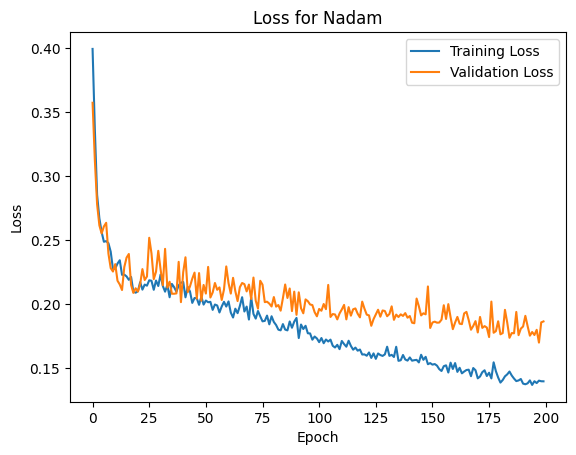

In [268]:
import ast
import json
# check nadam results for overfitting
# get the best result
best_result_Nadam = results_df_Nadam_Final.loc[results_df_Nadam_Final['fscore'].idxmax()]
best_result

# load history
# history_str = best_result_Nadam['history']
# # history = ast.literal_eval(history_str)
# history = json.loads(history_str)

history1 = resultsRP[0]["history"]
history = resultsRP[0]["history"]
b_res = resultsRP[0]
# best result for nadam
for result in resultsRP:
    history = result['history']
    if min(result['fscore'], result['accuracy']) > min(b_res['fscore'], b_res['accuracy']):
        b_res = result
        history = result['history']

# # get average of training and validation loss over all results
# training_loss = []
# validation_loss = []

# for result in resultsRP:
#     history = result['history']
#     training_loss.append(history['loss'])
#     validation_loss.append(history['val_loss'])

# # get the average
# training_loss = np.mean(training_loss, axis=0)



# plot the loss
plt.plot(history['loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss for Nadam')
plt.legend()
plt.show()

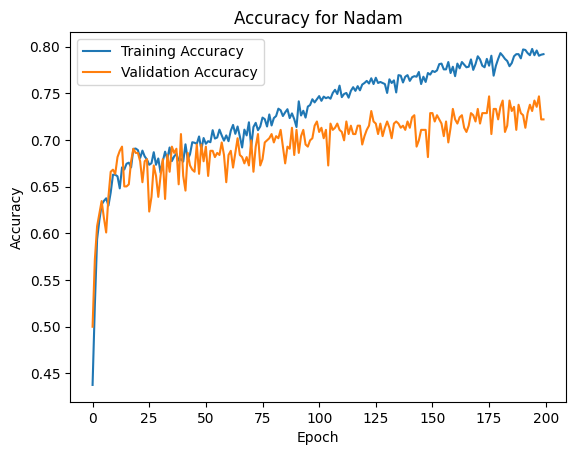

In [269]:
# plot accuracy and val accuracy
plt.plot(history['accuracy'], label='Training Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy for Nadam')
plt.legend()
plt.show()

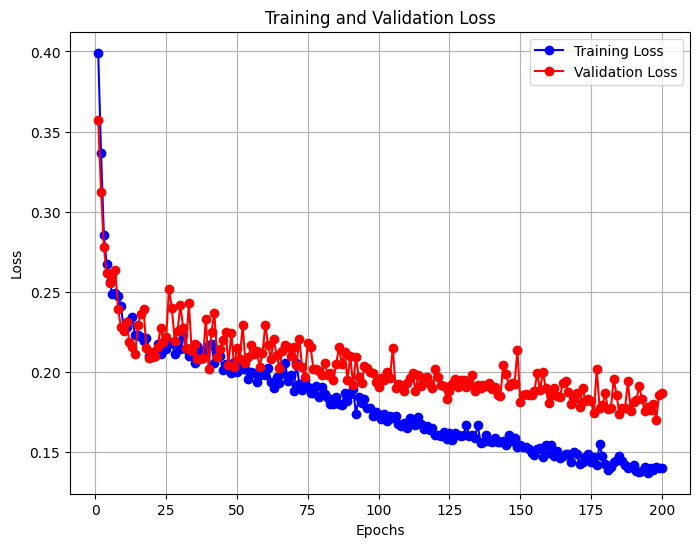

True

In [313]:
evaluate_overfitting(history, threshold=0.02, epochs_threshold=10, plot_show=True, starting_epoch=80)
# np.mean(history["loss"][100:110]) - np.mean(history["val_loss"][100:200])
# np.mean(history["val_loss"][100:110])

In [326]:
# check for overfitting or underfitting
history_arr = []
for result in resultsRP:
    history = result['history']
    history_arr.append(history)

# check for overfitting
fitting_arr = []
for history in history_arr:
    # fitting = evaluate_overfitting(history, plot_show=False, epochs_threshold=20, threshold=0.1)
    overfitting_epoch = find_overfitting_piont(history, plot_show=False, epochs_threshold=10, threshold=0.02)
    if overfitting_epoch == -1:
        fitting = False
    else:
        fitting = True
    fitting_arr.append(fitting)

# get the count of overfitting and underfitting
overfitting_count = fitting_arr.count(True)
not_overfitting_count = fitting_arr.count(False)


print(f"Overfitting: {overfitting_count}")
print(f"Not Overfitting: {not_overfitting_count}")

Overfitting: 240
Not Overfitting: 10


In [250]:
import json
import re
import numpy as np

def load_history_from_csv(history_string):
    # Step 1: Remove the entire 'f1_score' part
    cleaned_history_string = re.sub(r"'f1_score': \[<tf\.Tensor[^]]*\],.*?\],", '', history_string)

    # Step 1: Remove the entire 'f1_score' part
    cleaned_history_string = re.sub(r"'val_f1_score': \[<tf\.Tensor[^]]*\],.*?\],", '', cleaned_history_string)

    # Step 1: Remove 'tf.Tensor' mentions and just keep the numpy array part
    cleaned_history_string = re.sub(r"<tf\.Tensor[^>]*numpy=", "", cleaned_history_string)  # Remove tf.Tensor info
    cleaned_history_string = re.sub(r">", "", cleaned_history_string)  # Remove the closing '>'
    
    # Step 2: Replace numpy array structure with plain lists
    cleaned_history_string = cleaned_history_string.replace("array(", "").replace("), dtype=float32", "")
    
    # Step 3: Replace single quotes with double quotes to make it JSON-compatible
    cleaned_history_string = cleaned_history_string.replace("'", '"')
    
    # Step 4: Ensure any commas between arrays are correct
    cleaned_history_string = re.sub(r'\),', '],', cleaned_history_string)  # Fix array endings
    
    # Step 5: Load as JSON
    try:
        history_dict = json.loads(cleaned_history_string)
    except json.JSONDecodeError as e:
        print(f"JSONDecodeError: {e}")
        return None
    
    # Convert lists back to numpy arrays if needed
    for key, value in history_dict.items():
        # If the values are lists that were numpy arrays, convert them back
        if isinstance(value[0], list):
            history_dict[key] = [np.array(v) for v in value]
    
    return history_dict

# Example usage
history_string = "{'accuracy': [0.44781145453453064, 0.5280583500862122, 0.5914702415466309], 'val_accuracy': [0.5336322784423828, 0.5381165742874146, 0.6031390428543091], 'val_loss': [0.9762668609619141, 0.9163101315498352, 0.8051180243492126]}"
history_string2 = "{'accuracy': [0.4528619647026062, 0.537598192691803, 0.5897867679595947], 'f1_score': [<tf.Tensor: shape=(3,), dtype=float32, numpy=array([0.5072587 , 0.40178564, 0.44776115], dtype=float32)>, <tf.Tensor: shape=(3,), dtype=float32, numpy=array([0.61925405, 0.44976956, 0.5384615 ], dtype=float32)>, <tf.Tensor: shape=(3,), dtype=float32, numpy=array([0.7020905 , 0.5260503 , 0.54649264], dtype=float32)>], 'loss': [0.20886024832725525, 0.1889471709728241, 0.17299622297286987], 'val_accuracy': [0.5515695214271545, 0.560538113117218, 0.6008968353271484], 'val_f1_score': [<tf.Tensor: shape=(3,), dtype=float32, numpy=array([0.6072607 , 0.49999994, 0.5454545 ], dtype=float32)>, <tf.Tensor: shape=(3,), dtype=float32, numpy=array([0.6618705, 0.5388889, 0.4803149], dtype=float32)>, <tf.Tensor: shape=(3,), dtype=float32, numpy=array([0.74390244, 0.5448504 , 0.48669198], dtype=float32)>], 'val_loss': [0.1954929381608963, 0.18205764889717102, 0.16593743860721588]}"

history = load_history_from_csv(history_string)
print(history)


{'accuracy': [0.44781145453453064, 0.5280583500862122, 0.5914702415466309], 'val_accuracy': [0.5336322784423828, 0.5381165742874146, 0.6031390428543091], 'val_loss': [0.9762668609619141, 0.9163101315498352, 0.8051180243492126]}


###### 4.2.1.2.3. Conclusion

Some overfitting is present in the model, but it is not significant. The model is able to generalise well to the test data.
Learning rate has a significant effect on the model's performance.
Beta_1, Beta_2, loss function and hidden layer activation function have a moderate effect on the model's performance.
Epsilon has very little effect on the model's performance.

##### 4.2.1.3. Hybrid Optimizer and Grid Search

###### 4.2.1.3.1. Setup

In [259]:
import json

def target_function_H_Op(
    model, 
    X, 
    y, 
    name, 
    results,
    progress_bar,
    patience=10, 
    min_delta=0.01, 
    seed=42, 
    test_size=0.2, 
    batch_size=32, 
    epochs=165, 
    callbacks=[CustomCallback()],
    result_extra_details=None,
):
    result = run_experiment(model, X, y, name, patience=patience, min_delta=min_delta, epochs=epochs, seed=seed, batch_size=batch_size, test_size=test_size, callbacks=callbacks)
    if result_extra_details is not None:
        for key, value in result_extra_details.items():
            result[key] = value

    history = result['history']

    loss_history = history['loss']
    val_loss_history = history['val_loss']
    accuracy_history = history['accuracy']
    val_accuracy_history = history['val_accuracy']

    # history_str = json.dumps(history)

    # result['history_json_str'] = history_str
    result['loss_history'] = loss_history
    result['val_loss_history'] = val_loss_history
    result['accuracy_history'] = accuracy_history
    result['val_accuracy_history'] = val_accuracy_history

    results.append(result)
    progress_bar.update(1)  # Update the progress bar

    return result

In [351]:
# run the experiment for Hybrid optimizer
# Run the experiment 10 times concurrently for each dataset
# run grid search for loss, hidden_activation, optimizer_weighting
results = []
threads = []
model_history = []

best_model = {
    'model': None,
    'accuracy': 0,
    'fscore': 0,
    'value_score' : 0,
    'name': '',
    'history': None,
    'loss': None,
    'val_loss': None,
    'accuracy': None,
    'val_accuracy': None
}

y = yF
X = XF

# load top 10 results for RProp and Nadam
top_10_results_RProp_avg = pd.read_csv('expr/final/top_10_results_RProp_avg.csv')
top_10_results_Nadam_avg = pd.read_csv('expr/final/top_10_results_Nadam_avg.csv')

starting_hidden_layer_size = 64
number_hidden_layers = 4
batch_size = 8
test_size = 0.2
epochs = 50 # 200
patience = 10
min_delta = 0.01 # 0.01

output_layer_activation = 'softmax'
# from top 10 results nadam
learning_rate = top_10_results_Nadam_avg['learning_rate'][0]
beta_1 = top_10_results_Nadam_avg['beta_1'][0]
beta_2 = top_10_results_Nadam_avg['beta_2'][0]
epsilon = top_10_results_Nadam_avg['epsilon'][0]

# from top 10 results RProp
initial_step_size = top_10_results_RProp_avg['initial_step_size'][0]
increment_factor = top_10_results_RProp_avg['increment_factor'][0]
decrement_factor = top_10_results_RProp_avg['decrement_factor'][0]
min_step_size = top_10_results_RProp_avg['min_step_size'][0]
max_step_size = top_10_results_RProp_avg['max_step_size'][0]

max_threads = 5

# Grid search for loss, hidden_activation, optimizer_weighting
loss_ops = ['categorical_crossentropy', 'mean_squared_error']
hidden_layer_activation_ops = ['relu', 'tanh', 'sigmoid']
optimizer_update_weight_ops = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]


num_tests = 10 # tests per parameter set
num_param_combinations = len(loss_ops)*len(hidden_layer_activation_ops)*len(optimizer_update_weight_ops)
total_runs = num_tests*num_param_combinations
progress_bar = notebook.tqdm(total=total_runs*2+total_runs*epochs, desc='Overall Progress', dynamic_ncols=True, leave=True)

count = 0
subcount = 0
for loss in loss_ops:
    for hidden_layer_activation in hidden_layer_activation_ops:
        for optimizer_update_weight in optimizer_update_weight_ops:
            subcount += 1
            for j in range(num_tests):
                count += 1
                # name=f'param_search{subcount}:run{count}'
                test_number = j
                seed = np.random.randint(0, 1000)

                # combo name: index(hidden_layer_activation_ops) _ index(loss_ops) _ index(optimizer_update_weight_ops)
                index_1 = hidden_layer_activation_ops.index(hidden_layer_activation)
                index_2 = loss_ops.index(loss)
                index_3 = optimizer_update_weight_ops.index(optimizer_update_weight)
                combo_str = f'{index_1}_{index_2}_{index_3}'

                name=f'param_search-{combo_str}:run{count}'

                optimizer = CustomHybridOptimizer(
                    learning_rate=learning_rate, 
                    beta_1=beta_1, 
                    beta_2=beta_2, 
                    epsilon=epsilon,
                    initial_step_size=initial_step_size,
                    increment_factor=increment_factor,
                    decrement_factor=decrement_factor,
                    min_step_size=min_step_size,
                    max_step_size=max_step_size,
                    optimizer_update_weight=optimizer_update_weight
                )

                input_shape = (X.shape[1],)
                output_shape = y.shape[1]
                model = create_pyramid_model_v2(starting_hidden_layer_size, number_hidden_layers, input_shape, output_shape, metrics=['accuracy', 'f1_score'], optimizer=optimizer, loss=loss, hidden_activation=hidden_layer_activation, output_activation=output_layer_activation)

                model_temp = {
                    'model': model,
                    'name': name,
                }
                model_history.append(model_temp)

                # callbacks
                custom_callback = CustomCallback(patience=patience, min_delta=min_delta)
                tqdm_callback = TQDMProgressBar()
                tqdm_callback.set_custom_name(name)
                callbacks = [custom_callback, tqdm_callback, tf_progress_bar_updater(progress_bar, subcount=epochs)]

                results_extra_details = {
                    'starting_hidden_layer_size': starting_hidden_layer_size,
                    'number_hidden_layers': number_hidden_layers,
                    'hidden_layer_activation': hidden_layer_activation,
                    'output_activation': output_layer_activation,
                    'learning_rate': learning_rate,
                    'beta_1': beta_1,
                    'beta_2': beta_2,
                    'epsilon': epsilon,
                    'initial_step_size': initial_step_size,
                    'increment_factor': increment_factor,
                    'decrement_factor': decrement_factor,
                    'min_step_size': min_step_size,
                    'max_step_size': max_step_size,
                    'optimizer_update_weight': optimizer_update_weight,
                    'loss': loss,
                    'batch_size': batch_size,
                    'epochs': epochs,
                    'patience': patience,
                    'min_delta': min_delta,
                    'seed': seed,
                    'test_number': test_number,
                    'test_size': test_size,
                }

                thread = threading.Thread(target=target_function_H_Op, args=(model, X, y, name, results, progress_bar, patience, min_delta, seed, test_size, batch_size, epochs, callbacks, results_extra_details))
                thread.start()
                threads.append(thread)

                progress_bar.update(1)  # Update the progress bar

                if len(threads) >= max_threads or count == total_runs:
                    for thread in threads:
                        thread.join()
                    threads = []

                    # update the best model
                    for model_x_T in model_history:
                        name_x = model_x_T['name']
                        model_x = model_x_T['model']

                        # get the result with the same name
                        result_x = next((item for item in results if item["name"] == name_x), None)

                        if result_x is not None:
                            min_accuracy_f_score = min(result_x['accuracy'], result_x['fscore'])
                            
                            if min_accuracy_f_score > best_model['value_score']:
                                best_model['model'] = model
                                best_model['value_score'] = min_accuracy_f_score
                                best_model['accuracy'] = result['accuracy']
                                best_model['fscore'] = result['fscore']
                                best_model['name'] = name
                                best_model['history'] = result['history']
                                best_model['loss'] = result['loss_history']
                                best_model['val_loss'] = result['val_loss_history']
                                best_model['accuracy'] = result['accuracy_history']
                                best_model['val_accuracy'] = result['val_accuracy_history']
                                best_model['hidden_layer_activation'] = hidden_layer_activation
                                best_model['loss'] = loss
                                best_model['optimizer_update_weight'] = optimizer_update_weight
                                best_model['test_number'] = test_number
                        
                        

                    # backup results
                    if count % 10 == 0:
                        results_df_H_Op = pd.DataFrame(results)
                        results_df_H_Op.to_csv('expr/final/H_bak2/results_H_Op_GS2.csv')
                        # save joblib
                        joblib.dump(results, 'expr/final/H_bak2/results_H_Op_GS2.pkl')
                        # save the best model
                        joblib.dump(best_model, 'expr/final/H_bak2/best_model_H_Op_GS2.pkl')



print (threads)

# save the results joblib
joblib.dump(results, 'expr/final/results_H_Op_GS2.pkl')

# save the results
results_df_H_Op = pd.DataFrame(results)
results_df_H_Op.to_csv('expr/final/results_H_Op_GS2.csv')

progress_bar.refresh()
progress_bar.close()

Overall Progress:   0%|          | 0/28080 [00:00<?, ?it/s]

param_search-0_0_0:run1 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_0:run2 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_0:run3 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_0:run4 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_0:run5 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


param_search-0_0_0:run6 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_0:run7 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_0:run8 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_0:run9 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_0:run10 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_0_1:run11 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_1:run12 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_1:run13 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_1:run14 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_1:run15 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_0_1:run16 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_1:run17 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_1:run18 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_1:run19 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_1:run20 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


param_search-0_0_2:run21 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_2:run22 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_2:run23 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_2:run24 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_2:run25 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_0_2:run26 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_2:run27 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_2:run28 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_2:run29 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_2:run30 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


param_search-0_0_3:run31 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_3:run32 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_3:run33 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_3:run34 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_3:run35 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_0_3:run36 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_3:run37 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_3:run38 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_3:run39 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_3:run40 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_0_4:run41 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_4:run42 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_4:run43 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_4:run44 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_4:run45 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


param_search-0_0_4:run46 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_4:run47 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_4:run48 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_4:run49 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_4:run50 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_0_5:run51 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_5:run52 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_5:run53 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_5:run54 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_5:run55 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_0_5:run56 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_5:run57 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_5:run58 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_5:run59 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_5:run60 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_0_6:run61 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_6:run62 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_6:run63 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_6:run64 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_6:run65 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


KeyboardInterrupt: 

Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


Other Extra heatmaps

In [377]:
# run the experiment for RProp optimizer and Nadam optimizer
results = []
threads = []
model_history = []

best_model = {
    'model': None,
    'accuracy': 0,
    'fscore': 0,
    'value_score' : 0,
    'name': '',
    'history': None,
    'loss': None,
    'val_loss': None,
    'accuracy': None,
    'val_accuracy': None
}

y = yF
X = XF

# load top 10 results for RProp and Nadam
top_10_results_RProp_avg = pd.read_csv('expr/final/top_10_results_RProp_avg.csv')
top_10_results_Nadam_avg = pd.read_csv('expr/final/top_10_results_Nadam_avg.csv')

starting_hidden_layer_size = 64
number_hidden_layers = 4
batch_size = 8
test_size = 0.2
epochs = 50
patience = 10
min_delta = 0.01 # 0.01

loss = 'categorical_crossentropy'
optimizer_update_weight = 0.85

output_layer_activation = 'softmax'
# from top 10 results nadam
learning_rate = top_10_results_Nadam_avg['learning_rate'][0]
beta_1 = top_10_results_Nadam_avg['beta_1'][0]
beta_2 = top_10_results_Nadam_avg['beta_2'][0]
epsilon = top_10_results_Nadam_avg['epsilon'][0]

# from top 10 results RProp
initial_step_size = top_10_results_RProp_avg['initial_step_size'][0]
increment_factor = top_10_results_RProp_avg['increment_factor'][0]
decrement_factor = top_10_results_RProp_avg['decrement_factor'][0]
min_step_size = top_10_results_RProp_avg['min_step_size'][0]
max_step_size = top_10_results_RProp_avg['max_step_size'][0]

max_threads = 5

# Grid search for hidden_activation, batch_size
hidden_layer_activation_ops = ['relu', 'tanh', 'sigmoid']
batch_size_ops = [8, 16, 64]
optimizer_ops = ['RProp', 'Nadam', 'Hybrid']


num_tests = 10 # tests per parameter set
num_param_combinations = len(loss_ops)*len(hidden_layer_activation_ops)*len(optimizer_update_weight_ops)
total_runs = num_tests*num_param_combinations
progress_bar = notebook.tqdm(total=total_runs*2+total_runs*epochs, desc='Overall Progress', dynamic_ncols=True, leave=True)

count = 0
subcount = 0
for optimizer_name in optimizer_ops:
    for hidden_layer_activation in hidden_layer_activation_ops:
        for batch_size in batch_size_ops:
            subcount += 1
            for j in range(num_tests):
                count += 1
                # name=f'param_search{subcount}:run{count}'
                test_number = j
                seed = np.random.randint(0, 1000)

                # combo name: index(hidden_layer_activation_ops) _ index(batch_size_ops) _ index(optimizer_ops)
                index_1 = hidden_layer_activation_ops.index(hidden_layer_activation)
                index_2 = batch_size_ops.index(batch_size)
                index_3 = optimizer_ops.index(optimizer_name)
                combo_str = f'{index_1}_{index_2}_{index_3}'
                combo_str_small = f'{index_1}_{index_2}'

                name=f'param_search-{combo_str}:run{count}'

                name_small=f'param_search-{combo_str_small}'

                if optimizer_name == 'RProp':
                    optimizer = CustomRPropOptimizer(
                        initial_step_size=initial_step_size,
                        increment_factor=increment_factor,
                        decrement_factor=decrement_factor,
                        min_step_size=min_step_size,
                        max_step_size=max_step_size
                    )
                elif optimizer_name == 'Nadam':
                    optimizer = CustomNadamOptimizer(
                        learning_rate=learning_rate, 
                        beta_1=beta_1, 
                        beta_2=beta_2, 
                        epsilon=epsilon
                    )
                else:
                    optimizer = CustomHybridOptimizer(
                        learning_rate=learning_rate, 
                        beta_1=beta_1, 
                        beta_2=beta_2, 
                        epsilon=epsilon,
                        initial_step_size=initial_step_size,
                        increment_factor=increment_factor,
                        decrement_factor=decrement_factor,
                        min_step_size=min_step_size,
                        max_step_size=max_step_size,
                        optimizer_update_weight=optimizer_update_weight
                    )

                input_shape = (X.shape[1],)
                output_shape = y.shape[1]
                model = create_pyramid_model_v2(starting_hidden_layer_size, number_hidden_layers, input_shape, output_shape, metrics=['accuracy', 'f1_score'], optimizer=optimizer, loss=loss, hidden_activation=hidden_layer_activation, output_activation=output_layer_activation)

                model_temp = {
                    'model': model,
                    'name': name,
                    'name_small': name_small
                }
                model_history.append(model_temp)

                # callbacks
                custom_callback = CustomCallback(patience=patience, min_delta=min_delta)
                tqdm_callback = TQDMProgressBar()
                tqdm_callback.set_custom_name(name)
                callbacks = [custom_callback, tqdm_callback, tf_progress_bar_updater(progress_bar, subcount=epochs)]

                results_extra_details = {
                    'starting_hidden_layer_size': starting_hidden_layer_size,
                    'number_hidden_layers': number_hidden_layers,
                    'hidden_layer_activation': hidden_layer_activation,
                    'output_activation': output_layer_activation,
                    'learning_rate': learning_rate,
                    'beta_1': beta_1,
                    'beta_2': beta_2,
                    'epsilon': epsilon,
                    'initial_step_size': initial_step_size,
                    'increment_factor': increment_factor,
                    'decrement_factor': decrement_factor,
                    'min_step_size': min_step_size,
                    'max_step_size': max_step_size,
                    'optimizer_update_weight': optimizer_update_weight,
                    'loss': loss,
                    'batch_size': batch_size,
                    'epochs': epochs,
                    'patience': patience,
                    'min_delta': min_delta,
                    'seed': seed,
                    'test_number': test_number,
                    'test_size': test_size,
                    'optimizer': optimizer_name,
                    'name_small': name_small
                }

                thread = threading.Thread(target=target_function_H_Op, args=(model, X, y, name, results, progress_bar, patience, min_delta, seed, test_size, batch_size, epochs, callbacks, results_extra_details))
                thread.start()
                threads.append(thread)

                progress_bar.update(1)  # Update the progress bar

                if len(threads) >= max_threads or count == total_runs:
                    for thread in threads:
                        thread.join()
                    threads = []

                    # update the best model
                    for model_x_T in model_history:
                        name_x = model_x_T['name']
                        model_x = model_x_T['model']

                        # get the result with the same name
                        result_x = next((item for item in results if item["name"] == name_x), None)

                        if result_x is not None:
                            min_accuracy_f_score = min(result_x['accuracy'], result_x['fscore'])
                            
                            if min_accuracy_f_score > best_model['value_score']:
                                best_model['model'] = model
                                best_model['value_score'] = min_accuracy_f_score
                                best_model['accuracy'] = result['accuracy']
                                best_model['fscore'] = result['fscore']
                                best_model['name'] = name
                                best_model['history'] = result['history']
                                best_model['loss'] = result['loss_history']
                                best_model['val_loss'] = result['val_loss_history']
                                best_model['accuracy'] = result['accuracy_history']
                                best_model['val_accuracy'] = result['val_accuracy_history']
                                best_model['hidden_layer_activation'] = hidden_layer_activation
                                best_model['loss'] = loss
                                best_model['optimizer_update_weight'] = optimizer_update_weight
                                best_model['test_number'] = test_number
                        
                        

                    # backup results
                    if count % 10 == 0:
                        results_df_H_Op = pd.DataFrame(results)
                        results_df_H_Op.to_csv('expr/final/heatmap_extra/H_bak2/results_HM_Ha_Bs_RpNdH.csv')
                        # save joblib
                        joblib.dump(results, 'expr/final/heatmap_extra/H_bak2/results_HM_Ha_Bs_RpNdH.pkl')
                        # save the best model
                        joblib.dump(best_model, 'expr/final/heatmap_extra/H_bak2/best_model_HM_Ha_Bs_RpNdH2.pkl')



print (threads)

# save the results joblib
joblib.dump(results, 'expr/final/heatmap_extra/results_HM_Ha_Bs_RpNdH.pkl')

# save the results
results_df_H_Op = pd.DataFrame(results)
results_df_H_Op.to_csv('expr/final/heatmap_extra/results_HM_Ha_Bs_RpNdH.csv')

# save the best model
joblib.dump(best_model, 'expr/final/heatmap_extra/best_model_HM_Ha_Bs_RpNdH.pkl')

progress_bar.refresh()
progress_bar.close()

Overall Progress:   0%|          | 0/28080 [00:00<?, ?it/s]

param_search-0_0_0:run1 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_0:run2 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_0:run3 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_0:run4 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_0:run5 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/stepRestoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


param_search-0_0_0:run6 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_0:run7 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_0:run8 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_0:run9 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_0:run10 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_1_0:run11 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_0:run12 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_0:run13 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_0:run14 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_0:run15 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


param_search-0_1_0:run16 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_0:run17 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_0:run18 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_0:run19 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_0:run20 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


param_search-0_2_0:run21 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_0:run22 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_0:run23 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_0:run24 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_0:run25 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_2_0:run26 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_0:run27 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_0:run28 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_0:run29 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_0:run30 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/stepEpoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-1_0_0:run31 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_0:run32 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_0:run33 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_0:run34 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_0:run35 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-1_0_0:run36 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_0:run37 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_0:run38 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_0:run39 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_0:run40 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-1_1_0:run41 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_0:run42 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_0:run43 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_0:run44 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_0:run45 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


param_search-1_1_0:run46 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_0:run47 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_0:run48 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_0:run49 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_0:run50 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-1_2_0:run51 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_0:run52 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_0:run53 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_0:run54 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_0:run55 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-1_2_0:run56 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_0:run57 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_0:run58 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_0:run59 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_0:run60 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


param_search-2_0_0:run61 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_0:run62 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_0:run63 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_0:run64 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_0:run65 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-2_0_0:run66 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_0:run67 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_0:run68 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_0:run69 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_0:run70 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-2_1_0:run71 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_0:run72 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_0:run73 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_0:run74 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_0:run75 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


param_search-2_1_0:run76 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_0:run77 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_0:run78 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_0:run79 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_0:run80 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-2_2_0:run81 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_0:run82 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_0:run83 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_0:run84 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_0:run85 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Epoch 34: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.Restoring model weights from the end of the best epoch.

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


param_search-2_2_0:run86 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_0:run87 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_0:run88 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_0:run89 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_0:run90 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Epoch 38: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_0_1:run91 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_1:run92 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_1:run93 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_1:run94 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_1:run95 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_0_1:run96 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_1:run97 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_1:run98 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_1:run99 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_1:run100 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_1_1:run101 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_1:run102 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_1:run103 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_1:run104 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_1:run105 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_1_1:run106 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_1:run107 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_1:run108 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_1:run109 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_1:run110 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_2_1:run111 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_1:run112 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_1:run113 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_1:run114 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_1:run115 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_2_1:run116 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_1:run117 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_1:run118 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_1:run119 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_1:run120 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-1_0_1:run121 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_1:run122 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_1:run123 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_1:run124 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_1:run125 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-1_0_1:run126 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_1:run127 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_1:run128 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_1:run129 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_1:run130 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-1_1_1:run131 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_1:run132 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_1:run133 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_1:run134 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_1:run135 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


param_search-1_1_1:run136 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_1:run137 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_1:run138 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_1:run139 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_1:run140 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-1_2_1:run141 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_1:run142 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_1:run143 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_1:run144 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_1:run145 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-1_2_1:run146 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_1:run147 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_1:run148 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_1:run149 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_1:run150 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Epoch 23: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-2_0_1:run151 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_1:run152 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_1:run153 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_1:run154 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_1:run155 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-2_0_1:run156 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_1:run157 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_1:run158 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_1:run159 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_1:run160 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
 1/18 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-2_1_1:run161 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_1:run162 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_1:run163 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_1:run164 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_1:run165 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


param_search-2_1_1:run166 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_1:run167 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_1:run168 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_1:run169 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_1:run170 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-2_2_1:run171 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_1:run172 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_1:run173 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_1:run174 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_1:run175 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Epoch 23: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 32: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-2_2_1:run176 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_1:run177 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_1:run178 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_1:run179 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_1:run180 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Epoch 25: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Epoch 26: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Epoch 48: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_0_2:run181 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_2:run182 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_2:run183 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_2:run184 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_2:run185 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


param_search-0_0_2:run186 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_2:run187 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_2:run188 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_2:run189 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-0_0_2:run190 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_1_2:run191 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_2:run192 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_2:run193 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_2:run194 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_2:run195 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Epoch 12: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_1_2:run196 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_2:run197 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_2:run198 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_2:run199 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-0_1_2:run200 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_2_2:run201 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_2:run202 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_2:run203 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_2:run204 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_2:run205 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-0_2_2:run206 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_2:run207 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_2:run208 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_2:run209 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-0_2_2:run210 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Epoch 9: Early stopping
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/stepEpoch 14: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-1_0_2:run211 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_2:run212 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_2:run213 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_2:run214 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_2:run215 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-1_0_2:run216 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_2:run217 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_2:run218 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_2:run219 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-1_0_2:run220 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


param_search-1_1_2:run221 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_2:run222 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_2:run223 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_2:run224 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_2:run225 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


param_search-1_1_2:run226 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_2:run227 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_2:run228 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_2:run229 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-1_1_2:run230 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-1_2_2:run231 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_2:run232 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_2:run233 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_2:run234 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_2:run235 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Epoch 43: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-1_2_2:run236 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_2:run237 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_2:run238 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_2:run239 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-1_2_2:run240 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-2_0_2:run241 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_2:run242 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_2:run243 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_2:run244 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_2:run245 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-2_0_2:run246 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_2:run247 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_2:run248 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_2:run249 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

param_search-2_0_2:run250 Training Progress:   0%|          | 0/11150 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/stepRestoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-2_1_2:run251 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_2:run252 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_2:run253 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_2:run254 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_2:run255 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-2_1_2:run256 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_2:run257 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_2:run258 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_2:run259 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

param_search-2_1_2:run260 Training Progress:   0%|          | 0/5600 [00:00<?, ?it/s]

Epoch 30: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-2_2_2:run261 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_2:run262 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_2:run263 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_2:run264 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_2:run265 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Epoch 29: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Epoch 35: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Epoch 33: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


param_search-2_2_2:run266 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_2:run267 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_2:run268 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_2:run269 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

param_search-2_2_2:run270 Training Progress:   0%|          | 0/1400 [00:00<?, ?it/s]

Restoring model weights from the end of the best epoch.
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
[]


In [264]:
# optuna study grid search
results = []
best_model = {
    'model': None,
    'accuracy': 0,
    'fscore': 0,
    'value_score' : 0,
    'name': '',
    'history': None,
    'loss': None,
    'val_loss': None,
    'accuracy': None,
    'val_accuracy': None
}

best_model['accuracy'] = 0
best_model['fscore'] = 0

X = XF
y = yF

# Grid search for loss, hidden_activation, optimizer_weighting
loss_ops = ['categorical_crossentropy', 'mean_squared_error']
hidden_layer_activation_ops = ['relu', 'tanh', 'sigmoid']
optimizer_update_weight_ops = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

epochs = 165

num_tests = 10 # tests per parameter set
num_param_combinations = len(loss_ops)*len(hidden_layer_activation_ops)*len(optimizer_update_weight_ops)
total_runs = num_tests*num_param_combinations
progress_bar = notebook.tqdm(total=total_runs*2+total_runs*epochs, desc='Overall Progress', dynamic_ncols=True, leave=True)

# test ops from num tests
test_ops = list(range(num_tests))

num_trials = total_runs

count = 0
subcount = 0

def objective(trial):
    global count
    global results
    global progress_bar
    global epochs
    global X
    global y
    global hidden_layer_activation_ops
    global loss_ops
    global optimizer_update_weight_ops
    global test_ops
    global best_model


    # load top 10 results for RProp and Nadam
    top_10_results_RProp_avg = pd.read_csv('expr/final/top_10_results_RProp_avg.csv')
    top_10_results_Nadam_avg = pd.read_csv('expr/final/top_10_results_Nadam_avg.csv')

    starting_hidden_layer_size = 64
    number_hidden_layers = 4
    batch_size = 8
    test_size = 0.2
    patience = 10
    min_delta = 0.01 # 0.01

    output_layer_activation = 'softmax'
    # from top 10 results nadam
    learning_rate = top_10_results_Nadam_avg['learning_rate'][0]
    beta_1 = top_10_results_Nadam_avg['beta_1'][0]
    beta_2 = top_10_results_Nadam_avg['beta_2'][0]
    epsilon = top_10_results_Nadam_avg['epsilon'][0]

    # from top 10 results RProp
    initial_step_size = top_10_results_RProp_avg['initial_step_size'][0]
    increment_factor = top_10_results_RProp_avg['increment_factor'][0]
    decrement_factor = top_10_results_RProp_avg['decrement_factor'][0]
    min_step_size = top_10_results_RProp_avg['min_step_size'][0]
    max_step_size = top_10_results_RProp_avg['max_step_size'][0]

    # suggested hyperparameters
    hidden_layer_activation = trial.suggest_categorical('hidden_layer_activation', hidden_layer_activation_ops)
    loss = trial.suggest_categorical('loss', loss_ops)
    optimizer_update_weight = trial.suggest_categorical('optimizer_update_weight', optimizer_update_weight_ops)
    test_number = trial.suggest_categorical('test_number', test_ops)
    
    count += 1

    # combo name: index(hidden_layer_activation_ops) _ index(loss_ops) _ index(optimizer_update_weight_ops)
    index_1 = hidden_layer_activation_ops.index(hidden_layer_activation)
    index_2 = loss_ops.index(loss)
    index_3 = optimizer_update_weight_ops.index(optimizer_update_weight)
    combo_str = f'{index_1}_{index_2}_{index_3}'

    name=f'param_search-{combo_str}:run{count}'
    seed = np.random.randint(0, 1000)

    optimizer = CustomHybridOptimizer(
        learning_rate=learning_rate, 
        beta_1=beta_1, 
        beta_2=beta_2, 
        epsilon=epsilon,
        initial_step_size=initial_step_size,
        increment_factor=increment_factor,
        decrement_factor=decrement_factor,
        min_step_size=min_step_size,
        max_step_size=max_step_size,
        optimizer_update_weight=optimizer_update_weight
    )

    input_shape = (X.shape[1],)
    output_shape = y.shape[1]
    model = create_pyramid_model_v2(starting_hidden_layer_size, number_hidden_layers, input_shape, output_shape, metrics=['accuracy', 'f1_score'], optimizer=optimizer, loss=loss, hidden_activation=hidden_layer_activation, output_activation=output_layer_activation)

    # callbacks
    custom_callback = CustomCallback(patience=patience, min_delta=min_delta)
    callbacks = [custom_callback, tf_progress_bar_updater(progress_bar, subcount=epochs)]

    results_extra_details = {
        'starting_hidden_layer_size': starting_hidden_layer_size,
        'number_hidden_layers': number_hidden_layers,
        'hidden_layer_activation': hidden_layer_activation,
        'output_activation': output_layer_activation,
        'learning_rate': learning_rate,
        'beta_1': beta_1,
        'beta_2': beta_2,
        'epsilon': epsilon,
        'initial_step_size': initial_step_size,
        'increment_factor': increment_factor,
        'decrement_factor': decrement_factor,
        'min_step_size': min_step_size,
        'max_step_size': max_step_size,
        'optimizer_update_weight': optimizer_update_weight,
        'loss': loss,
        'batch_size': batch_size,
        'epochs': epochs,
        'patience': patience,
        'min_delta': min_delta,
        'seed': seed,
        'test_number': test_number,
        'test_size': test_size,
    }

    progress_bar.update(1)  # Update the progress bar

    result = target_function_H_Op(model, X, y, name, results, progress_bar, patience, min_delta, seed, test_size, batch_size, epochs, callbacks, results_extra_details)

    min_accuracy_f_score = min(result['accuracy'], result['fscore'])

    # best_model_min_accuracy_f_score = min(best_model['accuracy'], best_model['fscore'])

    # save the best model
    if min_accuracy_f_score > best_model['value_score']:
        best_model['model'] = model
        best_model['value_score'] = min_accuracy_f_score
        best_model['accuracy'] = result['accuracy']
        best_model['fscore'] = result['fscore']
        best_model['name'] = name
        best_model['history'] = result['history']
        best_model['loss'] = result['loss_history']
        best_model['val_loss'] = result['val_loss_history']
        best_model['accuracy'] = result['accuracy_history']
        best_model['val_accuracy'] = result['val_accuracy_history']
        best_model['hidden_layer_activation'] = hidden_layer_activation
        best_model['loss'] = loss
        best_model['optimizer_update_weight'] = optimizer_update_weight
        best_model['test_number'] = test_number

    # backup results
    if count % 10 == 0:
        results_df_H_Op = pd.DataFrame(results)
        results_df_H_Op.to_csv('expr/final/H_bak/results_H_Op_GS.csv')
        # save joblib
        joblib.dump(results, 'expr/final/H_bak/results_H_Op_GS.pkl')
        # save the best model
        joblib.dump(best_model, 'expr/final/H_bak/best_model_H_Op_GS.pkl')

    return min_accuracy_f_score

# Create the Optuna study
study_H_Op = optuna.create_study(sampler = optuna.samplers.GridSampler({'hidden_layer_activation': hidden_layer_activation_ops, 'loss': loss_ops, 'optimizer_update_weight': optimizer_update_weight_ops, 'test_number': test_ops}), direction='maximize')
study_H_Op.optimize(objective, n_trials=num_trials)

# Save the results
results_df_H_Op = pd.DataFrame(results)
results_df_H_Op.to_csv('expr/final/results_H_Op_GS.csv')
# Save joblib
joblib.dump(results, 'expr/final/results_H_Op_GS.pkl')

# Save the study
joblib.dump(study_H_Op, 'expr/final/study_H_Op_GS.pkl')

# Save the best model
joblib.dump(best_model, 'expr/final/best_model_H_Op_GS.pkl')




Overall Progress:   0%|          | 0/90180 [00:00<?, ?it/s]

[I 2024-10-03 22:19:52,356] A new study created in memory with name: no-name-83df4cf6-e906-4fa0-82ac-bba523b3af8e


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:20:23,121] Trial 0 finished with value: 0.7849462365591398 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 1}. Best is trial 0 with value: 0.7849462365591398.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:20:53,778] Trial 1 finished with value: 0.6763452076033514 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 1}. Best is trial 0 with value: 0.7849462365591398.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:21:26,186] Trial 2 finished with value: 0.7134829507397581 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 3}. Best is trial 0 with value: 0.7849462365591398.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:21:57,095] Trial 3 finished with value: 0.7867383512544803 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 3}. Best is trial 3 with value: 0.7867383512544803.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:22:29,783] Trial 4 finished with value: 0.7813620071684588 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 0}. Best is trial 3 with value: 0.7867383512544803.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:23:00,465] Trial 5 finished with value: 0.6844685847991967 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 6}. Best is trial 3 with value: 0.7867383512544803.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:23:33,290] Trial 6 finished with value: 0.6598924719168816 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 5}. Best is trial 3 with value: 0.7867383512544803.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:24:04,155] Trial 7 finished with value: 0.7956989247311828 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 9}. Best is trial 7 with value: 0.7956989247311828.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:24:52,054] Trial 8 finished with value: 0.6730701968318928 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 2}. Best is trial 7 with value: 0.7956989247311828.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:25:23,451] Trial 9 finished with value: 0.8171466941119838 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 0}. Best is trial 9 with value: 0.8171466941119838.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:25:56,436] Trial 10 finished with value: 0.7204301075268817 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 2}. Best is trial 9 with value: 0.8171466941119838.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:26:29,030] Trial 11 finished with value: 0.7706093189964157 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 8}. Best is trial 9 with value: 0.8171466941119838.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:26:59,857] Trial 12 finished with value: 0.684125654415077 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 5}. Best is trial 9 with value: 0.8171466941119838.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:27:33,078] Trial 13 finished with value: 0.6612903225806451 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 7}. Best is trial 9 with value: 0.8171466941119838.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:28:05,983] Trial 14 finished with value: 0.8297491039426523 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 6}. Best is trial 14 with value: 0.8297491039426523.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:28:36,909] Trial 15 finished with value: 0.7101580568850895 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 3}. Best is trial 14 with value: 0.8297491039426523.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:29:09,653] Trial 16 finished with value: 0.8369175627240143 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:29:42,300] Trial 17 finished with value: 0.7939068100358423 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:30:15,112] Trial 18 finished with value: 0.6767052558390975 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:30:46,431] Trial 19 finished with value: 0.8249166660135626 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:31:17,349] Trial 20 finished with value: 0.803466131188025 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:31:50,359] Trial 21 finished with value: 0.8100358422939068 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:32:23,178] Trial 22 finished with value: 0.6774193548387096 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Epoch 146: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:32:52,612] Trial 23 finished with value: 0.1745744624852252 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:33:24,036] Trial 24 finished with value: 0.6774193548387096 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:33:57,064] Trial 25 finished with value: 0.7813620071684588 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:34:28,274] Trial 26 finished with value: 0.7078853046594982 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:34:59,504] Trial 27 finished with value: 0.7057129421719984 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:35:30,581] Trial 28 finished with value: 0.7737363282163502 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:36:03,884] Trial 29 finished with value: 0.12496746160469353 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:36:34,782] Trial 30 finished with value: 0.7367738856750579 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:37:05,718] Trial 31 finished with value: 0.6333623561352282 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:37:36,654] Trial 32 finished with value: 0.5631419494337907 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:38:10,050] Trial 33 finished with value: 0.7706093189964157 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:38:40,644] Trial 34 finished with value: 0.8207885304659498 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Epoch 127: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:39:06,201] Trial 35 finished with value: 0.19243538954914166 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:39:36,907] Trial 36 finished with value: 0.6634721346096558 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:40:09,903] Trial 37 finished with value: 0.7652329749103942 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:40:42,587] Trial 38 finished with value: 0.729974905014883 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:41:16,418] Trial 39 finished with value: 0.6454367297605468 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:41:48,911] Trial 40 finished with value: 0.7632210634692024 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:42:21,461] Trial 41 finished with value: 0.7222222222222222 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:42:53,938] Trial 42 finished with value: 0.7562724014336918 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:43:26,772] Trial 43 finished with value: 0.6563105845264398 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


[I 2024-10-03 22:43:57,639] Trial 44 finished with value: 0.6523297491039427 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:44:30,602] Trial 45 finished with value: 0.7267709388411021 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:45:00,955] Trial 46 finished with value: 0.8143734194063373 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:45:31,591] Trial 47 finished with value: 0.697712061185754 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:46:02,079] Trial 48 finished with value: 0.6881720430107527 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Epoch 161: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:46:35,200] Trial 49 finished with value: 0.1622122992638183 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:47:06,031] Trial 50 finished with value: 0.7831541218637993 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:47:39,220] Trial 51 finished with value: 0.8172043010752689 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:48:10,214] Trial 52 finished with value: 0.6150513082564556 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:48:41,041] Trial 53 finished with value: 0.7634408602150538 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:49:11,307] Trial 54 finished with value: 0.7111905544114172 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:49:41,649] Trial 55 finished with value: 0.6612903225806451 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:50:14,360] Trial 56 finished with value: 0.7419354838709677 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:50:44,907] Trial 57 finished with value: 0.8064516129032258 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:51:15,582] Trial 58 finished with value: 0.7795698924731183 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:51:47,197] Trial 59 finished with value: 0.562188788135622 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:52:17,653] Trial 60 finished with value: 0.5775366397467401 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:52:50,075] Trial 61 finished with value: 0.6827956989247311 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:53:20,638] Trial 62 finished with value: 0.6433691756272402 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:53:53,192] Trial 63 finished with value: 0.6362007168458781 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:54:23,656] Trial 64 finished with value: 0.7096774193548387 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:54:56,051] Trial 65 finished with value: 0.7688172043010753 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:55:28,946] Trial 66 finished with value: 0.6933486618407849 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:55:59,488] Trial 67 finished with value: 0.772708918217549 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:56:31,815] Trial 68 finished with value: 0.7383512544802867 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:57:05,838] Trial 69 finished with value: 0.7849462365591398 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:57:36,365] Trial 70 finished with value: 0.7759856630824373 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:58:09,068] Trial 71 finished with value: 0.7496105716250693 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Epoch 139: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:58:36,747] Trial 72 finished with value: 0.7992831541218638 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:59:07,204] Trial 73 finished with value: 0.7078853046594982 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 22:59:37,743] Trial 74 finished with value: 0.7939068100358423 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:00:08,408] Trial 75 finished with value: 0.7616487455197133 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:00:41,091] Trial 76 finished with value: 0.7921146953405018 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:01:11,806] Trial 77 finished with value: 0.7085639965195106 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:01:44,247] Trial 78 finished with value: 0.8225806451612904 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Epoch 110: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:02:08,497] Trial 79 finished with value: 0.14100437414220407 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:02:40,976] Trial 80 finished with value: 0.7383512544802867 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:03:13,646] Trial 81 finished with value: 0.8154121863799283 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:03:46,219] Trial 82 finished with value: 0.6738172323057846 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:04:18,825] Trial 83 finished with value: 0.6594982078853047 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:04:51,295] Trial 84 finished with value: 0.8046594982078853 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:05:23,938] Trial 85 finished with value: 0.6523297491039427 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Epoch 119: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:05:46,765] Trial 86 finished with value: 0.7920229209205808 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:06:17,311] Trial 87 finished with value: 0.5136000722353244 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:06:49,598] Trial 88 finished with value: 0.7777154370010262 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:07:22,377] Trial 89 finished with value: 0.625295273418379 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:07:54,887] Trial 90 finished with value: 0.7015813752820922 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:08:27,225] Trial 91 finished with value: 0.7544802867383512 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:08:57,929] Trial 92 finished with value: 0.7025089605734767 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:09:28,766] Trial 93 finished with value: 0.6805762771882535 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:09:59,274] Trial 94 finished with value: 0.7225255337953816 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:10:31,934] Trial 95 finished with value: 0.6887399612575188 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2024-10-03 23:11:04,459] Trial 96 finished with value: 0.8082437275985663 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:11:37,082] Trial 97 finished with value: 0.8010752688172043 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:12:09,881] Trial 98 finished with value: 0.8082437275985663 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:12:44,690] Trial 99 finished with value: 0.6792114695340502 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:13:17,428] Trial 100 finished with value: 0.7685965877481595 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:13:49,724] Trial 101 finished with value: 0.5984836118252058 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:14:22,896] Trial 102 finished with value: 0.6687766110221781 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:14:53,716] Trial 103 finished with value: 0.7885304659498208 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:15:26,262] Trial 104 finished with value: 0.8136200716845878 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:15:58,505] Trial 105 finished with value: 0.8279569892473119 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:16:31,314] Trial 106 finished with value: 0.7329749103942652 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:17:04,223] Trial 107 finished with value: 0.7939068100358423 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:17:34,729] Trial 108 finished with value: 0.679584965658714 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:18:09,824] Trial 109 finished with value: 0.7078853046594982 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:18:42,261] Trial 110 finished with value: 0.7699911905474028 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:19:14,917] Trial 111 finished with value: 0.7813620071684588 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:19:45,492] Trial 112 finished with value: 0.7258064516129032 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:20:18,116] Trial 113 finished with value: 0.6594884048345296 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:20:48,610] Trial 114 finished with value: 0.7112051567328096 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:21:19,385] Trial 115 finished with value: 0.6792114695340502 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:21:49,656] Trial 116 finished with value: 0.6526664794186254 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Epoch 163: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:22:21,958] Trial 117 finished with value: 0.13496631419265603 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:22:52,570] Trial 118 finished with value: 0.7397032573040594 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:23:27,962] Trial 119 finished with value: 0.7579977098229719 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:24:00,177] Trial 120 finished with value: 0.7867383512544803 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:24:32,558] Trial 121 finished with value: 0.7652329749103942 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:25:05,298] Trial 122 finished with value: 0.6870590359571342 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:25:36,016] Trial 123 finished with value: 0.7019030560186414 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:26:06,412] Trial 124 finished with value: 0.7437275985663082 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Epoch 96: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:26:26,182] Trial 125 finished with value: 0.7706093189964157 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Epoch 137: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:26:53,640] Trial 126 finished with value: 0.6917562724014337 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:27:26,352] Trial 127 finished with value: 0.7025089605734767 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:27:58,563] Trial 128 finished with value: 0.7526881720430108 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:28:50,651] Trial 129 finished with value: 0.4822256091675903 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:29:21,800] Trial 130 finished with value: 0.6587808778154237 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Epoch 164: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:29:55,015] Trial 131 finished with value: 0.7254826115946269 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:30:25,961] Trial 132 finished with value: 0.7616487455197133 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:30:59,027] Trial 133 finished with value: 0.7123915356730877 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:31:31,773] Trial 134 finished with value: 0.7720879891111762 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:32:04,636] Trial 135 finished with value: 0.6899641577060932 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Epoch 161: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:32:36,940] Trial 136 finished with value: 0.19008709961131445 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:33:07,817] Trial 137 finished with value: 0.7903225806451613 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:33:38,536] Trial 138 finished with value: 0.7241035236812198 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:34:12,464] Trial 139 finished with value: 0.6406160706735392 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:34:44,984] Trial 140 finished with value: 0.7973281153715276 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:35:15,794] Trial 141 finished with value: 0.7059023118697082 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:35:48,690] Trial 142 finished with value: 0.15429717936730558 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:36:21,579] Trial 143 finished with value: 0.7204301075268817 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:36:52,597] Trial 144 finished with value: 0.8243727598566308 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:37:25,451] Trial 145 finished with value: 0.6861536308040074 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:37:56,303] Trial 146 finished with value: 0.7240143369175627 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:38:28,907] Trial 147 finished with value: 0.7419444688921512 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:38:59,493] Trial 148 finished with value: 0.6987423912358143 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:39:33,403] Trial 149 finished with value: 0.46914346107894495 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:40:04,078] Trial 150 finished with value: 0.45930799773069414 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Epoch 117: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:40:27,853] Trial 151 finished with value: 0.7849462365591398 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:41:00,521] Trial 152 finished with value: 0.7544802867383512 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:41:31,326] Trial 153 finished with value: 0.7598566308243727 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:42:03,708] Trial 154 finished with value: 0.7831541218637993 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:42:36,481] Trial 155 finished with value: 0.6694024640862501 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:43:09,230] Trial 156 finished with value: 0.6881720430107527 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:43:41,732] Trial 157 finished with value: 0.6467951477072023 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:44:14,485] Trial 158 finished with value: 0.7258064516129032 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:44:48,448] Trial 159 finished with value: 0.8096622880076004 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:45:18,832] Trial 160 finished with value: 0.6756272401433692 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:45:49,606] Trial 161 finished with value: 0.7885304659498208 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:46:20,281] Trial 162 finished with value: 0.7795698924731183 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:46:52,984] Trial 163 finished with value: 0.6616579926582932 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:47:25,550] Trial 164 finished with value: 0.7312242554126137 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:47:58,160] Trial 165 finished with value: 0.7652329749103942 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:48:30,710] Trial 166 finished with value: 0.7580645161290323 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:49:01,265] Trial 167 finished with value: 0.7329749103942652 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:49:31,900] Trial 168 finished with value: 0.8225806451612904 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:50:08,627] Trial 169 finished with value: 0.6576572452020457 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:50:41,602] Trial 170 finished with value: 0.6899641577060932 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:51:14,725] Trial 171 finished with value: 0.6833925909926586 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:51:45,723] Trial 172 finished with value: 0.7795698924731183 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:52:18,475] Trial 173 finished with value: 0.6881720430107527 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:52:49,255] Trial 174 finished with value: 0.5874481260577522 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:53:19,975] Trial 175 finished with value: 0.7150537634408602 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:53:52,289] Trial 176 finished with value: 0.8028673835125448 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Epoch 141: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:54:20,588] Trial 177 finished with value: 0.7777777777777778 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:54:52,874] Trial 178 finished with value: 0.7921146953405018 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:55:27,306] Trial 179 finished with value: 0.8064516129032258 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:55:58,103] Trial 180 finished with value: 0.6994378636636117 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:56:30,764] Trial 181 finished with value: 0.8315412186379928 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:57:01,267] Trial 182 finished with value: 0.5554787612876952 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:57:33,719] Trial 183 finished with value: 0.670242121314632 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:58:04,304] Trial 184 finished with value: 0.8297491039426523 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:58:36,882] Trial 185 finished with value: 0.7222222222222222 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:59:07,379] Trial 186 finished with value: 0.68892424847517 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-03 23:59:38,041] Trial 187 finished with value: 0.7455197132616488 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:00:08,494] Trial 188 finished with value: 0.7046899011500534 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:00:45,421] Trial 189 finished with value: 0.8154121863799283 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Epoch 150: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:01:15,262] Trial 190 finished with value: 0.16981367772684905 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:01:47,622] Trial 191 finished with value: 0.7806707911575381 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:02:18,146] Trial 192 finished with value: 0.41077959322520463 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:02:48,822] Trial 193 finished with value: 0.5913978494623656 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:03:19,304] Trial 194 finished with value: 0.7652329749103942 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:03:49,822] Trial 195 finished with value: 0.7580645161290323 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:04:20,398] Trial 196 finished with value: 0.6762644150924629 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:04:50,791] Trial 197 finished with value: 0.5223159652411826 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:05:23,329] Trial 198 finished with value: 0.7508960573476703 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:06:00,363] Trial 199 finished with value: 0.7813620071684588 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:06:33,068] Trial 200 finished with value: 0.6876014207801856 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:07:05,667] Trial 201 finished with value: 0.6669190881045909 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:07:38,003] Trial 202 finished with value: 0.7483748793103777 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:08:08,805] Trial 203 finished with value: 0.6937243346195826 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:08:39,488] Trial 204 finished with value: 0.709275097281089 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:09:10,147] Trial 205 finished with value: 0.7007168458781362 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:09:40,623] Trial 206 finished with value: 0.8064516129032258 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:10:11,170] Trial 207 finished with value: 0.6398969589987958 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:10:43,932] Trial 208 finished with value: 0.7682821951829644 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:11:20,985] Trial 209 finished with value: 0.7903225806451613 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Epoch 131: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:11:47,351] Trial 210 finished with value: 0.8110414808229148 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:12:17,782] Trial 211 finished with value: 0.6614915761025818 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:12:50,512] Trial 212 finished with value: 0.6714533853243531 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:13:21,125] Trial 213 finished with value: 0.7150601004400797 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Epoch 117: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:13:44,849] Trial 214 finished with value: 0.6628051642331378 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:14:17,108] Trial 215 finished with value: 0.7867383512544803 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:14:49,948] Trial 216 finished with value: 0.7283695658703513 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:15:20,374] Trial 217 finished with value: 0.7652329749103942 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:15:50,705] Trial 218 finished with value: 0.7258064516129032 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:16:44,124] Trial 219 finished with value: 0.7442748406237552 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:17:14,854] Trial 220 finished with value: 0.7759856630824373 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:17:47,297] Trial 221 finished with value: 0.7522352190778009 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:18:19,957] Trial 222 finished with value: 0.7150537634408602 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:18:52,661] Trial 223 finished with value: 0.7168458781362007 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:19:25,373] Trial 224 finished with value: 0.7401433691756273 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:19:57,823] Trial 225 finished with value: 0.7150537634408602 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:20:30,283] Trial 226 finished with value: 0.6738351254480287 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:21:02,941] Trial 227 finished with value: 0.7455271725029856 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:21:33,784] Trial 228 finished with value: 0.7921146953405018 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:22:11,458] Trial 229 finished with value: 0.8028673835125448 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:22:43,930] Trial 230 finished with value: 0.6827956989247311 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:23:14,752] Trial 231 finished with value: 0.6380825156248343 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:23:45,803] Trial 232 finished with value: 0.7611940618945842 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:24:16,553] Trial 233 finished with value: 0.7491039426523297 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:24:49,152] Trial 234 finished with value: 0.6724617151122488 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:25:21,576] Trial 235 finished with value: 0.7898527896795952 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:25:52,359] Trial 236 finished with value: 0.5951286869142415 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:26:24,762] Trial 237 finished with value: 0.7724014336917563 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Epoch 159: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:26:56,214] Trial 238 finished with value: 0.16981367772684905 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:27:32,187] Trial 239 finished with value: 0.6541218637992832 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:28:02,728] Trial 240 finished with value: 0.7132616487455197 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:28:35,114] Trial 241 finished with value: 0.7741935483870968 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:29:07,571] Trial 242 finished with value: 0.6953405017921147 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:29:38,371] Trial 243 finished with value: 0.7383512544802867 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:30:10,801] Trial 244 finished with value: 0.6943885086137438 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:30:43,073] Trial 245 finished with value: 0.7222222222222222 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:31:13,609] Trial 246 finished with value: 0.7961385273275088 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:31:45,754] Trial 247 finished with value: 0.7150537634408602 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:32:18,137] Trial 248 finished with value: 0.7849462365591398 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:32:53,883] Trial 249 finished with value: 0.7668640260823416 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:33:24,021] Trial 250 finished with value: 0.8082437275985663 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:33:54,465] Trial 251 finished with value: 0.7930101155776658 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:34:24,653] Trial 252 finished with value: 0.7644952453731912 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:34:55,159] Trial 253 finished with value: 0.7062858092464809 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:35:25,536] Trial 254 finished with value: 0.7240143369175627 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Epoch 156: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:35:56,411] Trial 255 finished with value: 0.8046594982078853 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Epoch 135: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:36:23,323] Trial 256 finished with value: 0.15429717936730558 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:36:55,709] Trial 257 finished with value: 0.6574335161698861 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:37:28,232] Trial 258 finished with value: 0.6802157860852457 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:38:04,706] Trial 259 finished with value: 0.7566423476620757 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:38:36,962] Trial 260 finished with value: 0.7204301075268817 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:39:09,320] Trial 261 finished with value: 0.7849462365591398 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:39:40,028] Trial 262 finished with value: 0.5934698498434453 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:40:12,659] Trial 263 finished with value: 0.67606751702244 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:40:45,213] Trial 264 finished with value: 0.7132616487455197 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:41:15,912] Trial 265 finished with value: 0.8133386251116954 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:41:46,235] Trial 266 finished with value: 0.6669653412297427 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:42:18,575] Trial 267 finished with value: 0.6535946455094541 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:42:49,209] Trial 268 finished with value: 0.4681231380925766 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:43:26,031] Trial 269 finished with value: 0.7867383512544803 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:43:58,784] Trial 270 finished with value: 0.7275985663082437 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:44:29,639] Trial 271 finished with value: 0.7651959265767373 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:45:02,408] Trial 272 finished with value: 0.6469534050179212 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:45:34,951] Trial 273 finished with value: 0.7114695340501792 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:46:08,009] Trial 274 finished with value: 0.6630824372759857 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:46:40,607] Trial 275 finished with value: 0.7921146953405018 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:47:13,348] Trial 276 finished with value: 0.7939068100358423 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:47:44,194] Trial 277 finished with value: 0.7311827956989247 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Epoch 155: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:48:15,106] Trial 278 finished with value: 0.7921146953405018 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:48:54,166] Trial 279 finished with value: 0.8189964157706093 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:49:27,020] Trial 280 finished with value: 0.6894795670858016 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:49:57,824] Trial 281 finished with value: 0.7419354838709677 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:50:28,687] Trial 282 finished with value: 0.7992831541218638 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:51:01,169] Trial 283 finished with value: 0.7795698924731183 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:51:31,761] Trial 284 finished with value: 0.7240143369175627 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:52:02,265] Trial 285 finished with value: 0.6899641577060932 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Epoch 73: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:52:16,753] Trial 286 finished with value: 0.767283224467199 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:52:47,367] Trial 287 finished with value: 0.7849462365591398 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:53:19,814] Trial 288 finished with value: 0.7401433691756273 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:53:56,873] Trial 289 finished with value: 0.5917560028751643 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:54:27,416] Trial 290 finished with value: 0.7508960573476703 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:54:59,570] Trial 291 finished with value: 0.7526881720430108 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:55:30,053] Trial 292 finished with value: 0.7491039426523297 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:56:00,808] Trial 293 finished with value: 0.7565311654877439 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:56:31,240] Trial 294 finished with value: 0.7724014336917563 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:57:03,803] Trial 295 finished with value: 0.7939068100358423 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:57:36,432] Trial 296 finished with value: 0.6989247311827957 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:58:09,301] Trial 297 finished with value: 0.7688172043010753 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:58:39,958] Trial 298 finished with value: 0.6153402307186309 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 00:59:30,690] Trial 299 finished with value: 0.7688172043010753 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:00:03,459] Trial 300 finished with value: 0.7706093189964157 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:00:34,014] Trial 301 finished with value: 0.7508960573476703 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:01:06,748] Trial 302 finished with value: 0.7562724014336918 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:01:37,169] Trial 303 finished with value: 0.6612903225806451 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:02:09,704] Trial 304 finished with value: 0.7795698924731183 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:02:40,383] Trial 305 finished with value: 0.5274349495143571 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:03:11,231] Trial 306 finished with value: 0.7105300303827645 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:03:41,776] Trial 307 finished with value: 0.7006270366668867 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Epoch 100: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:04:01,285] Trial 308 finished with value: 0.6702508960573477 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:04:41,077] Trial 309 finished with value: 0.7531608661506377 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Epoch 43: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:04:51,208] Trial 310 finished with value: 0.6386770149679973 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:05:22,071] Trial 311 finished with value: 0.7508960573476703 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:05:52,862] Trial 312 finished with value: 0.6136223730375411 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:06:23,625] Trial 313 finished with value: 0.7206986021055896 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:06:56,221] Trial 314 finished with value: 0.8100358422939068 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:07:29,003] Trial 315 finished with value: 0.6889374666326028 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Epoch 50: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:07:40,170] Trial 316 finished with value: 0.6392365890784614 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:08:10,796] Trial 317 finished with value: 0.6684587813620072 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:08:43,519] Trial 318 finished with value: 0.6832637535936092 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:09:20,906] Trial 319 finished with value: 0.7813620071684588 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Epoch 161: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:09:52,968] Trial 320 finished with value: 0.13641854294144437 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Epoch 83: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:10:09,484] Trial 321 finished with value: 0.6583337429586776 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:10:40,093] Trial 322 finished with value: 0.6855071832852891 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:11:10,926] Trial 323 finished with value: 0.7060931899641577 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Epoch 112: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:11:32,223] Trial 324 finished with value: 0.7634408602150538 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:12:02,981] Trial 325 finished with value: 0.6527948785943393 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:12:33,396] Trial 326 finished with value: 0.7634408602150538 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:13:03,975] Trial 327 finished with value: 0.7829386740335272 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:13:36,837] Trial 328 finished with value: 0.7059045144148411 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:14:14,549] Trial 329 finished with value: 0.7526881720430108 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:14:45,235] Trial 330 finished with value: 0.7903225806451613 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:15:16,018] Trial 331 finished with value: 0.7984968877098249 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:15:46,816] Trial 332 finished with value: 0.6519289039500679 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:16:17,639] Trial 333 finished with value: 0.6093189964157706 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:16:48,083] Trial 334 finished with value: 0.783071155936027 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:17:20,992] Trial 335 finished with value: 0.7598566308243727 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:17:51,760] Trial 336 finished with value: 0.8243727598566308 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:18:24,417] Trial 337 finished with value: 0.6702508960573477 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:18:56,781] Trial 338 finished with value: 0.6396277805538854 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:19:36,833] Trial 339 finished with value: 0.7329749103942652 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:20:09,474] Trial 340 finished with value: 0.7261106213111524 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:20:41,909] Trial 341 finished with value: 0.6720430107526881 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:21:12,373] Trial 342 finished with value: 0.683867271974857 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:21:44,690] Trial 343 finished with value: 0.7956989247311828 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:22:15,233] Trial 344 finished with value: 0.6627882988993716 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:22:45,675] Trial 345 finished with value: 0.7616487455197133 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:23:16,254] Trial 346 finished with value: 0.6738351254480287 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:23:46,982] Trial 347 finished with value: 0.704278445676824 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:24:19,391] Trial 348 finished with value: 0.832844899700542 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:24:57,840] Trial 349 finished with value: 0.6314223893798101 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:25:30,251] Trial 350 finished with value: 0.7562724014336918 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:26:02,586] Trial 351 finished with value: 0.7849462365591398 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Epoch 151: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:26:32,554] Trial 352 finished with value: 0.6527810101549633 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:27:02,906] Trial 353 finished with value: 0.7795698924731183 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:27:33,159] Trial 354 finished with value: 0.7688172043010753 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:28:05,626] Trial 355 finished with value: 0.7699002251915863 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:28:35,805] Trial 356 finished with value: 0.7759856630824373 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:29:08,284] Trial 357 finished with value: 0.7293906810035843 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:29:38,831] Trial 358 finished with value: 0.6871044949783308 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:30:19,019] Trial 359 finished with value: 0.22105246001757317 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:30:51,361] Trial 360 finished with value: 0.7580645161290323 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:31:23,621] Trial 361 finished with value: 0.7186792834884094 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:31:53,663] Trial 362 finished with value: 0.47453216034846196 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:32:24,355] Trial 363 finished with value: 0.7043010752688172 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:32:56,462] Trial 364 finished with value: 0.7777777777777778 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:33:28,821] Trial 365 finished with value: 0.6538410356425841 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:33:59,087] Trial 366 finished with value: 0.6638766453557661 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:34:31,366] Trial 367 finished with value: 0.7347670250896058 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:35:01,542] Trial 368 finished with value: 0.8214193622815329 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:35:40,083] Trial 369 finished with value: 0.7956989247311828 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Epoch 158: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:36:11,420] Trial 370 finished with value: 0.8010752688172043 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:36:41,685] Trial 371 finished with value: 0.6791073965368848 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Epoch 96: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:37:01,240] Trial 372 finished with value: 0.7885304659498208 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Epoch 127: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:37:26,326] Trial 373 finished with value: 0.7813620071684588 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:37:58,461] Trial 374 finished with value: 0.6780534369733984 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:38:28,792] Trial 375 finished with value: 0.7741463345489363 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:38:58,940] Trial 376 finished with value: 0.6612439215037738 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:39:31,198] Trial 377 finished with value: 0.6684587813620072 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:40:01,556] Trial 378 finished with value: 0.6009570227615642 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:40:56,267] Trial 379 finished with value: 0.7939068100358423 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:41:28,805] Trial 380 finished with value: 0.7759856630824373 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:41:59,182] Trial 381 finished with value: 0.7186379928315412 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:42:29,671] Trial 382 finished with value: 0.8243727598566308 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:43:00,237] Trial 383 finished with value: 0.5546007577992133 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:43:30,826] Trial 384 finished with value: 0.7884430368224644 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:44:03,466] Trial 385 finished with value: 0.6598179245703768 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:44:33,879] Trial 386 finished with value: 0.49365653350911926 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:45:04,674] Trial 387 finished with value: 0.683036976994191 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:45:37,326] Trial 388 finished with value: 0.6899641577060932 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:46:18,422] Trial 389 finished with value: 0.7562724014336918 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:46:51,164] Trial 390 finished with value: 0.7777777777777778 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:47:21,800] Trial 391 finished with value: 0.7419354838709677 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:47:52,317] Trial 392 finished with value: 0.7384360860259208 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:48:22,648] Trial 393 finished with value: 0.6322401571206124 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:48:53,227] Trial 394 finished with value: 0.6845878136200717 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:49:25,768] Trial 395 finished with value: 0.6756272401433692 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:49:58,030] Trial 396 finished with value: 0.7508960573476703 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:50:30,286] Trial 397 finished with value: 0.8010752688172043 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:51:02,693] Trial 398 finished with value: 0.7240143369175627 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:51:41,948] Trial 399 finished with value: 0.6989247311827957 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:52:12,537] Trial 400 finished with value: 0.6376845107334181 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:52:42,830] Trial 401 finished with value: 0.7795698924731183 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:53:14,962] Trial 402 finished with value: 0.7491039426523297 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:53:45,043] Trial 403 finished with value: 0.7958198476213406 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:54:15,513] Trial 404 finished with value: 0.7096774193548387 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:54:45,995] Trial 405 finished with value: 0.6702508960573477 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:55:18,142] Trial 406 finished with value: 0.6987147742449352 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:55:48,822] Trial 407 finished with value: 0.7544802867383512 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:56:19,062] Trial 408 finished with value: 0.8042996967761477 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:56:58,564] Trial 409 finished with value: 0.7347670250896058 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:57:29,264] Trial 410 finished with value: 0.7508960573476703 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:57:59,985] Trial 411 finished with value: 0.6775834299964065 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:58:30,364] Trial 412 finished with value: 0.6866536618188682 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:59:02,722] Trial 413 finished with value: 0.743189344290137 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 01:59:33,141] Trial 414 finished with value: 0.6944854983360425 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:00:03,509] Trial 415 finished with value: 0.6785157184638351 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:00:33,967] Trial 416 finished with value: 0.7473118279569892 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:01:06,431] Trial 417 finished with value: 0.6487455197132617 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:01:38,803] Trial 418 finished with value: 0.6806179965073191 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:02:20,568] Trial 419 finished with value: 0.7078853046594982 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:02:52,900] Trial 420 finished with value: 0.7293906810035843 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:03:23,212] Trial 421 finished with value: 0.7655144531516787 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:03:53,643] Trial 422 finished with value: 0.6774193548387096 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:04:24,109] Trial 423 finished with value: 0.7507685778025487 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:04:54,571] Trial 424 finished with value: 0.7007168458781362 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:05:25,191] Trial 425 finished with value: 0.5698924731182796 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:05:57,381] Trial 426 finished with value: 0.7491039426523297 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:06:28,199] Trial 427 finished with value: 0.7652329749103942 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:06:58,852] Trial 428 finished with value: 0.6359824288752588 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:07:38,993] Trial 429 finished with value: 0.7258064516129032 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:08:09,566] Trial 430 finished with value: 0.6523297491039427 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:08:40,315] Trial 431 finished with value: 0.6366845620807214 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:09:10,702] Trial 432 finished with value: 0.6881720430107527 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:09:42,111] Trial 433 finished with value: 0.6523297491039427 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:10:12,295] Trial 434 finished with value: 0.6953405017921147 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:10:42,593] Trial 435 finished with value: 0.7609630705128289 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Epoch 69: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:10:56,451] Trial 436 finished with value: 0.6451612903225806 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:11:26,440] Trial 437 finished with value: 0.6559139784946236 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:11:58,714] Trial 438 finished with value: 0.6881720430107527 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Epoch 144: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:12:51,452] Trial 439 finished with value: 0.16666666666666666 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:13:22,319] Trial 440 finished with value: 0.6173545667590813 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:13:54,719] Trial 441 finished with value: 0.814707287407723 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:14:27,205] Trial 442 finished with value: 0.7974910394265233 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:14:57,795] Trial 443 finished with value: 0.6450893931692703 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:15:30,112] Trial 444 finished with value: 0.7491039426523297 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:16:02,462] Trial 445 finished with value: 0.7706093189964157 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:16:32,885] Trial 446 finished with value: 0.6344086021505376 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:17:03,346] Trial 447 finished with value: 0.803734779058369 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Epoch 132: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:17:29,814] Trial 448 finished with value: 0.14975037529277727 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:18:10,572] Trial 449 finished with value: 0.7670250896057348 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Epoch 120: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:18:34,857] Trial 450 finished with value: 0.16041385118592946 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:19:07,188] Trial 451 finished with value: 0.7132616487455197 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:19:39,433] Trial 452 finished with value: 0.7992831541218638 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:20:11,766] Trial 453 finished with value: 0.7921146953405018 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:20:42,374] Trial 454 finished with value: 0.6862478119265762 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:21:14,631] Trial 455 finished with value: 0.7186379928315412 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:21:45,016] Trial 456 finished with value: 0.6672112644480755 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:22:17,132] Trial 457 finished with value: 0.7795698924731183 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:22:47,301] Trial 458 finished with value: 0.6339026777950914 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:23:28,153] Trial 459 finished with value: 0.6559139784946236 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:23:58,777] Trial 460 finished with value: 0.7956989247311828 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:24:30,971] Trial 461 finished with value: 0.7473118279569892 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:25:03,199] Trial 462 finished with value: 0.6844994078463402 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:25:33,840] Trial 463 finished with value: 0.8279569892473119 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:26:06,058] Trial 464 finished with value: 0.7240143369175627 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:26:38,315] Trial 465 finished with value: 0.7813129146857523 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:27:10,842] Trial 466 finished with value: 0.8046594982078853 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:27:41,666] Trial 467 finished with value: 0.7562724014336918 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:28:14,297] Trial 468 finished with value: 0.7939068100358423 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:28:56,944] Trial 469 finished with value: 0.6523297491039427 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:29:29,517] Trial 470 finished with value: 0.7293906810035843 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:30:02,598] Trial 471 finished with value: 0.7437275985663082 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:30:35,555] Trial 472 finished with value: 0.7078440850330252 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Epoch 128: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:31:04,724] Trial 473 finished with value: 0.6500087140555595 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:31:36,678] Trial 474 finished with value: 0.8261648745519713 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:32:08,856] Trial 475 finished with value: 0.7974910394265233 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:32:39,165] Trial 476 finished with value: 0.708994156106403 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:33:09,495] Trial 477 finished with value: 0.7706093189964157 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:33:40,043] Trial 478 finished with value: 0.6607435406062068 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Epoch 161: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:34:22,234] Trial 479 finished with value: 0.14525457848480383 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:34:54,725] Trial 480 finished with value: 0.7045264970654844 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:35:27,242] Trial 481 finished with value: 0.6881720430107527 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:35:59,738] Trial 482 finished with value: 0.6806713579664841 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:36:30,056] Trial 483 finished with value: 0.6774193548387096 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:37:00,553] Trial 484 finished with value: 0.6720430107526881 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Epoch 141: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:37:28,513] Trial 485 finished with value: 0.16888864344737747 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:37:59,092] Trial 486 finished with value: 0.8024377402740168 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:38:29,935] Trial 487 finished with value: 0.7019520899286518 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:39:00,483] Trial 488 finished with value: 0.7841428747991596 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:39:43,588] Trial 489 finished with value: 0.6863799283154122 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:40:15,995] Trial 490 finished with value: 0.7867383512544803 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:40:48,199] Trial 491 finished with value: 0.7831541218637993 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:41:18,516] Trial 492 finished with value: 0.7044721942982888 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:41:48,779] Trial 493 finished with value: 0.7222222222222222 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:42:21,029] Trial 494 finished with value: 0.688330872086283 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:42:53,081] Trial 495 finished with value: 0.7813620071684588 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:43:23,291] Trial 496 finished with value: 0.8046594982078853 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:43:53,589] Trial 497 finished with value: 0.6674572057438339 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:44:23,864] Trial 498 finished with value: 0.6315020652884518 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:45:05,191] Trial 499 finished with value: 0.7260030718549397 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:45:35,556] Trial 500 finished with value: 0.7114695340501792 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.5, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:46:08,221] Trial 501 finished with value: 0.17780080897064962 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:46:38,402] Trial 502 finished with value: 0.6774193548387096 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:47:10,694] Trial 503 finished with value: 0.8118279569892473 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:47:42,845] Trial 504 finished with value: 0.7526881720430108 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:48:15,279] Trial 505 finished with value: 0.6258271755146922 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:48:47,396] Trial 506 finished with value: 0.6827956989247311 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:49:17,999] Trial 507 finished with value: 0.5494116150400912 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:49:48,266] Trial 508 finished with value: 0.6827956989247311 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:50:46,331] Trial 509 finished with value: 0.7043010752688172 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.6, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:51:17,223] Trial 510 finished with value: 0.7320349735051959 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:51:49,675] Trial 511 finished with value: 0.6785789144306406 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:52:22,079] Trial 512 finished with value: 0.6989247311827957 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:52:52,979] Trial 513 finished with value: 0.6601912975006248 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.3, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:53:23,554] Trial 514 finished with value: 0.7426994131469502 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:53:55,971] Trial 515 finished with value: 0.6280485999345228 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:54:28,244] Trial 516 finished with value: 0.7087670820684238 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:55:00,503] Trial 517 finished with value: 0.7372413104246218 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.7, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:55:31,072] Trial 518 finished with value: 0.8115427173889925 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:56:12,941] Trial 519 finished with value: 0.8333333333333334 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:56:45,247] Trial 520 finished with value: 0.7544802867383512 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.2, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:57:15,524] Trial 521 finished with value: 0.7132616487455197 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.7, 'test_number': 3}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:57:47,961] Trial 522 finished with value: 0.7128476712610147 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.6, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:58:20,161] Trial 523 finished with value: 0.7741935483870968 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Epoch 122: Early stopping
Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:58:44,739] Trial 524 finished with value: 0.1761720430107527 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:59:14,930] Trial 525 finished with value: 0.7177338329495447 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 8}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 02:59:45,214] Trial 526 finished with value: 0.7150537634408602 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 1}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 03:00:17,401] Trial 527 finished with value: 0.7293906810035843 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 5}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 03:00:47,735] Trial 528 finished with value: 0.7150537634408602 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 03:01:31,731] Trial 529 finished with value: 0.786476068362062 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 03:02:01,931] Trial 530 finished with value: 0.7740020659199848 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.9, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 03:02:33,992] Trial 531 finished with value: 0.6953405017921147 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.4, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 03:03:06,120] Trial 532 finished with value: 0.8100358422939068 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.5, 'test_number': 4}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 03:03:36,498] Trial 533 finished with value: 0.6953405017921147 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.4, 'test_number': 6}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 03:04:08,957] Trial 534 finished with value: 0.6733126312832477 and parameters: {'hidden_layer_activation': 'sigmoid', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.3, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 03:04:39,413] Trial 535 finished with value: 0.7724014336917563 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.8, 'test_number': 0}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 03:05:11,722] Trial 536 finished with value: 0.7741935483870968 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.1, 'test_number': 7}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 03:05:42,493] Trial 537 finished with value: 0.4407058323411467 and parameters: {'hidden_layer_activation': 'relu', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.1, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 03:06:14,888] Trial 538 finished with value: 0.7795698924731183 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.9, 'test_number': 9}. Best is trial 16 with value: 0.8369175627240143.


Restoring model weights from the end of the best epoch.
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2024-10-04 03:06:56,937] Trial 539 finished with value: 0.7449263290855153 and parameters: {'hidden_layer_activation': 'tanh', 'loss': 'categorical_crossentropy', 'optimizer_update_weight': 0.2, 'test_number': 2}. Best is trial 16 with value: 0.8369175627240143.


['expr/final/best_model_H_Op_GS.pkl']

###### 4.2.1.3.2. Results

In [265]:
# load the study
study_H_Op_loaded = joblib.load('expr/final/study_H_Op_GS.pkl')

In [267]:
# get the best trial
best_trial = study_H_Op_loaded.best_trial
print(best_trial)

# get the best parameters
best_params = best_trial.params
best_params

FrozenTrial(number=16, state=1, values=[0.8369175627240143], datetime_start=datetime.datetime(2024, 10, 3, 22, 28, 36, 910901), datetime_complete=datetime.datetime(2024, 10, 3, 22, 29, 9, 653820), params={'hidden_layer_activation': 'tanh', 'loss': 'mean_squared_error', 'optimizer_update_weight': 0.8, 'test_number': 4}, user_attrs={}, system_attrs={'search_space': {'hidden_layer_activation': ['relu', 'tanh', 'sigmoid'], 'loss': ['categorical_crossentropy', 'mean_squared_error'], 'optimizer_update_weight': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9], 'test_number': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]}, 'grid_id': 16}, intermediate_values={}, distributions={'hidden_layer_activation': CategoricalDistribution(choices=('relu', 'tanh', 'sigmoid')), 'loss': CategoricalDistribution(choices=('categorical_crossentropy', 'mean_squared_error')), 'optimizer_update_weight': CategoricalDistribution(choices=(0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9)), 'test_number': CategoricalDistribution(choices=(0, 

{'hidden_layer_activation': 'tanh',
 'loss': 'mean_squared_error',
 'optimizer_update_weight': 0.8,
 'test_number': 4}

In [338]:
# optimization history plot
optimization_history_plot = vis.plot_optimization_history(study_H_Op_loaded)
optimization_history_plot.show()

In [339]:
# parameter importance plot
param_importance_plot = vis.plot_param_importances(study_H_Op_loaded)
param_importance_plot.show()

In [341]:
# contour plot
contour_plot = vis.plot_contour(study_H_Op_loaded, params=["hidden_layer_activation", "optimizer_update_weight"])
contour_plot.show()

In [342]:
# load the results
results_df_H_Op_loaded = pd.read_csv('expr/final/results_H_Op_GS.csv')

# rename the columns
results_df_H_Op_loaded.rename(columns={'Unnamed: 0': 'Index'}, inplace=True)

# handle index
results_df_H_Op_loaded.set_index('Index', inplace=True)

# order the results by accuracy
results_df_H_Op_loaded = results_df_H_Op_loaded.sort_values(by='accuracy', ascending=False)
results_df_H_Op_loaded.head()

,name,accuracy,fscore,history,seed,test_size,batch_size,epochs,patience,min_delta,...,decrement_factor,min_step_size,max_step_size,optimizer_update_weight,loss,test_number,loss_history,val_loss_history,accuracy_history,val_accuracy_history
Index,,,,,,,,,,,,,,,,,,,,,
16,param_search-1_1_7:run17,0.836918,0.837258,"{'accuracy': [0.5072951912879944, 0.6127946376...",241,0.2,8,165,10,0.01,...,0.369414,0.0006,68.248505,0.8,mean_squared_error,4,"[0.19418098032474518, 0.1617521047592163, 0.15...","[0.1769382506608963, 0.16029195487499237, 0.15...","[0.5072951912879944, 0.6127946376800537, 0.636...","[0.5650224089622498, 0.6233183741569519, 0.643..."
348,param_search-1_1_5:run349,0.833333,0.832845,"{'accuracy': [0.4932659864425659, 0.5948372483...",235,0.2,8,165,10,0.01,...,0.369414,0.0006,68.248505,0.6,mean_squared_error,7,"[0.19863973557949066, 0.1670055240392685, 0.15...","[0.16663843393325806, 0.14302505552768707, 0.1...","[0.4932659864425659, 0.5948372483253479, 0.624...","[0.6188340783119202, 0.6547085046768188, 0.690..."
519,param_search-1_0_8:run520,0.833333,0.833585,"{'accuracy': [0.47306397557258606, 0.588103234...",953,0.2,8,165,10,0.01,...,0.369414,0.0006,68.248505,0.9,categorical_crossentropy,5,"[1.0032076835632324, 0.8284961581230164, 0.760...","[0.9401851892471313, 0.8421899676322937, 0.813...","[0.47306397557258606, 0.5881032347679138, 0.64...","[0.5470852255821228, 0.5986546874046326, 0.600..."
181,param_search-1_1_8:run182,0.831541,0.832522,"{'accuracy': [0.5123456716537476, 0.6279461383...",667,0.2,8,165,10,0.01,...,0.369414,0.0006,68.248505,0.9,mean_squared_error,7,"[0.19376033544540405, 0.16003167629241943, 0.1...","[0.1681705117225647, 0.1471530944108963, 0.145...","[0.5123456716537476, 0.627946138381958, 0.6470...","[0.6165919303894043, 0.652466356754303, 0.6479..."
184,param_search-1_0_5:run185,0.829749,0.830868,"{'accuracy': [0.4859708249568939, 0.5982042551...",812,0.2,8,165,10,0.01,...,0.369414,0.0006,68.248505,0.6,categorical_crossentropy,1,"[1.0104674100875854, 0.8479096293449402, 0.775...","[0.9476170539855957, 0.7717556357383728, 0.764...","[0.4859708249568939, 0.5982042551040649, 0.629...","[0.5313901305198669, 0.6322869658470154, 0.627..."


In [343]:
# Num Results above accuracy within 1.5% of best
best_accuracy = results_df_H_Op_loaded['accuracy'].max()

minus_one = best_accuracy - 0.015

results_df_H_Op_loaded[results_df_H_Op_loaded['accuracy'] >= minus_one].shape

(16, 30)

In [346]:
# Get top 10 results
top_10_results_H_Op_df = results_df_H_Op_loaded.head(10)

# get the average value of numerical columns and the mode of categorical columns (create new dataframe)
numerical_columns = ['accuracy', 'fscore', 'starting_hidden_layer_size', 'number_hidden_layers', 'learning_rate', 'beta_1', 'beta_2', 'epsilon', 'batch_size', 'epochs', 'patience', 'min_delta', 'initial_step_size', 'increment_factor', 'decrement_factor', 'min_step_size', 'max_step_size']

categorical_columns = ['hidden_layer_activation', 'output_activation', 'loss']

# get the average value of numerical columns
numerical_values = top_10_results_H_Op_df[numerical_columns].mean().to_dict()

# get the mode of categorical columns
categorical_values = top_10_results_H_Op_df[categorical_columns].mode().iloc[0].to_dict()

# combine the values
top_10_results_H_Op_avg_df = {**numerical_values, **categorical_values}

top_10_results_H_Op_avg_df

{'accuracy': 0.8302867383512545,
 'fscore': 0.8307057972880815,
 'starting_hidden_layer_size': 64.0,
 'number_hidden_layers': 4.0,
 'learning_rate': 0.0010586775430614002,
 'beta_1': 0.925474327410503,
 'beta_2': 0.9424292729201088,
 'epsilon': 9.243642629297353e-08,
 'batch_size': 8.0,
 'epochs': 165.0,
 'patience': 10.0,
 'min_delta': 0.009999999999999998,
 'initial_step_size': 0.0010786724053802002,
 'increment_factor': 1.1141238793860642,
 'decrement_factor': 0.36941392261220185,
 'min_step_size': 0.0005997293309259,
 'max_step_size': 68.2485053841153,
 'hidden_layer_activation': 'tanh',
 'output_activation': 'softmax',
 'loss': 'categorical_crossentropy'}

Overfitting Detection:

In [327]:
# load the results
loaded_results = joblib.load('expr/final/results_H_Op_GS.pkl')

In [332]:
# check for overfitting or underfitting
history_arr = []
overfitting_arr = []
point_arr = []
for result in loaded_results:
    history = result['history']
    history_arr.append(history)

# check for overfitting
fitting_arr = []
for history in history_arr:
    # fitting = evaluate_overfitting(history, plot_show=False, epochs_threshold=20, threshold=0.1)
    overfitting_epoch = find_overfitting_piont(history, plot_show=False, epochs_threshold=10, threshold=0.02)
    point_arr.append(overfitting_epoch)
    if overfitting_epoch == -1:
        fitting = False
    else:
        fitting = True
        overfitting_arr.append(overfitting_epoch)
    fitting_arr.append(fitting)

# get the count of overfitting and underfitting
overfitting_count = fitting_arr.count(True)
not_overfitting_count = fitting_arr.count(False)


print(f"Overfitting: {overfitting_count}")
print(f"Not Overfitting: {not_overfitting_count}")

Overfitting: 446
Not Overfitting: 94


In [334]:
# avg overfitting piont
overfitting_arr = np.array(overfitting_arr)
overfitting_arr = overfitting_arr[overfitting_arr != -1]
avg_overfitting_piont = np.mean(overfitting_arr)
print(f"Average Overfitting Piont: {avg_overfitting_piont}")

Average Overfitting Piont: 160.9798206278027


epochs: 165

Average is 160 hense the overfitting happend for 5 epochs on average.
for 5 epochs of overfitting the model is still within the acceptable margin of error. (0.02 threshold over 10 epochs)

Best Model Overfitting Piont: 163


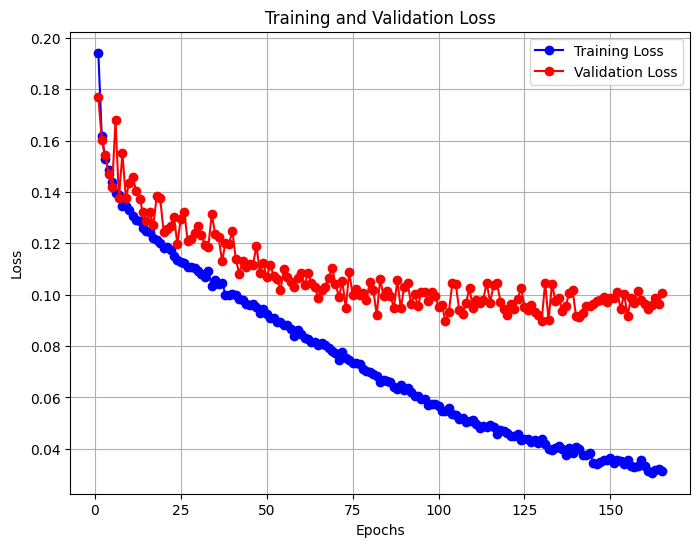

True

In [335]:
# find the best result
best_result = loaded_results[0]
for result in loaded_results:
    if min(result['fscore'], result['accuracy']) > min(best_result['fscore'], best_result['accuracy']):
        best_result = result

bm_ofp = find_overfitting_piont(best_result['history'], plot_show=False, epochs_threshold=10, threshold=0.02)

print(f"Best Model Overfitting Piont: {bm_ofp}")
evaluate_overfitting(best_result['history'], threshold=0.02, epochs_threshold=10, plot_show=True, starting_epoch=bm_ofp)

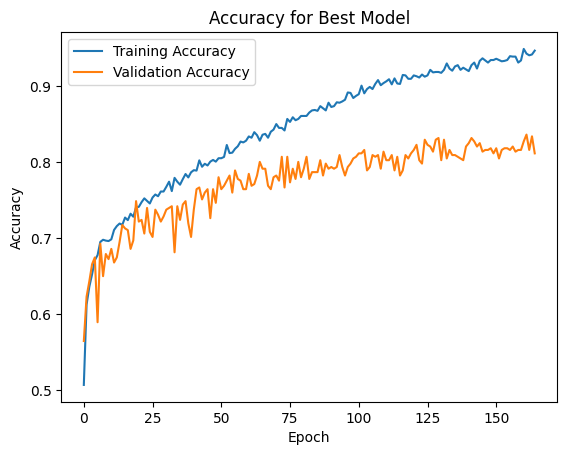

In [337]:
# plot best model accuracy and val accuracy
plt.plot(best_result['history']['accuracy'], label='Training Accuracy')
plt.plot(best_result['history']['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy for Best Model')
plt.legend()
plt.show()

Based on the val_loss and loss, a better epoch would be between 50 and 75. This is because at this piont the val_loss starts to split from the loss and starts to flatten out. Doing this should reduce the overfitting and increase the accuracy of the model.

#### 4.2.2. Final Model Results

Heatmap of the Hybride Optimizer

In [378]:
import seaborn as sns

In [379]:
# load the results joblib
loaded_results = joblib.load('expr/final/results_H_Op_GS.pkl')
final_val_loss = []

for result in loaded_results:
    final_val_loss.append(result['val_loss_history'][-1])

In [380]:
# load the results
results_df_H_Op_loaded = pd.read_csv('expr/final/results_H_Op_GS.csv')

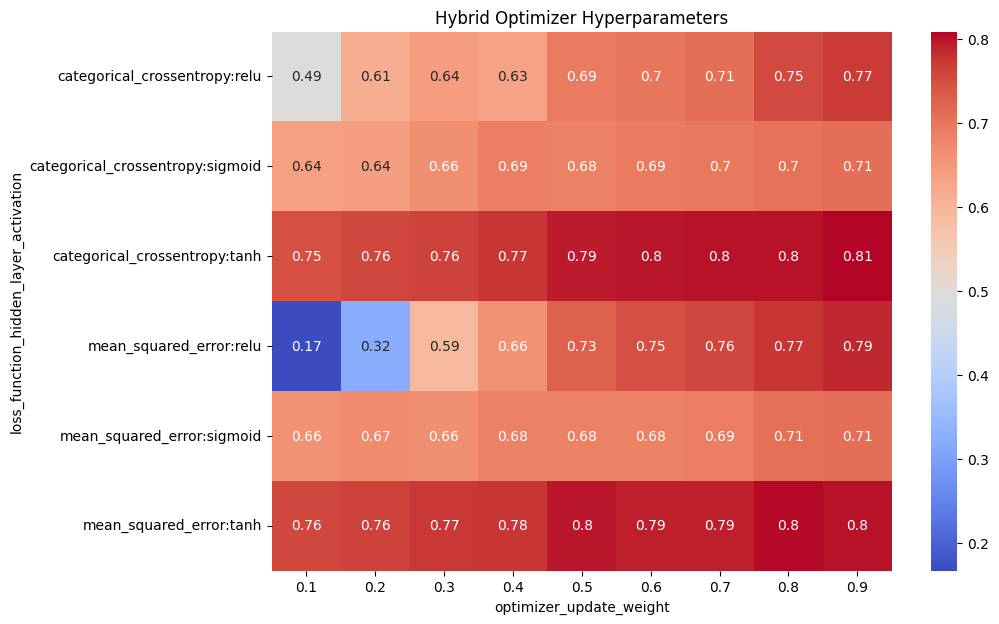

In [381]:
# heatmap of Hybrid optimizer and params ["loss:hidden_layer_activation", "optimizer_update_weight"]

# load the results
results_df_H_Op = pd.read_csv('expr/final/results_H_Op_GS.csv')

# rename the columns
results_df_H_Op.rename(columns={'Unnamed: 0': 'Index'}, inplace=True)

# handle index
results_df_H_Op.set_index('Index', inplace=True)

# split the name column "param_search-{combo_str}:run{count}" -> "param_search-{combo_str}" and "run{count}"
results_df_H_Op['param_search'] = results_df_H_Op['name'].apply(lambda x: x.split(':')[0])

# add final_val_loss
results_df_H_Op['final_val_loss'] = final_val_loss

# new dataframe
results_df_H_Op_grouped = results_df_H_Op.groupby('param_search').agg({'loss': 'first', 'hidden_layer_activation': 'first', 'optimizer_update_weight': 'first'})

# add mean accuracy and fscore and final_val_loss
results_df_H_Op_grouped['accuracy'] = results_df_H_Op.groupby('param_search')['accuracy'].mean()
results_df_H_Op_grouped['fscore'] = results_df_H_Op.groupby('param_search')['fscore'].mean()
results_df_H_Op_grouped['final_val_loss'] = results_df_H_Op.groupby('param_search')['final_val_loss'].mean()

# heatmap heat values is = min(accuracy, fscore)
results_df_H_Op_grouped['value_score'] = results_df_H_Op_grouped[['accuracy', 'fscore']].min(axis=1)

# combo 'loss:hidden_layer_activation'
results_df_H_Op_grouped['loss_function_hidden_layer_activation'] = results_df_H_Op_grouped['loss'] + ':' + results_df_H_Op_grouped['hidden_layer_activation']

# reset index
results_df_H_Op_grouped.reset_index(inplace=True)

# pivot the table
results_df_H_Op_pivot = results_df_H_Op_grouped.pivot(index='loss_function_hidden_layer_activation', columns='optimizer_update_weight', values='value_score')

# plot the heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(results_df_H_Op_pivot, annot=True, cmap='coolwarm')
plt.title('Hybrid Optimizer Hyperparameters')
plt.show()

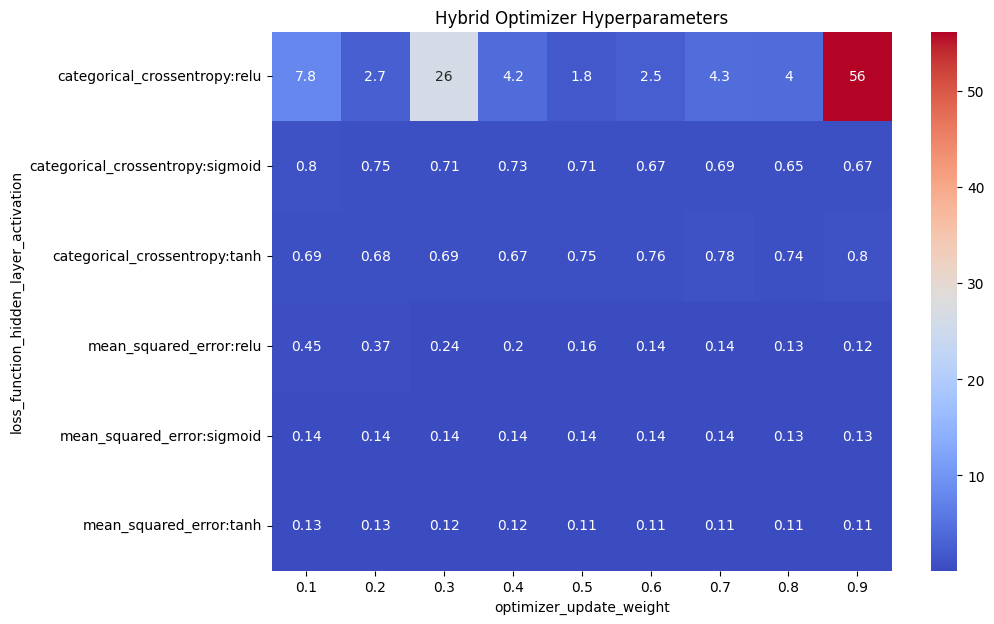

In [384]:
# final val loss heatmap
# pivot the table
results_df_H_Op_pivot = results_df_H_Op_grouped.pivot(index='loss_function_hidden_layer_activation', columns='optimizer_update_weight', values='final_val_loss')

# plot the heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(results_df_H_Op_pivot, annot=True, cmap='coolwarm')
plt.title('Hybrid Optimizer Hyperparameters')
plt.show()

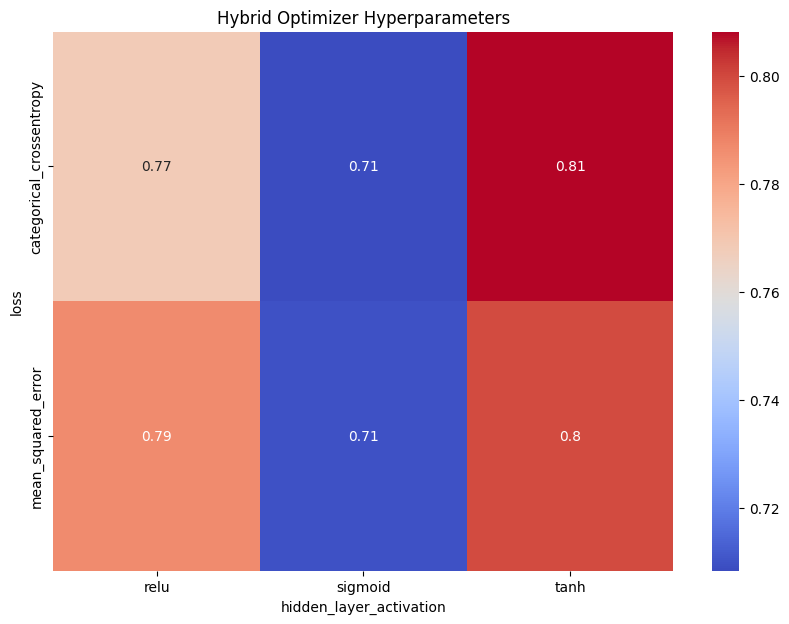

In [385]:
# heatmap of Hybrid optimizer and params ["loss", "hidden_layer_activation"]

# reset index
results_df_H_Op_grouped.reset_index(inplace=True)

# pivot the table for optimizer_update_weight of 0.9
results_df_H_Op_pivot = results_df_H_Op_grouped[results_df_H_Op_grouped['optimizer_update_weight'] == 0.9].pivot(index='loss', columns='hidden_layer_activation', values='value_score')

# plot the heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(results_df_H_Op_pivot, annot=True, cmap='coolwarm')
plt.title('Hybrid Optimizer Hyperparameters')
plt.show()

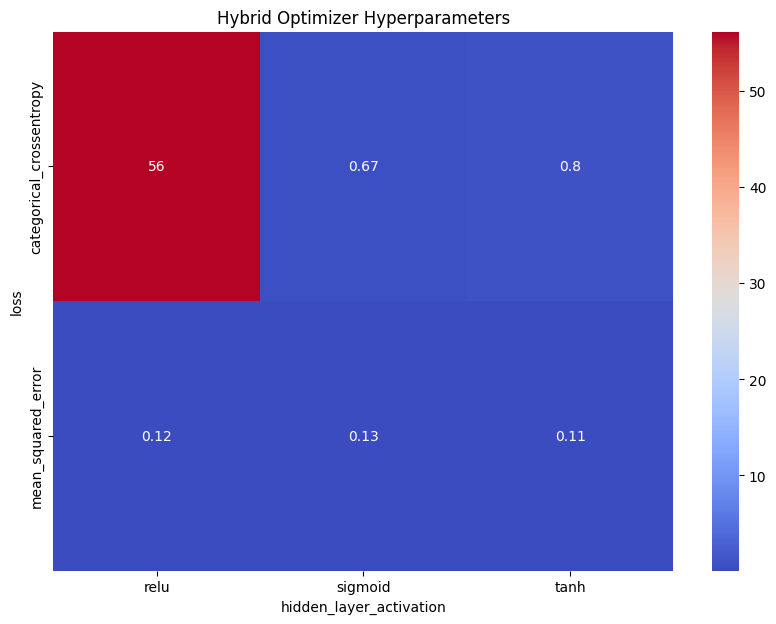

In [386]:
# final val loss heatmap
# pivot the table
results_df_H_Op_pivot = results_df_H_Op_grouped[results_df_H_Op_grouped['optimizer_update_weight'] == 0.9].pivot(index='loss', columns='hidden_layer_activation', values='final_val_loss')

# plot the heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(results_df_H_Op_pivot, annot=True, cmap='coolwarm')
plt.title('Hybrid Optimizer Hyperparameters')
plt.show()

Further Heatmaps for (RPprop, Nadam, Hybride) Optimizers with params (batch_size, hidden_activation)

In [392]:
# load the results
loaded_results_HM_Ha_Bs_RpNdH_df = pd.read_csv('expr/final/heatmap_extra/results_HM_Ha_Bs_RpNdH.csv')
loaded_results_HM_Ha_Bs_RpNdH = joblib.load('expr/final/heatmap_extra/results_HM_Ha_Bs_RpNdH.pkl')

In [393]:
hm_final_val_loss = []

for result in loaded_results_HM_Ha_Bs_RpNdH:
    hm_final_val_loss.append(result['val_loss_history'][-1])

In [394]:
loaded_results_HM_Ha_Bs_RpNdH_df.head()

,Unnamed: 0,name,accuracy,fscore,history,seed,test_size,batch_size,epochs,patience,...,max_step_size,optimizer_update_weight,loss,test_number,optimizer,name_small,loss_history,val_loss_history,accuracy_history,val_accuracy_history
0,0,param_search-0_0_0:run1,0.684588,0.678784,"{'accuracy': [0.45903480052948, 0.531425356864...",480,0.2,8,50,10,...,68.248505,0.85,categorical_crossentropy,0,RProp,param_search-0_0,"[1.031031847000122, 0.9567270874977112, 0.8964...","[1.0077235698699951, 0.921044111251831, 0.8586...","[0.45903480052948, 0.5314253568649292, 0.56621...","[0.4461883306503296, 0.5582959651947021, 0.596..."
1,1,param_search-0_0_0:run2,0.659498,0.656310,"{'accuracy': [0.4450056254863739, 0.5286195278...",551,0.2,8,50,10,...,68.248505,0.85,categorical_crossentropy,1,RProp,param_search-0_0,"[1.0381388664245605, 0.9628699421882629, 0.874...","[0.9883425831794739, 0.9501357078552246, 0.866...","[0.4450056254863739, 0.5286195278167725, 0.598...","[0.5022421479225159, 0.5381165742874146, 0.578..."
2,2,param_search-0_0_0:run4,0.636201,0.631326,"{'accuracy': [0.4511784613132477, 0.5162738561...",423,0.2,8,50,10,...,68.248505,0.85,categorical_crossentropy,3,RProp,param_search-0_0,"[1.0378925800323486, 0.9757322669029236, 0.894...","[0.9947212338447571, 0.9048933982849121, 0.832...","[0.4511784613132477, 0.5162738561630249, 0.547...","[0.5, 0.5695067048072815, 0.6031390428543091, ..."
3,3,param_search-0_0_0:run3,0.666667,0.667606,"{'accuracy': [0.4618406295776367, 0.5202020406...",572,0.2,8,50,10,...,68.248505,0.85,categorical_crossentropy,2,RProp,param_search-0_0,"[1.0398705005645752, 0.9544451236724854, 0.871...","[0.9978272914886475, 0.8706098198890686, 0.810...","[0.4618406295776367, 0.5202020406723022, 0.595...","[0.4506726562976837, 0.5784753561019897, 0.630..."
4,4,param_search-0_0_0:run5,0.659498,0.663075,"{'accuracy': [0.4382716119289398, 0.5173962116...",36,0.2,8,50,10,...,68.248505,0.85,categorical_crossentropy,4,RProp,param_search-0_0,"[1.0441712141036987, 0.9747108817100525, 0.902...","[0.9907833933830261, 0.9428412318229675, 0.875...","[0.4382716119289398, 0.5173962116241455, 0.570...","[0.48878923058509827, 0.49551570415496826, 0.5..."


In [395]:
# heatmap of Hybrid optimizer and params ["batch_size", "hidden_layer_activation"]

# rename the columns
loaded_results_HM_Ha_Bs_RpNdH_df.rename(columns={'Unnamed: 0': 'Index'}, inplace=True)

# handle index
loaded_results_HM_Ha_Bs_RpNdH_df.set_index('Index', inplace=True)

# split the name column "param_search-{combo_str}:run{count}" -> "param_search-{combo_str}" and "run{count}"
loaded_results_HM_Ha_Bs_RpNdH_df['param_search'] = loaded_results_HM_Ha_Bs_RpNdH_df['name'].apply(lambda x: x.split(':')[0])

# add final_val_loss
loaded_results_HM_Ha_Bs_RpNdH_df['final_val_loss'] = hm_final_val_loss

# value score
loaded_results_HM_Ha_Bs_RpNdH_df['value_score'] = loaded_results_HM_Ha_Bs_RpNdH_df[['accuracy', 'fscore']].min(axis=1)

# split into 3 dataframes one for each optimizer
loaded_results_HM_Ha_Bs_RpNdH_RProp = loaded_results_HM_Ha_Bs_RpNdH_df[loaded_results_HM_Ha_Bs_RpNdH_df['optimizer'] == 'RProp']
loaded_results_HM_Ha_Bs_RpNdH_Nadam = loaded_results_HM_Ha_Bs_RpNdH_df[loaded_results_HM_Ha_Bs_RpNdH_df['optimizer'] == 'Nadam']
loaded_results_HM_Ha_Bs_RpNdH_Hybrid = loaded_results_HM_Ha_Bs_RpNdH_df[loaded_results_HM_Ha_Bs_RpNdH_df['optimizer'] == 'Hybrid']

# new dataframe RProp
loaded_results_HM_Ha_Bs_RpNdH_grouped_RProp = loaded_results_HM_Ha_Bs_RpNdH_RProp.groupby('param_search').agg({'hidden_layer_activation': 'first', 'batch_size': 'first'})
loaded_results_HM_Ha_Bs_RpNdH_grouped_RProp['final_val_loss'] = loaded_results_HM_Ha_Bs_RpNdH_RProp.groupby('param_search')['final_val_loss'].mean()
loaded_results_HM_Ha_Bs_RpNdH_grouped_RProp['accuracy'] = loaded_results_HM_Ha_Bs_RpNdH_RProp.groupby('param_search')['accuracy'].mean()
loaded_results_HM_Ha_Bs_RpNdH_grouped_RProp['fscore'] = loaded_results_HM_Ha_Bs_RpNdH_RProp.groupby('param_search')['fscore'].mean()
loaded_results_HM_Ha_Bs_RpNdH_grouped_RProp['value_score'] = loaded_results_HM_Ha_Bs_RpNdH_RProp.groupby('param_search')['value_score'].mean()

# New dataframe Nadam
loaded_results_HM_Ha_Bs_RpNdH_grouped_Nadam = loaded_results_HM_Ha_Bs_RpNdH_Nadam.groupby('param_search').agg({'hidden_layer_activation': 'first', 'batch_size': 'first'})
loaded_results_HM_Ha_Bs_RpNdH_grouped_Nadam['final_val_loss'] = loaded_results_HM_Ha_Bs_RpNdH_Nadam.groupby('param_search')['final_val_loss'].mean()
loaded_results_HM_Ha_Bs_RpNdH_grouped_Nadam['accuracy'] = loaded_results_HM_Ha_Bs_RpNdH_Nadam.groupby('param_search')['accuracy'].mean()
loaded_results_HM_Ha_Bs_RpNdH_grouped_Nadam['fscore'] = loaded_results_HM_Ha_Bs_RpNdH_Nadam.groupby('param_search')['fscore'].mean()
loaded_results_HM_Ha_Bs_RpNdH_grouped_Nadam['value_score'] = loaded_results_HM_Ha_Bs_RpNdH_Nadam.groupby('param_search')['value_score'].mean()

# New dataframe Hybrid
loaded_results_HM_Ha_Bs_RpNdH_grouped_Hybrid = loaded_results_HM_Ha_Bs_RpNdH_Hybrid.groupby('param_search').agg({'hidden_layer_activation': 'first', 'batch_size': 'first'})
loaded_results_HM_Ha_Bs_RpNdH_grouped_Hybrid['final_val_loss'] = loaded_results_HM_Ha_Bs_RpNdH_Hybrid.groupby('param_search')['final_val_loss'].mean()
loaded_results_HM_Ha_Bs_RpNdH_grouped_Hybrid['accuracy'] = loaded_results_HM_Ha_Bs_RpNdH_Hybrid.groupby('param_search')['accuracy'].mean()
loaded_results_HM_Ha_Bs_RpNdH_grouped_Hybrid['fscore'] = loaded_results_HM_Ha_Bs_RpNdH_Hybrid.groupby('param_search')['fscore'].mean()
loaded_results_HM_Ha_Bs_RpNdH_grouped_Hybrid['value_score'] = loaded_results_HM_Ha_Bs_RpNdH_Hybrid.groupby('param_search')['value_score'].mean()

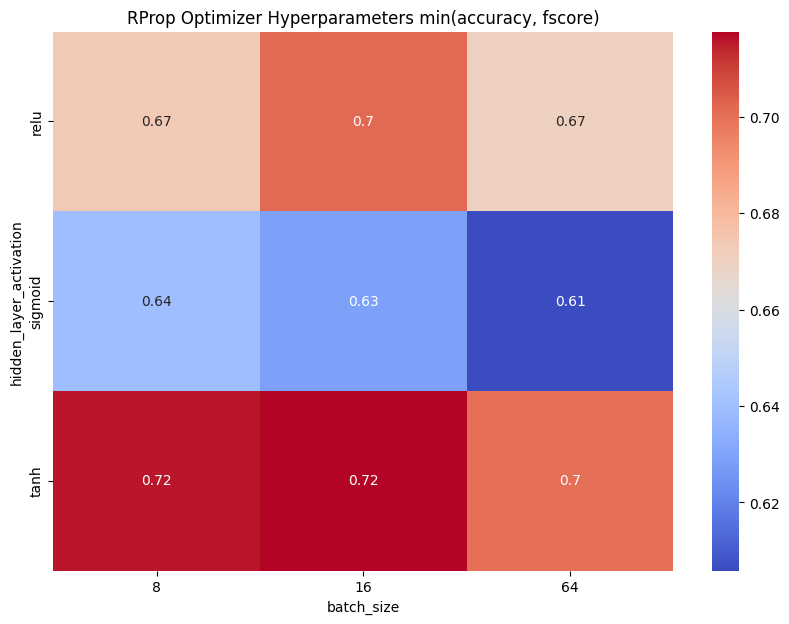

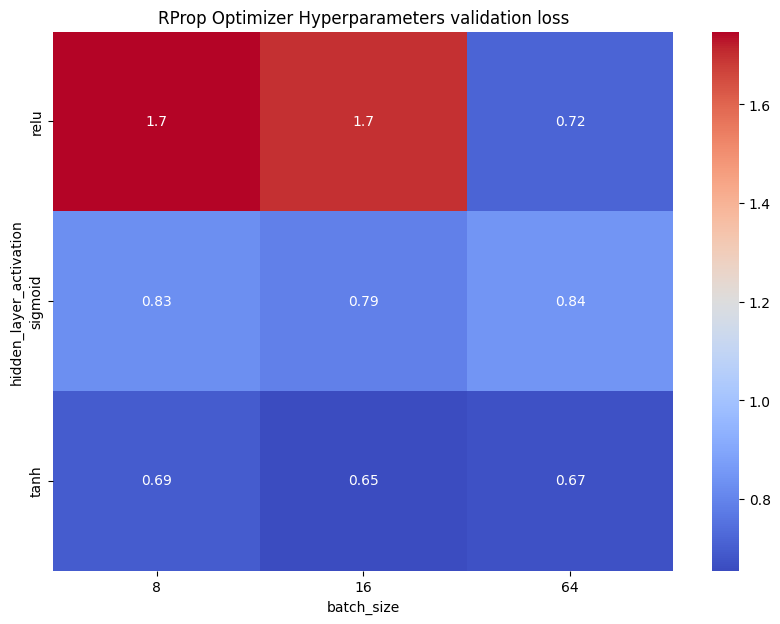

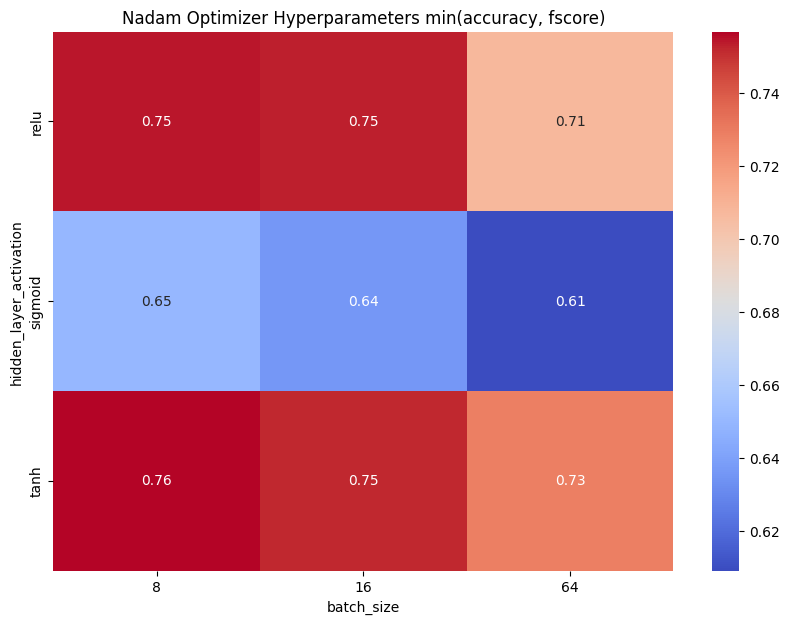

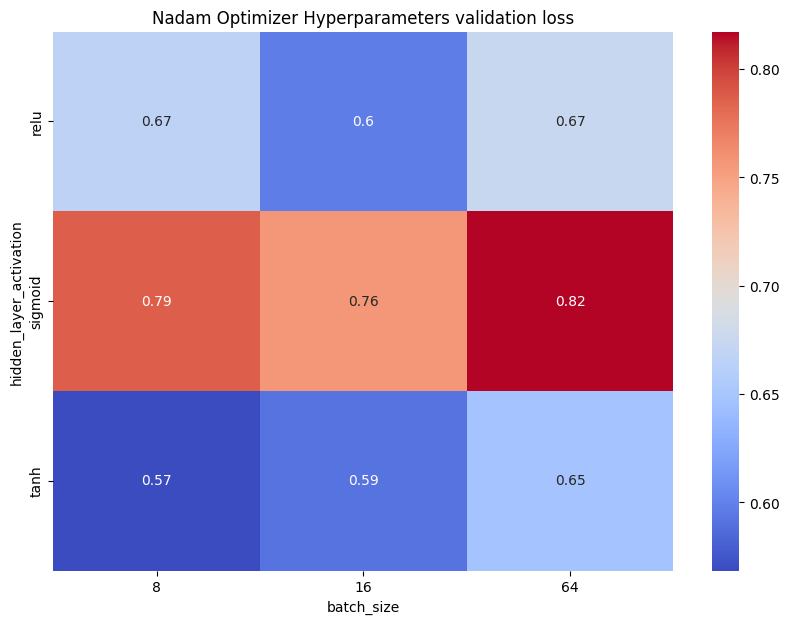

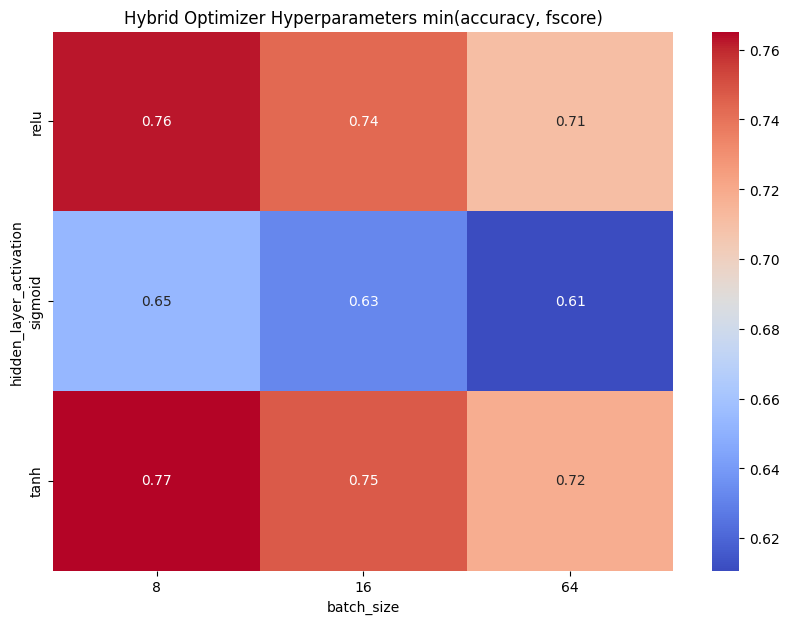

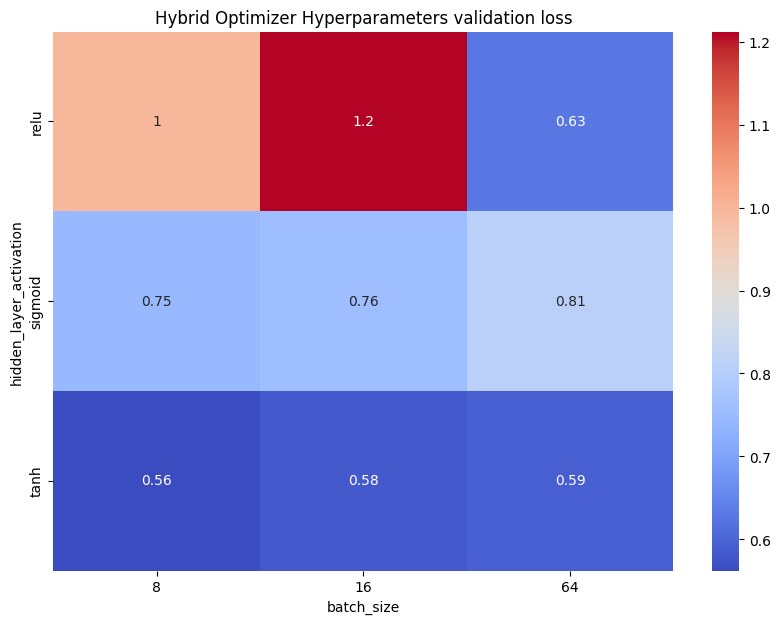

In [397]:
# pivot the table RProp
loaded_results_HM_Ha_Bs_RpNdH_pivot_RProp = loaded_results_HM_Ha_Bs_RpNdH_grouped_RProp.pivot(index='hidden_layer_activation', columns='batch_size', values='value_score')

# plot the heatmap RProp
plt.figure(figsize=(10, 7))
sns.heatmap(loaded_results_HM_Ha_Bs_RpNdH_pivot_RProp, annot=True, cmap='coolwarm')
plt.title('RProp Optimizer Hyperparameters min(accuracy, fscore)')
plt.show()

# final val loss heatmap RProp
# pivot the table
loaded_results_HM_Ha_Bs_RpNdH_pivot_RProp = loaded_results_HM_Ha_Bs_RpNdH_grouped_RProp.pivot(index='hidden_layer_activation', columns='batch_size', values='final_val_loss')

# plot the heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(loaded_results_HM_Ha_Bs_RpNdH_pivot_RProp, annot=True, cmap='coolwarm')
plt.title('RProp Optimizer Hyperparameters validation loss')
plt.show()

# pivot the table Nadam
loaded_results_HM_Ha_Bs_RpNdH_pivot_Nadam = loaded_results_HM_Ha_Bs_RpNdH_grouped_Nadam.pivot(index='hidden_layer_activation', columns='batch_size', values='value_score')

# plot the heatmap Nadam
plt.figure(figsize=(10, 7))
sns.heatmap(loaded_results_HM_Ha_Bs_RpNdH_pivot_Nadam, annot=True, cmap='coolwarm')
plt.title('Nadam Optimizer Hyperparameters min(accuracy, fscore)')
plt.show()

# final val loss heatmap Nadam
# pivot the table
loaded_results_HM_Ha_Bs_RpNdH_pivot_Nadam = loaded_results_HM_Ha_Bs_RpNdH_grouped_Nadam.pivot(index='hidden_layer_activation', columns='batch_size', values='final_val_loss')

# plot the heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(loaded_results_HM_Ha_Bs_RpNdH_pivot_Nadam, annot=True, cmap='coolwarm')
plt.title('Nadam Optimizer Hyperparameters validation loss')
plt.show()

# pivot the table Hybrid
loaded_results_HM_Ha_Bs_RpNdH_pivot_Hybrid = loaded_results_HM_Ha_Bs_RpNdH_grouped_Hybrid.pivot(index='hidden_layer_activation', columns='batch_size', values='value_score')

# plot the heatmap Hybrid
plt.figure(figsize=(10, 7))
sns.heatmap(loaded_results_HM_Ha_Bs_RpNdH_pivot_Hybrid, annot=True, cmap='coolwarm')
plt.title('Hybrid Optimizer Hyperparameters min(accuracy, fscore)')
plt.show()

# final val loss heatmap Hybrid
# pivot the table
loaded_results_HM_Ha_Bs_RpNdH_pivot_Hybrid = loaded_results_HM_Ha_Bs_RpNdH_grouped_Hybrid.pivot(index='hidden_layer_activation', columns='batch_size', values='final_val_loss')

# plot the heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(loaded_results_HM_Ha_Bs_RpNdH_pivot_Hybrid, annot=True, cmap='coolwarm')
plt.title('Hybrid Optimizer Hyperparameters validation loss')
plt.show()

### 4.3. Conclusion

The Nadam optimizer is the best optimizer for this model. It has the best performance over 10 runs and has the best performance in the final model. This can be seen in the heatmap of the Hybride Optimizer where when the weighting for the weight update average is favouring Nadam, the model has the best performance.

loss values for categorical_crossentropy seem to be very high even when the model is performing well. This is likely due to the nature of the loss function and the fact that the model started overfitting when training ended.